# (Transform part) ETL: Cómo obtener todos los datos de todos los restaurantes en Rappi

En síntesis, este notebook es el primero de 3 que explican cómo obtener en .csv:
<ol>
<li>Los países disponibles en Rappi: paises_rappi.csv</li>
<li>Los cadenas de restaurantes disponibles en cada país: cadenas_restaurantes_df.csv</li>
<li>Las sucursales de cada cadena junto con sus atributos.</li>
<li>Una tabla aparte listando las opiniones ligadas a cada sucursal: opiniones_sucursales.csv</li>
</ol>
------
<p>Nota: Este código no tiene multiprocessing ni scrapping. A lo mucho te dolerá entender las expresiones regulares jaja.</p>
<p>Fecha de edición: 4/12/2022</p>


Importamos las librerías a utilizar durante todo el proyecto:

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import csv
import re

## Revisamos nulos
Como esta parte del ETL se trata de transformar y tampoco quiero perder los datos brutos que obtuvimos, nombraremos nuestro main df como "atributos_sucursales_df" para dejar intacto los datos de "atributos_sucursales_bruto.csv".

In [2]:
atributos_sucursales_df = pd.read_csv("atributos_sucursales_bruto.csv")

Las listas por defecto se interpretan como strings a la hora de leerlas, por esta razón y porque vamos a continuamente exportar y leer este df, creé una función que interpreta correctamente nuestros datos.

In [3]:
def clean_alt_list(list_): # Gracias Max Hilsdorf por ayudarme con este código 
    list_ = list_.replace('nan', '"nan"')
    return list_

def interpretar_bien_df(dataframe):
    # Evaluamos las listas de estas columnas para que Pandas no las interprete como strings
    if "opinions" in dataframe.columns:
        dataframe["opinions"] = dataframe["opinions"].apply(eval)
    if "prices" in dataframe.columns:
        dataframe["prices"] = dataframe["prices"].apply(eval)
    if "attributes" in dataframe.columns:
        # Attributes es un caso especial, necesitamos aplicarle 2 funciones
        dataframe["attributes"] = dataframe["attributes"].apply(clean_alt_list)
        dataframe["attributes"] = dataframe["attributes"].apply(eval)
    # Chequeamos como quedó el resultado
    return dataframe

In [4]:
# Le aplicamos la función
atributos_sucursales_df = interpretar_bien_df(atributos_sucursales_df)
# Veamos como queda
atributos_sucursales_df.head(3)

,id_sucursal,attributes,prices,opinions
0,0,"[4.2, 450, 20 - 35 min, Gratis(nuevos usuarios)]","[$ 520,00, $ 400,00, $ 400,00, $ 400,00, $ 650...","[(Calidad de la comida, 27%), (Justo lo que pe..."
1,1,"[nan, nan, nan, Gratis(nuevos usuarios)]","[$ 177,00, $ 231,00, $ 177,00, $ 398,00, $ 362...",[]
2,2,"[nan, nan, 23 - 38 min, Gratis(nuevos usuarios)]","[$ 1.210,00, $ 350,00, $ 510,00, $ 585,00, $ 5...",[]


Chequeamos si se produjo un error en alguna de las columnas. Esto identificando que si hubiera un error, estaría como tipo str en vez de list

In [5]:
for column in atributos_sucursales_df.columns:
    df_con_errores = atributos_sucursales_df[atributos_sucursales_df[column].apply(lambda x:
                                                                                   isinstance(x, str))]
    if len(df_con_errores) == 0:
        print(f"En la columna '{column}' NO hubo errores")
    else:
        print(f"En la columna '{column}' SÍ hubo errores")

En la columna 'id_sucursal' NO hubo errores
En la columna 'attributes' NO hubo errores
En la columna 'prices' NO hubo errores
En la columna 'opinions' NO hubo errores


Ahora debemos de reemplazar las listas vacías por NaNs para poder visualizar mejor estos datos

In [6]:
for column in atributos_sucursales_df.columns:
    atributos_sucursales_df[column] = atributos_sucursales_df[column].apply(
                                        lambda x: np.nan if x == []
                                                else x)
# Veamos como quedó
atributos_sucursales_df.sample(3)

,id_sucursal,attributes,prices,opinions
33004,33004,"[4, 133, 35 - 50 min, Gratis(nuevos usuarios)]","[$ 1.290, $ 9.990, $ 4.053, $ 5.790, $ 6.392, ...","[(Tal como lo pedí, 21%), (Calidad de la comid..."
36717,36717,"[nan, nan, 35 - 50 min, Grátis(novos usuários)]","[R$ 71,80, R$ 91,60, R$ 36,90, R$ 42,90, R$ 39...",NaN
28413,28413,"[4.3, 651, 41 - 56 min, Gratis(nuevos usuarios)]","[$ 39.900, $ 32.900, $ 49.900, $ 31.900, $ 29....","[(Calidad de la comida, 31%), (Justo lo que pe..."


Veamos los valores nulos en nuestro dataset

<AxesSubplot:>

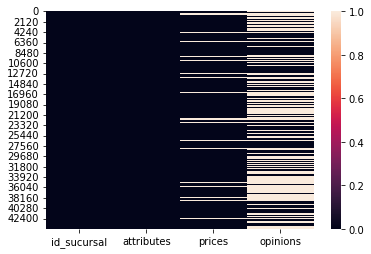

In [7]:
sns.heatmap(atributos_sucursales_df.isnull())

Podemos notar 2 cosas:
<ol>
 <li>Algunos datos en *precios* son nulos. Esto se puede deber a:
  <ul>  - Las sucursales no han publicado su catálogo de productos.</ul>
   <ul> - O se han desabilitados algunos catálogos de algunas sucursales.</ul></li>
 <li>Opiniones tiene un montón de nulos. Este caso ya se debe a que:
   <ul> - Las sucursales no tiene opiniones aún. (Esto podría deberse a que son nuevas).</ul>
    <ul>- Las sucursales ya tienen opiniones pero Rappi no displaya cómo estan compuestas en específico. (Ni idea de porqué haría esto, podría ser que consideran número insuficiente de opiniones para sacar el recuadro).</ul></li>
  </ol>  
<p>Bien, reemplazemos estos nulos de acuerdo al caso:</p>

In [8]:
# Para opiniones 2 cosas:
# 1. Crearé una nueva columna con valores booleanos para usarlo como filtro después.
atributos_sucursales_df["mostraba_opiniones"] = atributos_sucursales_df["opinions"].apply(
                                        lambda x: True if type(x) is list
                                                else False)
# 2. Reemplazaré todas las opiniones vacías por una tupla que las represente
atributos_sucursales_df["opinions"] = atributos_sucursales_df["opinions"].apply(
                                        lambda x: x if type(x) is list
                                                else [("Sin opiniones", "100%")])

In [9]:
# Para prices solo reemplazaremos estas listas vacías por una mejor representación
atributos_sucursales_df["prices"] = atributos_sucursales_df["prices"].apply(
                                        lambda x: x if isinstance(x, list)
                                                else [0])

<AxesSubplot:>

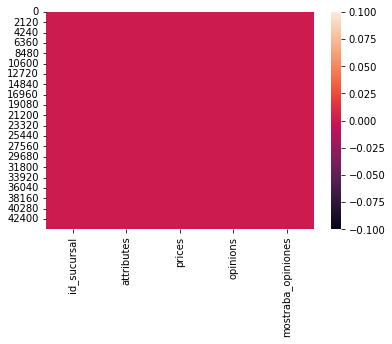

In [10]:
# Chequeamos por última vez
sns.heatmap(atributos_sucursales_df.isnull())

In [11]:
# Guardamos este DF hermoso
atributos_sucursales_df.to_csv("atributos_sucursales_parsed.csv", index=False)

## La última batalla. Parseando atributos y normalizando opiniones

Esta es la parte donde más craneo debes meter si no estás acostumbrado a crear tablas relacionales desde Python. Pero tranquilo, respira, y di conmigo: "Amaré a Python aunque aparezcan 1000 excepciones".
Este es el plan:
1) A la columna atributos la separaremos en 4 columnas: overral_stars, number_opinions, delivery_time, tipo_de_envio.
2) A la columna prices la reduciremos a overall_price_usd. Para esto deberemos convertir cada moneda de cada país a doláres.
3) A la columna opinions la normalizaremos en 3 tablas: pivot_tb, text_opinion_tb y percent_tb.
---
Esta más decir que limpiaremos y reemplazaremos muchos NaNs en el camino. Así que: "THIS IS PYTHON"

### 1. Parseando attributes

In [12]:
# Creamos las columnas en base al índice de los attributes
nuevas_columnas = ["overral_stars", "number_opinions", "tiempo_delivery", "tipo_envio"]

# Creamos las nuevas columnas en nuestro df
for i, column in enumerate(nuevas_columnas):
    atributos_sucursales_df[column] = atributos_sucursales_df["attributes"].apply(
                                                                                lambda x: x[i]
                                                                                )
# Eliminamos la vieja columna
atributos_sucursales_df.drop(["attributes"], axis=1, inplace=True)

In [13]:
# Ahora reemplazamos los NaNs por valores con más sentido para cada caso
valores_reemplazo_nans = [0.0, # Como en Rappi la mínima calificación es 1. Es intuitivo decir que 0 significa sin opinión 
                          0, # Sin opiniones o 0 opiniones
                         0, # Sin tiempo de delivery
                         "No específicado"]
# Realizamos el reemplazo
for i, column in enumerate(nuevas_columnas):
    atributos_sucursales_df[column] = atributos_sucursales_df[column].replace(
                                                                                {'nan': valores_reemplazo_nans[i]}
                                                                                )

Como Rappi también trabaja con Brazil, para las columnas que sean naturalmente texto (*opinions* y *tipo_envio*) tendremos que reemplazar cada frase en portugués por su contraparte en español. Empecemos con la segunda.

In [14]:
# Chequeamos que valores tiene esta columna
atributos_sucursales_df["tipo_envio"].unique()

array(['Gratis(nuevos usuarios)', 'No específicado',
       'Grátis(novos usuários)'], dtype=object)

In [15]:
# Reemplazamos los valores en portugués por español
atributos_sucursales_df["tipo_envio"] = atributos_sucursales_df["tipo_envio"].apply(lambda x:
                                                                                'Gratis(nuevos usuarios)'
                                                                                   if x == "Grátis(novos usuários)"
                                                                                   else x)

In [16]:
# Chequamos
atributos_sucursales_df["tipo_envio"].unique()

array(['Gratis(nuevos usuarios)', 'No específicado'], dtype=object)

Cool, todo bien, continuemos.

In [18]:
# Veamos como va quedando
atributos_sucursales_df.head(3)

,id_sucursal,prices,opinions,mostraba_opiniones,overral_stars,number_opinions,tiempo_delivery,tipo_envio
0,0,"[$ 520,00, $ 400,00, $ 400,00, $ 400,00, $ 650...","[(Calidad de la comida, 27%), (Justo lo que pe...",True,4.2,450,20 - 35 min,Gratis(nuevos usuarios)
1,1,"[$ 177,00, $ 231,00, $ 177,00, $ 398,00, $ 362...","[(Sin opiniones, 100%)]",False,0.0,0,0,Gratis(nuevos usuarios)
2,2,"[$ 1.210,00, $ 350,00, $ 510,00, $ 585,00, $ 5...","[(Sin opiniones, 100%)]",False,0.0,0,23 - 38 min,Gratis(nuevos usuarios)


In [17]:
# Ordenamos el df
atributos_sucursales_df = atributos_sucursales_df.sort_values("id_sucursal")
# Guardamos nuestro avance
atributos_sucursales_df.to_csv("atributos_sucursales_parsed.csv", index=False)

### Parseando tiempo_delivery
Este parseo es sencillo, solo vamos a sacar el promedio de los números dentro de cada string en esta columna. ¿Por qué el promedio y no su mínimo y máximo? Algunas sucursales tienen solo 1 número de tiempo apróximado, entonces es mejor sacar un promedio para no complicarse la vida.

In [65]:
# Función que parsea los valores de strings a números y retorna su promedio
import statistics
def delivery_time_meaner(value_string):
    value_string = value_string # '20 - 35 min', '23 min', '0'
    p = re.sub('[min]|[\s]', '', value_string) # '20-35', '23', '0'
    y = re.split("[-]", p) # ['20', '35'], ['23'], ['0']
    if len(y) > 1:
        for i, value in enumerate(y): 
            y[i] = int(value) # [20, 35]
        y = statistics.mean(y) # 27.5
    else:
        y = int(y[0]) # 23, 0
    return y

In [28]:
# Realizamos el cambio
atributos_sucursales_df["tiempo_delivery"] = atributos_sucursales_df["tiempo_delivery"].apply(lambda x:
                                                                                             delivery_time_meaner(x))

,id_sucursal,prices,opinions
0,0,"[$ 1.980,00, $ 1.950,00, $ 2.390,00, $ 1.950,0...","[(Calidad de la comida, 33%), (Justo lo que pe..."
1,1,"[$ 1.980,00, $ 1.950,00, $ 2.390,00, $ 1.950,0...","[(Calidad de la comida, 31%), (Faltaron alguno..."
2,2,"[$ 700,00, $ 1.980,00, $ 1.980,00, $ 2.250,00,...","[(Sin opiniones, 100%)]"
3,3,"[$ 1.980,00, $ 1.950,00, $ 2.390,00, $ 1.950,0...","[(Calidad de la comida, 34%), (No fue lo que p..."
4,4,"[$ 2.420,00, $ 1.650,00, $ 1.700,00, $ 1.760,0...","[(Calidad de la comida, 38%), (Justo lo que pe..."
...,...,...,...
46353,46353,"[$ 123.50, $ 169.00, $ 143.00, $ 123.50, $ 123...","[(Justo lo que pedí, 21%), (Calidad de la comi..."
46354,46354,"[$ 35.00, $ 46.00, $ 46.00, $ 23.00, $ 20.00, ...","[(Sin opiniones, 100%)]"
46355,46355,"[$ 146.15, $ 159.10, $ 146.15, $ 146.15, $ 140...","[(Calidad de la comida, 38%), (Justo lo que pe..."
46356,46356,"[$ 228.00, $ 198.00, $ 202.00, $ 202.00, $ 192...","[(Calidad de la comida, 29%), (Mala presentaci..."


In [ ]:
# Chequeamos como queda
atributos_sucursales_df.head(3)

In [ ]:
# Guardamos nuestro progreso
atributos_sucursales_df.to_csv("atributos_sucursales_parsed.csv", index=False)

### 2. Reduciendo prices

Cada país tiene una manera única de representar centavos. En Perú los centavos son después del punto, en México es después de las ",". Otras diferencias se pueden notar en los demás países.
Pero, para simplificar la vida, vamos a eliminar estas diferencias y usaremos el dolár como nuestra principal moneda.
Para lograr creé un regex que interpreta la moneda de cada país, pone los centavos después del '.' y las unidades antes (Como lo usa el USD).

In [19]:
# Leemos nuestro df
atributos_sucursales_df = pd.read_csv("atributos_sucursales_parsed.csv")
atributos_sucursales_df = interpretar_bien_df(atributos_sucursales_df)
# Chequeamos que tal quedó
atributos_sucursales_df.sample(3)

,id_sucursal,prices,opinions,mostraba_opiniones,overral_stars,number_opinions,tiempo_delivery,tipo_envio
2812,2812,"[S/ 15.00, S/ 27.00, S/ 16.00, S/ 27.00, S/ 69...","[(Calidad de la comida, 21%), (Tal como lo ped...",True,4.5,110,35 - 50 min,Gratis(nuevos usuarios)
14698,14698,"[$ 155.00, $ 198.00, $ 174.00, $ 214.00, $ 178...","[(Sin opiniones, 100%)]",False,0.0,0,0,Gratis(nuevos usuarios)
19400,19400,"[$ 21,99, $ 14,99, $ 12,99, $ 5,50, $ 3,99, $ ...","[(Sin opiniones, 100%)]",False,4.4,194,0,Gratis(nuevos usuarios)


Bien. El siguiente código me tomó 1 hora en crearlo, no voy a entrar mucho en detalles de cómo lo logré pero en resumidas cuentas:
1) Analisé el caso de cada moneda de cada país.
2) Saque su conversión a doláres.
3) Clasifique las monedas en 2 grupos (El grupo 1, donde los céntimos son los primeros digitos de izquierda a derecha hasta un '.' o una ',', el grupo 2, donde no existe céntimos)
4) Creé una 
Bien, para hacer esto primero debemos obtener los id de los países para cada row.

In [20]:
# Importamos los dfs
#paises_df = pd.read_csv("paises_rappi.csv") No necesario pero lo usaré más adelante
cadenas_restaurantes_df = pd.read_csv("cadenas_restaurantes.csv") 
sucursales_df = pd.read_csv("sucursales.csv")
# Realizamos un join y nos quedamos con el id del país y de la sucursal
df_merged = sucursales_df.merge(cadenas_restaurantes_df, on="id_cadena", how='inner')[["id_sucursal","id_pais"]]
# Hacemos un merge de este último df con el atributos para conseguir el id_pais aquí
atributos_sucursales_df = atributos_sucursales_df.merge(df_merged, on ="id_sucursal", how='inner')

Bien. Todo perfecto, ahora sí veamos esas expresiones regulares.

In [21]:
# Creamos el código que convertirá nuestras listas de strings a flotantes de la col "prices"
# El output de esta función nos servirá como el input de la siguiente
def currency_parser(list_currency_as_string, id_pais):
    new_parsed_list = []
    for currency in list_currency_as_string:
        if currency == 0:
            result = float(currency)
            #print(f'{currency} convertido a {result}')
            new_parsed_list.append(result)
        # x is in this form '$ 1.980,00'
        else:
            p = re.sub('[$] |[A-Z]|[₡]|[S/]|', '', currency) # '1.980,00'.
            y = re.split("[.]|[,]|[\s]", p) # ['1', '980', '00']
            z = ''.join(y[:-1]) # '1980'
            z = z + '.' + y[-1] # '1980.00'
            result = float(z) # 1980.0
            if id_pais in [2,3]: #Osea sea Chile o Colombia 
                z = ''.join(y)
                z = z + '.00'
                result = float(z)
                #print(f'{currency} convertido a {result}')
                new_parsed_list.append(result)
            else:
                #print(f'{currency} convertido a {result}')
                new_parsed_list.append(result)
    return new_parsed_list

In [22]:
# Obtengo la equivalencia a dólares de cada moneda, fecha = 03/12/22
equivalente_10000_dolares = [1676508,# Argentina
                            52195,# Brasil
                            8835000,# Chile
                            47680700,# Colombia
                            5981305, # Costa rica
                            10000, # Ecuador
                            193914,# Mexico
                            38223.49,# Perú
                            394049.80] # Uruguay

In [23]:
# Creamos nuestra función que nos convertirá nuestras monedas a dólares.
def price_to_dollar_for_df(row_dataframe):
    
    # Obtenemos la lista de "prices" y el "id_pais" de cada row
    pais = row_dataframe.id_pais
    list_prices = row_dataframe.prices
    
    # Obtenemos el cambio de dólares
    dollar_change = equivalente_10000_dolares[pais] / 10000
    
    # Obtenemos el precio promedio de cada lista en "prices"
    list_prices_parsed = currency_parser(list_prices, pais)
    x = np.array(list_prices_parsed)
    promedio_precios = x.mean()

    # Lo convertimos y redondeamos a dólares
    y = (promedio_precios / dollar_change)
    z = round(y,2)
    print(f'{dollar_change} --- {promedio_precios} ---- {z}')
    return z

In [24]:
# Creamos una nueva columna para el valor promedio (USD) de los productos
atributos_sucursales_df["dollar_mean_price"] = atributos_sucursales_df.apply(lambda x:
                                                                  price_to_dollar_for_df(x),
                                                                  axis=1)

39.40498 --- 459.9212598425197 ---- 11.67
39.40498 --- 274.9259259259259 ---- 6.98
39.40498 --- 565.6756756756756 ---- 14.36
39.40498 --- 371.61764705882354 ---- 9.43
39.40498 --- 658.0 ---- 16.7
39.40498 --- 663.3333333333334 ---- 16.83
39.40498 --- 132.8955223880597 ---- 3.37
39.40498 --- 402.6136363636364 ---- 10.22
39.40498 --- 463.29545454545456 ---- 11.76
39.40498 --- 495.09090909090907 ---- 12.56
39.40498 --- 457.05878378378384 ---- 11.6
39.40498 --- 495.09090909090907 ---- 12.56
39.40498 --- 0.0 ---- 0.0
39.40498 --- 0.0 ---- 0.0
39.40498 --- 495.09090909090907 ---- 12.56
39.40498 --- 495.09090909090907 ---- 12.56
39.40498 --- 247.64705882352942 ---- 6.28
39.40498 --- 607.2021739130435 ---- 15.41
39.40498 --- 411.0886363636364 ---- 10.43
39.40498 --- 366.26666666666665 ---- 9.29
39.40498 --- 478.2979591836734 ---- 12.14
39.40498 --- 242.09756097560975 ---- 6.14
39.40498 --- 448.5729166666667 ---- 11.38
39.40498 --- 549.3333333333334 ---- 13.94
39.40498 --- 0.0 ---- 0.0
39.40498

3.822349 --- 39.87222222222222 ---- 10.43
3.822349 --- 30.797260273972608 ---- 8.06
3.822349 --- 40.170270270270265 ---- 10.51
3.822349 --- 40.170270270270265 ---- 10.51
3.822349 --- 30.113698630136987 ---- 7.88
3.822349 --- 39.55641025641025 ---- 10.35
3.822349 --- 31.510256410256417 ---- 8.24
3.822349 --- 31.33333333333334 ---- 8.2
3.822349 --- 39.20632911392405 ---- 10.26
3.822349 --- 31.854545454545462 ---- 8.33
3.822349 --- 31.68918918918919 ---- 8.29
3.822349 --- 31.401298701298707 ---- 8.22
3.822349 --- 39.3945205479452 ---- 10.31
3.822349 --- 0.0 ---- 0.0
3.822349 --- 31.33333333333334 ---- 8.2
3.822349 --- 30.839506172839506 ---- 8.07
3.822349 --- 27.71641791044776 ---- 7.25
3.822349 --- 28.774647887323944 ---- 7.53
3.822349 --- 28.262295081967213 ---- 7.39
3.822349 --- 26.5 ---- 6.93
3.822349 --- 34.166666666666664 ---- 8.94
3.822349 --- 25.7 ---- 6.72
3.822349 --- 35.294117647058826 ---- 9.23
3.822349 --- 38.54736842105263 ---- 10.08
3.822349 --- 40.116981132075466 ---- 10.5

3.822349 --- 0.0 ---- 0.0
3.822349 --- 0.0 ---- 0.0
3.822349 --- 36.33793103448276 ---- 9.51
3.822349 --- 29.358620689655172 ---- 7.68
3.822349 --- 29.358620689655172 ---- 7.68
3.822349 --- 37.94363636363637 ---- 9.93
3.822349 --- 29.358620689655172 ---- 7.68
3.822349 --- 36.4509090909091 ---- 9.54
3.822349 --- 29.358620689655172 ---- 7.68
3.822349 --- 29.358620689655172 ---- 7.68
3.822349 --- 29.358620689655172 ---- 7.68
3.822349 --- 29.358620689655172 ---- 7.68
3.822349 --- 29.358620689655172 ---- 7.68
3.822349 --- 36.33793103448276 ---- 9.51
3.822349 --- 36.33793103448276 ---- 9.51
3.822349 --- 30.870370370370374 ---- 8.08
3.822349 --- 29.358620689655172 ---- 7.68
3.822349 --- 29.358620689655172 ---- 7.68
3.822349 --- 29.358620689655172 ---- 7.68
3.822349 --- 29.418181818181825 ---- 7.7
3.822349 --- 30.087500000000002 ---- 7.87
3.822349 --- 29.358620689655172 ---- 7.68
3.822349 --- 29.358620689655172 ---- 7.68
3.822349 --- 29.358620689655176 ---- 7.68
3.822349 --- 29.358620689655172

3.822349 --- 26.16923076923077 ---- 6.85
3.822349 --- 29.404255319148938 ---- 7.69
3.822349 --- 20.802816901408452 ---- 5.44
3.822349 --- 21.11392405063291 ---- 5.52
3.822349 --- 20.802816901408452 ---- 5.44
3.822349 --- 20.802816901408452 ---- 5.44
3.822349 --- 21.584415584415584 ---- 5.65
3.822349 --- 21.2875 ---- 5.57
3.822349 --- 21.11392405063291 ---- 5.52
3.822349 --- 20.802816901408452 ---- 5.44
3.822349 --- 20.956521739130434 ---- 5.48
3.822349 --- 20.802816901408452 ---- 5.44
3.822349 --- 20.802816901408452 ---- 5.44
3.822349 --- 21.0 ---- 5.49
3.822349 --- 21.11392405063291 ---- 5.52
3.822349 --- 20.814285714285713 ---- 5.45
3.822349 --- 20.957142857142856 ---- 5.48
3.822349 --- 21.0 ---- 5.49
3.822349 --- 21.0 ---- 5.49
3.822349 --- 0.0 ---- 0.0
3.822349 --- 20.802816901408452 ---- 5.44
3.822349 --- 29.24 ---- 7.65
3.822349 --- 20.067999999999998 ---- 5.25
3.822349 --- 15.980799999999999 ---- 4.18
3.822349 --- 20.067999999999998 ---- 5.25
3.822349 --- 42.33043478260869 ---- 

19.3914 --- 121.22941176470589 ---- 6.25
19.3914 --- 0.0 ---- 0.0
19.3914 --- 119.74294117647058 ---- 6.18
19.3914 --- 111.98484848484848 ---- 5.77
19.3914 --- 71.58490566037736 ---- 3.69
19.3914 --- 71.58490566037736 ---- 3.69
19.3914 --- 123.88888888888889 ---- 6.39
19.3914 --- 193.676 ---- 9.99
19.3914 --- 136.3305785123967 ---- 7.03
19.3914 --- 113.28828828828829 ---- 5.84
19.3914 --- 122.01034482758621 ---- 6.29
19.3914 --- 161.3 ---- 8.32
19.3914 --- 104.36722222222222 ---- 5.38
19.3914 --- 178.11764705882354 ---- 9.19
19.3914 --- 164.93478260869566 ---- 8.51
19.3914 --- 160.5581395348837 ---- 8.28
19.3914 --- 162.4255319148936 ---- 8.38
19.3914 --- 102.66666666666667 ---- 5.29
19.3914 --- 96.72647058823529 ---- 4.99
19.3914 --- 92.74166666666666 ---- 4.78
19.3914 --- 91.54473684210525 ---- 4.72
19.3914 --- 139.0909090909091 ---- 7.17
19.3914 --- 117.57142857142857 ---- 6.06
19.3914 --- 60.0 ---- 3.09
19.3914 --- 62.9622641509434 ---- 3.25
19.3914 --- 63.76923076923077 ---- 3.29


19.3914 --- 162.1352631578947 ---- 8.36
19.3914 --- 158.98250896057345 ---- 8.2
19.3914 --- 174.08282352941174 ---- 8.98
19.3914 --- 162.96676056338026 ---- 8.4
19.3914 --- 135.29126213592232 ---- 6.98
19.3914 --- 161.29509933774833 ---- 8.32
19.3914 --- 169.11947136563876 ---- 8.72
19.3914 --- 0.0 ---- 0.0
19.3914 --- 134.84342857142857 ---- 6.95
19.3914 --- 166.84530386740332 ---- 8.6
19.3914 --- 137.69058295964126 ---- 7.1
19.3914 --- 153.90595890410958 ---- 7.94
19.3914 --- 133.92395437262357 ---- 6.91
19.3914 --- 169.73977564102563 ---- 8.75
19.3914 --- 169.09165217391305 ---- 8.72
19.3914 --- 169.96078947368423 ---- 8.76
19.3914 --- 172.45624521072799 ---- 8.89
19.3914 --- 163.99309352517986 ---- 8.46
19.3914 --- 177.7670671378092 ---- 9.17
19.3914 --- 168.8779856115108 ---- 8.71
19.3914 --- 170.77793442622954 ---- 8.81
19.3914 --- 169.8071724137931 ---- 8.76
19.3914 --- 168.71078947368423 ---- 8.7
19.3914 --- 178.5418181818182 ---- 9.21
19.3914 --- 175.36936666666665 ---- 9.04
1

19.3914 --- 120.690625 ---- 6.22
19.3914 --- 126.96432432432434 ---- 6.55
19.3914 --- 130.3827027027027 ---- 6.72
19.3914 --- 130.03085106382977 ---- 6.71
19.3914 --- 136.42451612903224 ---- 7.04
19.3914 --- 130.64691358024692 ---- 6.74
19.3914 --- 106.04406779661016 ---- 5.47
19.3914 --- 103.43125 ---- 5.33
19.3914 --- 127.99322033898305 ---- 6.6
19.3914 --- 132.62637362637363 ---- 6.84
19.3914 --- 128.25425531914894 ---- 6.61
19.3914 --- 103.21477272727272 ---- 5.32
19.3914 --- 133.25454545454545 ---- 6.87
19.3914 --- 129.78924731182795 ---- 6.69
19.3914 --- 129.6583783783784 ---- 6.69
19.3914 --- 0.0 ---- 0.0
19.3914 --- 129.5884210526316 ---- 6.68
19.3914 --- 127.37954545454545 ---- 6.57
19.3914 --- 108.38089171974522 ---- 5.59
19.3914 --- 115.23655913978494 ---- 5.94
19.3914 --- 125.74031413612566 ---- 6.48
19.3914 --- 115.09017341040462 ---- 5.94
19.3914 --- 112.95307262569831 ---- 5.82
19.3914 --- 0.0 ---- 0.0
19.3914 --- 99.84605263157896 ---- 5.15
19.3914 --- 114.2632768361581

19.3914 --- 145.924085106383 ---- 7.53
19.3914 --- 122.28365671641792 ---- 6.31
19.3914 --- 146.5220512820513 ---- 7.56
19.3914 --- 147.9314285714286 ---- 7.63
19.3914 --- 146.00493617021277 ---- 7.53
19.3914 --- 0.0 ---- 0.0
19.3914 --- 145.4328813559322 ---- 7.5
19.3914 --- 145.41169491525426 ---- 7.5
19.3914 --- 147.01356223175966 ---- 7.58
19.3914 --- 145.4328813559322 ---- 7.5
19.3914 --- 143.23719626168224 ---- 7.39
19.3914 --- 144.92472573839663 ---- 7.47
19.3914 --- 144.92472573839663 ---- 7.47
19.3914 --- 0.0 ---- 0.0
19.3914 --- 121.42970370370372 ---- 6.26
19.3914 --- 114.25392307692307 ---- 5.89
19.3914 --- 0.0 ---- 0.0
19.3914 --- 140.3905325443787 ---- 7.24
19.3914 --- 0.0 ---- 0.0
19.3914 --- 152.51707317073172 ---- 7.87
19.3914 --- 124.63333333333334 ---- 6.43
19.3914 --- 147.55913265306125 ---- 7.61
19.3914 --- 150.90083333333334 ---- 7.78
19.3914 --- 147.55913265306125 ---- 7.61
19.3914 --- 147.55913265306125 ---- 7.61
19.3914 --- 149.20737704918034 ---- 7.69
19.3914 

19.3914 --- 136.36363636363637 ---- 7.03
19.3914 --- 107.0 ---- 5.52
19.3914 --- 73.02631578947368 ---- 3.77
19.3914 --- 110.34482758620689 ---- 5.69
19.3914 --- 0.0 ---- 0.0
19.3914 --- 80.73456310679612 ---- 4.16
19.3914 --- 85.41791044776119 ---- 4.4
19.3914 --- 80.9090909090909 ---- 4.17
19.3914 --- 176.51162790697674 ---- 9.1
19.3914 --- 176.51162790697674 ---- 9.1
19.3914 --- 176.51162790697674 ---- 9.1
19.3914 --- 452.85714285714283 ---- 23.35
19.3914 --- 420.6756756756757 ---- 21.69
19.3914 --- 425.45454545454544 ---- 21.94
19.3914 --- 450.0 ---- 23.21
19.3914 --- 450.0 ---- 23.21
19.3914 --- 424.44444444444446 ---- 21.89
19.3914 --- 490.0 ---- 25.27
19.3914 --- 402.5 ---- 20.76
19.3914 --- 452.9166666666667 ---- 23.36
19.3914 --- 444.54545454545456 ---- 22.92
19.3914 --- 587.9411764705883 ---- 30.32
19.3914 --- 479.0 ---- 24.7
19.3914 --- 463.75 ---- 23.92
19.3914 --- 457.6923076923077 ---- 23.6
19.3914 --- 0.0 ---- 0.0
19.3914 --- 420.6756756756757 ---- 21.69
19.3914 --- 478.

19.3914 --- 110.80952380952381 ---- 5.71
19.3914 --- 108.13636363636364 ---- 5.58
19.3914 --- 233.6027027027027 ---- 12.05
19.3914 --- 192.3796875 ---- 9.92
19.3914 --- 227.44444444444446 ---- 11.73
19.3914 --- 228.5142857142857 ---- 11.78
19.3914 --- 117.66666666666667 ---- 6.07
19.3914 --- 122.91379310344827 ---- 6.34
19.3914 --- 143.79661016949152 ---- 7.42
19.3914 --- 135.046875 ---- 6.96
19.3914 --- 134.33333333333334 ---- 6.93
19.3914 --- 132.3015873015873 ---- 6.82
19.3914 --- 174.2 ---- 8.98
19.3914 --- 40.529411764705884 ---- 2.09
19.3914 --- 178.2058823529412 ---- 9.19
19.3914 --- 141.84044943820223 ---- 7.31
19.3914 --- 142.97471264367815 ---- 7.37
19.3914 --- 142.7103448275862 ---- 7.36
19.3914 --- 157.86486486486487 ---- 8.14
19.3914 --- 126.0 ---- 6.5
19.3914 --- 102.62857142857143 ---- 5.29
19.3914 --- 96.5 ---- 4.98
19.3914 --- 45.0 ---- 2.32
19.3914 --- 0.0 ---- 0.0
19.3914 --- 139.13846153846154 ---- 7.18
19.3914 --- 56.266666666666666 ---- 2.9
19.3914 --- 0.0 ---- 0.

19.3914 --- 104.54545454545455 ---- 5.39
19.3914 --- 125.71428571428571 ---- 6.48
19.3914 --- 104.54545454545455 ---- 5.39
19.3914 --- 104.54545454545455 ---- 5.39
19.3914 --- 0.0 ---- 0.0
19.3914 --- 113.5 ---- 5.85
19.3914 --- 104.54545454545455 ---- 5.39
19.3914 --- 0.0 ---- 0.0
19.3914 --- 0.0 ---- 0.0
19.3914 --- 104.54545454545455 ---- 5.39
19.3914 --- 104.54545454545455 ---- 5.39
19.3914 --- 98.0 ---- 5.05
19.3914 --- 125.71428571428571 ---- 6.48
19.3914 --- 104.54545454545455 ---- 5.39
19.3914 --- 104.54545454545455 ---- 5.39
19.3914 --- 104.54545454545455 ---- 5.39
19.3914 --- 104.54545454545455 ---- 5.39
19.3914 --- 104.54545454545455 ---- 5.39
19.3914 --- 104.54545454545455 ---- 5.39
19.3914 --- 104.54545454545455 ---- 5.39
19.3914 --- 104.54545454545455 ---- 5.39
19.3914 --- 94.16666666666667 ---- 4.86
19.3914 --- 125.71428571428571 ---- 6.48
19.3914 --- 103.63636363636364 ---- 5.34
19.3914 --- 111.81818181818181 ---- 5.77
19.3914 --- 125.71428571428571 ---- 6.48
19.3914 --

19.3914 --- 254.5952380952381 ---- 13.13
19.3914 --- 0.0 ---- 0.0
19.3914 --- 249.48837209302326 ---- 12.87
19.3914 --- 252.11904761904762 ---- 13.0
19.3914 --- 254.5952380952381 ---- 13.13
19.3914 --- 260.4146341463415 ---- 13.43
19.3914 --- 237.13725490196077 ---- 12.23
19.3914 --- 249.48837209302326 ---- 12.87
19.3914 --- 243.82222222222222 ---- 12.57
19.3914 --- 230.79245283018867 ---- 11.9
19.3914 --- 230.79245283018867 ---- 11.9
19.3914 --- 249.48837209302326 ---- 12.87
19.3914 --- 249.48837209302326 ---- 12.87
19.3914 --- 0.0 ---- 0.0
19.3914 --- 264.6923076923077 ---- 13.65
19.3914 --- 249.48837209302326 ---- 12.87
19.3914 --- 249.48837209302326 ---- 12.87
19.3914 --- 249.48837209302326 ---- 12.87
19.3914 --- 249.48837209302326 ---- 12.87
19.3914 --- 227.89830508474577 ---- 11.75
19.3914 --- 249.48837209302326 ---- 12.87
19.3914 --- 186.08510638297872 ---- 9.6
19.3914 --- 249.48837209302326 ---- 12.87
19.3914 --- 234.1206896551724 ---- 12.07
19.3914 --- 251.41304347826087 ---- 

19.3914 --- 136.58823529411765 ---- 7.04
19.3914 --- 137.28571428571428 ---- 7.08
19.3914 --- 138.5686274509804 ---- 7.15
19.3914 --- 137.1346153846154 ---- 7.07
19.3914 --- 136.58823529411765 ---- 7.04
19.3914 --- 136.57692307692307 ---- 7.04
19.3914 --- 142.79591836734693 ---- 7.36
19.3914 --- 0.0 ---- 0.0
19.3914 --- 135.84 ---- 7.01
19.3914 --- 137.6122448979592 ---- 7.1
19.3914 --- 137.1346153846154 ---- 7.07
19.3914 --- 137.76470588235293 ---- 7.1
19.3914 --- 136.2156862745098 ---- 7.02
19.3914 --- 138.82978723404256 ---- 7.16
19.3914 --- 140.9787234042553 ---- 7.27
19.3914 --- 136.57692307692307 ---- 7.04
19.3914 --- 140.14583333333334 ---- 7.23
19.3914 --- 142.45 ---- 7.35
19.3914 --- 136.57692307692307 ---- 7.04
19.3914 --- 137.0 ---- 7.06
19.3914 --- 66.58490566037736 ---- 3.43
19.3914 --- 151.65432098765433 ---- 7.82
19.3914 --- 146.58227848101265 ---- 7.56
19.3914 --- 110.56027397260273 ---- 5.7
19.3914 --- 262.72549019607845 ---- 13.55
19.3914 --- 262.72549019607845 ---- 1

19.3914 --- 128.1222222222222 ---- 6.61
19.3914 --- 153.38888888888889 ---- 7.91
19.3914 --- 121.54105263157894 ---- 6.27
19.3914 --- 136.48 ---- 7.04
19.3914 --- 104.26166666666666 ---- 5.38
19.3914 --- 115.24615384615385 ---- 5.94
19.3914 --- 120.29904761904761 ---- 6.2
19.3914 --- 114.64421052631577 ---- 5.91
19.3914 --- 121.54105263157896 ---- 6.27
19.3914 --- 132.8190476190476 ---- 6.85
19.3914 --- 124.53119999999998 ---- 6.42
19.3914 --- 106.27789473684211 ---- 5.48
19.3914 --- 105.01037037037038 ---- 5.42
19.3914 --- 126.58947368421052 ---- 6.53
19.3914 --- 69.25666666666666 ---- 3.57
19.3914 --- 0.0 ---- 0.0
19.3914 --- 130.74266666666665 ---- 6.74
19.3914 --- 121.54105263157896 ---- 6.27
19.3914 --- 0.0 ---- 0.0
19.3914 --- 149.26105263157896 ---- 7.7
19.3914 --- 135.17857142857142 ---- 6.97
19.3914 --- 127.0 ---- 6.55
19.3914 --- 0.0 ---- 0.0
19.3914 --- 119.04285714285713 ---- 6.14
19.3914 --- 115.61714285714285 ---- 5.96
19.3914 --- 0.0 ---- 0.0
19.3914 --- 130.742666666666

19.3914 --- 0.0 ---- 0.0
19.3914 --- 110.34722222222223 ---- 5.69
19.3914 --- 110.55714285714286 ---- 5.7
19.3914 --- 110.74285714285715 ---- 5.71
19.3914 --- 114.16666666666667 ---- 5.89
19.3914 --- 110.45070422535211 ---- 5.7
19.3914 --- 112.64615384615385 ---- 5.81
19.3914 --- 110.45070422535211 ---- 5.7
19.3914 --- 111.66666666666667 ---- 5.76
19.3914 --- 113.21875 ---- 5.84
19.3914 --- 110.8970588235294 ---- 5.72
19.3914 --- 111.66666666666667 ---- 5.76
19.3914 --- 110.45070422535211 ---- 5.7
19.3914 --- 70.67999999999999 ---- 3.64
19.3914 --- 165.4 ---- 8.53
19.3914 --- 138.45487804878047 ---- 7.14
19.3914 --- 123.08636363636364 ---- 6.35
19.3914 --- 132.59339622641508 ---- 6.84
19.3914 --- 135.7 ---- 7.0
19.3914 --- 161.4814814814815 ---- 8.33
19.3914 --- 88.00094594594594 ---- 4.54
19.3914 --- 88.41191780821917 ---- 4.56
19.3914 --- 89.39283582089551 ---- 4.61
19.3914 --- 126.28200000000001 ---- 6.51
19.3914 --- 264.4140625 ---- 13.64
19.3914 --- 152.58620689655172 ---- 7.87
19

1.0 --- 13.924444444444447 ---- 13.92
1.0 --- 13.947586206896553 ---- 13.95
1.0 --- 14.54587155963303 ---- 14.55
1.0 --- 13.860341880341883 ---- 13.86
1.0 --- 12.485178571428573 ---- 12.49
1.0 --- 12.474017857142858 ---- 12.47
1.0 --- 11.653285714285715 ---- 11.65
1.0 --- 6.1611111111111105 ---- 6.16
1.0 --- 8.86864406779661 ---- 8.87
1.0 --- 14.738490566037738 ---- 14.74
1.0 --- 6.346969696969697 ---- 6.35
1.0 --- 6.346969696969697 ---- 6.35
1.0 --- 6.346969696969697 ---- 6.35
1.0 --- 6.838771929824562 ---- 6.84
1.0 --- 15.283999999999997 ---- 15.28
1.0 --- 5.083333333333333 ---- 5.08
1.0 --- 7.05709219858156 ---- 7.06
1.0 --- 4.731818181818182 ---- 4.73
1.0 --- 9.706643356643358 ---- 9.71
1.0 --- 9.706643356643358 ---- 9.71
1.0 --- 9.706643356643358 ---- 9.71
1.0 --- 9.706643356643358 ---- 9.71
1.0 --- 6.231884057971015 ---- 6.23
1.0 --- 5.358695652173913 ---- 5.36
1.0 --- 6.946511627906975 ---- 6.95
1.0 --- 4.167735849056603 ---- 4.17
1.0 --- 7.183636363636362 ---- 7.18
1.0 --- 0.0 

1.0 --- 5.939146341463415 ---- 5.94
1.0 --- 6.100769230769231 ---- 6.1
1.0 --- 5.8001249999999995 ---- 5.8
1.0 --- 6.094024390243903 ---- 6.09
1.0 --- 5.8176250000000005 ---- 5.82
1.0 --- 6.094166666666666 ---- 6.09
1.0 --- 6.056623376623377 ---- 6.06
1.0 --- 6.281612903225806 ---- 6.28
1.0 --- 6.150243902439025 ---- 6.15
1.0 --- 5.541645569620253 ---- 5.54
1.0 --- 5.814767441860465 ---- 5.81
1.0 --- 5.837439024390244 ---- 5.84
1.0 --- 11.734920634920634 ---- 11.73
1.0 --- 11.734920634920634 ---- 11.73
1.0 --- 12.010533333333333 ---- 12.01
1.0 --- 10.760392156862746 ---- 10.76
1.0 --- 11.252545454545459 ---- 11.25
1.0 --- 4.710000000000001 ---- 4.71
1.0 --- 3.8016666666666667 ---- 3.8
1.0 --- 6.471590909090909 ---- 6.47
1.0 --- 7.584880952380952 ---- 7.58
1.0 --- 4.749148936170213 ---- 4.75
1.0 --- 0.0 ---- 0.0
1.0 --- 12.833064516129033 ---- 12.83
1.0 --- 5.9625 ---- 5.96
1.0 --- 9.304150943396227 ---- 9.3
1.0 --- 9.56694915254237 ---- 9.57
1.0 --- 8.591923076923077 ---- 8.59
1.0 --- 

598.1305 --- 6464.666666666667 ---- 10.81
598.1305 --- 6235.368961038961 ---- 10.42
598.1305 --- 3919.4444444444443 ---- 6.55
598.1305 --- 4695.862344827587 ---- 7.85
598.1305 --- 5090.197941176471 ---- 8.51
598.1305 --- 4294.891897810219 ---- 7.18
598.1305 --- 4377.431874999999 ---- 7.32
598.1305 --- 5090.197941176471 ---- 8.51
598.1305 --- 5037.880707070708 ---- 8.42
598.1305 --- 5027.321546391753 ---- 8.41
598.1305 --- 4355.595734265735 ---- 7.28
598.1305 --- 5158.335196078432 ---- 8.62
598.1305 --- 5090.197941176471 ---- 8.51
598.1305 --- 5090.197941176471 ---- 8.51
598.1305 --- 5142.922035398231 ---- 8.6
598.1305 --- 4437.50125 ---- 7.42
598.1305 --- 4381.339366197183 ---- 7.33
598.1305 --- 5173.269108910891 ---- 8.65
598.1305 --- 4377.431874999999 ---- 7.32
598.1305 --- 4902.083402777778 ---- 8.2
598.1305 --- 5090.197941176471 ---- 8.51
598.1305 --- 4756.480805369128 ---- 7.95
598.1305 --- 4850.355460992908 ---- 8.11
598.1305 --- 4356.0727857142865 ---- 7.28
598.1305 --- 3306.818

4768.07 --- 8939.666666666666 ---- 1.87
4768.07 --- 12126.787234042553 ---- 2.54
4768.07 --- 7902.596774193548 ---- 1.66
4768.07 --- 10910.042372881357 ---- 2.29
4768.07 --- 7573.152173913043 ---- 1.59
4768.07 --- 12729.279279279279 ---- 2.67
4768.07 --- 7524.638157894737 ---- 1.58
4768.07 --- 8327.126865671642 ---- 1.75
4768.07 --- 12788.144329896908 ---- 2.68
4768.07 --- 11214.12213740458 ---- 2.35
4768.07 --- 0.0 ---- 0.0
4768.07 --- 8131.439393939394 ---- 1.71
4768.07 --- 10401.324137931035 ---- 2.18
4768.07 --- 7572.101449275362 ---- 1.59
4768.07 --- 0.0 ---- 0.0
4768.07 --- 0.0 ---- 0.0
4768.07 --- 10851.10294117647 ---- 2.28
4768.07 --- 7385.992647058823 ---- 1.55
4768.07 --- 0.0 ---- 0.0
4768.07 --- 10435.822784810127 ---- 2.19
4768.07 --- 10977.598684210527 ---- 2.3
4768.07 --- 10879.161073825504 ---- 2.28
4768.07 --- 7463.3828125 ---- 1.57
4768.07 --- 7137.956204379562 ---- 1.5
4768.07 --- 0.0 ---- 0.0
4768.07 --- 10956.73076923077 ---- 2.3
4768.07 --- 8050.884955752213 ---- 

4768.07 --- 27124.175824175825 ---- 5.69
4768.07 --- 28895.327102803738 ---- 6.06
4768.07 --- 28678.703703703704 ---- 6.01
4768.07 --- 26318.26923076923 ---- 5.52
4768.07 --- 28678.703703703704 ---- 6.01
4768.07 --- 28678.703703703704 ---- 6.01
4768.07 --- 28678.703703703704 ---- 6.01
4768.07 --- 28678.703703703704 ---- 6.01
4768.07 --- 32282.65254237288 ---- 6.77
4768.07 --- 28646.22641509434 ---- 6.01
4768.07 --- 28872.89719626168 ---- 6.06
4768.07 --- 28678.703703703704 ---- 6.01
4768.07 --- 28678.703703703704 ---- 6.01
4768.07 --- 26448.543689320388 ---- 5.55
4768.07 --- 28872.89719626168 ---- 6.06
4768.07 --- 28678.703703703704 ---- 6.01
4768.07 --- 28678.703703703704 ---- 6.01
4768.07 --- 28678.703703703704 ---- 6.01
4768.07 --- 5661.290322580645 ---- 1.19
4768.07 --- 0.0 ---- 0.0
4768.07 --- 34066.07142857143 ---- 7.14
4768.07 --- 19460.526315789473 ---- 4.08
4768.07 --- 16138.888888888889 ---- 3.38
4768.07 --- 12425.0 ---- 2.61
4768.07 --- 12400.0 ---- 2.6
4768.07 --- 11009.677

4768.07 --- 15049.52380952381 ---- 3.16
4768.07 --- 15292.380952380952 ---- 3.21
4768.07 --- 17175.555555555555 ---- 3.6
4768.07 --- 16397.6 ---- 3.44
4768.07 --- 14783.333333333334 ---- 3.1
4768.07 --- 15685.714285714286 ---- 3.29
4768.07 --- 17839.03846153846 ---- 3.74
4768.07 --- 30661.53846153846 ---- 6.43
4768.07 --- 16339.424242424242 ---- 3.43
4768.07 --- 5666.666666666667 ---- 1.19
4768.07 --- 20932.20338983051 ---- 4.39
4768.07 --- 18964.864864864863 ---- 3.98
4768.07 --- 19306.756756756757 ---- 4.05
4768.07 --- 23970.833333333332 ---- 5.03
4768.07 --- 24338.88888888889 ---- 5.1
4768.07 --- 23184.615384615383 ---- 4.86
4768.07 --- 42038.96103896104 ---- 8.82
4768.07 --- 13800.0 ---- 2.89
4768.07 --- 0.0 ---- 0.0
4768.07 --- 15896.774193548386 ---- 3.33
4768.07 --- 0.0 ---- 0.0
4768.07 --- 16240.777777777777 ---- 3.41
4768.07 --- 17377.777777777777 ---- 3.64
4768.07 --- 21342.85714285714 ---- 4.48
4768.07 --- 0.0 ---- 0.0
4768.07 --- 19125.0 ---- 4.01
4768.07 --- 22577.77777777

4768.07 --- 22950.0 ---- 4.81
4768.07 --- 23041.525423728814 ---- 4.83
4768.07 --- 22801.35135135135 ---- 4.78
4768.07 --- 23528.614457831325 ---- 4.93
4768.07 --- 21836.340206185567 ---- 4.58
4768.07 --- 22090.886699507388 ---- 4.63
4768.07 --- 29079.5 ---- 6.1
4768.07 --- 29852.21212121212 ---- 6.26
4768.07 --- 0.0 ---- 0.0
4768.07 --- 21700.0 ---- 4.55
4768.07 --- 28692.30769230769 ---- 6.02
4768.07 --- 37837.5 ---- 7.94
4768.07 --- 18607.14285714286 ---- 3.9
4768.07 --- 15424.839285714286 ---- 3.24
4768.07 --- 30983.60655737705 ---- 6.5
4768.07 --- 30983.60655737705 ---- 6.5
4768.07 --- 30983.60655737705 ---- 6.5
4768.07 --- 30983.60655737705 ---- 6.5
4768.07 --- 30027.777777777777 ---- 6.3
4768.07 --- 30983.60655737705 ---- 6.5
4768.07 --- 31435.0 ---- 6.59
4768.07 --- 30983.60655737705 ---- 6.5
4768.07 --- 31170.491803278688 ---- 6.54
4768.07 --- 30983.60655737705 ---- 6.5
4768.07 --- 31435.0 ---- 6.59
4768.07 --- 31104.918032786885 ---- 6.52
4768.07 --- 30983.60655737705 ---- 6.

4768.07 --- 19538.297872340427 ---- 4.1
4768.07 --- 21509.333333333332 ---- 4.51
4768.07 --- 20702.962962962964 ---- 4.34
4768.07 --- 28054.58695652174 ---- 5.88
4768.07 --- 24169.924812030076 ---- 5.07
4768.07 --- 30586.53846153846 ---- 6.41
4768.07 --- 31159.698529411766 ---- 6.54
4768.07 --- 30685.471337579616 ---- 6.44
4768.07 --- 31008.04268292683 ---- 6.5
4768.07 --- 31017.798780487807 ---- 6.51
4768.07 --- 30957.432926829268 ---- 6.49
4768.07 --- 12188.0 ---- 2.56
4768.07 --- 11163.333333333334 ---- 2.34
4768.07 --- 11300.0 ---- 2.37
4768.07 --- 11538.4 ---- 2.42
4768.07 --- 11163.333333333334 ---- 2.34
4768.07 --- 15420.0 ---- 3.23
4768.07 --- 17379.41176470588 ---- 3.64
4768.07 --- 14746.376811594202 ---- 3.09
4768.07 --- 14990.625 ---- 3.14
4768.07 --- 13934.782608695652 ---- 2.92
4768.07 --- 9800.0 ---- 2.06
4768.07 --- 15566.197183098591 ---- 3.26
4768.07 --- 10813.559322033898 ---- 2.27
4768.07 --- 25216.0 ---- 5.29
4768.07 --- 12487.755102040815 ---- 2.62
4768.07 --- 1977

4768.07 --- 22535.714285714286 ---- 4.73
4768.07 --- 21684.615384615383 ---- 4.55
4768.07 --- 21547.82608695652 ---- 4.52
4768.07 --- 21576.470588235294 ---- 4.53
4768.07 --- 21852.136752136754 ---- 4.58
4768.07 --- 20881.30841121495 ---- 4.38
4768.07 --- 22295.614035087718 ---- 4.68
4768.07 --- 21625.641025641027 ---- 4.54
4768.07 --- 21576.470588235294 ---- 4.53
4768.07 --- 21171.07438016529 ---- 4.44
4768.07 --- 0.0 ---- 0.0
4768.07 --- 21576.470588235294 ---- 4.53
4768.07 --- 21279.2 ---- 4.46
4768.07 --- 21201.62601626016 ---- 4.45
4768.07 --- 20333.333333333332 ---- 4.26
4768.07 --- 0.0 ---- 0.0
4768.07 --- 21279.2 ---- 4.46
4768.07 --- 21279.2 ---- 4.46
4768.07 --- 21279.2 ---- 4.46
4768.07 --- 21676.923076923078 ---- 4.55
4768.07 --- 21513.043478260868 ---- 4.51
4768.07 --- 21548.672566371682 ---- 4.52
4768.07 --- 21576.470588235294 ---- 4.53
4768.07 --- 21702.63157894737 ---- 4.55
4768.07 --- 21817.094017094016 ---- 4.58
4768.07 --- 21650.42735042735 ---- 4.54
4768.07 --- 2157

4768.07 --- 29728.846153846152 ---- 6.23
4768.07 --- 30078.72340425532 ---- 6.31
4768.07 --- 29828.0 ---- 6.26
4768.07 --- 30440.425531914894 ---- 6.38
4768.07 --- 28187.23404255319 ---- 5.91
4768.07 --- 29808.0 ---- 6.25
4768.07 --- 28984.615384615383 ---- 6.08
4768.07 --- 12955.357142857143 ---- 2.72
4768.07 --- 22048.571428571428 ---- 4.62
4768.07 --- 0.0 ---- 0.0
4768.07 --- 23393.877551020407 ---- 4.91
4768.07 --- 16975.454545454544 ---- 3.56
4768.07 --- 12244.406779661016 ---- 2.57
4768.07 --- 22053.846153846152 ---- 4.63
4768.07 --- 23938.095238095237 ---- 5.02
4768.07 --- 21872.881355932204 ---- 4.59
4768.07 --- 21394.927536231884 ---- 4.49
4768.07 --- 9992.307692307691 ---- 2.1
4768.07 --- 10389.18918918919 ---- 2.18
4768.07 --- 17344.64285714286 ---- 3.64
4768.07 --- 18629.032258064515 ---- 3.91
4768.07 --- 18629.032258064515 ---- 3.91
4768.07 --- 28872.093023255813 ---- 6.06
4768.07 --- 19834.262295081968 ---- 4.16
4768.07 --- 18833.709677419356 ---- 3.95
4768.07 --- 56902.0

883.5 --- 6037.4 ---- 6.83
883.5 --- 6368.476190476191 ---- 7.21
883.5 --- 8493.693693693695 ---- 9.61
883.5 --- 8493.693693693695 ---- 9.61
883.5 --- 0.0 ---- 0.0
883.5 --- 8467.88990825688 ---- 9.58
883.5 --- 8953.125 ---- 10.13
883.5 --- 11731.923076923076 ---- 13.28
883.5 --- 7793.541666666667 ---- 8.82
883.5 --- 6159.259259259259 ---- 6.97
883.5 --- 9878.57142857143 ---- 11.18
883.5 --- 4419.6 ---- 5.0
883.5 --- 4601.5625 ---- 5.21
883.5 --- 10615.78947368421 ---- 12.02
883.5 --- 6678.611111111111 ---- 7.56
883.5 --- 5014.285714285715 ---- 5.68
883.5 --- 6655.357142857143 ---- 7.53
883.5 --- 6420.740740740741 ---- 7.27
883.5 --- 7102.413793103448 ---- 8.04
883.5 --- 6655.357142857143 ---- 7.53
883.5 --- 6809.62962962963 ---- 7.71
883.5 --- 6912.0 ---- 7.82
883.5 --- 7391.764705882353 ---- 8.37
883.5 --- 6655.357142857143 ---- 7.53
883.5 --- 6420.740740740741 ---- 7.27
883.5 --- 6655.357142857143 ---- 7.53
883.5 --- 0.0 ---- 0.0
883.5 --- 6420.740740740741 ---- 7.27
883.5 --- 6655.

883.5 --- 5740.617283950617 ---- 6.5
883.5 --- 5725.54347826087 ---- 6.48
883.5 --- 6162.254901960784 ---- 6.97
883.5 --- 5777.840909090909 ---- 6.54
883.5 --- 5719.310344827586 ---- 6.47
883.5 --- 5770.879120879121 ---- 6.53
883.5 --- 5813.595505617977 ---- 6.58
883.5 --- 5861.9047619047615 ---- 6.63
883.5 --- 5593.103448275862 ---- 6.33
883.5 --- 6056.086956521739 ---- 6.85
883.5 --- 5751.566265060241 ---- 6.51
883.5 --- 6162.254901960784 ---- 6.97
883.5 --- 5679.6511627906975 ---- 6.43
883.5 --- 5702.747252747253 ---- 6.45
883.5 --- 5787.411764705882 ---- 6.55
883.5 --- 6073.181818181818 ---- 6.87
883.5 --- 6073.181818181818 ---- 6.87
883.5 --- 5725.54347826087 ---- 6.48
883.5 --- 5719.540229885058 ---- 6.47
883.5 --- 6118.850574712644 ---- 6.93
883.5 --- 5140.757575757576 ---- 5.82
883.5 --- 4347.5 ---- 4.92
883.5 --- 5803.414634146341 ---- 6.57
883.5 --- 5637.078651685393 ---- 6.38
883.5 --- 5767.0329670329675 ---- 6.53
883.5 --- 5881.954022988506 ---- 6.66
883.5 --- 5876.91358024

883.5 --- 5861.212121212121 ---- 6.63
883.5 --- 7722.941176470588 ---- 8.74
883.5 --- 4605.25 ---- 5.21
883.5 --- 24339.428571428572 ---- 27.55
883.5 --- 6342.0 ---- 7.18
883.5 --- 9915.185185185184 ---- 11.22
883.5 --- 5658.0 ---- 6.4
883.5 --- 5704.0 ---- 6.46
883.5 --- 9405.66037735849 ---- 10.65
883.5 --- 10073.333333333334 ---- 11.4
883.5 --- 5979.25 ---- 6.77
883.5 --- 6253.333333333333 ---- 7.08
883.5 --- 0.0 ---- 0.0
883.5 --- 6351.111111111111 ---- 7.19
883.5 --- 4765.0 ---- 5.39
883.5 --- 5631.25 ---- 6.37
883.5 --- 5366.09756097561 ---- 6.07
883.5 --- 6440.350877192983 ---- 7.29
883.5 --- 4965.0 ---- 5.62
883.5 --- 4700.25641025641 ---- 5.32
883.5 --- 12576.0 ---- 14.23
883.5 --- 2639.740740740741 ---- 2.99
883.5 --- 3077.676470588235 ---- 3.48
883.5 --- 8450.833333333334 ---- 9.57
883.5 --- 5277.586206896552 ---- 5.97
883.5 --- 12030.47619047619 ---- 13.62
883.5 --- 11323.333333333334 ---- 12.82
883.5 --- 6261.923076923077 ---- 7.09
883.5 --- 11441.0 ---- 12.95
883.5 --- 61

5.2195 --- 51.39130434782607 ---- 9.85
5.2195 --- 45.84255319148936 ---- 8.78
5.2195 --- 0.0 ---- 0.0
5.2195 --- 24.58536585365854 ---- 4.71
5.2195 --- 45.59076923076923 ---- 8.73
5.2195 --- 61.24655172413794 ---- 11.73
5.2195 --- 61.24655172413794 ---- 11.73
5.2195 --- 34.34117647058824 ---- 6.58
5.2195 --- 34.642857142857146 ---- 6.64
5.2195 --- 33.53764705882353 ---- 6.43
5.2195 --- 73.74772727272729 ---- 14.13
5.2195 --- 33.833333333333336 ---- 6.48
5.2195 --- 23.025789473684206 ---- 4.41
5.2195 --- 28.067317073170738 ---- 5.38
5.2195 --- 24.78857142857143 ---- 4.75
5.2195 --- 28.025904761904766 ---- 5.37
5.2195 --- 22.008064516129032 ---- 4.22
5.2195 --- 20.753478260869567 ---- 3.98
5.2195 --- 0.0 ---- 0.0
5.2195 --- 17.535955056179777 ---- 3.36
5.2195 --- 20.132105263157897 ---- 3.86
5.2195 --- 35.029999999999994 ---- 6.71
5.2195 --- 33.59731707317072 ---- 6.44
5.2195 --- 53.44057971014494 ---- 10.24
5.2195 --- 27.079157894736845 ---- 5.19
5.2195 --- 60.26516666666666 ---- 11.55


5.2195 --- 46.681228070175436 ---- 8.94
5.2195 --- 27.634146341463413 ---- 5.29
5.2195 --- 50.986875000000005 ---- 9.77
5.2195 --- 0.0 ---- 0.0
5.2195 --- 34.114285714285714 ---- 6.54
5.2195 --- 31.59714285714286 ---- 6.05
5.2195 --- 40.42352941176471 ---- 7.74
5.2195 --- 0.0 ---- 0.0
5.2195 --- 54.35120481927711 ---- 10.41
5.2195 --- 27.212321428571432 ---- 5.21
5.2195 --- 28.952812499999997 ---- 5.55
5.2195 --- 25.840285714285713 ---- 4.95
5.2195 --- 39.38125 ---- 7.55
5.2195 --- 39.81472222222223 ---- 7.63
5.2195 --- 34.121621621621614 ---- 6.54
5.2195 --- 62.088235294117645 ---- 11.9
5.2195 --- 47.851770833333326 ---- 9.17
5.2195 --- 17.84220338983051 ---- 3.42
5.2195 --- 13.833333333333334 ---- 2.65
5.2195 --- 21.1625 ---- 4.05
5.2195 --- 46.02439024390244 ---- 8.82
5.2195 --- 35.22045871559633 ---- 6.75
5.2195 --- 55.327692307692324 ---- 10.6
5.2195 --- 0.0 ---- 0.0
5.2195 --- 35.78260869565217 ---- 6.86
5.2195 --- 37.61000000000001 ---- 7.21
5.2195 --- 27.90652173913043 ---- 5.3

5.2195 --- 44.61 ---- 8.55
5.2195 --- 36.48571428571428 ---- 6.99
5.2195 --- 19.273833333333332 ---- 3.69
5.2195 --- 32.12221052631579 ---- 6.15
5.2195 --- 12.357142857142858 ---- 2.37
5.2195 --- 17.573170731707314 ---- 3.37
5.2195 --- 0.0 ---- 0.0
5.2195 --- 29.023809523809526 ---- 5.56
5.2195 --- 46.676831683168324 ---- 8.94
5.2195 --- 47.71769230769231 ---- 9.14
5.2195 --- 56.837 ---- 10.89
5.2195 --- 41.027837837837836 ---- 7.86
5.2195 --- 45.53238095238096 ---- 8.72
5.2195 --- 58.93341463414634 ---- 11.29
5.2195 --- 21.4 ---- 4.1
5.2195 --- 16.696969696969695 ---- 3.2
5.2195 --- 12.65625 ---- 2.42
5.2195 --- 29.10172413793104 ---- 5.58
5.2195 --- 38.101800000000004 ---- 7.3
5.2195 --- 11.583333333333334 ---- 2.22
5.2195 --- 64.11018518518519 ---- 12.28
5.2195 --- 0.0 ---- 0.0
5.2195 --- 27.306698113207545 ---- 5.23
5.2195 --- 42.814 ---- 8.2
5.2195 --- 72.1717391304348 ---- 13.83
5.2195 --- 0.0 ---- 0.0
5.2195 --- 71.22444444444446 ---- 13.65
5.2195 --- 0.0 ---- 0.0
5.2195 --- 20.

5.2195 --- 0.0 ---- 0.0
5.2195 --- 25.535514018691586 ---- 4.89
5.2195 --- 44.68544303797468 ---- 8.56
5.2195 --- 41.824736842105246 ---- 8.01
5.2195 --- 39.8796511627907 ---- 7.64
5.2195 --- 37.815 ---- 7.24
5.2195 --- 45.31330275229357 ---- 8.68
5.2195 --- 43.72692307692308 ---- 8.38
5.2195 --- 44.00381355932204 ---- 8.43
5.2195 --- 0.0 ---- 0.0
5.2195 --- 43.760937500000004 ---- 8.38
5.2195 --- 18.495454545454546 ---- 3.54
5.2195 --- 86.64827586206897 ---- 16.6
5.2195 --- 0.0 ---- 0.0
5.2195 --- 35.09880952380953 ---- 6.72
5.2195 --- 13.66720930232558 ---- 2.62
5.2195 --- 39.38068181818181 ---- 7.54
5.2195 --- 20.19047619047619 ---- 3.87
5.2195 --- 25.658333333333328 ---- 4.92
5.2195 --- 19.814 ---- 3.8
5.2195 --- 25.383 ---- 4.86
5.2195 --- 18.083333333333332 ---- 3.46
5.2195 --- 39.472181818181824 ---- 7.56
5.2195 --- 18.571428571428573 ---- 3.56
5.2195 --- 26.092857142857138 ---- 5.0
5.2195 --- 48.851851851851855 ---- 9.36
5.2195 --- 51.68027777777778 ---- 9.9
5.2195 --- 41.82380

5.2195 --- 33.34840909090909 ---- 6.39
5.2195 --- 34.82165217391304 ---- 6.67
5.2195 --- 37.67272727272728 ---- 7.22
5.2195 --- 33.167416666666654 ---- 6.35
5.2195 --- 34.22546511627907 ---- 6.56
5.2195 --- 35.278207547169806 ---- 6.76
5.2195 --- 0.0 ---- 0.0
5.2195 --- 33.97013513513514 ---- 6.51
5.2195 --- 40.731249999999996 ---- 7.8
5.2195 --- 34.44365853658536 ---- 6.6
5.2195 --- 38.72794117647059 ---- 7.42
5.2195 --- 35.0093396226415 ---- 6.71
5.2195 --- 37.373738317757 ---- 7.16
5.2195 --- 37.86814814814815 ---- 7.26
5.2195 --- 34.147280701754376 ---- 6.54
5.2195 --- 42.19285714285714 ---- 8.08
5.2195 --- 34.40766233766234 ---- 6.59
5.2195 --- 26.73314814814816 ---- 5.12
5.2195 --- 38.35845070422536 ---- 7.35
5.2195 --- 39.6157894736842 ---- 7.59
5.2195 --- 39.71415929203539 ---- 7.61
5.2195 --- 13.188235294117646 ---- 2.53
5.2195 --- 34.08782258064513 ---- 6.53
5.2195 --- 40.63923076923077 ---- 7.79
5.2195 --- 39.693043478260854 ---- 7.6
5.2195 --- 30.632602739726025 ---- 5.87
5

167.6508 --- 1182.2596774193548 ---- 7.05
167.6508 --- 1164.4844827586207 ---- 6.95
167.6508 --- 1278.6283018867925 ---- 7.63
167.6508 --- 0.0 ---- 0.0
167.6508 --- 1275.3530303030304 ---- 7.61
167.6508 --- 1280.3327272727274 ---- 7.64
167.6508 --- 1276.29 ---- 7.61
167.6508 --- 1200.1933333333334 ---- 7.16
167.6508 --- 1276.4963636363636 ---- 7.61
167.6508 --- 1175.9935483870968 ---- 7.01
167.6508 --- 1231.1982142857144 ---- 7.34
167.6508 --- 1279.8064516129032 ---- 7.63
167.6508 --- 1219.992156862745 ---- 7.28
167.6508 --- 1213.9 ---- 7.24
167.6508 --- 1269.8979166666668 ---- 7.57
167.6508 --- 1175.9935483870968 ---- 7.01
167.6508 --- 1200.9393442622952 ---- 7.16
167.6508 --- 1180.9483870967742 ---- 7.04
167.6508 --- 1169.2 ---- 6.97
167.6508 --- 1140.3030303030303 ---- 6.8
167.6508 --- 1066.9818181818182 ---- 6.36
167.6508 --- 1240.8709677419354 ---- 7.4
167.6508 --- 777.0588235294117 ---- 4.63
167.6508 --- 1419.3741666666667 ---- 8.47
167.6508 --- 0.0 ---- 0.0
167.6508 --- 1342.857

167.6508 --- 623.0769230769231 ---- 3.72
167.6508 --- 662.5 ---- 3.95
167.6508 --- 662.5 ---- 3.95
167.6508 --- 625.6756756756756 ---- 3.73
167.6508 --- 662.5 ---- 3.95
167.6508 --- 662.5 ---- 3.95
167.6508 --- 653.5483870967741 ---- 3.9
167.6508 --- 677.6470588235294 ---- 4.04
167.6508 --- 677.6470588235294 ---- 4.04
167.6508 --- 0.0 ---- 0.0
167.6508 --- 669.6969696969697 ---- 3.99
167.6508 --- 653.5483870967741 ---- 3.9
167.6508 --- 677.6470588235294 ---- 4.04
167.6508 --- 662.5 ---- 3.95
167.6508 --- 559.0 ---- 3.33
167.6508 --- 653.5483870967741 ---- 3.9
167.6508 --- 677.6470588235294 ---- 4.04
167.6508 --- 662.5 ---- 3.95
167.6508 --- 625.6756756756756 ---- 3.73
167.6508 --- 677.6470588235294 ---- 4.04
167.6508 --- 669.6969696969697 ---- 3.99
167.6508 --- 677.6470588235294 ---- 4.04
167.6508 --- 625.6756756756756 ---- 3.73
167.6508 --- 0.0 ---- 0.0
167.6508 --- 677.6470588235294 ---- 4.04
167.6508 --- 2046.26 ---- 12.21
167.6508 --- 1626.1837974683544 ---- 9.7
167.6508 --- 1720.2

167.6508 --- 871.8181818181819 ---- 5.2
167.6508 --- 819.7142857142857 ---- 4.89
167.6508 --- 838.8059701492538 ---- 5.0
167.6508 --- 1182.142857142857 ---- 7.05
167.6508 --- 875.8730158730159 ---- 5.22
167.6508 --- 735.4545454545455 ---- 4.39
167.6508 --- 951.2 ---- 5.67
167.6508 --- 821.4285714285714 ---- 4.9
167.6508 --- 782.5 ---- 4.67
167.6508 --- 824.3137254901961 ---- 4.92
167.6508 --- 883.2 ---- 5.27
167.6508 --- 836.0 ---- 4.99
167.6508 --- 819.1379310344828 ---- 4.89
167.6508 --- 802.3943661971831 ---- 4.79
167.6508 --- 836.9090909090909 ---- 4.99
167.6508 --- 783.6170212765958 ---- 4.67
167.6508 --- 809.4285714285714 ---- 4.83
167.6508 --- 834.75 ---- 4.98
167.6508 --- 796.6666666666666 ---- 4.75
167.6508 --- 767.6086956521739 ---- 4.58
167.6508 --- 827.7611940298508 ---- 4.94
167.6508 --- 838.8607594936709 ---- 5.0
167.6508 --- 0.0 ---- 0.0
167.6508 --- 833.5897435897435 ---- 4.97
167.6508 --- 833.5897435897435 ---- 4.97
167.6508 --- 1011.6129032258065 ---- 6.03
167.6508 --

167.6508 --- 1185.8510638297873 ---- 7.07
167.6508 --- 1915.4901960784314 ---- 11.43
167.6508 --- 1661.5686274509803 ---- 9.91
167.6508 --- 1357.4814814814815 ---- 8.1
167.6508 --- 0.0 ---- 0.0
167.6508 --- 650.3846153846154 ---- 3.88
167.6508 --- 843.7931034482758 ---- 5.03
167.6508 --- 752.7272727272727 ---- 4.49
167.6508 --- 2149.423076923077 ---- 12.82
167.6508 --- 1973.3709677419354 ---- 11.77
167.6508 --- 972.6666666666666 ---- 5.8
167.6508 --- 1762.1425 ---- 10.51
167.6508 --- 2148.3928571428573 ---- 12.81
167.6508 --- 629.3 ---- 3.75
167.6508 --- 1635.6029411764705 ---- 9.76
167.6508 --- 1274.4551282051282 ---- 7.6
167.6508 --- 2085.78 ---- 12.44
167.6508 --- 0.0 ---- 0.0
167.6508 --- 1915.4901960784314 ---- 11.43
167.6508 --- 1987.5925925925926 ---- 11.86
167.6508 --- 2412.3809523809523 ---- 14.39
167.6508 --- 1364.9130434782608 ---- 8.14
167.6508 --- 1385.267857142857 ---- 8.26
167.6508 --- 1447.2115384615386 ---- 8.63
167.6508 --- 1316.6530612244899 ---- 7.85
167.6508 --- 91

In [25]:
# Veamos como queda
atributos_sucursales_df.head(3)

,id_sucursal,prices,opinions,mostraba_opiniones,overral_stars,number_opinions,tiempo_delivery,tipo_envio,id_pais,dollar_mean_price
0,0,"[$ 520,00, $ 400,00, $ 400,00, $ 400,00, $ 650...","[(Calidad de la comida, 27%), (Justo lo que pe...",True,4.2,450,20 - 35 min,Gratis(nuevos usuarios),8,11.67
1,1,"[$ 177,00, $ 231,00, $ 177,00, $ 398,00, $ 362...","[(Sin opiniones, 100%)]",False,0.0,0,0,Gratis(nuevos usuarios),8,6.98
2,2,"[$ 1.210,00, $ 350,00, $ 510,00, $ 585,00, $ 5...","[(Sin opiniones, 100%)]",False,0.0,0,23 - 38 min,Gratis(nuevos usuarios),8,14.36


Listo ahora con prices hechos no hay necesidad de mantener conlumnas innecesarias. Nos quedaremos con las buenas.

In [26]:
columnas_buenas = ['id_sucursal', 'opinions', 'mostraba_opiniones',
       'overral_stars', 'number_opinions', 'tiempo_delivery', 'tipo_envio',
       'dollar_mean_price',"id_pais"]

atributos_sucursales_df = atributos_sucursales_df[columnas_buenas]

In [27]:
# Veamos como quedó
atributos_sucursales_df.head(3)

,id_sucursal,opinions,mostraba_opiniones,overral_stars,number_opinions,tiempo_delivery,tipo_envio,dollar_mean_price,id_pais
0,0,"[(Calidad de la comida, 27%), (Justo lo que pe...",True,4.2,450,20 - 35 min,Gratis(nuevos usuarios),11.67,8
1,1,"[(Sin opiniones, 100%)]",False,0.0,0,0,Gratis(nuevos usuarios),6.98,8
2,2,"[(Sin opiniones, 100%)]",False,0.0,0,23 - 38 min,Gratis(nuevos usuarios),14.36,8


In [28]:
# Guardamos nuestro trabajo
atributos_sucursales_df.to_csv("atributos_sucursales_parsed.csv", index=False)

### 3. Normalizando opinions

Todo este proyecto ha demorado tiempo. Y va a llevar más, para que engañarnos xD. Ahora nos toca normalizar el tema de las opiniones en 3 tablas. Con fé en que Alemania gana el mundial

In [29]:
# Leemos nuestro df
atributos_sucursales_df = pd.read_csv("atributos_sucursales_parsed.csv")
atributos_sucursales_df = interpretar_bien_df(atributos_sucursales_df)
# Chequeamos que tal quedó
atributos_sucursales_df.sample(3)

,id_sucursal,opinions,mostraba_opiniones,overral_stars,number_opinions,tiempo_delivery,tipo_envio,dollar_mean_price,id_pais
36510,36510,"[(Sin opiniones, 100%)]",False,0.0,0,0,Gratis(nuevos usuarios),9.96,1
23517,23517,"[(No fue lo que pedí, 13%), (Faltaron algunos ...",True,3.6,23,35 - 50 min,Gratis(nuevos usuarios),5.61,3
26217,26217,"[(Calidad de la comida, 19%), (Justo lo que pe...",True,3.8,244,55 - 70 min,Gratis(nuevos usuarios),6.46,3


Con el tema de Brazil tendremos que traducir las opiniones de portugués a español y ver como relacionarlo todo en 1 Dataframe. Esto lo haremos primero con los países de habla española y luego con Brazil (Me fue más fácil así).

In [30]:
# Dividmos nuestro df en los 2 idiomas
atributos_sucursales_df_español = atributos_sucursales_df[atributos_sucursales_df["id_pais"] != 1]
atributos_sucursales_df_brazil = atributos_sucursales_df[atributos_sucursales_df["id_pais"] == 1]

In [31]:
# Creamos un empty DataFrame
df = pd.DataFrame()
# Probamos que tal
longitud_total = len(atributos_sucursales_df_español.index)
contador = 0
for i in atributos_sucursales_df_español.index:
    id_sucursal1 = atributos_sucursales_df_español.loc[i,:].id_sucursal
    opinions1 = atributos_sucursales_df_español.loc[i,:].opinions
    dict_opinions1 = {tuplita_opinion[0]: float(int(tuplita_opinion[1][:-1]) /100)
                      for tuplita_opinion in opinions1}
    dict_opinions1["id_sucursal"] = id_sucursal1
    row = pd.Series(dict_opinions1)
    df = df.append(row, ignore_index=True)
    contador +=1
    print(f'Porcentaje realizado {contador*100/longitud_total}')

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 0.0025732077607946067
Porcentaje realizado 0.005146415521589213
Porcentaje realizado 0.0077196232823838196
Porcentaje realizado 0.010292831043178427
Porcentaje realizado 0.012866038803973032
Porcentaje realizado 0.015439246564767639
Porcentaje realizado 0.018012454325562244
Porcentaje realizado 0.020585662086356853
Porcentaje realizado 0.02315886984715146
Porcentaje realizado 0.025732077607946064
Porcentaje realizado 0.028305285368740673
Porcentaje realizado 0.030878493129535278
Porcentaje realizado 0.03345170089032989
Porcentaje realizado 0.03602490865112449
Porcentaje realizado 0.0385981164119191
Porcentaje realizado 0.04117132417271371
Porcentaje realizado 0.04374453193350831
Porcentaje realizado 0.04631773969430292
Porcentaje realizado 0.048890947455097526
Porcentaje realizado 0.05146415521589213
Porcentaje realizado 0.05403736297668674
Porcentaje realizado 0.056610570737481346
Porcentaje realizado 0.05918377849827595
Porcentaje realizado 0.061756986259070556
P

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 0.627862693633884
Porcentaje realizado 0.6304359013946786
Porcentaje realizado 0.6330091091554733
Porcentaje realizado 0.6355823169162678
Porcentaje realizado 0.6381555246770624
Porcentaje realizado 0.640728732437857
Porcentaje realizado 0.6433019401986516
Porcentaje realizado 0.6458751479594462
Porcentaje realizado 0.6484483557202408
Porcentaje realizado 0.6510215634810355
Porcentaje realizado 0.6535947712418301
Porcentaje realizado 0.6561679790026247
Porcentaje realizado 0.6587411867634193
Porcentaje realizado 0.6613143945242139
Porcentaje realizado 0.6638876022850085
Porcentaje realizado 0.666460810045803
Porcentaje realizado 0.6690340178065977
Porcentaje realizado 0.6716072255673923
Porcentaje realizado 0.6741804333281869
Porcentaje realizado 0.6767536410889815
Porcentaje realizado 0.6793268488497761
Porcentaje realizado 0.6819000566105707
Porcentaje realizado 0.6844732643713654
Porcentaje realizado 0.68704647213216
Porcentaje realizado 0.6896196798929546
Porce

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 1.0756008440121456
Porcentaje realizado 1.0781740517729401
Porcentaje realizado 1.0807472595337348
Porcentaje realizado 1.0833204672945294
Porcentaje realizado 1.0858936750553239
Porcentaje realizado 1.0884668828161186
Porcentaje realizado 1.091040090576913
Porcentaje realizado 1.0936132983377078
Porcentaje realizado 1.0961865060985023
Porcentaje realizado 1.098759713859297
Porcentaje realizado 1.1013329216200916
Porcentaje realizado 1.1039061293808863
Porcentaje realizado 1.1064793371416808
Porcentaje realizado 1.1090525449024755
Porcentaje realizado 1.11162575266327
Porcentaje realizado 1.1141989604240647
Porcentaje realizado 1.1167721681848592
Porcentaje realizado 1.1193453759456538
Porcentaje realizado 1.1219185837064485
Porcentaje realizado 1.124491791467243
Porcentaje realizado 1.1270649992280377
Porcentaje realizado 1.1296382069888322
Porcentaje realizado 1.132211414749627
Porcentaje realizado 1.1347846225104214
Porcentaje realizado 1.1373578302712162
Porcen

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 1.4178374761978283
Porcentaje realizado 1.4204106839586228
Porcentaje realizado 1.4229838917194175
Porcentaje realizado 1.425557099480212
Porcentaje realizado 1.4281303072410065
Porcentaje realizado 1.4307035150018013
Porcentaje realizado 1.4332767227625958
Porcentaje realizado 1.4358499305233905
Porcentaje realizado 1.438423138284185
Porcentaje realizado 1.4409963460449797
Porcentaje realizado 1.4435695538057742
Porcentaje realizado 1.446142761566569
Porcentaje realizado 1.4487159693273635
Porcentaje realizado 1.4512891770881582
Porcentaje realizado 1.4538623848489527
Porcentaje realizado 1.4564355926097474
Porcentaje realizado 1.459008800370542
Porcentaje realizado 1.4615820081313364
Porcentaje realizado 1.4641552158921312
Porcentaje realizado 1.4667284236529257
Porcentaje realizado 1.4693016314137204
Porcentaje realizado 1.471874839174515
Porcentaje realizado 1.4744480469353096
Porcentaje realizado 1.4770212546961041
Porcentaje realizado 1.4795944624568989
Porce

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 1.7369152385363593
Porcentaje realizado 1.739488446297154
Porcentaje realizado 1.7420616540579485
Porcentaje realizado 1.7446348618187433
Porcentaje realizado 1.7472080695795378
Porcentaje realizado 1.7497812773403325
Porcentaje realizado 1.752354485101127
Porcentaje realizado 1.7549276928619217
Porcentaje realizado 1.7575009006227162
Porcentaje realizado 1.760074108383511
Porcentaje realizado 1.7626473161443055
Porcentaje realizado 1.7652205239051002
Porcentaje realizado 1.7677937316658947
Porcentaje realizado 1.7703669394266892
Porcentaje realizado 1.772940147187484
Porcentaje realizado 1.7755133549482784
Porcentaje realizado 1.7780865627090732
Porcentaje realizado 1.7806597704698677
Porcentaje realizado 1.7832329782306624
Porcentaje realizado 1.785806185991457
Porcentaje realizado 1.7883793937522516
Porcentaje realizado 1.7909526015130461
Porcentaje realizado 1.7935258092738409
Porcentaje realizado 1.7960990170346354
Porcentaje realizado 1.7986722247954299
Porce

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 2.035407338788534
Porcentaje realizado 2.0379805465493286
Porcentaje realizado 2.040553754310123
Porcentaje realizado 2.0431269620709176
Porcentaje realizado 2.0457001698317123
Porcentaje realizado 2.0482733775925066
Porcentaje realizado 2.0508465853533013
Porcentaje realizado 2.053419793114096
Porcentaje realizado 2.055993000874891
Porcentaje realizado 2.058566208635685
Porcentaje realizado 2.06113941639648
Porcentaje realizado 2.0637126241572745
Porcentaje realizado 2.0662858319180692
Porcentaje realizado 2.0688590396788635
Porcentaje realizado 2.0714322474396583
Porcentaje realizado 2.074005455200453
Porcentaje realizado 2.0765786629612477
Porcentaje realizado 2.079151870722042
Porcentaje realizado 2.0817250784828367
Porcentaje realizado 2.0842982862436314
Porcentaje realizado 2.0868714940044257
Porcentaje realizado 2.0894447017652205
Porcentaje realizado 2.092017909526015
Porcentaje realizado 2.09459111728681
Porcentaje realizado 2.097164325047604
Porcentaje re

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 2.3313262312799137
Porcentaje realizado 2.333899439040708
Porcentaje realizado 2.3364726468015027
Porcentaje realizado 2.3390458545622974
Porcentaje realizado 2.341619062323092
Porcentaje realizado 2.3441922700838864
Porcentaje realizado 2.346765477844681
Porcentaje realizado 2.349338685605476
Porcentaje realizado 2.3519118933662706
Porcentaje realizado 2.354485101127065
Porcentaje realizado 2.3570583088878596
Porcentaje realizado 2.3596315166486543
Porcentaje realizado 2.3622047244094486
Porcentaje realizado 2.3647779321702433
Porcentaje realizado 2.367351139931038
Porcentaje realizado 2.369924347691833
Porcentaje realizado 2.372497555452627
Porcentaje realizado 2.375070763213422
Porcentaje realizado 2.3776439709742165
Porcentaje realizado 2.3802171787350113
Porcentaje realizado 2.3827903864958055
Porcentaje realizado 2.3853635942566003
Porcentaje realizado 2.387936802017395
Porcentaje realizado 2.3905100097781893
Porcentaje realizado 2.393083217538984
Porcentaje 

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 2.642684370336061
Porcentaje realizado 2.6452575780968557
Porcentaje realizado 2.64783078585765
Porcentaje realizado 2.6504039936184447
Porcentaje realizado 2.6529772013792394
Porcentaje realizado 2.655550409140034
Porcentaje realizado 2.6581236169008284
Porcentaje realizado 2.660696824661623
Porcentaje realizado 2.663270032422418
Porcentaje realizado 2.665843240183212
Porcentaje realizado 2.668416447944007
Porcentaje realizado 2.6709896557048016
Porcentaje realizado 2.6735628634655964
Porcentaje realizado 2.6761360712263906
Porcentaje realizado 2.6787092789871854
Porcentaje realizado 2.68128248674798
Porcentaje realizado 2.683855694508775
Porcentaje realizado 2.686428902269569
Porcentaje realizado 2.689002110030364
Porcentaje realizado 2.6915753177911586
Porcentaje realizado 2.6941485255519533
Porcentaje realizado 2.6967217333127476
Porcentaje realizado 2.6992949410735423
Porcentaje realizado 2.701868148834337
Porcentaje realizado 2.7044413565951313
Porcentaje rea

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 2.930883639545057
Porcentaje realizado 2.9334568473058513
Porcentaje realizado 2.936030055066646
Porcentaje realizado 2.9386032628274408
Porcentaje realizado 2.9411764705882355
Porcentaje realizado 2.94374967834903
Porcentaje realizado 2.9463228861098245
Porcentaje realizado 2.9488960938706192
Porcentaje realizado 2.9514693016314135
Porcentaje realizado 2.9540425093922082
Porcentaje realizado 2.956615717153003
Porcentaje realizado 2.9591889249137977
Porcentaje realizado 2.961762132674592
Porcentaje realizado 2.9643353404353867
Porcentaje realizado 2.9669085481961814
Porcentaje realizado 2.969481755956976
Porcentaje realizado 2.9720549637177704
Porcentaje realizado 2.974628171478565
Porcentaje realizado 2.97720137923936
Porcentaje realizado 2.979774587000154
Porcentaje realizado 2.982347794760949
Porcentaje realizado 2.9849210025217436
Porcentaje realizado 2.9874942102825384
Porcentaje realizado 2.9900674180433326
Porcentaje realizado 2.9926406258041274
Porcentaje r

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 3.1624723380165713
Porcentaje realizado 3.165045545777366
Porcentaje realizado 3.167618753538161
Porcentaje realizado 3.170191961298955
Porcentaje realizado 3.17276516905975
Porcentaje realizado 3.1753383768205445
Porcentaje realizado 3.1779115845813393
Porcentaje realizado 3.1804847923421335
Porcentaje realizado 3.1830580001029283
Porcentaje realizado 3.185631207863723
Porcentaje realizado 3.1882044156245177
Porcentaje realizado 3.190777623385312
Porcentaje realizado 3.1933508311461067
Porcentaje realizado 3.1959240389069015
Porcentaje realizado 3.1984972466676957
Porcentaje realizado 3.2010704544284905
Porcentaje realizado 3.203643662189285
Porcentaje realizado 3.20621686995008
Porcentaje realizado 3.208790077710874
Porcentaje realizado 3.211363285471669
Porcentaje realizado 3.2139364932324637
Porcentaje realizado 3.2165097009932584
Porcentaje realizado 3.2190829087540527
Porcentaje realizado 3.2216561165148474
Porcentaje realizado 3.224229324275642
Porcentaje re

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 3.4069270752920593
Porcentaje realizado 3.4095002830528536
Porcentaje realizado 3.4120734908136483
Porcentaje realizado 3.414646698574443
Porcentaje realizado 3.4172199063352373
Porcentaje realizado 3.419793114096032
Porcentaje realizado 3.4223663218568268
Porcentaje realizado 3.4249395296176215
Porcentaje realizado 3.4275127373784158
Porcentaje realizado 3.4300859451392105
Porcentaje realizado 3.4326591529000052
Porcentaje realizado 3.4352323606608
Porcentaje realizado 3.4378055684215942
Porcentaje realizado 3.440378776182389
Porcentaje realizado 3.4429519839431837
Porcentaje realizado 3.445525191703978
Porcentaje realizado 3.4480983994647727
Porcentaje realizado 3.4506716072255674
Porcentaje realizado 3.453244814986362
Porcentaje realizado 3.4558180227471564
Porcentaje realizado 3.458391230507951
Porcentaje realizado 3.460964438268746
Porcentaje realizado 3.4635376460295406
Porcentaje realizado 3.466110853790335
Porcentaje realizado 3.4686840615511296
Porcentaje 

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 3.635942566002779
Porcentaje realizado 3.6385157737635736
Porcentaje realizado 3.6410889815243683
Porcentaje realizado 3.643662189285163
Porcentaje realizado 3.6462353970459573
Porcentaje realizado 3.648808604806752
Porcentaje realizado 3.651381812567547
Porcentaje realizado 3.6539550203283415
Porcentaje realizado 3.656528228089136
Porcentaje realizado 3.6591014358499305
Porcentaje realizado 3.6616746436107253
Porcentaje realizado 3.6642478513715195
Porcentaje realizado 3.6668210591323143
Porcentaje realizado 3.669394266893109
Porcentaje realizado 3.6719674746539037
Porcentaje realizado 3.674540682414698
Porcentaje realizado 3.6771138901754927
Porcentaje realizado 3.6796870979362875
Porcentaje realizado 3.682260305697082
Porcentaje realizado 3.6848335134578765
Porcentaje realizado 3.687406721218671
Porcentaje realizado 3.689979928979466
Porcentaje realizado 3.69255313674026
Porcentaje realizado 3.695126344501055
Porcentaje realizado 3.6976995522618497
Porcentaje re

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 3.8546652256703204
Porcentaje realizado 3.857238433431115
Porcentaje realizado 3.85981164119191
Porcentaje realizado 3.8623848489527046
Porcentaje realizado 3.864958056713499
Porcentaje realizado 3.8675312644742936
Porcentaje realizado 3.8701044722350884
Porcentaje realizado 3.872677679995883
Porcentaje realizado 3.8752508877566774
Porcentaje realizado 3.877824095517472
Porcentaje realizado 3.880397303278267
Porcentaje realizado 3.882970511039061
Porcentaje realizado 3.885543718799856
Porcentaje realizado 3.8881169265606506
Porcentaje realizado 3.8906901343214453
Porcentaje realizado 3.8932633420822396
Porcentaje realizado 3.8958365498430343
Porcentaje realizado 3.898409757603829
Porcentaje realizado 3.9009829653646237
Porcentaje realizado 3.903556173125418
Porcentaje realizado 3.9061293808862128
Porcentaje realizado 3.9087025886470075
Porcentaje realizado 3.9112757964078018
Porcentaje realizado 3.9138490041685965
Porcentaje realizado 3.916422211929391
Porcentaje r

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 4.063095054294684
Porcentaje realizado 4.065668262055478
Porcentaje realizado 4.0682414698162725
Porcentaje realizado 4.070814677577068
Porcentaje realizado 4.073387885337862
Porcentaje realizado 4.075961093098657
Porcentaje realizado 4.0785343008594515
Porcentaje realizado 4.081107508620246
Porcentaje realizado 4.083680716381041
Porcentaje realizado 4.086253924141835
Porcentaje realizado 4.0888271319026295
Porcentaje realizado 4.091400339663425
Porcentaje realizado 4.093973547424219
Porcentaje realizado 4.096546755185013
Porcentaje realizado 4.099119962945808
Porcentaje realizado 4.101693170706603
Porcentaje realizado 4.104266378467398
Porcentaje realizado 4.106839586228192
Porcentaje realizado 4.109412793988986
Porcentaje realizado 4.111986001749782
Porcentaje realizado 4.114559209510576
Porcentaje realizado 4.11713241727137
Porcentaje realizado 4.119705625032165
Porcentaje realizado 4.12227883279296
Porcentaje realizado 4.124852040553754
Porcentaje realizado 4.1

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 4.3024033760485825
Porcentaje realizado 4.304976583809377
Porcentaje realizado 4.307549791570171
Porcentaje realizado 4.310122999330966
Porcentaje realizado 4.3126962070917605
Porcentaje realizado 4.315269414852555
Porcentaje realizado 4.31784262261335
Porcentaje realizado 4.320415830374144
Porcentaje realizado 4.322989038134939
Porcentaje realizado 4.325562245895734
Porcentaje realizado 4.328135453656528
Porcentaje realizado 4.330708661417323
Porcentaje realizado 4.333281869178117
Porcentaje realizado 4.335855076938912
Porcentaje realizado 4.338428284699707
Porcentaje realizado 4.341001492460501
Porcentaje realizado 4.343574700221295
Porcentaje realizado 4.346147907982091
Porcentaje realizado 4.348721115742885
Porcentaje realizado 4.35129432350368
Porcentaje realizado 4.353867531264474
Porcentaje realizado 4.356440739025269
Porcentaje realizado 4.359013946786064
Porcentaje realizado 4.361587154546858
Porcentaje realizado 4.364160362307652
Porcentaje realizado 4.36

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 4.531418866759302
Porcentaje realizado 4.533992074520096
Porcentaje realizado 4.5365652822808915
Porcentaje realizado 4.539138490041686
Porcentaje realizado 4.541711697802481
Porcentaje realizado 4.544284905563275
Porcentaje realizado 4.5468581133240695
Porcentaje realizado 4.549431321084865
Porcentaje realizado 4.552004528845659
Porcentaje realizado 4.554577736606453
Porcentaje realizado 4.557150944367248
Porcentaje realizado 4.559724152128043
Porcentaje realizado 4.562297359888837
Porcentaje realizado 4.564870567649632
Porcentaje realizado 4.5674437754104265
Porcentaje realizado 4.570016983171222
Porcentaje realizado 4.572590190932016
Porcentaje realizado 4.57516339869281
Porcentaje realizado 4.577736606453605
Porcentaje realizado 4.5803098142144
Porcentaje realizado 4.582883021975194
Porcentaje realizado 4.585456229735989
Porcentaje realizado 4.588029437496783
Porcentaje realizado 4.590602645257578
Porcentaje realizado 4.593175853018373
Porcentaje realizado 4.59

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 4.747568318666049
Porcentaje realizado 4.750141526426844
Porcentaje realizado 4.752714734187638
Porcentaje realizado 4.755287941948433
Porcentaje realizado 4.757861149709227
Porcentaje realizado 4.7604343574700225
Porcentaje realizado 4.763007565230817
Porcentaje realizado 4.765580772991611
Porcentaje realizado 4.768153980752406
Porcentaje realizado 4.7707271885132005
Porcentaje realizado 4.773300396273995
Porcentaje realizado 4.77587360403479
Porcentaje realizado 4.778446811795584
Porcentaje realizado 4.781020019556379
Porcentaje realizado 4.783593227317174
Porcentaje realizado 4.786166435077968
Porcentaje realizado 4.788739642838763
Porcentaje realizado 4.7913128505995575
Porcentaje realizado 4.793886058360352
Porcentaje realizado 4.796459266121147
Porcentaje realizado 4.799032473881941
Porcentaje realizado 4.8016056816427355
Porcentaje realizado 4.804178889403531
Porcentaje realizado 4.806752097164325
Porcentaje realizado 4.809325304925119
Porcentaje realizado 4

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 4.981730224898358
Porcentaje realizado 4.984303432659153
Porcentaje realizado 4.986876640419948
Porcentaje realizado 4.989449848180742
Porcentaje realizado 4.992023055941536
Porcentaje realizado 4.994596263702332
Porcentaje realizado 4.997169471463126
Porcentaje realizado 4.99974267922392
Porcentaje realizado 5.002315886984715
Porcentaje realizado 5.00488909474551
Porcentaje realizado 5.007462302506305
Porcentaje realizado 5.010035510267099
Porcentaje realizado 5.012608718027893
Porcentaje realizado 5.0151819257886885
Porcentaje realizado 5.017755133549483
Porcentaje realizado 5.020328341310277
Porcentaje realizado 5.022901549071072
Porcentaje realizado 5.0254747568318665
Porcentaje realizado 5.028047964592661
Porcentaje realizado 5.030621172353456
Porcentaje realizado 5.03319438011425
Porcentaje realizado 5.035767587875045
Porcentaje realizado 5.03834079563584
Porcentaje realizado 5.040914003396634
Porcentaje realizado 5.043487211157429
Porcentaje realizado 5.0460

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 5.205599300087489
Porcentaje realizado 5.208172507848284
Porcentaje realizado 5.210745715609078
Porcentaje realizado 5.213318923369873
Porcentaje realizado 5.215892131130667
Porcentaje realizado 5.218465338891462
Porcentaje realizado 5.221038546652257
Porcentaje realizado 5.223611754413051
Porcentaje realizado 5.226184962173846
Porcentaje realizado 5.228758169934641
Porcentaje realizado 5.231331377695435
Porcentaje realizado 5.23390458545623
Porcentaje realizado 5.236477793217024
Porcentaje realizado 5.239051000977819
Porcentaje realizado 5.241624208738614
Porcentaje realizado 5.244197416499408
Porcentaje realizado 5.246770624260202
Porcentaje realizado 5.2493438320209975
Porcentaje realizado 5.251917039781792
Porcentaje realizado 5.254490247542587
Porcentaje realizado 5.257063455303381
Porcentaje realizado 5.2596366630641755
Porcentaje realizado 5.262209870824971
Porcentaje realizado 5.264783078585765
Porcentaje realizado 5.267356286346559
Porcentaje realizado 5.2

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 5.432041583037415
Porcentaje realizado 5.434614790798209
Porcentaje realizado 5.437187998559003
Porcentaje realizado 5.439761206319798
Porcentaje realizado 5.442334414080593
Porcentaje realizado 5.444907621841388
Porcentaje realizado 5.447480829602182
Porcentaje realizado 5.4500540373629764
Porcentaje realizado 5.452627245123772
Porcentaje realizado 5.455200452884566
Porcentaje realizado 5.45777366064536
Porcentaje realizado 5.460346868406155
Porcentaje realizado 5.46292007616695
Porcentaje realizado 5.465493283927744
Porcentaje realizado 5.468066491688539
Porcentaje realizado 5.470639699449333
Porcentaje realizado 5.4732129072101285
Porcentaje realizado 5.475786114970923
Porcentaje realizado 5.478359322731717
Porcentaje realizado 5.480932530492512
Porcentaje realizado 5.483505738253307
Porcentaje realizado 5.486078946014101
Porcentaje realizado 5.488652153774896
Porcentaje realizado 5.49122536153569
Porcentaje realizado 5.493798569296485
Porcentaje realizado 5.496

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 5.65848386598734
Porcentaje realizado 5.661057073748134
Porcentaje realizado 5.663630281508929
Porcentaje realizado 5.666203489269724
Porcentaje realizado 5.668776697030518
Porcentaje realizado 5.671349904791313
Porcentaje realizado 5.6739231125521075
Porcentaje realizado 5.676496320312902
Porcentaje realizado 5.679069528073697
Porcentaje realizado 5.681642735834491
Porcentaje realizado 5.6842159435952855
Porcentaje realizado 5.686789151356081
Porcentaje realizado 5.689362359116875
Porcentaje realizado 5.69193556687767
Porcentaje realizado 5.694508774638464
Porcentaje realizado 5.697081982399259
Porcentaje realizado 5.699655190160054
Porcentaje realizado 5.702228397920848
Porcentaje realizado 5.704801605681642
Porcentaje realizado 5.707374813442438
Porcentaje realizado 5.709948021203232
Porcentaje realizado 5.712521228964026
Porcentaje realizado 5.715094436724821
Porcentaje realizado 5.717667644485616
Porcentaje realizado 5.720240852246411
Porcentaje realizado 5.72

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 5.88749935669806
Porcentaje realizado 5.890072564458855
Porcentaje realizado 5.892645772219649
Porcentaje realizado 5.895218979980443
Porcentaje realizado 5.8977921877412385
Porcentaje realizado 5.900365395502033
Porcentaje realizado 5.902938603262827
Porcentaje realizado 5.905511811023622
Porcentaje realizado 5.9080850187844165
Porcentaje realizado 5.910658226545212
Porcentaje realizado 5.913231434306006
Porcentaje realizado 5.9158046420668
Porcentaje realizado 5.918377849827595
Porcentaje realizado 5.92095105758839
Porcentaje realizado 5.923524265349184
Porcentaje realizado 5.926097473109979
Porcentaje realizado 5.928670680870773
Porcentaje realizado 5.931243888631568
Porcentaje realizado 5.933817096392363
Porcentaje realizado 5.936390304153157
Porcentaje realizado 5.938963511913952
Porcentaje realizado 5.941536719674747
Porcentaje realizado 5.944109927435541
Porcentaje realizado 5.946683135196336
Porcentaje realizado 5.94925634295713
Porcentaje realizado 5.95182

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 6.11651484740878
Porcentaje realizado 6.119088055169574
Porcentaje realizado 6.121661262930369
Porcentaje realizado 6.124234470691164
Porcentaje realizado 6.126807678451958
Porcentaje realizado 6.129380886212753
Porcentaje realizado 6.1319540939735475
Porcentaje realizado 6.134527301734342
Porcentaje realizado 6.137100509495137
Porcentaje realizado 6.139673717255931
Porcentaje realizado 6.1422469250167255
Porcentaje realizado 6.144820132777521
Porcentaje realizado 6.147393340538315
Porcentaje realizado 6.149966548299109
Porcentaje realizado 6.152539756059904
Porcentaje realizado 6.155112963820699
Porcentaje realizado 6.157686171581494
Porcentaje realizado 6.160259379342288
Porcentaje realizado 6.1628325871030825
Porcentaje realizado 6.165405794863878
Porcentaje realizado 6.167979002624672
Porcentaje realizado 6.170552210385466
Porcentaje realizado 6.173125418146261
Porcentaje realizado 6.175698625907056
Porcentaje realizado 6.17827183366785
Porcentaje realizado 6.1

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 6.314651844989965
Porcentaje realizado 6.317225052750759
Porcentaje realizado 6.319798260511554
Porcentaje realizado 6.322371468272348
Porcentaje realizado 6.324944676033143
Porcentaje realizado 6.327517883793938
Porcentaje realizado 6.330091091554732
Porcentaje realizado 6.332664299315526
Porcentaje realizado 6.335237507076322
Porcentaje realizado 6.337810714837116
Porcentaje realizado 6.34038392259791
Porcentaje realizado 6.342957130358705
Porcentaje realizado 6.3455303381195
Porcentaje realizado 6.348103545880295
Porcentaje realizado 6.350676753641089
Porcentaje realizado 6.353249961401883
Porcentaje realizado 6.3558231691626785
Porcentaje realizado 6.358396376923473
Porcentaje realizado 6.360969584684267
Porcentaje realizado 6.363542792445062
Porcentaje realizado 6.3661160002058566
Porcentaje realizado 6.368689207966651
Porcentaje realizado 6.371262415727446
Porcentaje realizado 6.37383562348824
Porcentaje realizado 6.3764088312490355
Porcentaje realizado 6.378

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 6.512788842571149
Porcentaje realizado 6.515362050331944
Porcentaje realizado 6.517935258092739
Porcentaje realizado 6.520508465853533
Porcentaje realizado 6.523081673614327
Porcentaje realizado 6.5256548813751225
Porcentaje realizado 6.528228089135917
Porcentaje realizado 6.530801296896711
Porcentaje realizado 6.533374504657506
Porcentaje realizado 6.5359477124183005
Porcentaje realizado 6.538520920179096
Porcentaje realizado 6.54109412793989
Porcentaje realizado 6.543667335700684
Porcentaje realizado 6.546240543461479
Porcentaje realizado 6.548813751222274
Porcentaje realizado 6.551386958983068
Porcentaje realizado 6.553960166743863
Porcentaje realizado 6.5565333745046575
Porcentaje realizado 6.559106582265452
Porcentaje realizado 6.561679790026247
Porcentaje realizado 6.564252997787041
Porcentaje realizado 6.566826205547836
Porcentaje realizado 6.569399413308631
Porcentaje realizado 6.571972621069425
Porcentaje realizado 6.57454582883022
Porcentaje realizado 6.5

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 6.710925840152334
Porcentaje realizado 6.713499047913128
Porcentaje realizado 6.716072255673923
Porcentaje realizado 6.718645463434718
Porcentaje realizado 6.721218671195512
Porcentaje realizado 6.723791878956307
Porcentaje realizado 6.726365086717101
Porcentaje realizado 6.728938294477896
Porcentaje realizado 6.731511502238691
Porcentaje realizado 6.734084709999485
Porcentaje realizado 6.73665791776028
Porcentaje realizado 6.739231125521075
Porcentaje realizado 6.741804333281869
Porcentaje realizado 6.744377541042664
Porcentaje realizado 6.746950748803458
Porcentaje realizado 6.749523956564253
Porcentaje realizado 6.752097164325048
Porcentaje realizado 6.754670372085842
Porcentaje realizado 6.757243579846637
Porcentaje realizado 6.7598167876074315
Porcentaje realizado 6.762389995368226
Porcentaje realizado 6.764963203129021
Porcentaje realizado 6.767536410889815
Porcentaje realizado 6.77010961865061
Porcentaje realizado 6.772682826411405
Porcentaje realizado 6.775

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 6.99912510936133
Porcentaje realizado 7.001698317122124
Porcentaje realizado 7.0042715248829195
Porcentaje realizado 7.006844732643714
Porcentaje realizado 7.009417940404508
Porcentaje realizado 7.011991148165303
Porcentaje realizado 7.0145643559260975
Porcentaje realizado 7.017137563686892
Porcentaje realizado 7.019710771447687
Porcentaje realizado 7.022283979208481
Porcentaje realizado 7.0248571869692755
Porcentaje realizado 7.027430394730071
Porcentaje realizado 7.030003602490865
Porcentaje realizado 7.03257681025166
Porcentaje realizado 7.035150018012454
Porcentaje realizado 7.037723225773249
Porcentaje realizado 7.040296433534044
Porcentaje realizado 7.042869641294838
Porcentaje realizado 7.0454428490556325
Porcentaje realizado 7.048016056816428
Porcentaje realizado 7.050589264577222
Porcentaje realizado 7.053162472338016
Porcentaje realizado 7.055735680098811
Porcentaje realizado 7.058308887859606
Porcentaje realizado 7.060882095620401
Porcentaje realizado 7.

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 7.274458339766353
Porcentaje realizado 7.277031547527147
Porcentaje realizado 7.279604755287942
Porcentaje realizado 7.282177963048737
Porcentaje realizado 7.284751170809531
Porcentaje realizado 7.287324378570326
Porcentaje realizado 7.28989758633112
Porcentaje realizado 7.292470794091915
Porcentaje realizado 7.29504400185271
Porcentaje realizado 7.297617209613504
Porcentaje realizado 7.300190417374298
Porcentaje realizado 7.302763625135094
Porcentaje realizado 7.305336832895888
Porcentaje realizado 7.307910040656683
Porcentaje realizado 7.310483248417477
Porcentaje realizado 7.313056456178272
Porcentaje realizado 7.315629663939067
Porcentaje realizado 7.318202871699861
Porcentaje realizado 7.320776079460655
Porcentaje realizado 7.3233492872214505
Porcentaje realizado 7.325922494982245
Porcentaje realizado 7.328495702743039
Porcentaje realizado 7.331068910503834
Porcentaje realizado 7.3336421182646285
Porcentaje realizado 7.336215326025424
Porcentaje realizado 7.33

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 7.529205908085019
Porcentaje realizado 7.531779115845813
Porcentaje realizado 7.534352323606608
Porcentaje realizado 7.536925531367403
Porcentaje realizado 7.539498739128197
Porcentaje realizado 7.542071946888992
Porcentaje realizado 7.544645154649786
Porcentaje realizado 7.547218362410581
Porcentaje realizado 7.549791570171376
Porcentaje realizado 7.55236477793217
Porcentaje realizado 7.554937985692965
Porcentaje realizado 7.5575111934537595
Porcentaje realizado 7.560084401214554
Porcentaje realizado 7.562657608975349
Porcentaje realizado 7.565230816736143
Porcentaje realizado 7.567804024496938
Porcentaje realizado 7.570377232257733
Porcentaje realizado 7.572950440018527
Porcentaje realizado 7.575523647779321
Porcentaje realizado 7.5780968555401165
Porcentaje realizado 7.580670063300911
Porcentaje realizado 7.583243271061706
Porcentaje realizado 7.5858164788225
Porcentaje realizado 7.5883896865832945
Porcentaje realizado 7.59096289434409
Porcentaje realizado 7.593

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 7.786526684164479
Porcentaje realizado 7.789099891925274
Porcentaje realizado 7.791673099686069
Porcentaje realizado 7.794246307446863
Porcentaje realizado 7.796819515207658
Porcentaje realizado 7.799392722968452
Porcentaje realizado 7.8019659307292475
Porcentaje realizado 7.804539138490042
Porcentaje realizado 7.807112346250836
Porcentaje realizado 7.809685554011631
Porcentaje realizado 7.8122587617724255
Porcentaje realizado 7.81483196953322
Porcentaje realizado 7.817405177294015
Porcentaje realizado 7.819978385054809
Porcentaje realizado 7.8225515928156035
Porcentaje realizado 7.825124800576399
Porcentaje realizado 7.827698008337193
Porcentaje realizado 7.830271216097988
Porcentaje realizado 7.832844423858782
Porcentaje realizado 7.835417631619577
Porcentaje realizado 7.837990839380372
Porcentaje realizado 7.840564047141166
Porcentaje realizado 7.8431372549019605
Porcentaje realizado 7.845710462662756
Porcentaje realizado 7.84828367042355
Porcentaje realizado 7.

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 8.046420668004735
Porcentaje realizado 8.048993875765529
Porcentaje realizado 8.051567083526324
Porcentaje realizado 8.05414029128712
Porcentaje realizado 8.056713499047913
Porcentaje realizado 8.059286706808708
Porcentaje realizado 8.061859914569503
Porcentaje realizado 8.064433122330296
Porcentaje realizado 8.067006330091091
Porcentaje realizado 8.069579537851887
Porcentaje realizado 8.07215274561268
Porcentaje realizado 8.074725953373475
Porcentaje realizado 8.07729916113427
Porcentaje realizado 8.079872368895064
Porcentaje realizado 8.082445576655859
Porcentaje realizado 8.085018784416654
Porcentaje realizado 8.08759199217745
Porcentaje realizado 8.090165199938243
Porcentaje realizado 8.092738407699038
Porcentaje realizado 8.095311615459833
Porcentaje realizado 8.097884823220626
Porcentaje realizado 8.100458030981422
Porcentaje realizado 8.103031238742217
Porcentaje realizado 8.10560444650301
Porcentaje realizado 8.108177654263805
Porcentaje realizado 8.1107508

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 8.290875405280222
Porcentaje realizado 8.293448613041017
Porcentaje realizado 8.296021820801812
Porcentaje realizado 8.298595028562605
Porcentaje realizado 8.3011682363234
Porcentaje realizado 8.303741444084196
Porcentaje realizado 8.30631465184499
Porcentaje realizado 8.308887859605784
Porcentaje realizado 8.31146106736658
Porcentaje realizado 8.314034275127375
Porcentaje realizado 8.316607482888168
Porcentaje realizado 8.319180690648963
Porcentaje realizado 8.321753898409758
Porcentaje realizado 8.324327106170552
Porcentaje realizado 8.326900313931347
Porcentaje realizado 8.329473521692142
Porcentaje realizado 8.332046729452935
Porcentaje realizado 8.33461993721373
Porcentaje realizado 8.337193144974526
Porcentaje realizado 8.33976635273532
Porcentaje realizado 8.342339560496114
Porcentaje realizado 8.34491276825691
Porcentaje realizado 8.347485976017703
Porcentaje realizado 8.350059183778498
Porcentaje realizado 8.352632391539293
Porcentaje realizado 8.355205599

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 8.517317688230147
Porcentaje realizado 8.519890895990942
Porcentaje realizado 8.522464103751737
Porcentaje realizado 8.52503731151253
Porcentaje realizado 8.527610519273326
Porcentaje realizado 8.530183727034121
Porcentaje realizado 8.532756934794916
Porcentaje realizado 8.53533014255571
Porcentaje realizado 8.537903350316505
Porcentaje realizado 8.5404765580773
Porcentaje realizado 8.543049765838093
Porcentaje realizado 8.545622973598888
Porcentaje realizado 8.548196181359684
Porcentaje realizado 8.550769389120477
Porcentaje realizado 8.553342596881272
Porcentaje realizado 8.555915804642067
Porcentaje realizado 8.55848901240286
Porcentaje realizado 8.561062220163656
Porcentaje realizado 8.563635427924451
Porcentaje realizado 8.566208635685244
Porcentaje realizado 8.56878184344604
Porcentaje realizado 8.571355051206835
Porcentaje realizado 8.573928258967628
Porcentaje realizado 8.576501466728423
Porcentaje realizado 8.579074674489219
Porcentaje realizado 8.58164788

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 8.718027893572128
Porcentaje realizado 8.720601101332921
Porcentaje realizado 8.723174309093716
Porcentaje realizado 8.725747516854511
Porcentaje realizado 8.728320724615305
Porcentaje realizado 8.7308939323761
Porcentaje realizado 8.733467140136895
Porcentaje realizado 8.736040347897688
Porcentaje realizado 8.738613555658484
Porcentaje realizado 8.741186763419279
Porcentaje realizado 8.743759971180072
Porcentaje realizado 8.746333178940867
Porcentaje realizado 8.748906386701663
Porcentaje realizado 8.751479594462458
Porcentaje realizado 8.754052802223251
Porcentaje realizado 8.756626009984046
Porcentaje realizado 8.759199217744841
Porcentaje realizado 8.761772425505635
Porcentaje realizado 8.76434563326643
Porcentaje realizado 8.766918841027225
Porcentaje realizado 8.769492048788019
Porcentaje realizado 8.772065256548814
Porcentaje realizado 8.774638464309609
Porcentaje realizado 8.777211672070402
Porcentaje realizado 8.779784879831197
Porcentaje realizado 8.78235

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 8.929030929957285
Porcentaje realizado 8.931604137718079
Porcentaje realizado 8.934177345478874
Porcentaje realizado 8.93675055323967
Porcentaje realizado 8.939323761000463
Porcentaje realizado 8.941896968761258
Porcentaje realizado 8.944470176522053
Porcentaje realizado 8.947043384282846
Porcentaje realizado 8.949616592043641
Porcentaje realizado 8.952189799804437
Porcentaje realizado 8.95476300756523
Porcentaje realizado 8.957336215326025
Porcentaje realizado 8.95990942308682
Porcentaje realizado 8.962482630847614
Porcentaje realizado 8.965055838608409
Porcentaje realizado 8.967629046369204
Porcentaje realizado 8.97020225413
Porcentaje realizado 8.972775461890793
Porcentaje realizado 8.975348669651588
Porcentaje realizado 8.977921877412383
Porcentaje realizado 8.980495085173176
Porcentaje realizado 8.983068292933972
Porcentaje realizado 8.985641500694767
Porcentaje realizado 8.98821470845556
Porcentaje realizado 8.990787916216355
Porcentaje realizado 8.9933611239

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 9.152900005146416
Porcentaje realizado 9.15547321290721
Porcentaje realizado 9.158046420668004
Porcentaje realizado 9.1606196284288
Porcentaje realizado 9.163192836189594
Porcentaje realizado 9.165766043950388
Porcentaje realizado 9.168339251711183
Porcentaje realizado 9.170912459471978
Porcentaje realizado 9.173485667232772
Porcentaje realizado 9.176058874993567
Porcentaje realizado 9.178632082754362
Porcentaje realizado 9.181205290515155
Porcentaje realizado 9.18377849827595
Porcentaje realizado 9.186351706036746
Porcentaje realizado 9.18892491379754
Porcentaje realizado 9.191498121558334
Porcentaje realizado 9.19407132931913
Porcentaje realizado 9.196644537079925
Porcentaje realizado 9.199217744840718
Porcentaje realizado 9.201790952601513
Porcentaje realizado 9.204364160362308
Porcentaje realizado 9.206937368123102
Porcentaje realizado 9.209510575883897
Porcentaje realizado 9.212083783644692
Porcentaje realizado 9.214656991405485
Porcentaje realizado 9.21723019

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 9.363903041531573
Porcentaje realizado 9.366476249292369
Porcentaje realizado 9.369049457053162
Porcentaje realizado 9.371622664813957
Porcentaje realizado 9.374195872574752
Porcentaje realizado 9.376769080335546
Porcentaje realizado 9.37934228809634
Porcentaje realizado 9.381915495857136
Porcentaje realizado 9.38448870361793
Porcentaje realizado 9.387061911378725
Porcentaje realizado 9.38963511913952
Porcentaje realizado 9.392208326900313
Porcentaje realizado 9.394781534661108
Porcentaje realizado 9.397354742421903
Porcentaje realizado 9.399927950182697
Porcentaje realizado 9.402501157943492
Porcentaje realizado 9.405074365704287
Porcentaje realizado 9.407647573465082
Porcentaje realizado 9.410220781225876
Porcentaje realizado 9.412793988986671
Porcentaje realizado 9.415367196747466
Porcentaje realizado 9.41794040450826
Porcentaje realizado 9.420513612269055
Porcentaje realizado 9.42308682002985
Porcentaje realizado 9.425660027790643
Porcentaje realizado 9.4282332

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 9.590345324481499
Porcentaje realizado 9.592918532242294
Porcentaje realizado 9.595491740003087
Porcentaje realizado 9.598064947763882
Porcentaje realizado 9.600638155524678
Porcentaje realizado 9.603211363285471
Porcentaje realizado 9.605784571046266
Porcentaje realizado 9.608357778807061
Porcentaje realizado 9.610930986567855
Porcentaje realizado 9.61350419432865
Porcentaje realizado 9.616077402089445
Porcentaje realizado 9.618650609850238
Porcentaje realizado 9.621223817611034
Porcentaje realizado 9.623797025371829
Porcentaje realizado 9.626370233132624
Porcentaje realizado 9.628943440893417
Porcentaje realizado 9.631516648654213
Porcentaje realizado 9.634089856415008
Porcentaje realizado 9.636663064175801
Porcentaje realizado 9.639236271936596
Porcentaje realizado 9.641809479697391
Porcentaje realizado 9.644382687458185
Porcentaje realizado 9.64695589521898
Porcentaje realizado 9.649529102979775
Porcentaje realizado 9.652102310740569
Porcentaje realizado 9.6546

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 9.83737326951778
Porcentaje realizado 9.839946477278575
Porcentaje realizado 9.84251968503937
Porcentaje realizado 9.845092892800166
Porcentaje realizado 9.847666100560959
Porcentaje realizado 9.850239308321754
Porcentaje realizado 9.85281251608255
Porcentaje realizado 9.855385723843343
Porcentaje realizado 9.857958931604138
Porcentaje realizado 9.860532139364933
Porcentaje realizado 9.863105347125726
Porcentaje realizado 9.865678554886522
Porcentaje realizado 9.868251762647317
Porcentaje realizado 9.87082497040811
Porcentaje realizado 9.873398178168905
Porcentaje realizado 9.8759713859297
Porcentaje realizado 9.878544593690494
Porcentaje realizado 9.881117801451289
Porcentaje realizado 9.883691009212084
Porcentaje realizado 9.886264216972878
Porcentaje realizado 9.888837424733673
Porcentaje realizado 9.891410632494468
Porcentaje realizado 9.893983840255261
Porcentaje realizado 9.896557048016057
Porcentaje realizado 9.899130255776852
Porcentaje realizado 9.90170346

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 10.094694045597242
Porcentaje realizado 10.097267253358035
Porcentaje realizado 10.09984046111883
Porcentaje realizado 10.102413668879626
Porcentaje realizado 10.10498687664042
Porcentaje realizado 10.107560084401214
Porcentaje realizado 10.11013329216201
Porcentaje realizado 10.112706499922803
Porcentaje realizado 10.115279707683598
Porcentaje realizado 10.117852915444393
Porcentaje realizado 10.120426123205188
Porcentaje realizado 10.122999330965982
Porcentaje realizado 10.125572538726777
Porcentaje realizado 10.128145746487572
Porcentaje realizado 10.130718954248366
Porcentaje realizado 10.13329216200916
Porcentaje realizado 10.135865369769956
Porcentaje realizado 10.13843857753075
Porcentaje realizado 10.141011785291544
Porcentaje realizado 10.14358499305234
Porcentaje realizado 10.146158200813133
Porcentaje realizado 10.148731408573928
Porcentaje realizado 10.151304616334723
Porcentaje realizado 10.153877824095517
Porcentaje realizado 10.156451031856312
Porcen

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 10.352014821676702
Porcentaje realizado 10.354588029437497
Porcentaje realizado 10.35716123719829
Porcentaje realizado 10.359734444959086
Porcentaje realizado 10.362307652719881
Porcentaje realizado 10.364880860480675
Porcentaje realizado 10.36745406824147
Porcentaje realizado 10.370027276002265
Porcentaje realizado 10.372600483763058
Porcentaje realizado 10.375173691523853
Porcentaje realizado 10.377746899284649
Porcentaje realizado 10.380320107045442
Porcentaje realizado 10.382893314806237
Porcentaje realizado 10.385466522567032
Porcentaje realizado 10.388039730327826
Porcentaje realizado 10.390612938088621
Porcentaje realizado 10.393186145849416
Porcentaje realizado 10.395759353610211
Porcentaje realizado 10.398332561371005
Porcentaje realizado 10.4009057691318
Porcentaje realizado 10.403478976892595
Porcentaje realizado 10.406052184653388
Porcentaje realizado 10.408625392414184
Porcentaje realizado 10.411198600174979
Porcentaje realizado 10.413771807935772
Porc

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 10.599042766712984
Porcentaje realizado 10.601615974473779
Porcentaje realizado 10.604189182234574
Porcentaje realizado 10.606762389995367
Porcentaje realizado 10.609335597756163
Porcentaje realizado 10.611908805516958
Porcentaje realizado 10.614482013277753
Porcentaje realizado 10.617055221038546
Porcentaje realizado 10.619628428799341
Porcentaje realizado 10.622201636560137
Porcentaje realizado 10.62477484432093
Porcentaje realizado 10.627348052081725
Porcentaje realizado 10.62992125984252
Porcentaje realizado 10.632494467603314
Porcentaje realizado 10.635067675364109
Porcentaje realizado 10.637640883124904
Porcentaje realizado 10.640214090885697
Porcentaje realizado 10.642787298646493
Porcentaje realizado 10.645360506407288
Porcentaje realizado 10.647933714168081
Porcentaje realizado 10.650506921928876
Porcentaje realizado 10.653080129689672
Porcentaje realizado 10.655653337450465
Porcentaje realizado 10.65822654521126
Porcentaje realizado 10.660799752972055
Por

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 10.828058257423704
Porcentaje realizado 10.8306314651845
Porcentaje realizado 10.833204672945294
Porcentaje realizado 10.835777880706088
Porcentaje realizado 10.838351088466883
Porcentaje realizado 10.840924296227678
Porcentaje realizado 10.843497503988472
Porcentaje realizado 10.846070711749267
Porcentaje realizado 10.848643919510062
Porcentaje realizado 10.851217127270855
Porcentaje realizado 10.85379033503165
Porcentaje realizado 10.856363542792446
Porcentaje realizado 10.858936750553239
Porcentaje realizado 10.861509958314034
Porcentaje realizado 10.86408316607483
Porcentaje realizado 10.866656373835623
Porcentaje realizado 10.869229581596418
Porcentaje realizado 10.871802789357213
Porcentaje realizado 10.874375997118007
Porcentaje realizado 10.876949204878802
Porcentaje realizado 10.879522412639597
Porcentaje realizado 10.88209562040039
Porcentaje realizado 10.884668828161185
Porcentaje realizado 10.88724203592198
Porcentaje realizado 10.889815243682776
Porcen

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 11.033914878287273
Porcentaje realizado 11.036488086048067
Porcentaje realizado 11.039061293808862
Porcentaje realizado 11.041634501569657
Porcentaje realizado 11.04420770933045
Porcentaje realizado 11.046780917091246
Porcentaje realizado 11.04935412485204
Porcentaje realizado 11.051927332612836
Porcentaje realizado 11.05450054037363
Porcentaje realizado 11.057073748134425
Porcentaje realizado 11.05964695589522
Porcentaje realizado 11.062220163656013
Porcentaje realizado 11.064793371416808
Porcentaje realizado 11.067366579177603
Porcentaje realizado 11.069939786938397
Porcentaje realizado 11.072512994699192
Porcentaje realizado 11.075086202459987
Porcentaje realizado 11.07765941022078
Porcentaje realizado 11.080232617981576
Porcentaje realizado 11.082805825742371
Porcentaje realizado 11.085379033503164
Porcentaje realizado 11.08795224126396
Porcentaje realizado 11.090525449024755
Porcentaje realizado 11.093098656785548
Porcentaje realizado 11.095671864546343
Porcen

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 11.247491122433225
Porcentaje realizado 11.25006433019402
Porcentaje realizado 11.252637537954815
Porcentaje realizado 11.255210745715608
Porcentaje realizado 11.257783953476403
Porcentaje realizado 11.260357161237199
Porcentaje realizado 11.262930368997992
Porcentaje realizado 11.265503576758787
Porcentaje realizado 11.268076784519582
Porcentaje realizado 11.270649992280378
Porcentaje realizado 11.273223200041171
Porcentaje realizado 11.275796407801966
Porcentaje realizado 11.278369615562761
Porcentaje realizado 11.280942823323555
Porcentaje realizado 11.28351603108435
Porcentaje realizado 11.286089238845145
Porcentaje realizado 11.288662446605938
Porcentaje realizado 11.291235654366734
Porcentaje realizado 11.293808862127529
Porcentaje realizado 11.296382069888322
Porcentaje realizado 11.298955277649117
Porcentaje realizado 11.301528485409913
Porcentaje realizado 11.304101693170706
Porcentaje realizado 11.306674900931501
Porcentaje realizado 11.309248108692296
Po

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 11.430188873449643
Porcentaje realizado 11.432762081210438
Porcentaje realizado 11.435335288971231
Porcentaje realizado 11.437908496732026
Porcentaje realizado 11.440481704492822
Porcentaje realizado 11.443054912253615
Porcentaje realizado 11.44562812001441
Porcentaje realizado 11.448201327775205
Porcentaje realizado 11.450774535535999
Porcentaje realizado 11.453347743296794
Porcentaje realizado 11.455920951057589
Porcentaje realizado 11.458494158818382
Porcentaje realizado 11.461067366579178
Porcentaje realizado 11.463640574339973
Porcentaje realizado 11.466213782100766
Porcentaje realizado 11.468786989861561
Porcentaje realizado 11.471360197622356
Porcentaje realizado 11.47393340538315
Porcentaje realizado 11.476506613143945
Porcentaje realizado 11.47907982090474
Porcentaje realizado 11.481653028665534
Porcentaje realizado 11.484226236426329
Porcentaje realizado 11.486799444187124
Porcentaje realizado 11.48937265194792
Porcentaje realizado 11.491945859708713
Porc

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 11.638618702074005
Porcentaje realizado 11.6411919098348
Porcentaje realizado 11.643765117595594
Porcentaje realizado 11.646338325356389
Porcentaje realizado 11.648911533117184
Porcentaje realizado 11.65148474087798
Porcentaje realizado 11.654057948638773
Porcentaje realizado 11.656631156399568
Porcentaje realizado 11.659204364160363
Porcentaje realizado 11.661777571921156
Porcentaje realizado 11.664350779681952
Porcentaje realizado 11.666923987442747
Porcentaje realizado 11.66949719520354
Porcentaje realizado 11.672070402964335
Porcentaje realizado 11.67464361072513
Porcentaje realizado 11.677216818485924
Porcentaje realizado 11.67979002624672
Porcentaje realizado 11.682363234007514
Porcentaje realizado 11.684936441768308
Porcentaje realizado 11.687509649529103
Porcentaje realizado 11.690082857289898
Porcentaje realizado 11.692656065050691
Porcentaje realizado 11.695229272811487
Porcentaje realizado 11.697802480572282
Porcentaje realizado 11.700375688333075
Porcen

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 11.84190211517678
Porcentaje realizado 11.844475322937575
Porcentaje realizado 11.847048530698368
Porcentaje realizado 11.849621738459163
Porcentaje realizado 11.852194946219958
Porcentaje realizado 11.854768153980752
Porcentaje realizado 11.857341361741547
Porcentaje realizado 11.859914569502342
Porcentaje realizado 11.862487777263135
Porcentaje realizado 11.86506098502393
Porcentaje realizado 11.867634192784726
Porcentaje realizado 11.870207400545521
Porcentaje realizado 11.872780608306314
Porcentaje realizado 11.87535381606711
Porcentaje realizado 11.877927023827905
Porcentaje realizado 11.880500231588698
Porcentaje realizado 11.883073439349493
Porcentaje realizado 11.885646647110288
Porcentaje realizado 11.888219854871082
Porcentaje realizado 11.890793062631877
Porcentaje realizado 11.893366270392672
Porcentaje realizado 11.895939478153466
Porcentaje realizado 11.89851268591426
Porcentaje realizado 11.901085893675056
Porcentaje realizado 11.90365910143585
Porce

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 12.040039112757965
Porcentaje realizado 12.042612320518758
Porcentaje realizado 12.045185528279553
Porcentaje realizado 12.047758736040349
Porcentaje realizado 12.050331943801142
Porcentaje realizado 12.052905151561937
Porcentaje realizado 12.055478359322732
Porcentaje realizado 12.058051567083526
Porcentaje realizado 12.060624774844321
Porcentaje realizado 12.063197982605116
Porcentaje realizado 12.06577119036591
Porcentaje realizado 12.068344398126705
Porcentaje realizado 12.0709176058875
Porcentaje realizado 12.073490813648293
Porcentaje realizado 12.076064021409088
Porcentaje realizado 12.078637229169884
Porcentaje realizado 12.081210436930677
Porcentaje realizado 12.083783644691472
Porcentaje realizado 12.086356852452267
Porcentaje realizado 12.088930060213062
Porcentaje realizado 12.091503267973856
Porcentaje realizado 12.094076475734651
Porcentaje realizado 12.096649683495446
Porcentaje realizado 12.09922289125624
Porcentaje realizado 12.101796099017035
Porc

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 12.240749318099944
Porcentaje realizado 12.243322525860737
Porcentaje realizado 12.245895733621532
Porcentaje realizado 12.248468941382328
Porcentaje realizado 12.251042149143121
Porcentaje realizado 12.253615356903916
Porcentaje realizado 12.256188564664711
Porcentaje realizado 12.258761772425506
Porcentaje realizado 12.2613349801863
Porcentaje realizado 12.263908187947095
Porcentaje realizado 12.26648139570789
Porcentaje realizado 12.269054603468684
Porcentaje realizado 12.271627811229479
Porcentaje realizado 12.274201018990274
Porcentaje realizado 12.276774226751067
Porcentaje realizado 12.279347434511863
Porcentaje realizado 12.281920642272658
Porcentaje realizado 12.284493850033451
Porcentaje realizado 12.287067057794246
Porcentaje realizado 12.289640265555041
Porcentaje realizado 12.292213473315835
Porcentaje realizado 12.29478668107663
Porcentaje realizado 12.297359888837425
Porcentaje realizado 12.299933096598219
Porcentaje realizado 12.302506304359014
Porc

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 12.441459523441923
Porcentaje realizado 12.444032731202718
Porcentaje realizado 12.446605938963511
Porcentaje realizado 12.449179146724306
Porcentaje realizado 12.451752354485102
Porcentaje realizado 12.454325562245895
Porcentaje realizado 12.45689877000669
Porcentaje realizado 12.459471977767485
Porcentaje realizado 12.462045185528279
Porcentaje realizado 12.464618393289074
Porcentaje realizado 12.46719160104987
Porcentaje realizado 12.469764808810663
Porcentaje realizado 12.472338016571458
Porcentaje realizado 12.474911224332253
Porcentaje realizado 12.477484432093048
Porcentaje realizado 12.480057639853841
Porcentaje realizado 12.482630847614637
Porcentaje realizado 12.485204055375432
Porcentaje realizado 12.487777263136225
Porcentaje realizado 12.49035047089702
Porcentaje realizado 12.492923678657816
Porcentaje realizado 12.495496886418609
Porcentaje realizado 12.498070094179404
Porcentaje realizado 12.5006433019402
Porcentaje realizado 12.503216509700993
Porce

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 12.639596521023108
Porcentaje realizado 12.642169728783902
Porcentaje realizado 12.644742936544697
Porcentaje realizado 12.647316144305492
Porcentaje realizado 12.649889352066285
Porcentaje realizado 12.65246255982708
Porcentaje realizado 12.655035767587876
Porcentaje realizado 12.65760897534867
Porcentaje realizado 12.660182183109464
Porcentaje realizado 12.66275539087026
Porcentaje realizado 12.665328598631053
Porcentaje realizado 12.667901806391848
Porcentaje realizado 12.670475014152643
Porcentaje realizado 12.673048221913437
Porcentaje realizado 12.675621429674232
Porcentaje realizado 12.678194637435027
Porcentaje realizado 12.68076784519582
Porcentaje realizado 12.683341052956616
Porcentaje realizado 12.68591426071741
Porcentaje realizado 12.688487468478204
Porcentaje realizado 12.691060676239
Porcentaje realizado 12.693633883999794
Porcentaje realizado 12.69620709176059
Porcentaje realizado 12.698780299521383
Porcentaje realizado 12.701353507282178
Porcentaj

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 12.82486747980032
Porcentaje realizado 12.827440687561113
Porcentaje realizado 12.830013895321908
Porcentaje realizado 12.832587103082703
Porcentaje realizado 12.835160310843497
Porcentaje realizado 12.837733518604292
Porcentaje realizado 12.840306726365087
Porcentaje realizado 12.84287993412588
Porcentaje realizado 12.845453141886676
Porcentaje realizado 12.848026349647471
Porcentaje realizado 12.850599557408264
Porcentaje realizado 12.85317276516906
Porcentaje realizado 12.855745972929855
Porcentaje realizado 12.85831918069065
Porcentaje realizado 12.860892388451443
Porcentaje realizado 12.863465596212238
Porcentaje realizado 12.866038803973034
Porcentaje realizado 12.868612011733827
Porcentaje realizado 12.871185219494622
Porcentaje realizado 12.873758427255417
Porcentaje realizado 12.87633163501621
Porcentaje realizado 12.878904842777006
Porcentaje realizado 12.881478050537801
Porcentaje realizado 12.884051258298594
Porcentaje realizado 12.88662446605939
Porcen

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 13.020431269620708
Porcentaje realizado 13.023004477381503
Porcentaje realizado 13.025577685142299
Porcentaje realizado 13.028150892903094
Porcentaje realizado 13.030724100663887
Porcentaje realizado 13.033297308424682
Porcentaje realizado 13.035870516185478
Porcentaje realizado 13.038443723946271
Porcentaje realizado 13.041016931707066
Porcentaje realizado 13.043590139467861
Porcentaje realizado 13.046163347228655
Porcentaje realizado 13.04873655498945
Porcentaje realizado 13.051309762750245
Porcentaje realizado 13.053882970511038
Porcentaje realizado 13.056456178271834
Porcentaje realizado 13.059029386032629
Porcentaje realizado 13.061602593793422
Porcentaje realizado 13.064175801554217
Porcentaje realizado 13.066749009315012
Porcentaje realizado 13.069322217075806
Porcentaje realizado 13.071895424836601
Porcentaje realizado 13.074468632597396
Porcentaje realizado 13.077041840358191
Porcentaje realizado 13.079615048118985
Porcentaje realizado 13.08218825587978
Po

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 13.221141474962689
Porcentaje realizado 13.223714682723482
Porcentaje realizado 13.226287890484278
Porcentaje realizado 13.228861098245073
Porcentaje realizado 13.231434306005866
Porcentaje realizado 13.234007513766661
Porcentaje realizado 13.236580721527456
Porcentaje realizado 13.23915392928825
Porcentaje realizado 13.241727137049045
Porcentaje realizado 13.24430034480984
Porcentaje realizado 13.246873552570635
Porcentaje realizado 13.249446760331429
Porcentaje realizado 13.252019968092224
Porcentaje realizado 13.254593175853019
Porcentaje realizado 13.257166383613812
Porcentaje realizado 13.259739591374608
Porcentaje realizado 13.262312799135403
Porcentaje realizado 13.264886006896196
Porcentaje realizado 13.267459214656991
Porcentaje realizado 13.270032422417787
Porcentaje realizado 13.27260563017858
Porcentaje realizado 13.275178837939375
Porcentaje realizado 13.27775204570017
Porcentaje realizado 13.280325253460964
Porcentaje realizado 13.282898461221759
Porc

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 13.465596212238177
Porcentaje realizado 13.46816941999897
Porcentaje realizado 13.470742627759765
Porcentaje realizado 13.47331583552056
Porcentaje realizado 13.475889043281354
Porcentaje realizado 13.47846225104215
Porcentaje realizado 13.481035458802944
Porcentaje realizado 13.483608666563738
Porcentaje realizado 13.486181874324533
Porcentaje realizado 13.488755082085328
Porcentaje realizado 13.491328289846122
Porcentaje realizado 13.493901497606917
Porcentaje realizado 13.496474705367712
Porcentaje realizado 13.499047913128505
Porcentaje realizado 13.5016211208893
Porcentaje realizado 13.504194328650096
Porcentaje realizado 13.506767536410889
Porcentaje realizado 13.509340744171684
Porcentaje realizado 13.51191395193248
Porcentaje realizado 13.514487159693275
Porcentaje realizado 13.517060367454068
Porcentaje realizado 13.519633575214863
Porcentaje realizado 13.522206782975658
Porcentaje realizado 13.524779990736452
Porcentaje realizado 13.527353198497247
Porcen

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 13.715197365035253
Porcentaje realizado 13.717770572796047
Porcentaje realizado 13.720343780556842
Porcentaje realizado 13.722916988317637
Porcentaje realizado 13.72549019607843
Porcentaje realizado 13.728063403839226
Porcentaje realizado 13.730636611600021
Porcentaje realizado 13.733209819360814
Porcentaje realizado 13.73578302712161
Porcentaje realizado 13.738356234882405
Porcentaje realizado 13.7409294426432
Porcentaje realizado 13.743502650403993
Porcentaje realizado 13.746075858164788
Porcentaje realizado 13.748649065925584
Porcentaje realizado 13.751222273686377
Porcentaje realizado 13.753795481447172
Porcentaje realizado 13.756368689207967
Porcentaje realizado 13.75894189696876
Porcentaje realizado 13.761515104729556
Porcentaje realizado 13.764088312490351
Porcentaje realizado 13.766661520251144
Porcentaje realizado 13.76923472801194
Porcentaje realizado 13.771807935772735
Porcentaje realizado 13.774381143533528
Porcentaje realizado 13.776954351294323
Porcen

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 13.954505686789151
Porcentaje realizado 13.957078894549946
Porcentaje realizado 13.959652102310741
Porcentaje realizado 13.962225310071535
Porcentaje realizado 13.96479851783233
Porcentaje realizado 13.967371725593125
Porcentaje realizado 13.969944933353919
Porcentaje realizado 13.972518141114714
Porcentaje realizado 13.975091348875509
Porcentaje realizado 13.977664556636302
Porcentaje realizado 13.980237764397097
Porcentaje realizado 13.982810972157893
Porcentaje realizado 13.985384179918686
Porcentaje realizado 13.987957387679481
Porcentaje realizado 13.990530595440276
Porcentaje realizado 13.99310380320107
Porcentaje realizado 13.995677010961865
Porcentaje realizado 13.99825021872266
Porcentaje realizado 14.000823426483453
Porcentaje realizado 14.003396634244249
Porcentaje realizado 14.005969842005044
Porcentaje realizado 14.008543049765839
Porcentaje realizado 14.011116257526632
Porcentaje realizado 14.013689465287428
Porcentaje realizado 14.016262673048223
Por

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 14.18866759302146
Porcentaje realizado 14.191240800782255
Porcentaje realizado 14.19381400854305
Porcentaje realizado 14.196387216303844
Porcentaje realizado 14.198960424064639
Porcentaje realizado 14.201533631825434
Porcentaje realizado 14.204106839586228
Porcentaje realizado 14.206680047347023
Porcentaje realizado 14.209253255107818
Porcentaje realizado 14.211826462868611
Porcentaje realizado 14.214399670629406
Porcentaje realizado 14.216972878390202
Porcentaje realizado 14.219546086150995
Porcentaje realizado 14.22211929391179
Porcentaje realizado 14.224692501672585
Porcentaje realizado 14.22726570943338
Porcentaje realizado 14.229838917194174
Porcentaje realizado 14.232412124954969
Porcentaje realizado 14.234985332715764
Porcentaje realizado 14.237558540476558
Porcentaje realizado 14.240131748237353
Porcentaje realizado 14.242704955998148
Porcentaje realizado 14.245278163758941
Porcentaje realizado 14.247851371519737
Porcentaje realizado 14.250424579280532
Porc

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 14.42282949925377
Porcentaje realizado 14.425402707014564
Porcentaje realizado 14.42797591477536
Porcentaje realizado 14.430549122536153
Porcentaje realizado 14.433122330296948
Porcentaje realizado 14.435695538057743
Porcentaje realizado 14.438268745818537
Porcentaje realizado 14.440841953579332
Porcentaje realizado 14.443415161340127
Porcentaje realizado 14.44598836910092
Porcentaje realizado 14.448561576861715
Porcentaje realizado 14.45113478462251
Porcentaje realizado 14.453707992383306
Porcentaje realizado 14.4562812001441
Porcentaje realizado 14.458854407904894
Porcentaje realizado 14.46142761566569
Porcentaje realizado 14.464000823426483
Porcentaje realizado 14.466574031187278
Porcentaje realizado 14.469147238948073
Porcentaje realizado 14.471720446708867
Porcentaje realizado 14.474293654469662
Porcentaje realizado 14.476866862230457
Porcentaje realizado 14.47944006999125
Porcentaje realizado 14.482013277752046
Porcentaje realizado 14.48458648551284
Porcentaj

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 14.65184498996449
Porcentaje realizado 14.654418197725285
Porcentaje realizado 14.656991405486078
Porcentaje realizado 14.659564613246873
Porcentaje realizado 14.662137821007668
Porcentaje realizado 14.664711028768462
Porcentaje realizado 14.667284236529257
Porcentaje realizado 14.669857444290052
Porcentaje realizado 14.672430652050847
Porcentaje realizado 14.67500385981164
Porcentaje realizado 14.677577067572436
Porcentaje realizado 14.680150275333231
Porcentaje realizado 14.682723483094025
Porcentaje realizado 14.68529669085482
Porcentaje realizado 14.687869898615615
Porcentaje realizado 14.690443106376408
Porcentaje realizado 14.693016314137203
Porcentaje realizado 14.695589521897999
Porcentaje realizado 14.698162729658792
Porcentaje realizado 14.700735937419587
Porcentaje realizado 14.703309145180382
Porcentaje realizado 14.705882352941176
Porcentaje realizado 14.708455560701971
Porcentaje realizado 14.711028768462766
Porcentaje realizado 14.71360197622356
Porc

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 14.873140857392826
Porcentaje realizado 14.87571406515362
Porcentaje realizado 14.878287272914415
Porcentaje realizado 14.88086048067521
Porcentaje realizado 14.883433688436003
Porcentaje realizado 14.886006896196799
Porcentaje realizado 14.888580103957594
Porcentaje realizado 14.891153311718389
Porcentaje realizado 14.893726519479182
Porcentaje realizado 14.896299727239978
Porcentaje realizado 14.898872935000773
Porcentaje realizado 14.901446142761566
Porcentaje realizado 14.904019350522361
Porcentaje realizado 14.906592558283156
Porcentaje realizado 14.90916576604395
Porcentaje realizado 14.911738973804745
Porcentaje realizado 14.91431218156554
Porcentaje realizado 14.916885389326334
Porcentaje realizado 14.919458597087129
Porcentaje realizado 14.922031804847924
Porcentaje realizado 14.924605012608717
Porcentaje realizado 14.927178220369512
Porcentaje realizado 14.929751428130308
Porcentaje realizado 14.932324635891101
Porcentaje realizado 14.934897843651896
Porc

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 15.0764242704956
Porcentaje realizado 15.078997478256394
Porcentaje realizado 15.081570686017189
Porcentaje realizado 15.084143893777984
Porcentaje realizado 15.086717101538778
Porcentaje realizado 15.089290309299573
Porcentaje realizado 15.091863517060368
Porcentaje realizado 15.094436724821161
Porcentaje realizado 15.097009932581956
Porcentaje realizado 15.099583140342752
Porcentaje realizado 15.102156348103545
Porcentaje realizado 15.10472955586434
Porcentaje realizado 15.107302763625135
Porcentaje realizado 15.10987597138593
Porcentaje realizado 15.112449179146724
Porcentaje realizado 15.115022386907519
Porcentaje realizado 15.117595594668314
Porcentaje realizado 15.120168802429108
Porcentaje realizado 15.122742010189903
Porcentaje realizado 15.125315217950698
Porcentaje realizado 15.127888425711491
Porcentaje realizado 15.130461633472287
Porcentaje realizado 15.133034841233082
Porcentaje realizado 15.135608048993875
Porcentaje realizado 15.13818125675467
Porce

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 15.279707683598375
Porcentaje realizado 15.282280891359168
Porcentaje realizado 15.284854099119963
Porcentaje realizado 15.287427306880758
Porcentaje realizado 15.290000514641552
Porcentaje realizado 15.292573722402347
Porcentaje realizado 15.295146930163142
Porcentaje realizado 15.297720137923935
Porcentaje realizado 15.30029334568473
Porcentaje realizado 15.302866553445526
Porcentaje realizado 15.305439761206319
Porcentaje realizado 15.308012968967114
Porcentaje realizado 15.31058617672791
Porcentaje realizado 15.313159384488703
Porcentaje realizado 15.315732592249498
Porcentaje realizado 15.318305800010293
Porcentaje realizado 15.320879007771087
Porcentaje realizado 15.323452215531882
Porcentaje realizado 15.326025423292677
Porcentaje realizado 15.328598631053472
Porcentaje realizado 15.331171838814265
Porcentaje realizado 15.33374504657506
Porcentaje realizado 15.336318254335856
Porcentaje realizado 15.33889146209665
Porcentaje realizado 15.341464669857444
Porc

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 15.493283927744326
Porcentaje realizado 15.495857135505121
Porcentaje realizado 15.498430343265916
Porcentaje realizado 15.50100355102671
Porcentaje realizado 15.503576758787505
Porcentaje realizado 15.5061499665483
Porcentaje realizado 15.508723174309093
Porcentaje realizado 15.511296382069888
Porcentaje realizado 15.513869589830684
Porcentaje realizado 15.516442797591477
Porcentaje realizado 15.519016005352272
Porcentaje realizado 15.521589213113067
Porcentaje realizado 15.52416242087386
Porcentaje realizado 15.526735628634656
Porcentaje realizado 15.529308836395451
Porcentaje realizado 15.531882044156244
Porcentaje realizado 15.53445525191704
Porcentaje realizado 15.537028459677835
Porcentaje realizado 15.539601667438628
Porcentaje realizado 15.542174875199423
Porcentaje realizado 15.544748082960218
Porcentaje realizado 15.547321290721014
Porcentaje realizado 15.549894498481807
Porcentaje realizado 15.552467706242602
Porcentaje realizado 15.555040914003397
Porce

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 15.655396016674386
Porcentaje realizado 15.657969224435181
Porcentaje realizado 15.660542432195976
Porcentaje realizado 15.66311563995677
Porcentaje realizado 15.665688847717565
Porcentaje realizado 15.66826205547836
Porcentaje realizado 15.670835263239153
Porcentaje realizado 15.673408470999949
Porcentaje realizado 15.675981678760744
Porcentaje realizado 15.678554886521537
Porcentaje realizado 15.681128094282332
Porcentaje realizado 15.683701302043128
Porcentaje realizado 15.686274509803921
Porcentaje realizado 15.688847717564716
Porcentaje realizado 15.691420925325511
Porcentaje realizado 15.693994133086305
Porcentaje realizado 15.6965673408471
Porcentaje realizado 15.699140548607895
Porcentaje realizado 15.701713756368688
Porcentaje realizado 15.704286964129484
Porcentaje realizado 15.706860171890279
Porcentaje realizado 15.709433379651074
Porcentaje realizado 15.712006587411867
Porcentaje realizado 15.714579795172662
Porcentaje realizado 15.717153002933458
Porc

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 15.832947352169214
Porcentaje realizado 15.835520559930009
Porcentaje realizado 15.838093767690804
Porcentaje realizado 15.840666975451597
Porcentaje realizado 15.843240183212393
Porcentaje realizado 15.845813390973188
Porcentaje realizado 15.848386598733981
Porcentaje realizado 15.850959806494776
Porcentaje realizado 15.853533014255571
Porcentaje realizado 15.856106222016365
Porcentaje realizado 15.85867942977716
Porcentaje realizado 15.861252637537955
Porcentaje realizado 15.863825845298749
Porcentaje realizado 15.866399053059544
Porcentaje realizado 15.868972260820339
Porcentaje realizado 15.871545468581132
Porcentaje realizado 15.874118676341928
Porcentaje realizado 15.876691884102723
Porcentaje realizado 15.879265091863518
Porcentaje realizado 15.881838299624311
Porcentaje realizado 15.884411507385106
Porcentaje realizado 15.886984715145902
Porcentaje realizado 15.889557922906695
Porcentaje realizado 15.89213113066749
Porcentaje realizado 15.894704338428285
Po

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 16.041377180793578
Porcentaje realizado 16.04395038855437
Porcentaje realizado 16.046523596315165
Porcentaje realizado 16.049096804075962
Porcentaje realizado 16.051670011836755
Porcentaje realizado 16.05424321959755
Porcentaje realizado 16.056816427358346
Porcentaje realizado 16.05938963511914
Porcentaje realizado 16.061962842879932
Porcentaje realizado 16.06453605064073
Porcentaje realizado 16.067109258401523
Porcentaje realizado 16.06968246616232
Porcentaje realizado 16.072255673923113
Porcentaje realizado 16.074828881683906
Porcentaje realizado 16.077402089444703
Porcentaje realizado 16.079975297205497
Porcentaje realizado 16.08254850496629
Porcentaje realizado 16.085121712727087
Porcentaje realizado 16.08769492048788
Porcentaje realizado 16.090268128248674
Porcentaje realizado 16.09284133600947
Porcentaje realizado 16.095414543770264
Porcentaje realizado 16.097987751531058
Porcentaje realizado 16.100560959291855
Porcentaje realizado 16.103134167052648
Porcenta

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 16.224074931809994
Porcentaje realizado 16.226648139570788
Porcentaje realizado 16.229221347331585
Porcentaje realizado 16.231794555092378
Porcentaje realizado 16.23436776285317
Porcentaje realizado 16.23694097061397
Porcentaje realizado 16.239514178374762
Porcentaje realizado 16.242087386135555
Porcentaje realizado 16.244660593896352
Porcentaje realizado 16.247233801657146
Porcentaje realizado 16.24980700941794
Porcentaje realizado 16.252380217178736
Porcentaje realizado 16.25495342493953
Porcentaje realizado 16.257526632700323
Porcentaje realizado 16.26009984046112
Porcentaje realizado 16.262673048221913
Porcentaje realizado 16.265246255982706
Porcentaje realizado 16.267819463743503
Porcentaje realizado 16.270392671504297
Porcentaje realizado 16.27296587926509
Porcentaje realizado 16.275539087025887
Porcentaje realizado 16.27811229478668
Porcentaje realizado 16.280685502547474
Porcentaje realizado 16.28325871030827
Porcentaje realizado 16.285831918069064
Porcenta

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 16.429931552673562
Porcentaje realizado 16.43250476043436
Porcentaje realizado 16.435077968195152
Porcentaje realizado 16.437651175955946
Porcentaje realizado 16.440224383716743
Porcentaje realizado 16.442797591477536
Porcentaje realizado 16.44537079923833
Porcentaje realizado 16.447944006999126
Porcentaje realizado 16.45051721475992
Porcentaje realizado 16.453090422520713
Porcentaje realizado 16.45566363028151
Porcentaje realizado 16.458236838042303
Porcentaje realizado 16.460810045803097
Porcentaje realizado 16.463383253563894
Porcentaje realizado 16.465956461324687
Porcentaje realizado 16.46852966908548
Porcentaje realizado 16.471102876846277
Porcentaje realizado 16.47367608460707
Porcentaje realizado 16.476249292367864
Porcentaje realizado 16.47882250012866
Porcentaje realizado 16.481395707889455
Porcentaje realizado 16.483968915650248
Porcentaje realizado 16.486542123411045
Porcentaje realizado 16.48911533117184
Porcentaje realizado 16.49168853893263
Porcentaj

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 16.60748288816839
Porcentaje realizado 16.610056095929185
Porcentaje realizado 16.61262930368998
Porcentaje realizado 16.615202511450775
Porcentaje realizado 16.61777571921157
Porcentaje realizado 16.620348926972365
Porcentaje realizado 16.62292213473316
Porcentaje realizado 16.625495342493952
Porcentaje realizado 16.62806855025475
Porcentaje realizado 16.630641758015543
Porcentaje realizado 16.633214965776336
Porcentaje realizado 16.635788173537133
Porcentaje realizado 16.638361381297926
Porcentaje realizado 16.64093458905872
Porcentaje realizado 16.643507796819517
Porcentaje realizado 16.64608100458031
Porcentaje realizado 16.648654212341103
Porcentaje realizado 16.6512274201019
Porcentaje realizado 16.653800627862694
Porcentaje realizado 16.656373835623487
Porcentaje realizado 16.658947043384284
Porcentaje realizado 16.661520251145078
Porcentaje realizado 16.66409345890587
Porcentaje realizado 16.666666666666668
Porcentaje realizado 16.66923987442746
Porcentaje 

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 16.80304667798878
Porcentaje realizado 16.805619885749575
Porcentaje realizado 16.80819309351037
Porcentaje realizado 16.810766301271165
Porcentaje realizado 16.81333950903196
Porcentaje realizado 16.815912716792752
Porcentaje realizado 16.81848592455355
Porcentaje realizado 16.821059132314343
Porcentaje realizado 16.823632340075136
Porcentaje realizado 16.826205547835933
Porcentaje realizado 16.828778755596726
Porcentaje realizado 16.831351963357523
Porcentaje realizado 16.833925171118317
Porcentaje realizado 16.83649837887911
Porcentaje realizado 16.839071586639907
Porcentaje realizado 16.8416447944007
Porcentaje realizado 16.844218002161494
Porcentaje realizado 16.84679120992229
Porcentaje realizado 16.849364417683084
Porcentaje realizado 16.851937625443878
Porcentaje realizado 16.854510833204674
Porcentaje realizado 16.857084040965468
Porcentaje realizado 16.85965724872626
Porcentaje realizado 16.862230456487058
Porcentaje realizado 16.86480366424785
Porcentaje

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 17.00890329885235
Porcentaje realizado 17.011476506613143
Porcentaje realizado 17.01404971437394
Porcentaje realizado 17.016622922134733
Porcentaje realizado 17.019196129895526
Porcentaje realizado 17.021769337656323
Porcentaje realizado 17.024342545417117
Porcentaje realizado 17.02691575317791
Porcentaje realizado 17.029488960938707
Porcentaje realizado 17.0320621686995
Porcentaje realizado 17.034635376460294
Porcentaje realizado 17.03720858422109
Porcentaje realizado 17.039781791981884
Porcentaje realizado 17.042354999742678
Porcentaje realizado 17.044928207503474
Porcentaje realizado 17.047501415264268
Porcentaje realizado 17.05007462302506
Porcentaje realizado 17.052647830785858
Porcentaje realizado 17.05522103854665
Porcentaje realizado 17.05779424630745
Porcentaje realizado 17.060367454068242
Porcentaje realizado 17.062940661829035
Porcentaje realizado 17.065513869589832
Porcentaje realizado 17.068087077350626
Porcentaje realizado 17.07066028511142
Porcentaje

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 17.18130821882559
Porcentaje realizado 17.18388142658638
Porcentaje realizado 17.18645463434718
Porcentaje realizado 17.189027842107972
Porcentaje realizado 17.191601049868765
Porcentaje realizado 17.194174257629562
Porcentaje realizado 17.196747465390356
Porcentaje realizado 17.19932067315115
Porcentaje realizado 17.201893880911946
Porcentaje realizado 17.20446708867274
Porcentaje realizado 17.207040296433533
Porcentaje realizado 17.20961350419433
Porcentaje realizado 17.212186711955123
Porcentaje realizado 17.214759919715917
Porcentaje realizado 17.217333127476714
Porcentaje realizado 17.219906335237507
Porcentaje realizado 17.2224795429983
Porcentaje realizado 17.225052750759097
Porcentaje realizado 17.22762595851989
Porcentaje realizado 17.230199166280684
Porcentaje realizado 17.23277237404148
Porcentaje realizado 17.235345581802274
Porcentaje realizado 17.237918789563068
Porcentaje realizado 17.240491997323865
Porcentaje realizado 17.24306520508466
Porcentaje 

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 17.366579177602798
Porcentaje realizado 17.369152385363595
Porcentaje realizado 17.37172559312439
Porcentaje realizado 17.37429880088518
Porcentaje realizado 17.37687200864598
Porcentaje realizado 17.379445216406772
Porcentaje realizado 17.38201842416757
Porcentaje realizado 17.384591631928362
Porcentaje realizado 17.387164839689156
Porcentaje realizado 17.389738047449953
Porcentaje realizado 17.392311255210746
Porcentaje realizado 17.39488446297154
Porcentaje realizado 17.397457670732337
Porcentaje realizado 17.40003087849313
Porcentaje realizado 17.402604086253923
Porcentaje realizado 17.40517729401472
Porcentaje realizado 17.407750501775514
Porcentaje realizado 17.410323709536307
Porcentaje realizado 17.412896917297104
Porcentaje realizado 17.415470125057897
Porcentaje realizado 17.41804333281869
Porcentaje realizado 17.420616540579488
Porcentaje realizado 17.42318974834028
Porcentaje realizado 17.425762956101075
Porcentaje realizado 17.42833616386187
Porcentaje

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 17.544130513097627
Porcentaje realizado 17.54670372085842
Porcentaje realizado 17.549276928619218
Porcentaje realizado 17.55185013638001
Porcentaje realizado 17.554423344140805
Porcentaje realizado 17.5569965519016
Porcentaje realizado 17.559569759662395
Porcentaje realizado 17.56214296742319
Porcentaje realizado 17.564716175183985
Porcentaje realizado 17.56728938294478
Porcentaje realizado 17.569862590705572
Porcentaje realizado 17.57243579846637
Porcentaje realizado 17.575009006227162
Porcentaje realizado 17.577582213987956
Porcentaje realizado 17.580155421748753
Porcentaje realizado 17.582728629509546
Porcentaje realizado 17.58530183727034
Porcentaje realizado 17.587875045031137
Porcentaje realizado 17.59044825279193
Porcentaje realizado 17.593021460552723
Porcentaje realizado 17.59559466831352
Porcentaje realizado 17.598167876074314
Porcentaje realizado 17.60074108383511
Porcentaje realizado 17.603314291595904
Porcentaje realizado 17.605887499356697
Porcentaje 

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 17.726828264114044
Porcentaje realizado 17.72940147187484
Porcentaje realizado 17.731974679635634
Porcentaje realizado 17.734547887396428
Porcentaje realizado 17.737121095157224
Porcentaje realizado 17.739694302918018
Porcentaje realizado 17.74226751067881
Porcentaje realizado 17.744840718439608
Porcentaje realizado 17.7474139262004
Porcentaje realizado 17.749987133961195
Porcentaje realizado 17.752560341721992
Porcentaje realizado 17.755133549482785
Porcentaje realizado 17.75770675724358
Porcentaje realizado 17.760279965004376
Porcentaje realizado 17.76285317276517
Porcentaje realizado 17.765426380525962
Porcentaje realizado 17.76799958828676
Porcentaje realizado 17.770572796047553
Porcentaje realizado 17.773146003808346
Porcentaje realizado 17.775719211569143
Porcentaje realizado 17.778292419329937
Porcentaje realizado 17.78086562709073
Porcentaje realizado 17.783438834851527
Porcentaje realizado 17.78601204261232
Porcentaje realizado 17.788585250373114
Porcentaj

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 17.904379599608873
Porcentaje realizado 17.906952807369667
Porcentaje realizado 17.90952601513046
Porcentaje realizado 17.912099222891257
Porcentaje realizado 17.91467243065205
Porcentaje realizado 17.917245638412844
Porcentaje realizado 17.91981884617364
Porcentaje realizado 17.922392053934434
Porcentaje realizado 17.924965261695228
Porcentaje realizado 17.927538469456024
Porcentaje realizado 17.930111677216818
Porcentaje realizado 17.932684884977615
Porcentaje realizado 17.935258092738408
Porcentaje realizado 17.9378313004992
Porcentaje realizado 17.94040450826
Porcentaje realizado 17.942977716020792
Porcentaje realizado 17.945550923781585
Porcentaje realizado 17.948124131542382
Porcentaje realizado 17.950697339303176
Porcentaje realizado 17.95327054706397
Porcentaje realizado 17.955843754824766
Porcentaje realizado 17.95841696258556
Porcentaje realizado 17.960990170346353
Porcentaje realizado 17.96356337810715
Porcentaje realizado 17.966136585867943
Porcentaje r

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 18.08707735062529
Porcentaje realizado 18.089650558386083
Porcentaje realizado 18.09222376614688
Porcentaje realizado 18.094796973907673
Porcentaje realizado 18.097370181668467
Porcentaje realizado 18.099943389429264
Porcentaje realizado 18.102516597190057
Porcentaje realizado 18.10508980495085
Porcentaje realizado 18.107663012711647
Porcentaje realizado 18.11023622047244
Porcentaje realizado 18.112809428233234
Porcentaje realizado 18.11538263599403
Porcentaje realizado 18.117955843754824
Porcentaje realizado 18.120529051515618
Porcentaje realizado 18.123102259276415
Porcentaje realizado 18.125675467037208
Porcentaje realizado 18.128248674798
Porcentaje realizado 18.1308218825588
Porcentaje realizado 18.133395090319592
Porcentaje realizado 18.135968298080385
Porcentaje realizado 18.138541505841182
Porcentaje realizado 18.141114713601976
Porcentaje realizado 18.14368792136277
Porcentaje realizado 18.146261129123566
Porcentaje realizado 18.14883433688436
Porcentaje r

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 18.28264114044568
Porcentaje realizado 18.285214348206473
Porcentaje realizado 18.28778755596727
Porcentaje realizado 18.290360763728064
Porcentaje realizado 18.292933971488857
Porcentaje realizado 18.295507179249654
Porcentaje realizado 18.298080387010447
Porcentaje realizado 18.30065359477124
Porcentaje realizado 18.303226802532038
Porcentaje realizado 18.30580001029283
Porcentaje realizado 18.308373218053624
Porcentaje realizado 18.31094642581442
Porcentaje realizado 18.313519633575215
Porcentaje realizado 18.31609284133601
Porcentaje realizado 18.318666049096805
Porcentaje realizado 18.3212392568576
Porcentaje realizado 18.323812464618392
Porcentaje realizado 18.32638567237919
Porcentaje realizado 18.328958880139982
Porcentaje realizado 18.331532087900776
Porcentaje realizado 18.334105295661573
Porcentaje realizado 18.336678503422366
Porcentaje realizado 18.33925171118316
Porcentaje realizado 18.341824918943956
Porcentaje realizado 18.34439812670475
Porcentaje 

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 18.47820493026607
Porcentaje realizado 18.480778138026864
Porcentaje realizado 18.48335134578766
Porcentaje realizado 18.485924553548454
Porcentaje realizado 18.488497761309247
Porcentaje realizado 18.491070969070044
Porcentaje realizado 18.493644176830838
Porcentaje realizado 18.49621738459163
Porcentaje realizado 18.498790592352428
Porcentaje realizado 18.50136380011322
Porcentaje realizado 18.503937007874015
Porcentaje realizado 18.506510215634812
Porcentaje realizado 18.509083423395605
Porcentaje realizado 18.5116566311564
Porcentaje realizado 18.514229838917196
Porcentaje realizado 18.51680304667799
Porcentaje realizado 18.519376254438782
Porcentaje realizado 18.52194946219958
Porcentaje realizado 18.524522669960373
Porcentaje realizado 18.527095877721166
Porcentaje realizado 18.529669085481963
Porcentaje realizado 18.532242293242756
Porcentaje realizado 18.53481550100355
Porcentaje realizado 18.537388708764347
Porcentaje realizado 18.53996191652514
Porcentaje

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 18.678915135608047
Porcentaje realizado 18.681488343368844
Porcentaje realizado 18.684061551129638
Porcentaje realizado 18.68663475889043
Porcentaje realizado 18.689207966651228
Porcentaje realizado 18.69178117441202
Porcentaje realizado 18.694354382172815
Porcentaje realizado 18.696927589933612
Porcentaje realizado 18.699500797694405
Porcentaje realizado 18.702074005455202
Porcentaje realizado 18.704647213215996
Porcentaje realizado 18.70722042097679
Porcentaje realizado 18.709793628737586
Porcentaje realizado 18.71236683649838
Porcentaje realizado 18.714940044259173
Porcentaje realizado 18.71751325201997
Porcentaje realizado 18.720086459780763
Porcentaje realizado 18.722659667541556
Porcentaje realizado 18.725232875302353
Porcentaje realizado 18.727806083063147
Porcentaje realizado 18.73037929082394
Porcentaje realizado 18.732952498584737
Porcentaje realizado 18.73552570634553
Porcentaje realizado 18.738098914106324
Porcentaje realizado 18.74067212186712
Porcenta

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 18.88219854871082
Porcentaje realizado 18.88477175647162
Porcentaje realizado 18.887344964232412
Porcentaje realizado 18.889918171993205
Porcentaje realizado 18.892491379754002
Porcentaje realizado 18.895064587514796
Porcentaje realizado 18.89763779527559
Porcentaje realizado 18.900211003036386
Porcentaje realizado 18.90278421079718
Porcentaje realizado 18.905357418557973
Porcentaje realizado 18.90793062631877
Porcentaje realizado 18.910503834079563
Porcentaje realizado 18.913077041840356
Porcentaje realizado 18.915650249601153
Porcentaje realizado 18.918223457361947
Porcentaje realizado 18.920796665122744
Porcentaje realizado 18.923369872883537
Porcentaje realizado 18.92594308064433
Porcentaje realizado 18.928516288405127
Porcentaje realizado 18.93108949616592
Porcentaje realizado 18.933662703926714
Porcentaje realizado 18.93623591168751
Porcentaje realizado 18.938809119448305
Porcentaje realizado 18.941382327209098
Porcentaje realizado 18.943955534969895
Porcenta

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 19.082908754052802
Porcentaje realizado 19.085481961813596
Porcentaje realizado 19.088055169574393
Porcentaje realizado 19.090628377335186
Porcentaje realizado 19.09320158509598
Porcentaje realizado 19.095774792856776
Porcentaje realizado 19.09834800061757
Porcentaje realizado 19.100921208378363
Porcentaje realizado 19.10349441613916
Porcentaje realizado 19.106067623899953
Porcentaje realizado 19.108640831660747
Porcentaje realizado 19.111214039421544
Porcentaje realizado 19.113787247182337
Porcentaje realizado 19.11636045494313
Porcentaje realizado 19.118933662703927
Porcentaje realizado 19.12150687046472
Porcentaje realizado 19.124080078225514
Porcentaje realizado 19.12665328598631
Porcentaje realizado 19.129226493747105
Porcentaje realizado 19.131799701507898
Porcentaje realizado 19.134372909268695
Porcentaje realizado 19.13694611702949
Porcentaje realizado 19.139519324790285
Porcentaje realizado 19.14209253255108
Porcentaje realizado 19.144665740311872
Porcenta

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 19.283618959394783
Porcentaje realizado 19.286192167155576
Porcentaje realizado 19.28876537491637
Porcentaje realizado 19.291338582677167
Porcentaje realizado 19.29391179043796
Porcentaje realizado 19.296484998198753
Porcentaje realizado 19.29905820595955
Porcentaje realizado 19.301631413720344
Porcentaje realizado 19.304204621481137
Porcentaje realizado 19.306777829241934
Porcentaje realizado 19.309351037002727
Porcentaje realizado 19.31192424476352
Porcentaje realizado 19.314497452524318
Porcentaje realizado 19.31707066028511
Porcentaje realizado 19.319643868045905
Porcentaje realizado 19.3222170758067
Porcentaje realizado 19.324790283567495
Porcentaje realizado 19.32736349132829
Porcentaje realizado 19.329936699089085
Porcentaje realizado 19.33250990684988
Porcentaje realizado 19.335083114610672
Porcentaje realizado 19.33765632237147
Porcentaje realizado 19.340229530132262
Porcentaje realizado 19.342802737893056
Porcentaje realizado 19.345375945653853
Porcentaje

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 19.481755956975967
Porcentaje realizado 19.48432916473676
Porcentaje realizado 19.486902372497557
Porcentaje realizado 19.48947558025835
Porcentaje realizado 19.492048788019144
Porcentaje realizado 19.49462199577994
Porcentaje realizado 19.497195203540734
Porcentaje realizado 19.499768411301527
Porcentaje realizado 19.502341619062324
Porcentaje realizado 19.504914826823118
Porcentaje realizado 19.50748803458391
Porcentaje realizado 19.510061242344708
Porcentaje realizado 19.5126344501055
Porcentaje realizado 19.515207657866295
Porcentaje realizado 19.517780865627092
Porcentaje realizado 19.520354073387885
Porcentaje realizado 19.52292728114868
Porcentaje realizado 19.525500488909476
Porcentaje realizado 19.52807369667027
Porcentaje realizado 19.530646904431062
Porcentaje realizado 19.53322011219186
Porcentaje realizado 19.535793319952653
Porcentaje realizado 19.538366527713446
Porcentaje realizado 19.540939735474243
Porcentaje realizado 19.543512943235037
Porcentaj

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 19.677319746796357
Porcentaje realizado 19.67989295455715
Porcentaje realizado 19.682466162317947
Porcentaje realizado 19.68503937007874
Porcentaje realizado 19.687612577839534
Porcentaje realizado 19.69018578560033
Porcentaje realizado 19.692758993361124
Porcentaje realizado 19.695332201121918
Porcentaje realizado 19.697905408882715
Porcentaje realizado 19.700478616643508
Porcentaje realizado 19.7030518244043
Porcentaje realizado 19.7056250321651
Porcentaje realizado 19.708198239925892
Porcentaje realizado 19.710771447686685
Porcentaje realizado 19.713344655447482
Porcentaje realizado 19.715917863208276
Porcentaje realizado 19.71849107096907
Porcentaje realizado 19.721064278729866
Porcentaje realizado 19.72363748649066
Porcentaje realizado 19.726210694251453
Porcentaje realizado 19.72878390201225
Porcentaje realizado 19.731357109773043
Porcentaje realizado 19.733930317533837
Porcentaje realizado 19.736503525294633
Porcentaje realizado 19.739076733055427
Porcentaje

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 19.87031032885595
Porcentaje realizado 19.872883536616747
Porcentaje realizado 19.87545674437754
Porcentaje realizado 19.878029952138334
Porcentaje realizado 19.88060315989913
Porcentaje realizado 19.883176367659924
Porcentaje realizado 19.885749575420718
Porcentaje realizado 19.888322783181515
Porcentaje realizado 19.890895990942308
Porcentaje realizado 19.8934691987031
Porcentaje realizado 19.8960424064639
Porcentaje realizado 19.898615614224692
Porcentaje realizado 19.901188821985485
Porcentaje realizado 19.903762029746282
Porcentaje realizado 19.906335237507076
Porcentaje realizado 19.908908445267873
Porcentaje realizado 19.911481653028666
Porcentaje realizado 19.91405486078946
Porcentaje realizado 19.916628068550256
Porcentaje realizado 19.91920127631105
Porcentaje realizado 19.921774484071843
Porcentaje realizado 19.92434769183264
Porcentaje realizado 19.926920899593433
Porcentaje realizado 19.929494107354227
Porcentaje realizado 19.932067315115024
Porcentaje

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 20.06587411867634
Porcentaje realizado 20.068447326437138
Porcentaje realizado 20.07102053419793
Porcentaje realizado 20.073593741958724
Porcentaje realizado 20.07616694971952
Porcentaje realizado 20.078740157480315
Porcentaje realizado 20.081313365241108
Porcentaje realizado 20.083886573001905
Porcentaje realizado 20.0864597807627
Porcentaje realizado 20.089032988523492
Porcentaje realizado 20.09160619628429
Porcentaje realizado 20.094179404045082
Porcentaje realizado 20.096752611805876
Porcentaje realizado 20.099325819566673
Porcentaje realizado 20.101899027327466
Porcentaje realizado 20.10447223508826
Porcentaje realizado 20.107045442849056
Porcentaje realizado 20.10961865060985
Porcentaje realizado 20.112191858370643
Porcentaje realizado 20.11476506613144
Porcentaje realizado 20.117338273892234
Porcentaje realizado 20.119911481653027
Porcentaje realizado 20.122484689413824
Porcentaje realizado 20.125057897174617
Porcentaje realizado 20.127631104935414
Porcentaj

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 20.251145077453554
Porcentaje realizado 20.253718285214347
Porcentaje realizado 20.256291492975144
Porcentaje realizado 20.258864700735938
Porcentaje realizado 20.26143790849673
Porcentaje realizado 20.264011116257528
Porcentaje realizado 20.26658432401832
Porcentaje realizado 20.269157531779115
Porcentaje realizado 20.271730739539912
Porcentaje realizado 20.274303947300705
Porcentaje realizado 20.2768771550615
Porcentaje realizado 20.279450362822296
Porcentaje realizado 20.28202357058309
Porcentaje realizado 20.284596778343882
Porcentaje realizado 20.28716998610468
Porcentaje realizado 20.289743193865473
Porcentaje realizado 20.292316401626266
Porcentaje realizado 20.294889609387063
Porcentaje realizado 20.297462817147856
Porcentaje realizado 20.30003602490865
Porcentaje realizado 20.302609232669447
Porcentaje realizado 20.30518244043024
Porcentaje realizado 20.307755648191034
Porcentaje realizado 20.31032885595183
Porcentaje realizado 20.312902063712624
Porcentaj

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 20.436416036230764
Porcentaje realizado 20.43898924399156
Porcentaje realizado 20.441562451752354
Porcentaje realizado 20.444135659513147
Porcentaje realizado 20.446708867273944
Porcentaje realizado 20.449282075034738
Porcentaje realizado 20.451855282795535
Porcentaje realizado 20.454428490556328
Porcentaje realizado 20.45700169831712
Porcentaje realizado 20.45957490607792
Porcentaje realizado 20.462148113838712
Porcentaje realizado 20.464721321599505
Porcentaje realizado 20.467294529360302
Porcentaje realizado 20.469867737121096
Porcentaje realizado 20.47244094488189
Porcentaje realizado 20.475014152642686
Porcentaje realizado 20.47758736040348
Porcentaje realizado 20.480160568164273
Porcentaje realizado 20.48273377592507
Porcentaje realizado 20.485306983685863
Porcentaje realizado 20.487880191446656
Porcentaje realizado 20.490453399207453
Porcentaje realizado 20.493026606968247
Porcentaje realizado 20.49559981472904
Porcentaje realizado 20.498173022489837
Porcent

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 20.62426020276877
Porcentaje realizado 20.626833410529567
Porcentaje realizado 20.62940661829036
Porcentaje realizado 20.631979826051154
Porcentaje realizado 20.63455303381195
Porcentaje realizado 20.637126241572744
Porcentaje realizado 20.639699449333538
Porcentaje realizado 20.642272657094335
Porcentaje realizado 20.644845864855128
Porcentaje realizado 20.64741907261592
Porcentaje realizado 20.64999228037672
Porcentaje realizado 20.652565488137512
Porcentaje realizado 20.655138695898305
Porcentaje realizado 20.657711903659102
Porcentaje realizado 20.660285111419896
Porcentaje realizado 20.66285831918069
Porcentaje realizado 20.665431526941486
Porcentaje realizado 20.66800473470228
Porcentaje realizado 20.670577942463076
Porcentaje realizado 20.67315115022387
Porcentaje realizado 20.675724357984663
Porcentaje realizado 20.67829756574546
Porcentaje realizado 20.680870773506253
Porcentaje realizado 20.683443981267047
Porcentaje realizado 20.686017189027844
Porcentaj

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 20.817250784828367
Porcentaje realizado 20.81982399258916
Porcentaje realizado 20.822397200349958
Porcentaje realizado 20.82497040811075
Porcentaje realizado 20.827543615871544
Porcentaje realizado 20.83011682363234
Porcentaje realizado 20.832690031393135
Porcentaje realizado 20.835263239153928
Porcentaje realizado 20.837836446914725
Porcentaje realizado 20.84040965467552
Porcentaje realizado 20.842982862436312
Porcentaje realizado 20.84555607019711
Porcentaje realizado 20.848129277957902
Porcentaje realizado 20.850702485718696
Porcentaje realizado 20.853275693479493
Porcentaje realizado 20.855848901240286
Porcentaje realizado 20.85842210900108
Porcentaje realizado 20.860995316761876
Porcentaje realizado 20.86356852452267
Porcentaje realizado 20.866141732283463
Porcentaje realizado 20.86871494004426
Porcentaje realizado 20.871288147805053
Porcentaje realizado 20.873861355565847
Porcentaje realizado 20.876434563326644
Porcentaje realizado 20.879007771087437
Porcenta

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 21.007668159127167
Porcentaje realizado 21.010241366887964
Porcentaje realizado 21.012814574648758
Porcentaje realizado 21.01538778240955
Porcentaje realizado 21.017960990170348
Porcentaje realizado 21.02053419793114
Porcentaje realizado 21.023107405691935
Porcentaje realizado 21.02568061345273
Porcentaje realizado 21.028253821213525
Porcentaje realizado 21.03082702897432
Porcentaje realizado 21.033400236735115
Porcentaje realizado 21.03597344449591
Porcentaje realizado 21.038546652256702
Porcentaje realizado 21.0411198600175
Porcentaje realizado 21.043693067778293
Porcentaje realizado 21.046266275539086
Porcentaje realizado 21.048839483299883
Porcentaje realizado 21.051412691060676
Porcentaje realizado 21.05398589882147
Porcentaje realizado 21.056559106582267
Porcentaje realizado 21.05913231434306
Porcentaje realizado 21.061705522103853
Porcentaje realizado 21.06427872986465
Porcentaje realizado 21.066851937625444
Porcentaje realizado 21.069425145386237
Porcentaje

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 21.195512325665174
Porcentaje realizado 21.198085533425967
Porcentaje realizado 21.200658741186764
Porcentaje realizado 21.203231948947558
Porcentaje realizado 21.20580515670835
Porcentaje realizado 21.208378364469148
Porcentaje realizado 21.21095157222994
Porcentaje realizado 21.213524779990735
Porcentaje realizado 21.21609798775153
Porcentaje realizado 21.218671195512325
Porcentaje realizado 21.221244403273122
Porcentaje realizado 21.223817611033915
Porcentaje realizado 21.22639081879471
Porcentaje realizado 21.228964026555506
Porcentaje realizado 21.2315372343163
Porcentaje realizado 21.234110442077093
Porcentaje realizado 21.23668364983789
Porcentaje realizado 21.239256857598683
Porcentaje realizado 21.241830065359476
Porcentaje realizado 21.244403273120273
Porcentaje realizado 21.246976480881067
Porcentaje realizado 21.24954968864186
Porcentaje realizado 21.252122896402657
Porcentaje realizado 21.25469610416345
Porcentaje realizado 21.257269311924244
Porcentaj

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 21.385929699963974
Porcentaje realizado 21.38850290772477
Porcentaje realizado 21.391076115485564
Porcentaje realizado 21.393649323246358
Porcentaje realizado 21.396222531007155
Porcentaje realizado 21.398795738767948
Porcentaje realizado 21.40136894652874
Porcentaje realizado 21.40394215428954
Porcentaje realizado 21.40651536205033
Porcentaje realizado 21.409088569811125
Porcentaje realizado 21.411661777571922
Porcentaje realizado 21.414234985332715
Porcentaje realizado 21.41680819309351
Porcentaje realizado 21.419381400854306
Porcentaje realizado 21.4219546086151
Porcentaje realizado 21.424527816375893
Porcentaje realizado 21.42710102413669
Porcentaje realizado 21.429674231897483
Porcentaje realizado 21.432247439658276
Porcentaje realizado 21.434820647419073
Porcentaje realizado 21.437393855179867
Porcentaje realizado 21.439967062940664
Porcentaje realizado 21.442540270701457
Porcentaje realizado 21.44511347846225
Porcentaje realizado 21.447686686223047
Porcentaj

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 21.576347074262777
Porcentaje realizado 21.57892028202357
Porcentaje realizado 21.581493489784364
Porcentaje realizado 21.58406669754516
Porcentaje realizado 21.586639905305955
Porcentaje realizado 21.589213113066748
Porcentaje realizado 21.591786320827545
Porcentaje realizado 21.59435952858834
Porcentaje realizado 21.59693273634913
Porcentaje realizado 21.59950594410993
Porcentaje realizado 21.602079151870722
Porcentaje realizado 21.604652359631515
Porcentaje realizado 21.607225567392312
Porcentaje realizado 21.609798775153106
Porcentaje realizado 21.6123719829139
Porcentaje realizado 21.614945190674696
Porcentaje realizado 21.61751839843549
Porcentaje realizado 21.620091606196283
Porcentaje realizado 21.62266481395708
Porcentaje realizado 21.625238021717873
Porcentaje realizado 21.627811229478667
Porcentaje realizado 21.630384437239464
Porcentaje realizado 21.632957645000257
Porcentaje realizado 21.63553085276105
Porcentaje realizado 21.638104060521847
Porcentaje

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 21.76933765632237
Porcentaje realizado 21.771910864083168
Porcentaje realizado 21.77448407184396
Porcentaje realizado 21.777057279604755
Porcentaje realizado 21.77963048736555
Porcentaje realizado 21.782203695126345
Porcentaje realizado 21.78477690288714
Porcentaje realizado 21.787350110647935
Porcentaje realizado 21.78992331840873
Porcentaje realizado 21.792496526169522
Porcentaje realizado 21.79506973393032
Porcentaje realizado 21.797642941691112
Porcentaje realizado 21.800216149451906
Porcentaje realizado 21.802789357212703
Porcentaje realizado 21.805362564973496
Porcentaje realizado 21.80793577273429
Porcentaje realizado 21.810508980495086
Porcentaje realizado 21.81308218825588
Porcentaje realizado 21.815655396016673
Porcentaje realizado 21.81822860377747
Porcentaje realizado 21.820801811538264
Porcentaje realizado 21.823375019299057
Porcentaje realizado 21.825948227059854
Porcentaje realizado 21.828521434820647
Porcentaje realizado 21.83109464258144
Porcentaje

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 21.95975503062117
Porcentaje realizado 21.962328238381968
Porcentaje realizado 21.96490144614276
Porcentaje realizado 21.967474653903555
Porcentaje realizado 21.97004786166435
Porcentaje realizado 21.972621069425145
Porcentaje realizado 21.97519427718594
Porcentaje realizado 21.977767484946735
Porcentaje realizado 21.98034069270753
Porcentaje realizado 21.982913900468322
Porcentaje realizado 21.98548710822912
Porcentaje realizado 21.988060315989912
Porcentaje realizado 21.99063352375071
Porcentaje realizado 21.993206731511503
Porcentaje realizado 21.995779939272296
Porcentaje realizado 21.998353147033093
Porcentaje realizado 22.000926354793886
Porcentaje realizado 22.00349956255468
Porcentaje realizado 22.006072770315477
Porcentaje realizado 22.00864597807627
Porcentaje realizado 22.011219185837064
Porcentaje realizado 22.01379239359786
Porcentaje realizado 22.016365601358654
Porcentaje realizado 22.018938809119447
Porcentaje realizado 22.021512016880244
Porcentaje

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 22.152745612680768
Porcentaje realizado 22.15531882044156
Porcentaje realizado 22.157892028202358
Porcentaje realizado 22.16046523596315
Porcentaje realizado 22.163038443723945
Porcentaje realizado 22.165611651484742
Porcentaje realizado 22.168184859245535
Porcentaje realizado 22.17075806700633
Porcentaje realizado 22.173331274767126
Porcentaje realizado 22.17590448252792
Porcentaje realizado 22.178477690288712
Porcentaje realizado 22.18105089804951
Porcentaje realizado 22.183624105810303
Porcentaje realizado 22.186197313571096
Porcentaje realizado 22.188770521331893
Porcentaje realizado 22.191343729092686
Porcentaje realizado 22.19391693685348
Porcentaje realizado 22.196490144614277
Porcentaje realizado 22.19906335237507
Porcentaje realizado 22.201636560135864
Porcentaje realizado 22.20420976789666
Porcentaje realizado 22.206782975657454
Porcentaje realizado 22.20935618341825
Porcentaje realizado 22.211929391179044
Porcentaje realizado 22.214502598939838
Porcentaj

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 22.340589779218774
Porcentaje realizado 22.343162986979568
Porcentaje realizado 22.345736194740365
Porcentaje realizado 22.348309402501158
Porcentaje realizado 22.35088261026195
Porcentaje realizado 22.35345581802275
Porcentaje realizado 22.356029025783542
Porcentaje realizado 22.358602233544335
Porcentaje realizado 22.361175441305132
Porcentaje realizado 22.363748649065926
Porcentaje realizado 22.36632185682672
Porcentaje realizado 22.368895064587516
Porcentaje realizado 22.37146827234831
Porcentaje realizado 22.374041480109103
Porcentaje realizado 22.3766146878699
Porcentaje realizado 22.379187895630693
Porcentaje realizado 22.381761103391487
Porcentaje realizado 22.384334311152283
Porcentaje realizado 22.386907518913077
Porcentaje realizado 22.38948072667387
Porcentaje realizado 22.392053934434667
Porcentaje realizado 22.39462714219546
Porcentaje realizado 22.397200349956254
Porcentaje realizado 22.39977355771705
Porcentaje realizado 22.402346765477844
Porcentaj

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 22.531007153517574
Porcentaje realizado 22.53358036127837
Porcentaje realizado 22.536153569039165
Porcentaje realizado 22.538726776799958
Porcentaje realizado 22.541299984560755
Porcentaje realizado 22.54387319232155
Porcentaje realizado 22.546446400082342
Porcentaje realizado 22.54901960784314
Porcentaje realizado 22.551592815603932
Porcentaje realizado 22.554166023364726
Porcentaje realizado 22.556739231125523
Porcentaje realizado 22.559312438886316
Porcentaje realizado 22.56188564664711
Porcentaje realizado 22.564458854407906
Porcentaje realizado 22.5670320621687
Porcentaje realizado 22.569605269929493
Porcentaje realizado 22.57217847769029
Porcentaje realizado 22.574751685451083
Porcentaje realizado 22.577324893211877
Porcentaje realizado 22.579898100972674
Porcentaje realizado 22.582471308733467
Porcentaje realizado 22.58504451649426
Porcentaje realizado 22.587617724255058
Porcentaje realizado 22.59019093201585
Porcentaje realizado 22.592764139776644
Porcentaj

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 22.711131696773197
Porcentaje realizado 22.71370490453399
Porcentaje realizado 22.716278112294788
Porcentaje realizado 22.71885132005558
Porcentaje realizado 22.721424527816374
Porcentaje realizado 22.72399773557717
Porcentaje realizado 22.726570943337965
Porcentaje realizado 22.729144151098758
Porcentaje realizado 22.731717358859555
Porcentaje realizado 22.73429056662035
Porcentaje realizado 22.736863774381142
Porcentaje realizado 22.73943698214194
Porcentaje realizado 22.742010189902732
Porcentaje realizado 22.744583397663526
Porcentaje realizado 22.747156605424323
Porcentaje realizado 22.749729813185116
Porcentaje realizado 22.752303020945913
Porcentaje realizado 22.754876228706706
Porcentaje realizado 22.7574494364675
Porcentaje realizado 22.760022644228297
Porcentaje realizado 22.76259585198909
Porcentaje realizado 22.765169059749883
Porcentaje realizado 22.76774226751068
Porcentaje realizado 22.770315475271474
Porcentaje realizado 22.772888683032267
Porcentaj

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 22.901549071071997
Porcentaje realizado 22.904122278832794
Porcentaje realizado 22.906695486593588
Porcentaje realizado 22.90926869435438
Porcentaje realizado 22.911841902115178
Porcentaje realizado 22.91441510987597
Porcentaje realizado 22.916988317636765
Porcentaje realizado 22.91956152539756
Porcentaje realizado 22.922134733158355
Porcentaje realizado 22.92470794091915
Porcentaje realizado 22.927281148679945
Porcentaje realizado 22.92985435644074
Porcentaje realizado 22.932427564201532
Porcentaje realizado 22.93500077196233
Porcentaje realizado 22.937573979723123
Porcentaje realizado 22.940147187483916
Porcentaje realizado 22.942720395244713
Porcentaje realizado 22.945293603005506
Porcentaje realizado 22.9478668107663
Porcentaje realizado 22.950440018527097
Porcentaje realizado 22.95301322628789
Porcentaje realizado 22.955586434048683
Porcentaje realizado 22.95815964180948
Porcentaje realizado 22.960732849570274
Porcentaje realizado 22.963306057331067
Porcentaje

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 23.10740569193557
Porcentaje realizado 23.10997889969636
Porcentaje realizado 23.112552107457155
Porcentaje realizado 23.115125315217952
Porcentaje realizado 23.117698522978746
Porcentaje realizado 23.12027173073954
Porcentaje realizado 23.122844938500336
Porcentaje realizado 23.12541814626113
Porcentaje realizado 23.127991354021923
Porcentaje realizado 23.13056456178272
Porcentaje realizado 23.133137769543513
Porcentaje realizado 23.135710977304306
Porcentaje realizado 23.138284185065103
Porcentaje realizado 23.140857392825897
Porcentaje realizado 23.14343060058669
Porcentaje realizado 23.146003808347487
Porcentaje realizado 23.14857701610828
Porcentaje realizado 23.151150223869074
Porcentaje realizado 23.15372343162987
Porcentaje realizado 23.156296639390664
Porcentaje realizado 23.158869847151458
Porcentaje realizado 23.161443054912255
Porcentaje realizado 23.164016262673048
Porcentaje realizado 23.16658947043384
Porcentaje realizado 23.16916267819464
Porcentaje

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 23.34414080592867
Porcentaje realizado 23.346714013689464
Porcentaje realizado 23.34928722145026
Porcentaje realizado 23.351860429211055
Porcentaje realizado 23.354433636971848
Porcentaje realizado 23.357006844732645
Porcentaje realizado 23.35958005249344
Porcentaje realizado 23.36215326025423
Porcentaje realizado 23.36472646801503
Porcentaje realizado 23.367299675775822
Porcentaje realizado 23.369872883536615
Porcentaje realizado 23.372446091297412
Porcentaje realizado 23.375019299058206
Porcentaje realizado 23.377592506819
Porcentaje realizado 23.380165714579796
Porcentaje realizado 23.38273892234059
Porcentaje realizado 23.385312130101383
Porcentaje realizado 23.38788533786218
Porcentaje realizado 23.390458545622973
Porcentaje realizado 23.393031753383767
Porcentaje realizado 23.395604961144564
Porcentaje realizado 23.398178168905357
Porcentaje realizado 23.40075137666615
Porcentaje realizado 23.403324584426947
Porcentaje realizado 23.40589779218774
Porcentaje r

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 23.570583088878596
Porcentaje realizado 23.57315629663939
Porcentaje realizado 23.575729504400186
Porcentaje realizado 23.57830271216098
Porcentaje realizado 23.580875919921773
Porcentaje realizado 23.58344912768257
Porcentaje realizado 23.586022335443364
Porcentaje realizado 23.588595543204157
Porcentaje realizado 23.591168750964954
Porcentaje realizado 23.593741958725747
Porcentaje realizado 23.59631516648654
Porcentaje realizado 23.598888374247338
Porcentaje realizado 23.60146158200813
Porcentaje realizado 23.604034789768924
Porcentaje realizado 23.60660799752972
Porcentaje realizado 23.609181205290515
Porcentaje realizado 23.611754413051308
Porcentaje realizado 23.614327620812105
Porcentaje realizado 23.6169008285729
Porcentaje realizado 23.619474036333692
Porcentaje realizado 23.62204724409449
Porcentaje realizado 23.624620451855282
Porcentaje realizado 23.627193659616076
Porcentaje realizado 23.629766867376873
Porcentaje realizado 23.632340075137666
Porcentaj

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 23.77901291750296
Porcentaje realizado 23.781586125263754
Porcentaje realizado 23.784159333024547
Porcentaje realizado 23.786732540785344
Porcentaje realizado 23.789305748546138
Porcentaje realizado 23.79187895630693
Porcentaje realizado 23.794452164067728
Porcentaje realizado 23.79702537182852
Porcentaje realizado 23.799598579589315
Porcentaje realizado 23.80217178735011
Porcentaje realizado 23.804744995110905
Porcentaje realizado 23.8073182028717
Porcentaje realizado 23.809891410632495
Porcentaje realizado 23.81246461839329
Porcentaje realizado 23.815037826154082
Porcentaje realizado 23.81761103391488
Porcentaje realizado 23.820184241675673
Porcentaje realizado 23.822757449436466
Porcentaje realizado 23.825330657197263
Porcentaje realizado 23.827903864958056
Porcentaje realizado 23.83047707271885
Porcentaje realizado 23.833050280479647
Porcentaje realizado 23.83562348824044
Porcentaje realizado 23.838196696001233
Porcentaje realizado 23.84076990376203
Porcentaje 

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 23.984869538366528
Porcentaje realizado 23.98744274612732
Porcentaje realizado 23.99001595388812
Porcentaje realizado 23.99258916164891
Porcentaje realizado 23.995162369409705
Porcentaje realizado 23.997735577170502
Porcentaje realizado 24.000308784931295
Porcentaje realizado 24.00288199269209
Porcentaje realizado 24.005455200452886
Porcentaje realizado 24.00802840821368
Porcentaje realizado 24.010601615974473
Porcentaje realizado 24.01317482373527
Porcentaje realizado 24.015748031496063
Porcentaje realizado 24.018321239256856
Porcentaje realizado 24.020894447017653
Porcentaje realizado 24.023467654778447
Porcentaje realizado 24.02604086253924
Porcentaje realizado 24.028614070300037
Porcentaje realizado 24.03118727806083
Porcentaje realizado 24.033760485821624
Porcentaje realizado 24.03633369358242
Porcentaje realizado 24.038906901343214
Porcentaje realizado 24.041480109104008
Porcentaje realizado 24.044053316864805
Porcentaje realizado 24.046626524625598
Porcentaj

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 24.18557974370851
Porcentaje realizado 24.188152951469302
Porcentaje realizado 24.190726159230096
Porcentaje realizado 24.193299366990892
Porcentaje realizado 24.195872574751686
Porcentaje realizado 24.19844578251248
Porcentaje realizado 24.201018990273276
Porcentaje realizado 24.20359219803407
Porcentaje realizado 24.206165405794863
Porcentaje realizado 24.20873861355566
Porcentaje realizado 24.211311821316453
Porcentaje realizado 24.213885029077247
Porcentaje realizado 24.216458236838044
Porcentaje realizado 24.219031444598837
Porcentaje realizado 24.22160465235963
Porcentaje realizado 24.224177860120427
Porcentaje realizado 24.22675106788122
Porcentaje realizado 24.229324275642014
Porcentaje realizado 24.23189748340281
Porcentaje realizado 24.234470691163605
Porcentaje realizado 24.237043898924398
Porcentaje realizado 24.239617106685195
Porcentaje realizado 24.24219031444599
Porcentaje realizado 24.24476352220678
Porcentaje realizado 24.24733672996758
Porcentaje

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 24.38886315681128
Porcentaje realizado 24.391436364572076
Porcentaje realizado 24.39400957233287
Porcentaje realizado 24.396582780093663
Porcentaje realizado 24.39915598785446
Porcentaje realizado 24.401729195615253
Porcentaje realizado 24.40430240337605
Porcentaje realizado 24.406875611136844
Porcentaje realizado 24.409448818897637
Porcentaje realizado 24.412022026658434
Porcentaje realizado 24.414595234419227
Porcentaje realizado 24.41716844218002
Porcentaje realizado 24.419741649940818
Porcentaje realizado 24.42231485770161
Porcentaje realizado 24.424888065462405
Porcentaje realizado 24.4274612732232
Porcentaje realizado 24.430034480983995
Porcentaje realizado 24.43260768874479
Porcentaje realizado 24.435180896505585
Porcentaje realizado 24.43775410426638
Porcentaje realizado 24.440327312027172
Porcentaje realizado 24.44290051978797
Porcentaje realizado 24.445473727548762
Porcentaje realizado 24.448046935309556
Porcentaje realizado 24.450620143070353
Porcentaje 

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 24.587000154392467
Porcentaje realizado 24.58957336215326
Porcentaje realizado 24.592146569914053
Porcentaje realizado 24.59471977767485
Porcentaje realizado 24.597292985435644
Porcentaje realizado 24.599866193196437
Porcentaje realizado 24.602439400957234
Porcentaje realizado 24.605012608718027
Porcentaje realizado 24.60758581647882
Porcentaje realizado 24.610159024239618
Porcentaje realizado 24.61273223200041
Porcentaje realizado 24.615305439761205
Porcentaje realizado 24.617878647522
Porcentaje realizado 24.620451855282795
Porcentaje realizado 24.623025063043592
Porcentaje realizado 24.625598270804385
Porcentaje realizado 24.62817147856518
Porcentaje realizado 24.630744686325976
Porcentaje realizado 24.63331789408677
Porcentaje realizado 24.635891101847562
Porcentaje realizado 24.63846430960836
Porcentaje realizado 24.641037517369153
Porcentaje realizado 24.643610725129946
Porcentaje realizado 24.646183932890743
Porcentaje realizado 24.648757140651536
Porcentaje

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 24.77999073645206
Porcentaje realizado 24.782563944212857
Porcentaje realizado 24.78513715197365
Porcentaje realizado 24.787710359734444
Porcentaje realizado 24.79028356749524
Porcentaje realizado 24.792856775256034
Porcentaje realizado 24.795429983016827
Porcentaje realizado 24.798003190777624
Porcentaje realizado 24.800576398538418
Porcentaje realizado 24.80314960629921
Porcentaje realizado 24.805722814060008
Porcentaje realizado 24.8082960218208
Porcentaje realizado 24.810869229581595
Porcentaje realizado 24.813442437342392
Porcentaje realizado 24.816015645103185
Porcentaje realizado 24.81858885286398
Porcentaje realizado 24.821162060624776
Porcentaje realizado 24.82373526838557
Porcentaje realizado 24.826308476146362
Porcentaje realizado 24.82888168390716
Porcentaje realizado 24.831454891667953
Porcentaje realizado 24.834028099428746
Porcentaje realizado 24.836601307189543
Porcentaje realizado 24.839174514950336
Porcentaje realizado 24.841747722711133
Porcentaj

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 24.97555452627245
Porcentaje realizado 24.978127734033247
Porcentaje realizado 24.98070094179404
Porcentaje realizado 24.983274149554834
Porcentaje realizado 24.98584735731563
Porcentaje realizado 24.988420565076424
Porcentaje realizado 24.990993772837218
Porcentaje realizado 24.993566980598015
Porcentaje realizado 24.996140188358808
Porcentaje realizado 24.9987133961196
Porcentaje realizado 25.0012866038804
Porcentaje realizado 25.003859811641192
Porcentaje realizado 25.006433019401985
Porcentaje realizado 25.009006227162782
Porcentaje realizado 25.011579434923576
Porcentaje realizado 25.01415264268437
Porcentaje realizado 25.016725850445166
Porcentaje realizado 25.01929905820596
Porcentaje realizado 25.021872265966753
Porcentaje realizado 25.02444547372755
Porcentaje realizado 25.027018681488343
Porcentaje realizado 25.029591889249136
Porcentaje realizado 25.032165097009933
Porcentaje realizado 25.034738304770727
Porcentaje realizado 25.03731151253152
Porcentaje 

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 25.18141114713602
Porcentaje realizado 25.183984354896815
Porcentaje realizado 25.186557562657608
Porcentaje realizado 25.189130770418405
Porcentaje realizado 25.1917039781792
Porcentaje realizado 25.194277185939992
Porcentaje realizado 25.19685039370079
Porcentaje realizado 25.199423601461582
Porcentaje realizado 25.201996809222376
Porcentaje realizado 25.204570016983173
Porcentaje realizado 25.207143224743966
Porcentaje realizado 25.20971643250476
Porcentaje realizado 25.212289640265556
Porcentaje realizado 25.21486284802635
Porcentaje realizado 25.217436055787143
Porcentaje realizado 25.22000926354794
Porcentaje realizado 25.222582471308733
Porcentaje realizado 25.225155679069527
Porcentaje realizado 25.227728886830324
Porcentaje realizado 25.230302094591117
Porcentaje realizado 25.23287530235191
Porcentaje realizado 25.235448510112708
Porcentaje realizado 25.2380217178735
Porcentaje realizado 25.240594925634294
Porcentaje realizado 25.24316813339509
Porcentaje 

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 25.431012299933098
Porcentaje realizado 25.43358550769389
Porcentaje realizado 25.436158715454685
Porcentaje realizado 25.43873192321548
Porcentaje realizado 25.441305130976275
Porcentaje realizado 25.44387833873707
Porcentaje realizado 25.446451546497865
Porcentaje realizado 25.44902475425866
Porcentaje realizado 25.451597962019452
Porcentaje realizado 25.45417116978025
Porcentaje realizado 25.456744377541042
Porcentaje realizado 25.459317585301836
Porcentaje realizado 25.461890793062633
Porcentaje realizado 25.464464000823426
Porcentaje realizado 25.46703720858422
Porcentaje realizado 25.469610416345017
Porcentaje realizado 25.47218362410581
Porcentaje realizado 25.474756831866603
Porcentaje realizado 25.4773300396274
Porcentaje realizado 25.479903247388194
Porcentaje realizado 25.482476455148987
Porcentaje realizado 25.485049662909784
Porcentaje realizado 25.487622870670577
Porcentaje realizado 25.49019607843137
Porcentaje realizado 25.492769286192168
Porcentaje

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 25.66260099840461
Porcentaje realizado 25.665174206165407
Porcentaje realizado 25.6677474139262
Porcentaje realizado 25.670320621686994
Porcentaje realizado 25.67289382944779
Porcentaje realizado 25.675467037208584
Porcentaje realizado 25.678040244969377
Porcentaje realizado 25.680613452730174
Porcentaje realizado 25.683186660490968
Porcentaje realizado 25.68575986825176
Porcentaje realizado 25.688333076012558
Porcentaje realizado 25.69090628377335
Porcentaje realizado 25.693479491534145
Porcentaje realizado 25.696052699294942
Porcentaje realizado 25.698625907055735
Porcentaje realizado 25.70119911481653
Porcentaje realizado 25.703772322577326
Porcentaje realizado 25.70634553033812
Porcentaje realizado 25.708918738098912
Porcentaje realizado 25.71149194585971
Porcentaje realizado 25.714065153620503
Porcentaje realizado 25.7166383613813
Porcentaje realizado 25.719211569142093
Porcentaje realizado 25.721784776902886
Porcentaje realizado 25.724357984663683
Porcentaje 

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 25.889043281354535
Porcentaje realizado 25.891616489115332
Porcentaje realizado 25.894189696876126
Porcentaje realizado 25.89676290463692
Porcentaje realizado 25.899336112397716
Porcentaje realizado 25.90190932015851
Porcentaje realizado 25.904482527919303
Porcentaje realizado 25.9070557356801
Porcentaje realizado 25.909628943440893
Porcentaje realizado 25.912202151201686
Porcentaje realizado 25.914775358962483
Porcentaje realizado 25.917348566723277
Porcentaje realizado 25.91992177448407
Porcentaje realizado 25.922494982244867
Porcentaje realizado 25.92506819000566
Porcentaje realizado 25.927641397766454
Porcentaje realizado 25.93021460552725
Porcentaje realizado 25.932787813288044
Porcentaje realizado 25.93536102104884
Porcentaje realizado 25.937934228809635
Porcentaje realizado 25.940507436570428
Porcentaje realizado 25.943080644331225
Porcentaje realizado 25.94565385209202
Porcentaje realizado 25.94822705985281
Porcentaje realizado 25.95080026761361
Porcentaje 

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 26.12577839534764
Porcentaje realizado 26.128351603108435
Porcentaje realizado 26.130924810869228
Porcentaje realizado 26.133498018630025
Porcentaje realizado 26.13607122639082
Porcentaje realizado 26.13864443415161
Porcentaje realizado 26.14121764191241
Porcentaje realizado 26.143790849673202
Porcentaje realizado 26.146364057433995
Porcentaje realizado 26.148937265194792
Porcentaje realizado 26.151510472955586
Porcentaje realizado 26.154083680716383
Porcentaje realizado 26.156656888477176
Porcentaje realizado 26.15923009623797
Porcentaje realizado 26.161803303998767
Porcentaje realizado 26.16437651175956
Porcentaje realizado 26.166949719520353
Porcentaje realizado 26.16952292728115
Porcentaje realizado 26.172096135041944
Porcentaje realizado 26.174669342802737
Porcentaje realizado 26.177242550563534
Porcentaje realizado 26.179815758324327
Porcentaje realizado 26.18238896608512
Porcentaje realizado 26.184962173845918
Porcentaje realizado 26.18753538160671
Porcentaj

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 26.362513509340744
Porcentaje realizado 26.365086717101537
Porcentaje realizado 26.367659924862334
Porcentaje realizado 26.370233132623127
Porcentaje realizado 26.372806340383924
Porcentaje realizado 26.375379548144718
Porcentaje realizado 26.37795275590551
Porcentaje realizado 26.380525963666308
Porcentaje realizado 26.3830991714271
Porcentaje realizado 26.385672379187895
Porcentaje realizado 26.388245586948692
Porcentaje realizado 26.390818794709485
Porcentaje realizado 26.39339200247028
Porcentaje realizado 26.395965210231076
Porcentaje realizado 26.39853841799187
Porcentaje realizado 26.401111625752662
Porcentaje realizado 26.40368483351346
Porcentaje realizado 26.406258041274253
Porcentaje realizado 26.408831249035046
Porcentaje realizado 26.411404456795843
Porcentaje realizado 26.413977664556636
Porcentaje realizado 26.41655087231743
Porcentaje realizado 26.419124080078227
Porcentaje realizado 26.42169728783902
Porcentaje realizado 26.424270495599814
Porcenta

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 26.601821831094643
Porcentaje realizado 26.604395038855436
Porcentaje realizado 26.606968246616233
Porcentaje realizado 26.609541454377027
Porcentaje realizado 26.61211466213782
Porcentaje realizado 26.614687869898617
Porcentaje realizado 26.61726107765941
Porcentaje realizado 26.619834285420204
Porcentaje realizado 26.622407493181
Porcentaje realizado 26.624980700941794
Porcentaje realizado 26.627553908702588
Porcentaje realizado 26.630127116463385
Porcentaje realizado 26.632700324224178
Porcentaje realizado 26.63527353198497
Porcentaje realizado 26.63784673974577
Porcentaje realizado 26.64041994750656
Porcentaje realizado 26.642993155267355
Porcentaje realizado 26.645566363028152
Porcentaje realizado 26.648139570788945
Porcentaje realizado 26.65071277854974
Porcentaje realizado 26.653285986310536
Porcentaje realizado 26.65585919407133
Porcentaje realizado 26.658432401832123
Porcentaje realizado 26.66100560959292
Porcentaje realizado 26.663578817353713
Porcentaje 

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 26.83341052956616
Porcentaje realizado 26.835983737326952
Porcentaje realizado 26.838556945087745
Porcentaje realizado 26.841130152848542
Porcentaje realizado 26.843703360609336
Porcentaje realizado 26.84627656837013
Porcentaje realizado 26.848849776130926
Porcentaje realizado 26.85142298389172
Porcentaje realizado 26.853996191652513
Porcentaje realizado 26.85656939941331
Porcentaje realizado 26.859142607174103
Porcentaje realizado 26.861715814934897
Porcentaje realizado 26.864289022695694
Porcentaje realizado 26.866862230456487
Porcentaje realizado 26.86943543821728
Porcentaje realizado 26.872008645978077
Porcentaje realizado 26.87458185373887
Porcentaje realizado 26.877155061499664
Porcentaje realizado 26.87972826926046
Porcentaje realizado 26.882301477021254
Porcentaje realizado 26.884874684782048
Porcentaje realizado 26.887447892542845
Porcentaje realizado 26.89002110030364
Porcentaje realizado 26.89259430806443
Porcentaje realizado 26.89516751582523
Porcentaje

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 27.062426020276877
Porcentaje realizado 27.06499922803767
Porcentaje realizado 27.067572435798468
Porcentaje realizado 27.07014564355926
Porcentaje realizado 27.072718851320055
Porcentaje realizado 27.07529205908085
Porcentaje realizado 27.077865266841645
Porcentaje realizado 27.08043847460244
Porcentaje realizado 27.083011682363235
Porcentaje realizado 27.08558489012403
Porcentaje realizado 27.088158097884822
Porcentaje realizado 27.09073130564562
Porcentaje realizado 27.093304513406412
Porcentaje realizado 27.095877721167206
Porcentaje realizado 27.098450928928003
Porcentaje realizado 27.101024136688796
Porcentaje realizado 27.10359734444959
Porcentaje realizado 27.106170552210386
Porcentaje realizado 27.10874375997118
Porcentaje realizado 27.111316967731973
Porcentaje realizado 27.11389017549277
Porcentaje realizado 27.116463383253564
Porcentaje realizado 27.119036591014357
Porcentaje realizado 27.121609798775154
Porcentaje realizado 27.124183006535947
Porcentaj

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 27.294014718748393
Porcentaje realizado 27.296587926509186
Porcentaje realizado 27.29916113426998
Porcentaje realizado 27.301734342030777
Porcentaje realizado 27.30430754979157
Porcentaje realizado 27.306880757552364
Porcentaje realizado 27.30945396531316
Porcentaje realizado 27.312027173073954
Porcentaje realizado 27.314600380834747
Porcentaje realizado 27.317173588595544
Porcentaje realizado 27.319746796356338
Porcentaje realizado 27.32232000411713
Porcentaje realizado 27.324893211877928
Porcentaje realizado 27.32746641963872
Porcentaje realizado 27.330039627399515
Porcentaje realizado 27.33261283516031
Porcentaje realizado 27.335186042921105
Porcentaje realizado 27.3377592506819
Porcentaje realizado 27.340332458442695
Porcentaje realizado 27.34290566620349
Porcentaje realizado 27.345478873964282
Porcentaje realizado 27.34805208172508
Porcentaje realizado 27.350625289485873
Porcentaje realizado 27.353198497246666
Porcentaje realizado 27.355771705007463
Porcentaje

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 27.530749832741495
Porcentaje realizado 27.53332304050229
Porcentaje realizado 27.535896248263086
Porcentaje realizado 27.53846945602388
Porcentaje realizado 27.541042663784673
Porcentaje realizado 27.54361587154547
Porcentaje realizado 27.546189079306263
Porcentaje realizado 27.548762287067056
Porcentaje realizado 27.551335494827853
Porcentaje realizado 27.553908702588647
Porcentaje realizado 27.55648191034944
Porcentaje realizado 27.559055118110237
Porcentaje realizado 27.56162832587103
Porcentaje realizado 27.564201533631824
Porcentaje realizado 27.56677474139262
Porcentaje realizado 27.569347949153414
Porcentaje realizado 27.571921156914208
Porcentaje realizado 27.574494364675004
Porcentaje realizado 27.577067572435798
Porcentaje realizado 27.579640780196595
Porcentaje realizado 27.582213987957388
Porcentaje realizado 27.58478719571818
Porcentaje realizado 27.58736040347898
Porcentaje realizado 27.589933611239772
Porcentaje realizado 27.592506819000565
Porcenta

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 27.749472492409037
Porcentaje realizado 27.75204570016983
Porcentaje realizado 27.754618907930627
Porcentaje realizado 27.75719211569142
Porcentaje realizado 27.759765323452214
Porcentaje realizado 27.76233853121301
Porcentaje realizado 27.764911738973804
Porcentaje realizado 27.767484946734598
Porcentaje realizado 27.770058154495395
Porcentaje realizado 27.77263136225619
Porcentaje realizado 27.77520457001698
Porcentaje realizado 27.77777777777778
Porcentaje realizado 27.780350985538572
Porcentaje realizado 27.782924193299365
Porcentaje realizado 27.785497401060162
Porcentaje realizado 27.788070608820956
Porcentaje realizado 27.79064381658175
Porcentaje realizado 27.793217024342546
Porcentaje realizado 27.79579023210334
Porcentaje realizado 27.798363439864136
Porcentaje realizado 27.80093664762493
Porcentaje realizado 27.803509855385723
Porcentaje realizado 27.80608306314652
Porcentaje realizado 27.808656270907314
Porcentaje realizado 27.811229478668107
Porcentaje

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 27.965621944315785
Porcentaje realizado 27.96819515207658
Porcentaje realizado 27.970768359837372
Porcentaje realizado 27.97334156759817
Porcentaje realizado 27.975914775358962
Porcentaje realizado 27.978487983119756
Porcentaje realizado 27.981061190880553
Porcentaje realizado 27.983634398641346
Porcentaje realizado 27.98620760640214
Porcentaje realizado 27.988780814162936
Porcentaje realizado 27.99135402192373
Porcentaje realizado 27.993927229684523
Porcentaje realizado 27.99650043744532
Porcentaje realizado 27.999073645206114
Porcentaje realizado 28.001646852966907
Porcentaje realizado 28.004220060727704
Porcentaje realizado 28.006793268488497
Porcentaje realizado 28.00936647624929
Porcentaje realizado 28.011939684010088
Porcentaje realizado 28.01451289177088
Porcentaje realizado 28.017086099531678
Porcentaje realizado 28.01965930729247
Porcentaje realizado 28.022232515053265
Porcentaje realizado 28.02480572281406
Porcentaje realizado 28.027378930574855
Porcentaj

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 28.18177139622253
Porcentaje realizado 28.184344603983327
Porcentaje realizado 28.18691781174412
Porcentaje realizado 28.189491019504914
Porcentaje realizado 28.19206422726571
Porcentaje realizado 28.194637435026504
Porcentaje realizado 28.197210642787297
Porcentaje realizado 28.199783850548094
Porcentaje realizado 28.202357058308888
Porcentaje realizado 28.20493026606968
Porcentaje realizado 28.207503473830478
Porcentaje realizado 28.21007668159127
Porcentaje realizado 28.212649889352065
Porcentaje realizado 28.21522309711286
Porcentaje realizado 28.217796304873655
Porcentaje realizado 28.22036951263445
Porcentaje realizado 28.222942720395245
Porcentaje realizado 28.22551592815604
Porcentaje realizado 28.228089135916832
Porcentaje realizado 28.23066234367763
Porcentaje realizado 28.233235551438423
Porcentaje realizado 28.23580875919922
Porcentaje realizado 28.238381966960013
Porcentaje realizado 28.240955174720806
Porcentaje realizado 28.243528382481603
Porcentaje

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 28.392774432607688
Porcentaje realizado 28.395347640368485
Porcentaje realizado 28.397920848129278
Porcentaje realizado 28.40049405589007
Porcentaje realizado 28.40306726365087
Porcentaje realizado 28.40564047141166
Porcentaje realizado 28.408213679172455
Porcentaje realizado 28.410786886933252
Porcentaje realizado 28.413360094694045
Porcentaje realizado 28.41593330245484
Porcentaje realizado 28.418506510215636
Porcentaje realizado 28.42107971797643
Porcentaje realizado 28.423652925737223
Porcentaje realizado 28.42622613349802
Porcentaje realizado 28.428799341258813
Porcentaje realizado 28.431372549019606
Porcentaje realizado 28.433945756780403
Porcentaje realizado 28.436518964541197
Porcentaje realizado 28.43909217230199
Porcentaje realizado 28.441665380062787
Porcentaje realizado 28.44423858782358
Porcentaje realizado 28.446811795584374
Porcentaje realizado 28.44938500334517
Porcentaje realizado 28.451958211105964
Porcentaje realizado 28.45453141886676
Porcentaje

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 28.608923884514436
Porcentaje realizado 28.61149709227523
Porcentaje realizado 28.614070300036026
Porcentaje realizado 28.61664350779682
Porcentaje realizado 28.619216715557613
Porcentaje realizado 28.62178992331841
Porcentaje realizado 28.624363131079203
Porcentaje realizado 28.626936338839997
Porcentaje realizado 28.629509546600794
Porcentaje realizado 28.632082754361587
Porcentaje realizado 28.63465596212238
Porcentaje realizado 28.637229169883177
Porcentaje realizado 28.63980237764397
Porcentaje realizado 28.642375585404764
Porcentaje realizado 28.64494879316556
Porcentaje realizado 28.647522000926354
Porcentaje realizado 28.650095208687148
Porcentaje realizado 28.652668416447945
Porcentaje realizado 28.655241624208738
Porcentaje realizado 28.65781483196953
Porcentaje realizado 28.66038803973033
Porcentaje realizado 28.662961247491122
Porcentaje realizado 28.665534455251915
Porcentaje realizado 28.668107663012712
Porcentaje realizado 28.670680870773506
Porcenta

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 28.814780505378003
Porcentaje realizado 28.8173537131388
Porcentaje realizado 28.819926920899594
Porcentaje realizado 28.822500128660387
Porcentaje realizado 28.825073336421184
Porcentaje realizado 28.827646544181977
Porcentaje realizado 28.83021975194277
Porcentaje realizado 28.832792959703568
Porcentaje realizado 28.83536616746436
Porcentaje realizado 28.837939375225154
Porcentaje realizado 28.84051258298595
Porcentaje realizado 28.843085790746745
Porcentaje realizado 28.84565899850754
Porcentaje realizado 28.848232206268335
Porcentaje realizado 28.85080541402913
Porcentaje realizado 28.853378621789922
Porcentaje realizado 28.85595182955072
Porcentaje realizado 28.858525037311512
Porcentaje realizado 28.861098245072306
Porcentaje realizado 28.863671452833103
Porcentaje realizado 28.866244660593896
Porcentaje realizado 28.86881786835469
Porcentaje realizado 28.871391076115486
Porcentaje realizado 28.87396428387628
Porcentaje realizado 28.876537491637073
Porcentaje

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 29.023210334002368
Porcentaje realizado 29.02578354176316
Porcentaje realizado 29.028356749523958
Porcentaje realizado 29.03092995728475
Porcentaje realizado 29.033503165045545
Porcentaje realizado 29.036076372806342
Porcentaje realizado 29.038649580567135
Porcentaje realizado 29.04122278832793
Porcentaje realizado 29.043795996088726
Porcentaje realizado 29.04636920384952
Porcentaje realizado 29.048942411610312
Porcentaje realizado 29.05151561937111
Porcentaje realizado 29.054088827131903
Porcentaje realizado 29.056662034892696
Porcentaje realizado 29.059235242653493
Porcentaje realizado 29.061808450414286
Porcentaje realizado 29.06438165817508
Porcentaje realizado 29.066954865935877
Porcentaje realizado 29.06952807369667
Porcentaje realizado 29.072101281457464
Porcentaje realizado 29.07467448921826
Porcentaje realizado 29.077247696979054
Porcentaje realizado 29.079820904739847
Porcentaje realizado 29.082394112500644
Porcentaje realizado 29.084967320261438
Porcenta

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 29.231640162626732
Porcentaje realizado 29.234213370387526
Porcentaje realizado 29.23678657814832
Porcentaje realizado 29.239359785909116
Porcentaje realizado 29.24193299366991
Porcentaje realizado 29.244506201430703
Porcentaje realizado 29.2470794091915
Porcentaje realizado 29.249652616952293
Porcentaje realizado 29.252225824713086
Porcentaje realizado 29.254799032473883
Porcentaje realizado 29.257372240234677
Porcentaje realizado 29.25994544799547
Porcentaje realizado 29.262518655756267
Porcentaje realizado 29.26509186351706
Porcentaje realizado 29.267665071277854
Porcentaje realizado 29.27023827903865
Porcentaje realizado 29.272811486799444
Porcentaje realizado 29.275384694560238
Porcentaje realizado 29.277957902321035
Porcentaje realizado 29.280531110081828
Porcentaje realizado 29.28310431784262
Porcentaje realizado 29.28567752560342
Porcentaje realizado 29.28825073336421
Porcentaje realizado 29.290823941125005
Porcentaje realizado 29.293397148885802
Porcentaje

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 29.440069991251093
Porcentaje realizado 29.44264319901189
Porcentaje realizado 29.445216406772683
Porcentaje realizado 29.447789614533477
Porcentaje realizado 29.450362822294274
Porcentaje realizado 29.452936030055067
Porcentaje realizado 29.45550923781586
Porcentaje realizado 29.458082445576657
Porcentaje realizado 29.46065565333745
Porcentaje realizado 29.463228861098244
Porcentaje realizado 29.46580206885904
Porcentaje realizado 29.468375276619835
Porcentaje realizado 29.470948484380628
Porcentaje realizado 29.473521692141425
Porcentaje realizado 29.47609489990222
Porcentaje realizado 29.47866810766301
Porcentaje realizado 29.48124131542381
Porcentaje realizado 29.483814523184602
Porcentaje realizado 29.486387730945395
Porcentaje realizado 29.488960938706192
Porcentaje realizado 29.491534146466986
Porcentaje realizado 29.49410735422778
Porcentaje realizado 29.496680561988576
Porcentaje realizado 29.49925376974937
Porcentaje realizado 29.501826977510163
Porcentaj

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 29.64592661211466
Porcentaje realizado 29.648499819875457
Porcentaje realizado 29.65107302763625
Porcentaje realizado 29.653646235397044
Porcentaje realizado 29.65621944315784
Porcentaje realizado 29.658792650918635
Porcentaje realizado 29.66136585867943
Porcentaje realizado 29.663939066440225
Porcentaje realizado 29.66651227420102
Porcentaje realizado 29.669085481961815
Porcentaje realizado 29.67165868972261
Porcentaje realizado 29.674231897483402
Porcentaje realizado 29.6768051052442
Porcentaje realizado 29.679378313004992
Porcentaje realizado 29.681951520765786
Porcentaje realizado 29.684524728526583
Porcentaje realizado 29.687097936287376
Porcentaje realizado 29.68967114404817
Porcentaje realizado 29.692244351808966
Porcentaje realizado 29.69481755956976
Porcentaje realizado 29.697390767330553
Porcentaje realizado 29.69996397509135
Porcentaje realizado 29.702537182852144
Porcentaje realizado 29.705110390612937
Porcentaje realizado 29.707683598373734
Porcentaje 

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 29.85178323297823
Porcentaje realizado 29.854356440739025
Porcentaje realizado 29.85692964849982
Porcentaje realizado 29.859502856260615
Porcentaje realizado 29.86207606402141
Porcentaje realizado 29.864649271782202
Porcentaje realizado 29.867222479543
Porcentaje realizado 29.869795687303792
Porcentaje realizado 29.872368895064586
Porcentaje realizado 29.874942102825383
Porcentaje realizado 29.877515310586176
Porcentaje realizado 29.880088518346973
Porcentaje realizado 29.882661726107766
Porcentaje realizado 29.88523493386856
Porcentaje realizado 29.887808141629357
Porcentaje realizado 29.89038134939015
Porcentaje realizado 29.892954557150944
Porcentaje realizado 29.89552776491174
Porcentaje realizado 29.898100972672534
Porcentaje realizado 29.900674180433327
Porcentaje realizado 29.903247388194124
Porcentaje realizado 29.905820595954918
Porcentaje realizado 29.90839380371571
Porcentaje realizado 29.910967011476508
Porcentaje realizado 29.9135402192373
Porcentaje r

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 30.060213061602592
Porcentaje realizado 30.06278626936339
Porcentaje realizado 30.065359477124183
Porcentaje realizado 30.067932684884976
Porcentaje realizado 30.070505892645773
Porcentaje realizado 30.073079100406567
Porcentaje realizado 30.07565230816736
Porcentaje realizado 30.078225515928157
Porcentaje realizado 30.08079872368895
Porcentaje realizado 30.083371931449744
Porcentaje realizado 30.08594513921054
Porcentaje realizado 30.088518346971334
Porcentaje realizado 30.091091554732127
Porcentaje realizado 30.093664762492924
Porcentaje realizado 30.096237970253718
Porcentaje realizado 30.098811178014515
Porcentaje realizado 30.101384385775308
Porcentaje realizado 30.1039575935361
Porcentaje realizado 30.1065308012969
Porcentaje realizado 30.109104009057692
Porcentaje realizado 30.111677216818485
Porcentaje realizado 30.114250424579282
Porcentaje realizado 30.116823632340076
Porcentaje realizado 30.11939684010087
Porcentaje realizado 30.121970047861666
Porcentaj

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 30.263496474705367
Porcentaje realizado 30.266069682466163
Porcentaje realizado 30.268642890226957
Porcentaje realizado 30.27121609798775
Porcentaje realizado 30.273789305748547
Porcentaje realizado 30.27636251350934
Porcentaje realizado 30.278935721270134
Porcentaje realizado 30.28150892903093
Porcentaje realizado 30.284082136791724
Porcentaje realizado 30.286655344552518
Porcentaje realizado 30.289228552313315
Porcentaje realizado 30.291801760074108
Porcentaje realizado 30.2943749678349
Porcentaje realizado 30.2969481755957
Porcentaje realizado 30.299521383356492
Porcentaje realizado 30.302094591117285
Porcentaje realizado 30.304667798878082
Porcentaje realizado 30.307241006638876
Porcentaje realizado 30.30981421439967
Porcentaje realizado 30.312387422160466
Porcentaje realizado 30.31496062992126
Porcentaje realizado 30.317533837682053
Porcentaje realizado 30.32010704544285
Porcentaje realizado 30.322680253203643
Porcentaje realizado 30.32525346096444
Porcentaje 

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 30.459060264525757
Porcentaje realizado 30.461633472286554
Porcentaje realizado 30.464206680047347
Porcentaje realizado 30.46677988780814
Porcentaje realizado 30.469353095568938
Porcentaje realizado 30.47192630332973
Porcentaje realizado 30.474499511090524
Porcentaje realizado 30.47707271885132
Porcentaje realizado 30.479645926612115
Porcentaje realizado 30.482219134372908
Porcentaje realizado 30.484792342133705
Porcentaje realizado 30.4873655498945
Porcentaje realizado 30.489938757655292
Porcentaje realizado 30.49251196541609
Porcentaje realizado 30.495085173176882
Porcentaje realizado 30.497658380937676
Porcentaje realizado 30.500231588698473
Porcentaje realizado 30.502804796459266
Porcentaje realizado 30.50537800422006
Porcentaje realizado 30.507951211980856
Porcentaje realizado 30.51052441974165
Porcentaje realizado 30.513097627502443
Porcentaje realizado 30.51567083526324
Porcentaje realizado 30.518244043024033
Porcentaje realizado 30.520817250784827
Porcentaj

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 30.66234367762853
Porcentaje realizado 30.664916885389328
Porcentaje realizado 30.66749009315012
Porcentaje realizado 30.670063300910915
Porcentaje realizado 30.67263650867171
Porcentaje realizado 30.675209716432505
Porcentaje realizado 30.6777829241933
Porcentaje realizado 30.680356131954095
Porcentaje realizado 30.68292933971489
Porcentaje realizado 30.685502547475682
Porcentaje realizado 30.68807575523648
Porcentaje realizado 30.690648962997273
Porcentaje realizado 30.693222170758066
Porcentaje realizado 30.695795378518863
Porcentaje realizado 30.698368586279656
Porcentaje realizado 30.70094179404045
Porcentaje realizado 30.703515001801247
Porcentaje realizado 30.70608820956204
Porcentaje realizado 30.708661417322833
Porcentaje realizado 30.71123462508363
Porcentaje realizado 30.713807832844424
Porcentaje realizado 30.716381040605217
Porcentaje realizado 30.718954248366014
Porcentaje realizado 30.721527456126807
Porcentaje realizado 30.7241006638876
Porcentaje r

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 30.860480675209715
Porcentaje realizado 30.86305388297051
Porcentaje realizado 30.865627090731305
Porcentaje realizado 30.868200298492102
Porcentaje realizado 30.870773506252895
Porcentaje realizado 30.87334671401369
Porcentaje realizado 30.875919921774486
Porcentaje realizado 30.87849312953528
Porcentaje realizado 30.881066337296073
Porcentaje realizado 30.88363954505687
Porcentaje realizado 30.886212752817663
Porcentaje realizado 30.888785960578456
Porcentaje realizado 30.891359168339253
Porcentaje realizado 30.893932376100047
Porcentaje realizado 30.89650558386084
Porcentaje realizado 30.899078791621637
Porcentaje realizado 30.90165199938243
Porcentaje realizado 30.904225207143224
Porcentaje realizado 30.90679841490402
Porcentaje realizado 30.909371622664814
Porcentaje realizado 30.911944830425607
Porcentaje realizado 30.914518038186404
Porcentaje realizado 30.917091245947198
Porcentaje realizado 30.91966445370799
Porcentaje realizado 30.922237661468788
Porcenta

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 31.056044465030105
Porcentaje realizado 31.058617672790902
Porcentaje realizado 31.061190880551695
Porcentaje realizado 31.06376408831249
Porcentaje realizado 31.066337296073286
Porcentaje realizado 31.06891050383408
Porcentaje realizado 31.071483711594873
Porcentaje realizado 31.07405691935567
Porcentaje realizado 31.076630127116463
Porcentaje realizado 31.079203334877256
Porcentaje realizado 31.081776542638053
Porcentaje realizado 31.084349750398847
Porcentaje realizado 31.086922958159644
Porcentaje realizado 31.089496165920437
Porcentaje realizado 31.09206937368123
Porcentaje realizado 31.094642581442027
Porcentaje realizado 31.09721578920282
Porcentaje realizado 31.099788996963614
Porcentaje realizado 31.10236220472441
Porcentaje realizado 31.104935412485204
Porcentaje realizado 31.107508620245998
Porcentaje realizado 31.110081828006795
Porcentaje realizado 31.112655035767588
Porcentaje realizado 31.11522824352838
Porcentaje realizado 31.11780145128918
Porcenta

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 31.251608254850495
Porcentaje realizado 31.254181462611292
Porcentaje realizado 31.256754670372086
Porcentaje realizado 31.25932787813288
Porcentaje realizado 31.261901085893676
Porcentaje realizado 31.26447429365447
Porcentaje realizado 31.267047501415263
Porcentaje realizado 31.26962070917606
Porcentaje realizado 31.272193916936853
Porcentaje realizado 31.274767124697647
Porcentaje realizado 31.277340332458444
Porcentaje realizado 31.279913540219237
Porcentaje realizado 31.28248674798003
Porcentaje realizado 31.285059955740827
Porcentaje realizado 31.28763316350162
Porcentaje realizado 31.290206371262414
Porcentaje realizado 31.29277957902321
Porcentaje realizado 31.295352786784004
Porcentaje realizado 31.297925994544798
Porcentaje realizado 31.300499202305595
Porcentaje realizado 31.303072410066388
Porcentaje realizado 31.305645617827185
Porcentaje realizado 31.30821882558798
Porcentaje realizado 31.310792033348772
Porcentaje realizado 31.31336524110957
Porcenta

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 31.4420256291493
Porcentaje realizado 31.444598836910092
Porcentaje realizado 31.447172044670886
Porcentaje realizado 31.449745252431683
Porcentaje realizado 31.452318460192476
Porcentaje realizado 31.45489166795327
Porcentaje realizado 31.457464875714066
Porcentaje realizado 31.46003808347486
Porcentaje realizado 31.462611291235653
Porcentaje realizado 31.46518449899645
Porcentaje realizado 31.467757706757244
Porcentaje realizado 31.470330914518037
Porcentaje realizado 31.472904122278834
Porcentaje realizado 31.475477330039627
Porcentaje realizado 31.47805053780042
Porcentaje realizado 31.480623745561218
Porcentaje realizado 31.48319695332201
Porcentaje realizado 31.485770161082804
Porcentaje realizado 31.4883433688436
Porcentaje realizado 31.490916576604395
Porcentaje realizado 31.493489784365188
Porcentaje realizado 31.496062992125985
Porcentaje realizado 31.49863619988678
Porcentaje realizado 31.501209407647572
Porcentaje realizado 31.50378261540837
Porcentaje 

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 31.63758941896969
Porcentaje realizado 31.640162626730483
Porcentaje realizado 31.642735834491276
Porcentaje realizado 31.645309042252073
Porcentaje realizado 31.647882250012866
Porcentaje realizado 31.65045545777366
Porcentaje realizado 31.653028665534457
Porcentaje realizado 31.65560187329525
Porcentaje realizado 31.658175081056044
Porcentaje realizado 31.66074828881684
Porcentaje realizado 31.663321496577634
Porcentaje realizado 31.665894704338427
Porcentaje realizado 31.668467912099224
Porcentaje realizado 31.671041119860018
Porcentaje realizado 31.67361432762081
Porcentaje realizado 31.676187535381608
Porcentaje realizado 31.6787607431424
Porcentaje realizado 31.681333950903195
Porcentaje realizado 31.68390715866399
Porcentaje realizado 31.686480366424785
Porcentaje realizado 31.68905357418558
Porcentaje realizado 31.691626781946376
Porcentaje realizado 31.69419998970717
Porcentaje realizado 31.696773197467962
Porcentaje realizado 31.69934640522876
Porcentaje 

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 31.82800679326849
Porcentaje realizado 31.830580001029283
Porcentaje realizado 31.833153208790076
Porcentaje realizado 31.835726416550873
Porcentaje realizado 31.838299624311666
Porcentaje realizado 31.84087283207246
Porcentaje realizado 31.843446039833257
Porcentaje realizado 31.84601924759405
Porcentaje realizado 31.848592455354844
Porcentaje realizado 31.85116566311564
Porcentaje realizado 31.853738870876434
Porcentaje realizado 31.85631207863723
Porcentaje realizado 31.858885286398024
Porcentaje realizado 31.861458494158818
Porcentaje realizado 31.864031701919615
Porcentaje realizado 31.866604909680408
Porcentaje realizado 31.8691781174412
Porcentaje realizado 31.871751325202
Porcentaje realizado 31.874324532962792
Porcentaje realizado 31.876897740723585
Porcentaje realizado 31.879470948484382
Porcentaje realizado 31.882044156245176
Porcentaje realizado 31.88461736400597
Porcentaje realizado 31.887190571766766
Porcentaje realizado 31.88976377952756
Porcentaje r

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 32.00813133652411
Porcentaje realizado 32.010704544284906
Porcentaje realizado 32.0132777520457
Porcentaje realizado 32.01585095980649
Porcentaje realizado 32.01842416756729
Porcentaje realizado 32.020997375328086
Porcentaje realizado 32.023570583088876
Porcentaje realizado 32.02614379084967
Porcentaje realizado 32.02871699861047
Porcentaje realizado 32.03129020637126
Porcentaje realizado 32.03386341413206
Porcentaje realizado 32.036436621892854
Porcentaje realizado 32.039009829653644
Porcentaje realizado 32.04158303741444
Porcentaje realizado 32.04415624517524
Porcentaje realizado 32.04672945293603
Porcentaje realizado 32.049302660696824
Porcentaje realizado 32.05187586845762
Porcentaje realizado 32.05444907621841
Porcentaje realizado 32.05702228397921
Porcentaje realizado 32.059595491740005
Porcentaje realizado 32.062168699500795
Porcentaje realizado 32.06474190726159
Porcentaje realizado 32.06731511502239
Porcentaje realizado 32.06988832278318
Porcentaje realiza

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 32.20112191858371
Porcentaje realizado 32.2036951263445
Porcentaje realizado 32.206268334105296
Porcentaje realizado 32.20884154186609
Porcentaje realizado 32.21141474962688
Porcentaje realizado 32.21398795738768
Porcentaje realizado 32.21656116514848
Porcentaje realizado 32.21913437290927
Porcentaje realizado 32.22170758067006
Porcentaje realizado 32.22428078843086
Porcentaje realizado 32.22685399619165
Porcentaje realizado 32.22942720395245
Porcentaje realizado 32.232000411713244
Porcentaje realizado 32.234573619474034
Porcentaje realizado 32.23714682723483
Porcentaje realizado 32.23972003499563
Porcentaje realizado 32.24229324275642
Porcentaje realizado 32.244866450517215
Porcentaje realizado 32.24743965827801
Porcentaje realizado 32.2500128660388
Porcentaje realizado 32.2525860737996
Porcentaje realizado 32.255159281560395
Porcentaje realizado 32.257732489321185
Porcentaje realizado 32.26030569708198
Porcentaje realizado 32.26287890484278
Porcentaje realizado 3

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 32.388966085121716
Porcentaje realizado 32.391539292882506
Porcentaje realizado 32.3941125006433
Porcentaje realizado 32.3966857084041
Porcentaje realizado 32.39925891616489
Porcentaje realizado 32.401832123925686
Porcentaje realizado 32.40440533168648
Porcentaje realizado 32.40697853944727
Porcentaje realizado 32.40955174720807
Porcentaje realizado 32.41212495496887
Porcentaje realizado 32.41469816272966
Porcentaje realizado 32.417271370490454
Porcentaje realizado 32.41984457825125
Porcentaje realizado 32.42241778601204
Porcentaje realizado 32.42499099377284
Porcentaje realizado 32.427564201533635
Porcentaje realizado 32.430137409294424
Porcentaje realizado 32.43271061705522
Porcentaje realizado 32.43528382481602
Porcentaje realizado 32.43785703257681
Porcentaje realizado 32.440430240337605
Porcentaje realizado 32.4430034480984
Porcentaje realizado 32.44557665585919
Porcentaje realizado 32.44814986361999
Porcentaje realizado 32.450723071380786
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 32.584529874942106
Porcentaje realizado 32.587103082702896
Porcentaje realizado 32.58967629046369
Porcentaje realizado 32.59224949822449
Porcentaje realizado 32.59482270598528
Porcentaje realizado 32.59739591374608
Porcentaje realizado 32.599969121506874
Porcentaje realizado 32.60254232926766
Porcentaje realizado 32.60511553702846
Porcentaje realizado 32.60768874478926
Porcentaje realizado 32.61026195255005
Porcentaje realizado 32.612835160310844
Porcentaje realizado 32.61540836807164
Porcentaje realizado 32.61798157583243
Porcentaje realizado 32.62055478359323
Porcentaje realizado 32.623127991354025
Porcentaje realizado 32.625701199114815
Porcentaje realizado 32.62827440687561
Porcentaje realizado 32.63084761463641
Porcentaje realizado 32.6334208223972
Porcentaje realizado 32.635994030157995
Porcentaje realizado 32.63856723791879
Porcentaje realizado 32.64114044567958
Porcentaje realizado 32.64371365344038
Porcentaje realizado 32.646286861201176
Porcentaje realiza

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 32.7775204570017
Porcentaje realizado 32.78009366476249
Porcentaje realizado 32.782666872523286
Porcentaje realizado 32.78524008028408
Porcentaje realizado 32.78781328804488
Porcentaje realizado 32.79038649580567
Porcentaje realizado 32.79295970356647
Porcentaje realizado 32.795532911327264
Porcentaje realizado 32.798106119088054
Porcentaje realizado 32.80067932684885
Porcentaje realizado 32.80325253460965
Porcentaje realizado 32.80582574237044
Porcentaje realizado 32.808398950131235
Porcentaje realizado 32.81097215789203
Porcentaje realizado 32.81354536565282
Porcentaje realizado 32.81611857341362
Porcentaje realizado 32.818691781174415
Porcentaje realizado 32.821264988935205
Porcentaje realizado 32.823838196696
Porcentaje realizado 32.8264114044568
Porcentaje realizado 32.82898461221759
Porcentaje realizado 32.831557819978386
Porcentaje realizado 32.83413102773918
Porcentaje realizado 32.83670423549997
Porcentaje realizado 32.83927744326077
Porcentaje realizado 3

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 32.96279141577891
Porcentaje realizado 32.965364623539706
Porcentaje realizado 32.967937831300496
Porcentaje realizado 32.97051103906129
Porcentaje realizado 32.97308424682209
Porcentaje realizado 32.97565745458288
Porcentaje realizado 32.97823066234368
Porcentaje realizado 32.980803870104474
Porcentaje realizado 32.98337707786526
Porcentaje realizado 32.98595028562606
Porcentaje realizado 32.98852349338686
Porcentaje realizado 32.99109670114765
Porcentaje realizado 32.993669908908444
Porcentaje realizado 32.99624311666924
Porcentaje realizado 32.99881632443003
Porcentaje realizado 33.00138953219083
Porcentaje realizado 33.003962739951625
Porcentaje realizado 33.00653594771242
Porcentaje realizado 33.00910915547321
Porcentaje realizado 33.01168236323401
Porcentaje realizado 33.014255570994806
Porcentaje realizado 33.016828778755595
Porcentaje realizado 33.01940198651639
Porcentaje realizado 33.02197519427719
Porcentaje realizado 33.02454840203798
Porcentaje realiza

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 33.14291595903453
Porcentaje realizado 33.14548916679533
Porcentaje realizado 33.14806237455612
Porcentaje realizado 33.150635582316916
Porcentaje realizado 33.15320879007771
Porcentaje realizado 33.1557819978385
Porcentaje realizado 33.1583552055993
Porcentaje realizado 33.1609284133601
Porcentaje realizado 33.163501621120886
Porcentaje realizado 33.16607482888168
Porcentaje realizado 33.16864803664248
Porcentaje realizado 33.17122124440327
Porcentaje realizado 33.17379445216407
Porcentaje realizado 33.176367659924864
Porcentaje realizado 33.178940867685654
Porcentaje realizado 33.18151407544645
Porcentaje realizado 33.18408728320725
Porcentaje realizado 33.18666049096804
Porcentaje realizado 33.189233698728835
Porcentaje realizado 33.19180690648963
Porcentaje realizado 33.19438011425042
Porcentaje realizado 33.19695332201122
Porcentaje realizado 33.199526529772015
Porcentaje realizado 33.202099737532805
Porcentaje realizado 33.2046729452936
Porcentaje realizado 3

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 33.32818691781174
Porcentaje realizado 33.33076012557254
Porcentaje realizado 33.333333333333336
Porcentaje realizado 33.335906541094126
Porcentaje realizado 33.33847974885492
Porcentaje realizado 33.34105295661572
Porcentaje realizado 33.34362616437651
Porcentaje realizado 33.346199372137306
Porcentaje realizado 33.3487725798981
Porcentaje realizado 33.35134578765889
Porcentaje realizado 33.35391899541969
Porcentaje realizado 33.35649220318049
Porcentaje realizado 33.35906541094128
Porcentaje realizado 33.361638618702074
Porcentaje realizado 33.36421182646287
Porcentaje realizado 33.36678503422366
Porcentaje realizado 33.36935824198446
Porcentaje realizado 33.371931449745254
Porcentaje realizado 33.374504657506044
Porcentaje realizado 33.37707786526684
Porcentaje realizado 33.37965107302764
Porcentaje realizado 33.38222428078843
Porcentaje realizado 33.384797488549225
Porcentaje realizado 33.38737069631002
Porcentaje realizado 33.38994390407081
Porcentaje realizad

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 33.51345787658896
Porcentaje realizado 33.51603108434975
Porcentaje realizado 33.518604292110545
Porcentaje realizado 33.52117749987134
Porcentaje realizado 33.52375070763213
Porcentaje realizado 33.52632391539293
Porcentaje realizado 33.528897123153726
Porcentaje realizado 33.531470330914516
Porcentaje realizado 33.53404353867531
Porcentaje realizado 33.53661674643611
Porcentaje realizado 33.5391899541969
Porcentaje realizado 33.5417631619577
Porcentaje realizado 33.54433636971849
Porcentaje realizado 33.54690957747928
Porcentaje realizado 33.54948278524008
Porcentaje realizado 33.55205599300088
Porcentaje realizado 33.55462920076167
Porcentaje realizado 33.557202408522464
Porcentaje realizado 33.55977561628326
Porcentaje realizado 33.56234882404405
Porcentaje realizado 33.56492203180485
Porcentaje realizado 33.567495239565645
Porcentaje realizado 33.570068447326435
Porcentaje realizado 33.57264165508723
Porcentaje realizado 33.57521486284803
Porcentaje realizado 

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 33.68843600432299
Porcentaje realizado 33.691009212083785
Porcentaje realizado 33.69358241984458
Porcentaje realizado 33.69615562760537
Porcentaje realizado 33.69872883536617
Porcentaje realizado 33.701302043126965
Porcentaje realizado 33.703875250887755
Porcentaje realizado 33.70644845864855
Porcentaje realizado 33.70902166640935
Porcentaje realizado 33.71159487417014
Porcentaje realizado 33.714168081930936
Porcentaje realizado 33.71674128969173
Porcentaje realizado 33.71931449745252
Porcentaje realizado 33.72188770521332
Porcentaje realizado 33.724460912974116
Porcentaje realizado 33.727034120734906
Porcentaje realizado 33.7296073284957
Porcentaje realizado 33.7321805362565
Porcentaje realizado 33.73475374401729
Porcentaje realizado 33.73732695177809
Porcentaje realizado 33.739900159538884
Porcentaje realizado 33.742473367299674
Porcentaje realizado 33.74504657506047
Porcentaje realizado 33.74761978282127
Porcentaje realizado 33.75019299058206
Porcentaje realizad

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 33.8737069631002
Porcentaje realizado 33.876280170860994
Porcentaje realizado 33.87885337862179
Porcentaje realizado 33.88142658638258
Porcentaje realizado 33.88399979414338
Porcentaje realizado 33.886573001904175
Porcentaje realizado 33.88914620966497
Porcentaje realizado 33.89171941742576
Porcentaje realizado 33.89429262518656
Porcentaje realizado 33.896865832947356
Porcentaje realizado 33.899439040708145
Porcentaje realizado 33.90201224846894
Porcentaje realizado 33.90458545622974
Porcentaje realizado 33.90715866399053
Porcentaje realizado 33.909731871751326
Porcentaje realizado 33.91230507951212
Porcentaje realizado 33.91487828727291
Porcentaje realizado 33.91745149503371
Porcentaje realizado 33.92002470279451
Porcentaje realizado 33.9225979105553
Porcentaje realizado 33.925171118316094
Porcentaje realizado 33.92774432607689
Porcentaje realizado 33.93031753383768
Porcentaje realizado 33.93289074159848
Porcentaje realizado 33.935463949359274
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 34.05640471411662
Porcentaje realizado 34.058977921877414
Porcentaje realizado 34.061551129638204
Porcentaje realizado 34.064124337399
Porcentaje realizado 34.0666975451598
Porcentaje realizado 34.06927075292059
Porcentaje realizado 34.071843960681385
Porcentaje realizado 34.07441716844218
Porcentaje realizado 34.07699037620297
Porcentaje realizado 34.07956358396377
Porcentaje realizado 34.082136791724565
Porcentaje realizado 34.084709999485355
Porcentaje realizado 34.08728320724615
Porcentaje realizado 34.08985641500695
Porcentaje realizado 34.09242962276774
Porcentaje realizado 34.095002830528536
Porcentaje realizado 34.09757603828933
Porcentaje realizado 34.10014924605012
Porcentaje realizado 34.10272245381092
Porcentaje realizado 34.105295661571716
Porcentaje realizado 34.10786886933251
Porcentaje realizado 34.1104420770933
Porcentaje realizado 34.1130152848541
Porcentaje realizado 34.1155884926149
Porcentaje realizado 34.11816170037569
Porcentaje realizado 34.

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 34.23652925737224
Porcentaje realizado 34.23910246513304
Porcentaje realizado 34.24167567289383
Porcentaje realizado 34.244248880654624
Porcentaje realizado 34.24682208841542
Porcentaje realizado 34.24939529617621
Porcentaje realizado 34.25196850393701
Porcentaje realizado 34.254541711697804
Porcentaje realizado 34.257114919458594
Porcentaje realizado 34.25968812721939
Porcentaje realizado 34.26226133498019
Porcentaje realizado 34.26483454274098
Porcentaje realizado 34.267407750501775
Porcentaje realizado 34.26998095826257
Porcentaje realizado 34.27255416602336
Porcentaje realizado 34.27512737378416
Porcentaje realizado 34.277700581544956
Porcentaje realizado 34.280273789305745
Porcentaje realizado 34.28284699706654
Porcentaje realizado 34.28542020482734
Porcentaje realizado 34.28799341258813
Porcentaje realizado 34.290566620348926
Porcentaje realizado 34.29313982810972
Porcentaje realizado 34.29571303587051
Porcentaje realizado 34.29828624363131
Porcentaje realiza

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 34.414080592867066
Porcentaje realizado 34.41665380062786
Porcentaje realizado 34.41922700838866
Porcentaje realizado 34.42180021614945
Porcentaje realizado 34.42437342391025
Porcentaje realizado 34.42694663167104
Porcentaje realizado 34.42951983943183
Porcentaje realizado 34.43209304719263
Porcentaje realizado 34.43466625495343
Porcentaje realizado 34.43723946271422
Porcentaje realizado 34.439812670475014
Porcentaje realizado 34.44238587823581
Porcentaje realizado 34.4449590859966
Porcentaje realizado 34.4475322937574
Porcentaje realizado 34.450105501518195
Porcentaje realizado 34.452678709278985
Porcentaje realizado 34.45525191703978
Porcentaje realizado 34.45782512480058
Porcentaje realizado 34.46039833256137
Porcentaje realizado 34.462971540322165
Porcentaje realizado 34.46554474808296
Porcentaje realizado 34.46811795584375
Porcentaje realizado 34.47069116360455
Porcentaje realizado 34.473264371365346
Porcentaje realizado 34.475837579126136
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 34.59420513612269
Porcentaje realizado 34.596778343883486
Porcentaje realizado 34.59935155164428
Porcentaje realizado 34.60192475940507
Porcentaje realizado 34.60449796716587
Porcentaje realizado 34.607071174926666
Porcentaje realizado 34.609644382687456
Porcentaje realizado 34.61221759044825
Porcentaje realizado 34.61479079820905
Porcentaje realizado 34.61736400596984
Porcentaje realizado 34.61993721373064
Porcentaje realizado 34.622510421491434
Porcentaje realizado 34.625083629252224
Porcentaje realizado 34.62765683701302
Porcentaje realizado 34.63023004477382
Porcentaje realizado 34.63280325253461
Porcentaje realizado 34.635376460295404
Porcentaje realizado 34.6379496680562
Porcentaje realizado 34.64052287581699
Porcentaje realizado 34.64309608357779
Porcentaje realizado 34.645669291338585
Porcentaje realizado 34.648242499099375
Porcentaje realizado 34.65081570686017
Porcentaje realizado 34.65338891462097
Porcentaje realizado 34.65596212238176
Porcentaje realiza

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 34.77175647161752
Porcentaje realizado 34.77432967937831
Porcentaje realizado 34.77690288713911
Porcentaje realizado 34.779476094899906
Porcentaje realizado 34.782049302660695
Porcentaje realizado 34.78462251042149
Porcentaje realizado 34.78719571818229
Porcentaje realizado 34.78976892594308
Porcentaje realizado 34.792342133703876
Porcentaje realizado 34.79491534146467
Porcentaje realizado 34.79748854922546
Porcentaje realizado 34.80006175698626
Porcentaje realizado 34.80263496474706
Porcentaje realizado 34.80520817250785
Porcentaje realizado 34.80778138026864
Porcentaje realizado 34.81035458802944
Porcentaje realizado 34.81292779579023
Porcentaje realizado 34.81550100355103
Porcentaje realizado 34.818074211311824
Porcentaje realizado 34.820647419072614
Porcentaje realizado 34.82322062683341
Porcentaje realizado 34.82579383459421
Porcentaje realizado 34.828367042355
Porcentaje realizado 34.830940250115795
Porcentaje realizado 34.83351345787659
Porcentaje realizado 

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 34.954454222633935
Porcentaje realizado 34.95702743039473
Porcentaje realizado 34.95960063815552
Porcentaje realizado 34.96217384591632
Porcentaje realizado 34.964747053677115
Porcentaje realizado 34.967320261437905
Porcentaje realizado 34.9698934691987
Porcentaje realizado 34.9724666769595
Porcentaje realizado 34.97503988472029
Porcentaje realizado 34.977613092481086
Porcentaje realizado 34.98018630024188
Porcentaje realizado 34.98275950800268
Porcentaje realizado 34.98533271576347
Porcentaje realizado 34.987905923524266
Porcentaje realizado 34.99047913128506
Porcentaje realizado 34.99305233904585
Porcentaje realizado 34.99562554680665
Porcentaje realizado 34.99819875456745
Porcentaje realizado 35.00077196232824
Porcentaje realizado 35.003345170089034
Porcentaje realizado 35.00591837784983
Porcentaje realizado 35.00849158561062
Porcentaje realizado 35.01106479337142
Porcentaje realizado 35.013638001132215
Porcentaje realizado 35.016211208893004
Porcentaje realizad

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 35.13200555812876
Porcentaje realizado 35.13457876588956
Porcentaje realizado 35.137151973650354
Porcentaje realizado 35.139725181411144
Porcentaje realizado 35.14229838917194
Porcentaje realizado 35.14487159693274
Porcentaje realizado 35.14744480469353
Porcentaje realizado 35.150018012454325
Porcentaje realizado 35.15259122021512
Porcentaje realizado 35.15516442797591
Porcentaje realizado 35.15773763573671
Porcentaje realizado 35.160310843497506
Porcentaje realizado 35.162884051258295
Porcentaje realizado 35.16545725901909
Porcentaje realizado 35.16803046677989
Porcentaje realizado 35.17060367454068
Porcentaje realizado 35.173176882301476
Porcentaje realizado 35.17575009006227
Porcentaje realizado 35.17832329782306
Porcentaje realizado 35.18089650558386
Porcentaje realizado 35.18346971334466
Porcentaje realizado 35.18604292110545
Porcentaje realizado 35.188616128866244
Porcentaje realizado 35.19118933662704
Porcentaje realizado 35.19376254438783
Porcentaje realiza

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 35.30955689362359
Porcentaje realizado 35.31213010138438
Porcentaje realizado 35.31470330914518
Porcentaje realizado 35.31727651690598
Porcentaje realizado 35.31984972466677
Porcentaje realizado 35.322422932427564
Porcentaje realizado 35.32499614018836
Porcentaje realizado 35.32756934794915
Porcentaje realizado 35.33014255570995
Porcentaje realizado 35.332715763470745
Porcentaje realizado 35.335288971231535
Porcentaje realizado 35.33786217899233
Porcentaje realizado 35.34043538675313
Porcentaje realizado 35.34300859451392
Porcentaje realizado 35.345581802274715
Porcentaje realizado 35.34815501003551
Porcentaje realizado 35.3507282177963
Porcentaje realizado 35.3533014255571
Porcentaje realizado 35.355874633317896
Porcentaje realizado 35.358447841078686
Porcentaje realizado 35.36102104883948
Porcentaje realizado 35.36359425660028
Porcentaje realizado 35.36616746436107
Porcentaje realizado 35.36874067212187
Porcentaje realizado 35.37131387988266
Porcentaje realizado 

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 35.48710822911842
Porcentaje realizado 35.489681436879216
Porcentaje realizado 35.492254644640006
Porcentaje realizado 35.4948278524008
Porcentaje realizado 35.4974010601616
Porcentaje realizado 35.49997426792239
Porcentaje realizado 35.50254747568319
Porcentaje realizado 35.505120683443984
Porcentaje realizado 35.507693891204774
Porcentaje realizado 35.51026709896557
Porcentaje realizado 35.51284030672637
Porcentaje realizado 35.51541351448716
Porcentaje realizado 35.517986722247954
Porcentaje realizado 35.52055993000875
Porcentaje realizado 35.52313313776954
Porcentaje realizado 35.52570634553034
Porcentaje realizado 35.528279553291135
Porcentaje realizado 35.530852761051925
Porcentaje realizado 35.53342596881272
Porcentaje realizado 35.53599917657352
Porcentaje realizado 35.53857238433431
Porcentaje realizado 35.541145592095106
Porcentaje realizado 35.5437187998559
Porcentaje realizado 35.54629200761669
Porcentaje realizado 35.54886521537749
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 35.664659564613245
Porcentaje realizado 35.66723277237404
Porcentaje realizado 35.66980598013484
Porcentaje realizado 35.67237918789563
Porcentaje realizado 35.674952395656426
Porcentaje realizado 35.67752560341722
Porcentaje realizado 35.68009881117801
Porcentaje realizado 35.68267201893881
Porcentaje realizado 35.68524522669961
Porcentaje realizado 35.6878184344604
Porcentaje realizado 35.69039164222119
Porcentaje realizado 35.69296484998199
Porcentaje realizado 35.69553805774278
Porcentaje realizado 35.69811126550358
Porcentaje realizado 35.700684473264374
Porcentaje realizado 35.703257681025164
Porcentaje realizado 35.70583088878596
Porcentaje realizado 35.70840409654676
Porcentaje realizado 35.71097730430755
Porcentaje realizado 35.713550512068345
Porcentaje realizado 35.71612371982914
Porcentaje realizado 35.71869692758993
Porcentaje realizado 35.72127013535073
Porcentaje realizado 35.723843343111525
Porcentaje realizado 35.726416550872315
Porcentaje realizad

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 35.84478410786887
Porcentaje realizado 35.847357315629665
Porcentaje realizado 35.849930523390455
Porcentaje realizado 35.85250373115125
Porcentaje realizado 35.85507693891205
Porcentaje realizado 35.857650146672846
Porcentaje realizado 35.860223354433636
Porcentaje realizado 35.86279656219443
Porcentaje realizado 35.86536976995523
Porcentaje realizado 35.86794297771602
Porcentaje realizado 35.870516185476816
Porcentaje realizado 35.87308939323761
Porcentaje realizado 35.8756626009984
Porcentaje realizado 35.8782358087592
Porcentaje realizado 35.88080901652
Porcentaje realizado 35.88338222428079
Porcentaje realizado 35.885955432041584
Porcentaje realizado 35.88852863980238
Porcentaje realizado 35.89110184756317
Porcentaje realizado 35.89367505532397
Porcentaje realizado 35.896248263084765
Porcentaje realizado 35.898821470845554
Porcentaje realizado 35.90139467860635
Porcentaje realizado 35.90396788636715
Porcentaje realizado 35.90654109412794
Porcentaje realizado 3

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 36.02748185888529
Porcentaje realizado 36.03005506664608
Porcentaje realizado 36.032628274406875
Porcentaje realizado 36.03520148216767
Porcentaje realizado 36.03777468992846
Porcentaje realizado 36.04034789768926
Porcentaje realizado 36.042921105450056
Porcentaje realizado 36.045494313210845
Porcentaje realizado 36.04806752097164
Porcentaje realizado 36.05064072873244
Porcentaje realizado 36.05321393649323
Porcentaje realizado 36.055787144254026
Porcentaje realizado 36.05836035201482
Porcentaje realizado 36.06093355977561
Porcentaje realizado 36.06350676753641
Porcentaje realizado 36.06607997529721
Porcentaje realizado 36.068653183058
Porcentaje realizado 36.071226390818794
Porcentaje realizado 36.07379959857959
Porcentaje realizado 36.07637280634039
Porcentaje realizado 36.07894601410118
Porcentaje realizado 36.081519221861974
Porcentaje realizado 36.08409242962277
Porcentaje realizado 36.08666563738356
Porcentaje realizado 36.08923884514436
Porcentaje realizado 

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 36.205033194380114
Porcentaje realizado 36.20760640214091
Porcentaje realizado 36.2101796099017
Porcentaje realizado 36.2127528176625
Porcentaje realizado 36.215326025423295
Porcentaje realizado 36.217899233184085
Porcentaje realizado 36.22047244094488
Porcentaje realizado 36.22304564870568
Porcentaje realizado 36.22561885646647
Porcentaje realizado 36.228192064227265
Porcentaje realizado 36.23076527198806
Porcentaje realizado 36.23333847974885
Porcentaje realizado 36.23591168750965
Porcentaje realizado 36.238484895270446
Porcentaje realizado 36.241058103031236
Porcentaje realizado 36.24363131079203
Porcentaje realizado 36.24620451855283
Porcentaje realizado 36.24877772631362
Porcentaje realizado 36.251350934074416
Porcentaje realizado 36.25392414183521
Porcentaje realizado 36.256497349596
Porcentaje realizado 36.2590705573568
Porcentaje realizado 36.2616437651176
Porcentaje realizado 36.26421697287839
Porcentaje realizado 36.266790180639184
Porcentaje realizado 36

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 36.38515773763574
Porcentaje realizado 36.387730945396534
Porcentaje realizado 36.390304153157324
Porcentaje realizado 36.39287736091812
Porcentaje realizado 36.39545056867892
Porcentaje realizado 36.39802377643971
Porcentaje realizado 36.400596984200504
Porcentaje realizado 36.4031701919613
Porcentaje realizado 36.40574339972209
Porcentaje realizado 36.40831660748289
Porcentaje realizado 36.410889815243685
Porcentaje realizado 36.413463023004475
Porcentaje realizado 36.41603623076527
Porcentaje realizado 36.41860943852607
Porcentaje realizado 36.42118264628686
Porcentaje realizado 36.423755854047656
Porcentaje realizado 36.42632906180845
Porcentaje realizado 36.42890226956924
Porcentaje realizado 36.43147547733004
Porcentaje realizado 36.434048685090836
Porcentaje realizado 36.436621892851626
Porcentaje realizado 36.43919510061242
Porcentaje realizado 36.44176830837322
Porcentaje realizado 36.44434151613401
Porcentaje realizado 36.44691472389481
Porcentaje realiza

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 36.56528228089136
Porcentaje realizado 36.56785548865216
Porcentaje realizado 36.57042869641295
Porcentaje realizado 36.57300190417374
Porcentaje realizado 36.57557511193454
Porcentaje realizado 36.57814831969533
Porcentaje realizado 36.58072152745613
Porcentaje realizado 36.583294735216924
Porcentaje realizado 36.585867942977714
Porcentaje realizado 36.58844115073851
Porcentaje realizado 36.59101435849931
Porcentaje realizado 36.5935875662601
Porcentaje realizado 36.596160774020895
Porcentaje realizado 36.59873398178169
Porcentaje realizado 36.60130718954248
Porcentaje realizado 36.60388039730328
Porcentaje realizado 36.606453605064075
Porcentaje realizado 36.609026812824865
Porcentaje realizado 36.61160002058566
Porcentaje realizado 36.61417322834646
Porcentaje realizado 36.61674643610725
Porcentaje realizado 36.619319643868046
Porcentaje realizado 36.62189285162884
Porcentaje realizado 36.62446605938963
Porcentaje realizado 36.62703926715043
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 36.740260408625396
Porcentaje realizado 36.742833616386186
Porcentaje realizado 36.74540682414698
Porcentaje realizado 36.74798003190778
Porcentaje realizado 36.75055323966857
Porcentaje realizado 36.753126447429366
Porcentaje realizado 36.75569965519016
Porcentaje realizado 36.75827286295095
Porcentaje realizado 36.76084607071175
Porcentaje realizado 36.76341927847255
Porcentaje realizado 36.76599248623334
Porcentaje realizado 36.768565693994134
Porcentaje realizado 36.77113890175493
Porcentaje realizado 36.77371210951572
Porcentaje realizado 36.77628531727652
Porcentaje realizado 36.778858525037315
Porcentaje realizado 36.781431732798104
Porcentaje realizado 36.7840049405589
Porcentaje realizado 36.7865781483197
Porcentaje realizado 36.78915135608049
Porcentaje realizado 36.791724563841285
Porcentaje realizado 36.79429777160208
Porcentaje realizado 36.79687097936287
Porcentaje realizado 36.79944418712367
Porcentaje realizado 36.802017394884466
Porcentaje realizad

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 36.91781174412022
Porcentaje realizado 36.92038495188101
Porcentaje realizado 36.92295815964181
Porcentaje realizado 36.925531367402606
Porcentaje realizado 36.928104575163395
Porcentaje realizado 36.93067778292419
Porcentaje realizado 36.93325099068499
Porcentaje realizado 36.93582419844578
Porcentaje realizado 36.938397406206576
Porcentaje realizado 36.94097061396737
Porcentaje realizado 36.94354382172816
Porcentaje realizado 36.94611702948896
Porcentaje realizado 36.94869023724976
Porcentaje realizado 36.95126344501055
Porcentaje realizado 36.95383665277134
Porcentaje realizado 36.95640986053214
Porcentaje realizado 36.95898306829294
Porcentaje realizado 36.96155627605373
Porcentaje realizado 36.964129483814524
Porcentaje realizado 36.96670269157532
Porcentaje realizado 36.96927589933611
Porcentaje realizado 36.97184910709691
Porcentaje realizado 36.974422314857705
Porcentaje realizado 36.976995522618495
Porcentaje realizado 36.97956873037929
Porcentaje realizad

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 37.09278987185425
Porcentaje realizado 37.09536307961505
Porcentaje realizado 37.097936287375845
Porcentaje realizado 37.100509495136635
Porcentaje realizado 37.10308270289743
Porcentaje realizado 37.10565591065823
Porcentaje realizado 37.10822911841902
Porcentaje realizado 37.110802326179815
Porcentaje realizado 37.11337553394061
Porcentaje realizado 37.1159487417014
Porcentaje realizado 37.1185219494622
Porcentaje realizado 37.121095157222996
Porcentaje realizado 37.123668364983786
Porcentaje realizado 37.12624157274458
Porcentaje realizado 37.12881478050538
Porcentaje realizado 37.13138798826617
Porcentaje realizado 37.133961196026966
Porcentaje realizado 37.13653440378776
Porcentaje realizado 37.13910761154855
Porcentaje realizado 37.14168081930935
Porcentaje realizado 37.14425402707015
Porcentaje realizado 37.14682723483094
Porcentaje realizado 37.149400442591734
Porcentaje realizado 37.15197365035253
Porcentaje realizado 37.15454685811332
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 37.270341207349084
Porcentaje realizado 37.272914415109874
Porcentaje realizado 37.27548762287067
Porcentaje realizado 37.27806083063147
Porcentaje realizado 37.28063403839226
Porcentaje realizado 37.283207246153054
Porcentaje realizado 37.28578045391385
Porcentaje realizado 37.28835366167464
Porcentaje realizado 37.29092686943544
Porcentaje realizado 37.293500077196235
Porcentaje realizado 37.296073284957025
Porcentaje realizado 37.29864649271782
Porcentaje realizado 37.30121970047862
Porcentaje realizado 37.30379290823941
Porcentaje realizado 37.306366116000206
Porcentaje realizado 37.308939323761
Porcentaje realizado 37.31151253152179
Porcentaje realizado 37.31408573928259
Porcentaje realizado 37.316658947043386
Porcentaje realizado 37.319232154804176
Porcentaje realizado 37.32180536256497
Porcentaje realizado 37.32437857032577
Porcentaje realizado 37.32695177808656
Porcentaje realizado 37.32952498584736
Porcentaje realizado 37.332098193608154
Porcentaje realiza

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 37.45046575060471
Porcentaje realizado 37.4530389583655
Porcentaje realizado 37.45561216612629
Porcentaje realizado 37.45818537388709
Porcentaje realizado 37.46075858164788
Porcentaje realizado 37.46333178940868
Porcentaje realizado 37.465904997169474
Porcentaje realizado 37.468478204930264
Porcentaje realizado 37.47105141269106
Porcentaje realizado 37.47362462045186
Porcentaje realizado 37.47619782821265
Porcentaje realizado 37.478771035973445
Porcentaje realizado 37.48134424373424
Porcentaje realizado 37.48391745149503
Porcentaje realizado 37.48649065925583
Porcentaje realizado 37.489063867016625
Porcentaje realizado 37.491637074777415
Porcentaje realizado 37.49421028253821
Porcentaje realizado 37.49678349029901
Porcentaje realizado 37.4993566980598
Porcentaje realizado 37.501929905820596
Porcentaje realizado 37.50450311358139
Porcentaje realizado 37.50707632134218
Porcentaje realizado 37.50964952910298
Porcentaje realizado 37.51222273686378
Porcentaje realizado 

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 37.622870670577946
Porcentaje realizado 37.625443878338736
Porcentaje realizado 37.62801708609953
Porcentaje realizado 37.63059029386033
Porcentaje realizado 37.63316350162112
Porcentaje realizado 37.635736709381916
Porcentaje realizado 37.63830991714271
Porcentaje realizado 37.6408831249035
Porcentaje realizado 37.6434563326643
Porcentaje realizado 37.6460295404251
Porcentaje realizado 37.64860274818589
Porcentaje realizado 37.651175955946684
Porcentaje realizado 37.65374916370748
Porcentaje realizado 37.65632237146827
Porcentaje realizado 37.65889557922907
Porcentaje realizado 37.661468786989865
Porcentaje realizado 37.664041994750654
Porcentaje realizado 37.66661520251145
Porcentaje realizado 37.66918841027225
Porcentaje realizado 37.67176161803304
Porcentaje realizado 37.674334825793835
Porcentaje realizado 37.67690803355463
Porcentaje realizado 37.67948124131542
Porcentaje realizado 37.68205444907622
Porcentaje realizado 37.684627656837016
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 37.80042200607277
Porcentaje realizado 37.80299521383356
Porcentaje realizado 37.80556842159436
Porcentaje realizado 37.808141629355156
Porcentaje realizado 37.810714837115945
Porcentaje realizado 37.81328804487674
Porcentaje realizado 37.81586125263754
Porcentaje realizado 37.81843446039833
Porcentaje realizado 37.821007668159126
Porcentaje realizado 37.82358087591992
Porcentaje realizado 37.82615408368071
Porcentaje realizado 37.82872729144151
Porcentaje realizado 37.83130049920231
Porcentaje realizado 37.833873706963104
Porcentaje realizado 37.83644691472389
Porcentaje realizado 37.83902012248469
Porcentaje realizado 37.84159333024549
Porcentaje realizado 37.84416653800628
Porcentaje realizado 37.846739745767074
Porcentaje realizado 37.84931295352787
Porcentaje realizado 37.85188616128866
Porcentaje realizado 37.85445936904946
Porcentaje realizado 37.857032576810255
Porcentaje realizado 37.859605784571045
Porcentaje realizado 37.86217899233184
Porcentaje realiza

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 37.97282692604601
Porcentaje realizado 37.9754001338068
Porcentaje realizado 37.9779733415676
Porcentaje realizado 37.980546549328395
Porcentaje realizado 37.983119757089185
Porcentaje realizado 37.98569296484998
Porcentaje realizado 37.98826617261078
Porcentaje realizado 37.99083938037157
Porcentaje realizado 37.993412588132365
Porcentaje realizado 37.99598579589316
Porcentaje realizado 37.99855900365395
Porcentaje realizado 38.00113221141475
Porcentaje realizado 38.003705419175546
Porcentaje realizado 38.006278626936336
Porcentaje realizado 38.00885183469713
Porcentaje realizado 38.01142504245793
Porcentaje realizado 38.01399825021872
Porcentaje realizado 38.016571457979516
Porcentaje realizado 38.01914466574031
Porcentaje realizado 38.0217178735011
Porcentaje realizado 38.0242910812619
Porcentaje realizado 38.0268642890227
Porcentaje realizado 38.02943749678349
Porcentaje realizado 38.032010704544284
Porcentaje realizado 38.03458391230508
Porcentaje realizado 38

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 38.15037826154084
Porcentaje realizado 38.152951469301634
Porcentaje realizado 38.155524677062424
Porcentaje realizado 38.15809788482322
Porcentaje realizado 38.16067109258402
Porcentaje realizado 38.16324430034481
Porcentaje realizado 38.165817508105604
Porcentaje realizado 38.1683907158664
Porcentaje realizado 38.17096392362719
Porcentaje realizado 38.17353713138799
Porcentaje realizado 38.176110339148785
Porcentaje realizado 38.178683546909575
Porcentaje realizado 38.18125675467037
Porcentaje realizado 38.18382996243117
Porcentaje realizado 38.18640317019196
Porcentaje realizado 38.188976377952756
Porcentaje realizado 38.19154958571355
Porcentaje realizado 38.19412279347434
Porcentaje realizado 38.19669600123514
Porcentaje realizado 38.199269208995936
Porcentaje realizado 38.201842416756726
Porcentaje realizado 38.20441562451752
Porcentaje realizado 38.20698883227832
Porcentaje realizado 38.20956204003911
Porcentaje realizado 38.21213524779991
Porcentaje realiza

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 38.32535638927487
Porcentaje realizado 38.32792959703566
Porcentaje realizado 38.33050280479646
Porcentaje realizado 38.33307601255726
Porcentaje realizado 38.33564922031805
Porcentaje realizado 38.33822242807884
Porcentaje realizado 38.34079563583964
Porcentaje realizado 38.34336884360043
Porcentaje realizado 38.34594205136123
Porcentaje realizado 38.348515259122024
Porcentaje realizado 38.351088466882814
Porcentaje realizado 38.35366167464361
Porcentaje realizado 38.35623488240441
Porcentaje realizado 38.3588080901652
Porcentaje realizado 38.361381297925995
Porcentaje realizado 38.36395450568679
Porcentaje realizado 38.36652771344758
Porcentaje realizado 38.36910092120838
Porcentaje realizado 38.371674128969175
Porcentaje realizado 38.374247336729965
Porcentaje realizado 38.37682054449076
Porcentaje realizado 38.37939375225156
Porcentaje realizado 38.38196696001235
Porcentaje realizado 38.384540167773146
Porcentaje realizado 38.38711337553394
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 38.5029077247697
Porcentaje realizado 38.505480932530496
Porcentaje realizado 38.508054140291286
Porcentaje realizado 38.51062734805208
Porcentaje realizado 38.51320055581288
Porcentaje realizado 38.51577376357367
Porcentaje realizado 38.518346971334466
Porcentaje realizado 38.52092017909526
Porcentaje realizado 38.52349338685605
Porcentaje realizado 38.52606659461685
Porcentaje realizado 38.52863980237765
Porcentaje realizado 38.53121301013844
Porcentaje realizado 38.533786217899234
Porcentaje realizado 38.53635942566003
Porcentaje realizado 38.53893263342082
Porcentaje realizado 38.54150584118162
Porcentaje realizado 38.544079048942415
Porcentaje realizado 38.546652256703204
Porcentaje realizado 38.549225464464
Porcentaje realizado 38.5517986722248
Porcentaje realizado 38.55437187998559
Porcentaje realizado 38.556945087746385
Porcentaje realizado 38.55951829550718
Porcentaje realizado 38.56209150326797
Porcentaje realizado 38.56466471102877
Porcentaje realizado 3

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 38.68303226802532
Porcentaje realizado 38.68560547578611
Porcentaje realizado 38.68817868354691
Porcentaje realizado 38.690751891307706
Porcentaje realizado 38.693325099068495
Porcentaje realizado 38.69589830682929
Porcentaje realizado 38.69847151459009
Porcentaje realizado 38.70104472235088
Porcentaje realizado 38.703617930111676
Porcentaje realizado 38.70619113787247
Porcentaje realizado 38.70876434563327
Porcentaje realizado 38.71133755339406
Porcentaje realizado 38.71391076115486
Porcentaje realizado 38.716483968915654
Porcentaje realizado 38.71905717667644
Porcentaje realizado 38.72163038443724
Porcentaje realizado 38.72420359219804
Porcentaje realizado 38.72677679995883
Porcentaje realizado 38.729350007719624
Porcentaje realizado 38.73192321548042
Porcentaje realizado 38.73449642324121
Porcentaje realizado 38.73706963100201
Porcentaje realizado 38.739642838762805
Porcentaje realizado 38.742216046523595
Porcentaje realizado 38.74478925428439
Porcentaje realiza

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 38.86058360352015
Porcentaje realizado 38.863156811280945
Porcentaje realizado 38.865730019041735
Porcentaje realizado 38.86830322680253
Porcentaje realizado 38.87087643456333
Porcentaje realizado 38.87344964232412
Porcentaje realizado 38.876022850084915
Porcentaje realizado 38.87859605784571
Porcentaje realizado 38.8811692656065
Porcentaje realizado 38.8837424733673
Porcentaje realizado 38.886315681128096
Porcentaje realizado 38.888888888888886
Porcentaje realizado 38.89146209664968
Porcentaje realizado 38.89403530441048
Porcentaje realizado 38.89660851217127
Porcentaje realizado 38.899181719932066
Porcentaje realizado 38.90175492769286
Porcentaje realizado 38.90432813545365
Porcentaje realizado 38.90690134321445
Porcentaje realizado 38.90947455097525
Porcentaje realizado 38.91204775873604
Porcentaje realizado 38.914620966496834
Porcentaje realizado 38.91719417425763
Porcentaje realizado 38.91976738201842
Porcentaje realizado 38.92234058977922
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 39.038134939014974
Porcentaje realizado 39.04070814677577
Porcentaje realizado 39.04328135453657
Porcentaje realizado 39.04585456229736
Porcentaje realizado 39.048427770058154
Porcentaje realizado 39.05100097781895
Porcentaje realizado 39.05357418557974
Porcentaje realizado 39.05614739334054
Porcentaje realizado 39.058720601101335
Porcentaje realizado 39.061293808862125
Porcentaje realizado 39.06386701662292
Porcentaje realizado 39.06644022438372
Porcentaje realizado 39.06901343214451
Porcentaje realizado 39.071586639905306
Porcentaje realizado 39.0741598476661
Porcentaje realizado 39.07673305542689
Porcentaje realizado 39.07930626318769
Porcentaje realizado 39.081879470948486
Porcentaje realizado 39.084452678709276
Porcentaje realizado 39.08702588647007
Porcentaje realizado 39.08959909423087
Porcentaje realizado 39.09217230199166
Porcentaje realizado 39.09474550975246
Porcentaje realizado 39.097318717513254
Porcentaje realizado 39.099891925274044
Porcentaje realiz

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 39.2182594822706
Porcentaje realizado 39.22083269003139
Porcentaje realizado 39.22340589779219
Porcentaje realizado 39.22597910555298
Porcentaje realizado 39.22855231331378
Porcentaje realizado 39.231125521074574
Porcentaje realizado 39.233698728835364
Porcentaje realizado 39.23627193659616
Porcentaje realizado 39.23884514435696
Porcentaje realizado 39.24141835211775
Porcentaje realizado 39.243991559878545
Porcentaje realizado 39.24656476763934
Porcentaje realizado 39.24913797540013
Porcentaje realizado 39.25171118316093
Porcentaje realizado 39.254284390921725
Porcentaje realizado 39.256857598682515
Porcentaje realizado 39.25943080644331
Porcentaje realizado 39.26200401420411
Porcentaje realizado 39.2645772219649
Porcentaje realizado 39.267150429725696
Porcentaje realizado 39.26972363748649
Porcentaje realizado 39.27229684524728
Porcentaje realizado 39.27487005300808
Porcentaje realizado 39.27744326076888
Porcentaje realizado 39.280016468529666
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 39.390664402243836
Porcentaje realizado 39.39323761000463
Porcentaje realizado 39.39581081776543
Porcentaje realizado 39.39838402552622
Porcentaje realizado 39.400957233287016
Porcentaje realizado 39.40353044104781
Porcentaje realizado 39.4061036488086
Porcentaje realizado 39.4086768565694
Porcentaje realizado 39.4112500643302
Porcentaje realizado 39.41382327209099
Porcentaje realizado 39.416396479851784
Porcentaje realizado 39.41896968761258
Porcentaje realizado 39.42154289537337
Porcentaje realizado 39.42411610313417
Porcentaje realizado 39.426689310894965
Porcentaje realizado 39.429262518655754
Porcentaje realizado 39.43183572641655
Porcentaje realizado 39.43440893417735
Porcentaje realizado 39.43698214193814
Porcentaje realizado 39.439555349698935
Porcentaje realizado 39.44212855745973
Porcentaje realizado 39.44470176522052
Porcentaje realizado 39.44727497298132
Porcentaje realizado 39.449848180742116
Porcentaje realizado 39.452421388502906
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 39.56821573773866
Porcentaje realizado 39.57078894549946
Porcentaje realizado 39.573362153260256
Porcentaje realizado 39.575935361021045
Porcentaje realizado 39.57850856878184
Porcentaje realizado 39.58108177654264
Porcentaje realizado 39.583654984303436
Porcentaje realizado 39.586228192064226
Porcentaje realizado 39.58880139982502
Porcentaje realizado 39.59137460758582
Porcentaje realizado 39.59394781534661
Porcentaje realizado 39.59652102310741
Porcentaje realizado 39.599094230868204
Porcentaje realizado 39.60166743862899
Porcentaje realizado 39.60424064638979
Porcentaje realizado 39.60681385415059
Porcentaje realizado 39.60938706191138
Porcentaje realizado 39.611960269672174
Porcentaje realizado 39.61453347743297
Porcentaje realizado 39.61710668519376
Porcentaje realizado 39.61967989295456
Porcentaje realizado 39.622253100715355
Porcentaje realizado 39.624826308476145
Porcentaje realizado 39.62739951623694
Porcentaje realizado 39.62997272399774
Porcentaje realiz

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 39.7406206577119
Porcentaje realizado 39.7431938654727
Porcentaje realizado 39.745767073233495
Porcentaje realizado 39.748340280994285
Porcentaje realizado 39.75091348875508
Porcentaje realizado 39.75348669651588
Porcentaje realizado 39.75605990427667
Porcentaje realizado 39.758633112037465
Porcentaje realizado 39.76120631979826
Porcentaje realizado 39.76377952755905
Porcentaje realizado 39.76635273531985
Porcentaje realizado 39.768925943080646
Porcentaje realizado 39.771499150841436
Porcentaje realizado 39.77407235860223
Porcentaje realizado 39.77664556636303
Porcentaje realizado 39.77921877412382
Porcentaje realizado 39.781791981884616
Porcentaje realizado 39.78436518964541
Porcentaje realizado 39.7869383974062
Porcentaje realizado 39.789511605167
Porcentaje realizado 39.7920848129278
Porcentaje realizado 39.79465802068859
Porcentaje realizado 39.797231228449384
Porcentaje realizado 39.79980443621018
Porcentaje realizado 39.80237764397097
Porcentaje realizado 39.

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 39.905305954402756
Porcentaje realizado 39.90787916216355
Porcentaje realizado 39.91045236992435
Porcentaje realizado 39.91302557768514
Porcentaje realizado 39.91559878544594
Porcentaje realizado 39.918171993206734
Porcentaje realizado 39.920745200967524
Porcentaje realizado 39.92331840872832
Porcentaje realizado 39.92589161648912
Porcentaje realizado 39.92846482424991
Porcentaje realizado 39.931038032010704
Porcentaje realizado 39.9336112397715
Porcentaje realizado 39.93618444753229
Porcentaje realizado 39.93875765529309
Porcentaje realizado 39.941330863053885
Porcentaje realizado 39.943904070814675
Porcentaje realizado 39.94647727857547
Porcentaje realizado 39.94905048633627
Porcentaje realizado 39.95162369409706
Porcentaje realizado 39.954196901857856
Porcentaje realizado 39.95677010961865
Porcentaje realizado 39.95934331737944
Porcentaje realizado 39.96191652514024
Porcentaje realizado 39.964489732901036
Porcentaje realizado 39.967062940661826
Porcentaje realiz

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 40.08285728989759
Porcentaje realizado 40.08543049765838
Porcentaje realizado 40.088003705419176
Porcentaje realizado 40.09057691317997
Porcentaje realizado 40.09315012094076
Porcentaje realizado 40.09572332870156
Porcentaje realizado 40.09829653646236
Porcentaje realizado 40.10086974422315
Porcentaje realizado 40.10344295198394
Porcentaje realizado 40.10601615974474
Porcentaje realizado 40.10858936750553
Porcentaje realizado 40.11116257526633
Porcentaje realizado 40.113735783027124
Porcentaje realizado 40.116308990787914
Porcentaje realizado 40.11888219854871
Porcentaje realizado 40.12145540630951
Porcentaje realizado 40.1240286140703
Porcentaje realizado 40.126601821831095
Porcentaje realizado 40.12917502959189
Porcentaje realizado 40.13174823735268
Porcentaje realizado 40.13432144511348
Porcentaje realizado 40.136894652874275
Porcentaje realizado 40.139467860635065
Porcentaje realizado 40.14204106839586
Porcentaje realizado 40.14461427615666
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 40.25526220987083
Porcentaje realizado 40.25783541763162
Porcentaje realizado 40.260408625392415
Porcentaje realizado 40.26298183315321
Porcentaje realizado 40.265555040914
Porcentaje realizado 40.2681282486748
Porcentaje realizado 40.270701456435596
Porcentaje realizado 40.273274664196386
Porcentaje realizado 40.27584787195718
Porcentaje realizado 40.27842107971798
Porcentaje realizado 40.28099428747877
Porcentaje realizado 40.283567495239566
Porcentaje realizado 40.28614070300036
Porcentaje realizado 40.28871391076115
Porcentaje realizado 40.29128711852195
Porcentaje realizado 40.29386032628275
Porcentaje realizado 40.29643353404354
Porcentaje realizado 40.299006741804334
Porcentaje realizado 40.30157994956513
Porcentaje realizado 40.30415315732592
Porcentaje realizado 40.30672636508672
Porcentaje realizado 40.309299572847515
Porcentaje realizado 40.311872780608304
Porcentaje realizado 40.3144459883691
Porcentaje realizado 40.3170191961299
Porcentaje realizado 40

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 40.42766712984406
Porcentaje realizado 40.43024033760486
Porcentaje realizado 40.432813545365654
Porcentaje realizado 40.435386753126444
Porcentaje realizado 40.43795996088724
Porcentaje realizado 40.44053316864804
Porcentaje realizado 40.44310637640883
Porcentaje realizado 40.445679584169625
Porcentaje realizado 40.44825279193042
Porcentaje realizado 40.45082599969121
Porcentaje realizado 40.45339920745201
Porcentaje realizado 40.455972415212806
Porcentaje realizado 40.458545622973595
Porcentaje realizado 40.46111883073439
Porcentaje realizado 40.46369203849519
Porcentaje realizado 40.466265246255986
Porcentaje realizado 40.468838454016776
Porcentaje realizado 40.47141166177757
Porcentaje realizado 40.47398486953837
Porcentaje realizado 40.47655807729916
Porcentaje realizado 40.47913128505996
Porcentaje realizado 40.481704492820754
Porcentaje realizado 40.48427770058154
Porcentaje realizado 40.48685090834234
Porcentaje realizado 40.48942411610314
Porcentaje realiz

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 40.59749884205651
Porcentaje realizado 40.6000720498173
Porcentaje realizado 40.6026452575781
Porcentaje realizado 40.60521846533889
Porcentaje realizado 40.60779167309968
Porcentaje realizado 40.61036488086048
Porcentaje realizado 40.61293808862128
Porcentaje realizado 40.61551129638207
Porcentaje realizado 40.618084504142864
Porcentaje realizado 40.62065771190366
Porcentaje realizado 40.62323091966445
Porcentaje realizado 40.62580412742525
Porcentaje realizado 40.628377335186045
Porcentaje realizado 40.630950542946835
Porcentaje realizado 40.63352375070763
Porcentaje realizado 40.63609695846843
Porcentaje realizado 40.63867016622922
Porcentaje realizado 40.641243373990015
Porcentaje realizado 40.64381658175081
Porcentaje realizado 40.6463897895116
Porcentaje realizado 40.6489629972724
Porcentaje realizado 40.651536205033196
Porcentaje realizado 40.654109412793986
Porcentaje realizado 40.65668262055478
Porcentaje realizado 40.65925582831558
Porcentaje realizado 40

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 40.764757346508155
Porcentaje realizado 40.76733055426895
Porcentaje realizado 40.76990376202975
Porcentaje realizado 40.77247696979054
Porcentaje realizado 40.775050177551336
Porcentaje realizado 40.77762338531213
Porcentaje realizado 40.78019659307292
Porcentaje realizado 40.78276980083372
Porcentaje realizado 40.785343008594516
Porcentaje realizado 40.787916216355306
Porcentaje realizado 40.7904894241161
Porcentaje realizado 40.7930626318769
Porcentaje realizado 40.79563583963769
Porcentaje realizado 40.79820904739849
Porcentaje realizado 40.800782255159284
Porcentaje realizado 40.803355462920074
Porcentaje realizado 40.80592867068087
Porcentaje realizado 40.80850187844167
Porcentaje realizado 40.81107508620246
Porcentaje realizado 40.813648293963254
Porcentaje realizado 40.81622150172405
Porcentaje realizado 40.81879470948484
Porcentaje realizado 40.82136791724564
Porcentaje realizado 40.823941125006435
Porcentaje realizado 40.826514332767225
Porcentaje realiza

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 40.937162266481394
Porcentaje realizado 40.93973547424219
Porcentaje realizado 40.94230868200299
Porcentaje realizado 40.94488188976378
Porcentaje realizado 40.947455097524575
Porcentaje realizado 40.95002830528537
Porcentaje realizado 40.95260151304616
Porcentaje realizado 40.95517472080696
Porcentaje realizado 40.957747928567755
Porcentaje realizado 40.960321136328545
Porcentaje realizado 40.96289434408934
Porcentaje realizado 40.96546755185014
Porcentaje realizado 40.96804075961093
Porcentaje realizado 40.970613967371726
Porcentaje realizado 40.97318717513252
Porcentaje realizado 40.97576038289331
Porcentaje realizado 40.97833359065411
Porcentaje realizado 40.98090679841491
Porcentaje realizado 40.9834800061757
Porcentaje realizado 40.98605321393649
Porcentaje realizado 40.98862642169729
Porcentaje realizado 40.99119962945808
Porcentaje realizado 40.99377283721888
Porcentaje realizado 40.996346044979674
Porcentaje realizado 40.998919252740464
Porcentaje realizad

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 41.106993978693836
Porcentaje realizado 41.10956718645463
Porcentaje realizado 41.11214039421543
Porcentaje realizado 41.11471360197622
Porcentaje realizado 41.11728680973702
Porcentaje realizado 41.119860017497814
Porcentaje realizado 41.12243322525861
Porcentaje realizado 41.1250064330194
Porcentaje realizado 41.1275796407802
Porcentaje realizado 41.130152848540995
Porcentaje realizado 41.132726056301784
Porcentaje realizado 41.13529926406258
Porcentaje realizado 41.13787247182338
Porcentaje realizado 41.14044567958417
Porcentaje realizado 41.143018887344965
Porcentaje realizado 41.14559209510576
Porcentaje realizado 41.14816530286655
Porcentaje realizado 41.15073851062735
Porcentaje realizado 41.153311718388146
Porcentaje realizado 41.155884926148936
Porcentaje realizado 41.15845813390973
Porcentaje realizado 41.16103134167053
Porcentaje realizado 41.16360454943132
Porcentaje realizado 41.166177757192116
Porcentaje realizado 41.16875096495291
Porcentaje realizad

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 41.279398898667075
Porcentaje realizado 41.28197210642787
Porcentaje realizado 41.28454531418867
Porcentaje realizado 41.28711852194946
Porcentaje realizado 41.289691729710256
Porcentaje realizado 41.29226493747105
Porcentaje realizado 41.29483814523184
Porcentaje realizado 41.29741135299264
Porcentaje realizado 41.29998456075344
Porcentaje realizado 41.30255776851423
Porcentaje realizado 41.305130976275024
Porcentaje realizado 41.30770418403582
Porcentaje realizado 41.31027739179661
Porcentaje realizado 41.31285059955741
Porcentaje realizado 41.315423807318204
Porcentaje realizado 41.317997015078994
Porcentaje realizado 41.32057022283979
Porcentaje realizado 41.32314343060059
Porcentaje realizado 41.32571663836138
Porcentaje realizado 41.328289846122175
Porcentaje realizado 41.33086305388297
Porcentaje realizado 41.33343626164376
Porcentaje realizado 41.33600946940456
Porcentaje realizado 41.338582677165356
Porcentaje realizado 41.34115588492615
Porcentaje realiza

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 41.449230610879525
Porcentaje realizado 41.451803818640315
Porcentaje realizado 41.45437702640111
Porcentaje realizado 41.45695023416191
Porcentaje realizado 41.4595234419227
Porcentaje realizado 41.462096649683495
Porcentaje realizado 41.46466985744429
Porcentaje realizado 41.46724306520508
Porcentaje realizado 41.46981627296588
Porcentaje realizado 41.472389480726676
Porcentaje realizado 41.474962688487466
Porcentaje realizado 41.47753589624826
Porcentaje realizado 41.48010910400906
Porcentaje realizado 41.48268231176985
Porcentaje realizado 41.48525551953065
Porcentaje realizado 41.48782872729144
Porcentaje realizado 41.49040193505223
Porcentaje realizado 41.49297514281303
Porcentaje realizado 41.49554835057383
Porcentaje realizado 41.49812155833462
Porcentaje realizado 41.500694766095414
Porcentaje realizado 41.50326797385621
Porcentaje realizado 41.505841181617
Porcentaje realizado 41.5084143893778
Porcentaje realizado 41.510987597138595
Porcentaje realizado 4

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 41.61906232309197
Porcentaje realizado 41.621635530852764
Porcentaje realizado 41.624208738613554
Porcentaje realizado 41.62678194637435
Porcentaje realizado 41.62935515413515
Porcentaje realizado 41.63192836189594
Porcentaje realizado 41.634501569656734
Porcentaje realizado 41.63707477741753
Porcentaje realizado 41.63964798517832
Porcentaje realizado 41.64222119293912
Porcentaje realizado 41.644794400699915
Porcentaje realizado 41.647367608460705
Porcentaje realizado 41.6499408162215
Porcentaje realizado 41.6525140239823
Porcentaje realizado 41.65508723174309
Porcentaje realizado 41.657660439503886
Porcentaje realizado 41.66023364726468
Porcentaje realizado 41.66280685502547
Porcentaje realizado 41.66538006278627
Porcentaje realizado 41.667953270547066
Porcentaje realizado 41.670526478307856
Porcentaje realizado 41.67309968606865
Porcentaje realizado 41.67567289382945
Porcentaje realizado 41.67824610159024
Porcentaje realizado 41.68081930935104
Porcentaje realizad

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 41.791467243065206
Porcentaje realizado 41.794040450826
Porcentaje realizado 41.79661365858679
Porcentaje realizado 41.79918686634759
Porcentaje realizado 41.80176007410839
Porcentaje realizado 41.80433328186918
Porcentaje realizado 41.806906489629974
Porcentaje realizado 41.80947969739077
Porcentaje realizado 41.81205290515156
Porcentaje realizado 41.81462611291236
Porcentaje realizado 41.817199320673154
Porcentaje realizado 41.819772528433944
Porcentaje realizado 41.82234573619474
Porcentaje realizado 41.82491894395554
Porcentaje realizado 41.82749215171633
Porcentaje realizado 41.830065359477125
Porcentaje realizado 41.83263856723792
Porcentaje realizado 41.83521177499871
Porcentaje realizado 41.83778498275951
Porcentaje realizado 41.840358190520305
Porcentaje realizado 41.842931398281095
Porcentaje realizado 41.84550460604189
Porcentaje realizado 41.84807781380269
Porcentaje realizado 41.85065102156348
Porcentaje realizado 41.853224229324276
Porcentaje realizad

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 41.96129895527765
Porcentaje realizado 41.963872163038445
Porcentaje realizado 41.966445370799235
Porcentaje realizado 41.96901857856003
Porcentaje realizado 41.97159178632083
Porcentaje realizado 41.97416499408162
Porcentaje realizado 41.976738201842416
Porcentaje realizado 41.97931140960321
Porcentaje realizado 41.981884617364
Porcentaje realizado 41.9844578251248
Porcentaje realizado 41.9870310328856
Porcentaje realizado 41.989604240646386
Porcentaje realizado 41.99217744840718
Porcentaje realizado 41.99475065616798
Porcentaje realizado 41.99732386392878
Porcentaje realizado 41.99989707168957
Porcentaje realizado 42.002470279450364
Porcentaje realizado 42.00504348721116
Porcentaje realizado 42.00761669497195
Porcentaje realizado 42.01018990273275
Porcentaje realizado 42.012763110493545
Porcentaje realizado 42.015336318254334
Porcentaje realizado 42.01790952601513
Porcentaje realizado 42.02048273377593
Porcentaje realizado 42.02305594153672
Porcentaje realizado 4

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 42.136277083011684
Porcentaje realizado 42.138850290772474
Porcentaje realizado 42.14142349853327
Porcentaje realizado 42.14399670629407
Porcentaje realizado 42.14656991405486
Porcentaje realizado 42.149143121815655
Porcentaje realizado 42.15171632957645
Porcentaje realizado 42.15428953733724
Porcentaje realizado 42.15686274509804
Porcentaje realizado 42.159435952858836
Porcentaje realizado 42.162009160619625
Porcentaje realizado 42.16458236838042
Porcentaje realizado 42.16715557614122
Porcentaje realizado 42.16972878390201
Porcentaje realizado 42.172301991662806
Porcentaje realizado 42.1748751994236
Porcentaje realizado 42.17744840718439
Porcentaje realizado 42.18002161494519
Porcentaje realizado 42.18259482270599
Porcentaje realizado 42.18516803046678
Porcentaje realizado 42.187741238227574
Porcentaje realizado 42.19031444598837
Porcentaje realizado 42.19288765374916
Porcentaje realizado 42.19546086150996
Porcentaje realizado 42.198034069270754
Porcentaje realiza

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 42.31382841850651
Porcentaje realizado 42.31640162626731
Porcentaje realizado 42.3189748340281
Porcentaje realizado 42.321548041788894
Porcentaje realizado 42.32412124954969
Porcentaje realizado 42.32669445731048
Porcentaje realizado 42.32926766507128
Porcentaje realizado 42.331840872832075
Porcentaje realizado 42.334414080592865
Porcentaje realizado 42.33698728835366
Porcentaje realizado 42.33956049611446
Porcentaje realizado 42.34213370387525
Porcentaje realizado 42.344706911636045
Porcentaje realizado 42.34728011939684
Porcentaje realizado 42.34985332715763
Porcentaje realizado 42.35242653491843
Porcentaje realizado 42.354999742679226
Porcentaje realizado 42.357572950440016
Porcentaje realizado 42.36014615820081
Porcentaje realizado 42.36271936596161
Porcentaje realizado 42.3652925737224
Porcentaje realizado 42.3678657814832
Porcentaje realizado 42.37043898924399
Porcentaje realizado 42.37301219700478
Porcentaje realizado 42.37558540476558
Porcentaje realizado 4

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 42.48108692295816
Porcentaje realizado 42.48366013071895
Porcentaje realizado 42.48623333847975
Porcentaje realizado 42.488806546240546
Porcentaje realizado 42.491379754001336
Porcentaje realizado 42.49395296176213
Porcentaje realizado 42.49652616952293
Porcentaje realizado 42.49909937728372
Porcentaje realizado 42.50167258504452
Porcentaje realizado 42.504245792805314
Porcentaje realizado 42.506819000566104
Porcentaje realizado 42.5093922083269
Porcentaje realizado 42.5119654160877
Porcentaje realizado 42.51453862384849
Porcentaje realizado 42.517111831609284
Porcentaje realizado 42.51968503937008
Porcentaje realizado 42.52225824713087
Porcentaje realizado 42.52483145489167
Porcentaje realizado 42.527404662652465
Porcentaje realizado 42.529977870413255
Porcentaje realizado 42.53255107817405
Porcentaje realizado 42.53512428593485
Porcentaje realizado 42.53769749369564
Porcentaje realizado 42.540270701456436
Porcentaje realizado 42.54284390921723
Porcentaje realizad

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 42.65606505069219
Porcentaje realizado 42.65863825845299
Porcentaje realizado 42.661211466213786
Porcentaje realizado 42.663784673974575
Porcentaje realizado 42.66635788173537
Porcentaje realizado 42.66893108949617
Porcentaje realizado 42.67150429725696
Porcentaje realizado 42.674077505017756
Porcentaje realizado 42.67665071277855
Porcentaje realizado 42.67922392053934
Porcentaje realizado 42.68179712830014
Porcentaje realizado 42.68437033606094
Porcentaje realizado 42.68694354382173
Porcentaje realizado 42.689516751582524
Porcentaje realizado 42.69208995934332
Porcentaje realizado 42.69466316710411
Porcentaje realizado 42.69723637486491
Porcentaje realizado 42.699809582625704
Porcentaje realizado 42.702382790386494
Porcentaje realizado 42.70495599814729
Porcentaje realizado 42.70752920590809
Porcentaje realizado 42.71010241366888
Porcentaje realizado 42.712675621429675
Porcentaje realizado 42.71524882919047
Porcentaje realizado 42.71782203695126
Porcentaje realiza

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 42.825896762904634
Porcentaje realizado 42.82846997066543
Porcentaje realizado 42.83104317842623
Porcentaje realizado 42.83361638618702
Porcentaje realizado 42.836189593947815
Porcentaje realizado 42.83876280170861
Porcentaje realizado 42.8413360094694
Porcentaje realizado 42.8439092172302
Porcentaje realizado 42.846482424990995
Porcentaje realizado 42.849055632751785
Porcentaje realizado 42.85162884051258
Porcentaje realizado 42.85420204827338
Porcentaje realizado 42.85677525603417
Porcentaje realizado 42.859348463794966
Porcentaje realizado 42.86192167155576
Porcentaje realizado 42.86449487931655
Porcentaje realizado 42.86706808707735
Porcentaje realizado 42.86964129483815
Porcentaje realizado 42.872214502598936
Porcentaje realizado 42.87478771035973
Porcentaje realizado 42.87736091812053
Porcentaje realizado 42.87993412588133
Porcentaje realizado 42.88250733364212
Porcentaje realizado 42.885080541402914
Porcentaje realizado 42.88765374916371
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 42.99058205959549
Porcentaje realizado 42.993155267356286
Porcentaje realizado 42.99572847511708
Porcentaje realizado 42.99830168287787
Porcentaje realizado 43.00087489063867
Porcentaje realizado 43.00344809839947
Porcentaje realizado 43.00602130616026
Porcentaje realizado 43.008594513921054
Porcentaje realizado 43.01116772168185
Porcentaje realizado 43.01374092944264
Porcentaje realizado 43.01631413720344
Porcentaje realizado 43.018887344964234
Porcentaje realizado 43.021460552725024
Porcentaje realizado 43.02403376048582
Porcentaje realizado 43.02660696824662
Porcentaje realizado 43.02918017600741
Porcentaje realizado 43.031753383768205
Porcentaje realizado 43.034326591529
Porcentaje realizado 43.03689979928979
Porcentaje realizado 43.03947300705059
Porcentaje realizado 43.042046214811386
Porcentaje realizado 43.044619422572175
Porcentaje realizado 43.04719263033297
Porcentaje realizado 43.04976583809377
Porcentaje realizado 43.05233904585456
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 43.16298697956873
Porcentaje realizado 43.165560187329525
Porcentaje realizado 43.16813339509032
Porcentaje realizado 43.17070660285111
Porcentaje realizado 43.17327981061191
Porcentaje realizado 43.175853018372706
Porcentaje realizado 43.178426226133496
Porcentaje realizado 43.18099943389429
Porcentaje realizado 43.18357264165509
Porcentaje realizado 43.18614584941588
Porcentaje realizado 43.18871905717668
Porcentaje realizado 43.19129226493747
Porcentaje realizado 43.19386547269826
Porcentaje realizado 43.19643868045906
Porcentaje realizado 43.19901188821986
Porcentaje realizado 43.20158509598065
Porcentaje realizado 43.204158303741444
Porcentaje realizado 43.20673151150224
Porcentaje realizado 43.20930471926303
Porcentaje realizado 43.21187792702383
Porcentaje realizado 43.214451134784625
Porcentaje realizado 43.217024342545415
Porcentaje realizado 43.21959755030621
Porcentaje realizado 43.22217075806701
Porcentaje realizado 43.2247439658278
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 43.33539189954197
Porcentaje realizado 43.337965107302765
Porcentaje realizado 43.34053831506356
Porcentaje realizado 43.34311152282435
Porcentaje realizado 43.34568473058515
Porcentaje realizado 43.348257938345945
Porcentaje realizado 43.350831146106735
Porcentaje realizado 43.35340435386753
Porcentaje realizado 43.35597756162833
Porcentaje realizado 43.35855076938912
Porcentaje realizado 43.361123977149916
Porcentaje realizado 43.36369718491071
Porcentaje realizado 43.3662703926715
Porcentaje realizado 43.3688436004323
Porcentaje realizado 43.371416808193096
Porcentaje realizado 43.373990015953886
Porcentaje realizado 43.37656322371468
Porcentaje realizado 43.37913643147548
Porcentaje realizado 43.38170963923627
Porcentaje realizado 43.38428284699707
Porcentaje realizado 43.386856054757864
Porcentaje realizado 43.389429262518654
Porcentaje realizado 43.39200247027945
Porcentaje realizado 43.39457567804025
Porcentaje realizado 43.39714888580104
Porcentaje realizad

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 43.50779681951521
Porcentaje realizado 43.510370027276004
Porcentaje realizado 43.51294323503679
Porcentaje realizado 43.51551644279759
Porcentaje realizado 43.51808965055839
Porcentaje realizado 43.52066285831918
Porcentaje realizado 43.523236066079974
Porcentaje realizado 43.52580927384077
Porcentaje realizado 43.52838248160156
Porcentaje realizado 43.53095568936236
Porcentaje realizado 43.533528897123155
Porcentaje realizado 43.53610210488395
Porcentaje realizado 43.53867531264474
Porcentaje realizado 43.54124852040554
Porcentaje realizado 43.543821728166336
Porcentaje realizado 43.546394935927125
Porcentaje realizado 43.54896814368792
Porcentaje realizado 43.55154135144872
Porcentaje realizado 43.55411455920951
Porcentaje realizado 43.556687766970306
Porcentaje realizado 43.5592609747311
Porcentaje realizado 43.56183418249189
Porcentaje realizado 43.56440739025269
Porcentaje realizado 43.56698059801349
Porcentaje realizado 43.56955380577428
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 43.67762853172765
Porcentaje realizado 43.680201739488446
Porcentaje realizado 43.68277494724924
Porcentaje realizado 43.68534815501003
Porcentaje realizado 43.68792136277083
Porcentaje realizado 43.69049457053163
Porcentaje realizado 43.693067778292416
Porcentaje realizado 43.69564098605321
Porcentaje realizado 43.69821419381401
Porcentaje realizado 43.7007874015748
Porcentaje realizado 43.7033606093356
Porcentaje realizado 43.705933817096394
Porcentaje realizado 43.708507024857184
Porcentaje realizado 43.71108023261798
Porcentaje realizado 43.71365344037878
Porcentaje realizado 43.71622664813957
Porcentaje realizado 43.718799855900365
Porcentaje realizado 43.72137306366116
Porcentaje realizado 43.72394627142195
Porcentaje realizado 43.72651947918275
Porcentaje realizado 43.729092686943545
Porcentaje realizado 43.731665894704335
Porcentaje realizado 43.73423910246513
Porcentaje realizado 43.73681231022593
Porcentaje realizado 43.73938551798672
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 43.842313828418504
Porcentaje realizado 43.8448870361793
Porcentaje realizado 43.8474602439401
Porcentaje realizado 43.85003345170089
Porcentaje realizado 43.852606659461685
Porcentaje realizado 43.85517986722248
Porcentaje realizado 43.85775307498327
Porcentaje realizado 43.86032628274407
Porcentaje realizado 43.862899490504866
Porcentaje realizado 43.865472698265656
Porcentaje realizado 43.86804590602645
Porcentaje realizado 43.87061911378725
Porcentaje realizado 43.87319232154804
Porcentaje realizado 43.875765529308836
Porcentaje realizado 43.87833873706963
Porcentaje realizado 43.88091194483042
Porcentaje realizado 43.88348515259122
Porcentaje realizado 43.88605836035202
Porcentaje realizado 43.88863156811281
Porcentaje realizado 43.891204775873604
Porcentaje realizado 43.8937779836344
Porcentaje realizado 43.89635119139519
Porcentaje realizado 43.89892439915599
Porcentaje realizado 43.901497606916784
Porcentaje realizado 43.904070814677574
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 44.01471874839174
Porcentaje realizado 44.01729195615254
Porcentaje realizado 44.01986516391334
Porcentaje realizado 44.02243837167413
Porcentaje realizado 44.025011579434924
Porcentaje realizado 44.02758478719572
Porcentaje realizado 44.03015799495651
Porcentaje realizado 44.03273120271731
Porcentaje realizado 44.035304410478105
Porcentaje realizado 44.037877618238895
Porcentaje realizado 44.04045082599969
Porcentaje realizado 44.04302403376049
Porcentaje realizado 44.04559724152128
Porcentaje realizado 44.048170449282075
Porcentaje realizado 44.05074365704287
Porcentaje realizado 44.05331686480366
Porcentaje realizado 44.05589007256446
Porcentaje realizado 44.058463280325256
Porcentaje realizado 44.061036488086046
Porcentaje realizado 44.06360969584684
Porcentaje realizado 44.06618290360764
Porcentaje realizado 44.06875611136843
Porcentaje realizado 44.07132931912923
Porcentaje realizado 44.07390252689002
Porcentaje realizado 44.07647573465081
Porcentaje realizad

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 44.18969687612578
Porcentaje realizado 44.19227008388658
Porcentaje realizado 44.194843291647366
Porcentaje realizado 44.19741649940816
Porcentaje realizado 44.19998970716896
Porcentaje realizado 44.20256291492975
Porcentaje realizado 44.20513612269055
Porcentaje realizado 44.207709330451344
Porcentaje realizado 44.210282538212134
Porcentaje realizado 44.21285574597293
Porcentaje realizado 44.21542895373373
Porcentaje realizado 44.21800216149452
Porcentaje realizado 44.220575369255315
Porcentaje realizado 44.22314857701611
Porcentaje realizado 44.2257217847769
Porcentaje realizado 44.2282949925377
Porcentaje realizado 44.230868200298495
Porcentaje realizado 44.233441408059285
Porcentaje realizado 44.23601461582008
Porcentaje realizado 44.23858782358088
Porcentaje realizado 44.24116103134167
Porcentaje realizado 44.243734239102466
Porcentaje realizado 44.24630744686326
Porcentaje realizado 44.24888065462405
Porcentaje realizado 44.25145386238485
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 44.36467500385981
Porcentaje realizado 44.367248211620606
Porcentaje realizado 44.3698214193814
Porcentaje realizado 44.37239462714219
Porcentaje realizado 44.37496783490299
Porcentaje realizado 44.377541042663786
Porcentaje realizado 44.380114250424576
Porcentaje realizado 44.38268745818537
Porcentaje realizado 44.38526066594617
Porcentaje realizado 44.38783387370696
Porcentaje realizado 44.39040708146776
Porcentaje realizado 44.392980289228554
Porcentaje realizado 44.39555349698934
Porcentaje realizado 44.39812670475014
Porcentaje realizado 44.40069991251094
Porcentaje realizado 44.40327312027173
Porcentaje realizado 44.405846328032524
Porcentaje realizado 44.40841953579332
Porcentaje realizado 44.41099274355412
Porcentaje realizado 44.41356595131491
Porcentaje realizado 44.416139159075705
Porcentaje realizado 44.4187123668365
Porcentaje realizado 44.42128557459729
Porcentaje realizado 44.42385878235809
Porcentaje realizado 44.426431990118886
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 44.54222633935464
Porcentaje realizado 44.54479954711543
Porcentaje realizado 44.54737275487623
Porcentaje realizado 44.549945962637025
Porcentaje realizado 44.552519170397815
Porcentaje realizado 44.55509237815861
Porcentaje realizado 44.55766558591941
Porcentaje realizado 44.5602387936802
Porcentaje realizado 44.562812001440996
Porcentaje realizado 44.56538520920179
Porcentaje realizado 44.56795841696258
Porcentaje realizado 44.57053162472338
Porcentaje realizado 44.57310483248418
Porcentaje realizado 44.575678040244966
Porcentaje realizado 44.57825124800576
Porcentaje realizado 44.58082445576656
Porcentaje realizado 44.58339766352735
Porcentaje realizado 44.58597087128815
Porcentaje realizado 44.588544079048944
Porcentaje realizado 44.591117286809734
Porcentaje realizado 44.59369049457053
Porcentaje realizado 44.59626370233133
Porcentaje realizado 44.59883691009212
Porcentaje realizado 44.601410117852915
Porcentaje realizado 44.60398332561371
Porcentaje realizad

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 44.712058051567084
Porcentaje realizado 44.71463125932788
Porcentaje realizado 44.71720446708867
Porcentaje realizado 44.71977767484947
Porcentaje realizado 44.722350882610264
Porcentaje realizado 44.724924090371054
Porcentaje realizado 44.72749729813185
Porcentaje realizado 44.73007050589265
Porcentaje realizado 44.73264371365344
Porcentaje realizado 44.735216921414235
Porcentaje realizado 44.73779012917503
Porcentaje realizado 44.74036333693582
Porcentaje realizado 44.74293654469662
Porcentaje realizado 44.745509752457416
Porcentaje realizado 44.748082960218206
Porcentaje realizado 44.750656167979
Porcentaje realizado 44.7532293757398
Porcentaje realizado 44.75580258350059
Porcentaje realizado 44.758375791261386
Porcentaje realizado 44.76094899902218
Porcentaje realizado 44.76352220678297
Porcentaje realizado 44.76609541454377
Porcentaje realizado 44.76866862230457
Porcentaje realizado 44.77124183006536
Porcentaje realizado 44.773815037826154
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 44.88703617930112
Porcentaje realizado 44.88960938706191
Porcentaje realizado 44.89218259482271
Porcentaje realizado 44.894755802583504
Porcentaje realizado 44.89732901034429
Porcentaje realizado 44.89990221810509
Porcentaje realizado 44.90247542586589
Porcentaje realizado 44.90504863362668
Porcentaje realizado 44.907621841387474
Porcentaje realizado 44.91019504914827
Porcentaje realizado 44.91276825690906
Porcentaje realizado 44.91534146466986
Porcentaje realizado 44.917914672430655
Porcentaje realizado 44.920487880191445
Porcentaje realizado 44.92306108795224
Porcentaje realizado 44.92563429571304
Porcentaje realizado 44.92820750347383
Porcentaje realizado 44.930780711234625
Porcentaje realizado 44.93335391899542
Porcentaje realizado 44.93592712675621
Porcentaje realizado 44.93850033451701
Porcentaje realizado 44.941073542277806
Porcentaje realizado 44.943646750038596
Porcentaje realizado 44.94621995779939
Porcentaje realizado 44.94879316556019
Porcentaje realiza

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 45.054294683752765
Porcentaje realizado 45.05686789151356
Porcentaje realizado 45.05944109927435
Porcentaje realizado 45.06201430703515
Porcentaje realizado 45.064587514795946
Porcentaje realizado 45.06716072255674
Porcentaje realizado 45.06973393031753
Porcentaje realizado 45.07230713807833
Porcentaje realizado 45.07488034583913
Porcentaje realizado 45.077453553599916
Porcentaje realizado 45.08002676136071
Porcentaje realizado 45.08259996912151
Porcentaje realizado 45.0851731768823
Porcentaje realizado 45.0877463846431
Porcentaje realizado 45.090319592403894
Porcentaje realizado 45.092892800164684
Porcentaje realizado 45.09546600792548
Porcentaje realizado 45.09803921568628
Porcentaje realizado 45.10061242344707
Porcentaje realizado 45.103185631207865
Porcentaje realizado 45.10575883896866
Porcentaje realizado 45.10833204672945
Porcentaje realizado 45.11090525449025
Porcentaje realizado 45.113478462251045
Porcentaje realizado 45.116051670011835
Porcentaje realizad

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 45.216406772682824
Porcentaje realizado 45.21897998044362
Porcentaje realizado 45.22155318820442
Porcentaje realizado 45.22412639596521
Porcentaje realizado 45.226699603726004
Porcentaje realizado 45.2292728114868
Porcentaje realizado 45.23184601924759
Porcentaje realizado 45.23441922700839
Porcentaje realizado 45.236992434769185
Porcentaje realizado 45.239565642529975
Porcentaje realizado 45.24213885029077
Porcentaje realizado 45.24471205805157
Porcentaje realizado 45.24728526581236
Porcentaje realizado 45.249858473573155
Porcentaje realizado 45.25243168133395
Porcentaje realizado 45.25500488909474
Porcentaje realizado 45.25757809685554
Porcentaje realizado 45.260151304616336
Porcentaje realizado 45.262724512377126
Porcentaje realizado 45.26529772013792
Porcentaje realizado 45.26787092789872
Porcentaje realizado 45.27044413565951
Porcentaje realizado 45.27301734342031
Porcentaje realizado 45.275590551181104
Porcentaje realizado 45.27816375894189
Porcentaje realiza

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 45.383665277134476
Porcentaje realizado 45.38623848489527
Porcentaje realizado 45.38881169265606
Porcentaje realizado 45.39138490041686
Porcentaje realizado 45.39395810817766
Porcentaje realizado 45.39653131593845
Porcentaje realizado 45.39910452369924
Porcentaje realizado 45.40167773146004
Porcentaje realizado 45.40425093922083
Porcentaje realizado 45.40682414698163
Porcentaje realizado 45.409397354742424
Porcentaje realizado 45.411970562503214
Porcentaje realizado 45.41454377026401
Porcentaje realizado 45.41711697802481
Porcentaje realizado 45.4196901857856
Porcentaje realizado 45.422263393546395
Porcentaje realizado 45.42483660130719
Porcentaje realizado 45.42740980906798
Porcentaje realizado 45.42998301682878
Porcentaje realizado 45.432556224589575
Porcentaje realizado 45.435129432350365
Porcentaje realizado 45.43770264011116
Porcentaje realizado 45.44027584787196
Porcentaje realizado 45.44284905563275
Porcentaje realizado 45.445422263393546
Porcentaje realizad

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 45.55349698934692
Porcentaje realizado 45.556070197107715
Porcentaje realizado 45.55864340486851
Porcentaje realizado 45.5612166126293
Porcentaje realizado 45.5637898203901
Porcentaje realizado 45.566363028150896
Porcentaje realizado 45.568936235911686
Porcentaje realizado 45.57150944367248
Porcentaje realizado 45.57408265143328
Porcentaje realizado 45.57665585919407
Porcentaje realizado 45.579229066954866
Porcentaje realizado 45.58180227471566
Porcentaje realizado 45.58437548247645
Porcentaje realizado 45.58694869023725
Porcentaje realizado 45.58952189799805
Porcentaje realizado 45.59209510575884
Porcentaje realizado 45.594668313519634
Porcentaje realizado 45.59724152128043
Porcentaje realizado 45.59981472904122
Porcentaje realizado 45.60238793680202
Porcentaje realizado 45.604961144562814
Porcentaje realizado 45.607534352323604
Porcentaje realizado 45.6101075600844
Porcentaje realizado 45.6126807678452
Porcentaje realizado 45.61525397560599
Porcentaje realizado 4

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 45.72590190932016
Porcentaje realizado 45.728475117080954
Porcentaje realizado 45.73104832484175
Porcentaje realizado 45.73362153260254
Porcentaje realizado 45.73619474036334
Porcentaje realizado 45.738767948124135
Porcentaje realizado 45.741341155884925
Porcentaje realizado 45.74391436364572
Porcentaje realizado 45.74648757140652
Porcentaje realizado 45.74906077916731
Porcentaje realizado 45.751633986928105
Porcentaje realizado 45.7542071946889
Porcentaje realizado 45.75678040244969
Porcentaje realizado 45.75935361021049
Porcentaje realizado 45.761926817971286
Porcentaje realizado 45.764500025732076
Porcentaje realizado 45.76707323349287
Porcentaje realizado 45.76964644125367
Porcentaje realizado 45.77221964901446
Porcentaje realizado 45.77479285677526
Porcentaje realizado 45.777366064536054
Porcentaje realizado 45.77993927229684
Porcentaje realizado 45.78251248005764
Porcentaje realizado 45.78508568781844
Porcentaje realizado 45.78765889557923
Porcentaje realizad

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 45.898306829293396
Porcentaje realizado 45.90088003705419
Porcentaje realizado 45.90345324481498
Porcentaje realizado 45.90602645257578
Porcentaje realizado 45.90859966033658
Porcentaje realizado 45.91117286809737
Porcentaje realizado 45.913746075858164
Porcentaje realizado 45.91631928361896
Porcentaje realizado 45.91889249137975
Porcentaje realizado 45.92146569914055
Porcentaje realizado 45.924038906901345
Porcentaje realizado 45.926612114662134
Porcentaje realizado 45.92918532242293
Porcentaje realizado 45.93175853018373
Porcentaje realizado 45.93433173794452
Porcentaje realizado 45.936904945705315
Porcentaje realizado 45.93947815346611
Porcentaje realizado 45.9420513612269
Porcentaje realizado 45.9446245689877
Porcentaje realizado 45.947197776748496
Porcentaje realizado 45.94977098450929
Porcentaje realizado 45.95234419227008
Porcentaje realizado 45.95491740003088
Porcentaje realizado 45.95749060779168
Porcentaje realizado 45.960063815552466
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 46.06813854150584
Porcentaje realizado 46.070711749266636
Porcentaje realizado 46.07328495702743
Porcentaje realizado 46.07585816478822
Porcentaje realizado 46.07843137254902
Porcentaje realizado 46.081004580309816
Porcentaje realizado 46.083577788070606
Porcentaje realizado 46.0861509958314
Porcentaje realizado 46.0887242035922
Porcentaje realizado 46.09129741135299
Porcentaje realizado 46.09387061911379
Porcentaje realizado 46.096443826874584
Porcentaje realizado 46.099017034635374
Porcentaje realizado 46.10159024239617
Porcentaje realizado 46.10416345015697
Porcentaje realizado 46.10673665791776
Porcentaje realizado 46.109309865678554
Porcentaje realizado 46.11188307343935
Porcentaje realizado 46.11445628120014
Porcentaje realizado 46.11702948896094
Porcentaje realizado 46.119602696721735
Porcentaje realizado 46.122175904482525
Porcentaje realizado 46.12474911224332
Porcentaje realizado 46.12732232000412
Porcentaje realizado 46.12989552776491
Porcentaje realizad

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 46.23797025371829
Porcentaje realizado 46.24054346147908
Porcentaje realizado 46.243116669239875
Porcentaje realizado 46.24568987700067
Porcentaje realizado 46.24826308476146
Porcentaje realizado 46.25083629252226
Porcentaje realizado 46.253409500283055
Porcentaje realizado 46.255982708043845
Porcentaje realizado 46.25855591580464
Porcentaje realizado 46.26112912356544
Porcentaje realizado 46.26370233132623
Porcentaje realizado 46.266275539087026
Porcentaje realizado 46.26884874684782
Porcentaje realizado 46.27142195460861
Porcentaje realizado 46.27399516236941
Porcentaje realizado 46.27656837013021
Porcentaje realizado 46.279141577891
Porcentaje realizado 46.28171478565179
Porcentaje realizado 46.28428799341259
Porcentaje realizado 46.28686120117338
Porcentaje realizado 46.28943440893418
Porcentaje realizado 46.292007616694974
Porcentaje realizado 46.294580824455764
Porcentaje realizado 46.29715403221656
Porcentaje realizado 46.29972723997736
Porcentaje realizado 

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 46.40780196593073
Porcentaje realizado 46.41037517369153
Porcentaje realizado 46.41294838145232
Porcentaje realizado 46.415521589213114
Porcentaje realizado 46.41809479697391
Porcentaje realizado 46.4206680047347
Porcentaje realizado 46.4232412124955
Porcentaje realizado 46.425814420256295
Porcentaje realizado 46.428387628017084
Porcentaje realizado 46.43096083577788
Porcentaje realizado 46.43353404353868
Porcentaje realizado 46.43610725129947
Porcentaje realizado 46.438680459060265
Porcentaje realizado 46.44125366682106
Porcentaje realizado 46.44382687458185
Porcentaje realizado 46.44640008234265
Porcentaje realizado 46.448973290103446
Porcentaje realizado 46.451546497864236
Porcentaje realizado 46.45411970562503
Porcentaje realizado 46.45669291338583
Porcentaje realizado 46.45926612114662
Porcentaje realizado 46.461839328907416
Porcentaje realizado 46.46441253666821
Porcentaje realizado 46.466985744429
Porcentaje realizado 46.4695589521898
Porcentaje realizado 46

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 46.572487262621586
Porcentaje realizado 46.575060470382375
Porcentaje realizado 46.57763367814317
Porcentaje realizado 46.58020688590397
Porcentaje realizado 46.58278009366476
Porcentaje realizado 46.585353301425556
Porcentaje realizado 46.58792650918635
Porcentaje realizado 46.59049971694714
Porcentaje realizado 46.59307292470794
Porcentaje realizado 46.59564613246874
Porcentaje realizado 46.59821934022953
Porcentaje realizado 46.600792547990324
Porcentaje realizado 46.60336575575112
Porcentaje realizado 46.60593896351192
Porcentaje realizado 46.60851217127271
Porcentaje realizado 46.611085379033504
Porcentaje realizado 46.6136585867943
Porcentaje realizado 46.61623179455509
Porcentaje realizado 46.61880500231589
Porcentaje realizado 46.621378210076685
Porcentaje realizado 46.623951417837475
Porcentaje realizado 46.62652462559827
Porcentaje realizado 46.62909783335907
Porcentaje realizado 46.63167104111986
Porcentaje realizado 46.634244248880655
Porcentaje realiza

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 46.74231897483403
Porcentaje realizado 46.744892182594825
Porcentaje realizado 46.747465390355615
Porcentaje realizado 46.75003859811641
Porcentaje realizado 46.75261180587721
Porcentaje realizado 46.755185013638
Porcentaje realizado 46.757758221398795
Porcentaje realizado 46.76033142915959
Porcentaje realizado 46.76290463692038
Porcentaje realizado 46.76547784468118
Porcentaje realizado 46.768051052441976
Porcentaje realizado 46.770624260202766
Porcentaje realizado 46.77319746796356
Porcentaje realizado 46.77577067572436
Porcentaje realizado 46.77834388348515
Porcentaje realizado 46.780917091245946
Porcentaje realizado 46.78349029900674
Porcentaje realizado 46.78606350676753
Porcentaje realizado 46.78863671452833
Porcentaje realizado 46.79120992228913
Porcentaje realizado 46.79378313004992
Porcentaje realizado 46.796356337810714
Porcentaje realizado 46.79892954557151
Porcentaje realizado 46.8015027533323
Porcentaje realizado 46.8040759610931
Porcentaje realizado 4

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 46.904431063764086
Porcentaje realizado 46.90700427152488
Porcentaje realizado 46.90957747928568
Porcentaje realizado 46.91215068704647
Porcentaje realizado 46.91472389480727
Porcentaje realizado 46.917297102568064
Porcentaje realizado 46.919870310328854
Porcentaje realizado 46.92244351808965
Porcentaje realizado 46.92501672585045
Porcentaje realizado 46.92758993361124
Porcentaje realizado 46.930163141372034
Porcentaje realizado 46.93273634913283
Porcentaje realizado 46.93530955689362
Porcentaje realizado 46.93788276465442
Porcentaje realizado 46.940455972415215
Porcentaje realizado 46.943029180176005
Porcentaje realizado 46.9456023879368
Porcentaje realizado 46.9481755956976
Porcentaje realizado 46.95074880345839
Porcentaje realizado 46.953322011219186
Porcentaje realizado 46.95589521897998
Porcentaje realizado 46.95846842674077
Porcentaje realizado 46.96104163450157
Porcentaje realizado 46.963614842262366
Porcentaje realizado 46.966188050023156
Porcentaje realiza

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 47.04595749060779
Porcentaje realizado 47.04853069836859
Porcentaje realizado 47.051103906129384
Porcentaje realizado 47.053677113890174
Porcentaje realizado 47.05625032165097
Porcentaje realizado 47.05882352941177
Porcentaje realizado 47.06139673717256
Porcentaje realizado 47.063969944933355
Porcentaje realizado 47.06654315269415
Porcentaje realizado 47.06911636045494
Porcentaje realizado 47.07168956821574
Porcentaje realizado 47.074262775976536
Porcentaje realizado 47.076835983737325
Porcentaje realizado 47.07940919149812
Porcentaje realizado 47.08198239925892
Porcentaje realizado 47.08455560701971
Porcentaje realizado 47.087128814780506
Porcentaje realizado 47.0897020225413
Porcentaje realizado 47.09227523030209
Porcentaje realizado 47.09484843806289
Porcentaje realizado 47.09742164582369
Porcentaje realizado 47.09999485358448
Porcentaje realizado 47.10256806134527
Porcentaje realizado 47.10514126910607
Porcentaje realizado 47.10771447686686
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 47.200349956255465
Porcentaje realizado 47.20292316401626
Porcentaje realizado 47.20549637177706
Porcentaje realizado 47.20806957953785
Porcentaje realizado 47.210642787298646
Porcentaje realizado 47.21321599505944
Porcentaje realizado 47.21578920282023
Porcentaje realizado 47.21836241058103
Porcentaje realizado 47.22093561834183
Porcentaje realizado 47.223508826102616
Porcentaje realizado 47.22608203386341
Porcentaje realizado 47.22865524162421
Porcentaje realizado 47.231228449385
Porcentaje realizado 47.2338016571458
Porcentaje realizado 47.236374864906594
Porcentaje realizado 47.238948072667384
Porcentaje realizado 47.24152128042818
Porcentaje realizado 47.24409448818898
Porcentaje realizado 47.24666769594977
Porcentaje realizado 47.249240903710565
Porcentaje realizado 47.25181411147136
Porcentaje realizado 47.25438731923215
Porcentaje realizado 47.25696052699295
Porcentaje realizado 47.259533734753745
Porcentaje realizado 47.26210694251454
Porcentaje realizado 

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 47.36760846070712
Porcentaje realizado 47.370181668467914
Porcentaje realizado 47.372754876228704
Porcentaje realizado 47.3753280839895
Porcentaje realizado 47.3779012917503
Porcentaje realizado 47.38047449951109
Porcentaje realizado 47.383047707271885
Porcentaje realizado 47.38562091503268
Porcentaje realizado 47.38819412279347
Porcentaje realizado 47.39076733055427
Porcentaje realizado 47.393340538315066
Porcentaje realizado 47.395913746075855
Porcentaje realizado 47.39848695383665
Porcentaje realizado 47.40106016159745
Porcentaje realizado 47.40363336935824
Porcentaje realizado 47.406206577119036
Porcentaje realizado 47.40877978487983
Porcentaje realizado 47.41135299264062
Porcentaje realizado 47.41392620040142
Porcentaje realizado 47.41649940816222
Porcentaje realizado 47.41907261592301
Porcentaje realizado 47.421645823683804
Porcentaje realizado 47.4242190314446
Porcentaje realizado 47.42679223920539
Porcentaje realizado 47.42936544696619
Porcentaje realizado 

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 47.52200092635479
Porcentaje realizado 47.52457413411559
Porcentaje realizado 47.527147341876386
Porcentaje realizado 47.529720549637176
Porcentaje realizado 47.53229375739797
Porcentaje realizado 47.53486696515877
Porcentaje realizado 47.53744017291956
Porcentaje realizado 47.54001338068036
Porcentaje realizado 47.542586588441154
Porcentaje realizado 47.54515979620194
Porcentaje realizado 47.54773300396274
Porcentaje realizado 47.55030621172354
Porcentaje realizado 47.55287941948433
Porcentaje realizado 47.555452627245124
Porcentaje realizado 47.55802583500592
Porcentaje realizado 47.56059904276671
Porcentaje realizado 47.56317225052751
Porcentaje realizado 47.565745458288305
Porcentaje realizado 47.568318666049095
Porcentaje realizado 47.57089187380989
Porcentaje realizado 47.57346508157069
Porcentaje realizado 47.57603828933148
Porcentaje realizado 47.578611497092275
Porcentaje realizado 47.58118470485307
Porcentaje realizado 47.58375791261386
Porcentaje realiza

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 47.68668622304565
Porcentaje realizado 47.689259430806445
Porcentaje realizado 47.691832638567234
Porcentaje realizado 47.69440584632803
Porcentaje realizado 47.69697905408883
Porcentaje realizado 47.699552261849625
Porcentaje realizado 47.702125469610415
Porcentaje realizado 47.70469867737121
Porcentaje realizado 47.70727188513201
Porcentaje realizado 47.7098450928928
Porcentaje realizado 47.712418300653596
Porcentaje realizado 47.71499150841439
Porcentaje realizado 47.71756471617518
Porcentaje realizado 47.72013792393598
Porcentaje realizado 47.72271113169678
Porcentaje realizado 47.725284339457566
Porcentaje realizado 47.72785754721836
Porcentaje realizado 47.73043075497916
Porcentaje realizado 47.73300396273995
Porcentaje realizado 47.73557717050075
Porcentaje realizado 47.738150378261544
Porcentaje realizado 47.740723586022334
Porcentaje realizado 47.74329679378313
Porcentaje realizado 47.74587000154393
Porcentaje realizado 47.74844320930472
Porcentaje realiza

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 47.83850548093253
Porcentaje realizado 47.84107868869332
Porcentaje realizado 47.84365189645412
Porcentaje realizado 47.846225104214916
Porcentaje realizado 47.848798311975706
Porcentaje realizado 47.8513715197365
Porcentaje realizado 47.8539447274973
Porcentaje realizado 47.85651793525809
Porcentaje realizado 47.85909114301889
Porcentaje realizado 47.861664350779684
Porcentaje realizado 47.864237558540474
Porcentaje realizado 47.86681076630127
Porcentaje realizado 47.86938397406207
Porcentaje realizado 47.87195718182286
Porcentaje realizado 47.874530389583654
Porcentaje realizado 47.87710359734445
Porcentaje realizado 47.87967680510524
Porcentaje realizado 47.88225001286604
Porcentaje realizado 47.884823220626835
Porcentaje realizado 47.887396428387625
Porcentaje realizado 47.88996963614842
Porcentaje realizado 47.89254284390922
Porcentaje realizado 47.89511605167001
Porcentaje realizado 47.897689259430805
Porcentaje realizado 47.9002624671916
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 48.00061756986259
Porcentaje realizado 48.00319077762339
Porcentaje realizado 48.00576398538418
Porcentaje realizado 48.008337193144975
Porcentaje realizado 48.01091040090577
Porcentaje realizado 48.01348360866656
Porcentaje realizado 48.01605681642736
Porcentaje realizado 48.018630024188155
Porcentaje realizado 48.021203231948945
Porcentaje realizado 48.02377643970974
Porcentaje realizado 48.02634964747054
Porcentaje realizado 48.02892285523133
Porcentaje realizado 48.031496062992126
Porcentaje realizado 48.03406927075292
Porcentaje realizado 48.03664247851371
Porcentaje realizado 48.03921568627451
Porcentaje realizado 48.04178889403531
Porcentaje realizado 48.0443621017961
Porcentaje realizado 48.04693530955689
Porcentaje realizado 48.04950851731769
Porcentaje realizado 48.05208172507848
Porcentaje realizado 48.05465493283928
Porcentaje realizado 48.057228140600074
Porcentaje realizado 48.059801348360864
Porcentaje realizado 48.06237455612166
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 48.16015645103186
Porcentaje realizado 48.16272965879265
Porcentaje realizado 48.165302866553446
Porcentaje realizado 48.16787607431424
Porcentaje realizado 48.17044928207503
Porcentaje realizado 48.17302248983583
Porcentaje realizado 48.17559569759663
Porcentaje realizado 48.17816890535742
Porcentaje realizado 48.180742113118214
Porcentaje realizado 48.18331532087901
Porcentaje realizado 48.1858885286398
Porcentaje realizado 48.1884617364006
Porcentaje realizado 48.191034944161395
Porcentaje realizado 48.193608151922184
Porcentaje realizado 48.19618135968298
Porcentaje realizado 48.19875456744378
Porcentaje realizado 48.20132777520457
Porcentaje realizado 48.203900982965365
Porcentaje realizado 48.20647419072616
Porcentaje realizado 48.20904739848695
Porcentaje realizado 48.21162060624775
Porcentaje realizado 48.214193814008546
Porcentaje realizado 48.216767021769336
Porcentaje realizado 48.21934022953013
Porcentaje realizado 48.22191343729093
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 48.32226853996192
Porcentaje realizado 48.32484174772271
Porcentaje realizado 48.327414955483505
Porcentaje realizado 48.3299881632443
Porcentaje realizado 48.33256137100509
Porcentaje realizado 48.33513457876589
Porcentaje realizado 48.337707786526686
Porcentaje realizado 48.340280994287475
Porcentaje realizado 48.34285420204827
Porcentaje realizado 48.34542740980907
Porcentaje realizado 48.34800061756986
Porcentaje realizado 48.350573825330656
Porcentaje realizado 48.35314703309145
Porcentaje realizado 48.35572024085225
Porcentaje realizado 48.35829344861304
Porcentaje realizado 48.36086665637384
Porcentaje realizado 48.363439864134634
Porcentaje realizado 48.36601307189542
Porcentaje realizado 48.36858627965622
Porcentaje realizado 48.37115948741702
Porcentaje realizado 48.37373269517781
Porcentaje realizado 48.376305902938604
Porcentaje realizado 48.3788791106994
Porcentaje realizado 48.38145231846019
Porcentaje realizado 48.38402552622099
Porcentaje realizado 

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 48.450928928001645
Porcentaje realizado 48.45350213576244
Porcentaje realizado 48.45607534352324
Porcentaje realizado 48.45864855128403
Porcentaje realizado 48.461221759044825
Porcentaje realizado 48.46379496680562
Porcentaje realizado 48.46636817456641
Porcentaje realizado 48.46894138232721
Porcentaje realizado 48.471514590088006
Porcentaje realizado 48.474087797848796
Porcentaje realizado 48.47666100560959
Porcentaje realizado 48.47923421337039
Porcentaje realizado 48.48180742113118
Porcentaje realizado 48.48438062889198
Porcentaje realizado 48.48695383665277
Porcentaje realizado 48.48952704441356
Porcentaje realizado 48.49210025217436
Porcentaje realizado 48.49467345993516
Porcentaje realizado 48.49724666769595
Porcentaje realizado 48.499819875456744
Porcentaje realizado 48.50239308321754
Porcentaje realizado 48.50496629097833
Porcentaje realizado 48.50753949873913
Porcentaje realizado 48.510112706499925
Porcentaje realizado 48.512685914260715
Porcentaje realiza

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 48.607894601410116
Porcentaje realizado 48.61046780917091
Porcentaje realizado 48.61304101693171
Porcentaje realizado 48.6156142246925
Porcentaje realizado 48.6181874324533
Porcentaje realizado 48.620760640214094
Porcentaje realizado 48.623333847974884
Porcentaje realizado 48.62590705573568
Porcentaje realizado 48.62848026349648
Porcentaje realizado 48.63105347125727
Porcentaje realizado 48.633626679018064
Porcentaje realizado 48.63619988677886
Porcentaje realizado 48.63877309453965
Porcentaje realizado 48.64134630230045
Porcentaje realizado 48.643919510061245
Porcentaje realizado 48.646492717822035
Porcentaje realizado 48.64906592558283
Porcentaje realizado 48.65163913334363
Porcentaje realizado 48.65421234110442
Porcentaje realizado 48.656785548865216
Porcentaje realizado 48.65935875662601
Porcentaje realizado 48.6619319643868
Porcentaje realizado 48.6645051721476
Porcentaje realizado 48.667078379908396
Porcentaje realizado 48.669651587669186
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 48.77257989810097
Porcentaje realizado 48.77515310586177
Porcentaje realizado 48.77772631362256
Porcentaje realizado 48.780299521383355
Porcentaje realizado 48.78287272914415
Porcentaje realizado 48.78544593690494
Porcentaje realizado 48.78801914466574
Porcentaje realizado 48.790592352426536
Porcentaje realizado 48.793165560187326
Porcentaje realizado 48.79573876794812
Porcentaje realizado 48.79831197570892
Porcentaje realizado 48.80088518346972
Porcentaje realizado 48.80345839123051
Porcentaje realizado 48.806031598991304
Porcentaje realizado 48.8086048067521
Porcentaje realizado 48.81117801451289
Porcentaje realizado 48.81375122227369
Porcentaje realizado 48.816324430034484
Porcentaje realizado 48.818897637795274
Porcentaje realizado 48.82147084555607
Porcentaje realizado 48.82404405331687
Porcentaje realizado 48.82661726107766
Porcentaje realizado 48.829190468838455
Porcentaje realizado 48.83176367659925
Porcentaje realizado 48.83433688436004
Porcentaje realizad

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 48.93726519479183
Porcentaje realizado 48.939838402552624
Porcentaje realizado 48.942411610313414
Porcentaje realizado 48.94498481807421
Porcentaje realizado 48.94755802583501
Porcentaje realizado 48.9501312335958
Porcentaje realizado 48.952704441356595
Porcentaje realizado 48.95527764911739
Porcentaje realizado 48.95785085687818
Porcentaje realizado 48.96042406463898
Porcentaje realizado 48.962997272399775
Porcentaje realizado 48.965570480160565
Porcentaje realizado 48.96814368792136
Porcentaje realizado 48.97071689568216
Porcentaje realizado 48.97329010344295
Porcentaje realizado 48.975863311203746
Porcentaje realizado 48.97843651896454
Porcentaje realizado 48.98100972672533
Porcentaje realizado 48.98358293448613
Porcentaje realizado 48.98615614224693
Porcentaje realizado 48.988729350007716
Porcentaje realizado 48.99130255776851
Porcentaje realizado 48.99387576552931
Porcentaje realizado 48.9964489732901
Porcentaje realizado 48.9990221810509
Porcentaje realizado 

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 49.10195049148268
Porcentaje realizado 49.10452369924348
Porcentaje realizado 49.10709690700427
Porcentaje realizado 49.109670114765066
Porcentaje realizado 49.11224332252586
Porcentaje realizado 49.11481653028665
Porcentaje realizado 49.11738973804745
Porcentaje realizado 49.11996294580825
Porcentaje realizado 49.12253615356904
Porcentaje realizado 49.125109361329834
Porcentaje realizado 49.12768256909063
Porcentaje realizado 49.13025577685142
Porcentaje realizado 49.13282898461222
Porcentaje realizado 49.135402192373014
Porcentaje realizado 49.137975400133804
Porcentaje realizado 49.1405486078946
Porcentaje realizado 49.1431218156554
Porcentaje realizado 49.14569502341619
Porcentaje realizado 49.148268231176985
Porcentaje realizado 49.15084143893778
Porcentaje realizado 49.15341464669857
Porcentaje realizado 49.15598785445937
Porcentaje realizado 49.158561062220166
Porcentaje realizado 49.161134269980955
Porcentaje realizado 49.16370747774175
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 49.26663578817354
Porcentaje realizado 49.269208995934335
Porcentaje realizado 49.271782203695125
Porcentaje realizado 49.27435541145592
Porcentaje realizado 49.27692861921672
Porcentaje realizado 49.27950182697751
Porcentaje realizado 49.282075034738305
Porcentaje realizado 49.2846482424991
Porcentaje realizado 49.28722145025989
Porcentaje realizado 49.28979465802069
Porcentaje realizado 49.292367865781486
Porcentaje realizado 49.294941073542276
Porcentaje realizado 49.29751428130307
Porcentaje realizado 49.30008748906387
Porcentaje realizado 49.30266069682466
Porcentaje realizado 49.30523390458546
Porcentaje realizado 49.307807112346254
Porcentaje realizado 49.31038032010704
Porcentaje realizado 49.31295352786784
Porcentaje realizado 49.31552673562864
Porcentaje realizado 49.31809994338943
Porcentaje realizado 49.320673151150224
Porcentaje realizado 49.32324635891102
Porcentaje realizado 49.32581956667181
Porcentaje realizado 49.32839277443261
Porcentaje realizad

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 49.4261746693428
Porcentaje realizado 49.428747877103596
Porcentaje realizado 49.43132108486439
Porcentaje realizado 49.43389429262518
Porcentaje realizado 49.43646750038598
Porcentaje realizado 49.43904070814678
Porcentaje realizado 49.44161391590757
Porcentaje realizado 49.444187123668364
Porcentaje realizado 49.44676033142916
Porcentaje realizado 49.44933353918995
Porcentaje realizado 49.45190674695075
Porcentaje realizado 49.454479954711545
Porcentaje realizado 49.45705316247234
Porcentaje realizado 49.45962637023313
Porcentaje realizado 49.46219957799393
Porcentaje realizado 49.464772785754725
Porcentaje realizado 49.467345993515515
Porcentaje realizado 49.46991920127631
Porcentaje realizado 49.47249240903711
Porcentaje realizado 49.4750656167979
Porcentaje realizado 49.477638824558696
Porcentaje realizado 49.48021203231949
Porcentaje realizado 49.48278524008028
Porcentaje realizado 49.48535844784108
Porcentaje realizado 49.48793165560188
Porcentaje realizado 

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 49.588286758272865
Porcentaje realizado 49.590859966033655
Porcentaje realizado 49.59343317379445
Porcentaje realizado 49.59600638155525
Porcentaje realizado 49.59857958931604
Porcentaje realizado 49.601152797076836
Porcentaje realizado 49.60372600483763
Porcentaje realizado 49.60629921259842
Porcentaje realizado 49.60887242035922
Porcentaje realizado 49.611445628120016
Porcentaje realizado 49.614018835880806
Porcentaje realizado 49.6165920436416
Porcentaje realizado 49.6191652514024
Porcentaje realizado 49.62173845916319
Porcentaje realizado 49.62431166692399
Porcentaje realizado 49.626884874684784
Porcentaje realizado 49.62945808244557
Porcentaje realizado 49.63203129020637
Porcentaje realizado 49.63460449796717
Porcentaje realizado 49.63717770572796
Porcentaje realizado 49.639750913488754
Porcentaje realizado 49.64232412124955
Porcentaje realizado 49.64489732901034
Porcentaje realizado 49.64747053677114
Porcentaje realizado 49.650043744531935
Porcentaje realizad

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 49.75297205496372
Porcentaje realizado 49.75554526272451
Porcentaje realizado 49.75811847048531
Porcentaje realizado 49.760691678246104
Porcentaje realizado 49.763264886006894
Porcentaje realizado 49.76583809376769
Porcentaje realizado 49.76841130152849
Porcentaje realizado 49.77098450928928
Porcentaje realizado 49.773557717050075
Porcentaje realizado 49.77613092481087
Porcentaje realizado 49.77870413257166
Porcentaje realizado 49.78127734033246
Porcentaje realizado 49.783850548093255
Porcentaje realizado 49.786423755854045
Porcentaje realizado 49.78899696361484
Porcentaje realizado 49.79157017137564
Porcentaje realizado 49.79414337913643
Porcentaje realizado 49.796716586897226
Porcentaje realizado 49.79928979465802
Porcentaje realizado 49.80186300241881
Porcentaje realizado 49.80443621017961
Porcentaje realizado 49.80700941794041
Porcentaje realizado 49.809582625701196
Porcentaje realizado 49.81215583346199
Porcentaje realizado 49.81472904122279
Porcentaje realiza

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 49.917657351654576
Porcentaje realizado 49.920230559415366
Porcentaje realizado 49.92280376717616
Porcentaje realizado 49.92537697493696
Porcentaje realizado 49.92795018269775
Porcentaje realizado 49.930523390458546
Porcentaje realizado 49.93309659821934
Porcentaje realizado 49.93566980598013
Porcentaje realizado 49.93824301374093
Porcentaje realizado 49.94081622150173
Porcentaje realizado 49.94338942926252
Porcentaje realizado 49.945962637023314
Porcentaje realizado 49.94853584478411
Porcentaje realizado 49.9511090525449
Porcentaje realizado 49.9536822603057
Porcentaje realizado 49.956255468066495
Porcentaje realizado 49.958828675827284
Porcentaje realizado 49.96140188358808
Porcentaje realizado 49.96397509134888
Porcentaje realizado 49.96654829910967
Porcentaje realizado 49.969121506870465
Porcentaje realizado 49.97169471463126
Porcentaje realizado 49.97426792239205
Porcentaje realizado 49.97684113015285
Porcentaje realizado 49.979414337913646
Porcentaje realizad

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 50.082342648345424
Porcentaje realizado 50.08491585610622
Porcentaje realizado 50.08748906386702
Porcentaje realizado 50.09006227162781
Porcentaje realizado 50.092635479388605
Porcentaje realizado 50.0952086871494
Porcentaje realizado 50.09778189491019
Porcentaje realizado 50.10035510267099
Porcentaje realizado 50.102928310431786
Porcentaje realizado 50.105501518192575
Porcentaje realizado 50.10807472595337
Porcentaje realizado 50.11064793371417
Porcentaje realizado 50.113221141474966
Porcentaje realizado 50.115794349235756
Porcentaje realizado 50.11836755699655
Porcentaje realizado 50.12094076475735
Porcentaje realizado 50.12351397251814
Porcentaje realizado 50.12608718027894
Porcentaje realizado 50.128660388039734
Porcentaje realizado 50.13123359580052
Porcentaje realizado 50.13380680356132
Porcentaje realizado 50.13638001132212
Porcentaje realizado 50.13895321908291
Porcentaje realizado 50.141526426843704
Porcentaje realizado 50.1440996346045
Porcentaje realizad

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 50.24445473727549
Porcentaje realizado 50.24702794503628
Porcentaje realizado 50.24960115279708
Porcentaje realizado 50.25217436055787
Porcentaje realizado 50.25474756831866
Porcentaje realizado 50.25732077607946
Porcentaje realizado 50.25989398384026
Porcentaje realizado 50.26246719160105
Porcentaje realizado 50.265040399361844
Porcentaje realizado 50.26761360712264
Porcentaje realizado 50.27018681488343
Porcentaje realizado 50.27276002264423
Porcentaje realizado 50.275333230405025
Porcentaje realizado 50.277906438165815
Porcentaje realizado 50.28047964592661
Porcentaje realizado 50.28305285368741
Porcentaje realizado 50.2856260614482
Porcentaje realizado 50.288199269208995
Porcentaje realizado 50.29077247696979
Porcentaje realizado 50.29334568473058
Porcentaje realizado 50.29591889249138
Porcentaje realizado 50.298492100252176
Porcentaje realizado 50.301065308012966
Porcentaje realizado 50.30363851577376
Porcentaje realizado 50.30621172353456
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 50.40656682620555
Porcentaje realizado 50.409140033966345
Porcentaje realizado 50.411713241727135
Porcentaje realizado 50.41428644948793
Porcentaje realizado 50.41685965724873
Porcentaje realizado 50.41943286500952
Porcentaje realizado 50.422006072770316
Porcentaje realizado 50.42457928053111
Porcentaje realizado 50.4271524882919
Porcentaje realizado 50.4297256960527
Porcentaje realizado 50.432298903813496
Porcentaje realizado 50.434872111574286
Porcentaje realizado 50.43744531933508
Porcentaje realizado 50.44001852709588
Porcentaje realizado 50.44259173485667
Porcentaje realizado 50.44516494261747
Porcentaje realizado 50.447738150378264
Porcentaje realizado 50.450311358139054
Porcentaje realizado 50.45288456589985
Porcentaje realizado 50.45545777366065
Porcentaje realizado 50.45803098142144
Porcentaje realizado 50.460604189182234
Porcentaje realizado 50.46317739694303
Porcentaje realizado 50.46575060470382
Porcentaje realizado 50.46832381246462
Porcentaje realizad

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 50.571252122896404
Porcentaje realizado 50.5738253306572
Porcentaje realizado 50.57639853841799
Porcentaje realizado 50.57897174617879
Porcentaje realizado 50.581544953939584
Porcentaje realizado 50.584118161700374
Porcentaje realizado 50.58669136946117
Porcentaje realizado 50.58926457722197
Porcentaje realizado 50.59183778498276
Porcentaje realizado 50.594410992743555
Porcentaje realizado 50.59698420050435
Porcentaje realizado 50.59955740826514
Porcentaje realizado 50.60213061602594
Porcentaje realizado 50.604703823786735
Porcentaje realizado 50.607277031547525
Porcentaje realizado 50.60985023930832
Porcentaje realizado 50.61242344706912
Porcentaje realizado 50.61499665482991
Porcentaje realizado 50.617569862590706
Porcentaje realizado 50.6201430703515
Porcentaje realizado 50.62271627811229
Porcentaje realizado 50.62528948587309
Porcentaje realizado 50.62786269363389
Porcentaje realizado 50.63043590139468
Porcentaje realizado 50.63300910915547
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 50.73336421182646
Porcentaje realizado 50.73593741958726
Porcentaje realizado 50.73851062734805
Porcentaje realizado 50.741083835108846
Porcentaje realizado 50.74365704286964
Porcentaje realizado 50.74623025063043
Porcentaje realizado 50.74880345839123
Porcentaje realizado 50.75137666615203
Porcentaje realizado 50.753949873912816
Porcentaje realizado 50.75652308167361
Porcentaje realizado 50.75909628943441
Porcentaje realizado 50.7616694971952
Porcentaje realizado 50.764242704956
Porcentaje realizado 50.766815912716794
Porcentaje realizado 50.76938912047759
Porcentaje realizado 50.77196232823838
Porcentaje realizado 50.77453553599918
Porcentaje realizado 50.777108743759975
Porcentaje realizado 50.779681951520764
Porcentaje realizado 50.78225515928156
Porcentaje realizado 50.78482836704236
Porcentaje realizado 50.78740157480315
Porcentaje realizado 50.789974782563945
Porcentaje realizado 50.79254799032474
Porcentaje realizado 50.79512119808553
Porcentaje realizado 5

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 50.89290309299573
Porcentaje realizado 50.89547630075652
Porcentaje realizado 50.89804950851732
Porcentaje realizado 50.900622716278114
Porcentaje realizado 50.903195924038904
Porcentaje realizado 50.9057691317997
Porcentaje realizado 50.9083423395605
Porcentaje realizado 50.91091554732129
Porcentaje realizado 50.913488755082085
Porcentaje realizado 50.91606196284288
Porcentaje realizado 50.91863517060367
Porcentaje realizado 50.92120837836447
Porcentaje realizado 50.923781586125266
Porcentaje realizado 50.926354793886055
Porcentaje realizado 50.92892800164685
Porcentaje realizado 50.93150120940765
Porcentaje realizado 50.93407441716844
Porcentaje realizado 50.936647624929236
Porcentaje realizado 50.93922083269003
Porcentaje realizado 50.94179404045082
Porcentaje realizado 50.94436724821162
Porcentaje realizado 50.94694045597242
Porcentaje realizado 50.94951366373321
Porcentaje realizado 50.952086871494004
Porcentaje realizado 50.9546600792548
Porcentaje realizado 

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 51.057588389686586
Porcentaje realizado 51.060161597447376
Porcentaje realizado 51.06273480520817
Porcentaje realizado 51.06530801296897
Porcentaje realizado 51.06788122072976
Porcentaje realizado 51.07045442849056
Porcentaje realizado 51.073027636251354
Porcentaje realizado 51.07560084401214
Porcentaje realizado 51.07817405177294
Porcentaje realizado 51.08074725953374
Porcentaje realizado 51.08332046729453
Porcentaje realizado 51.085893675055324
Porcentaje realizado 51.08846688281612
Porcentaje realizado 51.09104009057691
Porcentaje realizado 51.09361329833771
Porcentaje realizado 51.096186506098505
Porcentaje realizado 51.098759713859295
Porcentaje realizado 51.10133292162009
Porcentaje realizado 51.10390612938089
Porcentaje realizado 51.10647933714168
Porcentaje realizado 51.109052544902475
Porcentaje realizado 51.11162575266327
Porcentaje realizado 51.11419896042406
Porcentaje realizado 51.11677216818486
Porcentaje realizado 51.119345375945656
Porcentaje realiz

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 51.21455406309506
Porcentaje realizado 51.21712727085585
Porcentaje realizado 51.219700478616645
Porcentaje realizado 51.22227368637744
Porcentaje realizado 51.22484689413823
Porcentaje realizado 51.22742010189903
Porcentaje realizado 51.229993309659825
Porcentaje realizado 51.232566517420615
Porcentaje realizado 51.23513972518141
Porcentaje realizado 51.23771293294221
Porcentaje realizado 51.240286140703
Porcentaje realizado 51.242859348463796
Porcentaje realizado 51.24543255622459
Porcentaje realizado 51.24800576398538
Porcentaje realizado 51.25057897174618
Porcentaje realizado 51.253152179506976
Porcentaje realizado 51.255725387267766
Porcentaje realizado 51.25829859502856
Porcentaje realizado 51.26087180278936
Porcentaje realizado 51.26344501055015
Porcentaje realizado 51.26601821831095
Porcentaje realizado 51.268591426071744
Porcentaje realizado 51.271164633832534
Porcentaje realizado 51.27373784159333
Porcentaje realizado 51.27631104935413
Porcentaje realizad

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 51.376666152025116
Porcentaje realizado 51.379239359785906
Porcentaje realizado 51.3818125675467
Porcentaje realizado 51.3843857753075
Porcentaje realizado 51.38695898306829
Porcentaje realizado 51.38953219082909
Porcentaje realizado 51.392105398589884
Porcentaje realizado 51.39467860635067
Porcentaje realizado 51.39725181411147
Porcentaje realizado 51.39982502187227
Porcentaje realizado 51.40239822963306
Porcentaje realizado 51.404971437393854
Porcentaje realizado 51.40754464515465
Porcentaje realizado 51.41011785291544
Porcentaje realizado 51.41269106067624
Porcentaje realizado 51.415264268437035
Porcentaje realizado 51.417837476197825
Porcentaje realizado 51.42041068395862
Porcentaje realizado 51.42298389171942
Porcentaje realizado 51.425557099480216
Porcentaje realizado 51.428130307241005
Porcentaje realizado 51.4307035150018
Porcentaje realizado 51.4332767227626
Porcentaje realizado 51.43584993052339
Porcentaje realizado 51.438423138284186
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 51.53105861767279
Porcentaje realizado 51.53363182543359
Porcentaje realizado 51.53620503319438
Porcentaje realizado 51.538778240955175
Porcentaje realizado 51.54135144871597
Porcentaje realizado 51.54392465647676
Porcentaje realizado 51.54649786423756
Porcentaje realizado 51.549071071998355
Porcentaje realizado 51.551644279759145
Porcentaje realizado 51.55421748751994
Porcentaje realizado 51.55679069528074
Porcentaje realizado 51.55936390304153
Porcentaje realizado 51.561937110802326
Porcentaje realizado 51.56451031856312
Porcentaje realizado 51.56708352632391
Porcentaje realizado 51.56965673408471
Porcentaje realizado 51.57222994184551
Porcentaje realizado 51.574803149606296
Porcentaje realizado 51.57737635736709
Porcentaje realizado 51.57994956512789
Porcentaje realizado 51.58252277288868
Porcentaje realizado 51.58509598064948
Porcentaje realizado 51.587669188410274
Porcentaje realizado 51.590242396171064
Porcentaje realizado 51.59281560393186
Porcentaje realiza

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 51.695743914363646
Porcentaje realizado 51.69831712212444
Porcentaje realizado 51.70089032988523
Porcentaje realizado 51.70346353764603
Porcentaje realizado 51.70603674540683
Porcentaje realizado 51.70860995316762
Porcentaje realizado 51.711183160928414
Porcentaje realizado 51.71375636868921
Porcentaje realizado 51.71632957645
Porcentaje realizado 51.7189027842108
Porcentaje realizado 51.721475991971595
Porcentaje realizado 51.724049199732384
Porcentaje realizado 51.72662240749318
Porcentaje realizado 51.72919561525398
Porcentaje realizado 51.73176882301477
Porcentaje realizado 51.734342030775565
Porcentaje realizado 51.73691523853636
Porcentaje realizado 51.73948844629715
Porcentaje realizado 51.74206165405795
Porcentaje realizado 51.744634861818746
Porcentaje realizado 51.747208069579536
Porcentaje realizado 51.74978127734033
Porcentaje realizado 51.75235448510113
Porcentaje realizado 51.75492769286192
Porcentaje realizado 51.757500900622716
Porcentaje realizado 

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 51.8604292110545
Porcentaje realizado 51.86300241881529
Porcentaje realizado 51.86557562657609
Porcentaje realizado 51.868148834336885
Porcentaje realizado 51.87072204209768
Porcentaje realizado 51.87329524985847
Porcentaje realizado 51.87586845761927
Porcentaje realizado 51.878441665380066
Porcentaje realizado 51.881014873140856
Porcentaje realizado 51.88358808090165
Porcentaje realizado 51.88616128866245
Porcentaje realizado 51.88873449642324
Porcentaje realizado 51.89130770418404
Porcentaje realizado 51.893880911944834
Porcentaje realizado 51.89645411970562
Porcentaje realizado 51.89902732746642
Porcentaje realizado 51.90160053522722
Porcentaje realizado 51.90417374298801
Porcentaje realizado 51.906746950748804
Porcentaje realizado 51.9093201585096
Porcentaje realizado 51.91189336627039
Porcentaje realizado 51.91446657403119
Porcentaje realizado 51.917039781791985
Porcentaje realizado 51.919612989552775
Porcentaje realizado 51.92218619731357
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 52.02254129998456
Porcentaje realizado 52.02511450774536
Porcentaje realizado 52.02768771550615
Porcentaje realizado 52.030260923266944
Porcentaje realizado 52.03283413102774
Porcentaje realizado 52.03540733878853
Porcentaje realizado 52.03798054654933
Porcentaje realizado 52.040553754310125
Porcentaje realizado 52.043126962070914
Porcentaje realizado 52.04570016983171
Porcentaje realizado 52.04827337759251
Porcentaje realizado 52.0508465853533
Porcentaje realizado 52.053419793114095
Porcentaje realizado 52.05599300087489
Porcentaje realizado 52.05856620863568
Porcentaje realizado 52.06113941639648
Porcentaje realizado 52.063712624157276
Porcentaje realizado 52.066285831918066
Porcentaje realizado 52.06885903967886
Porcentaje realizado 52.07143224743966
Porcentaje realizado 52.07400545520045
Porcentaje realizado 52.076578662961246
Porcentaje realizado 52.07915187072204
Porcentaje realizado 52.08172507848283
Porcentaje realizado 52.08429828624363
Porcentaje realizad

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 52.18208018115383
Porcentaje realizado 52.18465338891462
Porcentaje realizado 52.187226596675416
Porcentaje realizado 52.18979980443621
Porcentaje realizado 52.192373012197
Porcentaje realizado 52.1949462199578
Porcentaje realizado 52.197519427718596
Porcentaje realizado 52.200092635479386
Porcentaje realizado 52.20266584324018
Porcentaje realizado 52.20523905100098
Porcentaje realizado 52.20781225876177
Porcentaje realizado 52.21038546652257
Porcentaje realizado 52.212958674283364
Porcentaje realizado 52.215531882044154
Porcentaje realizado 52.21810508980495
Porcentaje realizado 52.22067829756575
Porcentaje realizado 52.22325150532654
Porcentaje realizado 52.225824713087334
Porcentaje realizado 52.22839792084813
Porcentaje realizado 52.23097112860892
Porcentaje realizado 52.23354433636972
Porcentaje realizado 52.236117544130515
Porcentaje realizado 52.238690751891305
Porcentaje realizado 52.2412639596521
Porcentaje realizado 52.2438371674129
Porcentaje realizado 5

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 52.34161906232309
Porcentaje realizado 52.34419227008389
Porcentaje realizado 52.346765477844684
Porcentaje realizado 52.349338685605474
Porcentaje realizado 52.35191189336627
Porcentaje realizado 52.35448510112707
Porcentaje realizado 52.35705830888786
Porcentaje realizado 52.359631516648655
Porcentaje realizado 52.36220472440945
Porcentaje realizado 52.36477793217024
Porcentaje realizado 52.36735113993104
Porcentaje realizado 52.369924347691835
Porcentaje realizado 52.372497555452625
Porcentaje realizado 52.37507076321342
Porcentaje realizado 52.37764397097422
Porcentaje realizado 52.38021717873501
Porcentaje realizado 52.382790386495806
Porcentaje realizado 52.3853635942566
Porcentaje realizado 52.38793680201739
Porcentaje realizado 52.39051000977819
Porcentaje realizado 52.39308321753899
Porcentaje realizado 52.39565642529978
Porcentaje realizado 52.39822963306057
Porcentaje realizado 52.40080284082137
Porcentaje realizado 52.40337604858216
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 52.50115794349236
Porcentaje realizado 52.50373115125315
Porcentaje realizado 52.506304359013946
Porcentaje realizado 52.50887756677474
Porcentaje realizado 52.51145077453553
Porcentaje realizado 52.51402398229633
Porcentaje realizado 52.51659719005713
Porcentaje realizado 52.519170397817916
Porcentaje realizado 52.52174360557871
Porcentaje realizado 52.52431681333951
Porcentaje realizado 52.52689002110031
Porcentaje realizado 52.5294632288611
Porcentaje realizado 52.532036436621894
Porcentaje realizado 52.53460964438269
Porcentaje realizado 52.53718285214348
Porcentaje realizado 52.53975605990428
Porcentaje realizado 52.542329267665075
Porcentaje realizado 52.544902475425864
Porcentaje realizado 52.54747568318666
Porcentaje realizado 52.55004889094746
Porcentaje realizado 52.55262209870825
Porcentaje realizado 52.555195306469045
Porcentaje realizado 52.55776851422984
Porcentaje realizado 52.56034172199063
Porcentaje realizado 52.56291492975143
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 52.65812361690083
Porcentaje realizado 52.66069682466162
Porcentaje realizado 52.66327003242242
Porcentaje realizado 52.665843240183214
Porcentaje realizado 52.668416447944004
Porcentaje realizado 52.6709896557048
Porcentaje realizado 52.6735628634656
Porcentaje realizado 52.67613607122639
Porcentaje realizado 52.678709278987185
Porcentaje realizado 52.68128248674798
Porcentaje realizado 52.68385569450877
Porcentaje realizado 52.68642890226957
Porcentaje realizado 52.689002110030366
Porcentaje realizado 52.691575317791155
Porcentaje realizado 52.69414852555195
Porcentaje realizado 52.69672173331275
Porcentaje realizado 52.69929494107354
Porcentaje realizado 52.701868148834336
Porcentaje realizado 52.70444135659513
Porcentaje realizado 52.70701456435592
Porcentaje realizado 52.70958777211672
Porcentaje realizado 52.71216097987752
Porcentaje realizado 52.71473418763831
Porcentaje realizado 52.717307395399104
Porcentaje realizado 52.7198806031599
Porcentaje realizado 

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 52.80479645926612
Porcentaje realizado 52.80736966702692
Porcentaje realizado 52.80994287478771
Porcentaje realizado 52.812516082548505
Porcentaje realizado 52.8150892903093
Porcentaje realizado 52.81766249807009
Porcentaje realizado 52.82023570583089
Porcentaje realizado 52.822808913591686
Porcentaje realizado 52.825382121352476
Porcentaje realizado 52.82795532911327
Porcentaje realizado 52.83052853687407
Porcentaje realizado 52.83310174463486
Porcentaje realizado 52.83567495239566
Porcentaje realizado 52.83824816015645
Porcentaje realizado 52.84082136791724
Porcentaje realizado 52.84339457567804
Porcentaje realizado 52.84596778343884
Porcentaje realizado 52.84854099119963
Porcentaje realizado 52.851114198960424
Porcentaje realizado 52.85368740672122
Porcentaje realizado 52.85626061448201
Porcentaje realizado 52.85883382224281
Porcentaje realizado 52.861407030003605
Porcentaje realizado 52.863980237764395
Porcentaje realizado 52.86655344552519
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 52.956615717153
Porcentaje realizado 52.959188924913796
Porcentaje realizado 52.96176213267459
Porcentaje realizado 52.96433534043539
Porcentaje realizado 52.96690854819618
Porcentaje realizado 52.96948175595698
Porcentaje realizado 52.972054963717774
Porcentaje realizado 52.974628171478564
Porcentaje realizado 52.97720137923936
Porcentaje realizado 52.97977458700016
Porcentaje realizado 52.98234779476095
Porcentaje realizado 52.984921002521745
Porcentaje realizado 52.98749421028254
Porcentaje realizado 52.99006741804333
Porcentaje realizado 52.99264062580413
Porcentaje realizado 52.995213833564925
Porcentaje realizado 52.997787041325715
Porcentaje realizado 53.00036024908651
Porcentaje realizado 53.00293345684731
Porcentaje realizado 53.0055066646081
Porcentaje realizado 53.008079872368896
Porcentaje realizado 53.01065308012969
Porcentaje realizado 53.01322628789048
Porcentaje realizado 53.01579949565128
Porcentaje realizado 53.018372703412076
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 53.11100818280068
Porcentaje realizado 53.11358139056147
Porcentaje realizado 53.11615459832227
Porcentaje realizado 53.118727806083065
Porcentaje realizado 53.121301013843855
Porcentaje realizado 53.12387422160465
Porcentaje realizado 53.12644742936545
Porcentaje realizado 53.12902063712624
Porcentaje realizado 53.131593844887036
Porcentaje realizado 53.13416705264783
Porcentaje realizado 53.13674026040862
Porcentaje realizado 53.13931346816942
Porcentaje realizado 53.141886675930216
Porcentaje realizado 53.144459883691006
Porcentaje realizado 53.1470330914518
Porcentaje realizado 53.1496062992126
Porcentaje realizado 53.15217950697339
Porcentaje realizado 53.15475271473419
Porcentaje realizado 53.157325922494984
Porcentaje realizado 53.15989913025577
Porcentaje realizado 53.16247233801657
Porcentaje realizado 53.16504554577737
Porcentaje realizado 53.16761875353816
Porcentaje realizado 53.170191961298954
Porcentaje realizado 53.17276516905975
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 53.27054706396994
Porcentaje realizado 53.27312027173074
Porcentaje realizado 53.27569347949154
Porcentaje realizado 53.27826668725233
Porcentaje realizado 53.28083989501312
Porcentaje realizado 53.28341310277392
Porcentaje realizado 53.28598631053471
Porcentaje realizado 53.28855951829551
Porcentaje realizado 53.291132726056304
Porcentaje realizado 53.293705933817094
Porcentaje realizado 53.29627914157789
Porcentaje realizado 53.29885234933869
Porcentaje realizado 53.30142555709948
Porcentaje realizado 53.303998764860275
Porcentaje realizado 53.30657197262107
Porcentaje realizado 53.30914518038186
Porcentaje realizado 53.31171838814266
Porcentaje realizado 53.314291595903455
Porcentaje realizado 53.316864803664245
Porcentaje realizado 53.31943801142504
Porcentaje realizado 53.32201121918584
Porcentaje realizado 53.32458442694663
Porcentaje realizado 53.327157634707426
Porcentaje realizado 53.32973084246822
Porcentaje realizado 53.33230405022901
Porcentaje realizad

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 53.42236632185683
Porcentaje realizado 53.424939529617625
Porcentaje realizado 53.427512737378414
Porcentaje realizado 53.43008594513921
Porcentaje realizado 53.43265915290001
Porcentaje realizado 53.4352323606608
Porcentaje realizado 53.437805568421595
Porcentaje realizado 53.44037877618239
Porcentaje realizado 53.44295198394318
Porcentaje realizado 53.44552519170398
Porcentaje realizado 53.448098399464776
Porcentaje realizado 53.450671607225566
Porcentaje realizado 53.45324481498636
Porcentaje realizado 53.45581802274716
Porcentaje realizado 53.45839123050795
Porcentaje realizado 53.460964438268746
Porcentaje realizado 53.46353764602954
Porcentaje realizado 53.46611085379033
Porcentaje realizado 53.46868406155113
Porcentaje realizado 53.47125726931193
Porcentaje realizado 53.47383047707272
Porcentaje realizado 53.476403684833514
Porcentaje realizado 53.47897689259431
Porcentaje realizado 53.4815501003551
Porcentaje realizado 53.4841233081159
Porcentaje realizado 

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 53.56903916422212
Porcentaje realizado 53.571612371982916
Porcentaje realizado 53.574185579743705
Porcentaje realizado 53.5767587875045
Porcentaje realizado 53.5793319952653
Porcentaje realizado 53.58190520302609
Porcentaje realizado 53.584478410786886
Porcentaje realizado 53.58705161854768
Porcentaje realizado 53.58962482630847
Porcentaje realizado 53.59219803406927
Porcentaje realizado 53.59477124183007
Porcentaje realizado 53.59734444959086
Porcentaje realizado 53.599917657351654
Porcentaje realizado 53.60249086511245
Porcentaje realizado 53.60506407287324
Porcentaje realizado 53.60763728063404
Porcentaje realizado 53.610210488394834
Porcentaje realizado 53.612783696155624
Porcentaje realizado 53.61535690391642
Porcentaje realizado 53.61793011167722
Porcentaje realizado 53.620503319438015
Porcentaje realizado 53.623076527198805
Porcentaje realizado 53.6256497349596
Porcentaje realizado 53.6282229427204
Porcentaje realizado 53.63079615048119
Porcentaje realizado 

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 53.71571200658741
Porcentaje realizado 53.71828521434821
Porcentaje realizado 53.720858422109
Porcentaje realizado 53.72343162986979
Porcentaje realizado 53.72600483763059
Porcentaje realizado 53.72857804539139
Porcentaje realizado 53.73115125315218
Porcentaje realizado 53.733724460912974
Porcentaje realizado 53.73629766867377
Porcentaje realizado 53.73887087643456
Porcentaje realizado 53.74144408419536
Porcentaje realizado 53.744017291956155
Porcentaje realizado 53.746590499716945
Porcentaje realizado 53.74916370747774
Porcentaje realizado 53.75173691523854
Porcentaje realizado 53.75431012299933
Porcentaje realizado 53.756883330760125
Porcentaje realizado 53.75945653852092
Porcentaje realizado 53.76202974628171
Porcentaje realizado 53.76460295404251
Porcentaje realizado 53.767176161803306
Porcentaje realizado 53.769749369564096
Porcentaje realizado 53.77232257732489
Porcentaje realizado 53.77489578508569
Porcentaje realizado 53.77746899284648
Porcentaje realizado 

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 53.85981164119191
Porcentaje realizado 53.86238484895271
Porcentaje realizado 53.8649580567135
Porcentaje realizado 53.867531264474295
Porcentaje realizado 53.87010447223509
Porcentaje realizado 53.87267767999588
Porcentaje realizado 53.87525088775668
Porcentaje realizado 53.877824095517475
Porcentaje realizado 53.880397303278265
Porcentaje realizado 53.88297051103906
Porcentaje realizado 53.88554371879986
Porcentaje realizado 53.88811692656065
Porcentaje realizado 53.890690134321446
Porcentaje realizado 53.89326334208224
Porcentaje realizado 53.89583654984303
Porcentaje realizado 53.89840975760383
Porcentaje realizado 53.900982965364626
Porcentaje realizado 53.903556173125416
Porcentaje realizado 53.90612938088621
Porcentaje realizado 53.90870258864701
Porcentaje realizado 53.9112757964078
Porcentaje realizado 53.9138490041686
Porcentaje realizado 53.916422211929394
Porcentaje realizado 53.918995419690184
Porcentaje realizado 53.92156862745098
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 54.0064844835572
Porcentaje realizado 54.009057691318
Porcentaje realizado 54.01163089907879
Porcentaje realizado 54.014204106839586
Porcentaje realizado 54.01677731460038
Porcentaje realizado 54.01935052236117
Porcentaje realizado 54.02192373012197
Porcentaje realizado 54.024496937882766
Porcentaje realizado 54.027070145643556
Porcentaje realizado 54.02964335340435
Porcentaje realizado 54.03221656116515
Porcentaje realizado 54.03478976892594
Porcentaje realizado 54.03736297668674
Porcentaje realizado 54.039936184447534
Porcentaje realizado 54.04250939220832
Porcentaje realizado 54.04508259996912
Porcentaje realizado 54.04765580772992
Porcentaje realizado 54.05022901549071
Porcentaje realizado 54.052802223251504
Porcentaje realizado 54.0553754310123
Porcentaje realizado 54.0579486387731
Porcentaje realizado 54.06052184653389
Porcentaje realizado 54.063095054294685
Porcentaje realizado 54.06566826205548
Porcentaje realizado 54.06824146981627
Porcentaje realizado 54.

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 54.1505841181617
Porcentaje realizado 54.15315732592249
Porcentaje realizado 54.15573053368329
Porcentaje realizado 54.15830374144409
Porcentaje realizado 54.16087694920488
Porcentaje realizado 54.16345015696567
Porcentaje realizado 54.16602336472647
Porcentaje realizado 54.16859657248726
Porcentaje realizado 54.17116978024806
Porcentaje realizado 54.173742988008854
Porcentaje realizado 54.176316195769644
Porcentaje realizado 54.17888940353044
Porcentaje realizado 54.18146261129124
Porcentaje realizado 54.18403581905203
Porcentaje realizado 54.186609026812825
Porcentaje realizado 54.18918223457362
Porcentaje realizado 54.19175544233441
Porcentaje realizado 54.19432865009521
Porcentaje realizado 54.196901857856005
Porcentaje realizado 54.199475065616795
Porcentaje realizado 54.20204827337759
Porcentaje realizado 54.20462148113839
Porcentaje realizado 54.20719468889918
Porcentaje realizado 54.209767896659976
Porcentaje realizado 54.21234110442077
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 54.297256960526994
Porcentaje realizado 54.29983016828779
Porcentaje realizado 54.30240337604858
Porcentaje realizado 54.30497658380938
Porcentaje realizado 54.307549791570175
Porcentaje realizado 54.310122999330964
Porcentaje realizado 54.31269620709176
Porcentaje realizado 54.31526941485256
Porcentaje realizado 54.31784262261335
Porcentaje realizado 54.320415830374145
Porcentaje realizado 54.32298903813494
Porcentaje realizado 54.32556224589573
Porcentaje realizado 54.32813545365653
Porcentaje realizado 54.330708661417326
Porcentaje realizado 54.333281869178116
Porcentaje realizado 54.33585507693891
Porcentaje realizado 54.33842828469971
Porcentaje realizado 54.3410014924605
Porcentaje realizado 54.343574700221296
Porcentaje realizado 54.34614790798209
Porcentaje realizado 54.34872111574288
Porcentaje realizado 54.35129432350368
Porcentaje realizado 54.35386753126448
Porcentaje realizado 54.35644073902527
Porcentaje realizado 54.359013946786064
Porcentaje realiza

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 54.443929802892285
Porcentaje realizado 54.44650301065308
Porcentaje realizado 54.44907621841387
Porcentaje realizado 54.45164942617467
Porcentaje realizado 54.454222633935466
Porcentaje realizado 54.456795841696255
Porcentaje realizado 54.45936904945705
Porcentaje realizado 54.46194225721785
Porcentaje realizado 54.46451546497864
Porcentaje realizado 54.467088672739436
Porcentaje realizado 54.46966188050023
Porcentaje realizado 54.47223508826102
Porcentaje realizado 54.47480829602182
Porcentaje realizado 54.47738150378262
Porcentaje realizado 54.47995471154341
Porcentaje realizado 54.482527919304204
Porcentaje realizado 54.485101127065
Porcentaje realizado 54.48767433482579
Porcentaje realizado 54.49024754258659
Porcentaje realizado 54.492820750347384
Porcentaje realizado 54.495393958108174
Porcentaje realizado 54.49796716586897
Porcentaje realizado 54.50054037362977
Porcentaje realizado 54.503113581390565
Porcentaje realizado 54.505686789151355
Porcentaje realiza

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 54.590602645257576
Porcentaje realizado 54.59317585301837
Porcentaje realizado 54.59574906077917
Porcentaje realizado 54.59832226853996
Porcentaje realizado 54.60089547630076
Porcentaje realizado 54.60346868406155
Porcentaje realizado 54.60604189182234
Porcentaje realizado 54.60861509958314
Porcentaje realizado 54.61118830734394
Porcentaje realizado 54.61376151510473
Porcentaje realizado 54.616334722865524
Porcentaje realizado 54.61890793062632
Porcentaje realizado 54.62148113838711
Porcentaje realizado 54.62405434614791
Porcentaje realizado 54.626627553908705
Porcentaje realizado 54.629200761669495
Porcentaje realizado 54.63177396943029
Porcentaje realizado 54.63434717719109
Porcentaje realizado 54.63692038495188
Porcentaje realizado 54.639493592712675
Porcentaje realizado 54.64206680047347
Porcentaje realizado 54.64464000823426
Porcentaje realizado 54.64721321599506
Porcentaje realizado 54.649786423755856
Porcentaje realizado 54.652359631516646
Porcentaje realiza

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 54.737275487622874
Porcentaje realizado 54.739848695383664
Porcentaje realizado 54.74242190314446
Porcentaje realizado 54.74499511090526
Porcentaje realizado 54.74756831866605
Porcentaje realizado 54.750141526426845
Porcentaje realizado 54.75271473418764
Porcentaje realizado 54.75528794194843
Porcentaje realizado 54.75786114970923
Porcentaje realizado 54.760434357470025
Porcentaje realizado 54.763007565230815
Porcentaje realizado 54.76558077299161
Porcentaje realizado 54.76815398075241
Porcentaje realizado 54.7707271885132
Porcentaje realizado 54.773300396273996
Porcentaje realizado 54.77587360403479
Porcentaje realizado 54.77844681179558
Porcentaje realizado 54.78102001955638
Porcentaje realizado 54.783593227317176
Porcentaje realizado 54.786166435077966
Porcentaje realizado 54.78873964283876
Porcentaje realizado 54.79131285059956
Porcentaje realizado 54.79388605836035
Porcentaje realizado 54.79645926612115
Porcentaje realizado 54.799032473881944
Porcentaje realiz

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 54.88137512222737
Porcentaje realizado 54.883948329988165
Porcentaje realizado 54.886521537748955
Porcentaje realizado 54.88909474550975
Porcentaje realizado 54.89166795327055
Porcentaje realizado 54.89424116103134
Porcentaje realizado 54.896814368792135
Porcentaje realizado 54.89938757655293
Porcentaje realizado 54.90196078431372
Porcentaje realizado 54.90453399207452
Porcentaje realizado 54.907107199835316
Porcentaje realizado 54.909680407596106
Porcentaje realizado 54.9122536153569
Porcentaje realizado 54.9148268231177
Porcentaje realizado 54.91740003087849
Porcentaje realizado 54.91997323863929
Porcentaje realizado 54.922546446400084
Porcentaje realizado 54.92511965416087
Porcentaje realizado 54.92769286192167
Porcentaje realizado 54.93026606968247
Porcentaje realizado 54.93283927744326
Porcentaje realizado 54.935412485204054
Porcentaje realizado 54.93798569296485
Porcentaje realizado 54.94055890072565
Porcentaje realizado 54.94313210848644
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 55.02804796459266
Porcentaje realizado 55.030621172353456
Porcentaje realizado 55.03319438011425
Porcentaje realizado 55.03576758787504
Porcentaje realizado 55.03834079563584
Porcentaje realizado 55.04091400339664
Porcentaje realizado 55.04348721115743
Porcentaje realizado 55.04606041891822
Porcentaje realizado 55.04863362667902
Porcentaje realizado 55.05120683443981
Porcentaje realizado 55.05378004220061
Porcentaje realizado 55.056353249961404
Porcentaje realizado 55.058926457722194
Porcentaje realizado 55.06149966548299
Porcentaje realizado 55.06407287324379
Porcentaje realizado 55.06664608100458
Porcentaje realizado 55.069219288765375
Porcentaje realizado 55.07179249652617
Porcentaje realizado 55.07436570428696
Porcentaje realizado 55.07693891204776
Porcentaje realizado 55.079512119808555
Porcentaje realizado 55.082085327569345
Porcentaje realizado 55.08465853533014
Porcentaje realizado 55.08723174309094
Porcentaje realizado 55.08980495085173
Porcentaje realizad

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 55.16700118367557
Porcentaje realizado 55.16957439143636
Porcentaje realizado 55.17214759919716
Porcentaje realizado 55.17472080695796
Porcentaje realizado 55.17729401471875
Porcentaje realizado 55.179867222479544
Porcentaje realizado 55.18244043024034
Porcentaje realizado 55.18501363800113
Porcentaje realizado 55.18758684576193
Porcentaje realizado 55.190160053522725
Porcentaje realizado 55.192733261283514
Porcentaje realizado 55.19530646904431
Porcentaje realizado 55.19787967680511
Porcentaje realizado 55.2004528845659
Porcentaje realizado 55.203026092326695
Porcentaje realizado 55.20559930008749
Porcentaje realizado 55.20817250784828
Porcentaje realizado 55.21074571560908
Porcentaje realizado 55.213318923369876
Porcentaje realizado 55.215892131130666
Porcentaje realizado 55.21846533889146
Porcentaje realizado 55.22103854665226
Porcentaje realizado 55.22361175441305
Porcentaje realizado 55.226184962173846
Porcentaje realizado 55.22875816993464
Porcentaje realizad

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 55.316247233801654
Porcentaje realizado 55.31882044156245
Porcentaje realizado 55.32139364932325
Porcentaje realizado 55.32396685708404
Porcentaje realizado 55.326540064844835
Porcentaje realizado 55.32911327260563
Porcentaje realizado 55.33168648036642
Porcentaje realizado 55.33425968812722
Porcentaje realizado 55.336832895888016
Porcentaje realizado 55.339406103648805
Porcentaje realizado 55.3419793114096
Porcentaje realizado 55.3445525191704
Porcentaje realizado 55.34712572693119
Porcentaje realizado 55.349698934691986
Porcentaje realizado 55.35227214245278
Porcentaje realizado 55.35484535021357
Porcentaje realizado 55.35741855797437
Porcentaje realizado 55.35999176573517
Porcentaje realizado 55.36256497349596
Porcentaje realizado 55.365138181256754
Porcentaje realizado 55.36771138901755
Porcentaje realizado 55.37028459677834
Porcentaje realizado 55.37285780453914
Porcentaje realizado 55.375431012299934
Porcentaje realizado 55.37800422006073
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 55.46549328392774
Porcentaje realizado 55.46806649168854
Porcentaje realizado 55.470639699449336
Porcentaje realizado 55.473212907210126
Porcentaje realizado 55.47578611497092
Porcentaje realizado 55.47835932273172
Porcentaje realizado 55.48093253049251
Porcentaje realizado 55.48350573825331
Porcentaje realizado 55.4860789460141
Porcentaje realizado 55.48865215377489
Porcentaje realizado 55.49122536153569
Porcentaje realizado 55.49379856929649
Porcentaje realizado 55.49637177705728
Porcentaje realizado 55.498944984818074
Porcentaje realizado 55.50151819257887
Porcentaje realizado 55.50409140033966
Porcentaje realizado 55.50666460810046
Porcentaje realizado 55.509237815861255
Porcentaje realizado 55.511811023622045
Porcentaje realizado 55.51438423138284
Porcentaje realizado 55.51695743914364
Porcentaje realizado 55.51953064690443
Porcentaje realizado 55.522103854665225
Porcentaje realizado 55.52467706242602
Porcentaje realizado 55.52725027018681
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 55.607019710771446
Porcentaje realizado 55.60959291853224
Porcentaje realizado 55.61216612629304
Porcentaje realizado 55.61473933405383
Porcentaje realizado 55.61731254181463
Porcentaje realizado 55.619885749575424
Porcentaje realizado 55.622458957336214
Porcentaje realizado 55.62503216509701
Porcentaje realizado 55.62760537285781
Porcentaje realizado 55.6301785806186
Porcentaje realizado 55.632751788379394
Porcentaje realizado 55.63532499614019
Porcentaje realizado 55.63789820390098
Porcentaje realizado 55.64047141166178
Porcentaje realizado 55.643044619422575
Porcentaje realizado 55.645617827183365
Porcentaje realizado 55.64819103494416
Porcentaje realizado 55.65076424270496
Porcentaje realizado 55.65333745046575
Porcentaje realizado 55.655910658226546
Porcentaje realizado 55.65848386598734
Porcentaje realizado 55.66105707374813
Porcentaje realizado 55.66363028150893
Porcentaje realizado 55.666203489269726
Porcentaje realizado 55.668776697030516
Porcentaje realiz

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 55.75111934537595
Porcentaje realizado 55.75369255313674
Porcentaje realizado 55.756265760897534
Porcentaje realizado 55.75883896865833
Porcentaje realizado 55.76141217641912
Porcentaje realizado 55.76398538417992
Porcentaje realizado 55.766558591940715
Porcentaje realizado 55.769131799701505
Porcentaje realizado 55.7717050074623
Porcentaje realizado 55.7742782152231
Porcentaje realizado 55.77685142298389
Porcentaje realizado 55.779424630744685
Porcentaje realizado 55.78199783850548
Porcentaje realizado 55.78457104626627
Porcentaje realizado 55.78714425402707
Porcentaje realizado 55.789717461787866
Porcentaje realizado 55.792290669548656
Porcentaje realizado 55.79486387730945
Porcentaje realizado 55.79743708507025
Porcentaje realizado 55.80001029283104
Porcentaje realizado 55.80258350059184
Porcentaje realizado 55.805156708352634
Porcentaje realizado 55.80772991611342
Porcentaje realizado 55.81030312387422
Porcentaje realizado 55.81287633163502
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 55.89779218774124
Porcentaje realizado 55.900365395502035
Porcentaje realizado 55.902938603262825
Porcentaje realizado 55.90551181102362
Porcentaje realizado 55.90808501878442
Porcentaje realizado 55.91065822654521
Porcentaje realizado 55.913231434306006
Porcentaje realizado 55.9158046420668
Porcentaje realizado 55.91837784982759
Porcentaje realizado 55.92095105758839
Porcentaje realizado 55.92352426534919
Porcentaje realizado 55.92609747310998
Porcentaje realizado 55.92867068087077
Porcentaje realizado 55.93124388863157
Porcentaje realizado 55.93381709639236
Porcentaje realizado 55.93639030415316
Porcentaje realizado 55.938963511913954
Porcentaje realizado 55.941536719674744
Porcentaje realizado 55.94410992743554
Porcentaje realizado 55.94668313519634
Porcentaje realizado 55.94925634295713
Porcentaje realizado 55.951829550717925
Porcentaje realizado 55.95440275847872
Porcentaje realizado 55.95697596623951
Porcentaje realizado 55.95954917400031
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 56.04446503010653
Porcentaje realizado 56.047038237867326
Porcentaje realizado 56.04961144562812
Porcentaje realizado 56.05218465338891
Porcentaje realizado 56.05475786114971
Porcentaje realizado 56.05733106891051
Porcentaje realizado 56.0599042766713
Porcentaje realizado 56.062477484432094
Porcentaje realizado 56.06505069219289
Porcentaje realizado 56.06762389995368
Porcentaje realizado 56.07019710771448
Porcentaje realizado 56.072770315475275
Porcentaje realizado 56.075343523236064
Porcentaje realizado 56.07791673099686
Porcentaje realizado 56.08048993875766
Porcentaje realizado 56.08306314651845
Porcentaje realizado 56.085636354279245
Porcentaje realizado 56.08820956204004
Porcentaje realizado 56.09078276980083
Porcentaje realizado 56.09335597756163
Porcentaje realizado 56.095929185322426
Porcentaje realizado 56.098502393083216
Porcentaje realizado 56.10107560084401
Porcentaje realizado 56.10364880860481
Porcentaje realizado 56.1062220163656
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 56.185991456950234
Porcentaje realizado 56.18856466471103
Porcentaje realizado 56.19113787247182
Porcentaje realizado 56.19371108023262
Porcentaje realizado 56.196284287993414
Porcentaje realizado 56.198857495754204
Porcentaje realizado 56.201430703515
Porcentaje realizado 56.2040039112758
Porcentaje realizado 56.20657711903659
Porcentaje realizado 56.209150326797385
Porcentaje realizado 56.21172353455818
Porcentaje realizado 56.21429674231897
Porcentaje realizado 56.21686995007977
Porcentaje realizado 56.219443157840566
Porcentaje realizado 56.222016365601355
Porcentaje realizado 56.22458957336215
Porcentaje realizado 56.22716278112295
Porcentaje realizado 56.22973598888374
Porcentaje realizado 56.232309196644536
Porcentaje realizado 56.23488240440533
Porcentaje realizado 56.23745561216612
Porcentaje realizado 56.24002881992692
Porcentaje realizado 56.24260202768772
Porcentaje realizado 56.24517523544851
Porcentaje realizado 56.247748443209304
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 56.332664299315525
Porcentaje realizado 56.33523750707632
Porcentaje realizado 56.33781071483712
Porcentaje realizado 56.34038392259791
Porcentaje realizado 56.342957130358705
Porcentaje realizado 56.3455303381195
Porcentaje realizado 56.34810354588029
Porcentaje realizado 56.35067675364109
Porcentaje realizado 56.353249961401886
Porcentaje realizado 56.355823169162676
Porcentaje realizado 56.35839637692347
Porcentaje realizado 56.36096958468427
Porcentaje realizado 56.36354279244506
Porcentaje realizado 56.36611600020586
Porcentaje realizado 56.36868920796665
Porcentaje realizado 56.37126241572744
Porcentaje realizado 56.37383562348824
Porcentaje realizado 56.37640883124904
Porcentaje realizado 56.37898203900983
Porcentaje realizado 56.381555246770624
Porcentaje realizado 56.38412845453142
Porcentaje realizado 56.38670166229221
Porcentaje realizado 56.38927487005301
Porcentaje realizado 56.391848077813805
Porcentaje realizado 56.394421285574595
Porcentaje realizad

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 56.476763933920026
Porcentaje realizado 56.47933714168082
Porcentaje realizado 56.48191034944161
Porcentaje realizado 56.48448355720241
Porcentaje realizado 56.48705676496321
Porcentaje realizado 56.489629972723996
Porcentaje realizado 56.49220318048479
Porcentaje realizado 56.49477638824559
Porcentaje realizado 56.49734959600638
Porcentaje realizado 56.49992280376718
Porcentaje realizado 56.502496011527974
Porcentaje realizado 56.505069219288764
Porcentaje realizado 56.50764242704956
Porcentaje realizado 56.51021563481036
Porcentaje realizado 56.51278884257115
Porcentaje realizado 56.515362050331944
Porcentaje realizado 56.51793525809274
Porcentaje realizado 56.52050846585353
Porcentaje realizado 56.52308167361433
Porcentaje realizado 56.525654881375125
Porcentaje realizado 56.528228089135915
Porcentaje realizado 56.53080129689671
Porcentaje realizado 56.53337450465751
Porcentaje realizado 56.5359477124183
Porcentaje realizado 56.538520920179096
Porcentaje realiza

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 56.61829036076373
Porcentaje realizado 56.62086356852452
Porcentaje realizado 56.62343677628532
Porcentaje realizado 56.626009984046114
Porcentaje realizado 56.628583191806904
Porcentaje realizado 56.6311563995677
Porcentaje realizado 56.6337296073285
Porcentaje realizado 56.63630281508929
Porcentaje realizado 56.638876022850084
Porcentaje realizado 56.64144923061088
Porcentaje realizado 56.64402243837167
Porcentaje realizado 56.64659564613247
Porcentaje realizado 56.649168853893265
Porcentaje realizado 56.651742061654055
Porcentaje realizado 56.65431526941485
Porcentaje realizado 56.65688847717565
Porcentaje realizado 56.65946168493644
Porcentaje realizado 56.662034892697235
Porcentaje realizado 56.66460810045803
Porcentaje realizado 56.66718130821882
Porcentaje realizado 56.66975451597962
Porcentaje realizado 56.672327723740416
Porcentaje realizado 56.674900931501206
Porcentaje realizado 56.677474139262
Porcentaje realizado 56.6800473470228
Porcentaje realizado 5

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 56.74437754104267
Porcentaje realizado 56.74695074880346
Porcentaje realizado 56.74952395656425
Porcentaje realizado 56.75209716432505
Porcentaje realizado 56.75467037208584
Porcentaje realizado 56.75724357984664
Porcentaje realizado 56.759816787607434
Porcentaje realizado 56.762389995368224
Porcentaje realizado 56.76496320312902
Porcentaje realizado 56.76753641088982
Porcentaje realizado 56.77010961865061
Porcentaje realizado 56.772682826411405
Porcentaje realizado 56.7752560341722
Porcentaje realizado 56.77782924193299
Porcentaje realizado 56.78040244969379
Porcentaje realizado 56.782975657454585
Porcentaje realizado 56.785548865215375
Porcentaje realizado 56.78812207297617
Porcentaje realizado 56.79069528073697
Porcentaje realizado 56.79326848849776
Porcentaje realizado 56.795841696258556
Porcentaje realizado 56.79841490401935
Porcentaje realizado 56.80098811178014
Porcentaje realizado 56.80356131954094
Porcentaje realizado 56.80613452730174
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 56.883330760125574
Porcentaje realizado 56.885903967886364
Porcentaje realizado 56.88847717564716
Porcentaje realizado 56.89105038340796
Porcentaje realizado 56.89362359116875
Porcentaje realizado 56.896196798929545
Porcentaje realizado 56.89877000669034
Porcentaje realizado 56.90134321445113
Porcentaje realizado 56.90391642221193
Porcentaje realizado 56.906489629972725
Porcentaje realizado 56.90906283773352
Porcentaje realizado 56.91163604549431
Porcentaje realizado 56.91420925325511
Porcentaje realizado 56.916782461015906
Porcentaje realizado 56.919355668776696
Porcentaje realizado 56.92192887653749
Porcentaje realizado 56.92450208429829
Porcentaje realizado 56.92707529205908
Porcentaje realizado 56.929648499819876
Porcentaje realizado 56.93222170758067
Porcentaje realizado 56.93479491534146
Porcentaje realizado 56.93736812310226
Porcentaje realizado 56.93994133086306
Porcentaje realizado 56.94251453862385
Porcentaje realizado 56.945087746384644
Porcentaje realiz

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 57.02743039473007
Porcentaje realizado 57.030003602490865
Porcentaje realizado 57.03257681025166
Porcentaje realizado 57.03515001801245
Porcentaje realizado 57.03772322577325
Porcentaje realizado 57.040296433534046
Porcentaje realizado 57.042869641294836
Porcentaje realizado 57.04544284905563
Porcentaje realizado 57.04801605681643
Porcentaje realizado 57.05058926457722
Porcentaje realizado 57.053162472338016
Porcentaje realizado 57.05573568009881
Porcentaje realizado 57.0583088878596
Porcentaje realizado 57.0608820956204
Porcentaje realizado 57.0634553033812
Porcentaje realizado 57.06602851114199
Porcentaje realizado 57.068601718902784
Porcentaje realizado 57.07117492666358
Porcentaje realizado 57.07374813442437
Porcentaje realizado 57.07632134218517
Porcentaje realizado 57.078894549945964
Porcentaje realizado 57.081467757706754
Porcentaje realizado 57.08404096546755
Porcentaje realizado 57.08661417322835
Porcentaje realizado 57.08918738098914
Porcentaje realizado 

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 57.17153002933457
Porcentaje realizado 57.174103237095366
Porcentaje realizado 57.176676444856156
Porcentaje realizado 57.17924965261695
Porcentaje realizado 57.18182286037775
Porcentaje realizado 57.18439606813854
Porcentaje realizado 57.18696927589934
Porcentaje realizado 57.189542483660134
Porcentaje realizado 57.19211569142092
Porcentaje realizado 57.19468889918172
Porcentaje realizado 57.19726210694252
Porcentaje realizado 57.19983531470331
Porcentaje realizado 57.202408522464104
Porcentaje realizado 57.2049817302249
Porcentaje realizado 57.20755493798569
Porcentaje realizado 57.21012814574649
Porcentaje realizado 57.212701353507285
Porcentaje realizado 57.215274561268075
Porcentaje realizado 57.21784776902887
Porcentaje realizado 57.22042097678967
Porcentaje realizado 57.22299418455046
Porcentaje realizado 57.225567392311255
Porcentaje realizado 57.22814060007205
Porcentaje realizado 57.23071380783284
Porcentaje realizado 57.23328701559364
Porcentaje realizad

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 57.31562966393906
Porcentaje realizado 57.31820287169986
Porcentaje realizado 57.32077607946066
Porcentaje realizado 57.32334928722145
Porcentaje realizado 57.325922494982244
Porcentaje realizado 57.32849570274304
Porcentaje realizado 57.33106891050383
Porcentaje realizado 57.33364211826463
Porcentaje realizado 57.336215326025425
Porcentaje realizado 57.338788533786214
Porcentaje realizado 57.34136174154701
Porcentaje realizado 57.34393494930781
Porcentaje realizado 57.346508157068605
Porcentaje realizado 57.349081364829395
Porcentaje realizado 57.35165457259019
Porcentaje realizado 57.35422778035099
Porcentaje realizado 57.35680098811178
Porcentaje realizado 57.359374195872576
Porcentaje realizado 57.36194740363337
Porcentaje realizado 57.36452061139416
Porcentaje realizado 57.36709381915496
Porcentaje realizado 57.36966702691576
Porcentaje realizado 57.372240234676546
Porcentaje realizado 57.37481344243734
Porcentaje realizado 57.37738665019814
Porcentaje realiza

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 57.46230250630436
Porcentaje realizado 57.46487571406515
Porcentaje realizado 57.46744892182595
Porcentaje realizado 57.470022129586745
Porcentaje realizado 57.472595337347535
Porcentaje realizado 57.47516854510833
Porcentaje realizado 57.47774175286913
Porcentaje realizado 57.48031496062992
Porcentaje realizado 57.482888168390716
Porcentaje realizado 57.48546137615151
Porcentaje realizado 57.4880345839123
Porcentaje realizado 57.4906077916731
Porcentaje realizado 57.493180999433896
Porcentaje realizado 57.495754207194686
Porcentaje realizado 57.49832741495548
Porcentaje realizado 57.50090062271628
Porcentaje realizado 57.50347383047707
Porcentaje realizado 57.50604703823787
Porcentaje realizado 57.508620245998664
Porcentaje realizado 57.511193453759454
Porcentaje realizado 57.51376666152025
Porcentaje realizado 57.51633986928105
Porcentaje realizado 57.51891307704184
Porcentaje realizado 57.521486284802634
Porcentaje realizado 57.52405949256343
Porcentaje realizad

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 57.60897534866965
Porcentaje realizado 57.61154855643045
Porcentaje realizado 57.61412176419124
Porcentaje realizado 57.616694971952036
Porcentaje realizado 57.61926817971283
Porcentaje realizado 57.62184138747362
Porcentaje realizado 57.62441459523442
Porcentaje realizado 57.62698780299522
Porcentaje realizado 57.62956101075601
Porcentaje realizado 57.6321342185168
Porcentaje realizado 57.6347074262776
Porcentaje realizado 57.63728063403839
Porcentaje realizado 57.63985384179919
Porcentaje realizado 57.642427049559984
Porcentaje realizado 57.645000257320774
Porcentaje realizado 57.64757346508157
Porcentaje realizado 57.65014667284237
Porcentaje realizado 57.65271988060316
Porcentaje realizado 57.655293088363955
Porcentaje realizado 57.65786629612475
Porcentaje realizado 57.66043950388554
Porcentaje realizado 57.66301271164634
Porcentaje realizado 57.665585919407135
Porcentaje realizado 57.668159127167925
Porcentaje realizado 57.67073233492872
Porcentaje realizado 

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 57.75564819103494
Porcentaje realizado 57.75822139879574
Porcentaje realizado 57.76079460655653
Porcentaje realizado 57.76336781431733
Porcentaje realizado 57.765941022078124
Porcentaje realizado 57.768514229838914
Porcentaje realizado 57.77108743759971
Porcentaje realizado 57.77366064536051
Porcentaje realizado 57.7762338531213
Porcentaje realizado 57.778807060882095
Porcentaje realizado 57.78138026864289
Porcentaje realizado 57.78395347640368
Porcentaje realizado 57.78652668416448
Porcentaje realizado 57.789099891925275
Porcentaje realizado 57.79167309968607
Porcentaje realizado 57.79424630744686
Porcentaje realizado 57.79681951520766
Porcentaje realizado 57.799392722968456
Porcentaje realizado 57.801965930729246
Porcentaje realizado 57.80453913849004
Porcentaje realizado 57.80711234625084
Porcentaje realizado 57.80968555401163
Porcentaje realizado 57.812258761772426
Porcentaje realizado 57.81483196953322
Porcentaje realizado 57.81740517729401
Porcentaje realizad

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 57.899747825639444
Porcentaje realizado 57.902321033400234
Porcentaje realizado 57.90489424116103
Porcentaje realizado 57.90746744892183
Porcentaje realizado 57.91004065668262
Porcentaje realizado 57.912613864443415
Porcentaje realizado 57.91518707220421
Porcentaje realizado 57.917760279965
Porcentaje realizado 57.9203334877258
Porcentaje realizado 57.922906695486596
Porcentaje realizado 57.925479903247385
Porcentaje realizado 57.92805311100818
Porcentaje realizado 57.93062631876898
Porcentaje realizado 57.93319952652977
Porcentaje realizado 57.935772734290566
Porcentaje realizado 57.93834594205136
Porcentaje realizado 57.94091914981215
Porcentaje realizado 57.94349235757295
Porcentaje realizado 57.94606556533375
Porcentaje realizado 57.94863877309454
Porcentaje realizado 57.951211980855334
Porcentaje realizado 57.95378518861613
Porcentaje realizado 57.95635839637692
Porcentaje realizado 57.95893160413772
Porcentaje realizado 57.961504811898514
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 58.04384746024394
Porcentaje realizado 58.046420668004735
Porcentaje realizado 58.04899387576553
Porcentaje realizado 58.05156708352632
Porcentaje realizado 58.05414029128712
Porcentaje realizado 58.056713499047916
Porcentaje realizado 58.059286706808706
Porcentaje realizado 58.0618599145695
Porcentaje realizado 58.0644331223303
Porcentaje realizado 58.06700633009109
Porcentaje realizado 58.06957953785189
Porcentaje realizado 58.072152745612684
Porcentaje realizado 58.07472595337347
Porcentaje realizado 58.07729916113427
Porcentaje realizado 58.07987236889507
Porcentaje realizado 58.08244557665586
Porcentaje realizado 58.085018784416654
Porcentaje realizado 58.08759199217745
Porcentaje realizado 58.09016519993824
Porcentaje realizado 58.09273840769904
Porcentaje realizado 58.095311615459835
Porcentaje realizado 58.097884823220625
Porcentaje realizado 58.10045803098142
Porcentaje realizado 58.10303123874222
Porcentaje realizado 58.10560444650301
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 58.18794709484844
Porcentaje realizado 58.19052030260923
Porcentaje realizado 58.193093510370026
Porcentaje realizado 58.19566671813082
Porcentaje realizado 58.19823992589161
Porcentaje realizado 58.20081313365241
Porcentaje realizado 58.20338634141321
Porcentaje realizado 58.205959549174
Porcentaje realizado 58.208532756934794
Porcentaje realizado 58.21110596469559
Porcentaje realizado 58.21367917245638
Porcentaje realizado 58.21625238021718
Porcentaje realizado 58.218825587977975
Porcentaje realizado 58.221398795738764
Porcentaje realizado 58.22397200349956
Porcentaje realizado 58.22654521126036
Porcentaje realizado 58.229118419021155
Porcentaje realizado 58.231691626781945
Porcentaje realizado 58.23426483454274
Porcentaje realizado 58.23683804230354
Porcentaje realizado 58.23941125006433
Porcentaje realizado 58.241984457825126
Porcentaje realizado 58.24455766558592
Porcentaje realizado 58.24713087334671
Porcentaje realizado 58.24970408110751
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 58.332046729452934
Porcentaje realizado 58.33461993721373
Porcentaje realizado 58.33719314497453
Porcentaje realizado 58.33976635273532
Porcentaje realizado 58.342339560496114
Porcentaje realizado 58.34491276825691
Porcentaje realizado 58.3474859760177
Porcentaje realizado 58.3500591837785
Porcentaje realizado 58.352632391539295
Porcentaje realizado 58.355205599300085
Porcentaje realizado 58.35777880706088
Porcentaje realizado 58.36035201482168
Porcentaje realizado 58.36292522258247
Porcentaje realizado 58.365498430343266
Porcentaje realizado 58.36807163810406
Porcentaje realizado 58.37064484586485
Porcentaje realizado 58.37321805362565
Porcentaje realizado 58.375791261386446
Porcentaje realizado 58.378364469147236
Porcentaje realizado 58.38093767690803
Porcentaje realizado 58.38351088466883
Porcentaje realizado 58.38608409242962
Porcentaje realizado 58.38865730019042
Porcentaje realizado 58.391230507951214
Porcentaje realizado 58.393803715712004
Porcentaje realiza

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 58.476146364057435
Porcentaje realizado 58.47871957181823
Porcentaje realizado 58.48129277957902
Porcentaje realizado 58.48386598733982
Porcentaje realizado 58.486439195100616
Porcentaje realizado 58.489012402861405
Porcentaje realizado 58.4915856106222
Porcentaje realizado 58.494158818383
Porcentaje realizado 58.49673202614379
Porcentaje realizado 58.499305233904586
Porcentaje realizado 58.50187844166538
Porcentaje realizado 58.50445164942617
Porcentaje realizado 58.50702485718697
Porcentaje realizado 58.50959806494777
Porcentaje realizado 58.51217127270856
Porcentaje realizado 58.51474448046935
Porcentaje realizado 58.51731768823015
Porcentaje realizado 58.51989089599094
Porcentaje realizado 58.52246410375174
Porcentaje realizado 58.525037311512534
Porcentaje realizado 58.527610519273324
Porcentaje realizado 58.53018372703412
Porcentaje realizado 58.53275693479492
Porcentaje realizado 58.53533014255571
Porcentaje realizado 58.537903350316505
Porcentaje realizado 

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 58.61509958314034
Porcentaje realizado 58.61767279090114
Porcentaje realizado 58.62024599866193
Porcentaje realizado 58.622819206422726
Porcentaje realizado 58.62539241418352
Porcentaje realizado 58.62796562194431
Porcentaje realizado 58.63053882970511
Porcentaje realizado 58.63311203746591
Porcentaje realizado 58.635685245226696
Porcentaje realizado 58.63825845298749
Porcentaje realizado 58.64083166074829
Porcentaje realizado 58.64340486850908
Porcentaje realizado 58.64597807626988
Porcentaje realizado 58.648551284030674
Porcentaje realizado 58.651124491791464
Porcentaje realizado 58.65369769955226
Porcentaje realizado 58.65627090731306
Porcentaje realizado 58.65884411507385
Porcentaje realizado 58.661417322834644
Porcentaje realizado 58.66399053059544
Porcentaje realizado 58.66656373835624
Porcentaje realizado 58.66913694611703
Porcentaje realizado 58.671710153877825
Porcentaje realizado 58.67428336163862
Porcentaje realizado 58.67685656939941
Porcentaje realizad

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 58.75919921774484
Porcentaje realizado 58.76177242550563
Porcentaje realizado 58.76434563326643
Porcentaje realizado 58.76691884102723
Porcentaje realizado 58.76949204878802
Porcentaje realizado 58.772065256548814
Porcentaje realizado 58.77463846430961
Porcentaje realizado 58.7772116720704
Porcentaje realizado 58.7797848798312
Porcentaje realizado 58.782358087591994
Porcentaje realizado 58.784931295352784
Porcentaje realizado 58.78750450311358
Porcentaje realizado 58.79007771087438
Porcentaje realizado 58.79265091863517
Porcentaje realizado 58.795224126395965
Porcentaje realizado 58.79779733415676
Porcentaje realizado 58.80037054191755
Porcentaje realizado 58.80294374967835
Porcentaje realizado 58.805516957439146
Porcentaje realizado 58.808090165199935
Porcentaje realizado 58.81066337296073
Porcentaje realizado 58.81323658072153
Porcentaje realizado 58.81580978848232
Porcentaje realizado 58.818382996243116
Porcentaje realizado 58.82095620400391
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 58.90329885234934
Porcentaje realizado 58.905872060110134
Porcentaje realizado 58.90844526787093
Porcentaje realizado 58.91101847563172
Porcentaje realizado 58.91359168339252
Porcentaje realizado 58.916164891153315
Porcentaje realizado 58.918738098914105
Porcentaje realizado 58.9213113066749
Porcentaje realizado 58.9238845144357
Porcentaje realizado 58.92645772219649
Porcentaje realizado 58.929030929957285
Porcentaje realizado 58.93160413771808
Porcentaje realizado 58.93417734547887
Porcentaje realizado 58.93675055323967
Porcentaje realizado 58.939323761000466
Porcentaje realizado 58.941896968761256
Porcentaje realizado 58.94447017652205
Porcentaje realizado 58.94704338428285
Porcentaje realizado 58.94961659204364
Porcentaje realizado 58.95218979980444
Porcentaje realizado 58.954763007565234
Porcentaje realizado 58.95733621532602
Porcentaje realizado 58.95990942308682
Porcentaje realizado 58.96248263084762
Porcentaje realizado 58.96505583860841
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 59.04739848695384
Porcentaje realizado 59.04997169471463
Porcentaje realizado 59.052544902475425
Porcentaje realizado 59.05511811023622
Porcentaje realizado 59.05769131799701
Porcentaje realizado 59.06026452575781
Porcentaje realizado 59.062837733518606
Porcentaje realizado 59.065410941279396
Porcentaje realizado 59.06798414904019
Porcentaje realizado 59.07055735680099
Porcentaje realizado 59.07313056456178
Porcentaje realizado 59.075703772322576
Porcentaje realizado 59.07827698008337
Porcentaje realizado 59.08085018784416
Porcentaje realizado 59.08342339560496
Porcentaje realizado 59.08599660336576
Porcentaje realizado 59.08856981112655
Porcentaje realizado 59.091143018887344
Porcentaje realizado 59.09371622664814
Porcentaje realizado 59.09628943440893
Porcentaje realizado 59.09886264216973
Porcentaje realizado 59.101435849930525
Porcentaje realizado 59.10400905769132
Porcentaje realizado 59.10658226545211
Porcentaje realizado 59.10915547321291
Porcentaje realizad

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 59.19149812155833
Porcentaje realizado 59.19407132931913
Porcentaje realizado 59.196644537079926
Porcentaje realizado 59.199217744840716
Porcentaje realizado 59.20179095260151
Porcentaje realizado 59.20436416036231
Porcentaje realizado 59.2069373681231
Porcentaje realizado 59.2095105758839
Porcentaje realizado 59.212083783644694
Porcentaje realizado 59.214656991405484
Porcentaje realizado 59.21723019916628
Porcentaje realizado 59.21980340692708
Porcentaje realizado 59.22237661468787
Porcentaje realizado 59.224949822448664
Porcentaje realizado 59.22752303020946
Porcentaje realizado 59.23009623797025
Porcentaje realizado 59.23266944573105
Porcentaje realizado 59.235242653491845
Porcentaje realizado 59.237815861252635
Porcentaje realizado 59.24038906901343
Porcentaje realizado 59.24296227677423
Porcentaje realizado 59.24553548453502
Porcentaje realizado 59.248108692295816
Porcentaje realizado 59.25068190005661
Porcentaje realizado 59.2532551078174
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 59.32787813288045
Porcentaje realizado 59.33045134064125
Porcentaje realizado 59.33302454840204
Porcentaje realizado 59.335597756162834
Porcentaje realizado 59.33817096392363
Porcentaje realizado 59.34074417168442
Porcentaje realizado 59.34331737944522
Porcentaje realizado 59.345890587206014
Porcentaje realizado 59.348463794966804
Porcentaje realizado 59.3510370027276
Porcentaje realizado 59.3536102104884
Porcentaje realizado 59.35618341824919
Porcentaje realizado 59.358756626009985
Porcentaje realizado 59.36132983377078
Porcentaje realizado 59.36390304153157
Porcentaje realizado 59.36647624929237
Porcentaje realizado 59.369049457053165
Porcentaje realizado 59.371622664813955
Porcentaje realizado 59.37419587257475
Porcentaje realizado 59.37676908033555
Porcentaje realizado 59.37934228809634
Porcentaje realizado 59.381915495857136
Porcentaje realizado 59.38448870361793
Porcentaje realizado 59.38706191137872
Porcentaje realizado 59.38963511913952
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 59.46425814420256
Porcentaje realizado 59.46683135196336
Porcentaje realizado 59.469404559724154
Porcentaje realizado 59.471977767484944
Porcentaje realizado 59.47455097524574
Porcentaje realizado 59.47712418300654
Porcentaje realizado 59.47969739076733
Porcentaje realizado 59.482270598528125
Porcentaje realizado 59.48484380628892
Porcentaje realizado 59.48741701404971
Porcentaje realizado 59.48999022181051
Porcentaje realizado 59.492563429571305
Porcentaje realizado 59.495136637332095
Porcentaje realizado 59.49770984509289
Porcentaje realizado 59.50028305285369
Porcentaje realizado 59.50285626061448
Porcentaje realizado 59.505429468375276
Porcentaje realizado 59.50800267613607
Porcentaje realizado 59.51057588389686
Porcentaje realizado 59.51314909165766
Porcentaje realizado 59.51572229941846
Porcentaje realizado 59.518295507179246
Porcentaje realizado 59.52086871494004
Porcentaje realizado 59.52344192270084
Porcentaje realizado 59.52601513046163
Porcentaje realiza

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 59.59806494776388
Porcentaje realizado 59.60063815552468
Porcentaje realizado 59.603211363285475
Porcentaje realizado 59.605784571046264
Porcentaje realizado 59.60835777880706
Porcentaje realizado 59.61093098656786
Porcentaje realizado 59.61350419432865
Porcentaje realizado 59.616077402089445
Porcentaje realizado 59.61865060985024
Porcentaje realizado 59.62122381761103
Porcentaje realizado 59.62379702537183
Porcentaje realizado 59.626370233132626
Porcentaje realizado 59.628943440893416
Porcentaje realizado 59.63151664865421
Porcentaje realizado 59.63408985641501
Porcentaje realizado 59.6366630641758
Porcentaje realizado 59.639236271936596
Porcentaje realizado 59.64180947969739
Porcentaje realizado 59.64438268745818
Porcentaje realizado 59.64695589521898
Porcentaje realizado 59.64952910297978
Porcentaje realizado 59.65210231074057
Porcentaje realizado 59.654675518501364
Porcentaje realizado 59.65724872626216
Porcentaje realizado 59.65982193402295
Porcentaje realizad

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 59.7318717513252
Porcentaje realizado 59.734444959086
Porcentaje realizado 59.73701816684679
Porcentaje realizado 59.739591374607585
Porcentaje realizado 59.74216458236838
Porcentaje realizado 59.74473779012917
Porcentaje realizado 59.74731099788997
Porcentaje realizado 59.749884205650766
Porcentaje realizado 59.752457413411555
Porcentaje realizado 59.75503062117235
Porcentaje realizado 59.75760382893315
Porcentaje realizado 59.760177036693946
Porcentaje realizado 59.762750244454736
Porcentaje realizado 59.76532345221553
Porcentaje realizado 59.76789665997633
Porcentaje realizado 59.77046986773712
Porcentaje realizado 59.77304307549792
Porcentaje realizado 59.775616283258714
Porcentaje realizado 59.7781894910195
Porcentaje realizado 59.7807626987803
Porcentaje realizado 59.7833359065411
Porcentaje realizado 59.78590911430189
Porcentaje realizado 59.788482322062684
Porcentaje realizado 59.79105552982348
Porcentaje realizado 59.79362873758427
Porcentaje realizado 59.

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 59.863105347125725
Porcentaje realizado 59.86567855488652
Porcentaje realizado 59.86825176264732
Porcentaje realizado 59.87082497040811
Porcentaje realizado 59.873398178168905
Porcentaje realizado 59.8759713859297
Porcentaje realizado 59.87854459369049
Porcentaje realizado 59.88111780145129
Porcentaje realizado 59.883691009212086
Porcentaje realizado 59.886264216972876
Porcentaje realizado 59.88883742473367
Porcentaje realizado 59.89141063249447
Porcentaje realizado 59.89398384025526
Porcentaje realizado 59.89655704801606
Porcentaje realizado 59.89913025577685
Porcentaje realizado 59.90170346353764
Porcentaje realizado 59.90427667129844
Porcentaje realizado 59.90684987905924
Porcentaje realizado 59.90942308682003
Porcentaje realizado 59.911996294580824
Porcentaje realizado 59.91456950234162
Porcentaje realizado 59.91714271010241
Porcentaje realizado 59.91971591786321
Porcentaje realizado 59.922289125624005
Porcentaje realizado 59.924862333384795
Porcentaje realizad

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 59.994338942926255
Porcentaje realizado 59.996912150687045
Porcentaje realizado 59.99948535844784
Porcentaje realizado 60.00205856620864
Porcentaje realizado 60.00463177396943
Porcentaje realizado 60.007204981730226
Porcentaje realizado 60.00977818949102
Porcentaje realizado 60.01235139725181
Porcentaje realizado 60.01492460501261
Porcentaje realizado 60.01749781277341
Porcentaje realizado 60.020071020534196
Porcentaje realizado 60.02264422829499
Porcentaje realizado 60.02521743605579
Porcentaje realizado 60.02779064381658
Porcentaje realizado 60.03036385157738
Porcentaje realizado 60.032937059338174
Porcentaje realizado 60.035510267098964
Porcentaje realizado 60.03808347485976
Porcentaje realizado 60.04065668262056
Porcentaje realizado 60.04322989038135
Porcentaje realizado 60.045803098142144
Porcentaje realizado 60.04837630590294
Porcentaje realizado 60.05094951366373
Porcentaje realizado 60.05352272142453
Porcentaje realizado 60.056095929185325
Porcentaje realiz

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 60.12299933096598
Porcentaje realizado 60.12557253872678
Porcentaje realizado 60.12814574648757
Porcentaje realizado 60.130718954248366
Porcentaje realizado 60.13329216200916
Porcentaje realizado 60.13586536976995
Porcentaje realizado 60.13843857753075
Porcentaje realizado 60.141011785291546
Porcentaje realizado 60.143584993052336
Porcentaje realizado 60.14615820081313
Porcentaje realizado 60.14873140857393
Porcentaje realizado 60.15130461633472
Porcentaje realizado 60.15387782409552
Porcentaje realizado 60.156451031856314
Porcentaje realizado 60.1590242396171
Porcentaje realizado 60.1615974473779
Porcentaje realizado 60.1641706551387
Porcentaje realizado 60.16674386289949
Porcentaje realizado 60.169317070660284
Porcentaje realizado 60.17189027842108
Porcentaje realizado 60.17446348618187
Porcentaje realizado 60.17703669394267
Porcentaje realizado 60.179609901703465
Porcentaje realizado 60.182183109464255
Porcentaje realizado 60.18475631722505
Porcentaje realizado 

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 60.251659719005715
Porcentaje realizado 60.254232926766505
Porcentaje realizado 60.2568061345273
Porcentaje realizado 60.2593793422881
Porcentaje realizado 60.26195255004889
Porcentaje realizado 60.264525757809686
Porcentaje realizado 60.26709896557048
Porcentaje realizado 60.26967217333127
Porcentaje realizado 60.27224538109207
Porcentaje realizado 60.27481858885287
Porcentaje realizado 60.27739179661366
Porcentaje realizado 60.27996500437445
Porcentaje realizado 60.28253821213525
Porcentaje realizado 60.28511141989604
Porcentaje realizado 60.28768462765684
Porcentaje realizado 60.290257835417634
Porcentaje realizado 60.292831043178424
Porcentaje realizado 60.29540425093922
Porcentaje realizado 60.29797745870002
Porcentaje realizado 60.30055066646081
Porcentaje realizado 60.303123874221605
Porcentaje realizado 60.3056970819824
Porcentaje realizado 60.30827028974319
Porcentaje realizado 60.31084349750399
Porcentaje realizado 60.313416705264785
Porcentaje realizado 

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 60.38032010704544
Porcentaje realizado 60.38289331480624
Porcentaje realizado 60.38546652256703
Porcentaje realizado 60.388039730327826
Porcentaje realizado 60.39061293808862
Porcentaje realizado 60.39318614584941
Porcentaje realizado 60.39575935361021
Porcentaje realizado 60.39833256137101
Porcentaje realizado 60.400905769131796
Porcentaje realizado 60.40347897689259
Porcentaje realizado 60.40605218465339
Porcentaje realizado 60.40862539241418
Porcentaje realizado 60.41119860017498
Porcentaje realizado 60.413771807935774
Porcentaje realizado 60.416345015696564
Porcentaje realizado 60.41891822345736
Porcentaje realizado 60.42149143121816
Porcentaje realizado 60.424064638978955
Porcentaje realizado 60.426637846739744
Porcentaje realizado 60.42921105450054
Porcentaje realizado 60.43178426226134
Porcentaje realizado 60.43435747002213
Porcentaje realizado 60.436930677782925
Porcentaje realizado 60.43950388554372
Porcentaje realizado 60.44207709330451
Porcentaje realiza

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 60.511553702845966
Porcentaje realizado 60.51412691060676
Porcentaje realizado 60.51670011836756
Porcentaje realizado 60.51927332612835
Porcentaje realizado 60.521846533889146
Porcentaje realizado 60.52441974164994
Porcentaje realizado 60.52699294941073
Porcentaje realizado 60.52956615717153
Porcentaje realizado 60.53213936493233
Porcentaje realizado 60.53471257269312
Porcentaje realizado 60.537285780453914
Porcentaje realizado 60.53985898821471
Porcentaje realizado 60.5424321959755
Porcentaje realizado 60.5450054037363
Porcentaje realizado 60.547578611497094
Porcentaje realizado 60.550151819257884
Porcentaje realizado 60.55272502701868
Porcentaje realizado 60.55529823477948
Porcentaje realizado 60.55787144254027
Porcentaje realizado 60.560444650301065
Porcentaje realizado 60.56301785806186
Porcentaje realizado 60.56559106582265
Porcentaje realizado 60.56816427358345
Porcentaje realizado 60.570737481344246
Porcentaje realizado 60.573310689105035
Porcentaje realizad

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 60.642787298646496
Porcentaje realizado 60.645360506407286
Porcentaje realizado 60.64793371416808
Porcentaje realizado 60.65050692192888
Porcentaje realizado 60.65308012968967
Porcentaje realizado 60.65565333745047
Porcentaje realizado 60.658226545211264
Porcentaje realizado 60.66079975297205
Porcentaje realizado 60.66337296073285
Porcentaje realizado 60.66594616849365
Porcentaje realizado 60.66851937625444
Porcentaje realizado 60.671092584015234
Porcentaje realizado 60.67366579177603
Porcentaje realizado 60.67623899953682
Porcentaje realizado 60.67881220729762
Porcentaje realizado 60.681385415058415
Porcentaje realizado 60.683958622819205
Porcentaje realizado 60.68653183058
Porcentaje realizado 60.6891050383408
Porcentaje realizado 60.69167824610159
Porcentaje realizado 60.694251453862385
Porcentaje realizado 60.69682466162318
Porcentaje realizado 60.69939786938397
Porcentaje realizado 60.70197107714477
Porcentaje realizado 60.704544284905566
Porcentaje realizado 

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 60.77144768668622
Porcentaje realizado 60.77402089444702
Porcentaje realizado 60.77659410220781
Porcentaje realizado 60.77916730996861
Porcentaje realizado 60.7817405177294
Porcentaje realizado 60.78431372549019
Porcentaje realizado 60.78688693325099
Porcentaje realizado 60.78946014101179
Porcentaje realizado 60.79203334877258
Porcentaje realizado 60.794606556533374
Porcentaje realizado 60.79717976429417
Porcentaje realizado 60.79975297205496
Porcentaje realizado 60.80232617981576
Porcentaje realizado 60.804899387576555
Porcentaje realizado 60.807472595337345
Porcentaje realizado 60.81004580309814
Porcentaje realizado 60.81261901085894
Porcentaje realizado 60.81519221861973
Porcentaje realizado 60.817765426380525
Porcentaje realizado 60.82033863414132
Porcentaje realizado 60.82291184190211
Porcentaje realizado 60.82548504966291
Porcentaje realizado 60.828058257423706
Porcentaje realizado 60.830631465184496
Porcentaje realizado 60.83320467294529
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 60.90525449024754
Porcentaje realizado 60.90782769800834
Porcentaje realizado 60.91040090576913
Porcentaje realizado 60.91297411352993
Porcentaje realizado 60.915547321290724
Porcentaje realizado 60.918120529051514
Porcentaje realizado 60.92069373681231
Porcentaje realizado 60.92326694457311
Porcentaje realizado 60.9258401523339
Porcentaje realizado 60.928413360094694
Porcentaje realizado 60.93098656785549
Porcentaje realizado 60.93355977561628
Porcentaje realizado 60.93613298337708
Porcentaje realizado 60.938706191137875
Porcentaje realizado 60.941279398898665
Porcentaje realizado 60.94385260665946
Porcentaje realizado 60.94642581442026
Porcentaje realizado 60.94899902218105
Porcentaje realizado 60.951572229941846
Porcentaje realizado 60.95414543770264
Porcentaje realizado 60.95671864546343
Porcentaje realizado 60.95929185322423
Porcentaje realizado 60.961865060985026
Porcentaje realizado 60.964438268745816
Porcentaje realizado 60.96701147650661
Porcentaje realiza

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 61.03648808604807
Porcentaje realizado 61.039061293808864
Porcentaje realizado 61.04163450156965
Porcentaje realizado 61.04420770933045
Porcentaje realizado 61.04678091709125
Porcentaje realizado 61.04935412485204
Porcentaje realizado 61.051927332612834
Porcentaje realizado 61.05450054037363
Porcentaje realizado 61.05707374813442
Porcentaje realizado 61.05964695589522
Porcentaje realizado 61.062220163656015
Porcentaje realizado 61.064793371416805
Porcentaje realizado 61.0673665791776
Porcentaje realizado 61.0699397869384
Porcentaje realizado 61.07251299469919
Porcentaje realizado 61.075086202459985
Porcentaje realizado 61.07765941022078
Porcentaje realizado 61.08023261798158
Porcentaje realizado 61.08280582574237
Porcentaje realizado 61.085379033503166
Porcentaje realizado 61.08795224126396
Porcentaje realizado 61.09052544902475
Porcentaje realizado 61.09309865678555
Porcentaje realizado 61.09567186454635
Porcentaje realizado 61.09824507230714
Porcentaje realizado 

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 61.17029488960939
Porcentaje realizado 61.172868097370184
Porcentaje realizado 61.175441305130974
Porcentaje realizado 61.17801451289177
Porcentaje realizado 61.18058772065257
Porcentaje realizado 61.18316092841336
Porcentaje realizado 61.185734136174155
Porcentaje realizado 61.18830734393495
Porcentaje realizado 61.19088055169574
Porcentaje realizado 61.19345375945654
Porcentaje realizado 61.196026967217335
Porcentaje realizado 61.198600174978125
Porcentaje realizado 61.20117338273892
Porcentaje realizado 61.20374659049972
Porcentaje realizado 61.20631979826051
Porcentaje realizado 61.208893006021306
Porcentaje realizado 61.2114662137821
Porcentaje realizado 61.21403942154289
Porcentaje realizado 61.21661262930369
Porcentaje realizado 61.21918583706449
Porcentaje realizado 61.221759044825276
Porcentaje realizado 61.22433225258607
Porcentaje realizado 61.22690546034687
Porcentaje realizado 61.22947866810766
Porcentaje realizado 61.23205187586846
Porcentaje realizad

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 61.306674900931505
Porcentaje realizado 61.309248108692294
Porcentaje realizado 61.31182131645309
Porcentaje realizado 61.31439452421389
Porcentaje realizado 61.31696773197468
Porcentaje realizado 61.319540939735475
Porcentaje realizado 61.32211414749627
Porcentaje realizado 61.32468735525706
Porcentaje realizado 61.32726056301786
Porcentaje realizado 61.329833770778656
Porcentaje realizado 61.332406978539446
Porcentaje realizado 61.33498018630024
Porcentaje realizado 61.33755339406104
Porcentaje realizado 61.34012660182183
Porcentaje realizado 61.342699809582626
Porcentaje realizado 61.34527301734342
Porcentaje realizado 61.34784622510421
Porcentaje realizado 61.35041943286501
Porcentaje realizado 61.35299264062581
Porcentaje realizado 61.3555658483866
Porcentaje realizado 61.358139056147394
Porcentaje realizado 61.36071226390819
Porcentaje realizado 61.36328547166898
Porcentaje realizado 61.36585867942978
Porcentaje realizado 61.368431887190575
Porcentaje realiza

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 61.43790849673203
Porcentaje realizado 61.44048170449282
Porcentaje realizado 61.443054912253615
Porcentaje realizado 61.44562812001441
Porcentaje realizado 61.4482013277752
Porcentaje realizado 61.450774535536
Porcentaje realizado 61.453347743296796
Porcentaje realizado 61.455920951057585
Porcentaje realizado 61.45849415881838
Porcentaje realizado 61.46106736657918
Porcentaje realizado 61.46364057433997
Porcentaje realizado 61.466213782100766
Porcentaje realizado 61.46878698986156
Porcentaje realizado 61.47136019762235
Porcentaje realizado 61.47393340538315
Porcentaje realizado 61.47650661314395
Porcentaje realizado 61.47907982090474
Porcentaje realizado 61.481653028665534
Porcentaje realizado 61.48422623642633
Porcentaje realizado 61.48679944418712
Porcentaje realizado 61.48937265194792
Porcentaje realizado 61.491945859708714
Porcentaje realizado 61.494519067469504
Porcentaje realizado 61.4970922752303
Porcentaje realizado 61.4996654829911
Porcentaje realizado 61

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 61.56914209253255
Porcentaje realizado 61.57171530029335
Porcentaje realizado 61.57428850805414
Porcentaje realizado 61.576861715814935
Porcentaje realizado 61.57943492357573
Porcentaje realizado 61.58200813133652
Porcentaje realizado 61.58458133909732
Porcentaje realizado 61.587154546858116
Porcentaje realizado 61.589727754618906
Porcentaje realizado 61.5923009623797
Porcentaje realizado 61.5948741701405
Porcentaje realizado 61.59744737790129
Porcentaje realizado 61.60002058566209
Porcentaje realizado 61.60259379342288
Porcentaje realizado 61.60516700118367
Porcentaje realizado 61.60774020894447
Porcentaje realizado 61.61031341670527
Porcentaje realizado 61.61288662446606
Porcentaje realizado 61.615459832226854
Porcentaje realizado 61.61803303998765
Porcentaje realizado 61.62060624774844
Porcentaje realizado 61.62317945550924
Porcentaje realizado 61.625752663270035
Porcentaje realizado 61.628325871030825
Porcentaje realizado 61.63089907879162
Porcentaje realizado 

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 61.69780248057228
Porcentaje realizado 61.700375688333075
Porcentaje realizado 61.70294889609387
Porcentaje realizado 61.70552210385466
Porcentaje realizado 61.70809531161546
Porcentaje realizado 61.710668519376256
Porcentaje realizado 61.713241727137046
Porcentaje realizado 61.71581493489784
Porcentaje realizado 61.71838814265864
Porcentaje realizado 61.72096135041943
Porcentaje realizado 61.723534558180226
Porcentaje realizado 61.72610776594102
Porcentaje realizado 61.72868097370181
Porcentaje realizado 61.73125418146261
Porcentaje realizado 61.73382738922341
Porcentaje realizado 61.736400596984204
Porcentaje realizado 61.738973804744994
Porcentaje realizado 61.74154701250579
Porcentaje realizado 61.74412022026659
Porcentaje realizado 61.74669342802738
Porcentaje realizado 61.749266635788175
Porcentaje realizado 61.75183984354897
Porcentaje realizado 61.75441305130976
Porcentaje realizado 61.75698625907056
Porcentaje realizado 61.759559466831355
Porcentaje realiz

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 61.82903607637281
Porcentaje realizado 61.8316092841336
Porcentaje realizado 61.834182491894396
Porcentaje realizado 61.83675569965519
Porcentaje realizado 61.83932890741598
Porcentaje realizado 61.84190211517678
Porcentaje realizado 61.844475322937576
Porcentaje realizado 61.847048530698366
Porcentaje realizado 61.84962173845916
Porcentaje realizado 61.85219494621996
Porcentaje realizado 61.85476815398075
Porcentaje realizado 61.85734136174155
Porcentaje realizado 61.859914569502344
Porcentaje realizado 61.862487777263134
Porcentaje realizado 61.86506098502393
Porcentaje realizado 61.86763419278473
Porcentaje realizado 61.87020740054552
Porcentaje realizado 61.872780608306314
Porcentaje realizado 61.87535381606711
Porcentaje realizado 61.8779270238279
Porcentaje realizado 61.8805002315887
Porcentaje realizado 61.883073439349495
Porcentaje realizado 61.885646647110285
Porcentaje realizado 61.88821985487108
Porcentaje realizado 61.89079306263188
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 61.96026967217333
Porcentaje realizado 61.96284287993413
Porcentaje realizado 61.96541608769492
Porcentaje realizado 61.967989295455716
Porcentaje realizado 61.97056250321651
Porcentaje realizado 61.9731357109773
Porcentaje realizado 61.9757089187381
Porcentaje realizado 61.9782821264989
Porcentaje realizado 61.98085533425969
Porcentaje realizado 61.983428542020484
Porcentaje realizado 61.98600174978128
Porcentaje realizado 61.98857495754207
Porcentaje realizado 61.99114816530287
Porcentaje realizado 61.993721373063664
Porcentaje realizado 61.996294580824454
Porcentaje realizado 61.99886778858525
Porcentaje realizado 62.00144099634605
Porcentaje realizado 62.00401420410684
Porcentaje realizado 62.006587411867635
Porcentaje realizado 62.00916061962843
Porcentaje realizado 62.01173382738922
Porcentaje realizado 62.01430703515002
Porcentaje realizado 62.016880242910815
Porcentaje realizado 62.019453450671605
Porcentaje realizado 62.0220266584324
Porcentaje realizado 6

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 62.091503267973856
Porcentaje realizado 62.09407647573465
Porcentaje realizado 62.09664968349544
Porcentaje realizado 62.09922289125624
Porcentaje realizado 62.10179609901704
Porcentaje realizado 62.104369306777826
Porcentaje realizado 62.10694251453862
Porcentaje realizado 62.10951572229942
Porcentaje realizado 62.11208893006021
Porcentaje realizado 62.11466213782101
Porcentaje realizado 62.117235345581804
Porcentaje realizado 62.119808553342594
Porcentaje realizado 62.12238176110339
Porcentaje realizado 62.12495496886419
Porcentaje realizado 62.12752817662498
Porcentaje realizado 62.130101384385775
Porcentaje realizado 62.13267459214657
Porcentaje realizado 62.13524779990736
Porcentaje realizado 62.13782100766816
Porcentaje realizado 62.140394215428955
Porcentaje realizado 62.142967423189745
Porcentaje realizado 62.14554063095054
Porcentaje realizado 62.14811383871134
Porcentaje realizado 62.15068704647213
Porcentaje realizado 62.153260254232926
Porcentaje realiz

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 62.21759044825279
Porcentaje realizado 62.22016365601359
Porcentaje realizado 62.22273686377438
Porcentaje realizado 62.225310071535176
Porcentaje realizado 62.22788327929597
Porcentaje realizado 62.23045648705676
Porcentaje realizado 62.23302969481756
Porcentaje realizado 62.23560290257836
Porcentaje realizado 62.23817611033915
Porcentaje realizado 62.240749318099944
Porcentaje realizado 62.24332252586074
Porcentaje realizado 62.24589573362153
Porcentaje realizado 62.24846894138233
Porcentaje realizado 62.251042149143125
Porcentaje realizado 62.253615356903914
Porcentaje realizado 62.25618856466471
Porcentaje realizado 62.25876177242551
Porcentaje realizado 62.2613349801863
Porcentaje realizado 62.263908187947095
Porcentaje realizado 62.26648139570789
Porcentaje realizado 62.26905460346868
Porcentaje realizado 62.27162781122948
Porcentaje realizado 62.274201018990276
Porcentaje realizado 62.276774226751066
Porcentaje realizado 62.27934743451186
Porcentaje realizad

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 62.34625083629252
Porcentaje realizado 62.348824044053316
Porcentaje realizado 62.35139725181411
Porcentaje realizado 62.3539704595749
Porcentaje realizado 62.3565436673357
Porcentaje realizado 62.3591168750965
Porcentaje realizado 62.36169008285729
Porcentaje realizado 62.364263290618084
Porcentaje realizado 62.36683649837888
Porcentaje realizado 62.36940970613967
Porcentaje realizado 62.37198291390047
Porcentaje realizado 62.374556121661264
Porcentaje realizado 62.377129329422054
Porcentaje realizado 62.37970253718285
Porcentaje realizado 62.38227574494365
Porcentaje realizado 62.38484895270444
Porcentaje realizado 62.387422160465235
Porcentaje realizado 62.38999536822603
Porcentaje realizado 62.39256857598683
Porcentaje realizado 62.39514178374762
Porcentaje realizado 62.397714991508415
Porcentaje realizado 62.40028819926921
Porcentaje realizado 62.40286140703
Porcentaje realizado 62.4054346147908
Porcentaje realizado 62.408007822551596
Porcentaje realizado 62.4

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 62.469764808810666
Porcentaje realizado 62.472338016571456
Porcentaje realizado 62.47491122433225
Porcentaje realizado 62.47748443209305
Porcentaje realizado 62.48005763985384
Porcentaje realizado 62.48263084761464
Porcentaje realizado 62.48520405537543
Porcentaje realizado 62.48777726313622
Porcentaje realizado 62.49035047089702
Porcentaje realizado 62.49292367865782
Porcentaje realizado 62.49549688641861
Porcentaje realizado 62.498070094179404
Porcentaje realizado 62.5006433019402
Porcentaje realizado 62.50321650970099
Porcentaje realizado 62.50578971746179
Porcentaje realizado 62.508362925222585
Porcentaje realizado 62.510936132983375
Porcentaje realizado 62.51350934074417
Porcentaje realizado 62.51608254850497
Porcentaje realizado 62.51865575626576
Porcentaje realizado 62.521228964026555
Porcentaje realizado 62.52380217178735
Porcentaje realizado 62.52637537954814
Porcentaje realizado 62.52894858730894
Porcentaje realizado 62.531521795069736
Porcentaje realizad

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 62.595851989089596
Porcentaje realizado 62.59842519685039
Porcentaje realizado 62.60099840461119
Porcentaje realizado 62.60357161237198
Porcentaje realizado 62.606144820132776
Porcentaje realizado 62.60871802789357
Porcentaje realizado 62.61129123565437
Porcentaje realizado 62.61386444341516
Porcentaje realizado 62.61643765117596
Porcentaje realizado 62.619010858936754
Porcentaje realizado 62.621584066697544
Porcentaje realizado 62.62415727445834
Porcentaje realizado 62.62673048221914
Porcentaje realizado 62.62930368997993
Porcentaje realizado 62.631876897740725
Porcentaje realizado 62.63445010550152
Porcentaje realizado 62.63702331326231
Porcentaje realizado 62.63959652102311
Porcentaje realizado 62.642169728783905
Porcentaje realizado 62.644742936544695
Porcentaje realizado 62.64731614430549
Porcentaje realizado 62.64988935206629
Porcentaje realizado 62.65246255982708
Porcentaje realizado 62.655035767587876
Porcentaje realizado 62.65760897534867
Porcentaje realiz

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 62.72193916936853
Porcentaje realizado 62.72451237712933
Porcentaje realizado 62.727085584890126
Porcentaje realizado 62.729658792650916
Porcentaje realizado 62.73223200041171
Porcentaje realizado 62.73480520817251
Porcentaje realizado 62.7373784159333
Porcentaje realizado 62.7399516236941
Porcentaje realizado 62.742524831454894
Porcentaje realizado 62.745098039215684
Porcentaje realizado 62.74767124697648
Porcentaje realizado 62.75024445473728
Porcentaje realizado 62.75281766249807
Porcentaje realizado 62.755390870258864
Porcentaje realizado 62.75796407801966
Porcentaje realizado 62.76053728578045
Porcentaje realizado 62.76311049354125
Porcentaje realizado 62.765683701302045
Porcentaje realizado 62.768256909062835
Porcentaje realizado 62.77083011682363
Porcentaje realizado 62.77340332458443
Porcentaje realizado 62.77597653234522
Porcentaje realizado 62.778549740106016
Porcentaje realizado 62.78112294786681
Porcentaje realizado 62.7836961556276
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 62.850599557408266
Porcentaje realizado 62.85317276516906
Porcentaje realizado 62.85574597292985
Porcentaje realizado 62.85831918069065
Porcentaje realizado 62.86089238845145
Porcentaje realizado 62.86346559621224
Porcentaje realizado 62.866038803973034
Porcentaje realizado 62.86861201173383
Porcentaje realizado 62.87118521949462
Porcentaje realizado 62.87375842725542
Porcentaje realizado 62.876331635016214
Porcentaje realizado 62.878904842777004
Porcentaje realizado 62.8814780505378
Porcentaje realizado 62.8840512582986
Porcentaje realizado 62.88662446605939
Porcentaje realizado 62.889197673820185
Porcentaje realizado 62.89177088158098
Porcentaje realizado 62.89434408934177
Porcentaje realizado 62.89691729710257
Porcentaje realizado 62.899490504863365
Porcentaje realizado 62.902063712624155
Porcentaje realizado 62.90463692038495
Porcentaje realizado 62.90721012814575
Porcentaje realizado 62.90978333590654
Porcentaje realizado 62.912356543667336
Porcentaje realizad

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 62.974113529926406
Porcentaje realizado 62.9766867376872
Porcentaje realizado 62.97925994544799
Porcentaje realizado 62.98183315320879
Porcentaje realizado 62.98440636096959
Porcentaje realizado 62.986979568730376
Porcentaje realizado 62.98955277649117
Porcentaje realizado 62.99212598425197
Porcentaje realizado 62.99469919201276
Porcentaje realizado 62.99727239977356
Porcentaje realizado 62.999845607534354
Porcentaje realizado 63.002418815295144
Porcentaje realizado 63.00499202305594
Porcentaje realizado 63.00756523081674
Porcentaje realizado 63.01013843857753
Porcentaje realizado 63.012711646338325
Porcentaje realizado 63.01528485409912
Porcentaje realizado 63.01785806185991
Porcentaje realizado 63.02043126962071
Porcentaje realizado 63.023004477381505
Porcentaje realizado 63.025577685142295
Porcentaje realizado 63.02815089290309
Porcentaje realizado 63.03072410066389
Porcentaje realizado 63.03329730842468
Porcentaje realizado 63.035870516185476
Porcentaje realiza

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 63.10534712572693
Porcentaje realizado 63.107920333487726
Porcentaje realizado 63.11049354124852
Porcentaje realizado 63.11306674900931
Porcentaje realizado 63.11563995677011
Porcentaje realizado 63.11821316453091
Porcentaje realizado 63.1207863722917
Porcentaje realizado 63.123359580052494
Porcentaje realizado 63.12593278781329
Porcentaje realizado 63.12850599557408
Porcentaje realizado 63.13107920333488
Porcentaje realizado 63.133652411095674
Porcentaje realizado 63.136225618856464
Porcentaje realizado 63.13879882661726
Porcentaje realizado 63.14137203437806
Porcentaje realizado 63.14394524213885
Porcentaje realizado 63.146518449899645
Porcentaje realizado 63.14909165766044
Porcentaje realizado 63.15166486542123
Porcentaje realizado 63.15423807318203
Porcentaje realizado 63.156811280942826
Porcentaje realizado 63.159384488703616
Porcentaje realizado 63.16195769646441
Porcentaje realizado 63.16453090422521
Porcentaje realizado 63.167104111986
Porcentaje realizado 

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 63.23658072152745
Porcentaje realizado 63.23915392928825
Porcentaje realizado 63.24172713704905
Porcentaje realizado 63.24430034480984
Porcentaje realizado 63.246873552570634
Porcentaje realizado 63.24944676033143
Porcentaje realizado 63.25201996809222
Porcentaje realizado 63.25459317585302
Porcentaje realizado 63.257166383613814
Porcentaje realizado 63.259739591374604
Porcentaje realizado 63.2623127991354
Porcentaje realizado 63.2648860068962
Porcentaje realizado 63.26745921465699
Porcentaje realizado 63.270032422417785
Porcentaje realizado 63.27260563017858
Porcentaje realizado 63.27517883793938
Porcentaje realizado 63.27775204570017
Porcentaje realizado 63.280325253460965
Porcentaje realizado 63.28289846122176
Porcentaje realizado 63.28547166898255
Porcentaje realizado 63.28804487674335
Porcentaje realizado 63.290618084504146
Porcentaje realizado 63.293191292264936
Porcentaje realizado 63.29576450002573
Porcentaje realizado 63.29833770778653
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 63.37038752508877
Porcentaje realizado 63.37296073284957
Porcentaje realizado 63.37553394061037
Porcentaje realizado 63.37810714837116
Porcentaje realizado 63.380680356131954
Porcentaje realizado 63.38325356389275
Porcentaje realizado 63.38582677165354
Porcentaje realizado 63.38839997941434
Porcentaje realizado 63.390973187175135
Porcentaje realizado 63.393546394935925
Porcentaje realizado 63.39611960269672
Porcentaje realizado 63.39869281045752
Porcentaje realizado 63.40126601821831
Porcentaje realizado 63.403839225979105
Porcentaje realizado 63.4064124337399
Porcentaje realizado 63.40898564150069
Porcentaje realizado 63.41155884926149
Porcentaje realizado 63.414132057022286
Porcentaje realizado 63.416705264783076
Porcentaje realizado 63.41927847254387
Porcentaje realizado 63.42185168030467
Porcentaje realizado 63.42442488806546
Porcentaje realizado 63.42699809582626
Porcentaje realizado 63.42957130358705
Porcentaje realizado 63.43214451134784
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 63.504194328650094
Porcentaje realizado 63.50676753641089
Porcentaje realizado 63.50934074417169
Porcentaje realizado 63.51191395193248
Porcentaje realizado 63.514487159693275
Porcentaje realizado 63.51706036745407
Porcentaje realizado 63.51963357521486
Porcentaje realizado 63.52220678297566
Porcentaje realizado 63.524779990736455
Porcentaje realizado 63.527353198497245
Porcentaje realizado 63.52992640625804
Porcentaje realizado 63.53249961401884
Porcentaje realizado 63.53507282177963
Porcentaje realizado 63.537646029540426
Porcentaje realizado 63.54021923730122
Porcentaje realizado 63.54279244506201
Porcentaje realizado 63.54536565282281
Porcentaje realizado 63.547938860583606
Porcentaje realizado 63.550512068344396
Porcentaje realizado 63.55308527610519
Porcentaje realizado 63.55565848386599
Porcentaje realizado 63.55823169162678
Porcentaje realizado 63.56080489938758
Porcentaje realizado 63.563378107148374
Porcentaje realizado 63.565951314909164
Porcentaje reali

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 63.638001132211414
Porcentaje realizado 63.64057433997221
Porcentaje realizado 63.643147547733
Porcentaje realizado 63.6457207554938
Porcentaje realizado 63.648293963254595
Porcentaje realizado 63.650867171015385
Porcentaje realizado 63.65344037877618
Porcentaje realizado 63.65601358653698
Porcentaje realizado 63.65858679429777
Porcentaje realizado 63.661160002058566
Porcentaje realizado 63.66373320981936
Porcentaje realizado 63.66630641758015
Porcentaje realizado 63.66887962534095
Porcentaje realizado 63.671452833101746
Porcentaje realizado 63.674026040862536
Porcentaje realizado 63.67659924862333
Porcentaje realizado 63.67917245638413
Porcentaje realizado 63.68174566414492
Porcentaje realizado 63.68431887190572
Porcentaje realizado 63.686892079666514
Porcentaje realizado 63.6894652874273
Porcentaje realizado 63.6920384951881
Porcentaje realizado 63.6946117029489
Porcentaje realizado 63.69718491070969
Porcentaje realizado 63.699758118470484
Porcentaje realizado 63

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 63.771807935772735
Porcentaje realizado 63.77438114353353
Porcentaje realizado 63.77695435129432
Porcentaje realizado 63.77952755905512
Porcentaje realizado 63.782100766815915
Porcentaje realizado 63.784673974576705
Porcentaje realizado 63.7872471823375
Porcentaje realizado 63.7898203900983
Porcentaje realizado 63.79239359785909
Porcentaje realizado 63.794966805619886
Porcentaje realizado 63.79754001338068
Porcentaje realizado 63.80011322114147
Porcentaje realizado 63.80268642890227
Porcentaje realizado 63.80525963666307
Porcentaje realizado 63.80783284442386
Porcentaje realizado 63.81040605218465
Porcentaje realizado 63.81297925994545
Porcentaje realizado 63.81555246770624
Porcentaje realizado 63.81812567546704
Porcentaje realizado 63.820698883227834
Porcentaje realizado 63.823272090988624
Porcentaje realizado 63.82584529874942
Porcentaje realizado 63.82841850651022
Porcentaje realizado 63.83099171427101
Porcentaje realizado 63.833564922031805
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 63.90304153157326
Porcentaje realizado 63.905614739334055
Porcentaje realizado 63.908187947094845
Porcentaje realizado 63.91076115485564
Porcentaje realizado 63.91333436261644
Porcentaje realizado 63.91590757037723
Porcentaje realizado 63.918480778138026
Porcentaje realizado 63.92105398589882
Porcentaje realizado 63.92362719365961
Porcentaje realizado 63.92620040142041
Porcentaje realizado 63.928773609181206
Porcentaje realizado 63.931346816942
Porcentaje realizado 63.93392002470279
Porcentaje realizado 63.93649323246359
Porcentaje realizado 63.93906644022439
Porcentaje realizado 63.94163964798518
Porcentaje realizado 63.944212855745974
Porcentaje realizado 63.94678606350677
Porcentaje realizado 63.94935927126756
Porcentaje realizado 63.95193247902836
Porcentaje realizado 63.954505686789155
Porcentaje realizado 63.957078894549944
Porcentaje realizado 63.95965210231074
Porcentaje realizado 63.96222531007154
Porcentaje realizado 63.96479851783233
Porcentaje realizado

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 64.03427512737379
Porcentaje realizado 64.03684833513458
Porcentaje realizado 64.03942154289537
Porcentaje realizado 64.04199475065617
Porcentaje realizado 64.04456795841696
Porcentaje realizado 64.04714116617775
Porcentaje realizado 64.04971437393856
Porcentaje realizado 64.05228758169935
Porcentaje realizado 64.05486078946014
Porcentaje realizado 64.05743399722094
Porcentaje realizado 64.06000720498173
Porcentaje realizado 64.06258041274252
Porcentaje realizado 64.06515362050332
Porcentaje realizado 64.06772682826411
Porcentaje realizado 64.0703000360249
Porcentaje realizado 64.07287324378571
Porcentaje realizado 64.0754464515465
Porcentaje realizado 64.07801965930729
Porcentaje realizado 64.08059286706809
Porcentaje realizado 64.08316607482888
Porcentaje realizado 64.08573928258967
Porcentaje realizado 64.08831249035048
Porcentaje realizado 64.09088569811126
Porcentaje realizado 64.09345890587205
Porcentaje realizado 64.09603211363286
Porcentaje realizado 64.098

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 64.16550872317431
Porcentaje realizado 64.1680819309351
Porcentaje realizado 64.17065513869589
Porcentaje realizado 64.1732283464567
Porcentaje realizado 64.17580155421749
Porcentaje realizado 64.17837476197828
Porcentaje realizado 64.18094796973908
Porcentaje realizado 64.18352117749987
Porcentaje realizado 64.18609438526066
Porcentaje realizado 64.18866759302146
Porcentaje realizado 64.19124080078225
Porcentaje realizado 64.19381400854304
Porcentaje realizado 64.19638721630385
Porcentaje realizado 64.19896042406464
Porcentaje realizado 64.20153363182543
Porcentaje realizado 64.20410683958623
Porcentaje realizado 64.20668004734702
Porcentaje realizado 64.20925325510781
Porcentaje realizado 64.21182646286861
Porcentaje realizado 64.2143996706294
Porcentaje realizado 64.2169728783902
Porcentaje realizado 64.219546086151
Porcentaje realizado 64.22211929391179
Porcentaje realizado 64.22469250167258
Porcentaje realizado 64.22726570943338
Porcentaje realizado 64.2298389

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 64.29674231897484
Porcentaje realizado 64.29931552673563
Porcentaje realizado 64.30188873449643
Porcentaje realizado 64.30446194225722
Porcentaje realizado 64.30703515001801
Porcentaje realizado 64.30960835777881
Porcentaje realizado 64.3121815655396
Porcentaje realizado 64.3147547733004
Porcentaje realizado 64.3173279810612
Porcentaje realizado 64.31990118882199
Porcentaje realizado 64.32247439658278
Porcentaje realizado 64.32504760434358
Porcentaje realizado 64.32762081210437
Porcentaje realizado 64.33019401986516
Porcentaje realizado 64.33276722762596
Porcentaje realizado 64.33534043538675
Porcentaje realizado 64.33791364314754
Porcentaje realizado 64.34048685090835
Porcentaje realizado 64.34306005866914
Porcentaje realizado 64.34563326642993
Porcentaje realizado 64.34820647419073
Porcentaje realizado 64.35077968195152
Porcentaje realizado 64.35335288971231
Porcentaje realizado 64.35592609747312
Porcentaje realizado 64.3584993052339
Porcentaje realizado 64.36107

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 64.42797591477536
Porcentaje realizado 64.43054912253615
Porcentaje realizado 64.43312233029695
Porcentaje realizado 64.43569553805774
Porcentaje realizado 64.43826874581853
Porcentaje realizado 64.44084195357934
Porcentaje realizado 64.44341516134013
Porcentaje realizado 64.44598836910092
Porcentaje realizado 64.44856157686172
Porcentaje realizado 64.45113478462251
Porcentaje realizado 64.4537079923833
Porcentaje realizado 64.4562812001441
Porcentaje realizado 64.4588544079049
Porcentaje realizado 64.46142761566568
Porcentaje realizado 64.46400082342649
Porcentaje realizado 64.46657403118728
Porcentaje realizado 64.46914723894807
Porcentaje realizado 64.47172044670887
Porcentaje realizado 64.47429365446966
Porcentaje realizado 64.47686686223045
Porcentaje realizado 64.47944006999126
Porcentaje realizado 64.48201327775205
Porcentaje realizado 64.48458648551284
Porcentaje realizado 64.48715969327364
Porcentaje realizado 64.48973290103443
Porcentaje realizado 64.4923

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 64.55920951057588
Porcentaje realizado 64.56178271833667
Porcentaje realizado 64.56435592609748
Porcentaje realizado 64.56692913385827
Porcentaje realizado 64.56950234161906
Porcentaje realizado 64.57207554937986
Porcentaje realizado 64.57464875714065
Porcentaje realizado 64.57722196490144
Porcentaje realizado 64.57979517266224
Porcentaje realizado 64.58236838042303
Porcentaje realizado 64.58494158818382
Porcentaje realizado 64.58751479594463
Porcentaje realizado 64.59008800370542
Porcentaje realizado 64.59266121146621
Porcentaje realizado 64.59523441922701
Porcentaje realizado 64.5978076269878
Porcentaje realizado 64.60038083474859
Porcentaje realizado 64.6029540425094
Porcentaje realizado 64.60552725027019
Porcentaje realizado 64.60810045803098
Porcentaje realizado 64.61067366579178
Porcentaje realizado 64.61324687355257
Porcentaje realizado 64.61582008131336
Porcentaje realizado 64.61839328907416
Porcentaje realizado 64.62096649683495
Porcentaje realizado 64.623

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 64.68272348309402
Porcentaje realizado 64.68529669085481
Porcentaje realizado 64.68786989861562
Porcentaje realizado 64.6904431063764
Porcentaje realizado 64.69301631413721
Porcentaje realizado 64.695589521898
Porcentaje realizado 64.69816272965879
Porcentaje realizado 64.7007359374196
Porcentaje realizado 64.70330914518038
Porcentaje realizado 64.70588235294117
Porcentaje realizado 64.70845556070198
Porcentaje realizado 64.71102876846277
Porcentaje realizado 64.71360197622356
Porcentaje realizado 64.71617518398436
Porcentaje realizado 64.71874839174515
Porcentaje realizado 64.72132159950594
Porcentaje realizado 64.72389480726675
Porcentaje realizado 64.72646801502754
Porcentaje realizado 64.72904122278833
Porcentaje realizado 64.73161443054913
Porcentaje realizado 64.73418763830992
Porcentaje realizado 64.73676084607071
Porcentaje realizado 64.73933405383151
Porcentaje realizado 64.7419072615923
Porcentaje realizado 64.74448046935309
Porcentaje realizado 64.747053

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 64.81395707889455
Porcentaje realizado 64.81653028665535
Porcentaje realizado 64.81910349441614
Porcentaje realizado 64.82167670217693
Porcentaje realizado 64.82424990993773
Porcentaje realizado 64.82682311769852
Porcentaje realizado 64.82939632545931
Porcentaje realizado 64.83196953322012
Porcentaje realizado 64.83454274098091
Porcentaje realizado 64.8371159487417
Porcentaje realizado 64.8396891565025
Porcentaje realizado 64.84226236426329
Porcentaje realizado 64.84483557202408
Porcentaje realizado 64.84740877978489
Porcentaje realizado 64.84998198754568
Porcentaje realizado 64.85255519530646
Porcentaje realizado 64.85512840306727
Porcentaje realizado 64.85770161082806
Porcentaje realizado 64.86027481858885
Porcentaje realizado 64.86284802634965
Porcentaje realizado 64.86542123411044
Porcentaje realizado 64.86799444187123
Porcentaje realizado 64.87056764963204
Porcentaje realizado 64.87314085739283
Porcentaje realizado 64.87571406515362
Porcentaje realizado 64.878

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 64.94776388245587
Porcentaje realizado 64.95033709021666
Porcentaje realizado 64.95291029797745
Porcentaje realizado 64.95548350573826
Porcentaje realizado 64.95805671349905
Porcentaje realizado 64.96062992125984
Porcentaje realizado 64.96320312902064
Porcentaje realizado 64.96577633678143
Porcentaje realizado 64.96834954454222
Porcentaje realizado 64.97092275230303
Porcentaje realizado 64.97349596006381
Porcentaje realizado 64.9760691678246
Porcentaje realizado 64.97864237558541
Porcentaje realizado 64.9812155833462
Porcentaje realizado 64.98378879110699
Porcentaje realizado 64.98636199886779
Porcentaje realizado 64.98893520662858
Porcentaje realizado 64.99150841438937
Porcentaje realizado 64.99408162215018
Porcentaje realizado 64.99665482991097
Porcentaje realizado 64.99922803767176
Porcentaje realizado 65.00180124543256
Porcentaje realizado 65.00437445319335
Porcentaje realizado 65.00694766095414
Porcentaje realizado 65.00952086871494
Porcentaje realizado 65.012

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 65.06870464721321
Porcentaje realizado 65.07127785497401
Porcentaje realizado 65.0738510627348
Porcentaje realizado 65.0764242704956
Porcentaje realizado 65.0789974782564
Porcentaje realizado 65.08157068601719
Porcentaje realizado 65.08414389377798
Porcentaje realizado 65.08671710153878
Porcentaje realizado 65.08929030929957
Porcentaje realizado 65.09186351706036
Porcentaje realizado 65.09443672482116
Porcentaje realizado 65.09700993258195
Porcentaje realizado 65.09958314034274
Porcentaje realizado 65.10215634810355
Porcentaje realizado 65.10472955586434
Porcentaje realizado 65.10730276362513
Porcentaje realizado 65.10987597138593
Porcentaje realizado 65.11244917914672
Porcentaje realizado 65.11502238690751
Porcentaje realizado 65.11759559466832
Porcentaje realizado 65.1201688024291
Porcentaje realizado 65.1227420101899
Porcentaje realizado 65.1253152179507
Porcentaje realizado 65.12788842571149
Porcentaje realizado 65.13046163347228
Porcentaje realizado 65.1330348

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 65.19993824301375
Porcentaje realizado 65.20251145077454
Porcentaje realizado 65.20508465853533
Porcentaje realizado 65.20765786629613
Porcentaje realizado 65.21023107405692
Porcentaje realizado 65.21280428181771
Porcentaje realizado 65.21537748957851
Porcentaje realizado 65.2179506973393
Porcentaje realizado 65.2205239051001
Porcentaje realizado 65.2230971128609
Porcentaje realizado 65.22567032062169
Porcentaje realizado 65.22824352838248
Porcentaje realizado 65.23081673614328
Porcentaje realizado 65.23338994390407
Porcentaje realizado 65.23596315166486
Porcentaje realizado 65.23853635942567
Porcentaje realizado 65.24110956718646
Porcentaje realizado 65.24368277494725
Porcentaje realizado 65.24625598270805
Porcentaje realizado 65.24882919046884
Porcentaje realizado 65.25140239822963
Porcentaje realizado 65.25397560599043
Porcentaje realizado 65.25654881375122
Porcentaje realizado 65.25912202151201
Porcentaje realizado 65.26169522927282
Porcentaje realizado 65.2642

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 65.32345221553189
Porcentaje realizado 65.32602542329268
Porcentaje realizado 65.32859863105347
Porcentaje realizado 65.33117183881427
Porcentaje realizado 65.33374504657506
Porcentaje realizado 65.33631825433585
Porcentaje realizado 65.33889146209665
Porcentaje realizado 65.34146466985744
Porcentaje realizado 65.34403787761823
Porcentaje realizado 65.34661108537904
Porcentaje realizado 65.34918429313983
Porcentaje realizado 65.35175750090062
Porcentaje realizado 65.35433070866142
Porcentaje realizado 65.35690391642221
Porcentaje realizado 65.359477124183
Porcentaje realizado 65.3620503319438
Porcentaje realizado 65.3646235397046
Porcentaje realizado 65.36719674746539
Porcentaje realizado 65.36976995522619
Porcentaje realizado 65.37234316298698
Porcentaje realizado 65.37491637074777
Porcentaje realizado 65.37748957850857
Porcentaje realizado 65.38006278626936
Porcentaje realizado 65.38263599403015
Porcentaje realizado 65.38520920179096
Porcentaje realizado 65.38778

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 65.45468581133241
Porcentaje realizado 65.4572590190932
Porcentaje realizado 65.45983222685399
Porcentaje realizado 65.4624054346148
Porcentaje realizado 65.46497864237558
Porcentaje realizado 65.46755185013637
Porcentaje realizado 65.47012505789718
Porcentaje realizado 65.47269826565797
Porcentaje realizado 65.47527147341876
Porcentaje realizado 65.47784468117956
Porcentaje realizado 65.48041788894035
Porcentaje realizado 65.48299109670114
Porcentaje realizado 65.48556430446195
Porcentaje realizado 65.48813751222274
Porcentaje realizado 65.49071071998353
Porcentaje realizado 65.49328392774433
Porcentaje realizado 65.49585713550512
Porcentaje realizado 65.49843034326591
Porcentaje realizado 65.50100355102671
Porcentaje realizado 65.5035767587875
Porcentaje realizado 65.50614996654829
Porcentaje realizado 65.5087231743091
Porcentaje realizado 65.51129638206989
Porcentaje realizado 65.51386958983068
Porcentaje realizado 65.51644279759148
Porcentaje realizado 65.51901

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 65.58591940713293
Porcentaje realizado 65.58849261489372
Porcentaje realizado 65.59106582265453
Porcentaje realizado 65.59363903041532
Porcentaje realizado 65.59621223817611
Porcentaje realizado 65.59878544593691
Porcentaje realizado 65.6013586536977
Porcentaje realizado 65.60393186145849
Porcentaje realizado 65.6065050692193
Porcentaje realizado 65.60907827698009
Porcentaje realizado 65.61165148474088
Porcentaje realizado 65.61422469250168
Porcentaje realizado 65.61679790026247
Porcentaje realizado 65.61937110802326
Porcentaje realizado 65.62194431578406
Porcentaje realizado 65.62451752354485
Porcentaje realizado 65.62709073130564
Porcentaje realizado 65.62966393906645
Porcentaje realizado 65.63223714682724
Porcentaje realizado 65.63481035458803
Porcentaje realizado 65.63738356234883
Porcentaje realizado 65.63995677010962
Porcentaje realizado 65.64252997787041
Porcentaje realizado 65.64510318563121
Porcentaje realizado 65.647676393392
Porcentaje realizado 65.65024

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 65.71457979517267
Porcentaje realizado 65.71715300293346
Porcentaje realizado 65.71972621069425
Porcentaje realizado 65.72229941845505
Porcentaje realizado 65.72487262621584
Porcentaje realizado 65.72744583397663
Porcentaje realizado 65.73001904173744
Porcentaje realizado 65.73259224949823
Porcentaje realizado 65.73516545725901
Porcentaje realizado 65.73773866501982
Porcentaje realizado 65.74031187278061
Porcentaje realizado 65.7428850805414
Porcentaje realizado 65.7454582883022
Porcentaje realizado 65.74803149606299
Porcentaje realizado 65.75060470382378
Porcentaje realizado 65.75317791158459
Porcentaje realizado 65.75575111934538
Porcentaje realizado 65.75832432710617
Porcentaje realizado 65.76089753486697
Porcentaje realizado 65.76347074262776
Porcentaje realizado 65.76604395038855
Porcentaje realizado 65.76861715814935
Porcentaje realizado 65.77119036591014
Porcentaje realizado 65.77376357367093
Porcentaje realizado 65.77633678143174
Porcentaje realizado 65.778

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 65.84324018321239
Porcentaje realizado 65.84581339097319
Porcentaje realizado 65.84838659873398
Porcentaje realizado 65.85095980649477
Porcentaje realizado 65.85353301425558
Porcentaje realizado 65.85610622201636
Porcentaje realizado 65.85867942977715
Porcentaje realizado 65.86125263753796
Porcentaje realizado 65.86382584529875
Porcentaje realizado 65.86639905305954
Porcentaje realizado 65.86897226082034
Porcentaje realizado 65.87154546858113
Porcentaje realizado 65.87411867634192
Porcentaje realizado 65.87669188410273
Porcentaje realizado 65.87926509186352
Porcentaje realizado 65.8818382996243
Porcentaje realizado 65.88441150738511
Porcentaje realizado 65.8869847151459
Porcentaje realizado 65.88955792290669
Porcentaje realizado 65.8921311306675
Porcentaje realizado 65.89470433842828
Porcentaje realizado 65.89727754618907
Porcentaje realizado 65.89985075394988
Porcentaje realizado 65.90242396171067
Porcentaje realizado 65.90499716947146
Porcentaje realizado 65.9075

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 65.96418094796974
Porcentaje realizado 65.96675415573053
Porcentaje realizado 65.96932736349133
Porcentaje realizado 65.97190057125212
Porcentaje realizado 65.97447377901291
Porcentaje realizado 65.97704698677371
Porcentaje realizado 65.9796201945345
Porcentaje realizado 65.9821934022953
Porcentaje realizado 65.9847666100561
Porcentaje realizado 65.98733981781689
Porcentaje realizado 65.98991302557768
Porcentaje realizado 65.99248623333848
Porcentaje realizado 65.99505944109927
Porcentaje realizado 65.99763264886006
Porcentaje realizado 66.00020585662087
Porcentaje realizado 66.00277906438166
Porcentaje realizado 66.00535227214245
Porcentaje realizado 66.00792547990325
Porcentaje realizado 66.01049868766404
Porcentaje realizado 66.01307189542484
Porcentaje realizado 66.01564510318563
Porcentaje realizado 66.01821831094642
Porcentaje realizado 66.02079151870723
Porcentaje realizado 66.02336472646802
Porcentaje realizado 66.0259379342288
Porcentaje realizado 66.02851

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 66.08769492048788
Porcentaje realizado 66.09026812824868
Porcentaje realizado 66.09284133600947
Porcentaje realizado 66.09541454377026
Porcentaje realizado 66.09798775153106
Porcentaje realizado 66.10056095929185
Porcentaje realizado 66.10313416705264
Porcentaje realizado 66.10570737481345
Porcentaje realizado 66.10828058257424
Porcentaje realizado 66.11085379033503
Porcentaje realizado 66.11342699809583
Porcentaje realizado 66.11600020585662
Porcentaje realizado 66.11857341361741
Porcentaje realizado 66.12114662137822
Porcentaje realizado 66.123719829139
Porcentaje realizado 66.1262930368998
Porcentaje realizado 66.1288662446606
Porcentaje realizado 66.13143945242139
Porcentaje realizado 66.13401266018218
Porcentaje realizado 66.13658586794298
Porcentaje realizado 66.13915907570377
Porcentaje realizado 66.14173228346456
Porcentaje realizado 66.14430549122537
Porcentaje realizado 66.14687869898616
Porcentaje realizado 66.14945190674695
Porcentaje realizado 66.15202

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 66.21120889300602
Porcentaje realizado 66.21378210076682
Porcentaje realizado 66.21635530852761
Porcentaje realizado 66.2189285162884
Porcentaje realizado 66.2215017240492
Porcentaje realizado 66.22407493181
Porcentaje realizado 66.22664813957078
Porcentaje realizado 66.22922134733159
Porcentaje realizado 66.23179455509238
Porcentaje realizado 66.23436776285317
Porcentaje realizado 66.23694097061397
Porcentaje realizado 66.23951417837476
Porcentaje realizado 66.24208738613555
Porcentaje realizado 66.24466059389636
Porcentaje realizado 66.24723380165715
Porcentaje realizado 66.24980700941794
Porcentaje realizado 66.25238021717874
Porcentaje realizado 66.25495342493953
Porcentaje realizado 66.25752663270032
Porcentaje realizado 66.26009984046112
Porcentaje realizado 66.26267304822191
Porcentaje realizado 66.2652462559827
Porcentaje realizado 66.2678194637435
Porcentaje realizado 66.2703926715043
Porcentaje realizado 66.27296587926509
Porcentaje realizado 66.275539087

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 66.33214965776337
Porcentaje realizado 66.33472286552416
Porcentaje realizado 66.33729607328496
Porcentaje realizado 66.33986928104575
Porcentaje realizado 66.34244248880654
Porcentaje realizado 66.34501569656734
Porcentaje realizado 66.34758890432813
Porcentaje realizado 66.35016211208892
Porcentaje realizado 66.35273531984973
Porcentaje realizado 66.35530852761052
Porcentaje realizado 66.35788173537131
Porcentaje realizado 66.36045494313211
Porcentaje realizado 66.3630281508929
Porcentaje realizado 66.36560135865369
Porcentaje realizado 66.3681745664145
Porcentaje realizado 66.37074777417529
Porcentaje realizado 66.37332098193608
Porcentaje realizado 66.37589418969688
Porcentaje realizado 66.37846739745767
Porcentaje realizado 66.38104060521846
Porcentaje realizado 66.38361381297926
Porcentaje realizado 66.38618702074005
Porcentaje realizado 66.38876022850084
Porcentaje realizado 66.39133343626165
Porcentaje realizado 66.39390664402244
Porcentaje realizado 66.396

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 66.4556636302815
Porcentaje realizado 66.45823683804231
Porcentaje realizado 66.4608100458031
Porcentaje realizado 66.46338325356389
Porcentaje realizado 66.4659564613247
Porcentaje realizado 66.46852966908548
Porcentaje realizado 66.47110287684627
Porcentaje realizado 66.47367608460708
Porcentaje realizado 66.47624929236787
Porcentaje realizado 66.47882250012866
Porcentaje realizado 66.48139570788946
Porcentaje realizado 66.48396891565025
Porcentaje realizado 66.48654212341104
Porcentaje realizado 66.48911533117185
Porcentaje realizado 66.49168853893264
Porcentaje realizado 66.49426174669343
Porcentaje realizado 66.49683495445423
Porcentaje realizado 66.49940816221502
Porcentaje realizado 66.50198136997581
Porcentaje realizado 66.50455457773661
Porcentaje realizado 66.5071277854974
Porcentaje realizado 66.50970099325819
Porcentaje realizado 66.512274201019
Porcentaje realizado 66.51484740877979
Porcentaje realizado 66.51742061654058
Porcentaje realizado 66.5199938

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 66.57403118727807
Porcentaje realizado 66.57660439503886
Porcentaje realizado 66.57917760279965
Porcentaje realizado 66.58175081056045
Porcentaje realizado 66.58432401832124
Porcentaje realizado 66.58689722608203
Porcentaje realizado 66.58947043384283
Porcentaje realizado 66.59204364160362
Porcentaje realizado 66.59461684936441
Porcentaje realizado 66.59719005712522
Porcentaje realizado 66.59976326488601
Porcentaje realizado 66.6023364726468
Porcentaje realizado 66.6049096804076
Porcentaje realizado 66.60748288816839
Porcentaje realizado 66.61005609592918
Porcentaje realizado 66.61262930368999
Porcentaje realizado 66.61520251145078
Porcentaje realizado 66.61777571921156
Porcentaje realizado 66.62034892697237
Porcentaje realizado 66.62292213473316
Porcentaje realizado 66.62549534249395
Porcentaje realizado 66.62806855025475
Porcentaje realizado 66.63064175801554
Porcentaje realizado 66.63321496577633
Porcentaje realizado 66.63578817353714
Porcentaje realizado 66.638

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 66.700118367557
Porcentaje realizado 66.70269157531779
Porcentaje realizado 66.70526478307859
Porcentaje realizado 66.70783799083938
Porcentaje realizado 66.71041119860017
Porcentaje realizado 66.71298440636097
Porcentaje realizado 66.71555761412176
Porcentaje realizado 66.71813082188255
Porcentaje realizado 66.72070402964336
Porcentaje realizado 66.72327723740415
Porcentaje realizado 66.72585044516494
Porcentaje realizado 66.72842365292574
Porcentaje realizado 66.73099686068653
Porcentaje realizado 66.73357006844732
Porcentaje realizado 66.73614327620813
Porcentaje realizado 66.73871648396891
Porcentaje realizado 66.7412896917297
Porcentaje realizado 66.74386289949051
Porcentaje realizado 66.7464361072513
Porcentaje realizado 66.74900931501209
Porcentaje realizado 66.75158252277289
Porcentaje realizado 66.75415573053368
Porcentaje realizado 66.75672893829447
Porcentaje realizado 66.75930214605528
Porcentaje realizado 66.76187535381607
Porcentaje realizado 66.76444

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 66.82620554783593
Porcentaje realizado 66.82877875559673
Porcentaje realizado 66.83135196335752
Porcentaje realizado 66.83392517111831
Porcentaje realizado 66.83649837887911
Porcentaje realizado 66.8390715866399
Porcentaje realizado 66.8416447944007
Porcentaje realizado 66.8442180021615
Porcentaje realizado 66.84679120992229
Porcentaje realizado 66.84936441768308
Porcentaje realizado 66.85193762544388
Porcentaje realizado 66.85451083320467
Porcentaje realizado 66.85708404096546
Porcentaje realizado 66.85965724872626
Porcentaje realizado 66.86223045648705
Porcentaje realizado 66.86480366424784
Porcentaje realizado 66.86737687200865
Porcentaje realizado 66.86995007976944
Porcentaje realizado 66.87252328753023
Porcentaje realizado 66.87509649529103
Porcentaje realizado 66.87766970305182
Porcentaje realizado 66.88024291081261
Porcentaje realizado 66.88281611857342
Porcentaje realizado 66.8853893263342
Porcentaje realizado 66.88796253409501
Porcentaje realizado 66.89053

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 66.95229272811487
Porcentaje realizado 66.95486593587566
Porcentaje realizado 66.95743914363646
Porcentaje realizado 66.96001235139725
Porcentaje realizado 66.96258555915804
Porcentaje realizado 66.96515876691885
Porcentaje realizado 66.96773197467964
Porcentaje realizado 66.97030518244043
Porcentaje realizado 66.97287839020123
Porcentaje realizado 66.97545159796202
Porcentaje realizado 66.97802480572281
Porcentaje realizado 66.98059801348361
Porcentaje realizado 66.9831712212444
Porcentaje realizado 66.9857444290052
Porcentaje realizado 66.988317636766
Porcentaje realizado 66.99089084452679
Porcentaje realizado 66.99346405228758
Porcentaje realizado 66.99603726004838
Porcentaje realizado 66.99861046780917
Porcentaje realizado 67.00118367556996
Porcentaje realizado 67.00375688333077
Porcentaje realizado 67.00633009109156
Porcentaje realizado 67.00890329885235
Porcentaje realizado 67.01147650661315
Porcentaje realizado 67.01404971437394
Porcentaje realizado 67.01662

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 67.0783799083938
Porcentaje realizado 67.0809531161546
Porcentaje realizado 67.0835263239154
Porcentaje realizado 67.08609953167618
Porcentaje realizado 67.08867273943699
Porcentaje realizado 67.09124594719778
Porcentaje realizado 67.09381915495857
Porcentaje realizado 67.09639236271937
Porcentaje realizado 67.09896557048016
Porcentaje realizado 67.10153877824095
Porcentaje realizado 67.10411198600175
Porcentaje realizado 67.10668519376254
Porcentaje realizado 67.10925840152333
Porcentaje realizado 67.11183160928414
Porcentaje realizado 67.11440481704493
Porcentaje realizado 67.11697802480572
Porcentaje realizado 67.11955123256652
Porcentaje realizado 67.12212444032731
Porcentaje realizado 67.1246976480881
Porcentaje realizado 67.1272708558489
Porcentaje realizado 67.1298440636097
Porcentaje realizado 67.13241727137049
Porcentaje realizado 67.13499047913129
Porcentaje realizado 67.13756368689208
Porcentaje realizado 67.14013689465287
Porcentaje realizado 67.1427101

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 67.20189388091194
Porcentaje realizado 67.20446708867274
Porcentaje realizado 67.20704029643353
Porcentaje realizado 67.20961350419432
Porcentaje realizado 67.21218671195513
Porcentaje realizado 67.21475991971592
Porcentaje realizado 67.2173331274767
Porcentaje realizado 67.21990633523751
Porcentaje realizado 67.2224795429983
Porcentaje realizado 67.22505275075909
Porcentaje realizado 67.2276259585199
Porcentaje realizado 67.23019916628068
Porcentaje realizado 67.23277237404147
Porcentaje realizado 67.23534558180228
Porcentaje realizado 67.23791878956307
Porcentaje realizado 67.24049199732386
Porcentaje realizado 67.24306520508466
Porcentaje realizado 67.24563841284545
Porcentaje realizado 67.24821162060624
Porcentaje realizado 67.25078482836705
Porcentaje realizado 67.25335803612784
Porcentaje realizado 67.25593124388863
Porcentaje realizado 67.25850445164943
Porcentaje realizado 67.26107765941022
Porcentaje realizado 67.26365086717101
Porcentaje realizado 67.2662

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 67.32283464566929
Porcentaje realizado 67.3254078534301
Porcentaje realizado 67.32798106119088
Porcentaje realizado 67.33055426895167
Porcentaje realizado 67.33312747671248
Porcentaje realizado 67.33570068447327
Porcentaje realizado 67.33827389223406
Porcentaje realizado 67.34084709999486
Porcentaje realizado 67.34342030775565
Porcentaje realizado 67.34599351551644
Porcentaje realizado 67.34856672327724
Porcentaje realizado 67.35113993103803
Porcentaje realizado 67.35371313879882
Porcentaje realizado 67.35628634655963
Porcentaje realizado 67.35885955432042
Porcentaje realizado 67.36143276208121
Porcentaje realizado 67.36400596984201
Porcentaje realizado 67.3665791776028
Porcentaje realizado 67.36915238536359
Porcentaje realizado 67.3717255931244
Porcentaje realizado 67.37429880088519
Porcentaje realizado 67.37687200864598
Porcentaje realizado 67.37944521640678
Porcentaje realizado 67.38201842416757
Porcentaje realizado 67.38459163192836
Porcentaje realizado 67.3871

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 67.44634861818743
Porcentaje realizado 67.44892182594823
Porcentaje realizado 67.45149503370902
Porcentaje realizado 67.45406824146981
Porcentaje realizado 67.45664144923062
Porcentaje realizado 67.4592146569914
Porcentaje realizado 67.4617878647522
Porcentaje realizado 67.464361072513
Porcentaje realizado 67.46693428027379
Porcentaje realizado 67.46950748803458
Porcentaje realizado 67.47208069579538
Porcentaje realizado 67.47465390355617
Porcentaje realizado 67.47722711131696
Porcentaje realizado 67.47980031907777
Porcentaje realizado 67.48237352683856
Porcentaje realizado 67.48494673459935
Porcentaje realizado 67.48751994236015
Porcentaje realizado 67.49009315012094
Porcentaje realizado 67.49266635788173
Porcentaje realizado 67.49523956564254
Porcentaje realizado 67.49781277340333
Porcentaje realizado 67.50038598116411
Porcentaje realizado 67.50295918892492
Porcentaje realizado 67.50553239668571
Porcentaje realizado 67.5081056044465
Porcentaje realizado 67.510678

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 67.56471617518399
Porcentaje realizado 67.56728938294478
Porcentaje realizado 67.56986259070557
Porcentaje realizado 67.57243579846637
Porcentaje realizado 67.57500900622716
Porcentaje realizado 67.57758221398795
Porcentaje realizado 67.58015542174876
Porcentaje realizado 67.58272862950955
Porcentaje realizado 67.58530183727034
Porcentaje realizado 67.58787504503114
Porcentaje realizado 67.59044825279193
Porcentaje realizado 67.59302146055272
Porcentaje realizado 67.59559466831352
Porcentaje realizado 67.59816787607431
Porcentaje realizado 67.6007410838351
Porcentaje realizado 67.60331429159591
Porcentaje realizado 67.6058874993567
Porcentaje realizado 67.60846070711749
Porcentaje realizado 67.61103391487829
Porcentaje realizado 67.61360712263908
Porcentaje realizado 67.61618033039987
Porcentaje realizado 67.61875353816068
Porcentaje realizado 67.62132674592146
Porcentaje realizado 67.62389995368225
Porcentaje realizado 67.62647316144306
Porcentaje realizado 67.629

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 67.68308373218053
Porcentaje realizado 67.68565693994132
Porcentaje realizado 67.68823014770213
Porcentaje realizado 67.69080335546292
Porcentaje realizado 67.69337656322371
Porcentaje realizado 67.69594977098451
Porcentaje realizado 67.6985229787453
Porcentaje realizado 67.70109618650609
Porcentaje realizado 67.7036693942669
Porcentaje realizado 67.70624260202769
Porcentaje realizado 67.70881580978848
Porcentaje realizado 67.71138901754928
Porcentaje realizado 67.71396222531007
Porcentaje realizado 67.71653543307086
Porcentaje realizado 67.71910864083166
Porcentaje realizado 67.72168184859245
Porcentaje realizado 67.72425505635324
Porcentaje realizado 67.72682826411405
Porcentaje realizado 67.72940147187484
Porcentaje realizado 67.73197467963563
Porcentaje realizado 67.73454788739643
Porcentaje realizado 67.73712109515722
Porcentaje realizado 67.73969430291801
Porcentaje realizado 67.74226751067881
Porcentaje realizado 67.7448407184396
Porcentaje realizado 67.7474

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 67.79887808141629
Porcentaje realizado 67.8014512891771
Porcentaje realizado 67.80402449693788
Porcentaje realizado 67.80659770469867
Porcentaje realizado 67.80917091245948
Porcentaje realizado 67.81174412022027
Porcentaje realizado 67.81431732798106
Porcentaje realizado 67.81689053574186
Porcentaje realizado 67.81946374350265
Porcentaje realizado 67.82203695126344
Porcentaje realizado 67.82461015902425
Porcentaje realizado 67.82718336678504
Porcentaje realizado 67.82975657454583
Porcentaje realizado 67.83232978230663
Porcentaje realizado 67.83490299006742
Porcentaje realizado 67.83747619782821
Porcentaje realizado 67.84004940558901
Porcentaje realizado 67.8426226133498
Porcentaje realizado 67.8451958211106
Porcentaje realizado 67.8477690288714
Porcentaje realizado 67.85034223663219
Porcentaje realizado 67.85291544439298
Porcentaje realizado 67.85548865215378
Porcentaje realizado 67.85806185991457
Porcentaje realizado 67.86063506767536
Porcentaje realizado 67.86320

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 67.92239205393443
Porcentaje realizado 67.92496526169523
Porcentaje realizado 67.92753846945602
Porcentaje realizado 67.93011167721681
Porcentaje realizado 67.93268488497762
Porcentaje realizado 67.93525809273841
Porcentaje realizado 67.9378313004992
Porcentaje realizado 67.94040450826
Porcentaje realizado 67.94297771602079
Porcentaje realizado 67.94555092378158
Porcentaje realizado 67.94812413154239
Porcentaje realizado 67.95069733930318
Porcentaje realizado 67.95327054706397
Porcentaje realizado 67.95584375482477
Porcentaje realizado 67.95841696258556
Porcentaje realizado 67.96099017034635
Porcentaje realizado 67.96356337810715
Porcentaje realizado 67.96613658586794
Porcentaje realizado 67.96870979362873
Porcentaje realizado 67.97128300138954
Porcentaje realizado 67.97385620915033
Porcentaje realizado 67.97642941691112
Porcentaje realizado 67.97900262467192
Porcentaje realizado 67.98157583243271
Porcentaje realizado 67.9841490401935
Porcentaje realizado 67.986722

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 68.04590602645257
Porcentaje realizado 68.04847923421337
Porcentaje realizado 68.05105244197416
Porcentaje realizado 68.05362564973495
Porcentaje realizado 68.05619885749576
Porcentaje realizado 68.05877206525655
Porcentaje realizado 68.06134527301734
Porcentaje realizado 68.06391848077814
Porcentaje realizado 68.06649168853893
Porcentaje realizado 68.06906489629972
Porcentaje realizado 68.07163810406053
Porcentaje realizado 68.07421131182132
Porcentaje realizado 68.0767845195821
Porcentaje realizado 68.07935772734291
Porcentaje realizado 68.0819309351037
Porcentaje realizado 68.08450414286449
Porcentaje realizado 68.0870773506253
Porcentaje realizado 68.08965055838608
Porcentaje realizado 68.09222376614687
Porcentaje realizado 68.09479697390768
Porcentaje realizado 68.09737018166847
Porcentaje realizado 68.09994338942926
Porcentaje realizado 68.10251659719006
Porcentaje realizado 68.10508980495085
Porcentaje realizado 68.10766301271164
Porcentaje realizado 68.1102

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 68.17199320673151
Porcentaje realizado 68.1745664144923
Porcentaje realizado 68.1771396222531
Porcentaje realizado 68.1797128300139
Porcentaje realizado 68.18228603777469
Porcentaje realizado 68.18485924553548
Porcentaje realizado 68.18743245329628
Porcentaje realizado 68.19000566105707
Porcentaje realizado 68.19257886881786
Porcentaje realizado 68.19515207657867
Porcentaje realizado 68.19772528433946
Porcentaje realizado 68.20029849210025
Porcentaje realizado 68.20287169986105
Porcentaje realizado 68.20544490762184
Porcentaje realizado 68.20801811538264
Porcentaje realizado 68.21059132314343
Porcentaje realizado 68.21316453090422
Porcentaje realizado 68.21573773866503
Porcentaje realizado 68.21831094642582
Porcentaje realizado 68.2208841541866
Porcentaje realizado 68.22345736194741
Porcentaje realizado 68.2260305697082
Porcentaje realizado 68.22860377746899
Porcentaje realizado 68.2311769852298
Porcentaje realizado 68.23375019299058
Porcentaje realizado 68.2363234

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 68.29550717924965
Porcentaje realizado 68.29808038701044
Porcentaje realizado 68.30065359477125
Porcentaje realizado 68.30322680253204
Porcentaje realizado 68.30580001029283
Porcentaje realizado 68.30837321805363
Porcentaje realizado 68.31094642581442
Porcentaje realizado 68.31351963357521
Porcentaje realizado 68.31609284133602
Porcentaje realizado 68.3186660490968
Porcentaje realizado 68.3212392568576
Porcentaje realizado 68.3238124646184
Porcentaje realizado 68.32638567237919
Porcentaje realizado 68.32895888013998
Porcentaje realizado 68.33153208790078
Porcentaje realizado 68.33410529566157
Porcentaje realizado 68.33667850342236
Porcentaje realizado 68.33925171118317
Porcentaje realizado 68.34182491894396
Porcentaje realizado 68.34439812670475
Porcentaje realizado 68.34697133446555
Porcentaje realizado 68.34954454222634
Porcentaje realizado 68.35211774998713
Porcentaje realizado 68.35469095774793
Porcentaje realizado 68.35726416550872
Porcentaje realizado 68.3598

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 68.4190211517678
Porcentaje realizado 68.42159435952858
Porcentaje realizado 68.42416756728939
Porcentaje realizado 68.42674077505018
Porcentaje realizado 68.42931398281097
Porcentaje realizado 68.43188719057177
Porcentaje realizado 68.43446039833256
Porcentaje realizado 68.43703360609335
Porcentaje realizado 68.43960681385416
Porcentaje realizado 68.44218002161494
Porcentaje realizado 68.44475322937573
Porcentaje realizado 68.44732643713654
Porcentaje realizado 68.44989964489733
Porcentaje realizado 68.45247285265812
Porcentaje realizado 68.45504606041892
Porcentaje realizado 68.45761926817971
Porcentaje realizado 68.4601924759405
Porcentaje realizado 68.4627656837013
Porcentaje realizado 68.4653388914621
Porcentaje realizado 68.46791209922289
Porcentaje realizado 68.47048530698369
Porcentaje realizado 68.47305851474448
Porcentaje realizado 68.47563172250527
Porcentaje realizado 68.47820493026607
Porcentaje realizado 68.48077813802686
Porcentaje realizado 68.48335

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 68.54253512428593
Porcentaje realizado 68.54510833204672
Porcentaje realizado 68.54768153980753
Porcentaje realizado 68.55025474756832
Porcentaje realizado 68.55282795532911
Porcentaje realizado 68.55540116308991
Porcentaje realizado 68.5579743708507
Porcentaje realizado 68.56054757861149
Porcentaje realizado 68.5631207863723
Porcentaje realizado 68.56569399413308
Porcentaje realizado 68.56826720189387
Porcentaje realizado 68.57084040965468
Porcentaje realizado 68.57341361741547
Porcentaje realizado 68.57598682517626
Porcentaje realizado 68.57856003293706
Porcentaje realizado 68.58113324069785
Porcentaje realizado 68.58370644845864
Porcentaje realizado 68.58627965621945
Porcentaje realizado 68.58885286398024
Porcentaje realizado 68.59142607174103
Porcentaje realizado 68.59399927950183
Porcentaje realizado 68.59657248726262
Porcentaje realizado 68.59914569502341
Porcentaje realizado 68.60171890278421
Porcentaje realizado 68.604292110545
Porcentaje realizado 68.60686

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 68.65318305800011
Porcentaje realizado 68.6557562657609
Porcentaje realizado 68.65832947352169
Porcentaje realizado 68.6609026812825
Porcentaje realizado 68.66347588904328
Porcentaje realizado 68.66604909680407
Porcentaje realizado 68.66862230456488
Porcentaje realizado 68.67119551232567
Porcentaje realizado 68.67376872008646
Porcentaje realizado 68.67634192784726
Porcentaje realizado 68.67891513560805
Porcentaje realizado 68.68148834336884
Porcentaje realizado 68.68406155112964
Porcentaje realizado 68.68663475889043
Porcentaje realizado 68.68920796665122
Porcentaje realizado 68.69178117441203
Porcentaje realizado 68.69435438217282
Porcentaje realizado 68.69692758993361
Porcentaje realizado 68.69950079769441
Porcentaje realizado 68.7020740054552
Porcentaje realizado 68.70464721321599
Porcentaje realizado 68.7072204209768
Porcentaje realizado 68.70979362873759
Porcentaje realizado 68.71236683649838
Porcentaje realizado 68.71494004425918
Porcentaje realizado 68.71751

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 68.76125778395348
Porcentaje realizado 68.76383099171427
Porcentaje realizado 68.76640419947506
Porcentaje realizado 68.76897740723587
Porcentaje realizado 68.77155061499666
Porcentaje realizado 68.77412382275745
Porcentaje realizado 68.77669703051825
Porcentaje realizado 68.77927023827904
Porcentaje realizado 68.78184344603983
Porcentaje realizado 68.78441665380063
Porcentaje realizado 68.78698986156142
Porcentaje realizado 68.78956306932221
Porcentaje realizado 68.79213627708302
Porcentaje realizado 68.7947094848438
Porcentaje realizado 68.7972826926046
Porcentaje realizado 68.7998559003654
Porcentaje realizado 68.80242910812619
Porcentaje realizado 68.80500231588698
Porcentaje realizado 68.80757552364778
Porcentaje realizado 68.81014873140857
Porcentaje realizado 68.81272193916936
Porcentaje realizado 68.81529514693017
Porcentaje realizado 68.81786835469096
Porcentaje realizado 68.82044156245175
Porcentaje realizado 68.82301477021255
Porcentaje realizado 68.8255

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 68.85903967886367
Porcentaje realizado 68.86161288662447
Porcentaje realizado 68.86418609438526
Porcentaje realizado 68.86675930214605
Porcentaje realizado 68.86933250990685
Porcentaje realizado 68.87190571766764
Porcentaje realizado 68.87447892542843
Porcentaje realizado 68.87705213318924
Porcentaje realizado 68.87962534095003
Porcentaje realizado 68.88219854871082
Porcentaje realizado 68.88477175647162
Porcentaje realizado 68.88734496423241
Porcentaje realizado 68.8899181719932
Porcentaje realizado 68.892491379754
Porcentaje realizado 68.8950645875148
Porcentaje realizado 68.89763779527559
Porcentaje realizado 68.90021100303639
Porcentaje realizado 68.90278421079718
Porcentaje realizado 68.90535741855797
Porcentaje realizado 68.90793062631877
Porcentaje realizado 68.91050383407956
Porcentaje realizado 68.91307704184035
Porcentaje realizado 68.91565024960116
Porcentaje realizado 68.91822345736195
Porcentaje realizado 68.92079666512274
Porcentaje realizado 68.92336

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 68.96454119705625
Porcentaje realizado 68.96711440481704
Porcentaje realizado 68.96968761257784
Porcentaje realizado 68.97226082033863
Porcentaje realizado 68.97483402809942
Porcentaje realizado 68.97740723586023
Porcentaje realizado 68.97998044362102
Porcentaje realizado 68.9825536513818
Porcentaje realizado 68.98512685914261
Porcentaje realizado 68.9877000669034
Porcentaje realizado 68.99027327466419
Porcentaje realizado 68.992846482425
Porcentaje realizado 68.99541969018578
Porcentaje realizado 68.99799289794657
Porcentaje realizado 69.00056610570738
Porcentaje realizado 69.00313931346817
Porcentaje realizado 69.00571252122896
Porcentaje realizado 69.00828572898976
Porcentaje realizado 69.01085893675055
Porcentaje realizado 69.01343214451134
Porcentaje realizado 69.01600535227215
Porcentaje realizado 69.01857856003294
Porcentaje realizado 69.02115176779373
Porcentaje realizado 69.02372497555453
Porcentaje realizado 69.02629818331532
Porcentaje realizado 69.02887

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 69.07261592300962
Porcentaje realizado 69.07518913077041
Porcentaje realizado 69.07776233853122
Porcentaje realizado 69.080335546292
Porcentaje realizado 69.08290875405281
Porcentaje realizado 69.0854819618136
Porcentaje realizado 69.08805516957439
Porcentaje realizado 69.0906283773352
Porcentaje realizado 69.09320158509598
Porcentaje realizado 69.09577479285677
Porcentaje realizado 69.09834800061758
Porcentaje realizado 69.10092120837837
Porcentaje realizado 69.10349441613916
Porcentaje realizado 69.10606762389996
Porcentaje realizado 69.10864083166075
Porcentaje realizado 69.11121403942154
Porcentaje realizado 69.11378724718234
Porcentaje realizado 69.11636045494313
Porcentaje realizado 69.11893366270392
Porcentaje realizado 69.12150687046473
Porcentaje realizado 69.12408007822552
Porcentaje realizado 69.12665328598631
Porcentaje realizado 69.12922649374711
Porcentaje realizado 69.1317997015079
Porcentaje realizado 69.13437290926869
Porcentaje realizado 69.136946

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 69.17554423344141
Porcentaje realizado 69.1781174412022
Porcentaje realizado 69.180690648963
Porcentaje realizado 69.1832638567238
Porcentaje realizado 69.18583706448459
Porcentaje realizado 69.18841027224538
Porcentaje realizado 69.19098348000618
Porcentaje realizado 69.19355668776697
Porcentaje realizado 69.19612989552776
Porcentaje realizado 69.19870310328857
Porcentaje realizado 69.20127631104936
Porcentaje realizado 69.20384951881015
Porcentaje realizado 69.20642272657095
Porcentaje realizado 69.20899593433174
Porcentaje realizado 69.21156914209253
Porcentaje realizado 69.21414234985333
Porcentaje realizado 69.21671555761412
Porcentaje realizado 69.21928876537491
Porcentaje realizado 69.22186197313572
Porcentaje realizado 69.2244351808965
Porcentaje realizado 69.2270083886573
Porcentaje realizado 69.2295815964181
Porcentaje realizado 69.23215480417889
Porcentaje realizado 69.23472801193968
Porcentaje realizado 69.23730121970048
Porcentaje realizado 69.23987442

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 69.28876537491637
Porcentaje realizado 69.29133858267717
Porcentaje realizado 69.29391179043796
Porcentaje realizado 69.29648499819875
Porcentaje realizado 69.29905820595955
Porcentaje realizado 69.30163141372034
Porcentaje realizado 69.30420462148113
Porcentaje realizado 69.30677782924194
Porcentaje realizado 69.30935103700273
Porcentaje realizado 69.31192424476352
Porcentaje realizado 69.31449745252432
Porcentaje realizado 69.31707066028511
Porcentaje realizado 69.3196438680459
Porcentaje realizado 69.3222170758067
Porcentaje realizado 69.3247902835675
Porcentaje realizado 69.32736349132828
Porcentaje realizado 69.32993669908909
Porcentaje realizado 69.33250990684988
Porcentaje realizado 69.33508311461067
Porcentaje realizado 69.33765632237147
Porcentaje realizado 69.34022953013226
Porcentaje realizado 69.34280273789305
Porcentaje realizado 69.34537594565386
Porcentaje realizado 69.34794915341465
Porcentaje realizado 69.35052236117544
Porcentaje realizado 69.3530

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 69.40198651639133
Porcentaje realizado 69.40455972415212
Porcentaje realizado 69.40713293191293
Porcentaje realizado 69.40970613967372
Porcentaje realizado 69.4122793474345
Porcentaje realizado 69.41485255519531
Porcentaje realizado 69.4174257629561
Porcentaje realizado 69.41999897071689
Porcentaje realizado 69.4225721784777
Porcentaje realizado 69.42514538623848
Porcentaje realizado 69.42771859399927
Porcentaje realizado 69.43029180176008
Porcentaje realizado 69.43286500952087
Porcentaje realizado 69.43543821728166
Porcentaje realizado 69.43801142504246
Porcentaje realizado 69.44058463280325
Porcentaje realizado 69.44315784056404
Porcentaje realizado 69.44573104832484
Porcentaje realizado 69.44830425608563
Porcentaje realizado 69.45087746384642
Porcentaje realizado 69.45345067160723
Porcentaje realizado 69.45602387936802
Porcentaje realizado 69.45859708712881
Porcentaje realizado 69.46117029488961
Porcentaje realizado 69.4637435026504
Porcentaje realizado 69.46631

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 69.51778086562709
Porcentaje realizado 69.52035407338789
Porcentaje realizado 69.52292728114868
Porcentaje realizado 69.52550048890947
Porcentaje realizado 69.52807369667028
Porcentaje realizado 69.53064690443107
Porcentaje realizado 69.53322011219186
Porcentaje realizado 69.53579331995266
Porcentaje realizado 69.53836652771345
Porcentaje realizado 69.54093973547424
Porcentaje realizado 69.54351294323504
Porcentaje realizado 69.54608615099583
Porcentaje realizado 69.54865935875662
Porcentaje realizado 69.55123256651743
Porcentaje realizado 69.55380577427822
Porcentaje realizado 69.556378982039
Porcentaje realizado 69.55895218979981
Porcentaje realizado 69.5615253975606
Porcentaje realizado 69.56409860532139
Porcentaje realizado 69.5666718130822
Porcentaje realizado 69.56924502084298
Porcentaje realizado 69.57181822860377
Porcentaje realizado 69.57439143636458
Porcentaje realizado 69.57696464412537
Porcentaje realizado 69.57953785188616
Porcentaje realizado 69.58211

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 69.62842879934126
Porcentaje realizado 69.63100200710205
Porcentaje realizado 69.63357521486284
Porcentaje realizado 69.63614842262365
Porcentaje realizado 69.63872163038444
Porcentaje realizado 69.64129483814523
Porcentaje realizado 69.64386804590603
Porcentaje realizado 69.64644125366682
Porcentaje realizado 69.64901446142761
Porcentaje realizado 69.65158766918842
Porcentaje realizado 69.6541608769492
Porcentaje realizado 69.65673408471
Porcentaje realizado 69.6593072924708
Porcentaje realizado 69.66188050023159
Porcentaje realizado 69.66445370799238
Porcentaje realizado 69.66702691575318
Porcentaje realizado 69.66960012351397
Porcentaje realizado 69.67217333127476
Porcentaje realizado 69.67474653903557
Porcentaje realizado 69.67731974679636
Porcentaje realizado 69.67989295455715
Porcentaje realizado 69.68246616231795
Porcentaje realizado 69.68503937007874
Porcentaje realizado 69.68761257783953
Porcentaje realizado 69.69018578560033
Porcentaje realizado 69.692758

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 69.73135710977304
Porcentaje realizado 69.73393031753383
Porcentaje realizado 69.73650352529464
Porcentaje realizado 69.73907673305543
Porcentaje realizado 69.74164994081622
Porcentaje realizado 69.74422314857702
Porcentaje realizado 69.74679635633781
Porcentaje realizado 69.7493695640986
Porcentaje realizado 69.7519427718594
Porcentaje realizado 69.7545159796202
Porcentaje realizado 69.75708918738098
Porcentaje realizado 69.75966239514179
Porcentaje realizado 69.76223560290258
Porcentaje realizado 69.76480881066337
Porcentaje realizado 69.76738201842417
Porcentaje realizado 69.76995522618496
Porcentaje realizado 69.77252843394575
Porcentaje realizado 69.77510164170656
Porcentaje realizado 69.77767484946735
Porcentaje realizado 69.78024805722814
Porcentaje realizado 69.78282126498894
Porcentaje realizado 69.78539447274973
Porcentaje realizado 69.78796768051052
Porcentaje realizado 69.79054088827132
Porcentaje realizado 69.79311409603211
Porcentaje realizado 69.7956

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 69.8471514590088
Porcentaje realizado 69.84972466676959
Porcentaje realizado 69.8522978745304
Porcentaje realizado 69.85487108229118
Porcentaje realizado 69.85744429005197
Porcentaje realizado 69.86001749781278
Porcentaje realizado 69.86259070557357
Porcentaje realizado 69.86516391333436
Porcentaje realizado 69.86773712109516
Porcentaje realizado 69.87031032885595
Porcentaje realizado 69.87288353661674
Porcentaje realizado 69.87545674437754
Porcentaje realizado 69.87802995213833
Porcentaje realizado 69.88060315989912
Porcentaje realizado 69.88317636765993
Porcentaje realizado 69.88574957542072
Porcentaje realizado 69.88832278318151
Porcentaje realizado 69.89089599094231
Porcentaje realizado 69.8934691987031
Porcentaje realizado 69.89604240646389
Porcentaje realizado 69.8986156142247
Porcentaje realizado 69.90118882198549
Porcentaje realizado 69.90376202974628
Porcentaje realizado 69.90633523750708
Porcentaje realizado 69.90890844526787
Porcentaje realizado 69.91148

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 69.96551901600536
Porcentaje realizado 69.96809222376615
Porcentaje realizado 69.97066543152694
Porcentaje realizado 69.97323863928774
Porcentaje realizado 69.97581184704853
Porcentaje realizado 69.97838505480932
Porcentaje realizado 69.98095826257013
Porcentaje realizado 69.98353147033092
Porcentaje realizado 69.9861046780917
Porcentaje realizado 69.98867788585251
Porcentaje realizado 69.9912510936133
Porcentaje realizado 69.99382430137409
Porcentaje realizado 69.9963975091349
Porcentaje realizado 69.99897071689568
Porcentaje realizado 70.00154392465647
Porcentaje realizado 70.00411713241728
Porcentaje realizado 70.00669034017807
Porcentaje realizado 70.00926354793886
Porcentaje realizado 70.01183675569966
Porcentaje realizado 70.01440996346045
Porcentaje realizado 70.01698317122124
Porcentaje realizado 70.01955637898205
Porcentaje realizado 70.02212958674284
Porcentaje realizado 70.02470279450363
Porcentaje realizado 70.02727600226443
Porcentaje realizado 70.0298

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 70.07874015748031
Porcentaje realizado 70.08131336524112
Porcentaje realizado 70.0838865730019
Porcentaje realizado 70.0864597807627
Porcentaje realizado 70.0890329885235
Porcentaje realizado 70.09160619628429
Porcentaje realizado 70.09417940404508
Porcentaje realizado 70.09675261180588
Porcentaje realizado 70.09932581956667
Porcentaje realizado 70.10189902732746
Porcentaje realizado 70.10447223508827
Porcentaje realizado 70.10704544284906
Porcentaje realizado 70.10961865060985
Porcentaje realizado 70.11219185837065
Porcentaje realizado 70.11476506613144
Porcentaje realizado 70.11733827389223
Porcentaje realizado 70.11991148165303
Porcentaje realizado 70.12248468941382
Porcentaje realizado 70.12505789717461
Porcentaje realizado 70.12763110493542
Porcentaje realizado 70.13020431269621
Porcentaje realizado 70.132777520457
Porcentaje realizado 70.1353507282178
Porcentaje realizado 70.13792393597859
Porcentaje realizado 70.14049714373938
Porcentaje realizado 70.1430703

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 70.19196129895528
Porcentaje realizado 70.19453450671607
Porcentaje realizado 70.19710771447687
Porcentaje realizado 70.19968092223766
Porcentaje realizado 70.20225412999845
Porcentaje realizado 70.20482733775926
Porcentaje realizado 70.20740054552004
Porcentaje realizado 70.20997375328083
Porcentaje realizado 70.21254696104164
Porcentaje realizado 70.21512016880243
Porcentaje realizado 70.21769337656322
Porcentaje realizado 70.22026658432402
Porcentaje realizado 70.22283979208481
Porcentaje realizado 70.2254129998456
Porcentaje realizado 70.2279862076064
Porcentaje realizado 70.2305594153672
Porcentaje realizado 70.23313262312799
Porcentaje realizado 70.23570583088879
Porcentaje realizado 70.23827903864958
Porcentaje realizado 70.24085224641037
Porcentaje realizado 70.24342545417117
Porcentaje realizado 70.24599866193196
Porcentaje realizado 70.24857186969275
Porcentaje realizado 70.25114507745356
Porcentaje realizado 70.25371828521435
Porcentaje realizado 70.2562

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 70.30518244043024
Porcentaje realizado 70.30775564819103
Porcentaje realizado 70.31032885595182
Porcentaje realizado 70.31290206371263
Porcentaje realizado 70.31547527147342
Porcentaje realizado 70.3180484792342
Porcentaje realizado 70.32062168699501
Porcentaje realizado 70.3231948947558
Porcentaje realizado 70.32576810251659
Porcentaje realizado 70.3283413102774
Porcentaje realizado 70.33091451803818
Porcentaje realizado 70.33348772579897
Porcentaje realizado 70.33606093355978
Porcentaje realizado 70.33863414132057
Porcentaje realizado 70.34120734908136
Porcentaje realizado 70.34378055684216
Porcentaje realizado 70.34635376460295
Porcentaje realizado 70.34892697236374
Porcentaje realizado 70.35150018012455
Porcentaje realizado 70.35407338788534
Porcentaje realizado 70.35664659564613
Porcentaje realizado 70.35921980340693
Porcentaje realizado 70.36179301116772
Porcentaje realizado 70.36436621892851
Porcentaje realizado 70.36693942668931
Porcentaje realizado 70.3695

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 70.42354999742679
Porcentaje realizado 70.4261232051876
Porcentaje realizado 70.42869641294838
Porcentaje realizado 70.43126962070917
Porcentaje realizado 70.43384282846998
Porcentaje realizado 70.43641603623077
Porcentaje realizado 70.43898924399156
Porcentaje realizado 70.44156245175236
Porcentaje realizado 70.44413565951315
Porcentaje realizado 70.44670886727394
Porcentaje realizado 70.44928207503474
Porcentaje realizado 70.45185528279553
Porcentaje realizado 70.45442849055632
Porcentaje realizado 70.45700169831713
Porcentaje realizado 70.45957490607792
Porcentaje realizado 70.46214811383871
Porcentaje realizado 70.46472132159951
Porcentaje realizado 70.4672945293603
Porcentaje realizado 70.46986773712109
Porcentaje realizado 70.4724409448819
Porcentaje realizado 70.47501415264269
Porcentaje realizado 70.47758736040348
Porcentaje realizado 70.48016056816428
Porcentaje realizado 70.48273377592507
Porcentaje realizado 70.48530698368586
Porcentaje realizado 70.4878

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 70.53677113890176
Porcentaje realizado 70.53934434666255
Porcentaje realizado 70.54191755442335
Porcentaje realizado 70.54449076218414
Porcentaje realizado 70.54706396994493
Porcentaje realizado 70.54963717770573
Porcentaje realizado 70.55221038546652
Porcentaje realizado 70.55478359322731
Porcentaje realizado 70.55735680098812
Porcentaje realizado 70.5599300087489
Porcentaje realizado 70.5625032165097
Porcentaje realizado 70.5650764242705
Porcentaje realizado 70.56764963203129
Porcentaje realizado 70.57022283979208
Porcentaje realizado 70.57279604755288
Porcentaje realizado 70.57536925531367
Porcentaje realizado 70.57794246307446
Porcentaje realizado 70.58051567083527
Porcentaje realizado 70.58308887859606
Porcentaje realizado 70.58566208635685
Porcentaje realizado 70.58823529411765
Porcentaje realizado 70.59080850187844
Porcentaje realizado 70.59338170963923
Porcentaje realizado 70.59595491740004
Porcentaje realizado 70.59852812516083
Porcentaje realizado 70.6011

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 70.64999228037672
Porcentaje realizado 70.65256548813751
Porcentaje realizado 70.6551386958983
Porcentaje realizado 70.6577119036591
Porcentaje realizado 70.6602851114199
Porcentaje realizado 70.66285831918069
Porcentaje realizado 70.66543152694149
Porcentaje realizado 70.66800473470228
Porcentaje realizado 70.67057794246307
Porcentaje realizado 70.67315115022387
Porcentaje realizado 70.67572435798466
Porcentaje realizado 70.67829756574545
Porcentaje realizado 70.68087077350626
Porcentaje realizado 70.68344398126705
Porcentaje realizado 70.68601718902784
Porcentaje realizado 70.68859039678864
Porcentaje realizado 70.69116360454943
Porcentaje realizado 70.69373681231022
Porcentaje realizado 70.69631002007102
Porcentaje realizado 70.69888322783181
Porcentaje realizado 70.7014564355926
Porcentaje realizado 70.70402964335341
Porcentaje realizado 70.7066028511142
Porcentaje realizado 70.70917605887499
Porcentaje realizado 70.71174926663579
Porcentaje realizado 70.714322

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 70.76321342185167
Porcentaje realizado 70.76578662961248
Porcentaje realizado 70.76835983737327
Porcentaje realizado 70.77093304513406
Porcentaje realizado 70.77350625289486
Porcentaje realizado 70.77607946065565
Porcentaje realizado 70.77865266841644
Porcentaje realizado 70.78122587617725
Porcentaje realizado 70.78379908393804
Porcentaje realizado 70.78637229169883
Porcentaje realizado 70.78894549945963
Porcentaje realizado 70.79151870722042
Porcentaje realizado 70.79409191498121
Porcentaje realizado 70.79666512274201
Porcentaje realizado 70.7992383305028
Porcentaje realizado 70.80181153826359
Porcentaje realizado 70.8043847460244
Porcentaje realizado 70.80695795378519
Porcentaje realizado 70.80953116154598
Porcentaje realizado 70.81210436930678
Porcentaje realizado 70.81467757706757
Porcentaje realizado 70.81725078482836
Porcentaje realizado 70.81982399258916
Porcentaje realizado 70.82239720034995
Porcentaje realizado 70.82497040811074
Porcentaje realizado 70.827

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 70.87643456332664
Porcentaje realizado 70.87900777108744
Porcentaje realizado 70.88158097884823
Porcentaje realizado 70.88415418660902
Porcentaje realizado 70.88672739436983
Porcentaje realizado 70.88930060213062
Porcentaje realizado 70.89187380989141
Porcentaje realizado 70.89444701765221
Porcentaje realizado 70.897020225413
Porcentaje realizado 70.89959343317379
Porcentaje realizado 70.9021666409346
Porcentaje realizado 70.90473984869539
Porcentaje realizado 70.90731305645618
Porcentaje realizado 70.90988626421698
Porcentaje realizado 70.91245947197777
Porcentaje realizado 70.91503267973856
Porcentaje realizado 70.91760588749936
Porcentaje realizado 70.92017909526015
Porcentaje realizado 70.92275230302094
Porcentaje realizado 70.92532551078175
Porcentaje realizado 70.92789871854254
Porcentaje realizado 70.93047192630333
Porcentaje realizado 70.93304513406413
Porcentaje realizado 70.93561834182492
Porcentaje realizado 70.93819154958571
Porcentaje realizado 70.9407

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 70.98193608151922
Porcentaje realizado 70.98450928928001
Porcentaje realizado 70.98708249704082
Porcentaje realizado 70.9896557048016
Porcentaje realizado 70.9922289125624
Porcentaje realizado 70.9948021203232
Porcentaje realizado 70.99737532808399
Porcentaje realizado 70.99994853584478
Porcentaje realizado 71.00252174360558
Porcentaje realizado 71.00509495136637
Porcentaje realizado 71.00766815912716
Porcentaje realizado 71.01024136688797
Porcentaje realizado 71.01281457464876
Porcentaje realizado 71.01538778240955
Porcentaje realizado 71.01796099017035
Porcentaje realizado 71.02053419793114
Porcentaje realizado 71.02310740569193
Porcentaje realizado 71.02568061345274
Porcentaje realizado 71.02825382121353
Porcentaje realizado 71.03082702897431
Porcentaje realizado 71.03340023673512
Porcentaje realizado 71.03597344449591
Porcentaje realizado 71.0385466522567
Porcentaje realizado 71.0411198600175
Porcentaje realizado 71.04369306777829
Porcentaje realizado 71.046266

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 71.08229118419021
Porcentaje realizado 71.084864391951
Porcentaje realizado 71.0874375997118
Porcentaje realizado 71.0900108074726
Porcentaje realizado 71.09258401523338
Porcentaje realizado 71.09515722299419
Porcentaje realizado 71.09773043075498
Porcentaje realizado 71.10030363851577
Porcentaje realizado 71.10287684627657
Porcentaje realizado 71.10545005403736
Porcentaje realizado 71.10802326179815
Porcentaje realizado 71.11059646955896
Porcentaje realizado 71.11316967731975
Porcentaje realizado 71.11574288508054
Porcentaje realizado 71.11831609284134
Porcentaje realizado 71.12088930060213
Porcentaje realizado 71.12346250836292
Porcentaje realizado 71.12603571612372
Porcentaje realizado 71.12860892388451
Porcentaje realizado 71.1311821316453
Porcentaje realizado 71.13375533940611
Porcentaje realizado 71.1363285471669
Porcentaje realizado 71.13890175492769
Porcentaje realizado 71.14147496268849
Porcentaje realizado 71.14404817044928
Porcentaje realizado 71.1466213

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 71.18007307910041
Porcentaje realizado 71.1826462868612
Porcentaje realizado 71.18521949462199
Porcentaje realizado 71.1877927023828
Porcentaje realizado 71.19036591014358
Porcentaje realizado 71.19293911790437
Porcentaje realizado 71.19551232566518
Porcentaje realizado 71.19808553342597
Porcentaje realizado 71.20065874118676
Porcentaje realizado 71.20323194894756
Porcentaje realizado 71.20580515670835
Porcentaje realizado 71.20837836446914
Porcentaje realizado 71.21095157222994
Porcentaje realizado 71.21352477999073
Porcentaje realizado 71.21609798775152
Porcentaje realizado 71.21867119551233
Porcentaje realizado 71.22124440327312
Porcentaje realizado 71.22381761103391
Porcentaje realizado 71.22639081879471
Porcentaje realizado 71.2289640265555
Porcentaje realizado 71.23153723431629
Porcentaje realizado 71.2341104420771
Porcentaje realizado 71.23668364983789
Porcentaje realizado 71.23925685759868
Porcentaje realizado 71.24183006535948
Porcentaje realizado 71.24440

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 71.29844063609696
Porcentaje realizado 71.30101384385776
Porcentaje realizado 71.30358705161855
Porcentaje realizado 71.30616025937934
Porcentaje realizado 71.30873346714014
Porcentaje realizado 71.31130667490093
Porcentaje realizado 71.31387988266172
Porcentaje realizado 71.31645309042253
Porcentaje realizado 71.31902629818332
Porcentaje realizado 71.3215995059441
Porcentaje realizado 71.32417271370491
Porcentaje realizado 71.3267459214657
Porcentaje realizado 71.32931912922649
Porcentaje realizado 71.3318923369873
Porcentaje realizado 71.33446554474808
Porcentaje realizado 71.33703875250887
Porcentaje realizado 71.33961196026968
Porcentaje realizado 71.34218516803047
Porcentaje realizado 71.34475837579126
Porcentaje realizado 71.34733158355206
Porcentaje realizado 71.34990479131285
Porcentaje realizado 71.35247799907364
Porcentaje realizado 71.35505120683445
Porcentaje realizado 71.35762441459524
Porcentaje realizado 71.36019762235603
Porcentaje realizado 71.3627

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 71.4193814008543
Porcentaje realizado 71.4219546086151
Porcentaje realizado 71.4245278163759
Porcentaje realizado 71.42710102413669
Porcentaje realizado 71.42967423189748
Porcentaje realizado 71.43224743965828
Porcentaje realizado 71.43482064741907
Porcentaje realizado 71.43739385517986
Porcentaje realizado 71.43996706294067
Porcentaje realizado 71.44254027070146
Porcentaje realizado 71.44511347846225
Porcentaje realizado 71.44768668622305
Porcentaje realizado 71.45025989398384
Porcentaje realizado 71.45283310174463
Porcentaje realizado 71.45540630950543
Porcentaje realizado 71.45797951726622
Porcentaje realizado 71.46055272502701
Porcentaje realizado 71.46312593278782
Porcentaje realizado 71.46569914054861
Porcentaje realizado 71.4682723483094
Porcentaje realizado 71.4708455560702
Porcentaje realizado 71.47341876383099
Porcentaje realizado 71.47599197159178
Porcentaje realizado 71.47856517935259
Porcentaje realizado 71.48113838711338
Porcentaje realizado 71.483711

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 71.53517575009006
Porcentaje realizado 71.53774895785085
Porcentaje realizado 71.54032216561166
Porcentaje realizado 71.54289537337245
Porcentaje realizado 71.54546858113324
Porcentaje realizado 71.54804178889404
Porcentaje realizado 71.55061499665483
Porcentaje realizado 71.55318820441562
Porcentaje realizado 71.55576141217642
Porcentaje realizado 71.55833461993721
Porcentaje realizado 71.560907827698
Porcentaje realizado 71.5634810354588
Porcentaje realizado 71.5660542432196
Porcentaje realizado 71.56862745098039
Porcentaje realizado 71.57120065874119
Porcentaje realizado 71.57377386650198
Porcentaje realizado 71.57634707426277
Porcentaje realizado 71.57892028202357
Porcentaje realizado 71.58149348978436
Porcentaje realizado 71.58406669754515
Porcentaje realizado 71.58663990530596
Porcentaje realizado 71.58921311306675
Porcentaje realizado 71.59178632082754
Porcentaje realizado 71.59435952858834
Porcentaje realizado 71.59693273634913
Porcentaje realizado 71.59950

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 71.65354330708661
Porcentaje realizado 71.65611651484741
Porcentaje realizado 71.6586897226082
Porcentaje realizado 71.66126293036899
Porcentaje realizado 71.6638361381298
Porcentaje realizado 71.66640934589059
Porcentaje realizado 71.66898255365138
Porcentaje realizado 71.67155576141218
Porcentaje realizado 71.67412896917297
Porcentaje realizado 71.67670217693376
Porcentaje realizado 71.67927538469456
Porcentaje realizado 71.68184859245535
Porcentaje realizado 71.68442180021614
Porcentaje realizado 71.68699500797695
Porcentaje realizado 71.68956821573774
Porcentaje realizado 71.69214142349853
Porcentaje realizado 71.69471463125933
Porcentaje realizado 71.69728783902012
Porcentaje realizado 71.69986104678091
Porcentaje realizado 71.70243425454171
Porcentaje realizado 71.7050074623025
Porcentaje realizado 71.7075806700633
Porcentaje realizado 71.7101538778241
Porcentaje realizado 71.71272708558489
Porcentaje realizado 71.71530029334569
Porcentaje realizado 71.717873

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 71.77191086408317
Porcentaje realizado 71.77448407184396
Porcentaje realizado 71.77705727960476
Porcentaje realizado 71.77963048736555
Porcentaje realizado 71.78220369512634
Porcentaje realizado 71.78477690288715
Porcentaje realizado 71.78735011064794
Porcentaje realizado 71.78992331840873
Porcentaje realizado 71.79249652616953
Porcentaje realizado 71.79506973393032
Porcentaje realizado 71.79764294169111
Porcentaje realizado 71.80021614945191
Porcentaje realizado 71.8027893572127
Porcentaje realizado 71.80536256497349
Porcentaje realizado 71.8079357727343
Porcentaje realizado 71.81050898049509
Porcentaje realizado 71.81308218825588
Porcentaje realizado 71.81565539601668
Porcentaje realizado 71.81822860377747
Porcentaje realizado 71.82080181153826
Porcentaje realizado 71.82337501929906
Porcentaje realizado 71.82594822705985
Porcentaje realizado 71.82852143482064
Porcentaje realizado 71.83109464258145
Porcentaje realizado 71.83366785034224
Porcentaje realizado 71.836

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 71.88770521331892
Porcentaje realizado 71.89027842107971
Porcentaje realizado 71.89285162884052
Porcentaje realizado 71.89542483660131
Porcentaje realizado 71.8979980443621
Porcentaje realizado 71.9005712521229
Porcentaje realizado 71.90314445988369
Porcentaje realizado 71.90571766764448
Porcentaje realizado 71.90829087540529
Porcentaje realizado 71.91086408316608
Porcentaje realizado 71.91343729092686
Porcentaje realizado 71.91601049868767
Porcentaje realizado 71.91858370644846
Porcentaje realizado 71.92115691420925
Porcentaje realizado 71.92373012197005
Porcentaje realizado 71.92630332973084
Porcentaje realizado 71.92887653749163
Porcentaje realizado 71.93144974525244
Porcentaje realizado 71.93402295301323
Porcentaje realizado 71.93659616077402
Porcentaje realizado 71.93916936853482
Porcentaje realizado 71.94174257629561
Porcentaje realizado 71.9443157840564
Porcentaje realizado 71.9468889918172
Porcentaje realizado 71.949462199578
Porcentaje realizado 71.9520354

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 72.00349956255468
Porcentaje realizado 72.00607277031547
Porcentaje realizado 72.00864597807627
Porcentaje realizado 72.01121918583706
Porcentaje realizado 72.01379239359785
Porcentaje realizado 72.01636560135866
Porcentaje realizado 72.01893880911945
Porcentaje realizado 72.02151201688024
Porcentaje realizado 72.02408522464104
Porcentaje realizado 72.02665843240183
Porcentaje realizado 72.02923164016262
Porcentaje realizado 72.03180484792342
Porcentaje realizado 72.03437805568421
Porcentaje realizado 72.036951263445
Porcentaje realizado 72.03952447120581
Porcentaje realizado 72.0420976789666
Porcentaje realizado 72.04467088672739
Porcentaje realizado 72.04724409448819
Porcentaje realizado 72.04981730224898
Porcentaje realizado 72.05239051000977
Porcentaje realizado 72.05496371777058
Porcentaje realizado 72.05753692553137
Porcentaje realizado 72.06011013329216
Porcentaje realizado 72.06268334105296
Porcentaje realizado 72.06525654881375
Porcentaje realizado 72.0678

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 72.12186711955123
Porcentaje realizado 72.12444032731203
Porcentaje realizado 72.12701353507282
Porcentaje realizado 72.12958674283361
Porcentaje realizado 72.13215995059441
Porcentaje realizado 72.1347331583552
Porcentaje realizado 72.137306366116
Porcentaje realizado 72.1398795738768
Porcentaje realizado 72.14245278163759
Porcentaje realizado 72.14502598939838
Porcentaje realizado 72.14759919715918
Porcentaje realizado 72.15017240491997
Porcentaje realizado 72.15274561268077
Porcentaje realizado 72.15531882044156
Porcentaje realizado 72.15789202820235
Porcentaje realizado 72.16046523596316
Porcentaje realizado 72.16303844372395
Porcentaje realizado 72.16561165148474
Porcentaje realizado 72.16818485924554
Porcentaje realizado 72.17075806700633
Porcentaje realizado 72.17333127476712
Porcentaje realizado 72.17590448252793
Porcentaje realizado 72.17847769028872
Porcentaje realizado 72.1810508980495
Porcentaje realizado 72.18362410581031
Porcentaje realizado 72.186197

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 72.2325150532654
Porcentaje realizado 72.23508826102619
Porcentaje realizado 72.237661468787
Porcentaje realizado 72.24023467654779
Porcentaje realizado 72.24280788430858
Porcentaje realizado 72.24538109206938
Porcentaje realizado 72.24795429983017
Porcentaje realizado 72.25052750759096
Porcentaje realizado 72.25310071535176
Porcentaje realizado 72.25567392311255
Porcentaje realizado 72.25824713087334
Porcentaje realizado 72.26082033863415
Porcentaje realizado 72.26339354639494
Porcentaje realizado 72.26596675415573
Porcentaje realizado 72.26853996191653
Porcentaje realizado 72.27111316967732
Porcentaje realizado 72.27368637743811
Porcentaje realizado 72.27625958519891
Porcentaje realizado 72.2788327929597
Porcentaje realizado 72.2814060007205
Porcentaje realizado 72.2839792084813
Porcentaje realizado 72.28655241624209
Porcentaje realizado 72.28912562400288
Porcentaje realizado 72.29169883176368
Porcentaje realizado 72.29427203952447
Porcentaje realizado 72.2968452

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 72.35345581802275
Porcentaje realizado 72.35602902578354
Porcentaje realizado 72.35860223354433
Porcentaje realizado 72.36117544130514
Porcentaje realizado 72.36374864906593
Porcentaje realizado 72.36632185682672
Porcentaje realizado 72.36889506458752
Porcentaje realizado 72.37146827234831
Porcentaje realizado 72.3740414801091
Porcentaje realizado 72.3766146878699
Porcentaje realizado 72.3791878956307
Porcentaje realizado 72.38176110339148
Porcentaje realizado 72.38433431115229
Porcentaje realizado 72.38690751891308
Porcentaje realizado 72.38948072667387
Porcentaje realizado 72.39205393443467
Porcentaje realizado 72.39462714219546
Porcentaje realizado 72.39720034995625
Porcentaje realizado 72.39977355771705
Porcentaje realizado 72.40234676547784
Porcentaje realizado 72.40491997323863
Porcentaje realizado 72.40749318099944
Porcentaje realizado 72.41006638876023
Porcentaje realizado 72.41263959652102
Porcentaje realizado 72.41521280428182
Porcentaje realizado 72.4177

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 72.47439658278009
Porcentaje realizado 72.47696979054089
Porcentaje realizado 72.47954299830168
Porcentaje realizado 72.48211620606247
Porcentaje realizado 72.48468941382328
Porcentaje realizado 72.48726262158407
Porcentaje realizado 72.48983582934486
Porcentaje realizado 72.49240903710566
Porcentaje realizado 72.49498224486645
Porcentaje realizado 72.49755545262724
Porcentaje realizado 72.50012866038804
Porcentaje realizado 72.50270186814883
Porcentaje realizado 72.50527507590962
Porcentaje realizado 72.50784828367043
Porcentaje realizado 72.51042149143122
Porcentaje realizado 72.512994699192
Porcentaje realizado 72.51556790695281
Porcentaje realizado 72.5181411147136
Porcentaje realizado 72.52071432247439
Porcentaje realizado 72.5232875302352
Porcentaje realizado 72.52586073799598
Porcentaje realizado 72.52843394575677
Porcentaje realizado 72.53100715351758
Porcentaje realizado 72.53358036127837
Porcentaje realizado 72.53615356903916
Porcentaje realizado 72.53872

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 72.59791055529824
Porcentaje realizado 72.60048376305903
Porcentaje realizado 72.60305697081982
Porcentaje realizado 72.60563017858063
Porcentaje realizado 72.60820338634142
Porcentaje realizado 72.6107765941022
Porcentaje realizado 72.61334980186301
Porcentaje realizado 72.6159230096238
Porcentaje realizado 72.61849621738459
Porcentaje realizado 72.6210694251454
Porcentaje realizado 72.62364263290618
Porcentaje realizado 72.62621584066697
Porcentaje realizado 72.62878904842778
Porcentaje realizado 72.63136225618857
Porcentaje realizado 72.63393546394936
Porcentaje realizado 72.63650867171016
Porcentaje realizado 72.63908187947095
Porcentaje realizado 72.64165508723174
Porcentaje realizado 72.64422829499254
Porcentaje realizado 72.64680150275333
Porcentaje realizado 72.64937471051412
Porcentaje realizado 72.65194791827493
Porcentaje realizado 72.65452112603572
Porcentaje realizado 72.65709433379651
Porcentaje realizado 72.65966754155731
Porcentaje realizado 72.6622

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 72.71627811229479
Porcentaje realizado 72.71885132005558
Porcentaje realizado 72.72142452781638
Porcentaje realizado 72.72399773557717
Porcentaje realizado 72.72657094333796
Porcentaje realizado 72.72914415109877
Porcentaje realizado 72.73171735885956
Porcentaje realizado 72.73429056662034
Porcentaje realizado 72.73686377438115
Porcentaje realizado 72.73943698214194
Porcentaje realizado 72.74201018990273
Porcentaje realizado 72.74458339766353
Porcentaje realizado 72.74715660542432
Porcentaje realizado 72.74972981318511
Porcentaje realizado 72.75230302094592
Porcentaje realizado 72.7548762287067
Porcentaje realizado 72.7574494364675
Porcentaje realizado 72.7600226442283
Porcentaje realizado 72.76259585198909
Porcentaje realizado 72.76516905974988
Porcentaje realizado 72.76774226751068
Porcentaje realizado 72.77031547527147
Porcentaje realizado 72.77288868303226
Porcentaje realizado 72.77546189079307
Porcentaje realizado 72.77803509855386
Porcentaje realizado 72.7806

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 72.82949925376975
Porcentaje realizado 72.83207246153054
Porcentaje realizado 72.83464566929133
Porcentaje realizado 72.83721887705214
Porcentaje realizado 72.83979208481293
Porcentaje realizado 72.84236529257372
Porcentaje realizado 72.84493850033452
Porcentaje realizado 72.84751170809531
Porcentaje realizado 72.8500849158561
Porcentaje realizado 72.8526581236169
Porcentaje realizado 72.8552313313777
Porcentaje realizado 72.85780453913848
Porcentaje realizado 72.86037774689929
Porcentaje realizado 72.86295095466008
Porcentaje realizado 72.86552416242087
Porcentaje realizado 72.86809737018167
Porcentaje realizado 72.87067057794246
Porcentaje realizado 72.87324378570325
Porcentaje realizado 72.87581699346406
Porcentaje realizado 72.87839020122485
Porcentaje realizado 72.88096340898564
Porcentaje realizado 72.88353661674644
Porcentaje realizado 72.88610982450723
Porcentaje realizado 72.88868303226802
Porcentaje realizado 72.89125624002882
Porcentaje realizado 72.8938

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 72.94529360300551
Porcentaje realizado 72.9478668107663
Porcentaje realizado 72.95044001852709
Porcentaje realizado 72.9530132262879
Porcentaje realizado 72.95558643404868
Porcentaje realizado 72.95815964180947
Porcentaje realizado 72.96073284957028
Porcentaje realizado 72.96330605733107
Porcentaje realizado 72.96587926509186
Porcentaje realizado 72.96845247285266
Porcentaje realizado 72.97102568061345
Porcentaje realizado 72.97359888837424
Porcentaje realizado 72.97617209613504
Porcentaje realizado 72.97874530389583
Porcentaje realizado 72.98131851165662
Porcentaje realizado 72.98389171941743
Porcentaje realizado 72.98646492717822
Porcentaje realizado 72.98903813493901
Porcentaje realizado 72.99161134269981
Porcentaje realizado 72.9941845504606
Porcentaje realizado 72.99675775822139
Porcentaje realizado 72.9993309659822
Porcentaje realizado 73.00190417374299
Porcentaje realizado 73.00447738150378
Porcentaje realizado 73.00705058926458
Porcentaje realizado 73.00962

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 73.06623436776286
Porcentaje realizado 73.06880757552365
Porcentaje realizado 73.07138078328444
Porcentaje realizado 73.07395399104524
Porcentaje realizado 73.07652719880603
Porcentaje realizado 73.07910040656682
Porcentaje realizado 73.08167361432763
Porcentaje realizado 73.08424682208842
Porcentaje realizado 73.0868200298492
Porcentaje realizado 73.08939323761001
Porcentaje realizado 73.0919664453708
Porcentaje realizado 73.09453965313159
Porcentaje realizado 73.0971128608924
Porcentaje realizado 73.09968606865318
Porcentaje realizado 73.10225927641397
Porcentaje realizado 73.10483248417478
Porcentaje realizado 73.10740569193557
Porcentaje realizado 73.10997889969636
Porcentaje realizado 73.11255210745716
Porcentaje realizado 73.11512531521795
Porcentaje realizado 73.11769852297874
Porcentaje realizado 73.12027173073955
Porcentaje realizado 73.12284493850034
Porcentaje realizado 73.12541814626113
Porcentaje realizado 73.12799135402193
Porcentaje realizado 73.1305

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 73.18202871699862
Porcentaje realizado 73.1846019247594
Porcentaje realizado 73.1871751325202
Porcentaje realizado 73.189748340281
Porcentaje realizado 73.19232154804179
Porcentaje realizado 73.19489475580258
Porcentaje realizado 73.19746796356338
Porcentaje realizado 73.20004117132417
Porcentaje realizado 73.20261437908496
Porcentaje realizado 73.20518758684577
Porcentaje realizado 73.20776079460656
Porcentaje realizado 73.21033400236735
Porcentaje realizado 73.21290721012815
Porcentaje realizado 73.21548041788894
Porcentaje realizado 73.21805362564973
Porcentaje realizado 73.22062683341053
Porcentaje realizado 73.22320004117132
Porcentaje realizado 73.22577324893211
Porcentaje realizado 73.22834645669292
Porcentaje realizado 73.23091966445371
Porcentaje realizado 73.2334928722145
Porcentaje realizado 73.2360660799753
Porcentaje realizado 73.23863928773609
Porcentaje realizado 73.24121249549688
Porcentaje realizado 73.24378570325769
Porcentaje realizado 73.2463589

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 73.30039627399516
Porcentaje realizado 73.30296948175595
Porcentaje realizado 73.30554268951676
Porcentaje realizado 73.30811589727755
Porcentaje realizado 73.31068910503834
Porcentaje realizado 73.31326231279914
Porcentaje realizado 73.31583552055993
Porcentaje realizado 73.31840872832072
Porcentaje realizado 73.32098193608152
Porcentaje realizado 73.32355514384231
Porcentaje realizado 73.3261283516031
Porcentaje realizado 73.3287015593639
Porcentaje realizado 73.3312747671247
Porcentaje realizado 73.33384797488549
Porcentaje realizado 73.33642118264629
Porcentaje realizado 73.33899439040708
Porcentaje realizado 73.34156759816787
Porcentaje realizado 73.34414080592867
Porcentaje realizado 73.34671401368946
Porcentaje realizado 73.34928722145025
Porcentaje realizado 73.35186042921106
Porcentaje realizado 73.35443363697185
Porcentaje realizado 73.35700684473264
Porcentaje realizado 73.35958005249344
Porcentaje realizado 73.36215326025423
Porcentaje realizado 73.3647

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 73.41619062323092
Porcentaje realizado 73.41876383099171
Porcentaje realizado 73.42133703875251
Porcentaje realizado 73.4239102465133
Porcentaje realizado 73.42648345427409
Porcentaje realizado 73.4290566620349
Porcentaje realizado 73.43162986979569
Porcentaje realizado 73.43420307755648
Porcentaje realizado 73.43677628531728
Porcentaje realizado 73.43934949307807
Porcentaje realizado 73.44192270083886
Porcentaje realizado 73.44449590859966
Porcentaje realizado 73.44706911636045
Porcentaje realizado 73.44964232412124
Porcentaje realizado 73.45221553188205
Porcentaje realizado 73.45478873964284
Porcentaje realizado 73.45736194740363
Porcentaje realizado 73.45993515516443
Porcentaje realizado 73.46250836292522
Porcentaje realizado 73.46508157068602
Porcentaje realizado 73.46765477844681
Porcentaje realizado 73.4702279862076
Porcentaje realizado 73.47280119396841
Porcentaje realizado 73.4753744017292
Porcentaje realizado 73.47794760948999
Porcentaje realizado 73.48052

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 73.53713138798827
Porcentaje realizado 73.53970459574906
Porcentaje realizado 73.54227780350986
Porcentaje realizado 73.54485101127065
Porcentaje realizado 73.54742421903144
Porcentaje realizado 73.54999742679225
Porcentaje realizado 73.55257063455304
Porcentaje realizado 73.55514384231383
Porcentaje realizado 73.55771705007463
Porcentaje realizado 73.56029025783542
Porcentaje realizado 73.56286346559621
Porcentaje realizado 73.56543667335701
Porcentaje realizado 73.5680098811178
Porcentaje realizado 73.57058308887859
Porcentaje realizado 73.5731562966394
Porcentaje realizado 73.57572950440019
Porcentaje realizado 73.57830271216098
Porcentaje realizado 73.58087591992178
Porcentaje realizado 73.58344912768257
Porcentaje realizado 73.58602233544336
Porcentaje realizado 73.58859554320416
Porcentaje realizado 73.59116875096495
Porcentaje realizado 73.59374195872574
Porcentaje realizado 73.59631516648655
Porcentaje realizado 73.59888837424734
Porcentaje realizado 73.601

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 73.65807215274562
Porcentaje realizado 73.66064536050641
Porcentaje realizado 73.6632185682672
Porcentaje realizado 73.665791776028
Porcentaje realizado 73.66836498378879
Porcentaje realizado 73.67093819154958
Porcentaje realizado 73.67351139931039
Porcentaje realizado 73.67608460707118
Porcentaje realizado 73.67865781483196
Porcentaje realizado 73.68123102259277
Porcentaje realizado 73.68380423035356
Porcentaje realizado 73.68637743811435
Porcentaje realizado 73.68895064587515
Porcentaje realizado 73.69152385363594
Porcentaje realizado 73.69409706139673
Porcentaje realizado 73.69667026915754
Porcentaje realizado 73.69924347691833
Porcentaje realizado 73.70181668467912
Porcentaje realizado 73.70438989243992
Porcentaje realizado 73.70696310020071
Porcentaje realizado 73.7095363079615
Porcentaje realizado 73.7121095157223
Porcentaje realizado 73.7146827234831
Porcentaje realizado 73.71725593124388
Porcentaje realizado 73.71982913900469
Porcentaje realizado 73.7224023

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 73.77901291750295
Porcentaje realizado 73.78158612526376
Porcentaje realizado 73.78415933302455
Porcentaje realizado 73.78673254078534
Porcentaje realizado 73.78930574854614
Porcentaje realizado 73.79187895630693
Porcentaje realizado 73.79445216406772
Porcentaje realizado 73.79702537182852
Porcentaje realizado 73.79959857958931
Porcentaje realizado 73.8021717873501
Porcentaje realizado 73.80474499511091
Porcentaje realizado 73.8073182028717
Porcentaje realizado 73.80989141063249
Porcentaje realizado 73.81246461839329
Porcentaje realizado 73.81503782615408
Porcentaje realizado 73.81761103391487
Porcentaje realizado 73.82018424167568
Porcentaje realizado 73.82275744943647
Porcentaje realizado 73.82533065719726
Porcentaje realizado 73.82790386495806
Porcentaje realizado 73.83047707271885
Porcentaje realizado 73.83305028047964
Porcentaje realizado 73.83562348824044
Porcentaje realizado 73.83819669600123
Porcentaje realizado 73.84076990376202
Porcentaje realizado 73.843

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 73.8999536822603
Porcentaje realizado 73.9025268900211
Porcentaje realizado 73.9051000977819
Porcentaje realizado 73.90767330554269
Porcentaje realizado 73.91024651330349
Porcentaje realizado 73.91281972106428
Porcentaje realizado 73.91539292882507
Porcentaje realizado 73.91796613658587
Porcentaje realizado 73.92053934434666
Porcentaje realizado 73.92311255210745
Porcentaje realizado 73.92568575986826
Porcentaje realizado 73.92825896762905
Porcentaje realizado 73.93083217538984
Porcentaje realizado 73.93340538315064
Porcentaje realizado 73.93597859091143
Porcentaje realizado 73.93855179867222
Porcentaje realizado 73.94112500643303
Porcentaje realizado 73.94369821419382
Porcentaje realizado 73.9462714219546
Porcentaje realizado 73.94884462971541
Porcentaje realizado 73.9514178374762
Porcentaje realizado 73.95399104523699
Porcentaje realizado 73.9565642529978
Porcentaje realizado 73.95913746075858
Porcentaje realizado 73.96171066851937
Porcentaje realizado 73.9642838

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 74.02089444701765
Porcentaje realizado 74.02346765477844
Porcentaje realizado 74.02604086253925
Porcentaje realizado 74.02861407030004
Porcentaje realizado 74.03118727806083
Porcentaje realizado 74.03376048582163
Porcentaje realizado 74.03633369358242
Porcentaje realizado 74.03890690134321
Porcentaje realizado 74.04148010910401
Porcentaje realizado 74.0440533168648
Porcentaje realizado 74.0466265246256
Porcentaje realizado 74.0491997323864
Porcentaje realizado 74.05177294014719
Porcentaje realizado 74.05434614790798
Porcentaje realizado 74.05691935566878
Porcentaje realizado 74.05949256342957
Porcentaje realizado 74.06206577119036
Porcentaje realizado 74.06463897895117
Porcentaje realizado 74.06721218671196
Porcentaje realizado 74.06978539447275
Porcentaje realizado 74.07235860223355
Porcentaje realizado 74.07493180999434
Porcentaje realizado 74.07750501775513
Porcentaje realizado 74.08007822551593
Porcentaje realizado 74.08265143327672
Porcentaje realizado 74.0852

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 74.141835211775
Porcentaje realizado 74.1444084195358
Porcentaje realizado 74.14698162729658
Porcentaje realizado 74.14955483505739
Porcentaje realizado 74.15212804281818
Porcentaje realizado 74.15470125057897
Porcentaje realizado 74.15727445833977
Porcentaje realizado 74.15984766610056
Porcentaje realizado 74.16242087386135
Porcentaje realizado 74.16499408162215
Porcentaje realizado 74.16756728938294
Porcentaje realizado 74.17014049714373
Porcentaje realizado 74.17271370490454
Porcentaje realizado 74.17528691266533
Porcentaje realizado 74.17786012042612
Porcentaje realizado 74.18043332818692
Porcentaje realizado 74.18300653594771
Porcentaje realizado 74.1855797437085
Porcentaje realizado 74.1881529514693
Porcentaje realizado 74.1907261592301
Porcentaje realizado 74.19329936699089
Porcentaje realizado 74.19587257475169
Porcentaje realizado 74.19844578251248
Porcentaje realizado 74.20101899027327
Porcentaje realizado 74.20359219803407
Porcentaje realizado 74.2061654

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 74.26534918429314
Porcentaje realizado 74.26792239205393
Porcentaje realizado 74.27049559981472
Porcentaje realizado 74.27306880757553
Porcentaje realizado 74.27564201533632
Porcentaje realizado 74.2782152230971
Porcentaje realizado 74.28078843085791
Porcentaje realizado 74.2833616386187
Porcentaje realizado 74.28593484637949
Porcentaje realizado 74.2885080541403
Porcentaje realizado 74.29108126190108
Porcentaje realizado 74.29365446966187
Porcentaje realizado 74.29622767742268
Porcentaje realizado 74.29880088518347
Porcentaje realizado 74.30137409294426
Porcentaje realizado 74.30394730070506
Porcentaje realizado 74.30652050846585
Porcentaje realizado 74.30909371622664
Porcentaje realizado 74.31166692398745
Porcentaje realizado 74.31424013174824
Porcentaje realizado 74.31681333950903
Porcentaje realizado 74.31938654726983
Porcentaje realizado 74.32195975503062
Porcentaje realizado 74.32453296279141
Porcentaje realizado 74.32710617055221
Porcentaje realizado 74.3296

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 74.3862899490505
Porcentaje realizado 74.38886315681128
Porcentaje realizado 74.39143636457207
Porcentaje realizado 74.39400957233288
Porcentaje realizado 74.39658278009367
Porcentaje realizado 74.39915598785446
Porcentaje realizado 74.40172919561526
Porcentaje realizado 74.40430240337605
Porcentaje realizado 74.40687561113684
Porcentaje realizado 74.40944881889764
Porcentaje realizado 74.41202202665843
Porcentaje realizado 74.41459523441922
Porcentaje realizado 74.41716844218003
Porcentaje realizado 74.41974164994082
Porcentaje realizado 74.42231485770161
Porcentaje realizado 74.42488806546241
Porcentaje realizado 74.4274612732232
Porcentaje realizado 74.43003448098399
Porcentaje realizado 74.4326076887448
Porcentaje realizado 74.43518089650559
Porcentaje realizado 74.43775410426638
Porcentaje realizado 74.44032731202718
Porcentaje realizado 74.44290051978797
Porcentaje realizado 74.44547372754876
Porcentaje realizado 74.44804693530956
Porcentaje realizado 74.4506

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 74.50465750604704
Porcentaje realizado 74.50723071380783
Porcentaje realizado 74.50980392156863
Porcentaje realizado 74.51237712932942
Porcentaje realizado 74.51495033709021
Porcentaje realizado 74.51752354485102
Porcentaje realizado 74.5200967526118
Porcentaje realizado 74.5226699603726
Porcentaje realizado 74.5252431681334
Porcentaje realizado 74.52781637589419
Porcentaje realizado 74.53038958365498
Porcentaje realizado 74.53296279141578
Porcentaje realizado 74.53553599917657
Porcentaje realizado 74.53810920693736
Porcentaje realizado 74.54068241469817
Porcentaje realizado 74.54325562245896
Porcentaje realizado 74.54582883021975
Porcentaje realizado 74.54840203798055
Porcentaje realizado 74.55097524574134
Porcentaje realizado 74.55354845350213
Porcentaje realizado 74.55612166126294
Porcentaje realizado 74.55869486902373
Porcentaje realizado 74.56126807678451
Porcentaje realizado 74.56384128454532
Porcentaje realizado 74.56641449230611
Porcentaje realizado 74.5689

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 74.62302506304358
Porcentaje realizado 74.62559827080439
Porcentaje realizado 74.62817147856518
Porcentaje realizado 74.63074468632597
Porcentaje realizado 74.63331789408677
Porcentaje realizado 74.63589110184756
Porcentaje realizado 74.63846430960835
Porcentaje realizado 74.64103751736916
Porcentaje realizado 74.64361072512995
Porcentaje realizado 74.64618393289074
Porcentaje realizado 74.64875714065154
Porcentaje realizado 74.65133034841233
Porcentaje realizado 74.65390355617312
Porcentaje realizado 74.65647676393392
Porcentaje realizado 74.65904997169471
Porcentaje realizado 74.6616231794555
Porcentaje realizado 74.66419638721631
Porcentaje realizado 74.6667695949771
Porcentaje realizado 74.66934280273789
Porcentaje realizado 74.67191601049869
Porcentaje realizado 74.67448921825948
Porcentaje realizado 74.67706242602027
Porcentaje realizado 74.67963563378107
Porcentaje realizado 74.68220884154186
Porcentaje realizado 74.68478204930265
Porcentaje realizado 74.687

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 74.73881941227934
Porcentaje realizado 74.74139262004014
Porcentaje realizado 74.74396582780093
Porcentaje realizado 74.74653903556172
Porcentaje realizado 74.74911224332253
Porcentaje realizado 74.75168545108332
Porcentaje realizado 74.75425865884411
Porcentaje realizado 74.75683186660491
Porcentaje realizado 74.7594050743657
Porcentaje realizado 74.76197828212649
Porcentaje realizado 74.7645514898873
Porcentaje realizado 74.76712469764809
Porcentaje realizado 74.76969790540888
Porcentaje realizado 74.77227111316968
Porcentaje realizado 74.77484432093047
Porcentaje realizado 74.77741752869126
Porcentaje realizado 74.77999073645206
Porcentaje realizado 74.78256394421285
Porcentaje realizado 74.78513715197366
Porcentaje realizado 74.78771035973445
Porcentaje realizado 74.79028356749524
Porcentaje realizado 74.79285677525604
Porcentaje realizado 74.79542998301683
Porcentaje realizado 74.79800319077762
Porcentaje realizado 74.80057639853842
Porcentaje realizado 74.803

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 74.85976017703669
Porcentaje realizado 74.8623333847975
Porcentaje realizado 74.86490659255828
Porcentaje realizado 74.86747980031907
Porcentaje realizado 74.87005300807988
Porcentaje realizado 74.87262621584067
Porcentaje realizado 74.87519942360146
Porcentaje realizado 74.87777263136226
Porcentaje realizado 74.88034583912305
Porcentaje realizado 74.88291904688384
Porcentaje realizado 74.88549225464465
Porcentaje realizado 74.88806546240544
Porcentaje realizado 74.89063867016623
Porcentaje realizado 74.89321187792703
Porcentaje realizado 74.89578508568782
Porcentaje realizado 74.89835829344861
Porcentaje realizado 74.90093150120941
Porcentaje realizado 74.9035047089702
Porcentaje realizado 74.906077916731
Porcentaje realizado 74.9086511244918
Porcentaje realizado 74.91122433225259
Porcentaje realizado 74.91379754001338
Porcentaje realizado 74.91637074777418
Porcentaje realizado 74.91894395553497
Porcentaje realizado 74.92151716329576
Porcentaje realizado 74.924090

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 74.97812773403325
Porcentaje realizado 74.98070094179404
Porcentaje realizado 74.98327414955483
Porcentaje realizado 74.98584735731563
Porcentaje realizado 74.98842056507642
Porcentaje realizado 74.99099377283721
Porcentaje realizado 74.99356698059802
Porcentaje realizado 74.99614018835881
Porcentaje realizado 74.9987133961196
Porcentaje realizado 75.0012866038804
Porcentaje realizado 75.00385981164119
Porcentaje realizado 75.00643301940198
Porcentaje realizado 75.00900622716279
Porcentaje realizado 75.01157943492358
Porcentaje realizado 75.01415264268437
Porcentaje realizado 75.01672585044517
Porcentaje realizado 75.01929905820596
Porcentaje realizado 75.02187226596675
Porcentaje realizado 75.02444547372755
Porcentaje realizado 75.02701868148834
Porcentaje realizado 75.02959188924913
Porcentaje realizado 75.03216509700994
Porcentaje realizado 75.03473830477073
Porcentaje realizado 75.03731151253152
Porcentaje realizado 75.03988472029232
Porcentaje realizado 75.042

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 75.0913488755082
Porcentaje realizado 75.093922083269
Porcentaje realizado 75.0964952910298
Porcentaje realizado 75.09906849879059
Porcentaje realizado 75.10164170655139
Porcentaje realizado 75.10421491431218
Porcentaje realizado 75.10678812207297
Porcentaje realizado 75.10936132983377
Porcentaje realizado 75.11193453759456
Porcentaje realizado 75.11450774535535
Porcentaje realizado 75.11708095311616
Porcentaje realizado 75.11965416087695
Porcentaje realizado 75.12222736863774
Porcentaje realizado 75.12480057639854
Porcentaje realizado 75.12737378415933
Porcentaje realizado 75.12994699192012
Porcentaje realizado 75.13252019968093
Porcentaje realizado 75.13509340744172
Porcentaje realizado 75.1376666152025
Porcentaje realizado 75.14023982296331
Porcentaje realizado 75.1428130307241
Porcentaje realizado 75.14538623848489
Porcentaje realizado 75.1479594462457
Porcentaje realizado 75.15053265400648
Porcentaje realizado 75.15310586176727
Porcentaje realizado 75.15567906

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 75.20971643250476
Porcentaje realizado 75.21228964026555
Porcentaje realizado 75.21486284802634
Porcentaje realizado 75.21743605578715
Porcentaje realizado 75.22000926354794
Porcentaje realizado 75.22258247130874
Porcentaje realizado 75.22515567906953
Porcentaje realizado 75.22772888683032
Porcentaje realizado 75.23030209459112
Porcentaje realizado 75.23287530235191
Porcentaje realizado 75.2354485101127
Porcentaje realizado 75.23802171787351
Porcentaje realizado 75.2405949256343
Porcentaje realizado 75.24316813339509
Porcentaje realizado 75.24574134115589
Porcentaje realizado 75.24831454891668
Porcentaje realizado 75.25088775667747
Porcentaje realizado 75.25346096443828
Porcentaje realizado 75.25603417219907
Porcentaje realizado 75.25860737995986
Porcentaje realizado 75.26118058772066
Porcentaje realizado 75.26375379548145
Porcentaje realizado 75.26632700324224
Porcentaje realizado 75.26890021100304
Porcentaje realizado 75.27147341876383
Porcentaje realizado 75.274

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 75.32551078174052
Porcentaje realizado 75.32808398950131
Porcentaje realizado 75.33065719726211
Porcentaje realizado 75.3332304050229
Porcentaje realizado 75.33580361278369
Porcentaje realizado 75.3383768205445
Porcentaje realizado 75.34095002830529
Porcentaje realizado 75.34352323606608
Porcentaje realizado 75.34609644382688
Porcentaje realizado 75.34866965158767
Porcentaje realizado 75.35124285934846
Porcentaje realizado 75.35381606710926
Porcentaje realizado 75.35638927487005
Porcentaje realizado 75.35896248263084
Porcentaje realizado 75.36153569039165
Porcentaje realizado 75.36410889815244
Porcentaje realizado 75.36668210591323
Porcentaje realizado 75.36925531367403
Porcentaje realizado 75.37182852143482
Porcentaje realizado 75.37440172919561
Porcentaje realizado 75.37697493695642
Porcentaje realizado 75.3795481447172
Porcentaje realizado 75.382121352478
Porcentaje realizado 75.3846945602388
Porcentaje realizado 75.38726776799959
Porcentaje realizado 75.3898409

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 75.44387833873706
Porcentaje realizado 75.44645154649787
Porcentaje realizado 75.44902475425866
Porcentaje realizado 75.45159796201945
Porcentaje realizado 75.45417116978025
Porcentaje realizado 75.45674437754104
Porcentaje realizado 75.45931758530183
Porcentaje realizado 75.46189079306264
Porcentaje realizado 75.46446400082343
Porcentaje realizado 75.46703720858422
Porcentaje realizado 75.46961041634502
Porcentaje realizado 75.47218362410581
Porcentaje realizado 75.4747568318666
Porcentaje realizado 75.4773300396274
Porcentaje realizado 75.4799032473882
Porcentaje realizado 75.48247645514898
Porcentaje realizado 75.48504966290979
Porcentaje realizado 75.48762287067058
Porcentaje realizado 75.49019607843137
Porcentaje realizado 75.49276928619217
Porcentaje realizado 75.49534249395296
Porcentaje realizado 75.49791570171375
Porcentaje realizado 75.50048890947456
Porcentaje realizado 75.50306211723534
Porcentaje realizado 75.50563532499613
Porcentaje realizado 75.5082

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 75.56224589573362
Porcentaje realizado 75.56481910349441
Porcentaje realizado 75.5673923112552
Porcentaje realizado 75.56996551901601
Porcentaje realizado 75.5725387267768
Porcentaje realizado 75.57511193453759
Porcentaje realizado 75.57768514229839
Porcentaje realizado 75.58025835005918
Porcentaje realizado 75.58283155781997
Porcentaje realizado 75.58540476558078
Porcentaje realizado 75.58797797334157
Porcentaje realizado 75.59055118110236
Porcentaje realizado 75.59312438886316
Porcentaje realizado 75.59569759662395
Porcentaje realizado 75.59827080438474
Porcentaje realizado 75.60084401214554
Porcentaje realizado 75.60341721990633
Porcentaje realizado 75.60599042766712
Porcentaje realizado 75.60856363542793
Porcentaje realizado 75.61113684318872
Porcentaje realizado 75.6137100509495
Porcentaje realizado 75.61628325871031
Porcentaje realizado 75.6188564664711
Porcentaje realizado 75.62142967423189
Porcentaje realizado 75.6240028819927
Porcentaje realizado 75.626576

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 75.68061345273017
Porcentaje realizado 75.68318666049097
Porcentaje realizado 75.68575986825176
Porcentaje realizado 75.68833307601255
Porcentaje realizado 75.69090628377336
Porcentaje realizado 75.69347949153415
Porcentaje realizado 75.69605269929494
Porcentaje realizado 75.69862590705574
Porcentaje realizado 75.70119911481653
Porcentaje realizado 75.70377232257732
Porcentaje realizado 75.70634553033813
Porcentaje realizado 75.70891873809892
Porcentaje realizado 75.7114919458597
Porcentaje realizado 75.71406515362051
Porcentaje realizado 75.7166383613813
Porcentaje realizado 75.71921156914209
Porcentaje realizado 75.7217847769029
Porcentaje realizado 75.72435798466368
Porcentaje realizado 75.72693119242447
Porcentaje realizado 75.72950440018528
Porcentaje realizado 75.73207760794607
Porcentaje realizado 75.73465081570686
Porcentaje realizado 75.73722402346766
Porcentaje realizado 75.73979723122845
Porcentaje realizado 75.74237043898924
Porcentaje realizado 75.7449

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 75.79640780196593
Porcentaje realizado 75.79898100972673
Porcentaje realizado 75.80155421748752
Porcentaje realizado 75.80412742524831
Porcentaje realizado 75.80670063300911
Porcentaje realizado 75.8092738407699
Porcentaje realizado 75.8118470485307
Porcentaje realizado 75.8144202562915
Porcentaje realizado 75.81699346405229
Porcentaje realizado 75.81956667181308
Porcentaje realizado 75.82213987957388
Porcentaje realizado 75.82471308733467
Porcentaje realizado 75.82728629509546
Porcentaje realizado 75.82985950285627
Porcentaje realizado 75.83243271061706
Porcentaje realizado 75.83500591837785
Porcentaje realizado 75.83757912613865
Porcentaje realizado 75.84015233389944
Porcentaje realizado 75.84272554166023
Porcentaje realizado 75.84529874942103
Porcentaje realizado 75.84787195718182
Porcentaje realizado 75.85044516494261
Porcentaje realizado 75.85301837270342
Porcentaje realizado 75.8555915804642
Porcentaje realizado 75.858164788225
Porcentaje realizado 75.8607379

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 75.91220215120168
Porcentaje realizado 75.91477535896249
Porcentaje realizado 75.91734856672328
Porcentaje realizado 75.91992177448407
Porcentaje realizado 75.92249498224487
Porcentaje realizado 75.92506819000566
Porcentaje realizado 75.92764139776645
Porcentaje realizado 75.93021460552725
Porcentaje realizado 75.93278781328804
Porcentaje realizado 75.93536102104883
Porcentaje realizado 75.93793422880964
Porcentaje realizado 75.94050743657043
Porcentaje realizado 75.94308064433122
Porcentaje realizado 75.94565385209202
Porcentaje realizado 75.94822705985281
Porcentaje realizado 75.9508002676136
Porcentaje realizado 75.9533734753744
Porcentaje realizado 75.9559466831352
Porcentaje realizado 75.95851989089599
Porcentaje realizado 75.96109309865679
Porcentaje realizado 75.96366630641758
Porcentaje realizado 75.96623951417837
Porcentaje realizado 75.96881272193917
Porcentaje realizado 75.97138592969996
Porcentaje realizado 75.97395913746075
Porcentaje realizado 75.9765

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 76.03056970819824
Porcentaje realizado 76.03314291595903
Porcentaje realizado 76.03571612371982
Porcentaje realizado 76.03828933148063
Porcentaje realizado 76.04086253924142
Porcentaje realizado 76.0434357470022
Porcentaje realizado 76.04600895476301
Porcentaje realizado 76.0485821625238
Porcentaje realizado 76.05115537028459
Porcentaje realizado 76.0537285780454
Porcentaje realizado 76.05630178580618
Porcentaje realizado 76.05887499356697
Porcentaje realizado 76.06144820132778
Porcentaje realizado 76.06402140908857
Porcentaje realizado 76.06659461684936
Porcentaje realizado 76.06916782461016
Porcentaje realizado 76.07174103237095
Porcentaje realizado 76.07431424013174
Porcentaje realizado 76.07688744789255
Porcentaje realizado 76.07946065565334
Porcentaje realizado 76.08203386341413
Porcentaje realizado 76.08460707117493
Porcentaje realizado 76.08718027893572
Porcentaje realizado 76.08975348669651
Porcentaje realizado 76.09232669445731
Porcentaje realizado 76.0948

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 76.14893726519479
Porcentaje realizado 76.1515104729556
Porcentaje realizado 76.15408368071638
Porcentaje realizado 76.15665688847717
Porcentaje realizado 76.15923009623798
Porcentaje realizado 76.16180330399877
Porcentaje realizado 76.16437651175956
Porcentaje realizado 76.16694971952036
Porcentaje realizado 76.16952292728115
Porcentaje realizado 76.17209613504194
Porcentaje realizado 76.17466934280274
Porcentaje realizado 76.17724255056353
Porcentaje realizado 76.17981575832432
Porcentaje realizado 76.18238896608513
Porcentaje realizado 76.18496217384592
Porcentaje realizado 76.18753538160671
Porcentaje realizado 76.19010858936751
Porcentaje realizado 76.1926817971283
Porcentaje realizado 76.19525500488909
Porcentaje realizado 76.1978282126499
Porcentaje realizado 76.20040142041069
Porcentaje realizado 76.20297462817148
Porcentaje realizado 76.20554783593228
Porcentaje realizado 76.20812104369307
Porcentaje realizado 76.21069425145386
Porcentaje realizado 76.2132

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 76.25958519890897
Porcentaje realizado 76.26215840666976
Porcentaje realizado 76.26473161443054
Porcentaje realizado 76.26730482219135
Porcentaje realizado 76.26987802995214
Porcentaje realizado 76.27245123771293
Porcentaje realizado 76.27502444547373
Porcentaje realizado 76.27759765323452
Porcentaje realizado 76.28017086099531
Porcentaje realizado 76.28274406875612
Porcentaje realizado 76.2853172765169
Porcentaje realizado 76.2878904842777
Porcentaje realizado 76.2904636920385
Porcentaje realizado 76.29303689979929
Porcentaje realizado 76.29561010756008
Porcentaje realizado 76.29818331532088
Porcentaje realizado 76.30075652308167
Porcentaje realizado 76.30332973084246
Porcentaje realizado 76.30590293860327
Porcentaje realizado 76.30847614636406
Porcentaje realizado 76.31104935412485
Porcentaje realizado 76.31362256188565
Porcentaje realizado 76.31619576964644
Porcentaje realizado 76.31876897740723
Porcentaje realizado 76.32134218516804
Porcentaje realizado 76.3239

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 76.37537954814472
Porcentaje realizado 76.37795275590551
Porcentaje realizado 76.3805259636663
Porcentaje realizado 76.3830991714271
Porcentaje realizado 76.3856723791879
Porcentaje realizado 76.38824558694868
Porcentaje realizado 76.39081879470949
Porcentaje realizado 76.39339200247028
Porcentaje realizado 76.39596521023107
Porcentaje realizado 76.39853841799187
Porcentaje realizado 76.40111162575266
Porcentaje realizado 76.40368483351345
Porcentaje realizado 76.40625804127426
Porcentaje realizado 76.40883124903505
Porcentaje realizado 76.41140445679584
Porcentaje realizado 76.41397766455664
Porcentaje realizado 76.41655087231743
Porcentaje realizado 76.41912408007822
Porcentaje realizado 76.42169728783902
Porcentaje realizado 76.42427049559981
Porcentaje realizado 76.4268437033606
Porcentaje realizado 76.42941691112141
Porcentaje realizado 76.4319901188822
Porcentaje realizado 76.43456332664299
Porcentaje realizado 76.43713653440379
Porcentaje realizado 76.439709

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 76.48602748185888
Porcentaje realizado 76.48860068961967
Porcentaje realizado 76.49117389738048
Porcentaje realizado 76.49374710514127
Porcentaje realizado 76.49632031290206
Porcentaje realizado 76.49889352066286
Porcentaje realizado 76.50146672842365
Porcentaje realizado 76.50403993618444
Porcentaje realizado 76.50661314394524
Porcentaje realizado 76.50918635170603
Porcentaje realizado 76.51175955946682
Porcentaje realizado 76.51433276722763
Porcentaje realizado 76.51690597498842
Porcentaje realizado 76.51947918274921
Porcentaje realizado 76.52205239051001
Porcentaje realizado 76.5246255982708
Porcentaje realizado 76.52719880603159
Porcentaje realizado 76.5297720137924
Porcentaje realizado 76.53234522155319
Porcentaje realizado 76.53491842931398
Porcentaje realizado 76.53749163707478
Porcentaje realizado 76.54006484483557
Porcentaje realizado 76.54263805259637
Porcentaje realizado 76.54521126035716
Porcentaje realizado 76.54778446811795
Porcentaje realizado 76.550

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 76.56579692244352
Porcentaje realizado 76.56837013020431
Porcentaje realizado 76.5709433379651
Porcentaje realizado 76.57351654572591
Porcentaje realizado 76.5760897534867
Porcentaje realizado 76.57866296124749
Porcentaje realizado 76.58123616900829
Porcentaje realizado 76.58380937676908
Porcentaje realizado 76.58638258452987
Porcentaje realizado 76.58895579229068
Porcentaje realizado 76.59152900005147
Porcentaje realizado 76.59410220781226
Porcentaje realizado 76.59667541557306
Porcentaje realizado 76.59924862333385
Porcentaje realizado 76.60182183109464
Porcentaje realizado 76.60439503885544
Porcentaje realizado 76.60696824661623
Porcentaje realizado 76.60954145437702
Porcentaje realizado 76.61211466213783
Porcentaje realizado 76.61468786989862
Porcentaje realizado 76.6172610776594
Porcentaje realizado 76.61983428542021
Porcentaje realizado 76.622407493181
Porcentaje realizado 76.62498070094179
Porcentaje realizado 76.6275539087026
Porcentaje realizado 76.6301271

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 76.66357881735371
Porcentaje realizado 76.66615202511451
Porcentaje realizado 76.6687252328753
Porcentaje realizado 76.6712984406361
Porcentaje realizado 76.6738716483969
Porcentaje realizado 76.67644485615769
Porcentaje realizado 76.67901806391848
Porcentaje realizado 76.68159127167928
Porcentaje realizado 76.68416447944007
Porcentaje realizado 76.68673768720086
Porcentaje realizado 76.68931089496166
Porcentaje realizado 76.69188410272245
Porcentaje realizado 76.69445731048324
Porcentaje realizado 76.69703051824405
Porcentaje realizado 76.69960372600484
Porcentaje realizado 76.70217693376563
Porcentaje realizado 76.70475014152643
Porcentaje realizado 76.70732334928722
Porcentaje realizado 76.70989655704801
Porcentaje realizado 76.71246976480882
Porcentaje realizado 76.7150429725696
Porcentaje realizado 76.7176161803304
Porcentaje realizado 76.7201893880912
Porcentaje realizado 76.72276259585199
Porcentaje realizado 76.72533580361278
Porcentaje realizado 76.7279090

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 76.77422675106789
Porcentaje realizado 76.77679995882868
Porcentaje realizado 76.77937316658947
Porcentaje realizado 76.78194637435027
Porcentaje realizado 76.78451958211106
Porcentaje realizado 76.78709278987185
Porcentaje realizado 76.78966599763265
Porcentaje realizado 76.79223920539344
Porcentaje realizado 76.79481241315423
Porcentaje realizado 76.79738562091504
Porcentaje realizado 76.79995882867583
Porcentaje realizado 76.80253203643662
Porcentaje realizado 76.80510524419742
Porcentaje realizado 76.80767845195821
Porcentaje realizado 76.810251659719
Porcentaje realizado 76.8128248674798
Porcentaje realizado 76.8153980752406
Porcentaje realizado 76.81797128300138
Porcentaje realizado 76.82054449076219
Porcentaje realizado 76.82311769852298
Porcentaje realizado 76.82569090628377
Porcentaje realizado 76.82826411404457
Porcentaje realizado 76.83083732180536
Porcentaje realizado 76.83341052956615
Porcentaje realizado 76.83598373732696
Porcentaje realizado 76.83855

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 76.96464412536668
Porcentaje realizado 76.96721733312748
Porcentaje realizado 76.96979054088827
Porcentaje realizado 76.97236374864906
Porcentaje realizado 76.97493695640986
Porcentaje realizado 76.97751016417065
Porcentaje realizado 76.98008337193146
Porcentaje realizado 76.98265657969225
Porcentaje realizado 76.98522978745304
Porcentaje realizado 76.98780299521384
Porcentaje realizado 76.99037620297463
Porcentaje realizado 76.99294941073542
Porcentaje realizado 76.99552261849622
Porcentaje realizado 76.99809582625701
Porcentaje realizado 77.0006690340178
Porcentaje realizado 77.00324224177861
Porcentaje realizado 77.0058154495394
Porcentaje realizado 77.00838865730019
Porcentaje realizado 77.01096186506099
Porcentaje realizado 77.01353507282178
Porcentaje realizado 77.01610828058257
Porcentaje realizado 77.01868148834338
Porcentaje realizado 77.02125469610417
Porcentaje realizado 77.02382790386496
Porcentaje realizado 77.02640111162576
Porcentaje realizado 77.028

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 77.07271885132006
Porcentaje realizado 77.07529205908085
Porcentaje realizado 77.07786526684164
Porcentaje realizado 77.08043847460245
Porcentaje realizado 77.08301168236324
Porcentaje realizado 77.08558489012403
Porcentaje realizado 77.08815809788483
Porcentaje realizado 77.09073130564562
Porcentaje realizado 77.09330451340641
Porcentaje realizado 77.09587772116721
Porcentaje realizado 77.098450928928
Porcentaje realizado 77.10102413668879
Porcentaje realizado 77.1035973444496
Porcentaje realizado 77.10617055221039
Porcentaje realizado 77.10874375997118
Porcentaje realizado 77.11131696773198
Porcentaje realizado 77.11389017549277
Porcentaje realizado 77.11646338325356
Porcentaje realizado 77.11903659101436
Porcentaje realizado 77.12160979877515
Porcentaje realizado 77.12418300653594
Porcentaje realizado 77.12675621429675
Porcentaje realizado 77.12932942205754
Porcentaje realizado 77.13190262981833
Porcentaje realizado 77.13447583757913
Porcentaje realizado 77.1370

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 77.18593999279501
Porcentaje realizado 77.18851320055582
Porcentaje realizado 77.19108640831661
Porcentaje realizado 77.1936596160774
Porcentaje realizado 77.1962328238382
Porcentaje realizado 77.19880603159899
Porcentaje realizado 77.20137923935978
Porcentaje realizado 77.20395244712059
Porcentaje realizado 77.20652565488137
Porcentaje realizado 77.20909886264216
Porcentaje realizado 77.21167207040297
Porcentaje realizado 77.21424527816376
Porcentaje realizado 77.21681848592455
Porcentaje realizado 77.21939169368535
Porcentaje realizado 77.22196490144614
Porcentaje realizado 77.22453810920693
Porcentaje realizado 77.22711131696774
Porcentaje realizado 77.22968452472853
Porcentaje realizado 77.23225773248932
Porcentaje realizado 77.23483094025012
Porcentaje realizado 77.23740414801091
Porcentaje realizado 77.2399773557717
Porcentaje realizado 77.2425505635325
Porcentaje realizado 77.2451237712933
Porcentaje realizado 77.24769697905408
Porcentaje realizado 77.250270

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 77.27857547218362
Porcentaje realizado 77.28114867994442
Porcentaje realizado 77.28372188770521
Porcentaje realizado 77.286295095466
Porcentaje realizado 77.2888683032268
Porcentaje realizado 77.2914415109876
Porcentaje realizado 77.29401471874839
Porcentaje realizado 77.29658792650919
Porcentaje realizado 77.29916113426998
Porcentaje realizado 77.30173434203077
Porcentaje realizado 77.30430754979157
Porcentaje realizado 77.30688075755236
Porcentaje realizado 77.30945396531315
Porcentaje realizado 77.31202717307396
Porcentaje realizado 77.31460038083475
Porcentaje realizado 77.31717358859554
Porcentaje realizado 77.31974679635634
Porcentaje realizado 77.32232000411713
Porcentaje realizado 77.32489321187792
Porcentaje realizado 77.32746641963872
Porcentaje realizado 77.33003962739951
Porcentaje realizado 77.3326128351603
Porcentaje realizado 77.33518604292111
Porcentaje realizado 77.3377592506819
Porcentaje realizado 77.34033245844269
Porcentaje realizado 77.3429056

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 77.37635736709382
Porcentaje realizado 77.3789305748546
Porcentaje realizado 77.38150378261541
Porcentaje realizado 77.3840769903762
Porcentaje realizado 77.38665019813699
Porcentaje realizado 77.3892234058978
Porcentaje realizado 77.39179661365858
Porcentaje realizado 77.39436982141937
Porcentaje realizado 77.39694302918018
Porcentaje realizado 77.39951623694097
Porcentaje realizado 77.40208944470176
Porcentaje realizado 77.40466265246256
Porcentaje realizado 77.40723586022335
Porcentaje realizado 77.40980906798414
Porcentaje realizado 77.41238227574495
Porcentaje realizado 77.41495548350574
Porcentaje realizado 77.41752869126654
Porcentaje realizado 77.42010189902733
Porcentaje realizado 77.42267510678812
Porcentaje realizado 77.42524831454892
Porcentaje realizado 77.42782152230971
Porcentaje realizado 77.4303947300705
Porcentaje realizado 77.43296793783131
Porcentaje realizado 77.4355411455921
Porcentaje realizado 77.43811435335289
Porcentaje realizado 77.440687

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 77.4767124697648
Porcentaje realizado 77.47928567752561
Porcentaje realizado 77.4818588852864
Porcentaje realizado 77.48443209304719
Porcentaje realizado 77.487005300808
Porcentaje realizado 77.48957850856878
Porcentaje realizado 77.49215171632957
Porcentaje realizado 77.49472492409038
Porcentaje realizado 77.49729813185117
Porcentaje realizado 77.49987133961196
Porcentaje realizado 77.50244454737276
Porcentaje realizado 77.50501775513355
Porcentaje realizado 77.50759096289434
Porcentaje realizado 77.51016417065514
Porcentaje realizado 77.51273737841593
Porcentaje realizado 77.51531058617672
Porcentaje realizado 77.51788379393753
Porcentaje realizado 77.52045700169832
Porcentaje realizado 77.52303020945911
Porcentaje realizado 77.52560341721991
Porcentaje realizado 77.5281766249807
Porcentaje realizado 77.53074983274149
Porcentaje realizado 77.5333230405023
Porcentaje realizado 77.53589624826309
Porcentaje realizado 77.53846945602388
Porcentaje realizado 77.5410426

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 77.58993361123977
Porcentaje realizado 77.59250681900056
Porcentaje realizado 77.59508002676137
Porcentaje realizado 77.59765323452216
Porcentaje realizado 77.60022644228295
Porcentaje realizado 77.60279965004375
Porcentaje realizado 77.60537285780454
Porcentaje realizado 77.60794606556533
Porcentaje realizado 77.61051927332613
Porcentaje realizado 77.61309248108692
Porcentaje realizado 77.61566568884771
Porcentaje realizado 77.61823889660852
Porcentaje realizado 77.6208121043693
Porcentaje realizado 77.6233853121301
Porcentaje realizado 77.6259585198909
Porcentaje realizado 77.62853172765169
Porcentaje realizado 77.63110493541248
Porcentaje realizado 77.63367814317328
Porcentaje realizado 77.63625135093407
Porcentaje realizado 77.63882455869486
Porcentaje realizado 77.64139776645567
Porcentaje realizado 77.64397097421646
Porcentaje realizado 77.64654418197725
Porcentaje realizado 77.64911738973805
Porcentaje realizado 77.65169059749884
Porcentaje realizado 77.6542

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 77.69286192167155
Porcentaje realizado 77.69543512943235
Porcentaje realizado 77.69800833719314
Porcentaje realizado 77.70058154495393
Porcentaje realizado 77.70315475271474
Porcentaje realizado 77.70572796047553
Porcentaje realizado 77.70830116823632
Porcentaje realizado 77.71087437599712
Porcentaje realizado 77.71344758375791
Porcentaje realizado 77.7160207915187
Porcentaje realizado 77.7185939992795
Porcentaje realizado 77.7211672070403
Porcentaje realizado 77.72374041480109
Porcentaje realizado 77.72631362256189
Porcentaje realizado 77.72888683032268
Porcentaje realizado 77.73146003808347
Porcentaje realizado 77.73403324584427
Porcentaje realizado 77.73660645360506
Porcentaje realizado 77.73917966136585
Porcentaje realizado 77.74175286912666
Porcentaje realizado 77.74432607688745
Porcentaje realizado 77.74689928464824
Porcentaje realizado 77.74947249240904
Porcentaje realizado 77.75204570016983
Porcentaje realizado 77.75461890793062
Porcentaje realizado 77.7571

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 77.81122947866811
Porcentaje realizado 77.8138026864289
Porcentaje realizado 77.81637589418969
Porcentaje realizado 77.8189491019505
Porcentaje realizado 77.82152230971128
Porcentaje realizado 77.82409551747207
Porcentaje realizado 77.82666872523288
Porcentaje realizado 77.82924193299367
Porcentaje realizado 77.83181514075446
Porcentaje realizado 77.83438834851526
Porcentaje realizado 77.83696155627605
Porcentaje realizado 77.83953476403684
Porcentaje realizado 77.84210797179765
Porcentaje realizado 77.84468117955844
Porcentaje realizado 77.84725438731923
Porcentaje realizado 77.84982759508003
Porcentaje realizado 77.85240080284082
Porcentaje realizado 77.85497401060162
Porcentaje realizado 77.85754721836241
Porcentaje realizado 77.8601204261232
Porcentaje realizado 77.862693633884
Porcentaje realizado 77.8652668416448
Porcentaje realizado 77.86784004940559
Porcentaje realizado 77.87041325716639
Porcentaje realizado 77.87298646492718
Porcentaje realizado 77.8755596

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 77.91415778909989
Porcentaje realizado 77.9167309968607
Porcentaje realizado 77.91930420462148
Porcentaje realizado 77.92187741238227
Porcentaje realizado 77.92445062014308
Porcentaje realizado 77.92702382790387
Porcentaje realizado 77.92959703566466
Porcentaje realizado 77.93217024342546
Porcentaje realizado 77.93474345118625
Porcentaje realizado 77.93731665894704
Porcentaje realizado 77.93988986670784
Porcentaje realizado 77.94246307446863
Porcentaje realizado 77.94503628222942
Porcentaje realizado 77.94760948999023
Porcentaje realizado 77.95018269775102
Porcentaje realizado 77.95275590551181
Porcentaje realizado 77.95532911327261
Porcentaje realizado 77.9579023210334
Porcentaje realizado 77.96047552879419
Porcentaje realizado 77.963048736555
Porcentaje realizado 77.96562194431579
Porcentaje realizado 77.96819515207658
Porcentaje realizado 77.97076835983738
Porcentaje realizado 77.97334156759817
Porcentaje realizado 77.97591477535896
Porcentaje realizado 77.97848

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 78.02480572281407
Porcentaje realizado 78.02737893057486
Porcentaje realizado 78.02995213833564
Porcentaje realizado 78.03252534609645
Porcentaje realizado 78.03509855385724
Porcentaje realizado 78.03767176161803
Porcentaje realizado 78.04024496937883
Porcentaje realizado 78.04281817713962
Porcentaje realizado 78.04539138490041
Porcentaje realizado 78.04796459266122
Porcentaje realizado 78.050537800422
Porcentaje realizado 78.0531110081828
Porcentaje realizado 78.0556842159436
Porcentaje realizado 78.05825742370439
Porcentaje realizado 78.06083063146518
Porcentaje realizado 78.06340383922598
Porcentaje realizado 78.06597704698677
Porcentaje realizado 78.06855025474756
Porcentaje realizado 78.07112346250837
Porcentaje realizado 78.07369667026916
Porcentaje realizado 78.07626987802995
Porcentaje realizado 78.07884308579075
Porcentaje realizado 78.08141629355154
Porcentaje realizado 78.08398950131233
Porcentaje realizado 78.08656270907314
Porcentaje realizado 78.08913

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 78.13030724100663
Porcentaje realizado 78.13288044876744
Porcentaje realizado 78.13545365652823
Porcentaje realizado 78.13802686428902
Porcentaje realizado 78.14060007204982
Porcentaje realizado 78.14317327981061
Porcentaje realizado 78.1457464875714
Porcentaje realizado 78.1483196953322
Porcentaje realizado 78.150892903093
Porcentaje realizado 78.15346611085378
Porcentaje realizado 78.15603931861459
Porcentaje realizado 78.15861252637538
Porcentaje realizado 78.16118573413617
Porcentaje realizado 78.16375894189697
Porcentaje realizado 78.16633214965776
Porcentaje realizado 78.16890535741855
Porcentaje realizado 78.17147856517936
Porcentaje realizado 78.17405177294015
Porcentaje realizado 78.17662498070094
Porcentaje realizado 78.17919818846174
Porcentaje realizado 78.18177139622253
Porcentaje realizado 78.18434460398332
Porcentaje realizado 78.18691781174412
Porcentaje realizado 78.18949101950491
Porcentaje realizado 78.1920642272657
Porcentaje realizado 78.194637

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 78.24095517472081
Porcentaje realizado 78.2435283824816
Porcentaje realizado 78.24610159024239
Porcentaje realizado 78.2486747980032
Porcentaje realizado 78.25124800576398
Porcentaje realizado 78.25382121352477
Porcentaje realizado 78.25639442128558
Porcentaje realizado 78.25896762904637
Porcentaje realizado 78.26154083680716
Porcentaje realizado 78.26411404456796
Porcentaje realizado 78.26668725232875
Porcentaje realizado 78.26926046008954
Porcentaje realizado 78.27183366785034
Porcentaje realizado 78.27440687561113
Porcentaje realizado 78.27698008337192
Porcentaje realizado 78.27955329113273
Porcentaje realizado 78.28212649889352
Porcentaje realizado 78.28469970665431
Porcentaje realizado 78.28727291441511
Porcentaje realizado 78.2898461221759
Porcentaje realizado 78.2924193299367
Porcentaje realizado 78.2949925376975
Porcentaje realizado 78.29756574545829
Porcentaje realizado 78.30013895321909
Porcentaje realizado 78.30271216097988
Porcentaje realizado 78.305285

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 78.34645669291339
Porcentaje realizado 78.34902990067418
Porcentaje realizado 78.35160310843497
Porcentaje realizado 78.35417631619578
Porcentaje realizado 78.35674952395657
Porcentaje realizado 78.35932273171736
Porcentaje realizado 78.36189593947816
Porcentaje realizado 78.36446914723895
Porcentaje realizado 78.36704235499974
Porcentaje realizado 78.36961556276054
Porcentaje realizado 78.37218877052133
Porcentaje realizado 78.37476197828212
Porcentaje realizado 78.37733518604293
Porcentaje realizado 78.37990839380372
Porcentaje realizado 78.3824816015645
Porcentaje realizado 78.38505480932531
Porcentaje realizado 78.3876280170861
Porcentaje realizado 78.39020122484689
Porcentaje realizado 78.3927744326077
Porcentaje realizado 78.39534764036848
Porcentaje realizado 78.39792084812927
Porcentaje realizado 78.40049405589008
Porcentaje realizado 78.40306726365087
Porcentaje realizado 78.40564047141166
Porcentaje realizado 78.40821367917246
Porcentaje realizado 78.4107

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 78.45710462662755
Porcentaje realizado 78.45967783438834
Porcentaje realizado 78.46225104214915
Porcentaje realizado 78.46482424990994
Porcentaje realizado 78.46739745767073
Porcentaje realizado 78.46997066543153
Porcentaje realizado 78.47254387319232
Porcentaje realizado 78.47511708095311
Porcentaje realizado 78.47769028871392
Porcentaje realizado 78.4802634964747
Porcentaje realizado 78.4828367042355
Porcentaje realizado 78.4854099119963
Porcentaje realizado 78.48798311975709
Porcentaje realizado 78.49055632751788
Porcentaje realizado 78.49312953527868
Porcentaje realizado 78.49570274303947
Porcentaje realizado 78.49827595080026
Porcentaje realizado 78.50084915856107
Porcentaje realizado 78.50342236632186
Porcentaje realizado 78.50599557408265
Porcentaje realizado 78.50856878184345
Porcentaje realizado 78.51114198960424
Porcentaje realizado 78.51371519736503
Porcentaje realizado 78.51628840512583
Porcentaje realizado 78.51886161288662
Porcentaje realizado 78.5214

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 78.55745972929854
Porcentaje realizado 78.56003293705933
Porcentaje realizado 78.56260614482014
Porcentaje realizado 78.56517935258093
Porcentaje realizado 78.56775256034172
Porcentaje realizado 78.57032576810252
Porcentaje realizado 78.57289897586331
Porcentaje realizado 78.5754721836241
Porcentaje realizado 78.5780453913849
Porcentaje realizado 78.5806185991457
Porcentaje realizado 78.58319180690648
Porcentaje realizado 78.58576501466729
Porcentaje realizado 78.58833822242808
Porcentaje realizado 78.59091143018887
Porcentaje realizado 78.59348463794967
Porcentaje realizado 78.59605784571046
Porcentaje realizado 78.59863105347125
Porcentaje realizado 78.60120426123206
Porcentaje realizado 78.60377746899285
Porcentaje realizado 78.60635067675364
Porcentaje realizado 78.60892388451444
Porcentaje realizado 78.61149709227523
Porcentaje realizado 78.61407030003602
Porcentaje realizado 78.61664350779682
Porcentaje realizado 78.61921671555761
Porcentaje realizado 78.6217

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 78.66553445525192
Porcentaje realizado 78.6681076630127
Porcentaje realizado 78.67068087077351
Porcentaje realizado 78.6732540785343
Porcentaje realizado 78.67582728629509
Porcentaje realizado 78.6784004940559
Porcentaje realizado 78.68097370181668
Porcentaje realizado 78.68354690957747
Porcentaje realizado 78.68612011733828
Porcentaje realizado 78.68869332509907
Porcentaje realizado 78.69126653285986
Porcentaje realizado 78.69383974062066
Porcentaje realizado 78.69641294838145
Porcentaje realizado 78.69898615614224
Porcentaje realizado 78.70155936390304
Porcentaje realizado 78.70413257166383
Porcentaje realizado 78.70670577942462
Porcentaje realizado 78.70927898718543
Porcentaje realizado 78.71185219494622
Porcentaje realizado 78.71442540270701
Porcentaje realizado 78.71699861046781
Porcentaje realizado 78.7195718182286
Porcentaje realizado 78.72214502598939
Porcentaje realizado 78.7247182337502
Porcentaje realizado 78.72729144151099
Porcentaje realizado 78.729864

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 78.75816993464052
Porcentaje realizado 78.76074314240132
Porcentaje realizado 78.76331635016211
Porcentaje realizado 78.7658895579229
Porcentaje realizado 78.76846276568371
Porcentaje realizado 78.7710359734445
Porcentaje realizado 78.77360918120529
Porcentaje realizado 78.77618238896609
Porcentaje realizado 78.77875559672688
Porcentaje realizado 78.78132880448767
Porcentaje realizado 78.78390201224848
Porcentaje realizado 78.78647522000927
Porcentaje realizado 78.78904842777006
Porcentaje realizado 78.79162163553086
Porcentaje realizado 78.79419484329165
Porcentaje realizado 78.79676805105244
Porcentaje realizado 78.79934125881324
Porcentaje realizado 78.80191446657403
Porcentaje realizado 78.80448767433482
Porcentaje realizado 78.80706088209563
Porcentaje realizado 78.80963408985642
Porcentaje realizado 78.8122072976172
Porcentaje realizado 78.81478050537801
Porcentaje realizado 78.8173537131388
Porcentaje realizado 78.81992692089959
Porcentaje realizado 78.82250

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 78.87396428387628
Porcentaje realizado 78.87653749163708
Porcentaje realizado 78.87911069939787
Porcentaje realizado 78.88168390715866
Porcentaje realizado 78.88425711491946
Porcentaje realizado 78.88683032268025
Porcentaje realizado 78.88940353044104
Porcentaje realizado 78.89197673820185
Porcentaje realizado 78.89454994596264
Porcentaje realizado 78.89712315372343
Porcentaje realizado 78.89969636148423
Porcentaje realizado 78.90226956924502
Porcentaje realizado 78.90484277700581
Porcentaje realizado 78.90741598476662
Porcentaje realizado 78.9099891925274
Porcentaje realizado 78.9125624002882
Porcentaje realizado 78.915135608049
Porcentaje realizado 78.91770881580979
Porcentaje realizado 78.92028202357058
Porcentaje realizado 78.92285523133138
Porcentaje realizado 78.92542843909217
Porcentaje realizado 78.92800164685296
Porcentaje realizado 78.93057485461377
Porcentaje realizado 78.93314806237456
Porcentaje realizado 78.93572127013535
Porcentaje realizado 78.93829

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 78.96659976326488
Porcentaje realizado 78.96917297102569
Porcentaje realizado 78.97174617878647
Porcentaje realizado 78.97431938654726
Porcentaje realizado 78.97689259430807
Porcentaje realizado 78.97946580206886
Porcentaje realizado 78.98203900982965
Porcentaje realizado 78.98461221759045
Porcentaje realizado 78.98718542535124
Porcentaje realizado 78.98975863311203
Porcentaje realizado 78.99233184087284
Porcentaje realizado 78.99490504863363
Porcentaje realizado 78.99747825639442
Porcentaje realizado 79.00005146415522
Porcentaje realizado 79.00262467191601
Porcentaje realizado 79.0051978796768
Porcentaje realizado 79.0077710874376
Porcentaje realizado 79.0103442951984
Porcentaje realizado 79.01291750295918
Porcentaje realizado 79.01549071071999
Porcentaje realizado 79.01806391848078
Porcentaje realizado 79.02063712624157
Porcentaje realizado 79.02321033400237
Porcentaje realizado 79.02578354176316
Porcentaje realizado 79.02835674952395
Porcentaje realizado 79.0309

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 79.06952807369667
Porcentaje realizado 79.07210128145746
Porcentaje realizado 79.07467448921825
Porcentaje realizado 79.07724769697906
Porcentaje realizado 79.07982090473985
Porcentaje realizado 79.08239411250064
Porcentaje realizado 79.08496732026144
Porcentaje realizado 79.08754052802223
Porcentaje realizado 79.09011373578302
Porcentaje realizado 79.09268694354382
Porcentaje realizado 79.09526015130461
Porcentaje realizado 79.0978333590654
Porcentaje realizado 79.10040656682621
Porcentaje realizado 79.102979774587
Porcentaje realizado 79.10555298234779
Porcentaje realizado 79.10812619010859
Porcentaje realizado 79.11069939786938
Porcentaje realizado 79.11327260563017
Porcentaje realizado 79.11584581339098
Porcentaje realizado 79.11841902115177
Porcentaje realizado 79.12099222891256
Porcentaje realizado 79.12356543667336
Porcentaje realizado 79.12613864443415
Porcentaje realizado 79.12871185219494
Porcentaje realizado 79.13128505995574
Porcentaje realizado 79.1338

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 79.18532242293243
Porcentaje realizado 79.18789563069322
Porcentaje realizado 79.19046883845402
Porcentaje realizado 79.19304204621481
Porcentaje realizado 79.1956152539756
Porcentaje realizado 79.19818846173641
Porcentaje realizado 79.2007616694972
Porcentaje realizado 79.20333487725799
Porcentaje realizado 79.20590808501879
Porcentaje realizado 79.20848129277958
Porcentaje realizado 79.21105450054037
Porcentaje realizado 79.21362770830117
Porcentaje realizado 79.21620091606196
Porcentaje realizado 79.21877412382275
Porcentaje realizado 79.22134733158356
Porcentaje realizado 79.22392053934435
Porcentaje realizado 79.22649374710514
Porcentaje realizado 79.22906695486594
Porcentaje realizado 79.23164016262673
Porcentaje realizado 79.23421337038752
Porcentaje realizado 79.23678657814833
Porcentaje realizado 79.23935978590912
Porcentaje realizado 79.2419329936699
Porcentaje realizado 79.24450620143071
Porcentaje realizado 79.2470794091915
Porcentaje realizado 79.24965

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 79.29597035664659
Porcentaje realizado 79.2985435644074
Porcentaje realizado 79.30111677216819
Porcentaje realizado 79.30368997992898
Porcentaje realizado 79.30626318768978
Porcentaje realizado 79.30883639545057
Porcentaje realizado 79.31140960321136
Porcentaje realizado 79.31398281097216
Porcentaje realizado 79.31655601873295
Porcentaje realizado 79.31912922649374
Porcentaje realizado 79.32170243425455
Porcentaje realizado 79.32427564201534
Porcentaje realizado 79.32684884977613
Porcentaje realizado 79.32942205753693
Porcentaje realizado 79.33199526529772
Porcentaje realizado 79.33456847305851
Porcentaje realizado 79.33714168081931
Porcentaje realizado 79.3397148885801
Porcentaje realizado 79.3422880963409
Porcentaje realizado 79.3448613041017
Porcentaje realizado 79.34743451186249
Porcentaje realizado 79.35000771962328
Porcentaje realizado 79.35258092738408
Porcentaje realizado 79.35515413514487
Porcentaje realizado 79.35772734290566
Porcentaje realizado 79.36030

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 79.38345942051362
Porcentaje realizado 79.3860326282744
Porcentaje realizado 79.3886058360352
Porcentaje realizado 79.391179043796
Porcentaje realizado 79.39375225155679
Porcentaje realizado 79.39632545931758
Porcentaje realizado 79.39889866707838
Porcentaje realizado 79.40147187483917
Porcentaje realizado 79.40404508259996
Porcentaje realizado 79.40661829036077
Porcentaje realizado 79.40919149812156
Porcentaje realizado 79.41176470588235
Porcentaje realizado 79.41433791364315
Porcentaje realizado 79.41691112140394
Porcentaje realizado 79.41948432916473
Porcentaje realizado 79.42205753692554
Porcentaje realizado 79.42463074468633
Porcentaje realizado 79.42720395244712
Porcentaje realizado 79.42977716020792
Porcentaje realizado 79.43235036796871
Porcentaje realizado 79.4349235757295
Porcentaje realizado 79.4374967834903
Porcentaje realizado 79.4400699912511
Porcentaje realizado 79.44264319901188
Porcentaje realizado 79.44521640677269
Porcentaje realizado 79.44778961

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 79.49410735422778
Porcentaje realizado 79.49668056198857
Porcentaje realizado 79.49925376974937
Porcentaje realizado 79.50182697751016
Porcentaje realizado 79.50440018527095
Porcentaje realizado 79.50697339303176
Porcentaje realizado 79.50954660079255
Porcentaje realizado 79.51211980855334
Porcentaje realizado 79.51469301631414
Porcentaje realizado 79.51726622407493
Porcentaje realizado 79.51983943183572
Porcentaje realizado 79.52241263959652
Porcentaje realizado 79.52498584735731
Porcentaje realizado 79.5275590551181
Porcentaje realizado 79.53013226287891
Porcentaje realizado 79.5327054706397
Porcentaje realizado 79.53527867840049
Porcentaje realizado 79.53785188616129
Porcentaje realizado 79.54042509392208
Porcentaje realizado 79.54299830168287
Porcentaje realizado 79.54557150944368
Porcentaje realizado 79.54814471720447
Porcentaje realizado 79.55071792496526
Porcentaje realizado 79.55329113272606
Porcentaje realizado 79.55586434048685
Porcentaje realizado 79.558

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 79.60990170346354
Porcentaje realizado 79.61247491122434
Porcentaje realizado 79.61504811898513
Porcentaje realizado 79.61762132674592
Porcentaje realizado 79.62019453450672
Porcentaje realizado 79.62276774226751
Porcentaje realizado 79.6253409500283
Porcentaje realizado 79.6279141577891
Porcentaje realizado 79.6304873655499
Porcentaje realizado 79.63306057331069
Porcentaje realizado 79.63563378107149
Porcentaje realizado 79.63820698883228
Porcentaje realizado 79.64078019659307
Porcentaje realizado 79.64335340435387
Porcentaje realizado 79.64592661211466
Porcentaje realizado 79.64849981987545
Porcentaje realizado 79.65107302763626
Porcentaje realizado 79.65364623539705
Porcentaje realizado 79.65621944315784
Porcentaje realizado 79.65879265091864
Porcentaje realizado 79.66136585867943
Porcentaje realizado 79.66393906644022
Porcentaje realizado 79.66651227420103
Porcentaje realizado 79.66908548196182
Porcentaje realizado 79.6716586897226
Porcentaje realizado 79.67423

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 79.72569605269929
Porcentaje realizado 79.7282692604601
Porcentaje realizado 79.73084246822089
Porcentaje realizado 79.73341567598168
Porcentaje realizado 79.73598888374248
Porcentaje realizado 79.73856209150327
Porcentaje realizado 79.74113529926406
Porcentaje realizado 79.74370850702486
Porcentaje realizado 79.74628171478565
Porcentaje realizado 79.74885492254644
Porcentaje realizado 79.75142813030725
Porcentaje realizado 79.75400133806804
Porcentaje realizado 79.75657454582883
Porcentaje realizado 79.75914775358963
Porcentaje realizado 79.76172096135042
Porcentaje realizado 79.76429416911121
Porcentaje realizado 79.76686737687201
Porcentaje realizado 79.7694405846328
Porcentaje realizado 79.7720137923936
Porcentaje realizado 79.7745870001544
Porcentaje realizado 79.77716020791519
Porcentaje realizado 79.77973341567598
Porcentaje realizado 79.78230662343678
Porcentaje realizado 79.78487983119757
Porcentaje realizado 79.78745303895836
Porcentaje realizado 79.79002

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 79.84149040193505
Porcentaje realizado 79.84406360969585
Porcentaje realizado 79.84663681745664
Porcentaje realizado 79.84921002521743
Porcentaje realizado 79.85178323297824
Porcentaje realizado 79.85435644073902
Porcentaje realizado 79.85692964849981
Porcentaje realizado 79.85950285626062
Porcentaje realizado 79.86207606402141
Porcentaje realizado 79.8646492717822
Porcentaje realizado 79.867222479543
Porcentaje realizado 79.86979568730379
Porcentaje realizado 79.87236889506458
Porcentaje realizado 79.87494210282539
Porcentaje realizado 79.87751531058618
Porcentaje realizado 79.88008851834697
Porcentaje realizado 79.88266172610777
Porcentaje realizado 79.88523493386856
Porcentaje realizado 79.88780814162935
Porcentaje realizado 79.89038134939015
Porcentaje realizado 79.89295455715094
Porcentaje realizado 79.89552776491173
Porcentaje realizado 79.89810097267254
Porcentaje realizado 79.90067418043333
Porcentaje realizado 79.90324738819412
Porcentaje realizado 79.9058

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 79.94956512788842
Porcentaje realizado 79.95213833564922
Porcentaje realizado 79.95471154341001
Porcentaje realizado 79.9572847511708
Porcentaje realizado 79.95985795893161
Porcentaje realizado 79.9624311666924
Porcentaje realizado 79.96500437445319
Porcentaje realizado 79.96757758221399
Porcentaje realizado 79.97015078997478
Porcentaje realizado 79.97272399773557
Porcentaje realizado 79.97529720549637
Porcentaje realizado 79.97787041325716
Porcentaje realizado 79.98044362101795
Porcentaje realizado 79.98301682877876
Porcentaje realizado 79.98559003653955
Porcentaje realizado 79.98816324430034
Porcentaje realizado 79.99073645206114
Porcentaje realizado 79.99330965982193
Porcentaje realizado 79.99588286758272
Porcentaje realizado 79.99845607534353
Porcentaje realizado 80.00102928310432
Porcentaje realizado 80.0036024908651
Porcentaje realizado 80.00617569862591
Porcentaje realizado 80.0087489063867
Porcentaje realizado 80.01132211414749
Porcentaje realizado 80.01389

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 80.06793268488498
Porcentaje realizado 80.07050589264577
Porcentaje realizado 80.07307910040657
Porcentaje realizado 80.07565230816736
Porcentaje realizado 80.07822551592815
Porcentaje realizado 80.08079872368896
Porcentaje realizado 80.08337193144975
Porcentaje realizado 80.08594513921054
Porcentaje realizado 80.08851834697134
Porcentaje realizado 80.09109155473213
Porcentaje realizado 80.09366476249292
Porcentaje realizado 80.09623797025372
Porcentaje realizado 80.09881117801451
Porcentaje realizado 80.1013843857753
Porcentaje realizado 80.10395759353611
Porcentaje realizado 80.1065308012969
Porcentaje realizado 80.10910400905769
Porcentaje realizado 80.11167721681849
Porcentaje realizado 80.11425042457928
Porcentaje realizado 80.11682363234007
Porcentaje realizado 80.11939684010088
Porcentaje realizado 80.12197004786167
Porcentaje realizado 80.12454325562246
Porcentaje realizado 80.12711646338326
Porcentaje realizado 80.12968967114405
Porcentaje realizado 80.132

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 80.18115382635995
Porcentaje realizado 80.18372703412074
Porcentaje realizado 80.18630024188153
Porcentaje realizado 80.18887344964233
Porcentaje realizado 80.19144665740312
Porcentaje realizado 80.19401986516391
Porcentaje realizado 80.19659307292471
Porcentaje realizado 80.1991662806855
Porcentaje realizado 80.2017394884463
Porcentaje realizado 80.2043126962071
Porcentaje realizado 80.20688590396789
Porcentaje realizado 80.20945911172868
Porcentaje realizado 80.21203231948948
Porcentaje realizado 80.21460552725027
Porcentaje realizado 80.21717873501106
Porcentaje realizado 80.21975194277186
Porcentaje realizado 80.22232515053265
Porcentaje realizado 80.22489835829344
Porcentaje realizado 80.22747156605425
Porcentaje realizado 80.23004477381504
Porcentaje realizado 80.23261798157583
Porcentaje realizado 80.23519118933663
Porcentaje realizado 80.23776439709742
Porcentaje realizado 80.24033760485821
Porcentaje realizado 80.24291081261902
Porcentaje realizado 80.2454

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 80.28665534455251
Porcentaje realizado 80.28922855231332
Porcentaje realizado 80.29180176007411
Porcentaje realizado 80.2943749678349
Porcentaje realizado 80.2969481755957
Porcentaje realizado 80.29952138335649
Porcentaje realizado 80.30209459111728
Porcentaje realizado 80.30466779887809
Porcentaje realizado 80.30724100663888
Porcentaje realizado 80.30981421439967
Porcentaje realizado 80.31238742216047
Porcentaje realizado 80.31496062992126
Porcentaje realizado 80.31753383768205
Porcentaje realizado 80.32010704544285
Porcentaje realizado 80.32268025320364
Porcentaje realizado 80.32525346096443
Porcentaje realizado 80.32782666872524
Porcentaje realizado 80.33039987648603
Porcentaje realizado 80.33297308424682
Porcentaje realizado 80.33554629200762
Porcentaje realizado 80.33811949976841
Porcentaje realizado 80.3406927075292
Porcentaje realizado 80.34326591529
Porcentaje realizado 80.3458391230508
Porcentaje realizado 80.34841233081158
Porcentaje realizado 80.35098553

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 80.3921568627451
Porcentaje realizado 80.39473007050589
Porcentaje realizado 80.39730327826669
Porcentaje realizado 80.39987648602748
Porcentaje realizado 80.40244969378827
Porcentaje realizado 80.40502290154907
Porcentaje realizado 80.40759610930986
Porcentaje realizado 80.41016931707065
Porcentaje realizado 80.41274252483146
Porcentaje realizado 80.41531573259225
Porcentaje realizado 80.41788894035304
Porcentaje realizado 80.42046214811384
Porcentaje realizado 80.42303535587463
Porcentaje realizado 80.42560856363542
Porcentaje realizado 80.42818177139623
Porcentaje realizado 80.43075497915702
Porcentaje realizado 80.4333281869178
Porcentaje realizado 80.43590139467861
Porcentaje realizado 80.4384746024394
Porcentaje realizado 80.44104781020019
Porcentaje realizado 80.443621017961
Porcentaje realizado 80.44619422572178
Porcentaje realizado 80.44876743348257
Porcentaje realizado 80.45134064124338
Porcentaje realizado 80.45391384900417
Porcentaje realizado 80.456487

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 80.51052441974166
Porcentaje realizado 80.51309762750245
Porcentaje realizado 80.51567083526324
Porcentaje realizado 80.51824404302404
Porcentaje realizado 80.52081725078483
Porcentaje realizado 80.52339045854562
Porcentaje realizado 80.52596366630642
Porcentaje realizado 80.52853687406721
Porcentaje realizado 80.531110081828
Porcentaje realizado 80.53368328958881
Porcentaje realizado 80.5362564973496
Porcentaje realizado 80.53882970511039
Porcentaje realizado 80.54140291287119
Porcentaje realizado 80.54397612063198
Porcentaje realizado 80.54654932839277
Porcentaje realizado 80.54912253615358
Porcentaje realizado 80.55169574391437
Porcentaje realizado 80.55426895167516
Porcentaje realizado 80.55684215943596
Porcentaje realizado 80.55941536719675
Porcentaje realizado 80.56198857495754
Porcentaje realizado 80.56456178271834
Porcentaje realizado 80.56713499047913
Porcentaje realizado 80.56970819823992
Porcentaje realizado 80.57228140600073
Porcentaje realizado 80.5748

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 80.6288919767382
Porcentaje realizado 80.63146518449899
Porcentaje realizado 80.6340383922598
Porcentaje realizado 80.63661160002059
Porcentaje realizado 80.63918480778138
Porcentaje realizado 80.64175801554218
Porcentaje realizado 80.64433122330297
Porcentaje realizado 80.64690443106376
Porcentaje realizado 80.64947763882456
Porcentaje realizado 80.65205084658535
Porcentaje realizado 80.65462405434614
Porcentaje realizado 80.65719726210695
Porcentaje realizado 80.65977046986774
Porcentaje realizado 80.66234367762853
Porcentaje realizado 80.66491688538933
Porcentaje realizado 80.66749009315012
Porcentaje realizado 80.67006330091091
Porcentaje realizado 80.67263650867172
Porcentaje realizado 80.6752097164325
Porcentaje realizado 80.6777829241933
Porcentaje realizado 80.6803561319541
Porcentaje realizado 80.68292933971489
Porcentaje realizado 80.68550254747568
Porcentaje realizado 80.68807575523648
Porcentaje realizado 80.69064896299727
Porcentaje realizado 80.693222

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 80.74725953373475
Porcentaje realizado 80.74983274149555
Porcentaje realizado 80.75240594925634
Porcentaje realizado 80.75497915701713
Porcentaje realizado 80.75755236477794
Porcentaje realizado 80.76012557253873
Porcentaje realizado 80.76269878029952
Porcentaje realizado 80.76527198806032
Porcentaje realizado 80.76784519582111
Porcentaje realizado 80.7704184035819
Porcentaje realizado 80.7729916113427
Porcentaje realizado 80.7755648191035
Porcentaje realizado 80.77813802686428
Porcentaje realizado 80.78071123462509
Porcentaje realizado 80.78328444238588
Porcentaje realizado 80.78585765014667
Porcentaje realizado 80.78843085790747
Porcentaje realizado 80.79100406566826
Porcentaje realizado 80.79357727342905
Porcentaje realizado 80.79615048118985
Porcentaje realizado 80.79872368895064
Porcentaje realizado 80.80129689671143
Porcentaje realizado 80.80387010447224
Porcentaje realizado 80.80644331223303
Porcentaje realizado 80.80901651999382
Porcentaje realizado 80.8115

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 80.86048067520971
Porcentaje realizado 80.8630538829705
Porcentaje realizado 80.86562709073131
Porcentaje realizado 80.8682002984921
Porcentaje realizado 80.87077350625289
Porcentaje realizado 80.87334671401369
Porcentaje realizado 80.87591992177448
Porcentaje realizado 80.87849312953527
Porcentaje realizado 80.88106633729608
Porcentaje realizado 80.88363954505687
Porcentaje realizado 80.88621275281766
Porcentaje realizado 80.88878596057846
Porcentaje realizado 80.89135916833925
Porcentaje realizado 80.89393237610004
Porcentaje realizado 80.89650558386084
Porcentaje realizado 80.89907879162163
Porcentaje realizado 80.90165199938242
Porcentaje realizado 80.90422520714323
Porcentaje realizado 80.90679841490402
Porcentaje realizado 80.9093716226648
Porcentaje realizado 80.91194483042561
Porcentaje realizado 80.9145180381864
Porcentaje realizado 80.91709124594719
Porcentaje realizado 80.919664453708
Porcentaje realizado 80.92223766146878
Porcentaje realizado 80.9248108

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 80.97627502444547
Porcentaje realizado 80.97884823220627
Porcentaje realizado 80.98142143996706
Porcentaje realizado 80.98399464772785
Porcentaje realizado 80.98656785548866
Porcentaje realizado 80.98914106324945
Porcentaje realizado 80.99171427101024
Porcentaje realizado 80.99428747877104
Porcentaje realizado 80.99686068653183
Porcentaje realizado 80.99943389429262
Porcentaje realizado 81.00200710205343
Porcentaje realizado 81.00458030981422
Porcentaje realizado 81.007153517575
Porcentaje realizado 81.00972672533581
Porcentaje realizado 81.0122999330966
Porcentaje realizado 81.01487314085739
Porcentaje realizado 81.0174463486182
Porcentaje realizado 81.02001955637898
Porcentaje realizado 81.02259276413977
Porcentaje realizado 81.02516597190058
Porcentaje realizado 81.02773917966137
Porcentaje realizado 81.03031238742216
Porcentaje realizado 81.03288559518296
Porcentaje realizado 81.03545880294375
Porcentaje realizado 81.03803201070454
Porcentaje realizado 81.04060

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 81.09721578920282
Porcentaje realizado 81.09978899696361
Porcentaje realizado 81.10236220472441
Porcentaje realizado 81.1049354124852
Porcentaje realizado 81.107508620246
Porcentaje realizado 81.1100818280068
Porcentaje realizado 81.11265503576759
Porcentaje realizado 81.11522824352838
Porcentaje realizado 81.11780145128918
Porcentaje realizado 81.12037465904997
Porcentaje realizado 81.12294786681076
Porcentaje realizado 81.12552107457157
Porcentaje realizado 81.12809428233236
Porcentaje realizado 81.13066749009315
Porcentaje realizado 81.13324069785395
Porcentaje realizado 81.13581390561474
Porcentaje realizado 81.13838711337553
Porcentaje realizado 81.14096032113633
Porcentaje realizado 81.14353352889712
Porcentaje realizado 81.14610673665791
Porcentaje realizado 81.14867994441872
Porcentaje realizado 81.1512531521795
Porcentaje realizado 81.1538263599403
Porcentaje realizado 81.1563995677011
Porcentaje realizado 81.15897277546189
Porcentaje realizado 81.16154598

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 81.21558334619937
Porcentaje realizado 81.21815655396017
Porcentaje realizado 81.22072976172096
Porcentaje realizado 81.22330296948175
Porcentaje realizado 81.22587617724255
Porcentaje realizado 81.22844938500334
Porcentaje realizado 81.23102259276413
Porcentaje realizado 81.23359580052494
Porcentaje realizado 81.23616900828573
Porcentaje realizado 81.23874221604652
Porcentaje realizado 81.24131542380732
Porcentaje realizado 81.24388863156811
Porcentaje realizado 81.2464618393289
Porcentaje realizado 81.2490350470897
Porcentaje realizado 81.2516082548505
Porcentaje realizado 81.25418146261129
Porcentaje realizado 81.25675467037209
Porcentaje realizado 81.25932787813288
Porcentaje realizado 81.26190108589367
Porcentaje realizado 81.26447429365447
Porcentaje realizado 81.26704750141526
Porcentaje realizado 81.26962070917605
Porcentaje realizado 81.27219391693686
Porcentaje realizado 81.27476712469765
Porcentaje realizado 81.27734033245844
Porcentaje realizado 81.2799

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 81.32623127991354
Porcentaje realizado 81.32880448767433
Porcentaje realizado 81.33137769543512
Porcentaje realizado 81.33395090319593
Porcentaje realizado 81.33652411095672
Porcentaje realizado 81.3390973187175
Porcentaje realizado 81.34167052647831
Porcentaje realizado 81.3442437342391
Porcentaje realizado 81.34681694199989
Porcentaje realizado 81.3493901497607
Porcentaje realizado 81.35196335752148
Porcentaje realizado 81.35453656528227
Porcentaje realizado 81.35710977304308
Porcentaje realizado 81.35968298080387
Porcentaje realizado 81.36225618856467
Porcentaje realizado 81.36482939632546
Porcentaje realizado 81.36740260408625
Porcentaje realizado 81.36997581184706
Porcentaje realizado 81.37254901960785
Porcentaje realizado 81.37512222736864
Porcentaje realizado 81.37769543512944
Porcentaje realizado 81.38026864289023
Porcentaje realizado 81.38284185065102
Porcentaje realizado 81.38541505841182
Porcentaje realizado 81.38798826617261
Porcentaje realizado 81.3905

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 81.44459883691009
Porcentaje realizado 81.44717204467089
Porcentaje realizado 81.44974525243168
Porcentaje realizado 81.45231846019247
Porcentaje realizado 81.45489166795328
Porcentaje realizado 81.45746487571407
Porcentaje realizado 81.46003808347486
Porcentaje realizado 81.46261129123566
Porcentaje realizado 81.46518449899645
Porcentaje realizado 81.46775770675724
Porcentaje realizado 81.47033091451804
Porcentaje realizado 81.47290412227883
Porcentaje realizado 81.47547733003962
Porcentaje realizado 81.47805053780043
Porcentaje realizado 81.48062374556122
Porcentaje realizado 81.48319695332201
Porcentaje realizado 81.48577016108281
Porcentaje realizado 81.4883433688436
Porcentaje realizado 81.49091657660439
Porcentaje realizado 81.4934897843652
Porcentaje realizado 81.49606299212599
Porcentaje realizado 81.49863619988677
Porcentaje realizado 81.50120940764758
Porcentaje realizado 81.50378261540837
Porcentaje realizado 81.50635582316916
Porcentaje realizado 81.508

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 81.55010035510267
Porcentaje realizado 81.55267356286346
Porcentaje realizado 81.55524677062427
Porcentaje realizado 81.55781997838506
Porcentaje realizado 81.56039318614584
Porcentaje realizado 81.56296639390665
Porcentaje realizado 81.56553960166744
Porcentaje realizado 81.56811280942823
Porcentaje realizado 81.57068601718903
Porcentaje realizado 81.57325922494982
Porcentaje realizado 81.57583243271061
Porcentaje realizado 81.57840564047142
Porcentaje realizado 81.5809788482322
Porcentaje realizado 81.583552055993
Porcentaje realizado 81.5861252637538
Porcentaje realizado 81.58869847151459
Porcentaje realizado 81.59127167927538
Porcentaje realizado 81.59384488703618
Porcentaje realizado 81.59641809479697
Porcentaje realizado 81.59899130255776
Porcentaje realizado 81.60156451031857
Porcentaje realizado 81.60413771807936
Porcentaje realizado 81.60671092584015
Porcentaje realizado 81.60928413360095
Porcentaje realizado 81.61185734136174
Porcentaje realizado 81.61443

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 81.66846791209922
Porcentaje realizado 81.67104111986002
Porcentaje realizado 81.67361432762081
Porcentaje realizado 81.6761875353816
Porcentaje realizado 81.6787607431424
Porcentaje realizado 81.6813339509032
Porcentaje realizado 81.68390715866398
Porcentaje realizado 81.68648036642479
Porcentaje realizado 81.68905357418558
Porcentaje realizado 81.69162678194637
Porcentaje realizado 81.69419998970717
Porcentaje realizado 81.69677319746796
Porcentaje realizado 81.69934640522875
Porcentaje realizado 81.70191961298956
Porcentaje realizado 81.70449282075035
Porcentaje realizado 81.70706602851114
Porcentaje realizado 81.70963923627194
Porcentaje realizado 81.71221244403273
Porcentaje realizado 81.71478565179352
Porcentaje realizado 81.71735885955432
Porcentaje realizado 81.71993206731511
Porcentaje realizado 81.7225052750759
Porcentaje realizado 81.72507848283671
Porcentaje realizado 81.7276516905975
Porcentaje realizado 81.73022489835829
Porcentaje realizado 81.732798

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 81.77654263805259
Porcentaje realizado 81.7791158458134
Porcentaje realizado 81.78168905357418
Porcentaje realizado 81.78426226133497
Porcentaje realizado 81.78683546909578
Porcentaje realizado 81.78940867685657
Porcentaje realizado 81.79198188461736
Porcentaje realizado 81.79455509237816
Porcentaje realizado 81.79712830013895
Porcentaje realizado 81.79970150789975
Porcentaje realizado 81.80227471566054
Porcentaje realizado 81.80484792342133
Porcentaje realizado 81.80742113118214
Porcentaje realizado 81.80999433894293
Porcentaje realizado 81.81256754670372
Porcentaje realizado 81.81514075446452
Porcentaje realizado 81.81771396222531
Porcentaje realizado 81.8202871699861
Porcentaje realizado 81.8228603777469
Porcentaje realizado 81.8254335855077
Porcentaje realizado 81.82800679326849
Porcentaje realizado 81.83058000102929
Porcentaje realizado 81.83315320879008
Porcentaje realizado 81.83572641655087
Porcentaje realizado 81.83829962431167
Porcentaje realizado 81.84087

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 81.88719057176677
Porcentaje realizado 81.88976377952756
Porcentaje realizado 81.89233698728836
Porcentaje realizado 81.89491019504915
Porcentaje realizado 81.89748340280994
Porcentaje realizado 81.90005661057074
Porcentaje realizado 81.90262981833153
Porcentaje realizado 81.90520302609232
Porcentaje realizado 81.90777623385313
Porcentaje realizado 81.91034944161392
Porcentaje realizado 81.9129226493747
Porcentaje realizado 81.91549585713551
Porcentaje realizado 81.9180690648963
Porcentaje realizado 81.92064227265709
Porcentaje realizado 81.9232154804179
Porcentaje realizado 81.92578868817868
Porcentaje realizado 81.92836189593947
Porcentaje realizado 81.93093510370028
Porcentaje realizado 81.93350831146107
Porcentaje realizado 81.93608151922186
Porcentaje realizado 81.93865472698266
Porcentaje realizado 81.94122793474345
Porcentaje realizado 81.94380114250424
Porcentaje realizado 81.94637435026505
Porcentaje realizado 81.94894755802584
Porcentaje realizado 81.9515

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 81.99783850548093
Porcentaje realizado 82.00041171324173
Porcentaje realizado 82.00298492100252
Porcentaje realizado 82.00555812876331
Porcentaje realizado 82.00813133652412
Porcentaje realizado 82.0107045442849
Porcentaje realizado 82.0132777520457
Porcentaje realizado 82.0158509598065
Porcentaje realizado 82.01842416756729
Porcentaje realizado 82.02099737532808
Porcentaje realizado 82.02357058308888
Porcentaje realizado 82.02614379084967
Porcentaje realizado 82.02871699861046
Porcentaje realizado 82.03129020637127
Porcentaje realizado 82.03386341413206
Porcentaje realizado 82.03643662189285
Porcentaje realizado 82.03900982965365
Porcentaje realizado 82.04158303741444
Porcentaje realizado 82.04415624517523
Porcentaje realizado 82.04672945293603
Porcentaje realizado 82.04930266069682
Porcentaje realizado 82.05187586845761
Porcentaje realizado 82.05444907621842
Porcentaje realizado 82.05702228397921
Porcentaje realizado 82.05959549174
Porcentaje realizado 82.0621686

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 82.10334002367351
Porcentaje realizado 82.1059132314343
Porcentaje realizado 82.1084864391951
Porcentaje realizado 82.1110596469559
Porcentaje realizado 82.11363285471668
Porcentaje realizado 82.11620606247749
Porcentaje realizado 82.11877927023828
Porcentaje realizado 82.12135247799907
Porcentaje realizado 82.12392568575987
Porcentaje realizado 82.12649889352066
Porcentaje realizado 82.12907210128145
Porcentaje realizado 82.13164530904226
Porcentaje realizado 82.13421851680305
Porcentaje realizado 82.13679172456384
Porcentaje realizado 82.13936493232464
Porcentaje realizado 82.14193814008543
Porcentaje realizado 82.14451134784622
Porcentaje realizado 82.14708455560702
Porcentaje realizado 82.14965776336781
Porcentaje realizado 82.1522309711286
Porcentaje realizado 82.1548041788894
Porcentaje realizado 82.1573773866502
Porcentaje realizado 82.15995059441099
Porcentaje realizado 82.16252380217179
Porcentaje realizado 82.16509700993258
Porcentaje realizado 82.1676702

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 82.21913437290927
Porcentaje realizado 82.22170758067006
Porcentaje realizado 82.22428078843086
Porcentaje realizado 82.22685399619165
Porcentaje realizado 82.22942720395244
Porcentaje realizado 82.23200041171324
Porcentaje realizado 82.23457361947403
Porcentaje realizado 82.23714682723484
Porcentaje realizado 82.23972003499563
Porcentaje realizado 82.24229324275642
Porcentaje realizado 82.24486645051722
Porcentaje realizado 82.24743965827801
Porcentaje realizado 82.2500128660388
Porcentaje realizado 82.2525860737996
Porcentaje realizado 82.2551592815604
Porcentaje realizado 82.25773248932119
Porcentaje realizado 82.26030569708199
Porcentaje realizado 82.26287890484278
Porcentaje realizado 82.26545211260357
Porcentaje realizado 82.26802532036437
Porcentaje realizado 82.27059852812516
Porcentaje realizado 82.27317173588595
Porcentaje realizado 82.27574494364676
Porcentaje realizado 82.27831815140755
Porcentaje realizado 82.28089135916834
Porcentaje realizado 82.2834

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 82.32720909886264
Porcentaje realizado 82.32978230662344
Porcentaje realizado 82.33235551438423
Porcentaje realizado 82.33492872214502
Porcentaje realizado 82.33750192990583
Porcentaje realizado 82.34007513766662
Porcentaje realizado 82.3426483454274
Porcentaje realizado 82.34522155318821
Porcentaje realizado 82.347794760949
Porcentaje realizado 82.35036796870979
Porcentaje realizado 82.3529411764706
Porcentaje realizado 82.35551438423138
Porcentaje realizado 82.35808759199217
Porcentaje realizado 82.36066079975298
Porcentaje realizado 82.36323400751377
Porcentaje realizado 82.36580721527456
Porcentaje realizado 82.36838042303536
Porcentaje realizado 82.37095363079615
Porcentaje realizado 82.37352683855694
Porcentaje realizado 82.37610004631775
Porcentaje realizado 82.37867325407854
Porcentaje realizado 82.38124646183932
Porcentaje realizado 82.38381966960013
Porcentaje realizado 82.38639287736092
Porcentaje realizado 82.38896608512171
Porcentaje realizado 82.39153

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 82.4430034480984
Porcentaje realizado 82.4455766558592
Porcentaje realizado 82.44814986361999
Porcentaje realizado 82.45072307138078
Porcentaje realizado 82.45329627914158
Porcentaje realizado 82.45586948690237
Porcentaje realizado 82.45844269466316
Porcentaje realizado 82.46101590242397
Porcentaje realizado 82.46358911018476
Porcentaje realizado 82.46616231794555
Porcentaje realizado 82.46873552570635
Porcentaje realizado 82.47130873346714
Porcentaje realizado 82.47388194122793
Porcentaje realizado 82.47645514898873
Porcentaje realizado 82.47902835674952
Porcentaje realizado 82.48160156451031
Porcentaje realizado 82.48417477227112
Porcentaje realizado 82.48674798003191
Porcentaje realizado 82.4893211877927
Porcentaje realizado 82.4918943955535
Porcentaje realizado 82.49446760331429
Porcentaje realizado 82.49704081107508
Porcentaje realizado 82.49961401883589
Porcentaje realizado 82.50218722659667
Porcentaje realizado 82.50476043435746
Porcentaje realizado 82.50733

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 82.55879779733415
Porcentaje realizado 82.56137100509495
Porcentaje realizado 82.56394421285574
Porcentaje realizado 82.56651742061653
Porcentaje realizado 82.56909062837734
Porcentaje realizado 82.57166383613813
Porcentaje realizado 82.57423704389892
Porcentaje realizado 82.57681025165972
Porcentaje realizado 82.57938345942051
Porcentaje realizado 82.5819566671813
Porcentaje realizado 82.5845298749421
Porcentaje realizado 82.5871030827029
Porcentaje realizado 82.58967629046369
Porcentaje realizado 82.59224949822449
Porcentaje realizado 82.59482270598528
Porcentaje realizado 82.59739591374607
Porcentaje realizado 82.59996912150687
Porcentaje realizado 82.60254232926766
Porcentaje realizado 82.60511553702845
Porcentaje realizado 82.60768874478926
Porcentaje realizado 82.61026195255005
Porcentaje realizado 82.61283516031084
Porcentaje realizado 82.61540836807164
Porcentaje realizado 82.61798157583243
Porcentaje realizado 82.62055478359322
Porcentaje realizado 82.6231

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 82.67201893880912
Porcentaje realizado 82.6745921465699
Porcentaje realizado 82.67716535433071
Porcentaje realizado 82.6797385620915
Porcentaje realizado 82.6823117698523
Porcentaje realizado 82.6848849776131
Porcentaje realizado 82.68745818537388
Porcentaje realizado 82.69003139313469
Porcentaje realizado 82.69260460089548
Porcentaje realizado 82.69517780865627
Porcentaje realizado 82.69775101641707
Porcentaje realizado 82.70032422417786
Porcentaje realizado 82.70289743193865
Porcentaje realizado 82.70547063969946
Porcentaje realizado 82.70804384746025
Porcentaje realizado 82.71061705522104
Porcentaje realizado 82.71319026298184
Porcentaje realizado 82.71576347074263
Porcentaje realizado 82.71833667850342
Porcentaje realizado 82.72090988626422
Porcentaje realizado 82.72348309402501
Porcentaje realizado 82.7260563017858
Porcentaje realizado 82.72862950954661
Porcentaje realizado 82.7312027173074
Porcentaje realizado 82.73377592506819
Porcentaje realizado 82.7363491

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 82.78781328804487
Porcentaje realizado 82.79038649580568
Porcentaje realizado 82.79295970356647
Porcentaje realizado 82.79553291132726
Porcentaje realizado 82.79810611908806
Porcentaje realizado 82.80067932684885
Porcentaje realizado 82.80325253460964
Porcentaje realizado 82.80582574237044
Porcentaje realizado 82.80839895013123
Porcentaje realizado 82.81097215789202
Porcentaje realizado 82.81354536565283
Porcentaje realizado 82.81611857341362
Porcentaje realizado 82.81869178117441
Porcentaje realizado 82.82126498893521
Porcentaje realizado 82.823838196696
Porcentaje realizado 82.82641140445679
Porcentaje realizado 82.8289846122176
Porcentaje realizado 82.83155781997839
Porcentaje realizado 82.83413102773918
Porcentaje realizado 82.83670423549998
Porcentaje realizado 82.83927744326077
Porcentaje realizado 82.84185065102156
Porcentaje realizado 82.84442385878236
Porcentaje realizado 82.84699706654315
Porcentaje realizado 82.84957027430394
Porcentaje realizado 82.8521

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 82.90360763728063
Porcentaje realizado 82.90618084504143
Porcentaje realizado 82.90875405280222
Porcentaje realizado 82.91132726056301
Porcentaje realizado 82.91390046832382
Porcentaje realizado 82.9164736760846
Porcentaje realizado 82.9190468838454
Porcentaje realizado 82.9216200916062
Porcentaje realizado 82.92419329936699
Porcentaje realizado 82.92676650712778
Porcentaje realizado 82.92933971488858
Porcentaje realizado 82.93191292264937
Porcentaje realizado 82.93448613041016
Porcentaje realizado 82.93705933817097
Porcentaje realizado 82.93963254593176
Porcentaje realizado 82.94220575369255
Porcentaje realizado 82.94477896145335
Porcentaje realizado 82.94735216921414
Porcentaje realizado 82.94992537697493
Porcentaje realizado 82.95249858473574
Porcentaje realizado 82.95507179249653
Porcentaje realizado 82.95764500025732
Porcentaje realizado 82.96021820801812
Porcentaje realizado 82.96279141577891
Porcentaje realizado 82.9653646235397
Porcentaje realizado 82.96793

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 83.02197519427719
Porcentaje realizado 83.02454840203798
Porcentaje realizado 83.02712160979877
Porcentaje realizado 83.02969481755957
Porcentaje realizado 83.03226802532036
Porcentaje realizado 83.03484123308115
Porcentaje realizado 83.03741444084196
Porcentaje realizado 83.03998764860275
Porcentaje realizado 83.04256085636354
Porcentaje realizado 83.04513406412434
Porcentaje realizado 83.04770727188513
Porcentaje realizado 83.05028047964592
Porcentaje realizado 83.05285368740672
Porcentaje realizado 83.05542689516751
Porcentaje realizado 83.0580001029283
Porcentaje realizado 83.06057331068911
Porcentaje realizado 83.0631465184499
Porcentaje realizado 83.06571972621069
Porcentaje realizado 83.06829293397149
Porcentaje realizado 83.07086614173228
Porcentaje realizado 83.07343934949307
Porcentaje realizado 83.07601255725388
Porcentaje realizado 83.07858576501467
Porcentaje realizado 83.08115897277546
Porcentaje realizado 83.08373218053626
Porcentaje realizado 83.086

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 83.14034275127374
Porcentaje realizado 83.14291595903454
Porcentaje realizado 83.14548916679533
Porcentaje realizado 83.14806237455612
Porcentaje realizado 83.15063558231692
Porcentaje realizado 83.15320879007771
Porcentaje realizado 83.1557819978385
Porcentaje realizado 83.1583552055993
Porcentaje realizado 83.1609284133601
Porcentaje realizado 83.16350162112089
Porcentaje realizado 83.16607482888169
Porcentaje realizado 83.16864803664248
Porcentaje realizado 83.17122124440327
Porcentaje realizado 83.17379445216407
Porcentaje realizado 83.17636765992486
Porcentaje realizado 83.17894086768565
Porcentaje realizado 83.18151407544646
Porcentaje realizado 83.18408728320725
Porcentaje realizado 83.18666049096804
Porcentaje realizado 83.18923369872884
Porcentaje realizado 83.19180690648963
Porcentaje realizado 83.19438011425042
Porcentaje realizado 83.19695332201123
Porcentaje realizado 83.19952652977202
Porcentaje realizado 83.2020997375328
Porcentaje realizado 83.20467

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 83.2587103082703
Porcentaje realizado 83.26128351603109
Porcentaje realizado 83.26385672379187
Porcentaje realizado 83.26642993155268
Porcentaje realizado 83.26900313931347
Porcentaje realizado 83.27157634707426
Porcentaje realizado 83.27414955483506
Porcentaje realizado 83.27672276259585
Porcentaje realizado 83.27929597035664
Porcentaje realizado 83.28186917811745
Porcentaje realizado 83.28444238587824
Porcentaje realizado 83.28701559363903
Porcentaje realizado 83.28958880139983
Porcentaje realizado 83.29216200916062
Porcentaje realizado 83.29473521692141
Porcentaje realizado 83.29730842468221
Porcentaje realizado 83.299881632443
Porcentaje realizado 83.3024548402038
Porcentaje realizado 83.3050280479646
Porcentaje realizado 83.30760125572539
Porcentaje realizado 83.31017446348618
Porcentaje realizado 83.31274767124698
Porcentaje realizado 83.31532087900777
Porcentaje realizado 83.31789408676856
Porcentaje realizado 83.32046729452937
Porcentaje realizado 83.323040

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 83.37450465750605
Porcentaje realizado 83.37707786526684
Porcentaje realizado 83.37965107302763
Porcentaje realizado 83.38222428078844
Porcentaje realizado 83.38479748854922
Porcentaje realizado 83.38737069631001
Porcentaje realizado 83.38994390407082
Porcentaje realizado 83.39251711183161
Porcentaje realizado 83.3950903195924
Porcentaje realizado 83.3976635273532
Porcentaje realizado 83.40023673511399
Porcentaje realizado 83.40280994287478
Porcentaje realizado 83.40538315063559
Porcentaje realizado 83.40795635839638
Porcentaje realizado 83.41052956615717
Porcentaje realizado 83.41310277391797
Porcentaje realizado 83.41567598167876
Porcentaje realizado 83.41824918943955
Porcentaje realizado 83.42082239720035
Porcentaje realizado 83.42339560496114
Porcentaje realizado 83.42596881272193
Porcentaje realizado 83.42854202048274
Porcentaje realizado 83.43111522824353
Porcentaje realizado 83.43368843600432
Porcentaje realizado 83.43626164376512
Porcentaje realizado 83.438

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 83.49029900674181
Porcentaje realizado 83.4928722145026
Porcentaje realizado 83.49544542226339
Porcentaje realizado 83.49801863002419
Porcentaje realizado 83.50059183778498
Porcentaje realizado 83.50316504554577
Porcentaje realizado 83.50573825330657
Porcentaje realizado 83.50831146106736
Porcentaje realizado 83.51088466882815
Porcentaje realizado 83.51345787658896
Porcentaje realizado 83.51603108434975
Porcentaje realizado 83.51860429211054
Porcentaje realizado 83.52117749987134
Porcentaje realizado 83.52375070763213
Porcentaje realizado 83.52632391539292
Porcentaje realizado 83.52889712315373
Porcentaje realizado 83.53147033091452
Porcentaje realizado 83.5340435386753
Porcentaje realizado 83.53661674643611
Porcentaje realizado 83.5391899541969
Porcentaje realizado 83.54176316195769
Porcentaje realizado 83.5443363697185
Porcentaje realizado 83.54690957747928
Porcentaje realizado 83.54948278524007
Porcentaje realizado 83.55205599300088
Porcentaje realizado 83.55462

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 83.59837373269518
Porcentaje realizado 83.60094694045597
Porcentaje realizado 83.60352014821677
Porcentaje realizado 83.60609335597756
Porcentaje realizado 83.60866656373835
Porcentaje realizado 83.61123977149916
Porcentaje realizado 83.61381297925995
Porcentaje realizado 83.61638618702074
Porcentaje realizado 83.61895939478154
Porcentaje realizado 83.62153260254233
Porcentaje realizado 83.62410581030312
Porcentaje realizado 83.62667901806392
Porcentaje realizado 83.62925222582471
Porcentaje realizado 83.6318254335855
Porcentaje realizado 83.63439864134631
Porcentaje realizado 83.6369718491071
Porcentaje realizado 83.63954505686789
Porcentaje realizado 83.64211826462869
Porcentaje realizado 83.64469147238948
Porcentaje realizado 83.64726468015027
Porcentaje realizado 83.64983788791108
Porcentaje realizado 83.65241109567187
Porcentaje realizado 83.65498430343266
Porcentaje realizado 83.65755751119346
Porcentaje realizado 83.66013071895425
Porcentaje realizado 83.662

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 83.71416808193094
Porcentaje realizado 83.71674128969173
Porcentaje realizado 83.71931449745253
Porcentaje realizado 83.72188770521332
Porcentaje realizado 83.72446091297411
Porcentaje realizado 83.72703412073491
Porcentaje realizado 83.7296073284957
Porcentaje realizado 83.7321805362565
Porcentaje realizado 83.7347537440173
Porcentaje realizado 83.73732695177809
Porcentaje realizado 83.73990015953888
Porcentaje realizado 83.74247336729968
Porcentaje realizado 83.74504657506047
Porcentaje realizado 83.74761978282126
Porcentaje realizado 83.75019299058206
Porcentaje realizado 83.75276619834285
Porcentaje realizado 83.75533940610364
Porcentaje realizado 83.75791261386445
Porcentaje realizado 83.76048582162524
Porcentaje realizado 83.76305902938603
Porcentaje realizado 83.76563223714683
Porcentaje realizado 83.76820544490762
Porcentaje realizado 83.77077865266841
Porcentaje realizado 83.77335186042922
Porcentaje realizado 83.77592506819
Porcentaje realizado 83.7784982

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 83.83253563892748
Porcentaje realizado 83.83510884668829
Porcentaje realizado 83.83768205444908
Porcentaje realizado 83.84025526220987
Porcentaje realizado 83.84282846997067
Porcentaje realizado 83.84540167773146
Porcentaje realizado 83.84797488549225
Porcentaje realizado 83.85054809325305
Porcentaje realizado 83.85312130101384
Porcentaje realizado 83.85569450877463
Porcentaje realizado 83.85826771653544
Porcentaje realizado 83.86084092429623
Porcentaje realizado 83.86341413205702
Porcentaje realizado 83.86598733981782
Porcentaje realizado 83.86856054757861
Porcentaje realizado 83.8711337553394
Porcentaje realizado 83.8737069631002
Porcentaje realizado 83.876280170861
Porcentaje realizado 83.87885337862178
Porcentaje realizado 83.88142658638259
Porcentaje realizado 83.88399979414338
Porcentaje realizado 83.88657300190417
Porcentaje realizado 83.88914620966497
Porcentaje realizado 83.89171941742576
Porcentaje realizado 83.89429262518655
Porcentaje realizado 83.89686

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 83.94832998816324
Porcentaje realizado 83.95090319592404
Porcentaje realizado 83.95347640368483
Porcentaje realizado 83.95604961144562
Porcentaje realizado 83.95862281920643
Porcentaje realizado 83.96119602696722
Porcentaje realizado 83.963769234728
Porcentaje realizado 83.96634244248881
Porcentaje realizado 83.9689156502496
Porcentaje realizado 83.97148885801039
Porcentaje realizado 83.9740620657712
Porcentaje realizado 83.97663527353198
Porcentaje realizado 83.97920848129277
Porcentaje realizado 83.98178168905358
Porcentaje realizado 83.98435489681437
Porcentaje realizado 83.98692810457516
Porcentaje realizado 83.98950131233596
Porcentaje realizado 83.99207452009675
Porcentaje realizado 83.99464772785755
Porcentaje realizado 83.99722093561834
Porcentaje realizado 83.99979414337913
Porcentaje realizado 84.00236735113994
Porcentaje realizado 84.00494055890073
Porcentaje realizado 84.00751376666152
Porcentaje realizado 84.01008697442232
Porcentaje realizado 84.01266

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 84.06412433739901
Porcentaje realizado 84.0666975451598
Porcentaje realizado 84.06927075292059
Porcentaje realizado 84.07184396068139
Porcentaje realizado 84.07441716844218
Porcentaje realizado 84.07699037620297
Porcentaje realizado 84.07956358396378
Porcentaje realizado 84.08213679172457
Porcentaje realizado 84.08470999948536
Porcentaje realizado 84.08728320724616
Porcentaje realizado 84.08985641500695
Porcentaje realizado 84.09242962276774
Porcentaje realizado 84.09500283052854
Porcentaje realizado 84.09757603828933
Porcentaje realizado 84.10014924605012
Porcentaje realizado 84.10272245381093
Porcentaje realizado 84.10529566157172
Porcentaje realizado 84.1078688693325
Porcentaje realizado 84.11044207709331
Porcentaje realizado 84.1130152848541
Porcentaje realizado 84.11558849261489
Porcentaje realizado 84.1181617003757
Porcentaje realizado 84.12073490813648
Porcentaje realizado 84.12330811589727
Porcentaje realizado 84.12588132365808
Porcentaje realizado 84.12845

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 84.17477227111317
Porcentaje realizado 84.17734547887396
Porcentaje realizado 84.17991868663476
Porcentaje realizado 84.18249189439555
Porcentaje realizado 84.18506510215634
Porcentaje realizado 84.18763830991715
Porcentaje realizado 84.19021151767794
Porcentaje realizado 84.19278472543873
Porcentaje realizado 84.19535793319953
Porcentaje realizado 84.19793114096032
Porcentaje realizado 84.20050434872111
Porcentaje realizado 84.20307755648192
Porcentaje realizado 84.2056507642427
Porcentaje realizado 84.2082239720035
Porcentaje realizado 84.2107971797643
Porcentaje realizado 84.21337038752509
Porcentaje realizado 84.21594359528588
Porcentaje realizado 84.21851680304668
Porcentaje realizado 84.22109001080747
Porcentaje realizado 84.22366321856826
Porcentaje realizado 84.22623642632907
Porcentaje realizado 84.22880963408986
Porcentaje realizado 84.23138284185065
Porcentaje realizado 84.23395604961145
Porcentaje realizado 84.23652925737224
Porcentaje realizado 84.2391

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 84.28027378930575
Porcentaje realizado 84.28284699706654
Porcentaje realizado 84.28542020482733
Porcentaje realizado 84.28799341258814
Porcentaje realizado 84.29056662034893
Porcentaje realizado 84.29313982810972
Porcentaje realizado 84.29571303587052
Porcentaje realizado 84.29828624363131
Porcentaje realizado 84.3008594513921
Porcentaje realizado 84.3034326591529
Porcentaje realizado 84.3060058669137
Porcentaje realizado 84.30857907467448
Porcentaje realizado 84.31115228243529
Porcentaje realizado 84.31372549019608
Porcentaje realizado 84.31629869795687
Porcentaje realizado 84.31887190571767
Porcentaje realizado 84.32144511347846
Porcentaje realizado 84.32401832123925
Porcentaje realizado 84.32659152900005
Porcentaje realizado 84.32916473676084
Porcentaje realizado 84.33173794452163
Porcentaje realizado 84.33431115228244
Porcentaje realizado 84.33688436004323
Porcentaje realizado 84.33945756780402
Porcentaje realizado 84.34203077556482
Porcentaje realizado 84.3446

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 84.39092172301991
Porcentaje realizado 84.3934949307807
Porcentaje realizado 84.39606813854151
Porcentaje realizado 84.3986413463023
Porcentaje realizado 84.40121455406309
Porcentaje realizado 84.40378776182389
Porcentaje realizado 84.40636096958468
Porcentaje realizado 84.40893417734547
Porcentaje realizado 84.41150738510628
Porcentaje realizado 84.41408059286707
Porcentaje realizado 84.41665380062786
Porcentaje realizado 84.41922700838866
Porcentaje realizado 84.42180021614945
Porcentaje realizado 84.42437342391024
Porcentaje realizado 84.42694663167104
Porcentaje realizado 84.42951983943183
Porcentaje realizado 84.43209304719264
Porcentaje realizado 84.43466625495343
Porcentaje realizado 84.43723946271422
Porcentaje realizado 84.43981267047502
Porcentaje realizado 84.44238587823581
Porcentaje realizado 84.4449590859966
Porcentaje realizado 84.4475322937574
Porcentaje realizado 84.4501055015182
Porcentaje realizado 84.45267870927898
Porcentaje realizado 84.455251

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 84.4964232412125
Porcentaje realizado 84.49899644897329
Porcentaje realizado 84.50156965673409
Porcentaje realizado 84.50414286449488
Porcentaje realizado 84.50671607225567
Porcentaje realizado 84.50928928001647
Porcentaje realizado 84.51186248777726
Porcentaje realizado 84.51443569553805
Porcentaje realizado 84.51700890329886
Porcentaje realizado 84.51958211105965
Porcentaje realizado 84.52215531882044
Porcentaje realizado 84.52472852658124
Porcentaje realizado 84.52730173434203
Porcentaje realizado 84.52987494210282
Porcentaje realizado 84.53244814986363
Porcentaje realizado 84.53502135762442
Porcentaje realizado 84.5375945653852
Porcentaje realizado 84.54016777314601
Porcentaje realizado 84.5427409809068
Porcentaje realizado 84.54531418866759
Porcentaje realizado 84.5478873964284
Porcentaje realizado 84.55046060418918
Porcentaje realizado 84.55303381194997
Porcentaje realizado 84.55560701971078
Porcentaje realizado 84.55818022747157
Porcentaje realizado 84.56075

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 84.60707117492666
Porcentaje realizado 84.60964438268746
Porcentaje realizado 84.61221759044825
Porcentaje realizado 84.61479079820904
Porcentaje realizado 84.61736400596985
Porcentaje realizado 84.61993721373064
Porcentaje realizado 84.62251042149143
Porcentaje realizado 84.62508362925223
Porcentaje realizado 84.62765683701302
Porcentaje realizado 84.63023004477381
Porcentaje realizado 84.63280325253461
Porcentaje realizado 84.6353764602954
Porcentaje realizado 84.6379496680562
Porcentaje realizado 84.640522875817
Porcentaje realizado 84.64309608357779
Porcentaje realizado 84.64566929133858
Porcentaje realizado 84.64824249909938
Porcentaje realizado 84.65081570686017
Porcentaje realizado 84.65338891462096
Porcentaje realizado 84.65596212238177
Porcentaje realizado 84.65853533014256
Porcentaje realizado 84.66110853790335
Porcentaje realizado 84.66368174566415
Porcentaje realizado 84.66625495342494
Porcentaje realizado 84.66882816118573
Porcentaje realizado 84.67140

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 84.72801193968401
Porcentaje realizado 84.7305851474448
Porcentaje realizado 84.7331583552056
Porcentaje realizado 84.7357315629664
Porcentaje realizado 84.73830477072718
Porcentaje realizado 84.74087797848799
Porcentaje realizado 84.74345118624878
Porcentaje realizado 84.74602439400957
Porcentaje realizado 84.74859760177037
Porcentaje realizado 84.75117080953116
Porcentaje realizado 84.75374401729195
Porcentaje realizado 84.75631722505275
Porcentaje realizado 84.75889043281354
Porcentaje realizado 84.76146364057433
Porcentaje realizado 84.76403684833514
Porcentaje realizado 84.76661005609593
Porcentaje realizado 84.76918326385672
Porcentaje realizado 84.77175647161752
Porcentaje realizado 84.77432967937831
Porcentaje realizado 84.7769028871391
Porcentaje realizado 84.7794760948999
Porcentaje realizado 84.7820493026607
Porcentaje realizado 84.78462251042149
Porcentaje realizado 84.78719571818229
Porcentaje realizado 84.78976892594308
Porcentaje realizado 84.7923421

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 84.84637949668056
Porcentaje realizado 84.84895270444136
Porcentaje realizado 84.85152591220215
Porcentaje realizado 84.85409911996294
Porcentaje realizado 84.85667232772374
Porcentaje realizado 84.85924553548453
Porcentaje realizado 84.86181874324532
Porcentaje realizado 84.86439195100613
Porcentaje realizado 84.86696515876692
Porcentaje realizado 84.86953836652772
Porcentaje realizado 84.87211157428851
Porcentaje realizado 84.8746847820493
Porcentaje realizado 84.8772579898101
Porcentaje realizado 84.8798311975709
Porcentaje realizado 84.88240440533168
Porcentaje realizado 84.88497761309249
Porcentaje realizado 84.88755082085328
Porcentaje realizado 84.89012402861407
Porcentaje realizado 84.89269723637487
Porcentaje realizado 84.89527044413566
Porcentaje realizado 84.89784365189645
Porcentaje realizado 84.90041685965726
Porcentaje realizado 84.90299006741805
Porcentaje realizado 84.90556327517884
Porcentaje realizado 84.90813648293964
Porcentaje realizado 84.9107

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 84.9673202614379
Porcentaje realizado 84.96989346919871
Porcentaje realizado 84.9724666769595
Porcentaje realizado 84.97503988472029
Porcentaje realizado 84.97761309248109
Porcentaje realizado 84.98018630024188
Porcentaje realizado 84.98275950800267
Porcentaje realizado 84.98533271576348
Porcentaje realizado 84.98790592352427
Porcentaje realizado 84.99047913128506
Porcentaje realizado 84.99305233904586
Porcentaje realizado 84.99562554680665
Porcentaje realizado 84.99819875456744
Porcentaje realizado 85.00077196232824
Porcentaje realizado 85.00334517008903
Porcentaje realizado 85.00591837784982
Porcentaje realizado 85.00849158561063
Porcentaje realizado 85.01106479337142
Porcentaje realizado 85.01363800113221
Porcentaje realizado 85.01621120889301
Porcentaje realizado 85.0187844166538
Porcentaje realizado 85.02135762441459
Porcentaje realizado 85.0239308321754
Porcentaje realizado 85.02650403993619
Porcentaje realizado 85.02907724769697
Porcentaje realizado 85.03165

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 85.07796819515208
Porcentaje realizado 85.08054140291287
Porcentaje realizado 85.08311461067366
Porcentaje realizado 85.08568781843447
Porcentaje realizado 85.08826102619525
Porcentaje realizado 85.09083423395604
Porcentaje realizado 85.09340744171685
Porcentaje realizado 85.09598064947764
Porcentaje realizado 85.09855385723843
Porcentaje realizado 85.10112706499923
Porcentaje realizado 85.10370027276002
Porcentaje realizado 85.10627348052081
Porcentaje realizado 85.10884668828162
Porcentaje realizado 85.1114198960424
Porcentaje realizado 85.1139931038032
Porcentaje realizado 85.116566311564
Porcentaje realizado 85.11913951932479
Porcentaje realizado 85.12171272708558
Porcentaje realizado 85.12428593484638
Porcentaje realizado 85.12685914260717
Porcentaje realizado 85.12943235036796
Porcentaje realizado 85.13200555812877
Porcentaje realizado 85.13457876588956
Porcentaje realizado 85.13715197365035
Porcentaje realizado 85.13972518141115
Porcentaje realizado 85.14229

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 85.19890895990942
Porcentaje realizado 85.20148216767022
Porcentaje realizado 85.20405537543101
Porcentaje realizado 85.2066285831918
Porcentaje realizado 85.2092017909526
Porcentaje realizado 85.2117749987134
Porcentaje realizado 85.21434820647418
Porcentaje realizado 85.21692141423499
Porcentaje realizado 85.21949462199578
Porcentaje realizado 85.22206782975657
Porcentaje realizado 85.22464103751737
Porcentaje realizado 85.22721424527816
Porcentaje realizado 85.22978745303895
Porcentaje realizado 85.23236066079976
Porcentaje realizado 85.23493386856055
Porcentaje realizado 85.23750707632134
Porcentaje realizado 85.24008028408214
Porcentaje realizado 85.24265349184293
Porcentaje realizado 85.24522669960372
Porcentaje realizado 85.24779990736452
Porcentaje realizado 85.25037311512531
Porcentaje realizado 85.2529463228861
Porcentaje realizado 85.25551953064691
Porcentaje realizado 85.2580927384077
Porcentaje realizado 85.26066594616849
Porcentaje realizado 85.263239

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 85.3095568936236
Porcentaje realizado 85.31213010138438
Porcentaje realizado 85.31470330914519
Porcentaje realizado 85.31727651690598
Porcentaje realizado 85.31984972466677
Porcentaje realizado 85.32242293242757
Porcentaje realizado 85.32499614018836
Porcentaje realizado 85.32756934794915
Porcentaje realizado 85.33014255570995
Porcentaje realizado 85.33271576347074
Porcentaje realizado 85.33528897123153
Porcentaje realizado 85.33786217899234
Porcentaje realizado 85.34043538675313
Porcentaje realizado 85.34300859451392
Porcentaje realizado 85.34558180227472
Porcentaje realizado 85.34815501003551
Porcentaje realizado 85.3507282177963
Porcentaje realizado 85.3533014255571
Porcentaje realizado 85.3558746333179
Porcentaje realizado 85.35844784107869
Porcentaje realizado 85.36102104883949
Porcentaje realizado 85.36359425660028
Porcentaje realizado 85.36616746436107
Porcentaje realizado 85.36874067212187
Porcentaje realizado 85.37131387988266
Porcentaje realizado 85.37388

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 85.42792445062014
Porcentaje realizado 85.43049765838094
Porcentaje realizado 85.43307086614173
Porcentaje realizado 85.43564407390252
Porcentaje realizado 85.43821728166333
Porcentaje realizado 85.44079048942412
Porcentaje realizado 85.4433636971849
Porcentaje realizado 85.44593690494571
Porcentaje realizado 85.4485101127065
Porcentaje realizado 85.45108332046729
Porcentaje realizado 85.4536565282281
Porcentaje realizado 85.45622973598888
Porcentaje realizado 85.45880294374967
Porcentaje realizado 85.46137615151048
Porcentaje realizado 85.46394935927127
Porcentaje realizado 85.46652256703206
Porcentaje realizado 85.46909577479286
Porcentaje realizado 85.47166898255365
Porcentaje realizado 85.47424219031444
Porcentaje realizado 85.47681539807525
Porcentaje realizado 85.47938860583604
Porcentaje realizado 85.48196181359683
Porcentaje realizado 85.48453502135763
Porcentaje realizado 85.48710822911842
Porcentaje realizado 85.48968143687921
Porcentaje realizado 85.4922

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 85.54886521537749
Porcentaje realizado 85.55143842313828
Porcentaje realizado 85.55401163089908
Porcentaje realizado 85.55658483865987
Porcentaje realizado 85.55915804642066
Porcentaje realizado 85.56173125418147
Porcentaje realizado 85.56430446194226
Porcentaje realizado 85.56687766970305
Porcentaje realizado 85.56945087746385
Porcentaje realizado 85.57202408522464
Porcentaje realizado 85.57459729298543
Porcentaje realizado 85.57717050074623
Porcentaje realizado 85.57974370850702
Porcentaje realizado 85.58231691626781
Porcentaje realizado 85.58489012402862
Porcentaje realizado 85.58746333178941
Porcentaje realizado 85.5900365395502
Porcentaje realizado 85.592609747311
Porcentaje realizado 85.59518295507179
Porcentaje realizado 85.59775616283258
Porcentaje realizado 85.60032937059339
Porcentaje realizado 85.60290257835418
Porcentaje realizado 85.60547578611497
Porcentaje realizado 85.60804899387577
Porcentaje realizado 85.61062220163656
Porcentaje realizado 85.6131

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 85.66723277237404
Porcentaje realizado 85.66980598013484
Porcentaje realizado 85.67237918789563
Porcentaje realizado 85.67495239565642
Porcentaje realizado 85.67752560341722
Porcentaje realizado 85.68009881117801
Porcentaje realizado 85.6826720189388
Porcentaje realizado 85.6852452266996
Porcentaje realizado 85.6878184344604
Porcentaje realizado 85.69039164222119
Porcentaje realizado 85.69296484998199
Porcentaje realizado 85.69553805774278
Porcentaje realizado 85.69811126550357
Porcentaje realizado 85.70068447326437
Porcentaje realizado 85.70325768102516
Porcentaje realizado 85.70583088878595
Porcentaje realizado 85.70840409654676
Porcentaje realizado 85.71097730430755
Porcentaje realizado 85.71355051206834
Porcentaje realizado 85.71612371982914
Porcentaje realizado 85.71869692758993
Porcentaje realizado 85.72127013535072
Porcentaje realizado 85.72384334311153
Porcentaje realizado 85.72641655087232
Porcentaje realizado 85.7289897586331
Porcentaje realizado 85.73156

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 85.77273429056662
Porcentaje realizado 85.77530749832742
Porcentaje realizado 85.77788070608821
Porcentaje realizado 85.780453913849
Porcentaje realizado 85.7830271216098
Porcentaje realizado 85.7856003293706
Porcentaje realizado 85.78817353713139
Porcentaje realizado 85.79074674489219
Porcentaje realizado 85.79331995265298
Porcentaje realizado 85.79589316041377
Porcentaje realizado 85.79846636817457
Porcentaje realizado 85.80103957593536
Porcentaje realizado 85.80361278369615
Porcentaje realizado 85.80618599145696
Porcentaje realizado 85.80875919921775
Porcentaje realizado 85.81133240697854
Porcentaje realizado 85.81390561473934
Porcentaje realizado 85.81647882250013
Porcentaje realizado 85.81905203026092
Porcentaje realizado 85.82162523802172
Porcentaje realizado 85.82419844578251
Porcentaje realizado 85.8267716535433
Porcentaje realizado 85.82934486130411
Porcentaje realizado 85.8319180690649
Porcentaje realizado 85.83449127682569
Porcentaje realizado 85.8370644

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 85.88595543204158
Porcentaje realizado 85.88852863980237
Porcentaje realizado 85.89110184756318
Porcentaje realizado 85.89367505532397
Porcentaje realizado 85.89624826308476
Porcentaje realizado 85.89882147084556
Porcentaje realizado 85.90139467860635
Porcentaje realizado 85.90396788636714
Porcentaje realizado 85.90654109412795
Porcentaje realizado 85.90911430188874
Porcentaje realizado 85.91168750964952
Porcentaje realizado 85.91426071741033
Porcentaje realizado 85.91683392517112
Porcentaje realizado 85.91940713293191
Porcentaje realizado 85.92198034069271
Porcentaje realizado 85.9245535484535
Porcentaje realizado 85.92712675621429
Porcentaje realizado 85.9296999639751
Porcentaje realizado 85.93227317173589
Porcentaje realizado 85.93484637949668
Porcentaje realizado 85.93741958725748
Porcentaje realizado 85.93999279501827
Porcentaje realizado 85.94256600277906
Porcentaje realizado 85.94513921053986
Porcentaje realizado 85.94771241830065
Porcentaje realizado 85.950

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 85.99917657351655
Porcentaje realizado 86.00174978127734
Porcentaje realizado 86.00432298903813
Porcentaje realizado 86.00689619679893
Porcentaje realizado 86.00946940455972
Porcentaje realizado 86.01204261232051
Porcentaje realizado 86.01461582008132
Porcentaje realizado 86.01718902784211
Porcentaje realizado 86.0197622356029
Porcentaje realizado 86.0223354433637
Porcentaje realizado 86.02490865112449
Porcentaje realizado 86.02748185888528
Porcentaje realizado 86.03005506664609
Porcentaje realizado 86.03262827440687
Porcentaje realizado 86.03520148216766
Porcentaje realizado 86.03777468992847
Porcentaje realizado 86.04034789768926
Porcentaje realizado 86.04292110545005
Porcentaje realizado 86.04549431321085
Porcentaje realizado 86.04806752097164
Porcentaje realizado 86.05064072873243
Porcentaje realizado 86.05321393649324
Porcentaje realizado 86.05578714425403
Porcentaje realizado 86.05836035201482
Porcentaje realizado 86.06093355977562
Porcentaje realizado 86.063

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 86.1123977149915
Porcentaje realizado 86.1149709227523
Porcentaje realizado 86.1175441305131
Porcentaje realizado 86.12011733827389
Porcentaje realizado 86.12269054603469
Porcentaje realizado 86.12526375379548
Porcentaje realizado 86.12783696155627
Porcentaje realizado 86.13041016931707
Porcentaje realizado 86.13298337707786
Porcentaje realizado 86.13555658483865
Porcentaje realizado 86.13812979259946
Porcentaje realizado 86.14070300036025
Porcentaje realizado 86.14327620812104
Porcentaje realizado 86.14584941588184
Porcentaje realizado 86.14842262364263
Porcentaje realizado 86.15099583140342
Porcentaje realizado 86.15356903916422
Porcentaje realizado 86.15614224692501
Porcentaje realizado 86.1587154546858
Porcentaje realizado 86.16128866244661
Porcentaje realizado 86.1638618702074
Porcentaje realizado 86.16643507796819
Porcentaje realizado 86.16900828572899
Porcentaje realizado 86.17158149348978
Porcentaje realizado 86.17415470125057
Porcentaje realizado 86.176727

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 86.22819206422727
Porcentaje realizado 86.23076527198806
Porcentaje realizado 86.23333847974885
Porcentaje realizado 86.23591168750966
Porcentaje realizado 86.23848489527045
Porcentaje realizado 86.24105810303124
Porcentaje realizado 86.24363131079204
Porcentaje realizado 86.24620451855283
Porcentaje realizado 86.24877772631362
Porcentaje realizado 86.25135093407442
Porcentaje realizado 86.25392414183521
Porcentaje realizado 86.256497349596
Porcentaje realizado 86.25907055735681
Porcentaje realizado 86.2616437651176
Porcentaje realizado 86.26421697287839
Porcentaje realizado 86.26679018063919
Porcentaje realizado 86.26936338839998
Porcentaje realizado 86.27193659616077
Porcentaje realizado 86.27450980392157
Porcentaje realizado 86.27708301168236
Porcentaje realizado 86.27965621944315
Porcentaje realizado 86.28222942720396
Porcentaje realizado 86.28480263496475
Porcentaje realizado 86.28737584272554
Porcentaje realizado 86.28994905048634
Porcentaje realizado 86.2925

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 86.34913282898461
Porcentaje realizado 86.35170603674541
Porcentaje realizado 86.3542792445062
Porcentaje realizado 86.35685245226699
Porcentaje realizado 86.3594256600278
Porcentaje realizado 86.36199886778859
Porcentaje realizado 86.36457207554938
Porcentaje realizado 86.36714528331018
Porcentaje realizado 86.36971849107097
Porcentaje realizado 86.37229169883176
Porcentaje realizado 86.37486490659256
Porcentaje realizado 86.37743811435335
Porcentaje realizado 86.38001132211414
Porcentaje realizado 86.38258452987495
Porcentaje realizado 86.38515773763574
Porcentaje realizado 86.38773094539653
Porcentaje realizado 86.39030415315733
Porcentaje realizado 86.39287736091812
Porcentaje realizado 86.39545056867891
Porcentaje realizado 86.39802377643971
Porcentaje realizado 86.4005969842005
Porcentaje realizado 86.4031701919613
Porcentaje realizado 86.4057433997221
Porcentaje realizado 86.40831660748289
Porcentaje realizado 86.41088981524368
Porcentaje realizado 86.413463

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 86.46750038598117
Porcentaje realizado 86.47007359374196
Porcentaje realizado 86.47264680150275
Porcentaje realizado 86.47522000926355
Porcentaje realizado 86.47779321702434
Porcentaje realizado 86.48036642478513
Porcentaje realizado 86.48293963254594
Porcentaje realizado 86.48551284030673
Porcentaje realizado 86.48808604806752
Porcentaje realizado 86.49065925582832
Porcentaje realizado 86.49323246358911
Porcentaje realizado 86.4958056713499
Porcentaje realizado 86.4983788791107
Porcentaje realizado 86.5009520868715
Porcentaje realizado 86.50352529463228
Porcentaje realizado 86.50609850239309
Porcentaje realizado 86.50867171015388
Porcentaje realizado 86.51124491791467
Porcentaje realizado 86.51381812567547
Porcentaje realizado 86.51639133343626
Porcentaje realizado 86.51896454119705
Porcentaje realizado 86.52153774895785
Porcentaje realizado 86.52411095671864
Porcentaje realizado 86.52668416447943
Porcentaje realizado 86.52925737224024
Porcentaje realizado 86.5318

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 86.58329473521692
Porcentaje realizado 86.58586794297771
Porcentaje realizado 86.5884411507385
Porcentaje realizado 86.59101435849931
Porcentaje realizado 86.5935875662601
Porcentaje realizado 86.59616077402089
Porcentaje realizado 86.59873398178169
Porcentaje realizado 86.60130718954248
Porcentaje realizado 86.60388039730327
Porcentaje realizado 86.60645360506408
Porcentaje realizado 86.60902681282487
Porcentaje realizado 86.61160002058566
Porcentaje realizado 86.61417322834646
Porcentaje realizado 86.61674643610725
Porcentaje realizado 86.61931964386804
Porcentaje realizado 86.62189285162884
Porcentaje realizado 86.62446605938963
Porcentaje realizado 86.62703926715044
Porcentaje realizado 86.62961247491123
Porcentaje realizado 86.63218568267202
Porcentaje realizado 86.63475889043282
Porcentaje realizado 86.63733209819361
Porcentaje realizado 86.6399053059544
Porcentaje realizado 86.6424785137152
Porcentaje realizado 86.645051721476
Porcentaje realizado 86.6476249

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 86.70423549997427
Porcentaje realizado 86.70680870773506
Porcentaje realizado 86.70938191549585
Porcentaje realizado 86.71195512325666
Porcentaje realizado 86.71452833101745
Porcentaje realizado 86.71710153877824
Porcentaje realizado 86.71967474653904
Porcentaje realizado 86.72224795429983
Porcentaje realizado 86.72482116206062
Porcentaje realizado 86.72739436982143
Porcentaje realizado 86.72996757758222
Porcentaje realizado 86.732540785343
Porcentaje realizado 86.73511399310381
Porcentaje realizado 86.7376872008646
Porcentaje realizado 86.74026040862539
Porcentaje realizado 86.74283361638619
Porcentaje realizado 86.74540682414698
Porcentaje realizado 86.74798003190777
Porcentaje realizado 86.75055323966858
Porcentaje realizado 86.75312644742937
Porcentaje realizado 86.75569965519016
Porcentaje realizado 86.75827286295096
Porcentaje realizado 86.76084607071175
Porcentaje realizado 86.76341927847254
Porcentaje realizado 86.76599248623334
Porcentaje realizado 86.7685

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 86.82774947249241
Porcentaje realizado 86.8303226802532
Porcentaje realizado 86.832895888014
Porcentaje realizado 86.8354690957748
Porcentaje realizado 86.83804230353559
Porcentaje realizado 86.84061551129638
Porcentaje realizado 86.84318871905718
Porcentaje realizado 86.84576192681797
Porcentaje realizado 86.84833513457876
Porcentaje realizado 86.85090834233957
Porcentaje realizado 86.85348155010035
Porcentaje realizado 86.85605475786114
Porcentaje realizado 86.85862796562195
Porcentaje realizado 86.86120117338274
Porcentaje realizado 86.86377438114353
Porcentaje realizado 86.86634758890433
Porcentaje realizado 86.86892079666512
Porcentaje realizado 86.87149400442591
Porcentaje realizado 86.87406721218672
Porcentaje realizado 86.8766404199475
Porcentaje realizado 86.8792136277083
Porcentaje realizado 86.8817868354691
Porcentaje realizado 86.88436004322989
Porcentaje realizado 86.88693325099068
Porcentaje realizado 86.88950645875148
Porcentaje realizado 86.89207966

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 86.94097061396737
Porcentaje realizado 86.94354382172817
Porcentaje realizado 86.94611702948896
Porcentaje realizado 86.94869023724975
Porcentaje realizado 86.95126344501055
Porcentaje realizado 86.95383665277134
Porcentaje realizado 86.95640986053213
Porcentaje realizado 86.95898306829294
Porcentaje realizado 86.96155627605373
Porcentaje realizado 86.96412948381452
Porcentaje realizado 86.96670269157532
Porcentaje realizado 86.96927589933611
Porcentaje realizado 86.9718491070969
Porcentaje realizado 86.9744223148577
Porcentaje realizado 86.9769955226185
Porcentaje realizado 86.97956873037928
Porcentaje realizado 86.98214193814009
Porcentaje realizado 86.98471514590088
Porcentaje realizado 86.98728835366167
Porcentaje realizado 86.98986156142247
Porcentaje realizado 86.99243476918326
Porcentaje realizado 86.99500797694405
Porcentaje realizado 86.99758118470486
Porcentaje realizado 87.00015439246565
Porcentaje realizado 87.00272760022644
Porcentaje realizado 87.0053

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 87.05419175544233
Porcentaje realizado 87.05676496320312
Porcentaje realizado 87.05933817096393
Porcentaje realizado 87.06191137872472
Porcentaje realizado 87.06448458648552
Porcentaje realizado 87.06705779424631
Porcentaje realizado 87.0696310020071
Porcentaje realizado 87.0722042097679
Porcentaje realizado 87.0747774175287
Porcentaje realizado 87.07735062528948
Porcentaje realizado 87.07992383305029
Porcentaje realizado 87.08249704081108
Porcentaje realizado 87.08507024857187
Porcentaje realizado 87.08764345633267
Porcentaje realizado 87.09021666409346
Porcentaje realizado 87.09278987185425
Porcentaje realizado 87.09536307961505
Porcentaje realizado 87.09793628737584
Porcentaje realizado 87.10050949513663
Porcentaje realizado 87.10308270289744
Porcentaje realizado 87.10565591065823
Porcentaje realizado 87.10822911841902
Porcentaje realizado 87.11080232617982
Porcentaje realizado 87.11337553394061
Porcentaje realizado 87.1159487417014
Porcentaje realizado 87.11852

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 87.17513252019968
Porcentaje realizado 87.17770572796047
Porcentaje realizado 87.18027893572128
Porcentaje realizado 87.18285214348207
Porcentaje realizado 87.18542535124286
Porcentaje realizado 87.18799855900366
Porcentaje realizado 87.19057176676445
Porcentaje realizado 87.19314497452524
Porcentaje realizado 87.19571818228604
Porcentaje realizado 87.19829139004683
Porcentaje realizado 87.20086459780762
Porcentaje realizado 87.20343780556843
Porcentaje realizado 87.20601101332922
Porcentaje realizado 87.20858422109
Porcentaje realizado 87.21115742885081
Porcentaje realizado 87.2137306366116
Porcentaje realizado 87.21630384437239
Porcentaje realizado 87.2188770521332
Porcentaje realizado 87.22145025989398
Porcentaje realizado 87.22402346765477
Porcentaje realizado 87.22659667541558
Porcentaje realizado 87.22916988317637
Porcentaje realizado 87.23174309093716
Porcentaje realizado 87.23431629869796
Porcentaje realizado 87.23688950645875
Porcentaje realizado 87.239462

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 87.29350007719623
Porcentaje realizado 87.29607328495703
Porcentaje realizado 87.29864649271782
Porcentaje realizado 87.30121970047861
Porcentaje realizado 87.30379290823942
Porcentaje realizado 87.3063661160002
Porcentaje realizado 87.308939323761
Porcentaje realizado 87.3115125315218
Porcentaje realizado 87.31408573928259
Porcentaje realizado 87.31665894704338
Porcentaje realizado 87.31923215480418
Porcentaje realizado 87.32180536256497
Porcentaje realizado 87.32437857032576
Porcentaje realizado 87.32695177808657
Porcentaje realizado 87.32952498584736
Porcentaje realizado 87.33209819360815
Porcentaje realizado 87.33467140136895
Porcentaje realizado 87.33724460912974
Porcentaje realizado 87.33981781689053
Porcentaje realizado 87.34239102465133
Porcentaje realizado 87.34496423241212
Porcentaje realizado 87.34753744017291
Porcentaje realizado 87.35011064793372
Porcentaje realizado 87.35268385569451
Porcentaje realizado 87.3552570634553
Porcentaje realizado 87.357830

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 87.41186763419279
Porcentaje realizado 87.41444084195358
Porcentaje realizado 87.41701404971437
Porcentaje realizado 87.41958725747517
Porcentaje realizado 87.42216046523596
Porcentaje realizado 87.42473367299675
Porcentaje realizado 87.42730688075756
Porcentaje realizado 87.42988008851835
Porcentaje realizado 87.43245329627914
Porcentaje realizado 87.43502650403994
Porcentaje realizado 87.43759971180073
Porcentaje realizado 87.44017291956152
Porcentaje realizado 87.44274612732232
Porcentaje realizado 87.44531933508311
Porcentaje realizado 87.4478925428439
Porcentaje realizado 87.4504657506047
Porcentaje realizado 87.4530389583655
Porcentaje realizado 87.45561216612629
Porcentaje realizado 87.45818537388709
Porcentaje realizado 87.46075858164788
Porcentaje realizado 87.46333178940867
Porcentaje realizado 87.46590499716947
Porcentaje realizado 87.46847820493026
Porcentaje realizado 87.47105141269105
Porcentaje realizado 87.47362462045186
Porcentaje realizado 87.4761

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 87.51994236014616
Porcentaje realizado 87.52251556790695
Porcentaje realizado 87.52508877566775
Porcentaje realizado 87.52766198342854
Porcentaje realizado 87.53023519118933
Porcentaje realizado 87.53280839895014
Porcentaje realizado 87.53538160671093
Porcentaje realizado 87.53795481447172
Porcentaje realizado 87.54052802223252
Porcentaje realizado 87.54310122999331
Porcentaje realizado 87.5456744377541
Porcentaje realizado 87.5482476455149
Porcentaje realizado 87.5508208532757
Porcentaje realizado 87.55339406103649
Porcentaje realizado 87.55596726879729
Porcentaje realizado 87.55854047655808
Porcentaje realizado 87.56111368431887
Porcentaje realizado 87.56368689207967
Porcentaje realizado 87.56626009984046
Porcentaje realizado 87.56883330760125
Porcentaje realizado 87.57140651536206
Porcentaje realizado 87.57397972312285
Porcentaje realizado 87.57655293088364
Porcentaje realizado 87.57912613864444
Porcentaje realizado 87.58169934640523
Porcentaje realizado 87.5842

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 87.6383099171427
Porcentaje realizado 87.64088312490351
Porcentaje realizado 87.6434563326643
Porcentaje realizado 87.64602954042509
Porcentaje realizado 87.6486027481859
Porcentaje realizado 87.65117595594668
Porcentaje realizado 87.65374916370747
Porcentaje realizado 87.65632237146828
Porcentaje realizado 87.65889557922907
Porcentaje realizado 87.66146878698986
Porcentaje realizado 87.66404199475066
Porcentaje realizado 87.66661520251145
Porcentaje realizado 87.66918841027224
Porcentaje realizado 87.67176161803305
Porcentaje realizado 87.67433482579384
Porcentaje realizado 87.67690803355462
Porcentaje realizado 87.67948124131543
Porcentaje realizado 87.68205444907622
Porcentaje realizado 87.68462765683701
Porcentaje realizado 87.68720086459781
Porcentaje realizado 87.6897740723586
Porcentaje realizado 87.69234728011939
Porcentaje realizado 87.6949204878802
Porcentaje realizado 87.69749369564099
Porcentaje realizado 87.70006690340178
Porcentaje realizado 87.702640

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 87.75667747413927
Porcentaje realizado 87.75925068190006
Porcentaje realizado 87.76182388966085
Porcentaje realizado 87.76439709742165
Porcentaje realizado 87.76697030518244
Porcentaje realizado 87.76954351294323
Porcentaje realizado 87.77211672070403
Porcentaje realizado 87.77468992846482
Porcentaje realizado 87.77726313622561
Porcentaje realizado 87.77983634398642
Porcentaje realizado 87.78240955174721
Porcentaje realizado 87.784982759508
Porcentaje realizado 87.7875559672688
Porcentaje realizado 87.79012917502959
Porcentaje realizado 87.79270238279038
Porcentaje realizado 87.79527559055119
Porcentaje realizado 87.79784879831197
Porcentaje realizado 87.80042200607276
Porcentaje realizado 87.80299521383357
Porcentaje realizado 87.80556842159436
Porcentaje realizado 87.80814162935515
Porcentaje realizado 87.81071483711595
Porcentaje realizado 87.81328804487674
Porcentaje realizado 87.81586125263753
Porcentaje realizado 87.81843446039834
Porcentaje realizado 87.8210

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 87.8776182388966
Porcentaje realizado 87.8801914466574
Porcentaje realizado 87.8827646544182
Porcentaje realizado 87.88533786217899
Porcentaje realizado 87.88791106993979
Porcentaje realizado 87.89048427770058
Porcentaje realizado 87.89305748546137
Porcentaje realizado 87.89563069322217
Porcentaje realizado 87.89820390098296
Porcentaje realizado 87.90077710874375
Porcentaje realizado 87.90335031650456
Porcentaje realizado 87.90592352426535
Porcentaje realizado 87.90849673202614
Porcentaje realizado 87.91106993978694
Porcentaje realizado 87.91364314754773
Porcentaje realizado 87.91621635530852
Porcentaje realizado 87.91878956306932
Porcentaje realizado 87.92136277083011
Porcentaje realizado 87.9239359785909
Porcentaje realizado 87.92650918635171
Porcentaje realizado 87.9290823941125
Porcentaje realizado 87.93165560187329
Porcentaje realizado 87.93422880963409
Porcentaje realizado 87.93680201739488
Porcentaje realizado 87.93937522515569
Porcentaje realizado 87.941948

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 87.99341258813237
Porcentaje realizado 87.99598579589316
Porcentaje realizado 87.99855900365395
Porcentaje realizado 88.00113221141476
Porcentaje realizado 88.00370541917555
Porcentaje realizado 88.00627862693634
Porcentaje realizado 88.00885183469714
Porcentaje realizado 88.01142504245793
Porcentaje realizado 88.01399825021872
Porcentaje realizado 88.01657145797952
Porcentaje realizado 88.01914466574031
Porcentaje realizado 88.0217178735011
Porcentaje realizado 88.02429108126191
Porcentaje realizado 88.0268642890227
Porcentaje realizado 88.02943749678349
Porcentaje realizado 88.03201070454429
Porcentaje realizado 88.03458391230508
Porcentaje realizado 88.03715712006587
Porcentaje realizado 88.03973032782667
Porcentaje realizado 88.04230353558746
Porcentaje realizado 88.04487674334825
Porcentaje realizado 88.04744995110906
Porcentaje realizado 88.05002315886985
Porcentaje realizado 88.05259636663064
Porcentaje realizado 88.05516957439144
Porcentaje realizado 88.057

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 88.10148731408574
Porcentaje realizado 88.10406052184653
Porcentaje realizado 88.10663372960732
Porcentaje realizado 88.10920693736813
Porcentaje realizado 88.11178014512892
Porcentaje realizado 88.11435335288971
Porcentaje realizado 88.11692656065051
Porcentaje realizado 88.1194997684113
Porcentaje realizado 88.12207297617209
Porcentaje realizado 88.1246461839329
Porcentaje realizado 88.12721939169369
Porcentaje realizado 88.12979259945448
Porcentaje realizado 88.13236580721528
Porcentaje realizado 88.13493901497607
Porcentaje realizado 88.13751222273686
Porcentaje realizado 88.14008543049766
Porcentaje realizado 88.14265863825845
Porcentaje realizado 88.14523184601924
Porcentaje realizado 88.14780505378005
Porcentaje realizado 88.15037826154084
Porcentaje realizado 88.15295146930163
Porcentaje realizado 88.15552467706243
Porcentaje realizado 88.15809788482322
Porcentaje realizado 88.16067109258401
Porcentaje realizado 88.16324430034481
Porcentaje realizado 88.165

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 88.22242807884308
Porcentaje realizado 88.22500128660388
Porcentaje realizado 88.22757449436467
Porcentaje realizado 88.23014770212546
Porcentaje realizado 88.23272090988627
Porcentaje realizado 88.23529411764706
Porcentaje realizado 88.23786732540785
Porcentaje realizado 88.24044053316865
Porcentaje realizado 88.24301374092944
Porcentaje realizado 88.24558694869023
Porcentaje realizado 88.24816015645104
Porcentaje realizado 88.25073336421183
Porcentaje realizado 88.25330657197262
Porcentaje realizado 88.25587977973342
Porcentaje realizado 88.25845298749421
Porcentaje realizado 88.261026195255
Porcentaje realizado 88.2635994030158
Porcentaje realizado 88.2661726107766
Porcentaje realizado 88.26874581853738
Porcentaje realizado 88.27131902629819
Porcentaje realizado 88.27389223405898
Porcentaje realizado 88.27646544181977
Porcentaje realizado 88.27903864958057
Porcentaje realizado 88.28161185734136
Porcentaje realizado 88.28418506510215
Porcentaje realizado 88.28675

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 88.34336884360043
Porcentaje realizado 88.34594205136122
Porcentaje realizado 88.34851525912202
Porcentaje realizado 88.35108846688281
Porcentaje realizado 88.3536616746436
Porcentaje realizado 88.35623488240441
Porcentaje realizado 88.3588080901652
Porcentaje realizado 88.36138129792599
Porcentaje realizado 88.36395450568679
Porcentaje realizado 88.36652771344758
Porcentaje realizado 88.36910092120837
Porcentaje realizado 88.37167412896918
Porcentaje realizado 88.37424733672997
Porcentaje realizado 88.37682054449076
Porcentaje realizado 88.37939375225156
Porcentaje realizado 88.38196696001235
Porcentaje realizado 88.38454016777315
Porcentaje realizado 88.38711337553394
Porcentaje realizado 88.38968658329473
Porcentaje realizado 88.39225979105554
Porcentaje realizado 88.39483299881633
Porcentaje realizado 88.39740620657712
Porcentaje realizado 88.39997941433792
Porcentaje realizado 88.40255262209871
Porcentaje realizado 88.4051258298595
Porcentaje realizado 88.4076

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 88.46430960835778
Porcentaje realizado 88.46688281611857
Porcentaje realizado 88.46945602387937
Porcentaje realizado 88.47202923164016
Porcentaje realizado 88.47460243940095
Porcentaje realizado 88.47717564716176
Porcentaje realizado 88.47974885492255
Porcentaje realizado 88.48232206268334
Porcentaje realizado 88.48489527044414
Porcentaje realizado 88.48746847820493
Porcentaje realizado 88.49004168596572
Porcentaje realizado 88.49261489372653
Porcentaje realizado 88.49518810148732
Porcentaje realizado 88.4977613092481
Porcentaje realizado 88.50033451700891
Porcentaje realizado 88.5029077247697
Porcentaje realizado 88.50548093253049
Porcentaje realizado 88.50805414029129
Porcentaje realizado 88.51062734805208
Porcentaje realizado 88.51320055581287
Porcentaje realizado 88.51577376357368
Porcentaje realizado 88.51834697133447
Porcentaje realizado 88.52092017909526
Porcentaje realizado 88.52349338685606
Porcentaje realizado 88.52606659461685
Porcentaje realizado 88.528

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 88.57495754207194
Porcentaje realizado 88.57753074983275
Porcentaje realizado 88.58010395759354
Porcentaje realizado 88.58267716535433
Porcentaje realizado 88.58525037311513
Porcentaje realizado 88.58782358087592
Porcentaje realizado 88.59039678863671
Porcentaje realizado 88.59296999639751
Porcentaje realizado 88.5955432041583
Porcentaje realizado 88.5981164119191
Porcentaje realizado 88.6006896196799
Porcentaje realizado 88.60326282744069
Porcentaje realizado 88.60583603520148
Porcentaje realizado 88.60840924296228
Porcentaje realizado 88.61098245072307
Porcentaje realizado 88.61355565848386
Porcentaje realizado 88.61612886624467
Porcentaje realizado 88.61870207400545
Porcentaje realizado 88.62127528176624
Porcentaje realizado 88.62384848952705
Porcentaje realizado 88.62642169728784
Porcentaje realizado 88.62899490504863
Porcentaje realizado 88.63156811280943
Porcentaje realizado 88.63414132057022
Porcentaje realizado 88.63671452833101
Porcentaje realizado 88.6392

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 88.69589830682929
Porcentaje realizado 88.69847151459008
Porcentaje realizado 88.70104472235089
Porcentaje realizado 88.70361793011168
Porcentaje realizado 88.70619113787247
Porcentaje realizado 88.70876434563327
Porcentaje realizado 88.71133755339406
Porcentaje realizado 88.71391076115485
Porcentaje realizado 88.71648396891565
Porcentaje realizado 88.71905717667644
Porcentaje realizado 88.72163038443723
Porcentaje realizado 88.72420359219804
Porcentaje realizado 88.72677679995883
Porcentaje realizado 88.72935000771962
Porcentaje realizado 88.73192321548042
Porcentaje realizado 88.73449642324121
Porcentaje realizado 88.737069631002
Porcentaje realizado 88.7396428387628
Porcentaje realizado 88.7422160465236
Porcentaje realizado 88.74478925428438
Porcentaje realizado 88.74736246204519
Porcentaje realizado 88.74993566980598
Porcentaje realizado 88.75250887756677
Porcentaje realizado 88.75508208532757
Porcentaje realizado 88.75765529308836
Porcentaje realizado 88.76022

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 88.80139982502187
Porcentaje realizado 88.80397303278266
Porcentaje realizado 88.80654624054345
Porcentaje realizado 88.80911944830426
Porcentaje realizado 88.81169265606505
Porcentaje realizado 88.81426586382584
Porcentaje realizado 88.81683907158664
Porcentaje realizado 88.81941227934743
Porcentaje realizado 88.82198548710824
Porcentaje realizado 88.82455869486903
Porcentaje realizado 88.82713190262982
Porcentaje realizado 88.82970511039062
Porcentaje realizado 88.83227831815141
Porcentaje realizado 88.8348515259122
Porcentaje realizado 88.837424733673
Porcentaje realizado 88.8399979414338
Porcentaje realizado 88.84257114919458
Porcentaje realizado 88.84514435695539
Porcentaje realizado 88.84771756471618
Porcentaje realizado 88.85029077247697
Porcentaje realizado 88.85286398023777
Porcentaje realizado 88.85543718799856
Porcentaje realizado 88.85801039575935
Porcentaje realizado 88.86058360352015
Porcentaje realizado 88.86315681128094
Porcentaje realizado 88.86573

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 88.91719417425763
Porcentaje realizado 88.91976738201842
Porcentaje realizado 88.92234058977922
Porcentaje realizado 88.92491379754001
Porcentaje realizado 88.9274870053008
Porcentaje realizado 88.93006021306161
Porcentaje realizado 88.9326334208224
Porcentaje realizado 88.93520662858319
Porcentaje realizado 88.93777983634399
Porcentaje realizado 88.94035304410478
Porcentaje realizado 88.94292625186557
Porcentaje realizado 88.94549945962638
Porcentaje realizado 88.94807266738717
Porcentaje realizado 88.95064587514796
Porcentaje realizado 88.95321908290876
Porcentaje realizado 88.95579229066955
Porcentaje realizado 88.95836549843034
Porcentaje realizado 88.96093870619114
Porcentaje realizado 88.96351191395193
Porcentaje realizado 88.96608512171272
Porcentaje realizado 88.96865832947353
Porcentaje realizado 88.97123153723432
Porcentaje realizado 88.9738047449951
Porcentaje realizado 88.97637795275591
Porcentaje realizado 88.9789511605167
Porcentaje realizado 88.98152

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 89.025268900211
Porcentaje realizado 89.0278421079718
Porcentaje realizado 89.0304153157326
Porcentaje realizado 89.03298852349339
Porcentaje realizado 89.03556173125418
Porcentaje realizado 89.03813493901498
Porcentaje realizado 89.04070814677577
Porcentaje realizado 89.04328135453656
Porcentaje realizado 89.04585456229736
Porcentaje realizado 89.04842777005815
Porcentaje realizado 89.05100097781894
Porcentaje realizado 89.05357418557975
Porcentaje realizado 89.05614739334054
Porcentaje realizado 89.05872060110133
Porcentaje realizado 89.06129380886213
Porcentaje realizado 89.06386701662292
Porcentaje realizado 89.06644022438371
Porcentaje realizado 89.06901343214452
Porcentaje realizado 89.0715866399053
Porcentaje realizado 89.0741598476661
Porcentaje realizado 89.0767330554269
Porcentaje realizado 89.07930626318769
Porcentaje realizado 89.08187947094848
Porcentaje realizado 89.08445267870928
Porcentaje realizado 89.08702588647007
Porcentaje realizado 89.08959909

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 89.14106324944676
Porcentaje realizado 89.14363645720755
Porcentaje realizado 89.14620966496835
Porcentaje realizado 89.14878287272914
Porcentaje realizado 89.15135608048993
Porcentaje realizado 89.15392928825074
Porcentaje realizado 89.15650249601153
Porcentaje realizado 89.15907570377232
Porcentaje realizado 89.16164891153312
Porcentaje realizado 89.16422211929391
Porcentaje realizado 89.1667953270547
Porcentaje realizado 89.1693685348155
Porcentaje realizado 89.1719417425763
Porcentaje realizado 89.17451495033708
Porcentaje realizado 89.17708815809789
Porcentaje realizado 89.17966136585868
Porcentaje realizado 89.18223457361947
Porcentaje realizado 89.18480778138027
Porcentaje realizado 89.18738098914106
Porcentaje realizado 89.18995419690185
Porcentaje realizado 89.19252740466266
Porcentaje realizado 89.19510061242345
Porcentaje realizado 89.19767382018424
Porcentaje realizado 89.20024702794504
Porcentaje realizado 89.20282023570583
Porcentaje realizado 89.2053

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 89.25943080644332
Porcentaje realizado 89.26200401420411
Porcentaje realizado 89.2645772219649
Porcentaje realizado 89.2671504297257
Porcentaje realizado 89.26972363748649
Porcentaje realizado 89.27229684524728
Porcentaje realizado 89.27487005300809
Porcentaje realizado 89.27744326076888
Porcentaje realizado 89.28001646852967
Porcentaje realizado 89.28258967629047
Porcentaje realizado 89.28516288405126
Porcentaje realizado 89.28773609181205
Porcentaje realizado 89.29030929957285
Porcentaje realizado 89.29288250733364
Porcentaje realizado 89.29545571509443
Porcentaje realizado 89.29802892285524
Porcentaje realizado 89.30060213061603
Porcentaje realizado 89.30317533837682
Porcentaje realizado 89.30574854613762
Porcentaje realizado 89.30832175389841
Porcentaje realizado 89.3108949616592
Porcentaje realizado 89.31346816942
Porcentaje realizado 89.3160413771808
Porcentaje realizado 89.31861458494159
Porcentaje realizado 89.32118779270239
Porcentaje realizado 89.32376100

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 89.37007874015748
Porcentaje realizado 89.37265194791827
Porcentaje realizado 89.37522515567908
Porcentaje realizado 89.37779836343987
Porcentaje realizado 89.38037157120066
Porcentaje realizado 89.38294477896146
Porcentaje realizado 89.38551798672225
Porcentaje realizado 89.38809119448304
Porcentaje realizado 89.39066440224384
Porcentaje realizado 89.39323761000463
Porcentaje realizado 89.39581081776542
Porcentaje realizado 89.39838402552623
Porcentaje realizado 89.40095723328702
Porcentaje realizado 89.4035304410478
Porcentaje realizado 89.40610364880861
Porcentaje realizado 89.4086768565694
Porcentaje realizado 89.41125006433019
Porcentaje realizado 89.413823272091
Porcentaje realizado 89.41639647985178
Porcentaje realizado 89.41896968761257
Porcentaje realizado 89.42154289537338
Porcentaje realizado 89.42411610313417
Porcentaje realizado 89.42668931089496
Porcentaje realizado 89.42926251865576
Porcentaje realizado 89.43183572641655
Porcentaje realizado 89.43440

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 89.48587308939324
Porcentaje realizado 89.48844629715403
Porcentaje realizado 89.49101950491483
Porcentaje realizado 89.49359271267562
Porcentaje realizado 89.49616592043641
Porcentaje realizado 89.49873912819722
Porcentaje realizado 89.501312335958
Porcentaje realizado 89.5038855437188
Porcentaje realizado 89.5064587514796
Porcentaje realizado 89.50903195924039
Porcentaje realizado 89.51160516700118
Porcentaje realizado 89.51417837476198
Porcentaje realizado 89.51675158252277
Porcentaje realizado 89.51932479028356
Porcentaje realizado 89.52189799804437
Porcentaje realizado 89.52447120580516
Porcentaje realizado 89.52704441356595
Porcentaje realizado 89.52961762132675
Porcentaje realizado 89.53219082908754
Porcentaje realizado 89.53476403684833
Porcentaje realizado 89.53733724460913
Porcentaje realizado 89.53991045236992
Porcentaje realizado 89.54248366013071
Porcentaje realizado 89.54505686789152
Porcentaje realizado 89.54763007565231
Porcentaje realizado 89.55020

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 89.60424064638978
Porcentaje realizado 89.60681385415059
Porcentaje realizado 89.60938706191138
Porcentaje realizado 89.61196026967217
Porcentaje realizado 89.61453347743297
Porcentaje realizado 89.61710668519376
Porcentaje realizado 89.61967989295455
Porcentaje realizado 89.62225310071535
Porcentaje realizado 89.62482630847614
Porcentaje realizado 89.62739951623693
Porcentaje realizado 89.62997272399774
Porcentaje realizado 89.63254593175853
Porcentaje realizado 89.63511913951932
Porcentaje realizado 89.63769234728012
Porcentaje realizado 89.64026555504091
Porcentaje realizado 89.6428387628017
Porcentaje realizado 89.6454119705625
Porcentaje realizado 89.6479851783233
Porcentaje realizado 89.65055838608409
Porcentaje realizado 89.65313159384489
Porcentaje realizado 89.65570480160568
Porcentaje realizado 89.65827800936647
Porcentaje realizado 89.66085121712727
Porcentaje realizado 89.66342442488806
Porcentaje realizado 89.66599763264885
Porcentaje realizado 89.6685

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 89.71746178786475
Porcentaje realizado 89.72003499562555
Porcentaje realizado 89.72260820338634
Porcentaje realizado 89.72518141114713
Porcentaje realizado 89.72775461890794
Porcentaje realizado 89.73032782666873
Porcentaje realizado 89.73290103442952
Porcentaje realizado 89.73547424219032
Porcentaje realizado 89.73804744995111
Porcentaje realizado 89.7406206577119
Porcentaje realizado 89.7431938654727
Porcentaje realizado 89.7457670732335
Porcentaje realizado 89.74834028099428
Porcentaje realizado 89.75091348875509
Porcentaje realizado 89.75348669651588
Porcentaje realizado 89.75605990427667
Porcentaje realizado 89.75863311203747
Porcentaje realizado 89.76120631979826
Porcentaje realizado 89.76377952755905
Porcentaje realizado 89.76635273531986
Porcentaje realizado 89.76892594308065
Porcentaje realizado 89.77149915084144
Porcentaje realizado 89.77407235860224
Porcentaje realizado 89.77664556636303
Porcentaje realizado 89.77921877412382
Porcentaje realizado 89.7817

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 89.8332561371005
Porcentaje realizado 89.83582934486131
Porcentaje realizado 89.8384025526221
Porcentaje realizado 89.84097576038289
Porcentaje realizado 89.8435489681437
Porcentaje realizado 89.84612217590448
Porcentaje realizado 89.84869538366527
Porcentaje realizado 89.85126859142608
Porcentaje realizado 89.85384179918687
Porcentaje realizado 89.85641500694766
Porcentaje realizado 89.85898821470846
Porcentaje realizado 89.86156142246925
Porcentaje realizado 89.86413463023004
Porcentaje realizado 89.86670783799084
Porcentaje realizado 89.86928104575163
Porcentaje realizado 89.87185425351242
Porcentaje realizado 89.87442746127323
Porcentaje realizado 89.87700066903402
Porcentaje realizado 89.87957387679481
Porcentaje realizado 89.88214708455561
Porcentaje realizado 89.8847202923164
Porcentaje realizado 89.88729350007719
Porcentaje realizado 89.889866707838
Porcentaje realizado 89.89243991559879
Porcentaje realizado 89.89501312335958
Porcentaje realizado 89.8975863

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 89.95162369409707
Porcentaje realizado 89.95419690185786
Porcentaje realizado 89.95677010961865
Porcentaje realizado 89.95934331737945
Porcentaje realizado 89.96191652514024
Porcentaje realizado 89.96448973290103
Porcentaje realizado 89.96706294066183
Porcentaje realizado 89.96963614842262
Porcentaje realizado 89.97220935618341
Porcentaje realizado 89.97478256394422
Porcentaje realizado 89.977355771705
Porcentaje realizado 89.9799289794658
Porcentaje realizado 89.9825021872266
Porcentaje realizado 89.98507539498739
Porcentaje realizado 89.98764860274818
Porcentaje realizado 89.99022181050898
Porcentaje realizado 89.99279501826977
Porcentaje realizado 89.99536822603056
Porcentaje realizado 89.99794143379137
Porcentaje realizado 90.00051464155216
Porcentaje realizado 90.00308784931295
Porcentaje realizado 90.00566105707375
Porcentaje realizado 90.00823426483454
Porcentaje realizado 90.01080747259533
Porcentaje realizado 90.01338068035614
Porcentaje realizado 90.01595

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 90.06999125109361
Porcentaje realizado 90.0725644588544
Porcentaje realizado 90.0751376666152
Porcentaje realizado 90.077710874376
Porcentaje realizado 90.08028408213679
Porcentaje realizado 90.08285728989759
Porcentaje realizado 90.08543049765838
Porcentaje realizado 90.08800370541917
Porcentaje realizado 90.09057691317997
Porcentaje realizado 90.09315012094076
Porcentaje realizado 90.09572332870155
Porcentaje realizado 90.09829653646236
Porcentaje realizado 90.10086974422315
Porcentaje realizado 90.10344295198394
Porcentaje realizado 90.10601615974474
Porcentaje realizado 90.10858936750553
Porcentaje realizado 90.11116257526632
Porcentaje realizado 90.11373578302712
Porcentaje realizado 90.11630899078791
Porcentaje realizado 90.1188821985487
Porcentaje realizado 90.12145540630951
Porcentaje realizado 90.1240286140703
Porcentaje realizado 90.12660182183109
Porcentaje realizado 90.12917502959189
Porcentaje realizado 90.13174823735268
Porcentaje realizado 90.1343214

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 90.17806597704698
Porcentaje realizado 90.18063918480779
Porcentaje realizado 90.18321239256858
Porcentaje realizado 90.18578560032937
Porcentaje realizado 90.18835880809017
Porcentaje realizado 90.19093201585096
Porcentaje realizado 90.19350522361175
Porcentaje realizado 90.19607843137256
Porcentaje realizado 90.19865163913335
Porcentaje realizado 90.20122484689414
Porcentaje realizado 90.20379805465494
Porcentaje realizado 90.20637126241573
Porcentaje realizado 90.20894447017652
Porcentaje realizado 90.21151767793732
Porcentaje realizado 90.21409088569811
Porcentaje realizado 90.2166640934589
Porcentaje realizado 90.2192373012197
Porcentaje realizado 90.2218105089805
Porcentaje realizado 90.22438371674129
Porcentaje realizado 90.22695692450209
Porcentaje realizado 90.22953013226288
Porcentaje realizado 90.23210334002367
Porcentaje realizado 90.23467654778447
Porcentaje realizado 90.23724975554526
Porcentaje realizado 90.23982296330605
Porcentaje realizado 90.2423

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 90.29643353404354
Porcentaje realizado 90.29900674180433
Porcentaje realizado 90.30157994956512
Porcentaje realizado 90.30415315732593
Porcentaje realizado 90.30672636508672
Porcentaje realizado 90.30929957284751
Porcentaje realizado 90.31187278060831
Porcentaje realizado 90.3144459883691
Porcentaje realizado 90.31701919612989
Porcentaje realizado 90.3195924038907
Porcentaje realizado 90.32216561165149
Porcentaje realizado 90.32473881941227
Porcentaje realizado 90.32731202717308
Porcentaje realizado 90.32988523493387
Porcentaje realizado 90.33245844269466
Porcentaje realizado 90.33503165045546
Porcentaje realizado 90.33760485821625
Porcentaje realizado 90.34017806597704
Porcentaje realizado 90.34275127373785
Porcentaje realizado 90.34532448149864
Porcentaje realizado 90.34789768925943
Porcentaje realizado 90.35047089702023
Porcentaje realizado 90.35304410478102
Porcentaje realizado 90.35561731254181
Porcentaje realizado 90.35819052030261
Porcentaje realizado 90.360

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 90.4096546755185
Porcentaje realizado 90.4122278832793
Porcentaje realizado 90.41480109104009
Porcentaje realizado 90.41737429880088
Porcentaje realizado 90.41994750656168
Porcentaje realizado 90.42252071432247
Porcentaje realizado 90.42509392208326
Porcentaje realizado 90.42766712984407
Porcentaje realizado 90.43024033760486
Porcentaje realizado 90.43281354536565
Porcentaje realizado 90.43538675312645
Porcentaje realizado 90.43795996088724
Porcentaje realizado 90.44053316864803
Porcentaje realizado 90.44310637640883
Porcentaje realizado 90.44567958416962
Porcentaje realizado 90.44825279193041
Porcentaje realizado 90.45082599969122
Porcentaje realizado 90.45339920745201
Porcentaje realizado 90.4559724152128
Porcentaje realizado 90.4585456229736
Porcentaje realizado 90.46111883073439
Porcentaje realizado 90.46369203849518
Porcentaje realizado 90.46626524625599
Porcentaje realizado 90.46883845401678
Porcentaje realizado 90.47141166177757
Porcentaje realizado 90.47398

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 90.52287581699346
Porcentaje realizado 90.52544902475425
Porcentaje realizado 90.52802223251506
Porcentaje realizado 90.53059544027585
Porcentaje realizado 90.53316864803664
Porcentaje realizado 90.53574185579744
Porcentaje realizado 90.53831506355823
Porcentaje realizado 90.54088827131902
Porcentaje realizado 90.54346147907982
Porcentaje realizado 90.54603468684061
Porcentaje realizado 90.5486078946014
Porcentaje realizado 90.55118110236221
Porcentaje realizado 90.553754310123
Porcentaje realizado 90.55632751788379
Porcentaje realizado 90.55890072564459
Porcentaje realizado 90.56147393340538
Porcentaje realizado 90.56404714116617
Porcentaje realizado 90.56662034892697
Porcentaje realizado 90.56919355668776
Porcentaje realizado 90.57176676444857
Porcentaje realizado 90.57433997220936
Porcentaje realizado 90.57691317997015
Porcentaje realizado 90.57948638773095
Porcentaje realizado 90.58205959549174
Porcentaje realizado 90.58463280325253
Porcentaje realizado 90.5872

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 90.64124337399002
Porcentaje realizado 90.64381658175081
Porcentaje realizado 90.6463897895116
Porcentaje realizado 90.6489629972724
Porcentaje realizado 90.6515362050332
Porcentaje realizado 90.65410941279399
Porcentaje realizado 90.65668262055479
Porcentaje realizado 90.65925582831558
Porcentaje realizado 90.66182903607637
Porcentaje realizado 90.66440224383717
Porcentaje realizado 90.66697545159796
Porcentaje realizado 90.66954865935875
Porcentaje realizado 90.67212186711956
Porcentaje realizado 90.67469507488035
Porcentaje realizado 90.67726828264114
Porcentaje realizado 90.67984149040194
Porcentaje realizado 90.68241469816273
Porcentaje realizado 90.68498790592352
Porcentaje realizado 90.68756111368432
Porcentaje realizado 90.69013432144511
Porcentaje realizado 90.6927075292059
Porcentaje realizado 90.69528073696671
Porcentaje realizado 90.6978539447275
Porcentaje realizado 90.70042715248829
Porcentaje realizado 90.70300036024909
Porcentaje realizado 90.705573

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 90.75189130770418
Porcentaje realizado 90.75446451546497
Porcentaje realizado 90.75703772322578
Porcentaje realizado 90.75961093098657
Porcentaje realizado 90.76218413874736
Porcentaje realizado 90.76475734650816
Porcentaje realizado 90.76733055426895
Porcentaje realizado 90.76990376202974
Porcentaje realizado 90.77247696979055
Porcentaje realizado 90.77505017755134
Porcentaje realizado 90.77762338531213
Porcentaje realizado 90.78019659307293
Porcentaje realizado 90.78276980083372
Porcentaje realizado 90.78534300859451
Porcentaje realizado 90.78791621635531
Porcentaje realizado 90.7904894241161
Porcentaje realizado 90.7930626318769
Porcentaje realizado 90.7956358396377
Porcentaje realizado 90.79820904739849
Porcentaje realizado 90.80078225515928
Porcentaje realizado 90.80335546292008
Porcentaje realizado 90.80592867068087
Porcentaje realizado 90.80850187844166
Porcentaje realizado 90.81107508620246
Porcentaje realizado 90.81364829396325
Porcentaje realizado 90.8162

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 90.86511244917915
Porcentaje realizado 90.86768565693994
Porcentaje realizado 90.87025886470073
Porcentaje realizado 90.87283207246153
Porcentaje realizado 90.87540528022232
Porcentaje realizado 90.87797848798311
Porcentaje realizado 90.88055169574392
Porcentaje realizado 90.88312490350471
Porcentaje realizado 90.8856981112655
Porcentaje realizado 90.8882713190263
Porcentaje realizado 90.89084452678709
Porcentaje realizado 90.89341773454788
Porcentaje realizado 90.89599094230869
Porcentaje realizado 90.89856415006948
Porcentaje realizado 90.90113735783027
Porcentaje realizado 90.90371056559107
Porcentaje realizado 90.90628377335186
Porcentaje realizado 90.90885698111265
Porcentaje realizado 90.91143018887345
Porcentaje realizado 90.91400339663424
Porcentaje realizado 90.91657660439503
Porcentaje realizado 90.91914981215584
Porcentaje realizado 90.92172301991663
Porcentaje realizado 90.92429622767742
Porcentaje realizado 90.92686943543822
Porcentaje realizado 90.929

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 90.97318717513252
Porcentaje realizado 90.97576038289331
Porcentaje realizado 90.9783335906541
Porcentaje realizado 90.9809067984149
Porcentaje realizado 90.9834800061757
Porcentaje realizado 90.98605321393649
Porcentaje realizado 90.98862642169729
Porcentaje realizado 90.99119962945808
Porcentaje realizado 90.99377283721887
Porcentaje realizado 90.99634604497967
Porcentaje realizado 90.99891925274046
Porcentaje realizado 91.00149246050125
Porcentaje realizado 91.00406566826206
Porcentaje realizado 91.00663887602285
Porcentaje realizado 91.00921208378365
Porcentaje realizado 91.01178529154444
Porcentaje realizado 91.01435849930523
Porcentaje realizado 91.01693170706604
Porcentaje realizado 91.01950491482683
Porcentaje realizado 91.02207812258762
Porcentaje realizado 91.02465133034842
Porcentaje realizado 91.02722453810921
Porcentaje realizado 91.02979774587
Porcentaje realizado 91.0323709536308
Porcentaje realizado 91.03494416139159
Porcentaje realizado 91.03751736

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 91.09412793988987
Porcentaje realizado 91.09670114765066
Porcentaje realizado 91.09927435541145
Porcentaje realizado 91.10184756317226
Porcentaje realizado 91.10442077093305
Porcentaje realizado 91.10699397869384
Porcentaje realizado 91.10956718645464
Porcentaje realizado 91.11214039421543
Porcentaje realizado 91.11471360197622
Porcentaje realizado 91.11728680973702
Porcentaje realizado 91.11986001749781
Porcentaje realizado 91.1224332252586
Porcentaje realizado 91.12500643301941
Porcentaje realizado 91.1275796407802
Porcentaje realizado 91.13015284854099
Porcentaje realizado 91.13272605630179
Porcentaje realizado 91.13529926406258
Porcentaje realizado 91.13787247182337
Porcentaje realizado 91.14044567958418
Porcentaje realizado 91.14301888734497
Porcentaje realizado 91.14559209510575
Porcentaje realizado 91.14816530286656
Porcentaje realizado 91.15073851062735
Porcentaje realizado 91.15331171838814
Porcentaje realizado 91.15588492614894
Porcentaje realizado 91.158

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 91.21506870464721
Porcentaje realizado 91.21764191240801
Porcentaje realizado 91.2202151201688
Porcentaje realizado 91.22278832792959
Porcentaje realizado 91.2253615356904
Porcentaje realizado 91.22793474345119
Porcentaje realizado 91.23050795121198
Porcentaje realizado 91.23308115897278
Porcentaje realizado 91.23565436673357
Porcentaje realizado 91.23822757449436
Porcentaje realizado 91.24080078225516
Porcentaje realizado 91.24337399001595
Porcentaje realizado 91.24594719777674
Porcentaje realizado 91.24852040553755
Porcentaje realizado 91.25109361329834
Porcentaje realizado 91.25366682105913
Porcentaje realizado 91.25624002881993
Porcentaje realizado 91.25881323658072
Porcentaje realizado 91.26138644434151
Porcentaje realizado 91.26395965210232
Porcentaje realizado 91.2665328598631
Porcentaje realizado 91.2691060676239
Porcentaje realizado 91.2716792753847
Porcentaje realizado 91.27425248314549
Porcentaje realizado 91.27682569090628
Porcentaje realizado 91.279398

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 91.33086305388296
Porcentaje realizado 91.33343626164377
Porcentaje realizado 91.33600946940456
Porcentaje realizado 91.33858267716535
Porcentaje realizado 91.34115588492615
Porcentaje realizado 91.34372909268694
Porcentaje realizado 91.34630230044773
Porcentaje realizado 91.34887550820854
Porcentaje realizado 91.35144871596933
Porcentaje realizado 91.35402192373012
Porcentaje realizado 91.35659513149092
Porcentaje realizado 91.35916833925171
Porcentaje realizado 91.3617415470125
Porcentaje realizado 91.3643147547733
Porcentaje realizado 91.3668879625341
Porcentaje realizado 91.36946117029488
Porcentaje realizado 91.37203437805569
Porcentaje realizado 91.37460758581648
Porcentaje realizado 91.37718079357727
Porcentaje realizado 91.37975400133807
Porcentaje realizado 91.38232720909886
Porcentaje realizado 91.38490041685965
Porcentaje realizado 91.38747362462045
Porcentaje realizado 91.39004683238124
Porcentaje realizado 91.39262004014203
Porcentaje realizado 91.3951

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 91.44151098759714
Porcentaje realizado 91.44408419535793
Porcentaje realizado 91.44665740311872
Porcentaje realizado 91.44923061087952
Porcentaje realizado 91.45180381864031
Porcentaje realizado 91.45437702640112
Porcentaje realizado 91.45695023416191
Porcentaje realizado 91.4595234419227
Porcentaje realizado 91.4620966496835
Porcentaje realizado 91.46466985744429
Porcentaje realizado 91.46724306520508
Porcentaje realizado 91.46981627296589
Porcentaje realizado 91.47238948072668
Porcentaje realizado 91.47496268848747
Porcentaje realizado 91.47753589624827
Porcentaje realizado 91.48010910400906
Porcentaje realizado 91.48268231176985
Porcentaje realizado 91.48525551953065
Porcentaje realizado 91.48782872729144
Porcentaje realizado 91.49040193505223
Porcentaje realizado 91.49297514281304
Porcentaje realizado 91.49554835057383
Porcentaje realizado 91.49812155833462
Porcentaje realizado 91.50069476609542
Porcentaje realizado 91.50326797385621
Porcentaje realizado 91.505

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 91.55473212907211
Porcentaje realizado 91.5573053368329
Porcentaje realizado 91.55987854459369
Porcentaje realizado 91.56245175235449
Porcentaje realizado 91.56502496011528
Porcentaje realizado 91.56759816787607
Porcentaje realizado 91.57017137563687
Porcentaje realizado 91.57274458339766
Porcentaje realizado 91.57531779115845
Porcentaje realizado 91.57789099891926
Porcentaje realizado 91.58046420668005
Porcentaje realizado 91.58303741444084
Porcentaje realizado 91.58561062220164
Porcentaje realizado 91.58818382996243
Porcentaje realizado 91.59075703772322
Porcentaje realizado 91.59333024548403
Porcentaje realizado 91.59590345324482
Porcentaje realizado 91.5984766610056
Porcentaje realizado 91.60104986876641
Porcentaje realizado 91.6036230765272
Porcentaje realizado 91.60619628428799
Porcentaje realizado 91.6087694920488
Porcentaje realizado 91.61134269980958
Porcentaje realizado 91.61391590757037
Porcentaje realizado 91.61648911533118
Porcentaje realizado 91.61906

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 91.66795327054706
Porcentaje realizado 91.67052647830786
Porcentaje realizado 91.67309968606865
Porcentaje realizado 91.67567289382944
Porcentaje realizado 91.67824610159025
Porcentaje realizado 91.68081930935104
Porcentaje realizado 91.68339251711183
Porcentaje realizado 91.68596572487263
Porcentaje realizado 91.68853893263342
Porcentaje realizado 91.69111214039421
Porcentaje realizado 91.69368534815501
Porcentaje realizado 91.6962585559158
Porcentaje realizado 91.6988317636766
Porcentaje realizado 91.7014049714374
Porcentaje realizado 91.70397817919819
Porcentaje realizado 91.70655138695898
Porcentaje realizado 91.70912459471978
Porcentaje realizado 91.71169780248057
Porcentaje realizado 91.71427101024136
Porcentaje realizado 91.71684421800217
Porcentaje realizado 91.71941742576296
Porcentaje realizado 91.72199063352375
Porcentaje realizado 91.72456384128455
Porcentaje realizado 91.72713704904534
Porcentaje realizado 91.72971025680613
Porcentaje realizado 91.7322

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 91.78374761978282
Porcentaje realizado 91.78632082754362
Porcentaje realizado 91.78889403530441
Porcentaje realizado 91.7914672430652
Porcentaje realizado 91.794040450826
Porcentaje realizado 91.79661365858679
Porcentaje realizado 91.79918686634758
Porcentaje realizado 91.80176007410839
Porcentaje realizado 91.80433328186918
Porcentaje realizado 91.80690648962997
Porcentaje realizado 91.80947969739077
Porcentaje realizado 91.81205290515156
Porcentaje realizado 91.81462611291235
Porcentaje realizado 91.81719932067315
Porcentaje realizado 91.81977252843394
Porcentaje realizado 91.82234573619473
Porcentaje realizado 91.82491894395554
Porcentaje realizado 91.82749215171633
Porcentaje realizado 91.83006535947712
Porcentaje realizado 91.83263856723792
Porcentaje realizado 91.83521177499871
Porcentaje realizado 91.8377849827595
Porcentaje realizado 91.8403581905203
Porcentaje realizado 91.8429313982811
Porcentaje realizado 91.84550460604189
Porcentaje realizado 91.8480778

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 91.90211517677938
Porcentaje realizado 91.90468838454017
Porcentaje realizado 91.90726159230097
Porcentaje realizado 91.90983480006176
Porcentaje realizado 91.91240800782255
Porcentaje realizado 91.91498121558335
Porcentaje realizado 91.91755442334414
Porcentaje realizado 91.92012763110493
Porcentaje realizado 91.92270083886574
Porcentaje realizado 91.92527404662653
Porcentaje realizado 91.92784725438732
Porcentaje realizado 91.93042046214812
Porcentaje realizado 91.93299366990891
Porcentaje realizado 91.9355668776697
Porcentaje realizado 91.9381400854305
Porcentaje realizado 91.9407132931913
Porcentaje realizado 91.94328650095208
Porcentaje realizado 91.94585970871289
Porcentaje realizado 91.94843291647368
Porcentaje realizado 91.95100612423447
Porcentaje realizado 91.95357933199527
Porcentaje realizado 91.95615253975606
Porcentaje realizado 91.95872574751685
Porcentaje realizado 91.96129895527766
Porcentaje realizado 91.96387216303845
Porcentaje realizado 91.9664

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 92.00761669497196
Porcentaje realizado 92.01018990273275
Porcentaje realizado 92.01276311049354
Porcentaje realizado 92.01533631825434
Porcentaje realizado 92.01790952601513
Porcentaje realizado 92.02048273377592
Porcentaje realizado 92.02305594153673
Porcentaje realizado 92.02562914929752
Porcentaje realizado 92.0282023570583
Porcentaje realizado 92.03077556481911
Porcentaje realizado 92.0333487725799
Porcentaje realizado 92.03592198034069
Porcentaje realizado 92.03849518810149
Porcentaje realizado 92.04106839586228
Porcentaje realizado 92.04364160362307
Porcentaje realizado 92.04621481138388
Porcentaje realizado 92.04878801914467
Porcentaje realizado 92.05136122690546
Porcentaje realizado 92.05393443466626
Porcentaje realizado 92.05650764242705
Porcentaje realizado 92.05908085018784
Porcentaje realizado 92.06165405794864
Porcentaje realizado 92.06422726570943
Porcentaje realizado 92.06680047347022
Porcentaje realizado 92.06937368123103
Porcentaje realizado 92.071

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 92.11826462868612
Porcentaje realizado 92.12083783644691
Porcentaje realizado 92.12341104420771
Porcentaje realizado 92.1259842519685
Porcentaje realizado 92.1285574597293
Porcentaje realizado 92.1311306674901
Porcentaje realizado 92.13370387525089
Porcentaje realizado 92.13627708301168
Porcentaje realizado 92.13885029077248
Porcentaje realizado 92.14142349853327
Porcentaje realizado 92.14399670629406
Porcentaje realizado 92.14656991405487
Porcentaje realizado 92.14914312181565
Porcentaje realizado 92.15171632957644
Porcentaje realizado 92.15428953733725
Porcentaje realizado 92.15686274509804
Porcentaje realizado 92.15943595285883
Porcentaje realizado 92.16200916061963
Porcentaje realizado 92.16458236838042
Porcentaje realizado 92.16715557614121
Porcentaje realizado 92.16972878390202
Porcentaje realizado 92.1723019916628
Porcentaje realizado 92.1748751994236
Porcentaje realizado 92.1774484071844
Porcentaje realizado 92.18002161494519
Porcentaje realizado 92.1825948

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 92.2211929391179
Porcentaje realizado 92.2237661468787
Porcentaje realizado 92.22633935463949
Porcentaje realizado 92.22891256240028
Porcentaje realizado 92.23148577016109
Porcentaje realizado 92.23405897792188
Porcentaje realizado 92.23663218568267
Porcentaje realizado 92.23920539344347
Porcentaje realizado 92.24177860120426
Porcentaje realizado 92.24435180896505
Porcentaje realizado 92.24692501672585
Porcentaje realizado 92.24949822448664
Porcentaje realizado 92.25207143224743
Porcentaje realizado 92.25464464000824
Porcentaje realizado 92.25721784776903
Porcentaje realizado 92.25979105552982
Porcentaje realizado 92.26236426329062
Porcentaje realizado 92.26493747105141
Porcentaje realizado 92.2675106788122
Porcentaje realizado 92.270083886573
Porcentaje realizado 92.2726570943338
Porcentaje realizado 92.27523030209458
Porcentaje realizado 92.27780350985539
Porcentaje realizado 92.28037671761618
Porcentaje realizado 92.28294992537697
Porcentaje realizado 92.2855231

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 92.33184087283207
Porcentaje realizado 92.33441408059286
Porcentaje realizado 92.33698728835367
Porcentaje realizado 92.33956049611446
Porcentaje realizado 92.34213370387525
Porcentaje realizado 92.34470691163605
Porcentaje realizado 92.34728011939684
Porcentaje realizado 92.34985332715763
Porcentaje realizado 92.35242653491844
Porcentaje realizado 92.35499974267923
Porcentaje realizado 92.35757295044002
Porcentaje realizado 92.36014615820082
Porcentaje realizado 92.36271936596161
Porcentaje realizado 92.3652925737224
Porcentaje realizado 92.3678657814832
Porcentaje realizado 92.370438989244
Porcentaje realizado 92.37301219700478
Porcentaje realizado 92.37558540476559
Porcentaje realizado 92.37815861252638
Porcentaje realizado 92.38073182028717
Porcentaje realizado 92.38330502804797
Porcentaje realizado 92.38587823580876
Porcentaje realizado 92.38845144356955
Porcentaje realizado 92.39102465133035
Porcentaje realizado 92.39359785909114
Porcentaje realizado 92.39617

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 92.44248880654624
Porcentaje realizado 92.44506201430704
Porcentaje realizado 92.44763522206783
Porcentaje realizado 92.45020842982862
Porcentaje realizado 92.45278163758942
Porcentaje realizado 92.45535484535021
Porcentaje realizado 92.457928053111
Porcentaje realizado 92.46050126087181
Porcentaje realizado 92.4630744686326
Porcentaje realizado 92.46564767639339
Porcentaje realizado 92.46822088415419
Porcentaje realizado 92.47079409191498
Porcentaje realizado 92.47336729967577
Porcentaje realizado 92.47594050743658
Porcentaje realizado 92.47851371519737
Porcentaje realizado 92.48108692295816
Porcentaje realizado 92.48366013071896
Porcentaje realizado 92.48623333847975
Porcentaje realizado 92.48880654624054
Porcentaje realizado 92.49137975400134
Porcentaje realizado 92.49395296176213
Porcentaje realizado 92.49652616952292
Porcentaje realizado 92.49909937728373
Porcentaje realizado 92.50167258504452
Porcentaje realizado 92.5042457928053
Porcentaje realizado 92.50681

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 92.5557099480212
Porcentaje realizado 92.558283155782
Porcentaje realizado 92.5608563635428
Porcentaje realizado 92.56342957130359
Porcentaje realizado 92.56600277906438
Porcentaje realizado 92.56857598682518
Porcentaje realizado 92.57114919458597
Porcentaje realizado 92.57372240234676
Porcentaje realizado 92.57629561010756
Porcentaje realizado 92.57886881786835
Porcentaje realizado 92.58144202562914
Porcentaje realizado 92.58401523338995
Porcentaje realizado 92.58658844115074
Porcentaje realizado 92.58916164891153
Porcentaje realizado 92.59173485667233
Porcentaje realizado 92.59430806443312
Porcentaje realizado 92.59688127219391
Porcentaje realizado 92.59945447995472
Porcentaje realizado 92.6020276877155
Porcentaje realizado 92.6046008954763
Porcentaje realizado 92.6071741032371
Porcentaje realizado 92.60974731099789
Porcentaje realizado 92.61232051875868
Porcentaje realizado 92.61489372651948
Porcentaje realizado 92.61746693428027
Porcentaje realizado 92.62004014

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 92.66635788173537
Porcentaje realizado 92.66893108949617
Porcentaje realizado 92.67150429725696
Porcentaje realizado 92.67407750501775
Porcentaje realizado 92.67665071277855
Porcentaje realizado 92.67922392053934
Porcentaje realizado 92.68179712830013
Porcentaje realizado 92.68437033606094
Porcentaje realizado 92.68694354382173
Porcentaje realizado 92.68951675158252
Porcentaje realizado 92.69208995934332
Porcentaje realizado 92.69466316710411
Porcentaje realizado 92.6972363748649
Porcentaje realizado 92.6998095826257
Porcentaje realizado 92.7023827903865
Porcentaje realizado 92.70495599814728
Porcentaje realizado 92.70752920590809
Porcentaje realizado 92.71010241366888
Porcentaje realizado 92.71267562142967
Porcentaje realizado 92.71524882919047
Porcentaje realizado 92.71782203695126
Porcentaje realizado 92.72039524471205
Porcentaje realizado 92.72296845247286
Porcentaje realizado 92.72554166023365
Porcentaje realizado 92.72811486799444
Porcentaje realizado 92.7306

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 92.76928619216716
Porcentaje realizado 92.77185939992795
Porcentaje realizado 92.77443260768875
Porcentaje realizado 92.77700581544954
Porcentaje realizado 92.77957902321033
Porcentaje realizado 92.78215223097114
Porcentaje realizado 92.78472543873193
Porcentaje realizado 92.78729864649272
Porcentaje realizado 92.78987185425352
Porcentaje realizado 92.79244506201431
Porcentaje realizado 92.7950182697751
Porcentaje realizado 92.7975914775359
Porcentaje realizado 92.80016468529669
Porcentaje realizado 92.80273789305748
Porcentaje realizado 92.80531110081829
Porcentaje realizado 92.80788430857908
Porcentaje realizado 92.81045751633987
Porcentaje realizado 92.81303072410067
Porcentaje realizado 92.81560393186146
Porcentaje realizado 92.81817713962225
Porcentaje realizado 92.82075034738305
Porcentaje realizado 92.82332355514384
Porcentaje realizado 92.82589676290463
Porcentaje realizado 92.82846997066544
Porcentaje realizado 92.83104317842623
Porcentaje realizado 92.833

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 92.88250733364212
Porcentaje realizado 92.88508054140291
Porcentaje realizado 92.8876537491637
Porcentaje realizado 92.89022695692451
Porcentaje realizado 92.8928001646853
Porcentaje realizado 92.89537337244609
Porcentaje realizado 92.89794658020689
Porcentaje realizado 92.90051978796768
Porcentaje realizado 92.90309299572847
Porcentaje realizado 92.90566620348928
Porcentaje realizado 92.90823941125007
Porcentaje realizado 92.91081261901085
Porcentaje realizado 92.91338582677166
Porcentaje realizado 92.91595903453245
Porcentaje realizado 92.91853224229324
Porcentaje realizado 92.92110545005404
Porcentaje realizado 92.92367865781483
Porcentaje realizado 92.92625186557562
Porcentaje realizado 92.92882507333643
Porcentaje realizado 92.93139828109722
Porcentaje realizado 92.933971488858
Porcentaje realizado 92.93654469661881
Porcentaje realizado 92.9391179043796
Porcentaje realizado 92.94169111214039
Porcentaje realizado 92.9442643199012
Porcentaje realizado 92.9468375

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 92.99572847511708
Porcentaje realizado 92.99830168287788
Porcentaje realizado 93.00087489063867
Porcentaje realizado 93.00344809839946
Porcentaje realizado 93.00602130616026
Porcentaje realizado 93.00859451392105
Porcentaje realizado 93.01116772168184
Porcentaje realizado 93.01374092944265
Porcentaje realizado 93.01631413720344
Porcentaje realizado 93.01888734496423
Porcentaje realizado 93.02146055272503
Porcentaje realizado 93.02403376048582
Porcentaje realizado 93.02660696824661
Porcentaje realizado 93.02918017600742
Porcentaje realizado 93.0317533837682
Porcentaje realizado 93.034326591529
Porcentaje realizado 93.0368997992898
Porcentaje realizado 93.03947300705059
Porcentaje realizado 93.04204621481138
Porcentaje realizado 93.04461942257218
Porcentaje realizado 93.04719263033297
Porcentaje realizado 93.04976583809376
Porcentaje realizado 93.05233904585457
Porcentaje realizado 93.05491225361536
Porcentaje realizado 93.05748546137615
Porcentaje realizado 93.06005

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 93.11152282435283
Porcentaje realizado 93.11409603211364
Porcentaje realizado 93.11666923987443
Porcentaje realizado 93.11924244763522
Porcentaje realizado 93.12181565539602
Porcentaje realizado 93.12438886315681
Porcentaje realizado 93.1269620709176
Porcentaje realizado 93.1295352786784
Porcentaje realizado 93.1321084864392
Porcentaje realizado 93.13468169419998
Porcentaje realizado 93.13725490196079
Porcentaje realizado 93.13982810972158
Porcentaje realizado 93.14240131748237
Porcentaje realizado 93.14497452524317
Porcentaje realizado 93.14754773300396
Porcentaje realizado 93.15012094076475
Porcentaje realizado 93.15269414852555
Porcentaje realizado 93.15526735628634
Porcentaje realizado 93.15784056404713
Porcentaje realizado 93.16041377180794
Porcentaje realizado 93.16298697956873
Porcentaje realizado 93.16556018732952
Porcentaje realizado 93.16813339509032
Porcentaje realizado 93.17070660285111
Porcentaje realizado 93.1732798106119
Porcentaje realizado 93.17585

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 93.22989038134939
Porcentaje realizado 93.23246358911018
Porcentaje realizado 93.23503679687099
Porcentaje realizado 93.23761000463178
Porcentaje realizado 93.24018321239257
Porcentaje realizado 93.24275642015337
Porcentaje realizado 93.24532962791416
Porcentaje realizado 93.24790283567495
Porcentaje realizado 93.25047604343575
Porcentaje realizado 93.25304925119654
Porcentaje realizado 93.25562245895733
Porcentaje realizado 93.25819566671814
Porcentaje realizado 93.26076887447893
Porcentaje realizado 93.26334208223972
Porcentaje realizado 93.26591529000052
Porcentaje realizado 93.26848849776131
Porcentaje realizado 93.2710617055221
Porcentaje realizado 93.2736349132829
Porcentaje realizado 93.2762081210437
Porcentaje realizado 93.27878132880448
Porcentaje realizado 93.28135453656529
Porcentaje realizado 93.28392774432608
Porcentaje realizado 93.28650095208687
Porcentaje realizado 93.28907415984767
Porcentaje realizado 93.29164736760846
Porcentaje realizado 93.2942

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 93.34568473058515
Porcentaje realizado 93.34825793834594
Porcentaje realizado 93.35083114610674
Porcentaje realizado 93.35340435386753
Porcentaje realizado 93.35597756162832
Porcentaje realizado 93.35855076938913
Porcentaje realizado 93.36112397714992
Porcentaje realizado 93.3636971849107
Porcentaje realizado 93.36627039267151
Porcentaje realizado 93.3688436004323
Porcentaje realizado 93.37141680819309
Porcentaje realizado 93.3739900159539
Porcentaje realizado 93.37656322371468
Porcentaje realizado 93.37913643147547
Porcentaje realizado 93.38170963923628
Porcentaje realizado 93.38428284699707
Porcentaje realizado 93.38685605475786
Porcentaje realizado 93.38942926251866
Porcentaje realizado 93.39200247027945
Porcentaje realizado 93.39457567804024
Porcentaje realizado 93.39714888580104
Porcentaje realizado 93.39972209356183
Porcentaje realizado 93.40229530132262
Porcentaje realizado 93.40486850908343
Porcentaje realizado 93.40744171684422
Porcentaje realizado 93.4100

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 93.45890587206011
Porcentaje realizado 93.4614790798209
Porcentaje realizado 93.4640522875817
Porcentaje realizado 93.4666254953425
Porcentaje realizado 93.46919870310329
Porcentaje realizado 93.47177191086408
Porcentaje realizado 93.47434511862488
Porcentaje realizado 93.47691832638567
Porcentaje realizado 93.47949153414646
Porcentaje realizado 93.48206474190727
Porcentaje realizado 93.48463794966806
Porcentaje realizado 93.48721115742885
Porcentaje realizado 93.48978436518965
Porcentaje realizado 93.49235757295044
Porcentaje realizado 93.49493078071123
Porcentaje realizado 93.49750398847203
Porcentaje realizado 93.50007719623282
Porcentaje realizado 93.50265040399361
Porcentaje realizado 93.50522361175442
Porcentaje realizado 93.5077968195152
Porcentaje realizado 93.510370027276
Porcentaje realizado 93.5129432350368
Porcentaje realizado 93.51551644279759
Porcentaje realizado 93.51808965055838
Porcentaje realizado 93.52066285831918
Porcentaje realizado 93.52323606

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 93.56440739025268
Porcentaje realizado 93.56698059801349
Porcentaje realizado 93.56955380577428
Porcentaje realizado 93.57212701353507
Porcentaje realizado 93.57470022129587
Porcentaje realizado 93.57727342905666
Porcentaje realizado 93.57984663681745
Porcentaje realizado 93.58241984457825
Porcentaje realizado 93.58499305233904
Porcentaje realizado 93.58756626009983
Porcentaje realizado 93.59013946786064
Porcentaje realizado 93.59271267562143
Porcentaje realizado 93.59528588338222
Porcentaje realizado 93.59785909114302
Porcentaje realizado 93.60043229890381
Porcentaje realizado 93.6030055066646
Porcentaje realizado 93.6055787144254
Porcentaje realizado 93.6081519221862
Porcentaje realizado 93.61072512994699
Porcentaje realizado 93.61329833770779
Porcentaje realizado 93.61587154546858
Porcentaje realizado 93.61844475322937
Porcentaje realizado 93.62101796099017
Porcentaje realizado 93.62359116875096
Porcentaje realizado 93.62616437651175
Porcentaje realizado 93.6287

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 93.68277494724924
Porcentaje realizado 93.68534815501003
Porcentaje realizado 93.68792136277084
Porcentaje realizado 93.69049457053163
Porcentaje realizado 93.69306777829242
Porcentaje realizado 93.69564098605322
Porcentaje realizado 93.69821419381401
Porcentaje realizado 93.7007874015748
Porcentaje realizado 93.7033606093356
Porcentaje realizado 93.7059338170964
Porcentaje realizado 93.70850702485718
Porcentaje realizado 93.71108023261799
Porcentaje realizado 93.71365344037878
Porcentaje realizado 93.71622664813957
Porcentaje realizado 93.71879985590037
Porcentaje realizado 93.72137306366116
Porcentaje realizado 93.72394627142195
Porcentaje realizado 93.72651947918276
Porcentaje realizado 93.72909268694355
Porcentaje realizado 93.73166589470434
Porcentaje realizado 93.73423910246514
Porcentaje realizado 93.73681231022593
Porcentaje realizado 93.73938551798672
Porcentaje realizado 93.74195872574752
Porcentaje realizado 93.74453193350831
Porcentaje realizado 93.7471

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 93.80114250424579
Porcentaje realizado 93.80371571200659
Porcentaje realizado 93.80628891976738
Porcentaje realizado 93.80886212752817
Porcentaje realizado 93.81143533528898
Porcentaje realizado 93.81400854304977
Porcentaje realizado 93.81658175081056
Porcentaje realizado 93.81915495857136
Porcentaje realizado 93.82172816633215
Porcentaje realizado 93.82430137409294
Porcentaje realizado 93.82687458185374
Porcentaje realizado 93.82944778961453
Porcentaje realizado 93.83202099737532
Porcentaje realizado 93.83459420513613
Porcentaje realizado 93.83716741289692
Porcentaje realizado 93.83974062065771
Porcentaje realizado 93.84231382841851
Porcentaje realizado 93.8448870361793
Porcentaje realizado 93.84746024394009
Porcentaje realizado 93.8500334517009
Porcentaje realizado 93.85260665946169
Porcentaje realizado 93.85517986722247
Porcentaje realizado 93.85775307498328
Porcentaje realizado 93.86032628274407
Porcentaje realizado 93.86289949050486
Porcentaje realizado 93.865

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 93.90664402243837
Porcentaje realizado 93.90921723019916
Porcentaje realizado 93.91179043795997
Porcentaje realizado 93.91436364572075
Porcentaje realizado 93.91693685348154
Porcentaje realizado 93.91951006124235
Porcentaje realizado 93.92208326900314
Porcentaje realizado 93.92465647676393
Porcentaje realizado 93.92722968452473
Porcentaje realizado 93.92980289228552
Porcentaje realizado 93.93237610004631
Porcentaje realizado 93.93494930780712
Porcentaje realizado 93.9375225155679
Porcentaje realizado 93.9400957233287
Porcentaje realizado 93.9426689310895
Porcentaje realizado 93.94524213885029
Porcentaje realizado 93.94781534661108
Porcentaje realizado 93.95038855437188
Porcentaje realizado 93.95296176213267
Porcentaje realizado 93.95553496989346
Porcentaje realizado 93.95810817765427
Porcentaje realizado 93.96068138541506
Porcentaje realizado 93.96325459317585
Porcentaje realizado 93.96582780093665
Porcentaje realizado 93.96840100869744
Porcentaje realizado 93.9709

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 94.02243837167413
Porcentaje realizado 94.02501157943492
Porcentaje realizado 94.02758478719572
Porcentaje realizado 94.03015799495651
Porcentaje realizado 94.0327312027173
Porcentaje realizado 94.0353044104781
Porcentaje realizado 94.0378776182389
Porcentaje realizado 94.04045082599968
Porcentaje realizado 94.04302403376049
Porcentaje realizado 94.04559724152128
Porcentaje realizado 94.04817044928207
Porcentaje realizado 94.05074365704287
Porcentaje realizado 94.05331686480366
Porcentaje realizado 94.05589007256445
Porcentaje realizado 94.05846328032526
Porcentaje realizado 94.06103648808605
Porcentaje realizado 94.06360969584684
Porcentaje realizado 94.06618290360764
Porcentaje realizado 94.06875611136843
Porcentaje realizado 94.07132931912922
Porcentaje realizado 94.07390252689002
Porcentaje realizado 94.07647573465081
Porcentaje realizado 94.07904894241162
Porcentaje realizado 94.08162215017241
Porcentaje realizado 94.0841953579332
Porcentaje realizado 94.08676

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 94.12793988986671
Porcentaje realizado 94.1305130976275
Porcentaje realizado 94.1330863053883
Porcentaje realizado 94.1356595131491
Porcentaje realizado 94.13823272090988
Porcentaje realizado 94.14080592867069
Porcentaje realizado 94.14337913643148
Porcentaje realizado 94.14595234419227
Porcentaje realizado 94.14852555195307
Porcentaje realizado 94.15109875971386
Porcentaje realizado 94.15367196747465
Porcentaje realizado 94.15624517523545
Porcentaje realizado 94.15881838299624
Porcentaje realizado 94.16139159075703
Porcentaje realizado 94.16396479851784
Porcentaje realizado 94.16653800627863
Porcentaje realizado 94.16911121403942
Porcentaje realizado 94.17168442180022
Porcentaje realizado 94.17425762956101
Porcentaje realizado 94.1768308373218
Porcentaje realizado 94.1794040450826
Porcentaje realizado 94.1819772528434
Porcentaje realizado 94.18455046060419
Porcentaje realizado 94.18712366836499
Porcentaje realizado 94.18969687612578
Porcentaje realizado 94.1922700

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 94.24116103134168
Porcentaje realizado 94.24373423910247
Porcentaje realizado 94.24630744686326
Porcentaje realizado 94.24888065462406
Porcentaje realizado 94.25145386238485
Porcentaje realizado 94.25402707014564
Porcentaje realizado 94.25660027790644
Porcentaje realizado 94.25917348566723
Porcentaje realizado 94.26174669342802
Porcentaje realizado 94.26431990118883
Porcentaje realizado 94.26689310894962
Porcentaje realizado 94.2694663167104
Porcentaje realizado 94.27203952447121
Porcentaje realizado 94.274612732232
Porcentaje realizado 94.27718593999279
Porcentaje realizado 94.2797591477536
Porcentaje realizado 94.28233235551438
Porcentaje realizado 94.28490556327517
Porcentaje realizado 94.28747877103598
Porcentaje realizado 94.29005197879677
Porcentaje realizado 94.29262518655756
Porcentaje realizado 94.29519839431836
Porcentaje realizado 94.29777160207915
Porcentaje realizado 94.30034480983994
Porcentaje realizado 94.30291801760075
Porcentaje realizado 94.30549

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 94.35952858833822
Porcentaje realizado 94.36210179609901
Porcentaje realizado 94.36467500385982
Porcentaje realizado 94.3672482116206
Porcentaje realizado 94.3698214193814
Porcentaje realizado 94.3723946271422
Porcentaje realizado 94.37496783490299
Porcentaje realizado 94.37754104266378
Porcentaje realizado 94.38011425042458
Porcentaje realizado 94.38268745818537
Porcentaje realizado 94.38526066594616
Porcentaje realizado 94.38783387370697
Porcentaje realizado 94.39040708146776
Porcentaje realizado 94.39298028922855
Porcentaje realizado 94.39555349698935
Porcentaje realizado 94.39812670475014
Porcentaje realizado 94.40069991251093
Porcentaje realizado 94.40327312027173
Porcentaje realizado 94.40584632803252
Porcentaje realizado 94.40841953579331
Porcentaje realizado 94.41099274355412
Porcentaje realizado 94.41356595131491
Porcentaje realizado 94.4161391590757
Porcentaje realizado 94.4187123668365
Porcentaje realizado 94.42128557459729
Porcentaje realizado 94.423858

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 94.4650301065308
Porcentaje realizado 94.4676033142916
Porcentaje realizado 94.47017652205238
Porcentaje realizado 94.47274972981319
Porcentaje realizado 94.47532293757398
Porcentaje realizado 94.47789614533477
Porcentaje realizado 94.48046935309557
Porcentaje realizado 94.48304256085636
Porcentaje realizado 94.48561576861715
Porcentaje realizado 94.48818897637796
Porcentaje realizado 94.49076218413875
Porcentaje realizado 94.49333539189954
Porcentaje realizado 94.49590859966034
Porcentaje realizado 94.49848180742113
Porcentaje realizado 94.50105501518192
Porcentaje realizado 94.50362822294272
Porcentaje realizado 94.50620143070351
Porcentaje realizado 94.5087746384643
Porcentaje realizado 94.5113478462251
Porcentaje realizado 94.5139210539859
Porcentaje realizado 94.51649426174669
Porcentaje realizado 94.51906746950749
Porcentaje realizado 94.52164067726828
Porcentaje realizado 94.52421388502908
Porcentaje realizado 94.52678709278987
Porcentaje realizado 94.529360

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 94.57825124800577
Porcentaje realizado 94.58082445576656
Porcentaje realizado 94.58339766352735
Porcentaje realizado 94.58597087128815
Porcentaje realizado 94.58854407904894
Porcentaje realizado 94.59111728680973
Porcentaje realizado 94.59369049457054
Porcentaje realizado 94.59626370233133
Porcentaje realizado 94.59883691009212
Porcentaje realizado 94.60141011785292
Porcentaje realizado 94.60398332561371
Porcentaje realizado 94.6065565333745
Porcentaje realizado 94.6091297411353
Porcentaje realizado 94.6117029488961
Porcentaje realizado 94.61427615665689
Porcentaje realizado 94.61684936441769
Porcentaje realizado 94.61942257217848
Porcentaje realizado 94.62199577993927
Porcentaje realizado 94.62456898770007
Porcentaje realizado 94.62714219546086
Porcentaje realizado 94.62971540322165
Porcentaje realizado 94.63228861098246
Porcentaje realizado 94.63486181874325
Porcentaje realizado 94.63743502650404
Porcentaje realizado 94.64000823426484
Porcentaje realizado 94.6425

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 94.69404559724153
Porcentaje realizado 94.69661880500232
Porcentaje realizado 94.6991920127631
Porcentaje realizado 94.70176522052391
Porcentaje realizado 94.7043384282847
Porcentaje realizado 94.70691163604549
Porcentaje realizado 94.7094848438063
Porcentaje realizado 94.71205805156708
Porcentaje realizado 94.71463125932787
Porcentaje realizado 94.71720446708868
Porcentaje realizado 94.71977767484947
Porcentaje realizado 94.72235088261026
Porcentaje realizado 94.72492409037106
Porcentaje realizado 94.72749729813185
Porcentaje realizado 94.73007050589264
Porcentaje realizado 94.73264371365345
Porcentaje realizado 94.73521692141424
Porcentaje realizado 94.73779012917502
Porcentaje realizado 94.74036333693583
Porcentaje realizado 94.74293654469662
Porcentaje realizado 94.74550975245741
Porcentaje realizado 94.74808296021821
Porcentaje realizado 94.750656167979
Porcentaje realizado 94.75322937573979
Porcentaje realizado 94.7558025835006
Porcentaje realizado 94.7583757

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 94.80469353095569
Porcentaje realizado 94.80726673871648
Porcentaje realizado 94.80983994647728
Porcentaje realizado 94.81241315423807
Porcentaje realizado 94.81498636199886
Porcentaje realizado 94.81755956975967
Porcentaje realizado 94.82013277752046
Porcentaje realizado 94.82270598528125
Porcentaje realizado 94.82527919304205
Porcentaje realizado 94.82785240080284
Porcentaje realizado 94.83042560856363
Porcentaje realizado 94.83299881632443
Porcentaje realizado 94.83557202408522
Porcentaje realizado 94.83814523184601
Porcentaje realizado 94.84071843960682
Porcentaje realizado 94.84329164736761
Porcentaje realizado 94.8458648551284
Porcentaje realizado 94.8484380628892
Porcentaje realizado 94.85101127064999
Porcentaje realizado 94.85358447841078
Porcentaje realizado 94.85615768617158
Porcentaje realizado 94.85873089393237
Porcentaje realizado 94.86130410169316
Porcentaje realizado 94.86387730945397
Porcentaje realizado 94.86645051721476
Porcentaje realizado 94.869

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 94.91534146466985
Porcentaje realizado 94.91791467243065
Porcentaje realizado 94.92048788019144
Porcentaje realizado 94.92306108795223
Porcentaje realizado 94.92563429571304
Porcentaje realizado 94.92820750347383
Porcentaje realizado 94.93078071123462
Porcentaje realizado 94.93335391899542
Porcentaje realizado 94.93592712675621
Porcentaje realizado 94.938500334517
Porcentaje realizado 94.9410735422778
Porcentaje realizado 94.9436467500386
Porcentaje realizado 94.94621995779939
Porcentaje realizado 94.94879316556019
Porcentaje realizado 94.95136637332098
Porcentaje realizado 94.95393958108177
Porcentaje realizado 94.95651278884257
Porcentaje realizado 94.95908599660336
Porcentaje realizado 94.96165920436417
Porcentaje realizado 94.96423241212496
Porcentaje realizado 94.96680561988575
Porcentaje realizado 94.96937882764655
Porcentaje realizado 94.97195203540734
Porcentaje realizado 94.97452524316813
Porcentaje realizado 94.97709845092893
Porcentaje realizado 94.97967

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 95.01312335958005
Porcentaje realizado 95.01569656734085
Porcentaje realizado 95.01826977510164
Porcentaje realizado 95.02084298286243
Porcentaje realizado 95.02341619062324
Porcentaje realizado 95.02598939838403
Porcentaje realizado 95.02856260614482
Porcentaje realizado 95.03113581390562
Porcentaje realizado 95.03370902166641
Porcentaje realizado 95.0362822294272
Porcentaje realizado 95.038855437188
Porcentaje realizado 95.0414286449488
Porcentaje realizado 95.04400185270958
Porcentaje realizado 95.04657506047039
Porcentaje realizado 95.04914826823118
Porcentaje realizado 95.05172147599197
Porcentaje realizado 95.05429468375277
Porcentaje realizado 95.05686789151356
Porcentaje realizado 95.05944109927435
Porcentaje realizado 95.06201430703516
Porcentaje realizado 95.06458751479595
Porcentaje realizado 95.06716072255674
Porcentaje realizado 95.06973393031754
Porcentaje realizado 95.07230713807833
Porcentaje realizado 95.07488034583912
Porcentaje realizado 95.07745

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 95.11347846225104
Porcentaje realizado 95.11605167001184
Porcentaje realizado 95.11862487777263
Porcentaje realizado 95.12119808553342
Porcentaje realizado 95.12377129329423
Porcentaje realizado 95.12634450105502
Porcentaje realizado 95.1289177088158
Porcentaje realizado 95.13149091657661
Porcentaje realizado 95.1340641243374
Porcentaje realizado 95.13663733209819
Porcentaje realizado 95.139210539859
Porcentaje realizado 95.14178374761978
Porcentaje realizado 95.14435695538057
Porcentaje realizado 95.14693016314138
Porcentaje realizado 95.14950337090217
Porcentaje realizado 95.15207657866296
Porcentaje realizado 95.15464978642376
Porcentaje realizado 95.15722299418455
Porcentaje realizado 95.15979620194534
Porcentaje realizado 95.16236940970614
Porcentaje realizado 95.16494261746693
Porcentaje realizado 95.16751582522772
Porcentaje realizado 95.17008903298853
Porcentaje realizado 95.17266224074932
Porcentaje realizado 95.17523544851011
Porcentaje realizado 95.17780

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 95.21640677268283
Porcentaje realizado 95.21897998044362
Porcentaje realizado 95.22155318820441
Porcentaje realizado 95.22412639596521
Porcentaje realizado 95.226699603726
Porcentaje realizado 95.2292728114868
Porcentaje realizado 95.2318460192476
Porcentaje realizado 95.23441922700839
Porcentaje realizado 95.23699243476918
Porcentaje realizado 95.23956564252998
Porcentaje realizado 95.24213885029077
Porcentaje realizado 95.24471205805156
Porcentaje realizado 95.24728526581237
Porcentaje realizado 95.24985847357316
Porcentaje realizado 95.25243168133395
Porcentaje realizado 95.25500488909475
Porcentaje realizado 95.25757809685554
Porcentaje realizado 95.26015130461633
Porcentaje realizado 95.26272451237713
Porcentaje realizado 95.26529772013792
Porcentaje realizado 95.26787092789871
Porcentaje realizado 95.27044413565952
Porcentaje realizado 95.2730173434203
Porcentaje realizado 95.2755905511811
Porcentaje realizado 95.2781637589419
Porcentaje realizado 95.28073696

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 95.31676187535382
Porcentaje realizado 95.31933508311461
Porcentaje realizado 95.3219082908754
Porcentaje realizado 95.3244814986362
Porcentaje realizado 95.32705470639699
Porcentaje realizado 95.32962791415778
Porcentaje realizado 95.33220112191859
Porcentaje realizado 95.33477432967938
Porcentaje realizado 95.33734753744017
Porcentaje realizado 95.33992074520097
Porcentaje realizado 95.34249395296176
Porcentaje realizado 95.34506716072255
Porcentaje realizado 95.34764036848335
Porcentaje realizado 95.35021357624414
Porcentaje realizado 95.35278678400493
Porcentaje realizado 95.35535999176574
Porcentaje realizado 95.35793319952653
Porcentaje realizado 95.36050640728732
Porcentaje realizado 95.36307961504812
Porcentaje realizado 95.36565282280891
Porcentaje realizado 95.3682260305697
Porcentaje realizado 95.3707992383305
Porcentaje realizado 95.3733724460913
Porcentaje realizado 95.37594565385209
Porcentaje realizado 95.37851886161289
Porcentaje realizado 95.381092

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 95.43255622458958
Porcentaje realizado 95.43512943235037
Porcentaje realizado 95.43770264011117
Porcentaje realizado 95.44027584787196
Porcentaje realizado 95.44284905563275
Porcentaje realizado 95.44542226339355
Porcentaje realizado 95.44799547115434
Porcentaje realizado 95.45056867891513
Porcentaje realizado 95.45314188667594
Porcentaje realizado 95.45571509443673
Porcentaje realizado 95.45828830219752
Porcentaje realizado 95.46086150995832
Porcentaje realizado 95.46343471771911
Porcentaje realizado 95.4660079254799
Porcentaje realizado 95.4685811332407
Porcentaje realizado 95.4711543410015
Porcentaje realizado 95.47372754876228
Porcentaje realizado 95.47630075652309
Porcentaje realizado 95.47887396428388
Porcentaje realizado 95.48144717204467
Porcentaje realizado 95.48402037980547
Porcentaje realizado 95.48659358756626
Porcentaje realizado 95.48916679532705
Porcentaje realizado 95.49174000308786
Porcentaje realizado 95.49431321084865
Porcentaje realizado 95.4968

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 95.54835057382533
Porcentaje realizado 95.55092378158612
Porcentaje realizado 95.55349698934693
Porcentaje realizado 95.55607019710772
Porcentaje realizado 95.5586434048685
Porcentaje realizado 95.56121661262931
Porcentaje realizado 95.5637898203901
Porcentaje realizado 95.56636302815089
Porcentaje realizado 95.56893623591169
Porcentaje realizado 95.57150944367248
Porcentaje realizado 95.57408265143327
Porcentaje realizado 95.57665585919408
Porcentaje realizado 95.57922906695487
Porcentaje realizado 95.58180227471566
Porcentaje realizado 95.58437548247646
Porcentaje realizado 95.58694869023725
Porcentaje realizado 95.58952189799804
Porcentaje realizado 95.59209510575884
Porcentaje realizado 95.59466831351963
Porcentaje realizado 95.59724152128042
Porcentaje realizado 95.59981472904123
Porcentaje realizado 95.60238793680202
Porcentaje realizado 95.60496114456281
Porcentaje realizado 95.60753435232361
Porcentaje realizado 95.6101075600844
Porcentaje realizado 95.6126

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 95.66414492306109
Porcentaje realizado 95.66671813082188
Porcentaje realizado 95.66929133858268
Porcentaje realizado 95.67186454634347
Porcentaje realizado 95.67443775410426
Porcentaje realizado 95.67701096186507
Porcentaje realizado 95.67958416962585
Porcentaje realizado 95.68215737738664
Porcentaje realizado 95.68473058514745
Porcentaje realizado 95.68730379290824
Porcentaje realizado 95.68987700066903
Porcentaje realizado 95.69245020842983
Porcentaje realizado 95.69502341619062
Porcentaje realizado 95.69759662395141
Porcentaje realizado 95.70016983171222
Porcentaje realizado 95.702743039473
Porcentaje realizado 95.7053162472338
Porcentaje realizado 95.7078894549946
Porcentaje realizado 95.71046266275539
Porcentaje realizado 95.71303587051618
Porcentaje realizado 95.71560907827698
Porcentaje realizado 95.71818228603777
Porcentaje realizado 95.72075549379856
Porcentaje realizado 95.72332870155937
Porcentaje realizado 95.72590190932016
Porcentaje realizado 95.72847

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 95.77479285677525
Porcentaje realizado 95.77736606453605
Porcentaje realizado 95.77993927229684
Porcentaje realizado 95.78251248005763
Porcentaje realizado 95.78508568781844
Porcentaje realizado 95.78765889557923
Porcentaje realizado 95.79023210334002
Porcentaje realizado 95.79280531110082
Porcentaje realizado 95.79537851886161
Porcentaje realizado 95.7979517266224
Porcentaje realizado 95.8005249343832
Porcentaje realizado 95.803098142144
Porcentaje realizado 95.80567134990478
Porcentaje realizado 95.80824455766559
Porcentaje realizado 95.81081776542638
Porcentaje realizado 95.81339097318717
Porcentaje realizado 95.81596418094797
Porcentaje realizado 95.81853738870876
Porcentaje realizado 95.82111059646955
Porcentaje realizado 95.82368380423036
Porcentaje realizado 95.82625701199115
Porcentaje realizado 95.82883021975194
Porcentaje realizado 95.83140342751274
Porcentaje realizado 95.83397663527353
Porcentaje realizado 95.83654984303433
Porcentaje realizado 95.83912

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 95.89058720601102
Porcentaje realizado 95.89316041377181
Porcentaje realizado 95.8957336215326
Porcentaje realizado 95.8983068292934
Porcentaje realizado 95.9008800370542
Porcentaje realizado 95.90345324481498
Porcentaje realizado 95.90602645257579
Porcentaje realizado 95.90859966033658
Porcentaje realizado 95.91117286809737
Porcentaje realizado 95.91374607585817
Porcentaje realizado 95.91631928361896
Porcentaje realizado 95.91889249137975
Porcentaje realizado 95.92146569914055
Porcentaje realizado 95.92403890690134
Porcentaje realizado 95.92661211466213
Porcentaje realizado 95.92918532242294
Porcentaje realizado 95.93175853018373
Porcentaje realizado 95.93433173794452
Porcentaje realizado 95.93690494570532
Porcentaje realizado 95.93947815346611
Porcentaje realizado 95.9420513612269
Porcentaje realizado 95.9446245689877
Porcentaje realizado 95.9471977767485
Porcentaje realizado 95.94977098450929
Porcentaje realizado 95.95234419227009
Porcentaje realizado 95.9549174

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 96.00123513972518
Porcentaje realizado 96.00380834748597
Porcentaje realizado 96.00638155524678
Porcentaje realizado 96.00895476300757
Porcentaje realizado 96.01152797076836
Porcentaje realizado 96.01410117852916
Porcentaje realizado 96.01667438628995
Porcentaje realizado 96.01924759405074
Porcentaje realizado 96.02182080181154
Porcentaje realizado 96.02439400957233
Porcentaje realizado 96.02696721733312
Porcentaje realizado 96.02954042509393
Porcentaje realizado 96.03211363285472
Porcentaje realizado 96.0346868406155
Porcentaje realizado 96.03726004837631
Porcentaje realizado 96.0398332561371
Porcentaje realizado 96.04240646389789
Porcentaje realizado 96.0449796716587
Porcentaje realizado 96.04755287941948
Porcentaje realizado 96.05012608718027
Porcentaje realizado 96.05269929494108
Porcentaje realizado 96.05527250270187
Porcentaje realizado 96.05784571046266
Porcentaje realizado 96.06041891822346
Porcentaje realizado 96.06299212598425
Porcentaje realizado 96.0655

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 96.11445628120015
Porcentaje realizado 96.11702948896094
Porcentaje realizado 96.11960269672173
Porcentaje realizado 96.12217590448253
Porcentaje realizado 96.12474911224332
Porcentaje realizado 96.12732232000411
Porcentaje realizado 96.12989552776492
Porcentaje realizado 96.1324687355257
Porcentaje realizado 96.1350419432865
Porcentaje realizado 96.1376151510473
Porcentaje realizado 96.14018835880809
Porcentaje realizado 96.14276156656888
Porcentaje realizado 96.14533477432968
Porcentaje realizado 96.14790798209047
Porcentaje realizado 96.15048118985126
Porcentaje realizado 96.15305439761207
Porcentaje realizado 96.15562760537286
Porcentaje realizado 96.15820081313365
Porcentaje realizado 96.16077402089445
Porcentaje realizado 96.16334722865524
Porcentaje realizado 96.16592043641603
Porcentaje realizado 96.16849364417683
Porcentaje realizado 96.17106685193762
Porcentaje realizado 96.17364005969841
Porcentaje realizado 96.17621326745922
Porcentaje realizado 96.1787

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 96.22510421491431
Porcentaje realizado 96.2276774226751
Porcentaje realizado 96.2302506304359
Porcentaje realizado 96.2328238381967
Porcentaje realizado 96.23539704595748
Porcentaje realizado 96.23797025371829
Porcentaje realizado 96.24054346147908
Porcentaje realizado 96.24311666923987
Porcentaje realizado 96.24568987700067
Porcentaje realizado 96.24826308476146
Porcentaje realizado 96.25083629252225
Porcentaje realizado 96.25340950028306
Porcentaje realizado 96.25598270804385
Porcentaje realizado 96.25855591580464
Porcentaje realizado 96.26112912356544
Porcentaje realizado 96.26370233132623
Porcentaje realizado 96.26627553908702
Porcentaje realizado 96.26884874684782
Porcentaje realizado 96.27142195460861
Porcentaje realizado 96.27399516236942
Porcentaje realizado 96.2765683701302
Porcentaje realizado 96.279141577891
Porcentaje realizado 96.2817147856518
Porcentaje realizado 96.28428799341259
Porcentaje realizado 96.28686120117338
Porcentaje realizado 96.28943440

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 96.34089856415007
Porcentaje realizado 96.34347177191087
Porcentaje realizado 96.34604497967166
Porcentaje realizado 96.34861818743245
Porcentaje realizado 96.35119139519325
Porcentaje realizado 96.35376460295404
Porcentaje realizado 96.35633781071483
Porcentaje realizado 96.35891101847564
Porcentaje realizado 96.36148422623643
Porcentaje realizado 96.36405743399722
Porcentaje realizado 96.36663064175802
Porcentaje realizado 96.36920384951881
Porcentaje realizado 96.3717770572796
Porcentaje realizado 96.3743502650404
Porcentaje realizado 96.3769234728012
Porcentaje realizado 96.37949668056199
Porcentaje realizado 96.38206988832279
Porcentaje realizado 96.38464309608358
Porcentaje realizado 96.38721630384437
Porcentaje realizado 96.38978951160517
Porcentaje realizado 96.39236271936596
Porcentaje realizado 96.39493592712675
Porcentaje realizado 96.39750913488756
Porcentaje realizado 96.40008234264835
Porcentaje realizado 96.40265555040914
Porcentaje realizado 96.4052

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 96.45411970562503
Porcentaje realizado 96.45669291338582
Porcentaje realizado 96.45926612114663
Porcentaje realizado 96.46183932890742
Porcentaje realizado 96.4644125366682
Porcentaje realizado 96.46698574442901
Porcentaje realizado 96.4695589521898
Porcentaje realizado 96.47213215995059
Porcentaje realizado 96.4747053677114
Porcentaje realizado 96.47727857547218
Porcentaje realizado 96.47985178323297
Porcentaje realizado 96.48242499099378
Porcentaje realizado 96.48499819875457
Porcentaje realizado 96.48757140651536
Porcentaje realizado 96.49014461427616
Porcentaje realizado 96.49271782203695
Porcentaje realizado 96.49529102979774
Porcentaje realizado 96.49786423755855
Porcentaje realizado 96.50043744531933
Porcentaje realizado 96.50301065308012
Porcentaje realizado 96.50558386084093
Porcentaje realizado 96.50815706860172
Porcentaje realizado 96.51073027636251
Porcentaje realizado 96.51330348412331
Porcentaje realizado 96.5158766918841
Porcentaje realizado 96.51844

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 96.56991405486079
Porcentaje realizado 96.57248726262158
Porcentaje realizado 96.57506047038238
Porcentaje realizado 96.57763367814317
Porcentaje realizado 96.58020688590396
Porcentaje realizado 96.58278009366477
Porcentaje realizado 96.58535330142556
Porcentaje realizado 96.58792650918635
Porcentaje realizado 96.59049971694715
Porcentaje realizado 96.59307292470794
Porcentaje realizado 96.59564613246873
Porcentaje realizado 96.59821934022953
Porcentaje realizado 96.60079254799032
Porcentaje realizado 96.60336575575111
Porcentaje realizado 96.60593896351192
Porcentaje realizado 96.60851217127271
Porcentaje realizado 96.6110853790335
Porcentaje realizado 96.6136585867943
Porcentaje realizado 96.61623179455509
Porcentaje realizado 96.61880500231588
Porcentaje realizado 96.62137821007668
Porcentaje realizado 96.62395141783747
Porcentaje realizado 96.62652462559826
Porcentaje realizado 96.62909783335907
Porcentaje realizado 96.63167104111986
Porcentaje realizado 96.634

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 96.68313519633575
Porcentaje realizado 96.68570840409654
Porcentaje realizado 96.68828161185733
Porcentaje realizado 96.69085481961814
Porcentaje realizado 96.69342802737893
Porcentaje realizado 96.69600123513972
Porcentaje realizado 96.69857444290052
Porcentaje realizado 96.70114765066131
Porcentaje realizado 96.7037208584221
Porcentaje realizado 96.7062940661829
Porcentaje realizado 96.7088672739437
Porcentaje realizado 96.7114404817045
Porcentaje realizado 96.71401368946529
Porcentaje realizado 96.71658689722608
Porcentaje realizado 96.71916010498688
Porcentaje realizado 96.72173331274767
Porcentaje realizado 96.72430652050846
Porcentaje realizado 96.72687972826927
Porcentaje realizado 96.72945293603006
Porcentaje realizado 96.73202614379085
Porcentaje realizado 96.73459935155165
Porcentaje realizado 96.73717255931244
Porcentaje realizado 96.73974576707323
Porcentaje realizado 96.74231897483403
Porcentaje realizado 96.74489218259482
Porcentaje realizado 96.74746

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 96.8015027533323
Porcentaje realizado 96.8040759610931
Porcentaje realizado 96.8066491688539
Porcentaje realizado 96.80922237661468
Porcentaje realizado 96.81179558437549
Porcentaje realizado 96.81436879213628
Porcentaje realizado 96.81694199989707
Porcentaje realizado 96.81951520765787
Porcentaje realizado 96.82208841541866
Porcentaje realizado 96.82466162317945
Porcentaje realizado 96.82723483094026
Porcentaje realizado 96.82980803870105
Porcentaje realizado 96.83238124646184
Porcentaje realizado 96.83495445422264
Porcentaje realizado 96.83752766198343
Porcentaje realizado 96.84010086974422
Porcentaje realizado 96.84267407750502
Porcentaje realizado 96.84524728526581
Porcentaje realizado 96.8478204930266
Porcentaje realizado 96.85039370078741
Porcentaje realizado 96.8529669085482
Porcentaje realizado 96.85554011630899
Porcentaje realizado 96.85811332406979
Porcentaje realizado 96.86068653183058
Porcentaje realizado 96.86325973959137
Porcentaje realizado 96.865832

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 96.91729710256806
Porcentaje realizado 96.91987031032886
Porcentaje realizado 96.92244351808965
Porcentaje realizado 96.92501672585044
Porcentaje realizado 96.92758993361124
Porcentaje realizado 96.93016314137203
Porcentaje realizado 96.93273634913282
Porcentaje realizado 96.93530955689363
Porcentaje realizado 96.93788276465442
Porcentaje realizado 96.94045597241521
Porcentaje realizado 96.94302918017601
Porcentaje realizado 96.9456023879368
Porcentaje realizado 96.94817559569759
Porcentaje realizado 96.9507488034584
Porcentaje realizado 96.95332201121919
Porcentaje realizado 96.95589521897998
Porcentaje realizado 96.95846842674078
Porcentaje realizado 96.96104163450157
Porcentaje realizado 96.96361484226236
Porcentaje realizado 96.96618805002316
Porcentaje realizado 96.96876125778395
Porcentaje realizado 96.97133446554474
Porcentaje realizado 96.97390767330555
Porcentaje realizado 96.97648088106634
Porcentaje realizado 96.97905408882713
Porcentaje realizado 96.981

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 97.03051824404302
Porcentaje realizado 97.03309145180381
Porcentaje realizado 97.03566465956462
Porcentaje realizado 97.0382378673254
Porcentaje realizado 97.0408110750862
Porcentaje realizado 97.043384282847
Porcentaje realizado 97.04595749060779
Porcentaje realizado 97.04853069836858
Porcentaje realizado 97.05110390612938
Porcentaje realizado 97.05367711389017
Porcentaje realizado 97.05625032165096
Porcentaje realizado 97.05882352941177
Porcentaje realizado 97.06139673717256
Porcentaje realizado 97.06396994493335
Porcentaje realizado 97.06654315269415
Porcentaje realizado 97.06911636045494
Porcentaje realizado 97.07168956821573
Porcentaje realizado 97.07426277597654
Porcentaje realizado 97.07683598373733
Porcentaje realizado 97.07940919149812
Porcentaje realizado 97.08198239925892
Porcentaje realizado 97.08455560701971
Porcentaje realizado 97.0871288147805
Porcentaje realizado 97.0897020225413
Porcentaje realizado 97.09227523030209
Porcentaje realizado 97.0948484

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 97.14116617775719
Porcentaje realizado 97.14373938551799
Porcentaje realizado 97.14631259327878
Porcentaje realizado 97.14888580103957
Porcentaje realizado 97.15145900880037
Porcentaje realizado 97.15403221656116
Porcentaje realizado 97.15660542432197
Porcentaje realizado 97.15917863208276
Porcentaje realizado 97.16175183984355
Porcentaje realizado 97.16432504760435
Porcentaje realizado 97.16689825536514
Porcentaje realizado 97.16947146312593
Porcentaje realizado 97.17204467088673
Porcentaje realizado 97.17461787864752
Porcentaje realizado 97.17719108640831
Porcentaje realizado 97.17976429416912
Porcentaje realizado 97.18233750192991
Porcentaje realizado 97.1849107096907
Porcentaje realizado 97.1874839174515
Porcentaje realizado 97.19005712521229
Porcentaje realizado 97.19263033297308
Porcentaje realizado 97.19520354073389
Porcentaje realizado 97.19777674849468
Porcentaje realizado 97.20034995625547
Porcentaje realizado 97.20292316401627
Porcentaje realizado 97.205

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 97.25696052699296
Porcentaje realizado 97.25953373475375
Porcentaje realizado 97.26210694251454
Porcentaje realizado 97.26468015027534
Porcentaje realizado 97.26725335803613
Porcentaje realizado 97.26982656579692
Porcentaje realizado 97.27239977355772
Porcentaje realizado 97.27497298131851
Porcentaje realizado 97.2775461890793
Porcentaje realizado 97.2801193968401
Porcentaje realizado 97.2826926046009
Porcentaje realizado 97.28526581236169
Porcentaje realizado 97.28783902012249
Porcentaje realizado 97.29041222788328
Porcentaje realizado 97.29298543564407
Porcentaje realizado 97.29555864340487
Porcentaje realizado 97.29813185116566
Porcentaje realizado 97.30070505892645
Porcentaje realizado 97.30327826668726
Porcentaje realizado 97.30585147444805
Porcentaje realizado 97.30842468220884
Porcentaje realizado 97.31099788996964
Porcentaje realizado 97.31357109773043
Porcentaje realizado 97.31614430549122
Porcentaje realizado 97.31871751325203
Porcentaje realizado 97.3212

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 97.35731562966394
Porcentaje realizado 97.35988883742473
Porcentaje realizado 97.36246204518552
Porcentaje realizado 97.36503525294633
Porcentaje realizado 97.36760846070712
Porcentaje realizado 97.37018166846791
Porcentaje realizado 97.37275487622871
Porcentaje realizado 97.3753280839895
Porcentaje realizado 97.37790129175029
Porcentaje realizado 97.3804744995111
Porcentaje realizado 97.38304770727188
Porcentaje realizado 97.38562091503267
Porcentaje realizado 97.38819412279348
Porcentaje realizado 97.39076733055427
Porcentaje realizado 97.39334053831506
Porcentaje realizado 97.39591374607586
Porcentaje realizado 97.39848695383665
Porcentaje realizado 97.40106016159744
Porcentaje realizado 97.40363336935825
Porcentaje realizado 97.40620657711904
Porcentaje realizado 97.40877978487983
Porcentaje realizado 97.41135299264063
Porcentaje realizado 97.41392620040142
Porcentaje realizado 97.41649940816221
Porcentaje realizado 97.41907261592301
Porcentaje realizado 97.421

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 97.42936544696619
Porcentaje realizado 97.43193865472698
Porcentaje realizado 97.43451186248778
Porcentaje realizado 97.43708507024857
Porcentaje realizado 97.43965827800936
Porcentaje realizado 97.44223148577017
Porcentaje realizado 97.44480469353095
Porcentaje realizado 97.44737790129174
Porcentaje realizado 97.44995110905255
Porcentaje realizado 97.45252431681334
Porcentaje realizado 97.45509752457413
Porcentaje realizado 97.45767073233493
Porcentaje realizado 97.46024394009572
Porcentaje realizado 97.46281714785651
Porcentaje realizado 97.46539035561732
Porcentaje realizado 97.4679635633781
Porcentaje realizado 97.4705367711389
Porcentaje realizado 97.4731099788997
Porcentaje realizado 97.47568318666049
Porcentaje realizado 97.47825639442128
Porcentaje realizado 97.48082960218208
Porcentaje realizado 97.48340280994287
Porcentaje realizado 97.48597601770366
Porcentaje realizado 97.48854922546447
Porcentaje realizado 97.49112243322526
Porcentaje realizado 97.4936

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 97.52714734187639
Porcentaje realizado 97.52972054963718
Porcentaje realizado 97.53229375739797
Porcentaje realizado 97.53486696515877
Porcentaje realizado 97.53744017291956
Porcentaje realizado 97.54001338068035
Porcentaje realizado 97.54258658844115
Porcentaje realizado 97.54515979620194
Porcentaje realizado 97.54773300396273
Porcentaje realizado 97.55030621172354
Porcentaje realizado 97.55287941948433
Porcentaje realizado 97.55545262724512
Porcentaje realizado 97.55802583500592
Porcentaje realizado 97.56059904276671
Porcentaje realizado 97.5631722505275
Porcentaje realizado 97.5657454582883
Porcentaje realizado 97.5683186660491
Porcentaje realizado 97.57089187380988
Porcentaje realizado 97.57346508157069
Porcentaje realizado 97.57603828933148
Porcentaje realizado 97.57861149709227
Porcentaje realizado 97.58118470485307
Porcentaje realizado 97.58375791261386
Porcentaje realizado 97.58633112037465
Porcentaje realizado 97.58890432813546
Porcentaje realizado 97.5914

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 97.64036848335135
Porcentaje realizado 97.64294169111214
Porcentaje realizado 97.64551489887293
Porcentaje realizado 97.64808810663374
Porcentaje realizado 97.65066131439453
Porcentaje realizado 97.65323452215532
Porcentaje realizado 97.65580772991612
Porcentaje realizado 97.65838093767691
Porcentaje realizado 97.6609541454377
Porcentaje realizado 97.6635273531985
Porcentaje realizado 97.6661005609593
Porcentaje realizado 97.66867376872008
Porcentaje realizado 97.67124697648089
Porcentaje realizado 97.67382018424168
Porcentaje realizado 97.67639339200247
Porcentaje realizado 97.67896659976327
Porcentaje realizado 97.68153980752406
Porcentaje realizado 97.68411301528485
Porcentaje realizado 97.68668622304565
Porcentaje realizado 97.68925943080644
Porcentaje realizado 97.69183263856723
Porcentaje realizado 97.69440584632804
Porcentaje realizado 97.69697905408883
Porcentaje realizado 97.69955226184962
Porcentaje realizado 97.70212546961042
Porcentaje realizado 97.7046

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 97.74844320930472
Porcentaje realizado 97.75101641706551
Porcentaje realizado 97.7535896248263
Porcentaje realizado 97.75616283258711
Porcentaje realizado 97.7587360403479
Porcentaje realizado 97.76130924810869
Porcentaje realizado 97.76388245586949
Porcentaje realizado 97.76645566363028
Porcentaje realizado 97.76902887139107
Porcentaje realizado 97.77160207915188
Porcentaje realizado 97.77417528691267
Porcentaje realizado 97.77674849467346
Porcentaje realizado 97.77932170243426
Porcentaje realizado 97.78189491019505
Porcentaje realizado 97.78446811795584
Porcentaje realizado 97.78704132571664
Porcentaje realizado 97.78961453347743
Porcentaje realizado 97.79218774123822
Porcentaje realizado 97.79476094899903
Porcentaje realizado 97.79733415675982
Porcentaje realizado 97.7999073645206
Porcentaje realizado 97.80248057228141
Porcentaje realizado 97.8050537800422
Porcentaje realizado 97.80762698780299
Porcentaje realizado 97.8102001955638
Porcentaje realizado 97.812773

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 97.86166435077968
Porcentaje realizado 97.86423755854048
Porcentaje realizado 97.86681076630127
Porcentaje realizado 97.86938397406206
Porcentaje realizado 97.87195718182286
Porcentaje realizado 97.87453038958365
Porcentaje realizado 97.87710359734444
Porcentaje realizado 97.87967680510525
Porcentaje realizado 97.88225001286604
Porcentaje realizado 97.88482322062683
Porcentaje realizado 97.88739642838763
Porcentaje realizado 97.88996963614842
Porcentaje realizado 97.89254284390921
Porcentaje realizado 97.89511605167002
Porcentaje realizado 97.8976892594308
Porcentaje realizado 97.9002624671916
Porcentaje realizado 97.9028356749524
Porcentaje realizado 97.90540888271319
Porcentaje realizado 97.90798209047398
Porcentaje realizado 97.91055529823478
Porcentaje realizado 97.91312850599557
Porcentaje realizado 97.91570171375636
Porcentaje realizado 97.91827492151717
Porcentaje realizado 97.92084812927796
Porcentaje realizado 97.92342133703875
Porcentaje realizado 97.9259

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 97.97488549225464
Porcentaje realizado 97.97745870001543
Porcentaje realizado 97.98003190777624
Porcentaje realizado 97.98260511553703
Porcentaje realizado 97.98517832329782
Porcentaje realizado 97.98775153105862
Porcentaje realizado 97.99032473881941
Porcentaje realizado 97.9928979465802
Porcentaje realizado 97.995471154341
Porcentaje realizado 97.9980443621018
Porcentaje realizado 98.00061756986258
Porcentaje realizado 98.00319077762339
Porcentaje realizado 98.00576398538418
Porcentaje realizado 98.00833719314497
Porcentaje realizado 98.01091040090577
Porcentaje realizado 98.01348360866656
Porcentaje realizado 98.01605681642735
Porcentaje realizado 98.01863002418816
Porcentaje realizado 98.02120323194895
Porcentaje realizado 98.02377643970974
Porcentaje realizado 98.02634964747054
Porcentaje realizado 98.02892285523133
Porcentaje realizado 98.03149606299213
Porcentaje realizado 98.03406927075292
Porcentaje realizado 98.03664247851371
Porcentaje realizado 98.03921

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 98.08296021820802
Porcentaje realizado 98.08553342596882
Porcentaje realizado 98.08810663372961
Porcentaje realizado 98.0906798414904
Porcentaje realizado 98.0932530492512
Porcentaje realizado 98.09582625701199
Porcentaje realizado 98.09839946477278
Porcentaje realizado 98.10097267253359
Porcentaje realizado 98.10354588029438
Porcentaje realizado 98.10611908805517
Porcentaje realizado 98.10869229581597
Porcentaje realizado 98.11126550357676
Porcentaje realizado 98.11383871133755
Porcentaje realizado 98.11641191909835
Porcentaje realizado 98.11898512685914
Porcentaje realizado 98.12155833461993
Porcentaje realizado 98.12413154238074
Porcentaje realizado 98.12670475014153
Porcentaje realizado 98.12927795790232
Porcentaje realizado 98.13185116566312
Porcentaje realizado 98.13442437342391
Porcentaje realizado 98.1369975811847
Porcentaje realizado 98.1395707889455
Porcentaje realizado 98.1421439967063
Porcentaje realizado 98.14471720446709
Porcentaje realizado 98.147290

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 98.19103494416139
Porcentaje realizado 98.19360815192219
Porcentaje realizado 98.19618135968298
Porcentaje realizado 98.19875456744377
Porcentaje realizado 98.20132777520458
Porcentaje realizado 98.20390098296537
Porcentaje realizado 98.20647419072615
Porcentaje realizado 98.20904739848696
Porcentaje realizado 98.21162060624775
Porcentaje realizado 98.21419381400854
Porcentaje realizado 98.21676702176934
Porcentaje realizado 98.21934022953013
Porcentaje realizado 98.22191343729092
Porcentaje realizado 98.22448664505173
Porcentaje realizado 98.22705985281252
Porcentaje realizado 98.2296330605733
Porcentaje realizado 98.23220626833411
Porcentaje realizado 98.2347794760949
Porcentaje realizado 98.23735268385569
Porcentaje realizado 98.2399258916165
Porcentaje realizado 98.24249909937728
Porcentaje realizado 98.24507230713807
Porcentaje realizado 98.24764551489888
Porcentaje realizado 98.25021872265967
Porcentaje realizado 98.25279193042046
Porcentaje realizado 98.2553

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 98.30168287787556
Porcentaje realizado 98.30425608563635
Porcentaje realizado 98.30682929339714
Porcentaje realizado 98.30940250115795
Porcentaje realizado 98.31197570891874
Porcentaje realizado 98.31454891667953
Porcentaje realizado 98.31712212444033
Porcentaje realizado 98.31969533220112
Porcentaje realizado 98.32226853996191
Porcentaje realizado 98.32484174772272
Porcentaje realizado 98.3274149554835
Porcentaje realizado 98.3299881632443
Porcentaje realizado 98.3325613710051
Porcentaje realizado 98.33513457876589
Porcentaje realizado 98.33770778652668
Porcentaje realizado 98.34028099428748
Porcentaje realizado 98.34285420204827
Porcentaje realizado 98.34542740980906
Porcentaje realizado 98.34800061756987
Porcentaje realizado 98.35057382533066
Porcentaje realizado 98.35314703309145
Porcentaje realizado 98.35572024085225
Porcentaje realizado 98.35829344861304
Porcentaje realizado 98.36086665637383
Porcentaje realizado 98.36343986413463
Porcentaje realizado 98.3660

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 98.40975760382894
Porcentaje realizado 98.41233081158973
Porcentaje realizado 98.41490401935052
Porcentaje realizado 98.41747722711132
Porcentaje realizado 98.42005043487211
Porcentaje realizado 98.4226236426329
Porcentaje realizado 98.4251968503937
Porcentaje realizado 98.4277700581545
Porcentaje realizado 98.43034326591528
Porcentaje realizado 98.43291647367609
Porcentaje realizado 98.43548968143688
Porcentaje realizado 98.43806288919767
Porcentaje realizado 98.44063609695847
Porcentaje realizado 98.44320930471926
Porcentaje realizado 98.44578251248005
Porcentaje realizado 98.44835572024085
Porcentaje realizado 98.45092892800164
Porcentaje realizado 98.45350213576243
Porcentaje realizado 98.45607534352324
Porcentaje realizado 98.45864855128403
Porcentaje realizado 98.46122175904482
Porcentaje realizado 98.46379496680562
Porcentaje realizado 98.46636817456641
Porcentaje realizado 98.46894138232722
Porcentaje realizado 98.471514590088
Porcentaje realizado 98.474087

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 98.5229787453039
Porcentaje realizado 98.52555195306469
Porcentaje realizado 98.52812516082548
Porcentaje realizado 98.53069836858629
Porcentaje realizado 98.53327157634708
Porcentaje realizado 98.53584478410787
Porcentaje realizado 98.53841799186867
Porcentaje realizado 98.54099119962946
Porcentaje realizado 98.54356440739025
Porcentaje realizado 98.54613761515105
Porcentaje realizado 98.54871082291184
Porcentaje realizado 98.55128403067263
Porcentaje realizado 98.55385723843344
Porcentaje realizado 98.55643044619423
Porcentaje realizado 98.55900365395502
Porcentaje realizado 98.56157686171582
Porcentaje realizado 98.56415006947661
Porcentaje realizado 98.5667232772374
Porcentaje realizado 98.5692964849982
Porcentaje realizado 98.571869692759
Porcentaje realizado 98.57444290051978
Porcentaje realizado 98.57701610828059
Porcentaje realizado 98.57958931604138
Porcentaje realizado 98.58216252380217
Porcentaje realizado 98.58473573156297
Porcentaje realizado 98.587308

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 98.63362667901806
Porcentaje realizado 98.63619988677885
Porcentaje realizado 98.63877309453966
Porcentaje realizado 98.64134630230045
Porcentaje realizado 98.64391951006124
Porcentaje realizado 98.64649271782204
Porcentaje realizado 98.64906592558283
Porcentaje realizado 98.65163913334362
Porcentaje realizado 98.65421234110443
Porcentaje realizado 98.65678554886522
Porcentaje realizado 98.659358756626
Porcentaje realizado 98.66193196438681
Porcentaje realizado 98.6645051721476
Porcentaje realizado 98.66707837990839
Porcentaje realizado 98.6696515876692
Porcentaje realizado 98.67222479542998
Porcentaje realizado 98.67479800319077
Porcentaje realizado 98.67737121095158
Porcentaje realizado 98.67994441871237
Porcentaje realizado 98.68251762647316
Porcentaje realizado 98.68509083423396
Porcentaje realizado 98.68766404199475
Porcentaje realizado 98.69023724975554
Porcentaje realizado 98.69281045751634
Porcentaje realizado 98.69538366527713
Porcentaje realizado 98.69795

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 98.74684782049303
Porcentaje realizado 98.74942102825382
Porcentaje realizado 98.75199423601461
Porcentaje realizado 98.75456744377541
Porcentaje realizado 98.7571406515362
Porcentaje realizado 98.759713859297
Porcentaje realizado 98.7622870670578
Porcentaje realizado 98.76486027481859
Porcentaje realizado 98.76743348257938
Porcentaje realizado 98.77000669034018
Porcentaje realizado 98.77257989810097
Porcentaje realizado 98.77515310586176
Porcentaje realizado 98.77772631362257
Porcentaje realizado 98.78029952138336
Porcentaje realizado 98.78287272914415
Porcentaje realizado 98.78544593690495
Porcentaje realizado 98.78801914466574
Porcentaje realizado 98.79059235242653
Porcentaje realizado 98.79316556018733
Porcentaje realizado 98.79573876794812
Porcentaje realizado 98.79831197570891
Porcentaje realizado 98.80088518346972
Porcentaje realizado 98.8034583912305
Porcentaje realizado 98.8060315989913
Porcentaje realizado 98.8086048067521
Porcentaje realizado 98.81117801

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 98.8549225464464
Porcentaje realizado 98.85749575420719
Porcentaje realizado 98.86006896196798
Porcentaje realizado 98.86264216972879
Porcentaje realizado 98.86521537748958
Porcentaje realizado 98.86778858525037
Porcentaje realizado 98.87036179301117
Porcentaje realizado 98.87293500077196
Porcentaje realizado 98.87550820853275
Porcentaje realizado 98.87808141629355
Porcentaje realizado 98.88065462405434
Porcentaje realizado 98.88322783181513
Porcentaje realizado 98.88580103957594
Porcentaje realizado 98.88837424733673
Porcentaje realizado 98.89094745509752
Porcentaje realizado 98.89352066285832
Porcentaje realizado 98.89609387061911
Porcentaje realizado 98.8986670783799
Porcentaje realizado 98.9012402861407
Porcentaje realizado 98.9038134939015
Porcentaje realizado 98.9063867016623
Porcentaje realizado 98.90895990942309
Porcentaje realizado 98.91153311718388
Porcentaje realizado 98.91410632494468
Porcentaje realizado 98.91667953270547
Porcentaje realizado 98.919252

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 98.96557048016057
Porcentaje realizado 98.96814368792137
Porcentaje realizado 98.97071689568216
Porcentaje realizado 98.97329010344295
Porcentaje realizado 98.97586331120375
Porcentaje realizado 98.97843651896454
Porcentaje realizado 98.98100972672533
Porcentaje realizado 98.98358293448614
Porcentaje realizado 98.98615614224693
Porcentaje realizado 98.98872935000772
Porcentaje realizado 98.99130255776852
Porcentaje realizado 98.99387576552931
Porcentaje realizado 98.9964489732901
Porcentaje realizado 98.9990221810509
Porcentaje realizado 99.0015953888117
Porcentaje realizado 99.00416859657248
Porcentaje realizado 99.00674180433329
Porcentaje realizado 99.00931501209408
Porcentaje realizado 99.01188821985487
Porcentaje realizado 99.01446142761567
Porcentaje realizado 99.01703463537646
Porcentaje realizado 99.01960784313725
Porcentaje realizado 99.02218105089806
Porcentaje realizado 99.02475425865885
Porcentaje realizado 99.02732746641964
Porcentaje realizado 99.0299

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 99.07879162163553
Porcentaje realizado 99.08136482939632
Porcentaje realizado 99.08393803715713
Porcentaje realizado 99.08651124491792
Porcentaje realizado 99.0890844526787
Porcentaje realizado 99.09165766043951
Porcentaje realizado 99.0942308682003
Porcentaje realizado 99.09680407596109
Porcentaje realizado 99.09937728372189
Porcentaje realizado 99.10195049148268
Porcentaje realizado 99.10452369924347
Porcentaje realizado 99.10709690700428
Porcentaje realizado 99.10967011476507
Porcentaje realizado 99.11224332252586
Porcentaje realizado 99.11481653028666
Porcentaje realizado 99.11738973804745
Porcentaje realizado 99.11996294580824
Porcentaje realizado 99.12253615356904
Porcentaje realizado 99.12510936132983
Porcentaje realizado 99.12768256909062
Porcentaje realizado 99.13025577685143
Porcentaje realizado 99.13282898461222
Porcentaje realizado 99.13540219237301
Porcentaje realizado 99.13797540013381
Porcentaje realizado 99.1405486078946
Porcentaje realizado 99.1431

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 99.1868663475889
Porcentaje realizado 99.1894395553497
Porcentaje realizado 99.1920127631105
Porcentaje realizado 99.19458597087129
Porcentaje realizado 99.19715917863208
Porcentaje realizado 99.19973238639288
Porcentaje realizado 99.20230559415367
Porcentaje realizado 99.20487880191446
Porcentaje realizado 99.20745200967527
Porcentaje realizado 99.21002521743605
Porcentaje realizado 99.21259842519684
Porcentaje realizado 99.21517163295765
Porcentaje realizado 99.21774484071844
Porcentaje realizado 99.22031804847923
Porcentaje realizado 99.22289125624003
Porcentaje realizado 99.22546446400082
Porcentaje realizado 99.22803767176161
Porcentaje realizado 99.23061087952242
Porcentaje realizado 99.2331840872832
Porcentaje realizado 99.235757295044
Porcentaje realizado 99.2383305028048
Porcentaje realizado 99.24090371056559
Porcentaje realizado 99.24347691832638
Porcentaje realizado 99.24605012608718
Porcentaje realizado 99.24862333384797
Porcentaje realizado 99.25119654

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 99.29751428130307
Porcentaje realizado 99.30008748906387
Porcentaje realizado 99.30266069682466
Porcentaje realizado 99.30523390458545
Porcentaje realizado 99.30780711234625
Porcentaje realizado 99.31038032010704
Porcentaje realizado 99.31295352786783
Porcentaje realizado 99.31552673562864
Porcentaje realizado 99.31809994338943
Porcentaje realizado 99.32067315115022
Porcentaje realizado 99.32324635891102
Porcentaje realizado 99.32581956667181
Porcentaje realizado 99.3283927744326
Porcentaje realizado 99.3309659821934
Porcentaje realizado 99.3335391899542
Porcentaje realizado 99.33611239771498
Porcentaje realizado 99.33868560547579
Porcentaje realizado 99.34125881323658
Porcentaje realizado 99.34383202099738
Porcentaje realizado 99.34640522875817
Porcentaje realizado 99.34897843651896
Porcentaje realizado 99.35155164427977
Porcentaje realizado 99.35412485204056
Porcentaje realizado 99.35669805980135
Porcentaje realizado 99.35927126756215
Porcentaje realizado 99.3618

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 99.41073542277803
Porcentaje realizado 99.41330863053884
Porcentaje realizado 99.41588183829963
Porcentaje realizado 99.41845504606042
Porcentaje realizado 99.42102825382122
Porcentaje realizado 99.42360146158201
Porcentaje realizado 99.4261746693428
Porcentaje realizado 99.4287478771036
Porcentaje realizado 99.4313210848644
Porcentaje realizado 99.43389429262518
Porcentaje realizado 99.43646750038599
Porcentaje realizado 99.43904070814678
Porcentaje realizado 99.44161391590757
Porcentaje realizado 99.44418712366837
Porcentaje realizado 99.44676033142916
Porcentaje realizado 99.44933353918995
Porcentaje realizado 99.45190674695075
Porcentaje realizado 99.45447995471154
Porcentaje realizado 99.45705316247233
Porcentaje realizado 99.45962637023314
Porcentaje realizado 99.46219957799393
Porcentaje realizado 99.46477278575472
Porcentaje realizado 99.46734599351552
Porcentaje realizado 99.46991920127631
Porcentaje realizado 99.4724924090371
Porcentaje realizado 99.47506

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 99.52138335649221
Porcentaje realizado 99.523956564253
Porcentaje realizado 99.52652977201379
Porcentaje realizado 99.52910297977459
Porcentaje realizado 99.53167618753538
Porcentaje realizado 99.53424939529617
Porcentaje realizado 99.53682260305698
Porcentaje realizado 99.53939581081777
Porcentaje realizado 99.54196901857856
Porcentaje realizado 99.54454222633936
Porcentaje realizado 99.54711543410015
Porcentaje realizado 99.54968864186094
Porcentaje realizado 99.55226184962174
Porcentaje realizado 99.55483505738253
Porcentaje realizado 99.55740826514332
Porcentaje realizado 99.55998147290413
Porcentaje realizado 99.56255468066492
Porcentaje realizado 99.5651278884257
Porcentaje realizado 99.56770109618651
Porcentaje realizado 99.5702743039473
Porcentaje realizado 99.57284751170809
Porcentaje realizado 99.5754207194689
Porcentaje realizado 99.57799392722968
Porcentaje realizado 99.58056713499047
Porcentaje realizado 99.58314034275128
Porcentaje realizado 99.585713

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 99.63203129020637
Porcentaje realizado 99.63460449796716
Porcentaje realizado 99.63717770572796
Porcentaje realizado 99.63975091348875
Porcentaje realizado 99.64232412124954
Porcentaje realizado 99.64489732901035
Porcentaje realizado 99.64747053677114
Porcentaje realizado 99.65004374453193
Porcentaje realizado 99.65261695229273
Porcentaje realizado 99.65519016005352
Porcentaje realizado 99.65776336781431
Porcentaje realizado 99.66033657557512
Porcentaje realizado 99.6629097833359
Porcentaje realizado 99.6654829910967
Porcentaje realizado 99.6680561988575
Porcentaje realizado 99.67062940661829
Porcentaje realizado 99.67320261437908
Porcentaje realizado 99.67577582213988
Porcentaje realizado 99.67834902990067
Porcentaje realizado 99.68092223766146
Porcentaje realizado 99.68349544542227
Porcentaje realizado 99.68606865318306
Porcentaje realizado 99.68864186094385
Porcentaje realizado 99.69121506870465
Porcentaje realizado 99.69378827646544
Porcentaje realizado 99.6963

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 99.74267922392053
Porcentaje realizado 99.74525243168134
Porcentaje realizado 99.74782563944213
Porcentaje realizado 99.75039884720292
Porcentaje realizado 99.75297205496372
Porcentaje realizado 99.75554526272451
Porcentaje realizado 99.7581184704853
Porcentaje realizado 99.7606916782461
Porcentaje realizado 99.7632648860069
Porcentaje realizado 99.76583809376768
Porcentaje realizado 99.76841130152849
Porcentaje realizado 99.77098450928928
Porcentaje realizado 99.77355771705007
Porcentaje realizado 99.77613092481087
Porcentaje realizado 99.77870413257166
Porcentaje realizado 99.78127734033247
Porcentaje realizado 99.78385054809326
Porcentaje realizado 99.78642375585405
Porcentaje realizado 99.78899696361485
Porcentaje realizado 99.79157017137564
Porcentaje realizado 99.79414337913643
Porcentaje realizado 99.79671658689723
Porcentaje realizado 99.79928979465802
Porcentaje realizado 99.80186300241881
Porcentaje realizado 99.80443621017962
Porcentaje realizado 99.8070

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 99.85332715763471
Porcentaje realizado 99.8559003653955
Porcentaje realizado 99.8584735731563
Porcentaje realizado 99.86104678091709
Porcentaje realizado 99.86361998867788
Porcentaje realizado 99.86619319643869
Porcentaje realizado 99.86876640419948
Porcentaje realizado 99.87133961196027
Porcentaje realizado 99.87391281972107
Porcentaje realizado 99.87648602748186
Porcentaje realizado 99.87905923524265
Porcentaje realizado 99.88163244300345
Porcentaje realizado 99.88420565076424
Porcentaje realizado 99.88677885852503
Porcentaje realizado 99.88935206628584
Porcentaje realizado 99.89192527404663
Porcentaje realizado 99.89449848180742
Porcentaje realizado 99.89707168956822
Porcentaje realizado 99.89964489732901
Porcentaje realizado 99.9022181050898
Porcentaje realizado 99.9047913128506
Porcentaje realizado 99.9073645206114
Porcentaje realizado 99.90993772837219
Porcentaje realizado 99.91251093613299
Porcentaje realizado 99.91508414389378
Porcentaje realizado 99.917657

/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

Porcentaje realizado 99.96654829910968
Porcentaje realizado 99.96912150687047
Porcentaje realizado 99.97169471463125
Porcentaje realizado 99.97426792239206
Porcentaje realizado 99.97684113015285
Porcentaje realizado 99.97941433791364
Porcentaje realizado 99.98198754567444
Porcentaje realizado 99.98456075343523
Porcentaje realizado 99.98713396119602
Porcentaje realizado 99.98970716895683
Porcentaje realizado 99.99228037671762
Porcentaje realizado 99.9948535844784
Porcentaje realizado 99.99742679223921
Porcentaje realizado 100.0


/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(row, ignore_index=True)
/tmp/ipykernel_1238382/1941084162.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

In [32]:
# Rellenamos los nulos
df = df.fillna(0.0)
# Vemos como quedó
df.head(3)

,Calidad de la comida,Justo lo que pedí,Tal como lo pedí,Pésima calidad,Mala calidad,No fue lo que pedí,Faltaron algunos items,La calidad de los ingredientes,Buena presentación,Faltó un item,...,Demora excesiva,Muy puntual,La comida,Malas formas,Podría ser más rápido,Excelente comunicación,Delivery no respondió,Mal trato,Mejorar la comunicación,Mejorar la experiencia
0,0.27,0.14,0.12,0.06,0.04,0.05,0.05,0.04,0.03,0.02,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Ahora aplicamos el mismo proceso pero para Brazil

In [34]:
# Creamos otro un empty DataFrame
df2 = pd.DataFrame()
# Probamos que tal
longitud_total = len(atributos_sucursales_df_brazil.index)
contador = 0
for i in atributos_sucursales_df_brazil.index:
    id_sucursal1 = atributos_sucursales_df_brazil.loc[i,:].id_sucursal
    opinions1 = atributos_sucursales_df_brazil.loc[i,:].opinions
    dict_opinions1 = {tuplita_opinion[0]: float(int(tuplita_opinion[1][:-1]) /100)
                      for tuplita_opinion in opinions1}
    dict_opinions1["id_sucursal"] = id_sucursal1
    row = pd.Series(dict_opinions1)
    df2 = df2.append(row, ignore_index=True)
    contador +=1
    print(f'Porcentaje realizado {contador*100/longitud_total}')

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 0.01768033946251768
Porcentaje realizado 0.03536067892503536
Porcentaje realizado 0.05304101838755304
Porcentaje realizado 0.07072135785007072
Porcentaje realizado 0.0884016973125884
Porcentaje realizado 0.10608203677510608
Porcentaje realizado 0.12376237623762376
Porcentaje realizado 0.14144271570014144
Porcentaje realizado 0.15912305516265912
Porcentaje realizado 0.1768033946251768
Porcentaje realizado 0.19448373408769448
Porcentaje realizado 0.21216407355021216
Porcentaje realizado 0.22984441301272984
Porcentaje realizado 0.24752475247524752
Porcentaje realizado 0.2652050919377652
Porcentaje realizado 0.2828854314002829
Porcentaje realizado 0.30056577086280056
Porcentaje realizado 0.31824611032531824
Porcentaje realizado 0.3359264497878359
Porcentaje realizado 0.3536067892503536
Porcentaje realizado 0.3712871287128713
Porcentaje realizado 0.38896746817538896
Porcentaje realizado 0.40664780763790664
Porcentaje realizado 0.4243281471004243
Porcentaje realizado 0.4

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 2.828854314002829
Porcentaje realizado 2.8465346534653464
Porcentaje realizado 2.8642149929278644
Porcentaje realizado 2.881895332390382
Porcentaje realizado 2.8995756718528995
Porcentaje realizado 2.917256011315417
Porcentaje realizado 2.934936350777935
Porcentaje realizado 2.9526166902404527
Porcentaje realizado 2.9702970297029703
Porcentaje realizado 2.987977369165488
Porcentaje realizado 3.005657708628006
Porcentaje realizado 3.0233380480905234
Porcentaje realizado 3.041018387553041
Porcentaje realizado 3.0586987270155586
Porcentaje realizado 3.0763790664780766
Porcentaje realizado 3.094059405940594
Porcentaje realizado 3.1117397454031117
Porcentaje realizado 3.1294200848656293
Porcentaje realizado 3.1471004243281473
Porcentaje realizado 3.164780763790665
Porcentaje realizado 3.1824611032531824
Porcentaje realizado 3.2001414427157
Porcentaje realizado 3.217821782178218
Porcentaje realizado 3.2355021216407356
Porcentaje realizado 3.253182461103253
Porcentaje rea

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 5.6046676096181045
Porcentaje realizado 5.6223479490806225
Porcentaje realizado 5.64002828854314
Porcentaje realizado 5.657708628005658
Porcentaje realizado 5.675388967468176
Porcentaje realizado 5.693069306930693
Porcentaje realizado 5.710749646393211
Porcentaje realizado 5.728429985855729
Porcentaje realizado 5.746110325318246
Porcentaje realizado 5.763790664780764
Porcentaje realizado 5.781471004243281
Porcentaje realizado 5.799151343705799
Porcentaje realizado 5.816831683168317
Porcentaje realizado 5.834512022630834
Porcentaje realizado 5.852192362093352
Porcentaje realizado 5.86987270155587
Porcentaje realizado 5.887553041018387
Porcentaje realizado 5.905233380480905
Porcentaje realizado 5.9229137199434225
Porcentaje realizado 5.9405940594059405
Porcentaje realizado 5.9582743988684586
Porcentaje realizado 5.975954738330976
Porcentaje realizado 5.993635077793494
Porcentaje realizado 6.011315417256012
Porcentaje realizado 6.028995756718529
Porcentaje realizado 6

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 10.855728429985856
Porcentaje realizado 10.873408769448373
Porcentaje realizado 10.891089108910892
Porcentaje realizado 10.908769448373409
Porcentaje realizado 10.926449787835926
Porcentaje realizado 10.944130127298443
Porcentaje realizado 10.961810466760962
Porcentaje realizado 10.97949080622348
Porcentaje realizado 10.997171145685996
Porcentaje realizado 11.014851485148515
Porcentaje realizado 11.032531824611032
Porcentaje realizado 11.05021216407355
Porcentaje realizado 11.067892503536068
Porcentaje realizado 11.085572842998586
Porcentaje realizado 11.103253182461103
Porcentaje realizado 11.120933521923622
Porcentaje realizado 11.138613861386139
Porcentaje realizado 11.156294200848656
Porcentaje realizado 11.173974540311175
Porcentaje realizado 11.191654879773692
Porcentaje realizado 11.209335219236209
Porcentaje realizado 11.227015558698726
Porcentaje realizado 11.244695898161245
Porcentaje realizado 11.262376237623762
Porcentaje realizado 11.28005657708628
Por

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 12.977369165487977
Porcentaje realizado 12.995049504950495
Porcentaje realizado 13.012729844413013
Porcentaje realizado 13.03041018387553
Porcentaje realizado 13.048090523338049
Porcentaje realizado 13.065770862800566
Porcentaje realizado 13.083451202263083
Porcentaje realizado 13.101131541725602
Porcentaje realizado 13.118811881188119
Porcentaje realizado 13.136492220650636
Porcentaje realizado 13.154172560113155
Porcentaje realizado 13.171852899575672
Porcentaje realizado 13.18953323903819
Porcentaje realizado 13.207213578500708
Porcentaje realizado 13.224893917963225
Porcentaje realizado 13.242574257425742
Porcentaje realizado 13.26025459688826
Porcentaje realizado 13.277934936350778
Porcentaje realizado 13.295615275813295
Porcentaje realizado 13.313295615275813
Porcentaje realizado 13.330975954738332
Porcentaje realizado 13.348656294200849
Porcentaje realizado 13.366336633663366
Porcentaje realizado 13.384016973125885
Porcentaje realizado 13.401697312588402
Por

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 14.957567185289957
Porcentaje realizado 14.975247524752476
Porcentaje realizado 14.992927864214993
Porcentaje realizado 15.01060820367751
Porcentaje realizado 15.028288543140029
Porcentaje realizado 15.045968882602546
Porcentaje realizado 15.063649222065063
Porcentaje realizado 15.081329561527582
Porcentaje realizado 15.099009900990099
Porcentaje realizado 15.116690240452616
Porcentaje realizado 15.134370579915135
Porcentaje realizado 15.152050919377652
Porcentaje realizado 15.16973125884017
Porcentaje realizado 15.187411598302688
Porcentaje realizado 15.205091937765205
Porcentaje realizado 15.222772277227723
Porcentaje realizado 15.24045261669024
Porcentaje realizado 15.258132956152759
Porcentaje realizado 15.275813295615276
Porcentaje realizado 15.293493635077793
Porcentaje realizado 15.311173974540312
Porcentaje realizado 15.328854314002829
Porcentaje realizado 15.346534653465346
Porcentaje realizado 15.364214992927865
Porcentaje realizado 15.381895332390382
Por

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 16.849363507779348
Porcentaje realizado 16.867043847241867
Porcentaje realizado 16.884724186704386
Porcentaje realizado 16.9024045261669
Porcentaje realizado 16.92008486562942
Porcentaje realizado 16.93776520509194
Porcentaje realizado 16.955445544554454
Porcentaje realizado 16.973125884016973
Porcentaje realizado 16.990806223479492
Porcentaje realizado 17.008486562942007
Porcentaje realizado 17.026166902404526
Porcentaje realizado 17.043847241867045
Porcentaje realizado 17.06152758132956
Porcentaje realizado 17.07920792079208
Porcentaje realizado 17.096888260254598
Porcentaje realizado 17.114568599717114
Porcentaje realizado 17.132248939179632
Porcentaje realizado 17.14992927864215
Porcentaje realizado 17.167609618104667
Porcentaje realizado 17.185289957567186
Porcentaje realizado 17.202970297029704
Porcentaje realizado 17.22065063649222
Porcentaje realizado 17.23833097595474
Porcentaje realizado 17.256011315417258
Porcentaje realizado 17.273691654879773
Porcentaj

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 18.82956152758133
Porcentaje realizado 18.84724186704385
Porcentaje realizado 18.864922206506364
Porcentaje realizado 18.882602545968883
Porcentaje realizado 18.900282885431402
Porcentaje realizado 18.917963224893917
Porcentaje realizado 18.935643564356436
Porcentaje realizado 18.953323903818955
Porcentaje realizado 18.97100424328147
Porcentaje realizado 18.98868458274399
Porcentaje realizado 19.006364922206508
Porcentaje realizado 19.024045261669023
Porcentaje realizado 19.041725601131542
Porcentaje realizado 19.059405940594058
Porcentaje realizado 19.077086280056577
Porcentaje realizado 19.094766619519095
Porcentaje realizado 19.11244695898161
Porcentaje realizado 19.13012729844413
Porcentaje realizado 19.14780763790665
Porcentaje realizado 19.165487977369164
Porcentaje realizado 19.183168316831683
Porcentaje realizado 19.200848656294202
Porcentaje realizado 19.218528995756717
Porcentaje realizado 19.236209335219236
Porcentaje realizado 19.253889674681755
Porcent

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 20.73903818953324
Porcentaje realizado 20.756718528995755
Porcentaje realizado 20.774398868458274
Porcentaje realizado 20.792079207920793
Porcentaje realizado 20.809759547383308
Porcentaje realizado 20.827439886845827
Porcentaje realizado 20.845120226308346
Porcentaje realizado 20.86280056577086
Porcentaje realizado 20.88048090523338
Porcentaje realizado 20.8981612446959
Porcentaje realizado 20.915841584158414
Porcentaje realizado 20.933521923620933
Porcentaje realizado 20.951202263083452
Porcentaje realizado 20.968882602545968
Porcentaje realizado 20.986562942008486
Porcentaje realizado 21.004243281471005
Porcentaje realizado 21.02192362093352
Porcentaje realizado 21.03960396039604
Porcentaje realizado 21.05728429985856
Porcentaje realizado 21.074964639321074
Porcentaje realizado 21.092644978783593
Porcentaje realizado 21.11032531824611
Porcentaje realizado 21.128005657708627
Porcentaje realizado 21.145685997171146
Porcentaje realizado 21.163366336633665
Porcentaj

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 22.34794908062235
Porcentaje realizado 22.365629420084865
Porcentaje realizado 22.383309759547384
Porcentaje realizado 22.400990099009903
Porcentaje realizado 22.418670438472418
Porcentaje realizado 22.436350777934937
Porcentaje realizado 22.454031117397452
Porcentaje realizado 22.47171145685997
Porcentaje realizado 22.48939179632249
Porcentaje realizado 22.507072135785005
Porcentaje realizado 22.524752475247524
Porcentaje realizado 22.542432814710043
Porcentaje realizado 22.56011315417256
Porcentaje realizado 22.577793493635077
Porcentaje realizado 22.595473833097596
Porcentaje realizado 22.61315417256011
Porcentaje realizado 22.63083451202263
Porcentaje realizado 22.64851485148515
Porcentaje realizado 22.666195190947665
Porcentaje realizado 22.683875530410184
Porcentaje realizado 22.701555869872703
Porcentaje realizado 22.719236209335218
Porcentaje realizado 22.736916548797737
Porcentaje realizado 22.754596888260256
Porcentaje realizado 22.77227722772277
Porcenta

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 24.045261669024047
Porcentaje realizado 24.062942008486562
Porcentaje realizado 24.08062234794908
Porcentaje realizado 24.0983026874116
Porcentaje realizado 24.115983026874115
Porcentaje realizado 24.133663366336634
Porcentaje realizado 24.15134370579915
Porcentaje realizado 24.16902404526167
Porcentaje realizado 24.186704384724187
Porcentaje realizado 24.204384724186703
Porcentaje realizado 24.22206506364922
Porcentaje realizado 24.23974540311174
Porcentaje realizado 24.257425742574256
Porcentaje realizado 24.275106082036775
Porcentaje realizado 24.292786421499294
Porcentaje realizado 24.31046676096181
Porcentaje realizado 24.328147100424328
Porcentaje realizado 24.345827439886847
Porcentaje realizado 24.363507779349362
Porcentaje realizado 24.38118811881188
Porcentaje realizado 24.3988684582744
Porcentaje realizado 24.416548797736915
Porcentaje realizado 24.434229137199434
Porcentaje realizado 24.451909476661953
Porcentaje realizado 24.46958981612447
Porcentaje r

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 26.13154172560113
Porcentaje realizado 26.14922206506365
Porcentaje realizado 26.166902404526166
Porcentaje realizado 26.184582743988685
Porcentaje realizado 26.202263083451204
Porcentaje realizado 26.21994342291372
Porcentaje realizado 26.237623762376238
Porcentaje realizado 26.255304101838757
Porcentaje realizado 26.272984441301272
Porcentaje realizado 26.29066478076379
Porcentaje realizado 26.30834512022631
Porcentaje realizado 26.326025459688825
Porcentaje realizado 26.343705799151344
Porcentaje realizado 26.361386138613863
Porcentaje realizado 26.37906647807638
Porcentaje realizado 26.396746817538897
Porcentaje realizado 26.414427157001416
Porcentaje realizado 26.43210749646393
Porcentaje realizado 26.44978783592645
Porcentaje realizado 26.467468175388966
Porcentaje realizado 26.485148514851485
Porcentaje realizado 26.502828854314004
Porcentaje realizado 26.52050919377652
Porcentaje realizado 26.538189533239038
Porcentaje realizado 26.555869872701557
Porcentaj

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 27.722772277227723
Porcentaje realizado 27.74045261669024
Porcentaje realizado 27.758132956152757
Porcentaje realizado 27.775813295615276
Porcentaje realizado 27.793493635077795
Porcentaje realizado 27.81117397454031
Porcentaje realizado 27.82885431400283
Porcentaje realizado 27.846534653465348
Porcentaje realizado 27.864214992927863
Porcentaje realizado 27.881895332390382
Porcentaje realizado 27.8995756718529
Porcentaje realizado 27.917256011315416
Porcentaje realizado 27.934936350777935
Porcentaje realizado 27.952616690240454
Porcentaje realizado 27.97029702970297
Porcentaje realizado 27.98797736916549
Porcentaje realizado 28.005657708628007
Porcentaje realizado 28.023338048090523
Porcentaje realizado 28.04101838755304
Porcentaje realizado 28.05869872701556
Porcentaje realizado 28.076379066478076
Porcentaje realizado 28.094059405940595
Porcentaje realizado 28.111739745403113
Porcentaje realizado 28.12942008486563
Porcentaje realizado 28.147100424328148
Porcentaje

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 29.43776520509194
Porcentaje realizado 29.455445544554454
Porcentaje realizado 29.473125884016973
Porcentaje realizado 29.490806223479492
Porcentaje realizado 29.508486562942007
Porcentaje realizado 29.526166902404526
Porcentaje realizado 29.543847241867045
Porcentaje realizado 29.56152758132956
Porcentaje realizado 29.57920792079208
Porcentaje realizado 29.596888260254598
Porcentaje realizado 29.614568599717114
Porcentaje realizado 29.632248939179632
Porcentaje realizado 29.64992927864215
Porcentaje realizado 29.667609618104667
Porcentaje realizado 29.685289957567186
Porcentaje realizado 29.702970297029704
Porcentaje realizado 29.72065063649222
Porcentaje realizado 29.73833097595474
Porcentaje realizado 29.756011315417258
Porcentaje realizado 29.773691654879773
Porcentaje realizado 29.791371994342292
Porcentaje realizado 29.80905233380481
Porcentaje realizado 29.826732673267326
Porcentaje realizado 29.844413012729845
Porcentaje realizado 29.86209335219236
Porcenta

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 31.17043847241867
Porcentaje realizado 31.18811881188119
Porcentaje realizado 31.205799151343705
Porcentaje realizado 31.223479490806223
Porcentaje realizado 31.241159830268742
Porcentaje realizado 31.258840169731258
Porcentaje realizado 31.276520509193777
Porcentaje realizado 31.294200848656295
Porcentaje realizado 31.31188118811881
Porcentaje realizado 31.32956152758133
Porcentaje realizado 31.34724186704385
Porcentaje realizado 31.364922206506364
Porcentaje realizado 31.382602545968883
Porcentaje realizado 31.400282885431402
Porcentaje realizado 31.417963224893917
Porcentaje realizado 31.435643564356436
Porcentaje realizado 31.453323903818955
Porcentaje realizado 31.47100424328147
Porcentaje realizado 31.48868458274399
Porcentaje realizado 31.506364922206508
Porcentaje realizado 31.524045261669023
Porcentaje realizado 31.541725601131542
Porcentaje realizado 31.559405940594058
Porcentaje realizado 31.577086280056577
Porcentaje realizado 31.594766619519095
Porcent

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 33.29207920792079
Porcentaje realizado 33.30975954738331
Porcentaje realizado 33.32743988684583
Porcentaje realizado 33.345120226308346
Porcentaje realizado 33.36280056577086
Porcentaje realizado 33.380480905233384
Porcentaje realizado 33.3981612446959
Porcentaje realizado 33.415841584158414
Porcentaje realizado 33.43352192362094
Porcentaje realizado 33.45120226308345
Porcentaje realizado 33.46888260254597
Porcentaje realizado 33.48656294200849
Porcentaje realizado 33.504243281471005
Porcentaje realizado 33.52192362093352
Porcentaje realizado 33.539603960396036
Porcentaje realizado 33.55728429985856
Porcentaje realizado 33.574964639321074
Porcentaje realizado 33.59264497878359
Porcentaje realizado 33.61032531824611
Porcentaje realizado 33.62800565770863
Porcentaje realizado 33.64568599717114
Porcentaje realizado 33.663366336633665
Porcentaje realizado 33.68104667609618
Porcentaje realizado 33.698727015558696
Porcentaje realizado 33.71640735502122
Porcentaje realiza

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 35.13083451202263
Porcentaje realizado 35.148514851485146
Porcentaje realizado 35.16619519094767
Porcentaje realizado 35.183875530410184
Porcentaje realizado 35.2015558698727
Porcentaje realizado 35.21923620933522
Porcentaje realizado 35.23691654879774
Porcentaje realizado 35.25459688826025
Porcentaje realizado 35.272277227722775
Porcentaje realizado 35.28995756718529
Porcentaje realizado 35.307637906647805
Porcentaje realizado 35.32531824611033
Porcentaje realizado 35.34299858557284
Porcentaje realizado 35.36067892503536
Porcentaje realizado 35.37835926449788
Porcentaje realizado 35.396039603960396
Porcentaje realizado 35.41371994342291
Porcentaje realizado 35.431400282885434
Porcentaje realizado 35.44908062234795
Porcentaje realizado 35.466760961810465
Porcentaje realizado 35.48444130127299
Porcentaje realizado 35.5021216407355
Porcentaje realizado 35.51980198019802
Porcentaje realizado 35.53748231966054
Porcentaje realizado 35.555162659123056
Porcentaje realizad

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 36.86350777934936
Porcentaje realizado 36.881188118811885
Porcentaje realizado 36.8988684582744
Porcentaje realizado 36.916548797736915
Porcentaje realizado 36.93422913719943
Porcentaje realizado 36.95190947666195
Porcentaje realizado 36.96958981612447
Porcentaje realizado 36.987270155586984
Porcentaje realizado 37.004950495049506
Porcentaje realizado 37.02263083451202
Porcentaje realizado 37.04031117397454
Porcentaje realizado 37.05799151343706
Porcentaje realizado 37.075671852899575
Porcentaje realizado 37.09335219236209
Porcentaje realizado 37.11103253182461
Porcentaje realizado 37.12871287128713
Porcentaje realizado 37.14639321074964
Porcentaje realizado 37.164073550212166
Porcentaje realizado 37.18175388967468
Porcentaje realizado 37.199434229137196
Porcentaje realizado 37.21711456859972
Porcentaje realizado 37.234794908062234
Porcentaje realizado 37.25247524752475
Porcentaje realizado 37.27015558698727
Porcentaje realizado 37.28783592644979
Porcentaje realiza

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 38.525459688826025
Porcentaje realizado 38.54314002828854
Porcentaje realizado 38.56082036775106
Porcentaje realizado 38.57850070721358
Porcentaje realizado 38.596181046676094
Porcentaje realizado 38.613861386138616
Porcentaje realizado 38.63154172560113
Porcentaje realizado 38.64922206506365
Porcentaje realizado 38.66690240452617
Porcentaje realizado 38.684582743988685
Porcentaje realizado 38.7022630834512
Porcentaje realizado 38.71994342291372
Porcentaje realizado 38.73762376237624
Porcentaje realizado 38.75530410183875
Porcentaje realizado 38.772984441301276
Porcentaje realizado 38.79066478076379
Porcentaje realizado 38.808345120226306
Porcentaje realizado 38.82602545968883
Porcentaje realizado 38.843705799151344
Porcentaje realizado 38.86138613861386
Porcentaje realizado 38.87906647807638
Porcentaje realizado 38.8967468175389
Porcentaje realizado 38.91442715700141
Porcentaje realizado 38.932107496463935
Porcentaje realizado 38.94978783592645
Porcentaje realizad

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 40.0990099009901
Porcentaje realizado 40.11669024045262
Porcentaje realizado 40.134370579915135
Porcentaje realizado 40.15205091937765
Porcentaje realizado 40.16973125884017
Porcentaje realizado 40.18741159830269
Porcentaje realizado 40.205091937765204
Porcentaje realizado 40.222772277227726
Porcentaje realizado 40.24045261669024
Porcentaje realizado 40.25813295615276
Porcentaje realizado 40.27581329561528
Porcentaje realizado 40.293493635077795
Porcentaje realizado 40.31117397454031
Porcentaje realizado 40.32885431400283
Porcentaje realizado 40.34653465346535
Porcentaje realizado 40.36421499292786
Porcentaje realizado 40.38189533239038
Porcentaje realizado 40.3995756718529
Porcentaje realizado 40.417256011315416
Porcentaje realizado 40.43493635077793
Porcentaje realizado 40.452616690240454
Porcentaje realizado 40.47029702970297
Porcentaje realizado 40.487977369165485
Porcentaje realizado 40.50565770862801
Porcentaje realizado 40.52333804809052
Porcentaje realizado

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 41.67256011315417
Porcentaje realizado 41.69024045261669
Porcentaje realizado 41.70792079207921
Porcentaje realizado 41.72560113154172
Porcentaje realizado 41.743281471004245
Porcentaje realizado 41.76096181046676
Porcentaje realizado 41.778642149929276
Porcentaje realizado 41.7963224893918
Porcentaje realizado 41.81400282885431
Porcentaje realizado 41.83168316831683
Porcentaje realizado 41.84936350777935
Porcentaje realizado 41.86704384724187
Porcentaje realizado 41.88472418670438
Porcentaje realizado 41.902404526166904
Porcentaje realizado 41.92008486562942
Porcentaje realizado 41.937765205091935
Porcentaje realizado 41.95544554455446
Porcentaje realizado 41.97312588401697
Porcentaje realizado 41.99080622347949
Porcentaje realizado 42.00848656294201
Porcentaje realizado 42.026166902404526
Porcentaje realizado 42.04384724186704
Porcentaje realizado 42.061527581329564
Porcentaje realizado 42.07920792079208
Porcentaje realizado 42.096888260254595
Porcentaje realizad

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 43.387553041018386
Porcentaje realizado 43.40523338048091
Porcentaje realizado 43.42291371994342
Porcentaje realizado 43.44059405940594
Porcentaje realizado 43.45827439886846
Porcentaje realizado 43.47595473833098
Porcentaje realizado 43.49363507779349
Porcentaje realizado 43.511315417256014
Porcentaje realizado 43.52899575671853
Porcentaje realizado 43.546676096181045
Porcentaje realizado 43.56435643564357
Porcentaje realizado 43.58203677510608
Porcentaje realizado 43.5997171145686
Porcentaje realizado 43.61739745403112
Porcentaje realizado 43.635077793493636
Porcentaje realizado 43.65275813295615
Porcentaje realizado 43.670438472418674
Porcentaje realizado 43.68811881188119
Porcentaje realizado 43.705799151343705
Porcentaje realizado 43.72347949080623
Porcentaje realizado 43.74115983026874
Porcentaje realizado 43.75884016973126
Porcentaje realizado 43.77652050919377
Porcentaje realizado 43.794200848656295
Porcentaje realizado 43.81188118811881
Porcentaje realizad

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 45.19094766619519
Porcentaje realizado 45.20862800565771
Porcentaje realizado 45.22630834512022
Porcentaje realizado 45.243988684582746
Porcentaje realizado 45.26166902404526
Porcentaje realizado 45.27934936350778
Porcentaje realizado 45.2970297029703
Porcentaje realizado 45.314710042432814
Porcentaje realizado 45.33239038189533
Porcentaje realizado 45.35007072135785
Porcentaje realizado 45.36775106082037
Porcentaje realizado 45.38543140028288
Porcentaje realizado 45.403111739745405
Porcentaje realizado 45.42079207920792
Porcentaje realizado 45.438472418670436
Porcentaje realizado 45.45615275813296
Porcentaje realizado 45.473833097595474
Porcentaje realizado 45.49151343705799
Porcentaje realizado 45.50919377652051
Porcentaje realizado 45.52687411598303
Porcentaje realizado 45.54455445544554
Porcentaje realizado 45.562234794908065
Porcentaje realizado 45.57991513437058
Porcentaje realizado 45.597595473833096
Porcentaje realizado 45.61527581329562
Porcentaje realizad

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 46.81753889674682
Porcentaje realizado 46.83521923620933
Porcentaje realizado 46.852899575671856
Porcentaje realizado 46.87057991513437
Porcentaje realizado 46.88826025459689
Porcentaje realizado 46.90594059405941
Porcentaje realizado 46.923620933521924
Porcentaje realizado 46.94130127298444
Porcentaje realizado 46.95898161244696
Porcentaje realizado 46.97666195190948
Porcentaje realizado 46.99434229137199
Porcentaje realizado 47.012022630834515
Porcentaje realizado 47.02970297029703
Porcentaje realizado 47.047383309759546
Porcentaje realizado 47.06506364922207
Porcentaje realizado 47.082743988684584
Porcentaje realizado 47.1004243281471
Porcentaje realizado 47.11810466760962
Porcentaje realizado 47.13578500707214
Porcentaje realizado 47.15346534653465
Porcentaje realizado 47.17114568599717
Porcentaje realizado 47.18882602545969
Porcentaje realizado 47.206506364922205
Porcentaje realizado 47.22418670438472
Porcentaje realizado 47.24186704384724
Porcentaje realizado

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 48.58557284299859
Porcentaje realizado 48.6032531824611
Porcentaje realizado 48.62093352192362
Porcentaje realizado 48.63861386138614
Porcentaje realizado 48.656294200848656
Porcentaje realizado 48.67397454031117
Porcentaje realizado 48.691654879773694
Porcentaje realizado 48.70933521923621
Porcentaje realizado 48.727015558698724
Porcentaje realizado 48.74469589816125
Porcentaje realizado 48.76237623762376
Porcentaje realizado 48.78005657708628
Porcentaje realizado 48.7977369165488
Porcentaje realizado 48.815417256011315
Porcentaje realizado 48.83309759547383
Porcentaje realizado 48.85077793493635
Porcentaje realizado 48.86845827439887
Porcentaje realizado 48.886138613861384
Porcentaje realizado 48.903818953323906
Porcentaje realizado 48.92149929278642
Porcentaje realizado 48.93917963224894
Porcentaje realizado 48.95685997171146
Porcentaje realizado 48.974540311173975
Porcentaje realizado 48.99222065063649
Porcentaje realizado 49.00990099009901
Porcentaje realizado

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 50.24752475247525
Porcentaje realizado 50.265205091937766
Porcentaje realizado 50.28288543140028
Porcentaje realizado 50.300565770862804
Porcentaje realizado 50.31824611032532
Porcentaje realizado 50.335926449787834
Porcentaje realizado 50.35360678925036
Porcentaje realizado 50.37128712871287
Porcentaje realizado 50.38896746817539
Porcentaje realizado 50.40664780763791
Porcentaje realizado 50.424328147100425
Porcentaje realizado 50.44200848656294
Porcentaje realizado 50.45968882602546
Porcentaje realizado 50.47736916548798
Porcentaje realizado 50.495049504950494
Porcentaje realizado 50.512729844413016
Porcentaje realizado 50.53041018387553
Porcentaje realizado 50.54809052333805
Porcentaje realizado 50.56577086280057
Porcentaje realizado 50.583451202263085
Porcentaje realizado 50.6011315417256
Porcentaje realizado 50.618811881188115
Porcentaje realizado 50.63649222065064
Porcentaje realizado 50.65417256011315
Porcentaje realizado 50.67185289957567
Porcentaje realiza

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 51.98019801980198
Porcentaje realizado 51.9978783592645
Porcentaje realizado 52.01555869872701
Porcentaje realizado 52.033239038189535
Porcentaje realizado 52.05091937765205
Porcentaje realizado 52.068599717114566
Porcentaje realizado 52.08628005657709
Porcentaje realizado 52.103960396039604
Porcentaje realizado 52.12164073550212
Porcentaje realizado 52.13932107496464
Porcentaje realizado 52.15700141442716
Porcentaje realizado 52.17468175388967
Porcentaje realizado 52.192362093352195
Porcentaje realizado 52.21004243281471
Porcentaje realizado 52.227722772277225
Porcentaje realizado 52.24540311173975
Porcentaje realizado 52.26308345120226
Porcentaje realizado 52.28076379066478
Porcentaje realizado 52.2984441301273
Porcentaje realizado 52.316124469589816
Porcentaje realizado 52.33380480905233
Porcentaje realizado 52.351485148514854
Porcentaje realizado 52.36916548797737
Porcentaje realizado 52.386845827439885
Porcentaje realizado 52.40452616690241
Porcentaje realizad

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 53.76591230551627
Porcentaje realizado 53.78359264497878
Porcentaje realizado 53.801272984441304
Porcentaje realizado 53.81895332390382
Porcentaje realizado 53.836633663366335
Porcentaje realizado 53.85431400282886
Porcentaje realizado 53.87199434229137
Porcentaje realizado 53.88967468175389
Porcentaje realizado 53.90735502121641
Porcentaje realizado 53.925035360678926
Porcentaje realizado 53.94271570014144
Porcentaje realizado 53.960396039603964
Porcentaje realizado 53.97807637906648
Porcentaje realizado 53.995756718528995
Porcentaje realizado 54.01343705799151
Porcentaje realizado 54.03111739745403
Porcentaje realizado 54.04879773691655
Porcentaje realizado 54.06647807637906
Porcentaje realizado 54.084158415841586
Porcentaje realizado 54.1018387553041
Porcentaje realizado 54.119519094766616
Porcentaje realizado 54.13719943422914
Porcentaje realizado 54.154879773691654
Porcentaje realizado 54.17256011315417
Porcentaje realizado 54.19024045261669
Porcentaje realiza

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 55.357142857142854
Porcentaje realizado 55.37482319660538
Porcentaje realizado 55.39250353606789
Porcentaje realizado 55.41018387553041
Porcentaje realizado 55.42786421499293
Porcentaje realizado 55.445544554455445
Porcentaje realizado 55.46322489391796
Porcentaje realizado 55.48090523338048
Porcentaje realizado 55.498585572843
Porcentaje realizado 55.51626591230551
Porcentaje realizado 55.533946251768036
Porcentaje realizado 55.55162659123055
Porcentaje realizado 55.56930693069307
Porcentaje realizado 55.58698727015559
Porcentaje realizado 55.604667609618105
Porcentaje realizado 55.62234794908062
Porcentaje realizado 55.64002828854314
Porcentaje realizado 55.65770862800566
Porcentaje realizado 55.67538896746817
Porcentaje realizado 55.693069306930695
Porcentaje realizado 55.71074964639321
Porcentaje realizado 55.728429985855726
Porcentaje realizado 55.74611032531825
Porcentaje realizado 55.763790664780764
Porcentaje realizado 55.78147100424328
Porcentaje realizado

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 56.84229137199434
Porcentaje realizado 56.85997171145686
Porcentaje realizado 56.87765205091938
Porcentaje realizado 56.895332390381895
Porcentaje realizado 56.91301272984441
Porcentaje realizado 56.93069306930693
Porcentaje realizado 56.94837340876945
Porcentaje realizado 56.966053748231964
Porcentaje realizado 56.98373408769449
Porcentaje realizado 57.001414427157
Porcentaje realizado 57.01909476661952
Porcentaje realizado 57.03677510608204
Porcentaje realizado 57.054455445544555
Porcentaje realizado 57.07213578500707
Porcentaje realizado 57.08981612446959
Porcentaje realizado 57.10749646393211
Porcentaje realizado 57.12517680339462
Porcentaje realizado 57.142857142857146
Porcentaje realizado 57.16053748231966
Porcentaje realizado 57.17821782178218
Porcentaje realizado 57.1958981612447
Porcentaje realizado 57.213578500707214
Porcentaje realizado 57.23125884016973
Porcentaje realizado 57.24893917963225
Porcentaje realizado 57.26661951909477
Porcentaje realizado 57

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 58.2036775106082
Porcentaje realizado 58.221357850070724
Porcentaje realizado 58.23903818953324
Porcentaje realizado 58.256718528995755
Porcentaje realizado 58.27439886845828
Porcentaje realizado 58.29207920792079
Porcentaje realizado 58.30975954738331
Porcentaje realizado 58.32743988684583
Porcentaje realizado 58.345120226308346
Porcentaje realizado 58.36280056577086
Porcentaje realizado 58.380480905233384
Porcentaje realizado 58.3981612446959
Porcentaje realizado 58.415841584158414
Porcentaje realizado 58.43352192362094
Porcentaje realizado 58.45120226308345
Porcentaje realizado 58.46888260254597
Porcentaje realizado 58.48656294200849
Porcentaje realizado 58.504243281471005
Porcentaje realizado 58.52192362093352
Porcentaje realizado 58.539603960396036
Porcentaje realizado 58.55728429985856
Porcentaje realizado 58.574964639321074
Porcentaje realizado 58.59264497878359
Porcentaje realizado 58.61032531824611
Porcentaje realizado 58.62800565770863
Porcentaje realizad

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 59.6004243281471
Porcentaje realizado 59.61810466760962
Porcentaje realizado 59.63578500707214
Porcentaje realizado 59.65346534653465
Porcentaje realizado 59.67114568599717
Porcentaje realizado 59.68882602545969
Porcentaje realizado 59.706506364922205
Porcentaje realizado 59.72418670438472
Porcentaje realizado 59.74186704384724
Porcentaje realizado 59.75954738330976
Porcentaje realizado 59.777227722772274
Porcentaje realizado 59.794908062234796
Porcentaje realizado 59.81258840169731
Porcentaje realizado 59.83026874115983
Porcentaje realizado 59.84794908062235
Porcentaje realizado 59.865629420084865
Porcentaje realizado 59.88330975954738
Porcentaje realizado 59.9009900990099
Porcentaje realizado 59.91867043847242
Porcentaje realizado 59.93635077793493
Porcentaje realizado 59.954031117397456
Porcentaje realizado 59.97171145685997
Porcentaje realizado 59.98939179632249
Porcentaje realizado 60.00707213578501
Porcentaje realizado 60.024752475247524
Porcentaje realizado 

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 60.89108910891089
Porcentaje realizado 60.908769448373405
Porcentaje realizado 60.92644978783593
Porcentaje realizado 60.94413012729844
Porcentaje realizado 60.96181046676096
Porcentaje realizado 60.97949080622348
Porcentaje realizado 60.997171145685996
Porcentaje realizado 61.01485148514851
Porcentaje realizado 61.032531824611034
Porcentaje realizado 61.05021216407355
Porcentaje realizado 61.067892503536065
Porcentaje realizado 61.08557284299859
Porcentaje realizado 61.1032531824611
Porcentaje realizado 61.12093352192362
Porcentaje realizado 61.13861386138614
Porcentaje realizado 61.156294200848656
Porcentaje realizado 61.17397454031117
Porcentaje realizado 61.191654879773694
Porcentaje realizado 61.20933521923621
Porcentaje realizado 61.227015558698724
Porcentaje realizado 61.24469589816125
Porcentaje realizado 61.26237623762376
Porcentaje realizado 61.28005657708628
Porcentaje realizado 61.2977369165488
Porcentaje realizado 61.315417256011315
Porcentaje realizad

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 62.12871287128713
Porcentaje realizado 62.14639321074964
Porcentaje realizado 62.164073550212166
Porcentaje realizado 62.18175388967468
Porcentaje realizado 62.199434229137196
Porcentaje realizado 62.21711456859972
Porcentaje realizado 62.234794908062234
Porcentaje realizado 62.25247524752475
Porcentaje realizado 62.27015558698727
Porcentaje realizado 62.28783592644979
Porcentaje realizado 62.3055162659123
Porcentaje realizado 62.323196605374825
Porcentaje realizado 62.34087694483734
Porcentaje realizado 62.358557284299856
Porcentaje realizado 62.37623762376238
Porcentaje realizado 62.393917963224894
Porcentaje realizado 62.41159830268741
Porcentaje realizado 62.42927864214993
Porcentaje realizado 62.44695898161245
Porcentaje realizado 62.46463932107496
Porcentaje realizado 62.482319660537485
Porcentaje realizado 62.5
Porcentaje realizado 62.517680339462515
Porcentaje realizado 62.53536067892504
Porcentaje realizado 62.55304101838755
Porcentaje realizado 62.5707213

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 63.277934936350775
Porcentaje realizado 63.2956152758133
Porcentaje realizado 63.31329561527581
Porcentaje realizado 63.33097595473833
Porcentaje realizado 63.34865629420085
Porcentaje realizado 63.366336633663366
Porcentaje realizado 63.38401697312588
Porcentaje realizado 63.401697312588404
Porcentaje realizado 63.41937765205092
Porcentaje realizado 63.437057991513434
Porcentaje realizado 63.45473833097596
Porcentaje realizado 63.47241867043847
Porcentaje realizado 63.49009900990099
Porcentaje realizado 63.50777934936351
Porcentaje realizado 63.525459688826025
Porcentaje realizado 63.54314002828854
Porcentaje realizado 63.56082036775106
Porcentaje realizado 63.57850070721358
Porcentaje realizado 63.596181046676094
Porcentaje realizado 63.613861386138616
Porcentaje realizado 63.63154172560113
Porcentaje realizado 63.64922206506365
Porcentaje realizado 63.66690240452617
Porcentaje realizado 63.684582743988685
Porcentaje realizado 63.7022630834512
Porcentaje realizad

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 64.3917963224894
Porcentaje realizado 64.40947666195191
Porcentaje realizado 64.42715700141443
Porcentaje realizado 64.44483734087694
Porcentaje realizado 64.46251768033946
Porcentaje realizado 64.48019801980197
Porcentaje realizado 64.4978783592645
Porcentaje realizado 64.51555869872702
Porcentaje realizado 64.53323903818954
Porcentaje realizado 64.55091937765205
Porcentaje realizado 64.56859971711457
Porcentaje realizado 64.58628005657708
Porcentaje realizado 64.60396039603961
Porcentaje realizado 64.62164073550213
Porcentaje realizado 64.63932107496464
Porcentaje realizado 64.65700141442716
Porcentaje realizado 64.67468175388967
Porcentaje realizado 64.69236209335219
Porcentaje realizado 64.71004243281472
Porcentaje realizado 64.72772277227723
Porcentaje realizado 64.74540311173975
Porcentaje realizado 64.76308345120226
Porcentaje realizado 64.78076379066478
Porcentaje realizado 64.7984441301273
Porcentaje realizado 64.81612446958981
Porcentaje realizado 64.8338

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 65.55869872701555
Porcentaje realizado 65.57637906647808
Porcentaje realizado 65.5940594059406
Porcentaje realizado 65.61173974540311
Porcentaje realizado 65.62942008486563
Porcentaje realizado 65.64710042432814
Porcentaje realizado 65.66478076379066
Porcentaje realizado 65.68246110325319
Porcentaje realizado 65.7001414427157
Porcentaje realizado 65.71782178217822
Porcentaje realizado 65.73550212164074
Porcentaje realizado 65.75318246110325
Porcentaje realizado 65.77086280056577
Porcentaje realizado 65.7885431400283
Porcentaje realizado 65.80622347949081
Porcentaje realizado 65.82390381895333
Porcentaje realizado 65.84158415841584
Porcentaje realizado 65.85926449787836
Porcentaje realizado 65.87694483734087
Porcentaje realizado 65.8946251768034
Porcentaje realizado 65.91230551626592
Porcentaje realizado 65.92998585572843
Porcentaje realizado 65.94766619519095
Porcentaje realizado 65.96534653465346
Porcentaje realizado 65.98302687411598
Porcentaje realizado 66.00070

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 66.69024045261669
Porcentaje realizado 66.70792079207921
Porcentaje realizado 66.72560113154172
Porcentaje realizado 66.74328147100424
Porcentaje realizado 66.76096181046677
Porcentaje realizado 66.77864214992928
Porcentaje realizado 66.7963224893918
Porcentaje realizado 66.81400282885431
Porcentaje realizado 66.83168316831683
Porcentaje realizado 66.84936350777934
Porcentaje realizado 66.86704384724187
Porcentaje realizado 66.88472418670439
Porcentaje realizado 66.9024045261669
Porcentaje realizado 66.92008486562942
Porcentaje realizado 66.93776520509194
Porcentaje realizado 66.95544554455445
Porcentaje realizado 66.97312588401698
Porcentaje realizado 66.9908062234795
Porcentaje realizado 67.00848656294201
Porcentaje realizado 67.02616690240453
Porcentaje realizado 67.04384724186704
Porcentaje realizado 67.06152758132956
Porcentaje realizado 67.07920792079207
Porcentaje realizado 67.0968882602546
Porcentaje realizado 67.11456859971712
Porcentaje realizado 67.13224

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 67.83946251768035
Porcentaje realizado 67.85714285714286
Porcentaje realizado 67.87482319660538
Porcentaje realizado 67.89250353606789
Porcentaje realizado 67.91018387553041
Porcentaje realizado 67.92786421499292
Porcentaje realizado 67.94554455445545
Porcentaje realizado 67.96322489391797
Porcentaje realizado 67.98090523338048
Porcentaje realizado 67.998585572843
Porcentaje realizado 68.01626591230551
Porcentaje realizado 68.03394625176803
Porcentaje realizado 68.05162659123056
Porcentaje realizado 68.06930693069307
Porcentaje realizado 68.08698727015559
Porcentaje realizado 68.1046676096181
Porcentaje realizado 68.12234794908062
Porcentaje realizado 68.14002828854314
Porcentaje realizado 68.15770862800566
Porcentaje realizado 68.17538896746818
Porcentaje realizado 68.1930693069307
Porcentaje realizado 68.21074964639321
Porcentaje realizado 68.22842998585573
Porcentaje realizado 68.24611032531824
Porcentaje realizado 68.26379066478076
Porcentaje realizado 68.28147

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 68.98868458274399
Porcentaje realizado 69.0063649222065
Porcentaje realizado 69.02404526166903
Porcentaje realizado 69.04172560113155
Porcentaje realizado 69.05940594059406
Porcentaje realizado 69.07708628005658
Porcentaje realizado 69.09476661951909
Porcentaje realizado 69.11244695898161
Porcentaje realizado 69.13012729844414
Porcentaje realizado 69.14780763790665
Porcentaje realizado 69.16548797736917
Porcentaje realizado 69.18316831683168
Porcentaje realizado 69.2008486562942
Porcentaje realizado 69.21852899575671
Porcentaje realizado 69.23620933521924
Porcentaje realizado 69.25388967468176
Porcentaje realizado 69.27157001414427
Porcentaje realizado 69.28925035360679
Porcentaje realizado 69.3069306930693
Porcentaje realizado 69.32461103253182
Porcentaje realizado 69.34229137199434
Porcentaje realizado 69.35997171145686
Porcentaje realizado 69.37765205091938
Porcentaje realizado 69.3953323903819
Porcentaje realizado 69.41301272984441
Porcentaje realizado 69.43069

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 70.17326732673267
Porcentaje realizado 70.19094766619519
Porcentaje realizado 70.20862800565772
Porcentaje realizado 70.22630834512023
Porcentaje realizado 70.24398868458275
Porcentaje realizado 70.26166902404526
Porcentaje realizado 70.27934936350778
Porcentaje realizado 70.29702970297029
Porcentaje realizado 70.31471004243282
Porcentaje realizado 70.33239038189534
Porcentaje realizado 70.35007072135785
Porcentaje realizado 70.36775106082037
Porcentaje realizado 70.38543140028288
Porcentaje realizado 70.4031117397454
Porcentaje realizado 70.42079207920793
Porcentaje realizado 70.43847241867044
Porcentaje realizado 70.45615275813296
Porcentaje realizado 70.47383309759547
Porcentaje realizado 70.49151343705799
Porcentaje realizado 70.5091937765205
Porcentaje realizado 70.52687411598302
Porcentaje realizado 70.54455445544555
Porcentaje realizado 70.56223479490806
Porcentaje realizado 70.57991513437058
Porcentaje realizado 70.5975954738331
Porcentaje realizado 70.6152

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 71.35785007072135
Porcentaje realizado 71.37553041018387
Porcentaje realizado 71.3932107496464
Porcentaje realizado 71.41089108910892
Porcentaje realizado 71.42857142857143
Porcentaje realizado 71.44625176803395
Porcentaje realizado 71.46393210749646
Porcentaje realizado 71.48161244695898
Porcentaje realizado 71.4992927864215
Porcentaje realizado 71.51697312588402
Porcentaje realizado 71.53465346534654
Porcentaje realizado 71.55233380480905
Porcentaje realizado 71.57001414427157
Porcentaje realizado 71.58769448373408
Porcentaje realizado 71.6053748231966
Porcentaje realizado 71.62305516265913
Porcentaje realizado 71.64073550212164
Porcentaje realizado 71.65841584158416
Porcentaje realizado 71.67609618104667
Porcentaje realizado 71.69377652050919
Porcentaje realizado 71.7114568599717
Porcentaje realizado 71.72913719943423
Porcentaje realizado 71.74681753889675
Porcentaje realizado 71.76449787835926
Porcentaje realizado 71.78217821782178
Porcentaje realizado 71.79985

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 72.56011315417256
Porcentaje realizado 72.57779349363508
Porcentaje realizado 72.5954738330976
Porcentaje realizado 72.61315417256012
Porcentaje realizado 72.63083451202263
Porcentaje realizado 72.64851485148515
Porcentaje realizado 72.66619519094766
Porcentaje realizado 72.68387553041019
Porcentaje realizado 72.7015558698727
Porcentaje realizado 72.71923620933522
Porcentaje realizado 72.73691654879774
Porcentaje realizado 72.75459688826025
Porcentaje realizado 72.77227722772277
Porcentaje realizado 72.78995756718528
Porcentaje realizado 72.80763790664781
Porcentaje realizado 72.82531824611033
Porcentaje realizado 72.84299858557284
Porcentaje realizado 72.86067892503536
Porcentaje realizado 72.87835926449787
Porcentaje realizado 72.89603960396039
Porcentaje realizado 72.91371994342292
Porcentaje realizado 72.93140028288543
Porcentaje realizado 72.94908062234795
Porcentaje realizado 72.96676096181046
Porcentaje realizado 72.98444130127298
Porcentaje realizado 73.002

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 73.74469589816124
Porcentaje realizado 73.76237623762377
Porcentaje realizado 73.78005657708628
Porcentaje realizado 73.7977369165488
Porcentaje realizado 73.81541725601132
Porcentaje realizado 73.83309759547383
Porcentaje realizado 73.85077793493635
Porcentaje realizado 73.86845827439886
Porcentaje realizado 73.88613861386139
Porcentaje realizado 73.9038189533239
Porcentaje realizado 73.92149929278642
Porcentaje realizado 73.93917963224894
Porcentaje realizado 73.95685997171145
Porcentaje realizado 73.97454031117397
Porcentaje realizado 73.9922206506365
Porcentaje realizado 74.00990099009901
Porcentaje realizado 74.02758132956153
Porcentaje realizado 74.04526166902404
Porcentaje realizado 74.06294200848656
Porcentaje realizado 74.08062234794907
Porcentaje realizado 74.0983026874116
Porcentaje realizado 74.11598302687412
Porcentaje realizado 74.13366336633663
Porcentaje realizado 74.15134370579915
Porcentaje realizado 74.16902404526166
Porcentaje realizado 74.18670

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 75.0
Porcentaje realizado 75.01768033946252
Porcentaje realizado 75.03536067892503
Porcentaje realizado 75.05304101838755
Porcentaje realizado 75.07072135785008
Porcentaje realizado 75.08840169731259
Porcentaje realizado 75.1060820367751
Porcentaje realizado 75.12376237623762
Porcentaje realizado 75.14144271570014
Porcentaje realizado 75.15912305516265
Porcentaje realizado 75.17680339462518
Porcentaje realizado 75.1944837340877
Porcentaje realizado 75.21216407355021
Porcentaje realizado 75.22984441301273
Porcentaje realizado 75.24752475247524
Porcentaje realizado 75.26520509193776
Porcentaje realizado 75.28288543140029
Porcentaje realizado 75.3005657708628
Porcentaje realizado 75.31824611032532
Porcentaje realizado 75.33592644978783
Porcentaje realizado 75.35360678925035
Porcentaje realizado 75.37128712871286
Porcentaje realizado 75.3889674681754
Porcentaje realizado 75.40664780763791
Porcentaje realizado 75.42432814710043
Porcentaje realizado 75.44200848656294
Por

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 76.21994342291372
Porcentaje realizado 76.23762376237623
Porcentaje realizado 76.25530410183876
Porcentaje realizado 76.27298444130128
Porcentaje realizado 76.29066478076379
Porcentaje realizado 76.3083451202263
Porcentaje realizado 76.32602545968882
Porcentaje realizado 76.34370579915134
Porcentaje realizado 76.36138613861387
Porcentaje realizado 76.37906647807638
Porcentaje realizado 76.3967468175389
Porcentaje realizado 76.41442715700141
Porcentaje realizado 76.43210749646393
Porcentaje realizado 76.44978783592644
Porcentaje realizado 76.46746817538897
Porcentaje realizado 76.48514851485149
Porcentaje realizado 76.502828854314
Porcentaje realizado 76.52050919377652
Porcentaje realizado 76.53818953323903
Porcentaje realizado 76.55586987270155
Porcentaje realizado 76.57355021216408
Porcentaje realizado 76.5912305516266
Porcentaje realizado 76.60891089108911
Porcentaje realizado 76.62659123055163
Porcentaje realizado 76.64427157001414
Porcentaje realizado 76.661951

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 77.45756718528996
Porcentaje realizado 77.47524752475248
Porcentaje realizado 77.49292786421499
Porcentaje realizado 77.5106082036775
Porcentaje realizado 77.52828854314002
Porcentaje realizado 77.54596888260255
Porcentaje realizado 77.56364922206507
Porcentaje realizado 77.58132956152758
Porcentaje realizado 77.5990099009901
Porcentaje realizado 77.61669024045261
Porcentaje realizado 77.63437057991513
Porcentaje realizado 77.65205091937766
Porcentaje realizado 77.66973125884017
Porcentaje realizado 77.68741159830269
Porcentaje realizado 77.7050919377652
Porcentaje realizado 77.72277227722772
Porcentaje realizado 77.74045261669023
Porcentaje realizado 77.75813295615276
Porcentaje realizado 77.77581329561528
Porcentaje realizado 77.7934936350778
Porcentaje realizado 77.81117397454031
Porcentaje realizado 77.82885431400283
Porcentaje realizado 77.84653465346534
Porcentaje realizado 77.86421499292787
Porcentaje realizado 77.88189533239039
Porcentaje realizado 77.89957

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 78.81895332390381
Porcentaje realizado 78.83663366336634
Porcentaje realizado 78.85431400282886
Porcentaje realizado 78.87199434229137
Porcentaje realizado 78.88967468175389
Porcentaje realizado 78.9073550212164
Porcentaje realizado 78.92503536067892
Porcentaje realizado 78.94271570014145
Porcentaje realizado 78.96039603960396
Porcentaje realizado 78.97807637906648
Porcentaje realizado 78.995756718529
Porcentaje realizado 79.01343705799151
Porcentaje realizado 79.03111739745403
Porcentaje realizado 79.04879773691655
Porcentaje realizado 79.06647807637907
Porcentaje realizado 79.08415841584159
Porcentaje realizado 79.1018387553041
Porcentaje realizado 79.11951909476662
Porcentaje realizado 79.13719943422913
Porcentaje realizado 79.15487977369166
Porcentaje realizado 79.17256011315418
Porcentaje realizado 79.19024045261669
Porcentaje realizado 79.20792079207921
Porcentaje realizado 79.22560113154172
Porcentaje realizado 79.24328147100424
Porcentaje realizado 79.26096

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 80.02121640735503
Porcentaje realizado 80.03889674681754
Porcentaje realizado 80.05657708628006
Porcentaje realizado 80.07425742574257
Porcentaje realizado 80.09193776520509
Porcentaje realizado 80.1096181046676
Porcentaje realizado 80.12729844413013
Porcentaje realizado 80.14497878359265
Porcentaje realizado 80.16265912305516
Porcentaje realizado 80.18033946251768
Porcentaje realizado 80.1980198019802
Porcentaje realizado 80.21570014144271
Porcentaje realizado 80.23338048090524
Porcentaje realizado 80.25106082036775
Porcentaje realizado 80.26874115983027
Porcentaje realizado 80.28642149929279
Porcentaje realizado 80.3041018387553
Porcentaje realizado 80.32178217821782
Porcentaje realizado 80.33946251768035
Porcentaje realizado 80.35714285714286
Porcentaje realizado 80.37482319660538
Porcentaje realizado 80.39250353606789
Porcentaje realizado 80.41018387553041
Porcentaje realizado 80.42786421499292
Porcentaje realizado 80.44554455445545
Porcentaje realizado 80.4632

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 81.32956152758133
Porcentaje realizado 81.34724186704385
Porcentaje realizado 81.36492220650636
Porcentaje realizado 81.38260254596888
Porcentaje realizado 81.4002828854314
Porcentaje realizado 81.41796322489392
Porcentaje realizado 81.43564356435644
Porcentaje realizado 81.45332390381895
Porcentaje realizado 81.47100424328147
Porcentaje realizado 81.48868458274399
Porcentaje realizado 81.5063649222065
Porcentaje realizado 81.52404526166903
Porcentaje realizado 81.54172560113155
Porcentaje realizado 81.55940594059406
Porcentaje realizado 81.57708628005658
Porcentaje realizado 81.59476661951909
Porcentaje realizado 81.61244695898161
Porcentaje realizado 81.63012729844414
Porcentaje realizado 81.64780763790665
Porcentaje realizado 81.66548797736917
Porcentaje realizado 81.68316831683168
Porcentaje realizado 81.7008486562942
Porcentaje realizado 81.71852899575671
Porcentaje realizado 81.73620933521924
Porcentaje realizado 81.75388967468176
Porcentaje realizado 81.7715

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 82.62022630834512
Porcentaje realizado 82.63790664780764
Porcentaje realizado 82.65558698727015
Porcentaje realizado 82.67326732673267
Porcentaje realizado 82.69094766619519
Porcentaje realizado 82.70862800565772
Porcentaje realizado 82.72630834512023
Porcentaje realizado 82.74398868458275
Porcentaje realizado 82.76166902404526
Porcentaje realizado 82.77934936350778
Porcentaje realizado 82.79702970297029
Porcentaje realizado 82.81471004243282
Porcentaje realizado 82.83239038189534
Porcentaje realizado 82.85007072135785
Porcentaje realizado 82.86775106082037
Porcentaje realizado 82.88543140028288
Porcentaje realizado 82.9031117397454
Porcentaje realizado 82.92079207920793
Porcentaje realizado 82.93847241867044
Porcentaje realizado 82.95615275813296
Porcentaje realizado 82.97383309759547
Porcentaje realizado 82.99151343705799
Porcentaje realizado 83.0091937765205
Porcentaje realizado 83.02687411598302
Porcentaje realizado 83.04455445544555
Porcentaje realizado 83.062

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 83.91089108910892
Porcentaje realizado 83.92857142857143
Porcentaje realizado 83.94625176803395
Porcentaje realizado 83.96393210749646
Porcentaje realizado 83.98161244695898
Porcentaje realizado 83.9992927864215
Porcentaje realizado 84.01697312588402
Porcentaje realizado 84.03465346534654
Porcentaje realizado 84.05233380480905
Porcentaje realizado 84.07001414427157
Porcentaje realizado 84.08769448373408
Porcentaje realizado 84.1053748231966
Porcentaje realizado 84.12305516265913
Porcentaje realizado 84.14073550212164
Porcentaje realizado 84.15841584158416
Porcentaje realizado 84.17609618104667
Porcentaje realizado 84.19377652050919
Porcentaje realizado 84.2114568599717
Porcentaje realizado 84.22913719943423
Porcentaje realizado 84.24681753889675
Porcentaje realizado 84.26449787835926
Porcentaje realizado 84.28217821782178
Porcentaje realizado 84.2998585572843
Porcentaje realizado 84.31753889674681
Porcentaje realizado 84.33521923620934
Porcentaje realizado 84.35289

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 85.14851485148515
Porcentaje realizado 85.16619519094766
Porcentaje realizado 85.18387553041019
Porcentaje realizado 85.2015558698727
Porcentaje realizado 85.21923620933522
Porcentaje realizado 85.23691654879774
Porcentaje realizado 85.25459688826025
Porcentaje realizado 85.27227722772277
Porcentaje realizado 85.28995756718528
Porcentaje realizado 85.30763790664781
Porcentaje realizado 85.32531824611033
Porcentaje realizado 85.34299858557284
Porcentaje realizado 85.36067892503536
Porcentaje realizado 85.37835926449787
Porcentaje realizado 85.39603960396039
Porcentaje realizado 85.41371994342292
Porcentaje realizado 85.43140028288543
Porcentaje realizado 85.44908062234795
Porcentaje realizado 85.46676096181046
Porcentaje realizado 85.48444130127298
Porcentaje realizado 85.5021216407355
Porcentaje realizado 85.51980198019803
Porcentaje realizado 85.53748231966054
Porcentaje realizado 85.55516265912306
Porcentaje realizado 85.57284299858557
Porcentaje realizado 85.590

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 86.2977369165488
Porcentaje realizado 86.31541725601132
Porcentaje realizado 86.33309759547383
Porcentaje realizado 86.35077793493635
Porcentaje realizado 86.36845827439886
Porcentaje realizado 86.38613861386139
Porcentaje realizado 86.4038189533239
Porcentaje realizado 86.42149929278642
Porcentaje realizado 86.43917963224894
Porcentaje realizado 86.45685997171145
Porcentaje realizado 86.47454031117397
Porcentaje realizado 86.4922206506365
Porcentaje realizado 86.50990099009901
Porcentaje realizado 86.52758132956153
Porcentaje realizado 86.54526166902404
Porcentaje realizado 86.56294200848656
Porcentaje realizado 86.58062234794907
Porcentaje realizado 86.5983026874116
Porcentaje realizado 86.61598302687412
Porcentaje realizado 86.63366336633663
Porcentaje realizado 86.65134370579915
Porcentaje realizado 86.66902404526166
Porcentaje realizado 86.68670438472418
Porcentaje realizado 86.70438472418671
Porcentaje realizado 86.72206506364923
Porcentaje realizado 86.73974

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 87.44695898161245
Porcentaje realizado 87.46463932107497
Porcentaje realizado 87.48231966053748
Porcentaje realizado 87.5
Porcentaje realizado 87.51768033946252
Porcentaje realizado 87.53536067892503
Porcentaje realizado 87.55304101838755
Porcentaje realizado 87.57072135785008
Porcentaje realizado 87.58840169731259
Porcentaje realizado 87.6060820367751
Porcentaje realizado 87.62376237623762
Porcentaje realizado 87.64144271570014
Porcentaje realizado 87.65912305516265
Porcentaje realizado 87.67680339462518
Porcentaje realizado 87.6944837340877
Porcentaje realizado 87.71216407355021
Porcentaje realizado 87.72984441301273
Porcentaje realizado 87.74752475247524
Porcentaje realizado 87.76520509193776
Porcentaje realizado 87.78288543140029
Porcentaje realizado 87.8005657708628
Porcentaje realizado 87.81824611032532
Porcentaje realizado 87.83592644978783
Porcentaje realizado 87.85360678925035
Porcentaje realizado 87.87128712871286
Porcentaje realizado 87.8889674681754
Por

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 88.66690240452617
Porcentaje realizado 88.68458274398868
Porcentaje realizado 88.7022630834512
Porcentaje realizado 88.71994342291372
Porcentaje realizado 88.73762376237623
Porcentaje realizado 88.75530410183876
Porcentaje realizado 88.77298444130128
Porcentaje realizado 88.79066478076379
Porcentaje realizado 88.8083451202263
Porcentaje realizado 88.82602545968882
Porcentaje realizado 88.84370579915134
Porcentaje realizado 88.86138613861387
Porcentaje realizado 88.87906647807638
Porcentaje realizado 88.8967468175389
Porcentaje realizado 88.91442715700141
Porcentaje realizado 88.93210749646393
Porcentaje realizado 88.94978783592644
Porcentaje realizado 88.96746817538897
Porcentaje realizado 88.98514851485149
Porcentaje realizado 89.002828854314
Porcentaje realizado 89.02050919377652
Porcentaje realizado 89.03818953323903
Porcentaje realizado 89.05586987270155
Porcentaje realizado 89.07355021216408
Porcentaje realizado 89.0912305516266
Porcentaje realizado 89.1089108

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 89.92220650636492
Porcentaje realizado 89.93988684582744
Porcentaje realizado 89.95756718528996
Porcentaje realizado 89.97524752475248
Porcentaje realizado 89.99292786421499
Porcentaje realizado 90.0106082036775
Porcentaje realizado 90.02828854314002
Porcentaje realizado 90.04596888260255
Porcentaje realizado 90.06364922206507
Porcentaje realizado 90.08132956152758
Porcentaje realizado 90.0990099009901
Porcentaje realizado 90.11669024045261
Porcentaje realizado 90.13437057991513
Porcentaje realizado 90.15205091937766
Porcentaje realizado 90.16973125884017
Porcentaje realizado 90.18741159830269
Porcentaje realizado 90.2050919377652
Porcentaje realizado 90.22277227722772
Porcentaje realizado 90.24045261669023
Porcentaje realizado 90.25813295615276
Porcentaje realizado 90.27581329561528
Porcentaje realizado 90.2934936350778
Porcentaje realizado 90.31117397454031
Porcentaje realizado 90.32885431400283
Porcentaje realizado 90.34653465346534
Porcentaje realizado 90.36421

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 91.17751060820368
Porcentaje realizado 91.19519094766619
Porcentaje realizado 91.2128712871287
Porcentaje realizado 91.23055162659124
Porcentaje realizado 91.24823196605375
Porcentaje realizado 91.26591230551627
Porcentaje realizado 91.28359264497878
Porcentaje realizado 91.3012729844413
Porcentaje realizado 91.31895332390381
Porcentaje realizado 91.33663366336634
Porcentaje realizado 91.35431400282886
Porcentaje realizado 91.37199434229137
Porcentaje realizado 91.38967468175389
Porcentaje realizado 91.4073550212164
Porcentaje realizado 91.42503536067892
Porcentaje realizado 91.44271570014145
Porcentaje realizado 91.46039603960396
Porcentaje realizado 91.47807637906648
Porcentaje realizado 91.495756718529
Porcentaje realizado 91.51343705799151
Porcentaje realizado 91.53111739745403
Porcentaje realizado 91.54879773691655
Porcentaje realizado 91.56647807637907
Porcentaje realizado 91.58415841584159
Porcentaje realizado 91.6018387553041
Porcentaje realizado 91.6195190

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 92.39745403111739
Porcentaje realizado 92.41513437057992
Porcentaje realizado 92.43281471004244
Porcentaje realizado 92.45049504950495
Porcentaje realizado 92.46817538896747
Porcentaje realizado 92.48585572842998
Porcentaje realizado 92.5035360678925
Porcentaje realizado 92.52121640735503
Porcentaje realizado 92.53889674681754
Porcentaje realizado 92.55657708628006
Porcentaje realizado 92.57425742574257
Porcentaje realizado 92.59193776520509
Porcentaje realizado 92.6096181046676
Porcentaje realizado 92.62729844413013
Porcentaje realizado 92.64497878359265
Porcentaje realizado 92.66265912305516
Porcentaje realizado 92.68033946251768
Porcentaje realizado 92.6980198019802
Porcentaje realizado 92.71570014144271
Porcentaje realizado 92.73338048090524
Porcentaje realizado 92.75106082036775
Porcentaje realizado 92.76874115983027
Porcentaje realizado 92.78642149929279
Porcentaje realizado 92.8041018387553
Porcentaje realizado 92.82178217821782
Porcentaje realizado 92.83946

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 93.51131541725601
Porcentaje realizado 93.52899575671853
Porcentaje realizado 93.54667609618105
Porcentaje realizado 93.56435643564356
Porcentaje realizado 93.58203677510608
Porcentaje realizado 93.5997171145686
Porcentaje realizado 93.61739745403112
Porcentaje realizado 93.63507779349364
Porcentaje realizado 93.65275813295615
Porcentaje realizado 93.67043847241867
Porcentaje realizado 93.68811881188118
Porcentaje realizado 93.70579915134371
Porcentaje realizado 93.72347949080623
Porcentaje realizado 93.74115983026874
Porcentaje realizado 93.75884016973126
Porcentaje realizado 93.77652050919377
Porcentaje realizado 93.79420084865629
Porcentaje realizado 93.81188118811882
Porcentaje realizado 93.82956152758133
Porcentaje realizado 93.84724186704385
Porcentaje realizado 93.86492220650636
Porcentaje realizado 93.88260254596888
Porcentaje realizado 93.9002828854314
Porcentaje realizado 93.91796322489392
Porcentaje realizado 93.93564356435644
Porcentaje realizado 93.953

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 94.51909476661952
Porcentaje realizado 94.53677510608203
Porcentaje realizado 94.55445544554455
Porcentaje realizado 94.57213578500708
Porcentaje realizado 94.58981612446959
Porcentaje realizado 94.60749646393211
Porcentaje realizado 94.62517680339462
Porcentaje realizado 94.64285714285714
Porcentaje realizado 94.66053748231965
Porcentaje realizado 94.67821782178218
Porcentaje realizado 94.6958981612447
Porcentaje realizado 94.71357850070721
Porcentaje realizado 94.73125884016973
Porcentaje realizado 94.74893917963225
Porcentaje realizado 94.76661951909476
Porcentaje realizado 94.78429985855729
Porcentaje realizado 94.8019801980198
Porcentaje realizado 94.81966053748232
Porcentaje realizado 94.83734087694484
Porcentaje realizado 94.85502121640735
Porcentaje realizado 94.87270155586987
Porcentaje realizado 94.8903818953324
Porcentaje realizado 94.90806223479491
Porcentaje realizado 94.92574257425743
Porcentaje realizado 94.94342291371994
Porcentaje realizado 94.9611

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 95.73903818953323
Porcentaje realizado 95.75671852899576
Porcentaje realizado 95.77439886845828
Porcentaje realizado 95.79207920792079
Porcentaje realizado 95.80975954738331
Porcentaje realizado 95.82743988684582
Porcentaje realizado 95.84512022630834
Porcentaje realizado 95.86280056577087
Porcentaje realizado 95.88048090523338
Porcentaje realizado 95.8981612446959
Porcentaje realizado 95.91584158415841
Porcentaje realizado 95.93352192362093
Porcentaje realizado 95.95120226308345
Porcentaje realizado 95.96888260254597
Porcentaje realizado 95.98656294200849
Porcentaje realizado 96.004243281471
Porcentaje realizado 96.02192362093352
Porcentaje realizado 96.03960396039604
Porcentaje realizado 96.05728429985855
Porcentaje realizado 96.07496463932108
Porcentaje realizado 96.0926449787836
Porcentaje realizado 96.11032531824611
Porcentaje realizado 96.12800565770863
Porcentaje realizado 96.14568599717114
Porcentaje realizado 96.16336633663366
Porcentaje realizado 96.18104

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 96.95898161244696
Porcentaje realizado 96.97666195190948
Porcentaje realizado 96.99434229137199
Porcentaje realizado 97.01202263083451
Porcentaje realizado 97.02970297029702
Porcentaje realizado 97.04738330975955
Porcentaje realizado 97.06506364922207
Porcentaje realizado 97.08274398868458
Porcentaje realizado 97.1004243281471
Porcentaje realizado 97.11810466760961
Porcentaje realizado 97.13578500707213
Porcentaje realizado 97.15346534653466
Porcentaje realizado 97.17114568599717
Porcentaje realizado 97.18882602545969
Porcentaje realizado 97.2065063649222
Porcentaje realizado 97.22418670438472
Porcentaje realizado 97.24186704384724
Porcentaje realizado 97.25954738330977
Porcentaje realizado 97.27722772277228
Porcentaje realizado 97.2949080622348
Porcentaje realizado 97.31258840169731
Porcentaje realizado 97.33026874115983
Porcentaje realizado 97.34794908062234
Porcentaje realizado 97.36562942008487
Porcentaje realizado 97.38330975954739
Porcentaje realizado 97.4009

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 98.17892503536068
Porcentaje realizado 98.19660537482319
Porcentaje realizado 98.21428571428571
Porcentaje realizado 98.23196605374824
Porcentaje realizado 98.24964639321075
Porcentaje realizado 98.26732673267327
Porcentaje realizado 98.28500707213578
Porcentaje realizado 98.3026874115983
Porcentaje realizado 98.32036775106081
Porcentaje realizado 98.33804809052334
Porcentaje realizado 98.35572842998586
Porcentaje realizado 98.37340876944837
Porcentaje realizado 98.39108910891089
Porcentaje realizado 98.4087694483734
Porcentaje realizado 98.42644978783592
Porcentaje realizado 98.44413012729845
Porcentaje realizado 98.46181046676097
Porcentaje realizado 98.47949080622348
Porcentaje realizado 98.497171145686
Porcentaje realizado 98.51485148514851
Porcentaje realizado 98.53253182461103
Porcentaje realizado 98.55021216407356
Porcentaje realizado 98.56789250353607
Porcentaje realizado 98.58557284299859
Porcentaje realizado 98.6032531824611
Porcentaje realizado 98.620933

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

Porcentaje realizado 99.34582743988685
Porcentaje realizado 99.36350777934936
Porcentaje realizado 99.38118811881188
Porcentaje realizado 99.39886845827439
Porcentaje realizado 99.41654879773692
Porcentaje realizado 99.43422913719944
Porcentaje realizado 99.45190947666195
Porcentaje realizado 99.46958981612447
Porcentaje realizado 99.48727015558698
Porcentaje realizado 99.5049504950495
Porcentaje realizado 99.52263083451203
Porcentaje realizado 99.54031117397454
Porcentaje realizado 99.55799151343706
Porcentaje realizado 99.57567185289957
Porcentaje realizado 99.59335219236209
Porcentaje realizado 99.6110325318246
Porcentaje realizado 99.62871287128714
Porcentaje realizado 99.64639321074965
Porcentaje realizado 99.66407355021217
Porcentaje realizado 99.68175388967468
Porcentaje realizado 99.6994342291372
Porcentaje realizado 99.71711456859971
Porcentaje realizado 99.73479490806224
Porcentaje realizado 99.75247524752476
Porcentaje realizado 99.77015558698727
Porcentaje realizado 99.7878

/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(row, ignore_index=True)
/tmp/ipykernel_1238382/2108682627.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a f

In [35]:
# Rellenamos los nulos
df2 = df2.fillna(0.0)
# Vemos como quedó
df2.head(3)

,Sin opiniones,id_sucursal,Exatamente como eu pedi,Outras razões,Qualidade da comida,Tempo ideal/pontual,Ótima embalagem,Faltou alguns produtos,Não veio o que eu pedi,Ótimo atendimento,...,Responder modificações,Melhorar embalagem,Realizar modificações,Preparado tarde demais,Melhorar tempo de preparo,Ótima comunicação,Melhorar ingredientes,Melhorar comunicação,Atendimento ruim,Entregador não responde
0,1.0,33830.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.0,33831.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.0,33832.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Ahora analizaremos las opiniones en español y portugués para encontrar igualdades.

In [36]:
# Vemos las de español
df.columns

Index(['Calidad de la comida', 'Justo lo que pedí', 'Tal como lo pedí',
       'Pésima calidad', 'Mala calidad', 'No fue lo que pedí',
       'Faltaron algunos items', 'La calidad de los ingredientes',
       'Buena presentación', 'Faltó un item', 'Otras razones', 'id_sucursal',
       'Sin opiniones', 'Exacto lo que pedi', 'Faltaron muchos productos',
       'La calidad', 'La presentacion', 'Falto un item',
       'Incluir todos los items', 'Tomó en cuenta mis pedidos',
       'Mejorar la presentación', 'Mala presentación', 'Gran experiencia',
       'La atención', 'Experiencia complicada', 'Pobre calidad',
       'Pésimo trato', 'Respetar el pedido', 'Faltaron algunos productos',
       'Faltó un producto', 'Completar el pedido', 'Demora excesiva',
       'Muy puntual', 'La comida', 'Malas formas', 'Podría ser más rápido',
       'Excelente comunicación', 'Delivery no respondió', 'Mal trato',
       'Mejorar la comunicación', 'Mejorar la experiencia'],
      dtype='object')

In [37]:
# Vemos las de portugués
df2.columns

Index(['Sin opiniones', 'id_sucursal', 'Exatamente como eu pedi',
       'Outras razões', 'Qualidade da comida', 'Tempo ideal/pontual',
       'Ótima embalagem', 'Faltou alguns produtos', 'Não veio o que eu pedi',
       'Ótimo atendimento', 'Apresentação do prato', 'Ótima qualidade',
       'Colocar todos os ingred.', 'Embalagem ruim/vazamento',
       'Comida ruim/má qualidade', 'Qualidade mediana',
       'Qualidade dos ingredientes', 'Ótima experiência',
       'Experiência complicada', 'Responder modificações',
       'Melhorar embalagem', 'Realizar modificações', 'Preparado tarde demais',
       'Melhorar tempo de preparo', 'Ótima comunicação',
       'Melhorar ingredientes', 'Melhorar comunicação', 'Atendimento ruim',
       'Entregador não responde'],
      dtype='object')

Y... caballero nomás, hacer la comparación uno a uno

In [38]:
# Caballero nomás, trabajo manual
igualdades_encontradas ={
    'Sin opiniones': 'Sin opiniones',#
    'Qualidade da comida': 'Calidad de la comida',#
    'Outras razões': 'Otras razones',#
    'Melhorar experiência': 'Mejorar la experiencia',#
    'Experiência complicada':'Experiencia complicada',#
    'Faltou alguns produtos': 'Faltaron algunos productos',#
    'Melhorar comunicação': 'Mejorar la comunicación',#
    'Não veio o que eu pedi': 'No fue lo que pedí',#
    'Exatamente como eu pedi':'Exacto lo que pedi',#
    'Qualidade dos ingredientes': 'La calidad de los ingredientes',#
    'Ótima comunicação':'Excelente comunicación',#
    'Colocar todos os ingred.': 'Incluir todos los items',#
    'Ótima experiência': 'Gran experiencia',#
    'Comida ruim/má qualidade': 'Pobre calidad',#
     'Tempo ideal/pontual': 'Muy puntual',#
    'Atendimento ruim': 'Mal trato',#
    'Melhorar tempo de preparo': 'Podría ser más rápido',
    'Apresentação do prato': 'La presentacion',
    'Ótima embalagem': 'Buena presentación',
    'Melhorar embalagem': 'Mejorar la presentación',
    'Preparado tarde demais': 'Demora excesiva',
    'Embalagem ruim/vazamento': 'Mala presentación',
    'Ótimo atendimento': 'La atención', # Yo supongo que esto es positivo
     'Ótima qualidade': 'La calidad', # Yo supongo que esto es positivo
    'Qualidade mediana': "Calidad mediana", # Esta yo la creé
    'Realizar modificações': "Realizar cambios", # Esta yo la creé
    'Responder modificações': "Realizar cambios", # Esta yo la creé
     'Melhorar ingredientes': "Mejorar ingredientes", # Esta yo la creé
    'Entregador não responde': 'Delivery no respondió',
    'id_sucursal': 'id_sucursal'
}

In [39]:
# Conseguimos los antiguos nombres de las columnas en portugués
antiguos_nombre_columns = list(df2.columns)
# Reemplazamos cada nombre de portugués a español
nuevos_nombres_columns = list(map(lambda x: igualdades_encontradas[x], df2.columns))
# Ahora reemplazamos los nombres de las columnas con los nuevos nombres
df2.columns = nuevos_nombres_columns

Cool, a partir de aquí solo es cuestión de juntar estos DFs en 1 solo. Solo una cosita: usar .append o .merge no me funcionó en esta parte (Ni idea de por qué) así que tuve que crear mi propia solución. (Por suerte no son millones de datos).

(Un tema con índices duplicados supuestamente es la razón de que concat ni append funcionaran).

In [40]:
# Pasamos nuestros DFs a dictionarys
data = {column: df[column] for column in df.columns}
data2 = {column: df2[column] for column in df2.columns}

In [41]:
# Mapeamos las columnas que NO estaban en español pero yo creé a la hora de traducir del portugés
columnas_creadas = ["Calidad mediana", 
                    "Realizar cambios", 
                    "Realizar cambios",
                    "Mejorar ingredientes"]

In [42]:
# Basicamente creamos estas columnas en nuestro df1 (Representado en el dict data) para evitar errores
for column in columnas_creadas:
    data[column] = np.zeros((len(df),), dtype=float)
# Y creamos las columnas del español que no estaban en el df2 para evitar errores aquí también.
for column in df.columns:
    if column in df2.columns:
        continue
    data2[column] = np.zeros((len(df2),), dtype=float)

In [43]:
# Ahora juntamos los nombres de las columnas de los 2 dfs y obtenemos los valores únicos
cols1 = pd.Series(df.columns)
cols2 = pd.Series(df2.columns)
total_cols = pd.concat([cols1,cols2]).unique()

In [44]:
# Creamos un dict vacio. (Aquí uniremos los 2 dfs anteriores)
df3 = {}

# Y, ahora que los 2 dfs tienen la misma cantidad de columnas, realizamos:
for i, column in enumerate(total_cols): # Para todas las columnas
    s1 = pd.Series(data[column]) # Conseguimos las rows del df
    if isinstance(data2[column], pd.core.frame.DataFrame): # Ha pasado que se crean dfs
        data2[column] = data2[column].iloc[:,1]
    s2 = pd.Series(data2[column]) # Conseguimos las rows del df2
    new_s = pd.concat([s1,s2]) # Los unimos
    df3[column] = new_s # Le agregamos estas rows como nueva columna a nuestro dict vacio
    print(f"Porcentaje completado: {round((i+1)*100 / len(total_cols), 2)}. Columna hecha: {column}")

Porcentaje completado: 2.27. Columna hecha: Calidad de la comida
Porcentaje completado: 4.55. Columna hecha: Justo lo que pedí
Porcentaje completado: 6.82. Columna hecha: Tal como lo pedí
Porcentaje completado: 9.09. Columna hecha: Pésima calidad
Porcentaje completado: 11.36. Columna hecha: Mala calidad
Porcentaje completado: 13.64. Columna hecha: No fue lo que pedí
Porcentaje completado: 15.91. Columna hecha: Faltaron algunos items
Porcentaje completado: 18.18. Columna hecha: La calidad de los ingredientes
Porcentaje completado: 20.45. Columna hecha: Buena presentación
Porcentaje completado: 22.73. Columna hecha: Faltó un item
Porcentaje completado: 25.0. Columna hecha: Otras razones
Porcentaje completado: 27.27. Columna hecha: id_sucursal
Porcentaje completado: 29.55. Columna hecha: Sin opiniones
Porcentaje completado: 31.82. Columna hecha: Exacto lo que pedi
Porcentaje completado: 34.09. Columna hecha: Faltaron muchos productos
Porcentaje completado: 36.36. Columna hecha: La calidad

In [45]:
# Creamos nuestro df
df3 = pd.DataFrame(df3)
# Lo chequeamos
df3.head(3)

,Calidad de la comida,Justo lo que pedí,Tal como lo pedí,Pésima calidad,Mala calidad,No fue lo que pedí,Faltaron algunos items,La calidad de los ingredientes,Buena presentación,Faltó un item,...,Malas formas,Podría ser más rápido,Excelente comunicación,Delivery no respondió,Mal trato,Mejorar la comunicación,Mejorar la experiencia,Calidad mediana,Realizar cambios,Mejorar ingredientes
0,0.27,0.14,0.12,0.06,0.04,0.05,0.05,0.04,0.03,0.02,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [46]:
# Ordenamos los valores según el id_sucursal
df3 = df3.sort_values("id_sucursal").reset_index(drop=True)

In [47]:
# Acomodamos las columnas para ver primero el id_sucursal
orden_correcto = ['id_sucursal','Calidad de la comida', 'Justo lo que pedí', 'No fue lo que pedí',
       'Tal como lo pedí', 'Faltaron algunos items', 'Buena presentación',
       'Pésima calidad', 'Mala calidad', 'La calidad de los ingredientes',
       'Mejorar la presentación', 'Otras razones', 'Falto un item',
       'Mala presentación', 'Sin opiniones', 'Incluir todos los items',
       'Tomó en cuenta mis pedidos', 'Faltó un item', 'La comida',
       'Faltaron muchos productos', 'Exacto lo que pedi', 'La calidad',
       'Faltó un producto', 'Faltaron algunos productos', 'Gran experiencia',
       'Muy puntual', 'Experiencia complicada', 'Pésimo trato', 'La atención',
       'Demora excesiva', 'Excelente comunicación', 'Completar el pedido',
       'Respetar el pedido', 'Mejorar la experiencia', 'Podría ser más rápido',
       'La presentacion', 'Pobre calidad', 'Delivery no respondió',
       'Malas formas', 'Mejorar la comunicación', 'Mal trato', 
       'Calidad mediana', 'Realizar cambios', 'Mejorar ingredientes','Delivery no respondió']
df3 = df3[orden_correcto]

In [48]:
df3.head(3)

,id_sucursal,Calidad de la comida,Justo lo que pedí,No fue lo que pedí,Tal como lo pedí,Faltaron algunos items,Buena presentación,Pésima calidad,Mala calidad,La calidad de los ingredientes,...,La presentacion,Pobre calidad,Delivery no respondió,Malas formas,Mejorar la comunicación,Mal trato,Calidad mediana,Realizar cambios,Mejorar ingredientes,Delivery no respondió
0,0.0,0.27,0.14,0.05,0.12,0.05,0.03,0.06,0.04,0.04,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [49]:
# Guardamos nuestro trabajo
df3.to_csv("opiniones_sucursales.csv", index=False)

Listo, con esto tendríamos ya hecho el temas de las opiniones y casi todo. Solo falta:
1) Ver como parsear tiempo_delivery. (Que no lo voy a hacer ahora)

In [52]:
# Quitamos las columnas que ya no necesitamos
atributos_sucursales_df = atributos_sucursales_df.drop(["opinions", "id_pais"],axis=1)
# Lo guardamos
atributos_sucursales_df.to_csv("atributos_sucursales_parsed.csv",index=False)

### Un último toque
Debido a que Power BI (El visualizador que usaré para estos datos) no comprende tan bien cuándo empieza una columna (Un problema al interpretar "direccion_sucursal" y cuando termina, decidí crear un nuevo .csv solo para este visualizador.

In [5]:
sucursales_df = pd.read_csv("sucursales.csv")
sucursales_pbi = sucursales_df.drop("direccion_sucursal", axis = 1 )
sucursales_pbi.to_casv("sucursales_pbi.csv", index = False)

Listo. Hasta aquí acabaría la en T en nuestro ETL, continua a la siguiente parte 'Load / Analyse' para conocer como seguimos desde aquí. Gracias por tu tiempo!